### Nonlinear interaction of energetic electrons with large amplitude chorus
Bortnik, Thorne and Inan 2008


In [1]:
import numpy as np
import os
import sys
import inspect
import matplotlib.pyplot as plt


current_dir =  os.path.abspath(os.path.dirname('__file__'))

fpath_envi = os.path.abspath(current_dir + "../../..")
fpath_wave = os.path.abspath(current_dir + "../../..")
fpath_wpi = os.path.abspath(current_dir + "../../../wave_particle_interactions")

sys.path.append(fpath_envi)
sys.path.append(fpath_wave)
sys.path.append(fpath_wpi)

print(fpath_envi)
import environment_mod as env
import waveproperties_mod as wave
import whistler_electron_mod as wpi


/home/tourgaidis/Επιφάνεια εργασίας/WPIT_GIT/WPIT


### 1. Define simulation parameters

Here we define all the initial parameters of the simulation in respect with the particle and the wave

In [2]:
# ne_0=10**7 #initial electron density in m^-3
ne_0=3*10**6 #initial electron density in m^-3
L_shell=5  #L-shell of the simulation 
By_wave=1*10**(-9)   # By component of the wave in Tesla
# By_wave=1*10**(-9)   # By component of the wave in Tesla
aeq0_deg=20   #initial equatorial pitch angle in deg
aeq0=np.deg2rad(aeq0_deg) #convert pitch angle to rad
# Ekev0=168.3 #initial energy in keV
Ekev0=500 #initial energy in keV
lamda0_deg=-30  # starting electron latitude in deg
lamda0=np.deg2rad(lamda0_deg) #convert latitude to rad
theta0_deg=50  # initial wave normal angle in deg
# theta0_deg=0.0001# initial wave normal angle in deg
theta0=np.deg2rad(theta0_deg) #convert wave normal angle to rad
f_wave=2000 # wave frequency in Hz
w_wave=2*np.pi*f_wave #wave angular frequency in rad/s
m_res=1 #WPI resonance number (0=Landau resonance)
eta0_deg=np.linspace(0,361,24) #initial electron-wave phases in deg
eta0=np.deg2rad(eta0_deg) #convert initial electron-wave phases to rad
# eta0=[1.9175856607781177]

# ms=[me,mH,mHe,mO]  #vector of masses
# qs=[qe,qi,qi,qi]    #vector of charges

t=0.075 #simulation duration (s)
h=0.00001  #simulation stepsize
Nsteps=int(t/h) #number of simulation steps

### 2. Find initial electron's local pitch angle 

In [3]:

alpha0=env.aeq2alpha(L_shell,lamda0,aeq0)

print('\u03B1:',np.rad2deg(alpha0))
# print('\N{GREEK SMALL LETTER alpha}')

α: 37.275386918514556


### 3. Find initial momentum, velocity and lorentz factor

In [4]:
upar0,uper0,ppar0,pper0,gamma0=env.momentums(Ekev0,alpha0,env.const.me)

print('upar0:',upar0,'m/s')
print('uper0:',uper0,'m/s')
print('ppar0:',ppar0,'Ns')
print('pper0:',pper0,'Ns')
print('gamma0:',gamma0)

upar0: 205841451.6180183 m/s
uper0: 156669468.9813117 m/s
ppar0: 3.709778102866738e-22 Ns
pper0: 2.823575916541748e-22 Ns
gamma0: 1.978454831319627


### 5. Calculate all the initial parameters

In [5]:

Bmag0=env.Bmag_dipole(L_shell,lamda0)
ne0=env.densities_denton(ne_0,lamda0)

#assuming 94%H+, 5.4%He+, 0.6%O+
nH0=0.94*ne0
nHe0=0.054*ne0
nO0=0.006*ne0    

#coldplasma
S0,D0,P0,R0,L0=wave.stix_parameters(w_wave, ne0, nH0, nHe0, nO0, Bmag0)

eta_sq_plus0,eta_sq_minus0,mu0,kappa0,kappaz0,kappax0=wave.ref_index(theta0,w_wave,S0,P0,R0,L0)

wce0=env.omega_cyclotron(Bmag0,env.const.qe,env.const.me)
wcH0=env.omega_cyclotron(Bmag0,env.const.qi,env.const.mH)
wcHe0=env.omega_cyclotron(Bmag0,env.const.qi,env.const.mHe)
wcO0=env.omega_cyclotron(Bmag0,env.const.qi,env.const.mO)
wpe0=env.omega_plasma(ne0,env.const.qe,env.const.me)
wpH0=env.omega_plasma(nH0,env.const.qi,env.const.mH)
wpHe0=env.omega_plasma(nHe0,env.const.qe,env.const.mHe)
wpO0=env.omega_plasma(nO0,env.const.qi,env.const.mO)

Bxw0, Byw0, Bzw0, Exw0, Eyw0, Ezw0=wave.wave_amplitudes_bell(mu0,P0,D0,S0,By_wave,theta0)
dwceds0=env.dwc_ds(wce0,lamda0,L_shell)

gamma0,w10,w20,wtau_sq0,R10,R20,beta0=wpi.wpi_params(m_res,ppar0,pper0,Bxw0, Byw0,Exw0,Eyw0,Ezw0,kappaz0,kappax0,wce0)
v_para_res0, v_per_res0, v_tot_res0, E_res0,gamma_res0=wave.resonant_velocity(m_res,w_wave,kappaz0,wce0,alpha0,env.const.me)

#warm plasma
Te=500
Ti=500

K_110,K_120,K_130,K_210,K_220,K_230,K_310,K_320,K_330=wave.dielectric_tensor_cold(w_wave,wce0,wpe0,wcH0,wpH0,wcHe0,wpHe0,wcO0,wpO0)
Ke0,KH0,KHe0,KO0=wave.dielectric_tensor_warm(w_wave,wce0,wpe0,wcH0,wpH0,wcHe0,wpHe0,wcO0,wpO0,theta0)
ref_ind_warm0,kappa_warm0,kappa_par_warm0,kappa_per_warm0=wave.warm_refractive_index(Ke0,KH0,KHe0,KO0,theta0,Te,Ti,K_110,K_220,K_330,K_120,w_wave)
S_warm0,D_warm0,P_warm0,R_warm0,L_warm0=wave.warm_stix_parameters(S0,D0,P0,Te,Ti,ref_ind_warm0,Ke0,KH0,KHe0,KO0)
Bxw0_warm, Byw0_warm, Bzw0_warm, Exw0_warm, Eyw0_warm, Ezw0_warm=wave.wave_amplitudes_bell(ref_ind_warm0,P_warm0,D_warm0,S_warm0,By_wave,theta0)

print(mu0)
print(ref_ind_warm0)

4.436558322060651
4.43397844184496


### 4. Allocate outputs


In [6]:
pper=np.zeros((len(eta0),Nsteps+1))
ppar=np.zeros((len(eta0),Nsteps+1))
eta=np.zeros((len(eta0),Nsteps+1))
lamda=np.zeros((len(eta0),Nsteps+1))
time=np.zeros((len(eta0),Nsteps+1))
uper=np.zeros((len(eta0),Nsteps+1))
upar=np.zeros((len(eta0),Nsteps+1))
zeta=np.zeros((len(eta0),Nsteps+1))
alpha=np.zeros((len(eta0),Nsteps+1))
alpha2=np.zeros((len(eta0),Nsteps+1))
aeq=np.zeros((len(eta0),Nsteps+1))
aeq2=np.zeros((len(eta0),Nsteps+1))
Exw_out=np.zeros((len(eta0),Nsteps+1))
Eyw_out=np.zeros((len(eta0),Nsteps+1))
Ezw_out=np.zeros((len(eta0),Nsteps+1))
Bxw_out=np.zeros((len(eta0),Nsteps+1))
Byw_out=np.zeros((len(eta0),Nsteps+1))
Bzw_out=np.zeros((len(eta0),Nsteps+1))
Bw_out=np.zeros((len(eta0),Nsteps+1))
Ew_out=np.zeros((len(eta0),Nsteps+1))
vresz_o=np.zeros((len(eta0),Nsteps+1))
Eres_o=np.zeros((len(eta0),Nsteps+1))

mu_out=np.zeros((len(eta0),Nsteps+1))
deta_dt=np.zeros((len(eta0),Nsteps+1))
S_stix=np.zeros((len(eta0),Nsteps+1))
D_stix=np.zeros((len(eta0),Nsteps+1))
P_stix=np.zeros((len(eta0),Nsteps+1))
R_stix=np.zeros((len(eta0),Nsteps+1))
L_stix=np.zeros((len(eta0),Nsteps+1))
kx_out=np.zeros((len(eta0),Nsteps+1))
kz_out=np.zeros((len(eta0),Nsteps+1))
wh_out=np.zeros((len(eta0),Nsteps+1))
dwh_dt_out=np.zeros((len(eta0),Nsteps+1))
gamma_out=np.zeros((len(eta0),Nsteps+1))
Phi_out=np.zeros((len(eta0),Nsteps+1))
E_kin=np.zeros((len(eta0),Nsteps+1))
v_res_out=np.zeros((len(eta0),Nsteps+1))
E_res_out=np.zeros((len(eta0),Nsteps+1))

Bxw_out=np.zeros((len(eta0),Nsteps+1))
Byw_out=np.zeros((len(eta0),Nsteps+1))
Bzw_out=np.zeros((len(eta0),Nsteps+1))
Exw_out=np.zeros((len(eta0),Nsteps+1))
Eyw_out=np.zeros((len(eta0),Nsteps+1))
Ezw_out=np.zeros((len(eta0),Nsteps+1))
S_out=np.zeros((len(eta0),Nsteps+1))
wtrsq_out=np.zeros((len(eta0),Nsteps+1))
C0_out=np.zeros((len(eta0),Nsteps+1))
C1p_out=np.zeros((len(eta0),Nsteps+1))
C1m_out=np.zeros((len(eta0),Nsteps+1))
kappa_out=np.zeros((len(eta0),Nsteps+1))

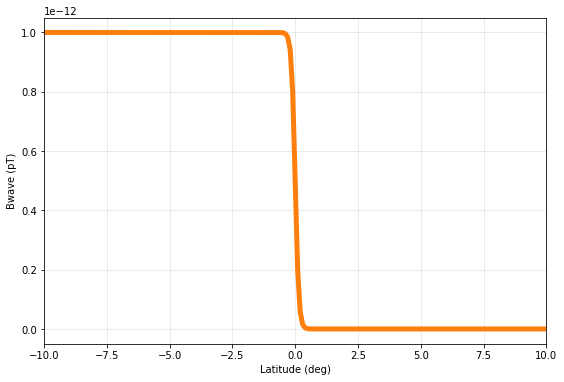

In [7]:
from waveproperties_mod import one_sided_wave_packet

lamda_packet2=np.arange(-10,10,0.1)
lamda_packet_rad2=np.deg2rad(lamda_packet2)

Byw0_packet2=1*10**(-12)
shape=7
direction='south'
location=0
Bw_packet2=[]

for i in range(0,len(lamda_packet2)):

    Bytmp=wave.one_sided_wave_packet(Byw0_packet2,lamda_packet_rad2[i],shape,location,direction)

#     print(Bytmp)
    Bw_packet2.append(Bytmp)

    
fig, ax = plt.subplots(figsize=(9,6))
s=5
ax.plot(lamda_packet2,Bw_packet2,c='tab:orange',linewidth=s)
ax.grid(alpha=.3)
ax.set_xlim(-10,10)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel('Bwave (pT)')

# ax.set_ylim(-2,2)
ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('gyro-phase (rad)', rotation=270,labelpad=15)
#     ax.axvline(x=-5,color="black", linestyle="--")
plt.show()


### Runge-Kutta

In [8]:
for k in range(0,len(eta0)):
    i=0
    time[k,0]=0
    pper[k,0]=pper0
    ppar[k,0]=ppar0
    eta[k,0]=eta0[k]
    lamda[k,0]=lamda0
    zeta[k,0]=0
    upar[k,0]=upar0
    uper[k,0]=uper0
    alpha[k,0]=alpha0
    alpha2[k,0]=alpha0
    aeq[k,0]=aeq0
    aeq2[k,0]=aeq0
    mu_out[k,0]=mu0
    deta_dt[k,0]=0
    S_stix[k,0]=S0
    D_stix[k,0]=D0
    P_stix[k,0]=P0
    R_stix[k,0]=R0
    L_stix[k,0]=L0
    kappa_out[k,0]=kappa0
    kx_out[k,0]=kappax0
    kz_out[k,0]=kappaz0
    dwh_dt_out[k,0]=dwceds0
    gamma_out[k,0]=gamma0
    E_kin[k,0]=1.602176487E-16*Ekev0 #from keV to ergs
    v_res_out[k,0]=v_para_res0
    E_res_out[k,0]=E_res0
    Bxw_out[k,0]=Bxw0
    Byw_out[k,0]=Byw0
    Bzw_out[k,0]=Bzw0
    Exw_out[k,0]=Exw0
    Eyw_out[k,0]=Eyw0
    Ezw_out[k,0]=Ezw0
#     print(np.rad2deg(eta[k,0]))
    while i<Nsteps:
    ######################################################################################################
    #First step of Runge Kutta
    ######################################################################################################

        Bmag=env.Bmag_dipole(L_shell,lamda[k,i])
        ne=env.densities_denton(ne_0,lamda[k,i])

        #assuming 94%H+, 5.4%He+, 0.6%O+
        nH=0.94*ne
        nHe=0.054*ne
        nO=0.006*ne    

        S,D,P,R,L=wave.stix_parameters(w_wave, ne, nH, nHe, nO, Bmag)

        eta_sq_plus,eta_sq_minus,mu,kappa,kz,kx=wave.ref_index(theta0,w_wave,S,P,R,L)

        wce=env.omega_cyclotron(Bmag,env.const.qe,env.const.me)
        By_packet=one_sided_wave_packet(By_wave,lamda[k,i],shape,location,direction)

        Bxw, Byw, Bzw, Exw, Eyw, Ezw=wave.wave_amplitudes_bell(mu,P,D,S,By_packet,theta0)
        dwceds=env.dwc_ds(wce,lamda[k,i],L_shell)

        gamma,w1,w2,wtau_sq,R1,R2,beta=wpi.wpi_params(m_res,ppar[k,i],pper[k,i],Bxw, Byw,Exw,Eyw,Ezw,kz,kx,wce)
        v_para_res, v_per_res, v_tot_res, E_res,gamma_res=wave.resonant_velocity(m_res,w_wave,kz,wce,alpha[k,i],env.const.me)
        
        
        k1=wpi.dzdt(ppar[k,i],gamma,env.const.me)
        l1=wpi.dppardt(pper[k,i],eta[k,i],wtau_sq,kz,gamma,wce,dwceds)
        m1=wpi.dpperdt(ppar[k,i],pper[k,i],eta[k,i],w1,w2,beta,gamma,R1,R2,m_res,wce,dwceds)
        n1=wpi.detadt(ppar[k,i],m_res,wce,w_wave,gamma,kz)
        o1=wpi.dlamdadt(ppar[k,i],lamda[k,i],gamma,L_shell)
        p1=wpi.dalphadt(pper[k,i],ppar[k,i],eta[k,i],w1,w2,R1,R2,wtau_sq,kz,beta,m_res,gamma,wce,dwceds)
        q1=wpi.daeqdt(ppar[k,i],pper[k,i],alpha[k,i],aeq[k,i],eta[k,i],w1,R1,w2,R2,gamma,beta,wtau_sq,kz,m_res)
        r1=wpi.dgammadt(pper[k,i],ppar[k,i],eta[k,i],m_res,Exw,Eyw,Ezw,beta,gamma)
        s1=wpi.dEkdt(pper[k,i],ppar[k,i],eta[k,i],m_res,Exw,Eyw,Ezw,beta,gamma)
        

#     ######################################################################################################
#     #Second step of Runge Kutta
#     ######################################################################################################

        Bmag=env.Bmag_dipole(L_shell,lamda[k,i]+0.5*h*o1)
        ne=env.densities_denton(ne_0,lamda[k,i]+0.5*h*o1)

        #assuming 94%H+, 5.4%He+, 0.6%O+
        nH=0.94*ne
        nHe=0.054*ne
        nO=0.006*ne    

        S,D,P,R,L=wave.stix_parameters(w_wave, ne, nH, nHe, nO, Bmag)

        eta_sq_plus,eta_sq_minus,mu,kappa,kz,kx=wave.ref_index(theta0,w_wave,S,P,R,L)

        wce=env.omega_cyclotron(Bmag,env.const.qe,env.const.me)
        By_packet=one_sided_wave_packet(By_wave,lamda[k,i]+0.5*h*o1,shape,location,direction)

        Bxw, Byw, Bzw, Exw, Eyw, Ezw=wave.wave_amplitudes_bell(mu,P,D,S,By_packet,theta0)
        dwceds=env.dwc_ds(wce,lamda[k,i]+0.5*h*o1,L_shell)

        gamma,w1,w2,wtau_sq,R1,R2,beta=wpi.wpi_params(m_res,ppar[k,i]+0.5*h*l1,pper[k,i]+0.5*h*m1,Bxw, Byw,Exw,Eyw,Ezw,kz,kx,wce)
        v_para_res, v_per_res, v_tot_res, E_res,gamma_res=wave.resonant_velocity(m_res,w_wave,kz,wce,alpha[k,i]+0.5*h*p1,env.const.me)
        
        
        k2=wpi.dzdt(ppar[k,i]+0.5*h*l1,gamma,env.const.me)
        l2=wpi.dppardt(pper[k,i]+0.5*h*m1,eta[k,i]+0.5*h*n1,wtau_sq,kz,gamma,wce,dwceds)
        m2=wpi.dpperdt(ppar[k,i]+0.5*h*l1,pper[k,i]+0.5*h*m1,eta[k,i]+0.5*h*n1,w1,w2,beta,gamma,R1,R2,m_res,wce,dwceds)
        n2=wpi.detadt(ppar[k,i]+0.5*h*l1,m_res,wce,w_wave,gamma,kz)
        o2=wpi.dlamdadt(ppar[k,i]+0.5*h*l1,lamda[k,i]+0.5*h*o1,gamma,L_shell)
        p2=wpi.dalphadt(pper[k,i]+0.5*h*m1,ppar[k,i]+0.5*h*l1,eta[k,i]+0.5*h*n1,w1,w2,R1,R2,wtau_sq,kz,beta,m_res,gamma,wce,dwceds)
        q2=wpi.daeqdt(ppar[k,i]+0.5*h*l1,pper[k,i]+0.5*h*m1,alpha[k,i]+0.5*h*p1,aeq[k,i]+0.5*h*q1,eta[k,i]+0.5*h*n1,w1,R1,w2,R2,gamma,beta,wtau_sq,kz,m_res)
        r2=wpi.dgammadt(pper[k,i]+0.5*h*m1,ppar[k,i]+0.5*h*l1,eta[k,i]+0.5*h*n1,m_res,Exw,Eyw,Ezw,beta,gamma)
        s2=wpi.dEkdt(pper[k,i]+0.5*h*m1,ppar[k,i]+0.5*h*l1,eta[k,i]+0.5*h*n1,m_res,Exw,Eyw,Ezw,beta,gamma)
        
#     ######################################################################################################
#     #Third step of Runge Kutta
#     ######################################################################################################

        Bmag=env.Bmag_dipole(L_shell,lamda[k,i]+0.5*h*o2)
        ne=env.densities_denton(ne_0,lamda[k,i]+0.5*h*o2)

        #assuming 94%H+, 5.4%He+, 0.6%O+
        nH=0.94*ne
        nHe=0.054*ne
        nO=0.006*ne    

        S,D,P,R,L=wave.stix_parameters(w_wave, ne, nH, nHe, nO, Bmag)

        eta_sq_plus,eta_sq_minus,mu,kappa,kz,kx=wave.ref_index(theta0,w_wave,S,P,R,L)


        wce=env.omega_cyclotron(Bmag,env.const.qe,env.const.me)

        By_packet=wave.one_sided_wave_packet(By_wave,lamda[k,i]+0.5*h*o2,shape,location,direction)
        Bxw, Byw, Bzw, Exw, Eyw, Ezw=wave.wave_amplitudes_bell(mu,P,D,S,By_packet,theta0)
        dwceds=env.dwc_ds(wce,lamda[k,i]+0.5*h*o2,L_shell)

        gamma,w1,w2,wtau_sq,R1,R2,beta=wpi.wpi_params(m_res,ppar[k,i]+0.5*h*l2,pper[k,i]+0.5*h*m2,Bxw, Byw,Exw,Eyw,Ezw,kz,kx,wce)
        v_para_res, v_per_res, v_tot_res, E_res,gamma_res=wave.resonant_velocity(m_res,w_wave,kz,wce,alpha[k,i]+0.5*h*p2,env.const.me)
        
        
        k3=wpi.dzdt(ppar[k,i]+0.5*h*l2,gamma,env.const.me)
        l3=wpi.dppardt(pper[k,i]+0.5*h*m2,eta[k,i]+0.5*h*n2,wtau_sq,kz,gamma,wce,dwceds)
        m3=wpi.dpperdt(ppar[k,i]+0.5*h*l2,pper[k,i]+0.5*h*m2,eta[k,i]+0.5*h*n2,w1,w2,beta,gamma,R1,R2,m_res,wce,dwceds)
        n3=wpi.detadt(ppar[k,i]+0.5*h*l2,m_res,wce,w_wave,gamma,kz)
        o3=wpi.dlamdadt(ppar[k,i]+0.5*h*l2,lamda[k,i]+0.5*h*o2,gamma,L_shell)
        p3=wpi.dalphadt(pper[k,i]+0.5*h*m2,ppar[k,i]+0.5*h*l2,eta[k,i]+0.5*h*n2,w1,w2,R1,R2,wtau_sq,kz,beta,m_res,gamma,wce,dwceds)
        q3=wpi.daeqdt(ppar[k,i]+0.5*h*l2,pper[k,i]+0.5*h*m2,alpha[k,i]+0.5*h*p2,aeq[k,i]+0.5*h*q2,eta[k,i]+0.5*h*n2,w1,R1,w2,R2,gamma,beta,wtau_sq,kz,m_res)
        r3=wpi.dgammadt(pper[k,i]+0.5*h*m2,ppar[k,i]+0.5*h*l2,eta[k,i]+0.5*h*n2,m_res,Exw,Eyw,Ezw,beta,gamma)
        s3=wpi.dEkdt(pper[k,i]+0.5*h*m2,ppar[k,i]+0.5*h*l2,eta[k,i]+0.5*h*n2,m_res,Exw,Eyw,Ezw,beta,gamma)
#     ######################################################################################################
#     #Fourth step of Runge Kutta
#     ######################################################################################################

        Bmag=env.Bmag_dipole(L_shell,lamda[k,i]+h*o3)
        ne=env.densities_denton(ne_0,lamda[k,i]+h*o3)

        #assuming 94%H+, 5.4%He+, 0.6%O+
        nH=0.94*ne
        nHe=0.054*ne
        nO=0.006*ne    

        S,D,P,R,L=wave.stix_parameters(w_wave, ne, nH, nHe, nO, Bmag)

        eta_sq_plus,eta_sq_minus,mu,kappa,kz,kx=wave.ref_index(theta0,w_wave,S,P,R,L)


        wce=env.omega_cyclotron(Bmag,env.const.qe,env.const.me)

        By_packet=wave.one_sided_wave_packet(By_wave,lamda[k,i]+h*o3,shape,location,direction)
        Bxw, Byw, Bzw, Exw, Eyw, Ezw=wave.wave_amplitudes_bell(mu,P,D,S,By_packet,theta0)
        dwceds=env.dwc_ds(wce,lamda[k,i]+h*o3,L_shell)

        gamma,w1,w2,wtau_sq,R1,R2,beta=wpi.wpi_params(m_res,ppar[k,i]+h*l3,pper[k,i]+h*m3,Bxw, Byw,Exw,Eyw,Ezw,kz,kx,wce)
        v_para_res, v_per_res, v_tot_res, E_res,gamma_res=wave.resonant_velocity(m_res,w_wave,kz,wce,alpha[k,i]+h*p3,env.const.me)
        
        
        k4=wpi.dzdt(ppar[k,i]+h*l3,gamma,env.const.me)
        l4=wpi.dppardt(pper[k,i]+h*m3,eta[k,i]+h*n3,wtau_sq,kz,gamma,wce,dwceds)
        m4=wpi.dpperdt(ppar[k,i]+h*l3,pper[k,i]+h*m3,eta[k,i]+h*n3,w1,w2,beta,gamma,R1,R2,m_res,wce,dwceds)
        n4=wpi.detadt(ppar[k,i]+h*l3,m_res,wce,w_wave,gamma,kz)
        o4=wpi.dlamdadt(ppar[k,i]+h*l3,lamda[k,i]+h*o3,gamma,L_shell)
        p4=wpi.dalphadt(pper[k,i]+h*m3,ppar[k,i]+h*l3,eta[k,i]+h*n3,w1,w2,R1,R2,wtau_sq,kz,beta,m_res,gamma,wce,dwceds)
        q4=wpi.daeqdt(ppar[k,i]+h*l3,pper[k,i]+h*m3,alpha[k,i]+h*p3,aeq[k,i]+h*q3,eta[k,i]+h*n3,w1,R1,w2,R2,gamma,beta,wtau_sq,kz,m_res)
        r4=wpi.dgammadt(pper[k,i]+h*m3,ppar[k,i]+h*l3,eta[k,i]+h*n3,m_res,Exw,Eyw,Ezw,beta,gamma)
        s4=wpi.dEkdt(pper[k,i]+h*m3,ppar[k,i]+h*l3,eta[k,i]+h*n3,m_res,Exw,Eyw,Ezw,beta,gamma)
        
        ####################################################################################################
        #calculate the final parameters 
        zeta[k,i+1]=zeta[k,i]+(h/6)*(k1+2*k2+2*k3+k4)
        ppar[k,i+1]=ppar[k,i]+(h/6)*(l1+2*l2+2*l3+l4)
        pper[k,i+1]=pper[k,i]+(h/6)*(m1+2*m2+2*m3+m4)
        eta[k,i+1]=(eta[k,i]+(h/6)*(n1+2*n2+2*n3+n4))
        lamda[k,i+1]=lamda[k,i]+(h/6)*(o1+2*o2+2*o3+o4)
        alpha[k,i+1]=alpha[k,i]+(h/6)*(p1+2*p2+2*p3+p4)
        aeq[k,i+1]=aeq[k,i]+(h/6)*(q1+2*q2+2*q3+q4)
        deta_dt[k,i+1]=(1/6)*(n1+2*n2+2*n3+n4)
        gamma_out[k,i+1]=gamma_out[k,i]+(h/6)*(r1+2*r2+2*r3+r4)
        E_kin[k,i+1]=E_kin[k,i]+(h/6)*(s1+2*s2+2*s3+s4)

        upar[k,i+1]=ppar[k,i+1]/(env.const.me*gamma)
        uper[k,i+1]=pper[k,i+1]/(env.const.me*gamma)
        u_mag=np.sqrt(upar[k,i+1]+uper[k,i+1]**2)

#         #############################################################################################
#         Calculate parameters at final step

        Bmag=env.Bmag_dipole(L_shell,lamda[k,i+1])
        ne=env.densities_denton(ne_0,lamda[k,i+1])
        #assuming 94%H+, 5.4%He+, 0.6%O+
        nH=0.94*ne
        nHe=0.054*ne
        nO=0.006*ne    
        S,D,P,R,L=wave.stix_parameters(w_wave, ne, nH, nHe, nO, Bmag)
        eta_sq_plus,eta_sq_minus,mu,kappa,kz,kx=wave.ref_index(theta0,w_wave,S,P,R,L)
        wce=env.omega_cyclotron(Bmag,env.const.qe,env.const.me)
        By_packet=wave.one_sided_wave_packet(By_wave,lamda[k,i+1],shape,location,direction)
        Bxw, Byw, Bzw, Exw, Eyw, Ezw=wave.wave_amplitudes_bell(mu,P,D,S,By_packet,theta0)
        dwceds=env.dwc_ds(wce,lamda[k,i+1],L_shell)
        gamma,w1,w2,wtau_sq,R1,R2,beta=wpi.wpi_params(m_res,ppar[k,i+1],pper[k,i+1],Bxw, Byw,Exw,Eyw,Ezw,kz,kx,wce)
        v_para_res, v_per_res, v_tot_res, E_res,gamma_res=wave.resonant_velocity(m_res,w_wave,kz,wce,alpha[k,i+1],env.const.me)
        
        
        mu_out[k,i+1]=mu
        S_stix[k,i+1]=S
        D_stix[k,i+1]=D
        P_stix[k,i+1]=P
        R_stix[k,i+1]=R
        L_stix[k,i+1]=L
        kx_out[k,i+1]=kx
        kz_out[k,i+1]=kz
        dwh_dt_out[k,i+1]=dwceds
        kappa_out[k,i+1]=kappa
        
        Bxw_out[k,i+1]=Bxw
        Byw_out[k,i+1]=Byw
        Bzw_out[k,i+1]=Bzw
        Exw_out[k,i+1]=Exw
        Eyw_out[k,i+1]=Eyw
        Ezw_out[k,i+1]=Ezw

        v_res_out[k,i+1]=v_para_res
        E_res_out[k,i+1]=E_res
        
        ##############
        
        C0_rk=wpi.nonlinear_C0(ppar[k,i+1],m_res,wce,kz,gamma,Ezw)
        C1p_rk=wpi.nonlinear_C1p(pper[k,i+1],ppar[k,i+1],w2,Exw,Eyw,m_res,wce,kz,gamma)
        C1m_rk=wpi.nonlinear_C1m(pper[k,i+1],ppar[k,i+1],w1,Exw,Eyw,m_res,wce,kz,gamma)
        
        th_rk,wtr_rk=wpi.nonlinear_theta(C0_rk,C1p_rk,C1m_rk,m_res,beta)
        
        dkpar_dt=(kappa_out[k,i]-kappa_out[k,i-1])/h

        H_rk=wpi.nonlinear_H(pper[k,i+1],ppar[k,i+1],kz,gamma,m_res,env.const.me,wce,dkpar_dt,dwceds,0)
        
        S_rk=wpi.nonlinear_S(H_rk,wtr_rk)
        
        S_out[k,i+1]=S_rk
        wtrsq_out[k,i+1]=wtr_rk
        C0_out[k,i+1]=C0_rk
        C1p_out[k,i+1]=C1p_rk
        C1m_out[k,i+1]=C1m_rk
        ##############
        
        i=i+1
        time[k,i]=time[k,i-1]+h

        print(time[k,i])
        


1e-05
2e-05
3.0000000000000004e-05
4e-05
5e-05
6e-05
7.000000000000001e-05
8e-05
9e-05
0.0001
0.00011
0.00012
0.00013000000000000002
0.00014000000000000001
0.00015000000000000001
0.00016
0.00017
0.00018
0.00019
0.0002
0.00021
0.00022
0.00023
0.00024
0.00025
0.00026000000000000003
0.00027000000000000006
0.0002800000000000001
0.0002900000000000001
0.00030000000000000014
0.00031000000000000016
0.0003200000000000002
0.0003300000000000002
0.00034000000000000024
0.00035000000000000027
0.0003600000000000003
0.0003700000000000003
0.00038000000000000035
0.00039000000000000037
0.0004000000000000004
0.0004100000000000004
0.00042000000000000045
0.0004300000000000005
0.0004400000000000005
0.00045000000000000053
0.00046000000000000056
0.0004700000000000006
0.0004800000000000006
0.0004900000000000006
0.0005000000000000007
0.0005100000000000007
0.0005200000000000007
0.0005300000000000007
0.0005400000000000008
0.0005500000000000008
0.0005600000000000008
0.0005700000000000008
0.0005800000000000009
0.000

0.013969999999999599
0.013979999999999599
0.013989999999999598
0.013999999999999598
0.014009999999999597
0.014019999999999597
0.014029999999999597
0.014039999999999596
0.014049999999999596
0.014059999999999595
0.014069999999999595
0.014079999999999595
0.014089999999999594
0.014099999999999594
0.014109999999999593
0.014119999999999593
0.014129999999999593
0.014139999999999592
0.014149999999999592
0.014159999999999591
0.014169999999999591
0.01417999999999959
0.01418999999999959
0.01419999999999959
0.01420999999999959
0.014219999999999589
0.014229999999999588
0.014239999999999588
0.014249999999999588
0.014259999999999587
0.014269999999999587
0.014279999999999586
0.014289999999999586
0.014299999999999586
0.014309999999999585
0.014319999999999585
0.014329999999999584
0.014339999999999584
0.014349999999999584
0.014359999999999583
0.014369999999999583
0.014379999999999582
0.014389999999999582
0.014399999999999582
0.014409999999999581
0.01441999999999958
0.01442999999999958
0.01443999999999958

0.018979999999999397
0.018989999999999396
0.018999999999999396
0.019009999999999395
0.019019999999999395
0.019029999999999395
0.019039999999999394
0.019049999999999394
0.019059999999999393
0.019069999999999393
0.019079999999999393
0.019089999999999392
0.019099999999999392
0.01910999999999939
0.01911999999999939
0.01912999999999939
0.01913999999999939
0.01914999999999939
0.01915999999999939
0.01916999999999939
0.01917999999999939
0.019189999999999388
0.019199999999999388
0.019209999999999387
0.019219999999999387
0.019229999999999386
0.019239999999999386
0.019249999999999386
0.019259999999999385
0.019269999999999385
0.019279999999999384
0.019289999999999384
0.019299999999999384
0.019309999999999383
0.019319999999999383
0.019329999999999382
0.019339999999999382
0.01934999999999938
0.01935999999999938
0.01936999999999938
0.01937999999999938
0.01938999999999938
0.01939999999999938
0.01940999999999938
0.01941999999999938
0.01942999999999938
0.019439999999999378
0.019449999999999378
0.0194599

0.024229999999999183
0.024239999999999182
0.024249999999999182
0.02425999999999918
0.02426999999999918
0.02427999999999918
0.02428999999999918
0.02429999999999918
0.02430999999999918
0.02431999999999918
0.02432999999999918
0.024339999999999178
0.024349999999999178
0.024359999999999177
0.024369999999999177
0.024379999999999177
0.024389999999999176
0.024399999999999176
0.024409999999999175
0.024419999999999175
0.024429999999999175
0.024439999999999174
0.024449999999999174
0.024459999999999173
0.024469999999999173
0.024479999999999173
0.024489999999999172
0.024499999999999172
0.02450999999999917
0.02451999999999917
0.02452999999999917
0.02453999999999917
0.02454999999999917
0.02455999999999917
0.02456999999999917
0.02457999999999917
0.024589999999999168
0.024599999999999168
0.024609999999999167
0.024619999999999167
0.024629999999999166
0.024639999999999166
0.024649999999999166
0.024659999999999165
0.024669999999999165
0.024679999999999164
0.024689999999999164
0.024699999999999164
0.024709

0.02922999999999898
0.02923999999999898
0.029249999999998978
0.029259999999998978
0.029269999999998977
0.029279999999998977
0.029289999999998977
0.029299999999998976
0.029309999999998976
0.029319999999998975
0.029329999999998975
0.029339999999998975
0.029349999999998974
0.029359999999998974
0.029369999999998973
0.029379999999998973
0.029389999999998973
0.029399999999998972
0.02940999999999897
0.02941999999999897
0.02942999999999897
0.02943999999999897
0.02944999999999897
0.02945999999999897
0.02946999999999897
0.02947999999999897
0.02948999999999897
0.029499999999998968
0.029509999999998968
0.029519999999998967
0.029529999999998967
0.029539999999998966
0.029549999999998966
0.029559999999998966
0.029569999999998965
0.029579999999998965
0.029589999999998964
0.029599999999998964
0.029609999999998964
0.029619999999998963
0.029629999999998963
0.029639999999998962
0.029649999999998962
0.02965999999999896
0.02966999999999896
0.02967999999999896
0.02968999999999896
0.02969999999999896
0.029709

0.03351999999999959
0.033529999999999595
0.0335399999999996
0.0335499999999996
0.033559999999999604
0.03356999999999961
0.03357999999999961
0.03358999999999961
0.033599999999999616
0.03360999999999962
0.03361999999999962
0.033629999999999625
0.03363999999999963
0.03364999999999963
0.033659999999999635
0.03366999999999964
0.03367999999999964
0.033689999999999644
0.03369999999999965
0.03370999999999965
0.03371999999999965
0.033729999999999656
0.03373999999999966
0.03374999999999966
0.033759999999999665
0.03376999999999967
0.03377999999999967
0.033789999999999674
0.03379999999999968
0.03380999999999968
0.033819999999999684
0.03382999999999969
0.03383999999999969
0.03384999999999969
0.033859999999999696
0.0338699999999997
0.0338799999999997
0.033889999999999705
0.03389999999999971
0.03390999999999971
0.033919999999999714
0.03392999999999972
0.03393999999999972
0.03394999999999972
0.033959999999999727
0.03396999999999973
0.03397999999999973
0.033989999999999736
0.03399999999999974
0.0340099

0.03819000000000102
0.038200000000001025
0.03821000000000103
0.03822000000000103
0.038230000000001034
0.03824000000000104
0.03825000000000104
0.03826000000000104
0.038270000000001046
0.03828000000000105
0.03829000000000105
0.038300000000001055
0.03831000000000106
0.03832000000000106
0.038330000000001065
0.03834000000000107
0.03835000000000107
0.038360000000001074
0.03837000000000108
0.03838000000000108
0.03839000000000108
0.038400000000001086
0.03841000000000109
0.03842000000000109
0.038430000000001095
0.0384400000000011
0.0384500000000011
0.038460000000001104
0.03847000000000111
0.03848000000000111
0.038490000000001114
0.03850000000000112
0.03851000000000112
0.03852000000000112
0.038530000000001126
0.03854000000000113
0.03855000000000113
0.038560000000001135
0.03857000000000114
0.03858000000000114
0.038590000000001144
0.03860000000000115
0.03861000000000115
0.03862000000000115
0.038630000000001156
0.03864000000000116
0.03865000000000116
0.038660000000001166
0.03867000000000117
0.03868

0.04360000000000268
0.04361000000000268
0.043620000000002684
0.04363000000000269
0.04364000000000269
0.043650000000002694
0.0436600000000027
0.0436700000000027
0.0436800000000027
0.043690000000002706
0.04370000000000271
0.04371000000000271
0.043720000000002715
0.04373000000000272
0.04374000000000272
0.043750000000002724
0.04376000000000273
0.04377000000000273
0.04378000000000273
0.043790000000002736
0.04380000000000274
0.04381000000000274
0.043820000000002746
0.04383000000000275
0.04384000000000275
0.043850000000002755
0.04386000000000276
0.04387000000000276
0.043880000000002764
0.04389000000000277
0.04390000000000277
0.04391000000000277
0.043920000000002776
0.04393000000000278
0.04394000000000278
0.043950000000002785
0.04396000000000279
0.04397000000000279
0.043980000000002795
0.0439900000000028
0.0440000000000028
0.044010000000002804
0.04402000000000281
0.04403000000000281
0.04404000000000281
0.044050000000002816
0.04406000000000282
0.04407000000000282
0.044080000000002825
0.04409000

0.04771000000000394
0.04772000000000394
0.04773000000000394
0.047740000000003946
0.04775000000000395
0.04776000000000395
0.047770000000003955
0.04778000000000396
0.04779000000000396
0.047800000000003964
0.04781000000000397
0.04782000000000397
0.047830000000003974
0.04784000000000398
0.04785000000000398
0.04786000000000398
0.047870000000003986
0.04788000000000399
0.04789000000000399
0.047900000000003995
0.047910000000004
0.047920000000004
0.047930000000004004
0.04794000000000401
0.04795000000000401
0.04796000000000401
0.047970000000004016
0.04798000000000402
0.04799000000000402
0.048000000000004026
0.04801000000000403
0.04802000000000403
0.048030000000004035
0.04804000000000404
0.04805000000000404
0.048060000000004044
0.04807000000000405
0.04808000000000405
0.04809000000000405
0.048100000000004056
0.04811000000000406
0.04812000000000406
0.048130000000004065
0.04814000000000407
0.04815000000000407
0.048160000000004075
0.04817000000000408
0.04818000000000408
0.048190000000004084
0.0482000

0.0518300000000052
0.0518400000000052
0.051850000000005204
0.05186000000000521
0.05187000000000521
0.051880000000005214
0.05189000000000522
0.05190000000000522
0.05191000000000522
0.051920000000005226
0.05193000000000523
0.05194000000000523
0.051950000000005235
0.05196000000000524
0.05197000000000524
0.051980000000005244
0.05199000000000525
0.05200000000000525
0.05201000000000525
0.052020000000005256
0.05203000000000526
0.05204000000000526
0.052050000000005266
0.05206000000000527
0.05207000000000527
0.052080000000005275
0.05209000000000528
0.05210000000000528
0.052110000000005284
0.05212000000000529
0.05213000000000529
0.05214000000000529
0.052150000000005296
0.0521600000000053
0.0521700000000053
0.052180000000005305
0.05219000000000531
0.05220000000000531
0.052210000000005315
0.05222000000000532
0.05223000000000532
0.052240000000005324
0.05225000000000533
0.05226000000000533
0.05227000000000533
0.052280000000005336
0.05229000000000534
0.05230000000000534
0.052310000000005345
0.0523200

0.05919000000000745
0.059200000000007455
0.05921000000000746
0.05922000000000746
0.059230000000007464
0.05924000000000747
0.05925000000000747
0.05926000000000747
0.059270000000007476
0.05928000000000748
0.05929000000000748
0.059300000000007486
0.05931000000000749
0.05932000000000749
0.059330000000007495
0.0593400000000075
0.0593500000000075
0.059360000000007504
0.05937000000000751
0.05938000000000751
0.05939000000000751
0.059400000000007516
0.05941000000000752
0.05942000000000752
0.059430000000007525
0.05944000000000753
0.05945000000000753
0.059460000000007535
0.05947000000000754
0.05948000000000754
0.059490000000007544
0.05950000000000755
0.05951000000000755
0.05952000000000755
0.059530000000007556
0.05954000000000756
0.05955000000000756
0.059560000000007565
0.05957000000000757
0.05958000000000757
0.059590000000007574
0.05960000000000758
0.05961000000000758
0.059620000000007584
0.05963000000000759
0.05964000000000759
0.05965000000000759
0.059660000000007596
0.0596700000000076
0.059680

0.06419000000000781
0.0642000000000078
0.0642100000000078
0.0642200000000078
0.0642300000000078
0.06424000000000779
0.06425000000000779
0.06426000000000778
0.06427000000000778
0.06428000000000778
0.06429000000000777
0.06430000000000777
0.06431000000000776
0.06432000000000776
0.06433000000000776
0.06434000000000775
0.06435000000000775
0.06436000000000774
0.06437000000000774
0.06438000000000774
0.06439000000000773
0.06440000000000773
0.06441000000000772
0.06442000000000772
0.06443000000000772
0.06444000000000771
0.06445000000000771
0.0644600000000077
0.0644700000000077
0.0644800000000077
0.0644900000000077
0.06450000000000769
0.06451000000000769
0.06452000000000768
0.06453000000000768
0.06454000000000767
0.06455000000000767
0.06456000000000767
0.06457000000000766
0.06458000000000766
0.06459000000000766
0.06460000000000765
0.06461000000000765
0.06462000000000764
0.06463000000000764
0.06464000000000764
0.06465000000000763
0.06466000000000763
0.06467000000000762
0.06468000000000762
0.064690

0.06918000000000588
0.06919000000000587
0.06920000000000587
0.06921000000000586
0.06922000000000586
0.06923000000000586
0.06924000000000585
0.06925000000000585
0.06926000000000584
0.06927000000000584
0.06928000000000584
0.06929000000000583
0.06930000000000583
0.06931000000000583
0.06932000000000582
0.06933000000000582
0.06934000000000581
0.06935000000000581
0.0693600000000058
0.0693700000000058
0.0693800000000058
0.0693900000000058
0.06940000000000579
0.06941000000000579
0.06942000000000578
0.06943000000000578
0.06944000000000577
0.06945000000000577
0.06946000000000577
0.06947000000000576
0.06948000000000576
0.06949000000000576
0.06950000000000575
0.06951000000000575
0.06952000000000574
0.06953000000000574
0.06954000000000574
0.06955000000000573
0.06956000000000573
0.06957000000000572
0.06958000000000572
0.06959000000000572
0.06960000000000571
0.06961000000000571
0.0696200000000057
0.0696300000000057
0.0696400000000057
0.0696500000000057
0.06966000000000569
0.06967000000000569
0.069680

0.0041899999999999975
0.004199999999999997
0.004209999999999997
0.004219999999999996
0.004229999999999996
0.0042399999999999955
0.004249999999999995
0.004259999999999995
0.004269999999999994
0.004279999999999994
0.0042899999999999935
0.004299999999999993
0.004309999999999993
0.004319999999999992
0.004329999999999992
0.0043399999999999914
0.004349999999999991
0.004359999999999991
0.00436999999999999
0.00437999999999999
0.004389999999999989
0.004399999999999989
0.004409999999999989
0.004419999999999988
0.004429999999999988
0.004439999999999987
0.004449999999999987
0.0044599999999999865
0.004469999999999986
0.004479999999999986
0.004489999999999985
0.004499999999999985
0.0045099999999999845
0.004519999999999984
0.004529999999999984
0.004539999999999983
0.004549999999999983
0.0045599999999999825
0.004569999999999982
0.004579999999999982
0.004589999999999981
0.004599999999999981
0.00460999999999998
0.00461999999999998
0.00462999999999998
0.004639999999999979
0.004649999999999979
0.004659999

0.009359999999999787
0.009369999999999786
0.009379999999999786
0.009389999999999786
0.009399999999999785
0.009409999999999785
0.009419999999999784
0.009429999999999784
0.009439999999999784
0.009449999999999783
0.009459999999999783
0.009469999999999782
0.009479999999999782
0.009489999999999782
0.009499999999999781
0.00950999999999978
0.00951999999999978
0.00952999999999978
0.00953999999999978
0.00954999999999978
0.009559999999999779
0.009569999999999778
0.009579999999999778
0.009589999999999778
0.009599999999999777
0.009609999999999777
0.009619999999999776
0.009629999999999776
0.009639999999999775
0.009649999999999775
0.009659999999999775
0.009669999999999774
0.009679999999999774
0.009689999999999773
0.009699999999999773
0.009709999999999773
0.009719999999999772
0.009729999999999772
0.009739999999999771
0.009749999999999771
0.00975999999999977
0.00976999999999977
0.00977999999999977
0.00978999999999977
0.009799999999999769
0.009809999999999769
0.009819999999999768
0.009829999999999768
0

0.01417999999999959
0.01418999999999959
0.01419999999999959
0.01420999999999959
0.014219999999999589
0.014229999999999588
0.014239999999999588
0.014249999999999588
0.014259999999999587
0.014269999999999587
0.014279999999999586
0.014289999999999586
0.014299999999999586
0.014309999999999585
0.014319999999999585
0.014329999999999584
0.014339999999999584
0.014349999999999584
0.014359999999999583
0.014369999999999583
0.014379999999999582
0.014389999999999582
0.014399999999999582
0.014409999999999581
0.01441999999999958
0.01442999999999958
0.01443999999999958
0.01444999999999958
0.014459999999999579
0.014469999999999579
0.014479999999999578
0.014489999999999578
0.014499999999999577
0.014509999999999577
0.014519999999999577
0.014529999999999576
0.014539999999999576
0.014549999999999575
0.014559999999999575
0.014569999999999575
0.014579999999999574
0.014589999999999574
0.014599999999999573
0.014609999999999573
0.014619999999999573
0.014629999999999572
0.014639999999999572
0.014649999999999571


0.019559999999999373
0.019569999999999373
0.019579999999999372
0.019589999999999372
0.01959999999999937
0.01960999999999937
0.01961999999999937
0.01962999999999937
0.01963999999999937
0.01964999999999937
0.01965999999999937
0.01966999999999937
0.019679999999999368
0.019689999999999368
0.019699999999999367
0.019709999999999367
0.019719999999999367
0.019729999999999366
0.019739999999999366
0.019749999999999365
0.019759999999999365
0.019769999999999364
0.019779999999999364
0.019789999999999364
0.019799999999999363
0.019809999999999363
0.019819999999999362
0.019829999999999362
0.01983999999999936
0.01984999999999936
0.01985999999999936
0.01986999999999936
0.01987999999999936
0.01988999999999936
0.01989999999999936
0.01990999999999936
0.01991999999999936
0.019929999999999358
0.019939999999999358
0.019949999999999357
0.019959999999999357
0.019969999999999356
0.019979999999999356
0.019989999999999356
0.019999999999999355
0.020009999999999355
0.020019999999999354
0.020029999999999354
0.0200399

0.023879999999999197
0.023889999999999197
0.023899999999999196
0.023909999999999196
0.023919999999999195
0.023929999999999195
0.023939999999999195
0.023949999999999194
0.023959999999999194
0.023969999999999193
0.023979999999999193
0.023989999999999193
0.023999999999999192
0.02400999999999919
0.02401999999999919
0.02402999999999919
0.02403999999999919
0.02404999999999919
0.02405999999999919
0.02406999999999919
0.02407999999999919
0.02408999999999919
0.024099999999999188
0.024109999999999188
0.024119999999999187
0.024129999999999187
0.024139999999999186
0.024149999999999186
0.024159999999999186
0.024169999999999185
0.024179999999999185
0.024189999999999184
0.024199999999999184
0.024209999999999184
0.024219999999999183
0.024229999999999183
0.024239999999999182
0.024249999999999182
0.02425999999999918
0.02426999999999918
0.02427999999999918
0.02428999999999918
0.02429999999999918
0.02430999999999918
0.02431999999999918
0.02432999999999918
0.024339999999999178
0.024349999999999178
0.0243599

0.03139999999999894
0.031409999999998946
0.03141999999999895
0.03142999999999895
0.031439999999998955
0.03144999999999896
0.03145999999999896
0.031469999999998964
0.03147999999999897
0.03148999999999897
0.03149999999999897
0.031509999999998976
0.03151999999999898
0.03152999999999898
0.031539999999998986
0.03154999999999899
0.03155999999999899
0.031569999999998995
0.031579999999999
0.031589999999999
0.031599999999999004
0.03160999999999901
0.03161999999999901
0.03162999999999901
0.031639999999999016
0.03164999999999902
0.03165999999999902
0.031669999999999025
0.03167999999999903
0.03168999999999903
0.031699999999999035
0.03170999999999904
0.03171999999999904
0.031729999999999044
0.03173999999999905
0.03174999999999905
0.03175999999999905
0.031769999999999056
0.03177999999999906
0.03178999999999906
0.031799999999999065
0.03180999999999907
0.03181999999999907
0.031829999999999074
0.03183999999999908
0.03184999999999908
0.031859999999999083
0.03186999999999909
0.03187999999999909
0.0318899

0.03985000000000153
0.03986000000000153
0.039870000000001536
0.03988000000000154
0.03989000000000154
0.039900000000001545
0.03991000000000155
0.03992000000000155
0.039930000000001555
0.03994000000000156
0.03995000000000156
0.039960000000001564
0.03997000000000157
0.03998000000000157
0.03999000000000157
0.040000000000001576
0.04001000000000158
0.04002000000000158
0.040030000000001585
0.04004000000000159
0.04005000000000159
0.040060000000001594
0.0400700000000016
0.0400800000000016
0.040090000000001604
0.04010000000000161
0.04011000000000161
0.04012000000000161
0.040130000000001616
0.04014000000000162
0.04015000000000162
0.040160000000001625
0.04017000000000163
0.04018000000000163
0.040190000000001634
0.04020000000000164
0.04021000000000164
0.04022000000000164
0.040230000000001646
0.04024000000000165
0.04025000000000165
0.040260000000001656
0.04027000000000166
0.04028000000000166
0.040290000000001665
0.04030000000000167
0.04031000000000167
0.040320000000001674
0.04033000000000168
0.04034

0.044140000000002844
0.04415000000000285
0.04416000000000285
0.04417000000000285
0.044180000000002856
0.04419000000000286
0.04420000000000286
0.044210000000002865
0.04422000000000287
0.04423000000000287
0.044240000000002874
0.04425000000000288
0.04426000000000288
0.04427000000000288
0.044280000000002886
0.04429000000000289
0.04430000000000289
0.044310000000002896
0.0443200000000029
0.0443300000000029
0.044340000000002905
0.04435000000000291
0.04436000000000291
0.044370000000002914
0.04438000000000292
0.04439000000000292
0.04440000000000292
0.044410000000002926
0.04442000000000293
0.04443000000000293
0.044440000000002935
0.04445000000000294
0.04446000000000294
0.044470000000002945
0.04448000000000295
0.04449000000000295
0.044500000000002954
0.04451000000000296
0.04452000000000296
0.04453000000000296
0.044540000000002966
0.04455000000000297
0.04456000000000297
0.044570000000002975
0.04458000000000298
0.04459000000000298
0.044600000000002984
0.04461000000000299
0.04462000000000299
0.04463

0.05108000000000497
0.05109000000000497
0.051100000000004975
0.05111000000000498
0.05112000000000498
0.051130000000004984
0.05114000000000499
0.05115000000000499
0.05116000000000499
0.051170000000004996
0.051180000000005
0.051190000000005
0.051200000000005005
0.05121000000000501
0.05122000000000501
0.051230000000005015
0.05124000000000502
0.05125000000000502
0.051260000000005024
0.05127000000000503
0.05128000000000503
0.05129000000000503
0.051300000000005036
0.05131000000000504
0.05132000000000504
0.051330000000005045
0.05134000000000505
0.05135000000000505
0.051360000000005054
0.05137000000000506
0.05138000000000506
0.051390000000005064
0.05140000000000507
0.05141000000000507
0.05142000000000507
0.051430000000005076
0.05144000000000508
0.05145000000000508
0.051460000000005085
0.05147000000000509
0.05148000000000509
0.051490000000005094
0.0515000000000051
0.0515100000000051
0.0515200000000051
0.051530000000005106
0.05154000000000511
0.05155000000000511
0.051560000000005116
0.0515700000

0.05570000000000638
0.055710000000006386
0.05572000000000639
0.05573000000000639
0.055740000000006396
0.0557500000000064
0.0557600000000064
0.055770000000006405
0.05578000000000641
0.05579000000000641
0.055800000000006414
0.05581000000000642
0.05582000000000642
0.05583000000000642
0.055840000000006426
0.05585000000000643
0.05586000000000643
0.055870000000006435
0.05588000000000644
0.05589000000000644
0.055900000000006445
0.05591000000000645
0.05592000000000645
0.055930000000006454
0.05594000000000646
0.05595000000000646
0.05596000000000646
0.055970000000006466
0.05598000000000647
0.05599000000000647
0.056000000000006475
0.05601000000000648
0.05602000000000648
0.056030000000006484
0.05604000000000649
0.05605000000000649
0.056060000000006494
0.0560700000000065
0.0560800000000065
0.0560900000000065
0.056100000000006506
0.05611000000000651
0.05612000000000651
0.056130000000006515
0.05614000000000652
0.05615000000000652
0.056160000000006524
0.05617000000000653
0.05618000000000653
0.05619000

0.06407000000000786
0.06408000000000785
0.06409000000000785
0.06410000000000785
0.06411000000000784
0.06412000000000784
0.06413000000000783
0.06414000000000783
0.06415000000000783
0.06416000000000782
0.06417000000000782
0.06418000000000781
0.06419000000000781
0.0642000000000078
0.0642100000000078
0.0642200000000078
0.0642300000000078
0.06424000000000779
0.06425000000000779
0.06426000000000778
0.06427000000000778
0.06428000000000778
0.06429000000000777
0.06430000000000777
0.06431000000000776
0.06432000000000776
0.06433000000000776
0.06434000000000775
0.06435000000000775
0.06436000000000774
0.06437000000000774
0.06438000000000774
0.06439000000000773
0.06440000000000773
0.06441000000000772
0.06442000000000772
0.06443000000000772
0.06444000000000771
0.06445000000000771
0.0644600000000077
0.0644700000000077
0.0644800000000077
0.0644900000000077
0.06450000000000769
0.06451000000000769
0.06452000000000768
0.06453000000000768
0.06454000000000767
0.06455000000000767
0.06456000000000767
0.064570

0.06904000000000593
0.06905000000000593
0.06906000000000592
0.06907000000000592
0.06908000000000591
0.06909000000000591
0.0691000000000059
0.0691100000000059
0.0691200000000059
0.0691300000000059
0.06914000000000589
0.06915000000000589
0.06916000000000588
0.06917000000000588
0.06918000000000588
0.06919000000000587
0.06920000000000587
0.06921000000000586
0.06922000000000586
0.06923000000000586
0.06924000000000585
0.06925000000000585
0.06926000000000584
0.06927000000000584
0.06928000000000584
0.06929000000000583
0.06930000000000583
0.06931000000000583
0.06932000000000582
0.06933000000000582
0.06934000000000581
0.06935000000000581
0.0693600000000058
0.0693700000000058
0.0693800000000058
0.0693900000000058
0.06940000000000579
0.06941000000000579
0.06942000000000578
0.06943000000000578
0.06944000000000577
0.06945000000000577
0.06946000000000577
0.06947000000000576
0.06948000000000576
0.06949000000000576
0.06950000000000575
0.06951000000000575
0.06952000000000574
0.06953000000000574
0.069540

0.07410000000000397
0.07411000000000396
0.07412000000000396
0.07413000000000396
0.07414000000000395
0.07415000000000395
0.07416000000000394
0.07417000000000394
0.07418000000000394
0.07419000000000393
0.07420000000000393
0.07421000000000393
0.07422000000000392
0.07423000000000392
0.07424000000000391
0.07425000000000391
0.0742600000000039
0.0742700000000039
0.0742800000000039
0.0742900000000039
0.07430000000000389
0.07431000000000389
0.07432000000000388
0.07433000000000388
0.07434000000000388
0.07435000000000387
0.07436000000000387
0.07437000000000386
0.07438000000000386
0.07439000000000386
0.07440000000000385
0.07441000000000385
0.07442000000000384
0.07443000000000384
0.07444000000000384
0.07445000000000383
0.07446000000000383
0.07447000000000382
0.07448000000000382
0.07449000000000382
0.07450000000000381
0.07451000000000381
0.0745200000000038
0.0745300000000038
0.0745400000000038
0.0745500000000038
0.07456000000000379
0.07457000000000379
0.07458000000000378
0.07459000000000378
0.074600

0.003800000000000009
0.003810000000000009
0.003820000000000009
0.003830000000000009
0.003840000000000009
0.0038500000000000092
0.0038600000000000093
0.0038700000000000093
0.0038800000000000093
0.0038900000000000093
0.0039000000000000094
0.003910000000000009
0.0039200000000000085
0.003930000000000008
0.003940000000000008
0.003950000000000007
0.003960000000000007
0.0039700000000000065
0.003980000000000006
0.003990000000000006
0.004000000000000005
0.004010000000000005
0.0040200000000000045
0.004030000000000004
0.004040000000000004
0.004050000000000003
0.004060000000000003
0.0040700000000000024
0.004080000000000002
0.004090000000000002
0.004100000000000001
0.004110000000000001
0.00412
0.00413
0.00414
0.004149999999999999
0.004159999999999999
0.004169999999999998
0.004179999999999998
0.0041899999999999975
0.004199999999999997
0.004209999999999997
0.004219999999999996
0.004229999999999996
0.0042399999999999955
0.004249999999999995
0.004259999999999995
0.004269999999999994
0.00427999999999999

0.009099999999999797
0.009109999999999797
0.009119999999999797
0.009129999999999796
0.009139999999999796
0.009149999999999795
0.009159999999999795
0.009169999999999795
0.009179999999999794
0.009189999999999794
0.009199999999999793
0.009209999999999793
0.009219999999999793
0.009229999999999792
0.009239999999999792
0.009249999999999791
0.009259999999999791
0.00926999999999979
0.00927999999999979
0.00928999999999979
0.00929999999999979
0.009309999999999789
0.009319999999999789
0.009329999999999788
0.009339999999999788
0.009349999999999787
0.009359999999999787
0.009369999999999786
0.009379999999999786
0.009389999999999786
0.009399999999999785
0.009409999999999785
0.009419999999999784
0.009429999999999784
0.009439999999999784
0.009449999999999783
0.009459999999999783
0.009469999999999782
0.009479999999999782
0.009489999999999782
0.009499999999999781
0.00950999999999978
0.00951999999999978
0.00952999999999978
0.00953999999999978
0.00954999999999978
0.009559999999999779
0.009569999999999778
0

0.014089999999999594
0.014099999999999594
0.014109999999999593
0.014119999999999593
0.014129999999999593
0.014139999999999592
0.014149999999999592
0.014159999999999591
0.014169999999999591
0.01417999999999959
0.01418999999999959
0.01419999999999959
0.01420999999999959
0.014219999999999589
0.014229999999999588
0.014239999999999588
0.014249999999999588
0.014259999999999587
0.014269999999999587
0.014279999999999586
0.014289999999999586
0.014299999999999586
0.014309999999999585
0.014319999999999585
0.014329999999999584
0.014339999999999584
0.014349999999999584
0.014359999999999583
0.014369999999999583
0.014379999999999582
0.014389999999999582
0.014399999999999582
0.014409999999999581
0.01441999999999958
0.01442999999999958
0.01443999999999958
0.01444999999999958
0.014459999999999579
0.014469999999999579
0.014479999999999578
0.014489999999999578
0.014499999999999577
0.014509999999999577
0.014519999999999577
0.014529999999999576
0.014539999999999576
0.014549999999999575
0.014559999999999575


0.019089999999999392
0.019099999999999392
0.01910999999999939
0.01911999999999939
0.01912999999999939
0.01913999999999939
0.01914999999999939
0.01915999999999939
0.01916999999999939
0.01917999999999939
0.019189999999999388
0.019199999999999388
0.019209999999999387
0.019219999999999387
0.019229999999999386
0.019239999999999386
0.019249999999999386
0.019259999999999385
0.019269999999999385
0.019279999999999384
0.019289999999999384
0.019299999999999384
0.019309999999999383
0.019319999999999383
0.019329999999999382
0.019339999999999382
0.01934999999999938
0.01935999999999938
0.01936999999999938
0.01937999999999938
0.01938999999999938
0.01939999999999938
0.01940999999999938
0.01941999999999938
0.01942999999999938
0.019439999999999378
0.019449999999999378
0.019459999999999377
0.019469999999999377
0.019479999999999376
0.019489999999999376
0.019499999999999375
0.019509999999999375
0.019519999999999375
0.019529999999999374
0.019539999999999374
0.019549999999999373
0.019559999999999373
0.0195699

0.029079999999998985
0.029089999999998985
0.029099999999998984
0.029109999999998984
0.029119999999998984
0.029129999999998983
0.029139999999998983
0.029149999999998982
0.029159999999998982
0.02916999999999898
0.02917999999999898
0.02918999999999898
0.02919999999999898
0.02920999999999898
0.02921999999999898
0.02922999999999898
0.02923999999999898
0.029249999999998978
0.029259999999998978
0.029269999999998977
0.029279999999998977
0.029289999999998977
0.029299999999998976
0.029309999999998976
0.029319999999998975
0.029329999999998975
0.029339999999998975
0.029349999999998974
0.029359999999998974
0.029369999999998973
0.029379999999998973
0.029389999999998973
0.029399999999998972
0.02940999999999897
0.02941999999999897
0.02942999999999897
0.02943999999999897
0.02944999999999897
0.02945999999999897
0.02946999999999897
0.02947999999999897
0.02948999999999897
0.029499999999998968
0.029509999999998968
0.029519999999998967
0.029529999999998967
0.029539999999998966
0.029549999999998966
0.0295599

0.03875000000000119
0.038760000000001196
0.0387700000000012
0.0387800000000012
0.038790000000001205
0.03880000000000121
0.03881000000000121
0.038820000000001215
0.03883000000000122
0.03884000000000122
0.038850000000001224
0.03886000000000123
0.03887000000000123
0.03888000000000123
0.038890000000001236
0.03890000000000124
0.03891000000000124
0.038920000000001245
0.03893000000000125
0.03894000000000125
0.038950000000001254
0.03896000000000126
0.03897000000000126
0.038980000000001264
0.03899000000000127
0.03900000000000127
0.03901000000000127
0.039020000000001276
0.03903000000000128
0.03904000000000128
0.039050000000001285
0.03906000000000129
0.03907000000000129
0.039080000000001294
0.0390900000000013
0.0391000000000013
0.0391100000000013
0.039120000000001307
0.03913000000000131
0.03914000000000131
0.039150000000001316
0.03916000000000132
0.03917000000000132
0.039180000000001325
0.03919000000000133
0.03920000000000133
0.039210000000001334
0.03922000000000134
0.03923000000000134
0.03924000

0.04353000000000266
0.04354000000000266
0.04355000000000266
0.043560000000002666
0.04357000000000267
0.04358000000000267
0.043590000000002675
0.04360000000000268
0.04361000000000268
0.043620000000002684
0.04363000000000269
0.04364000000000269
0.043650000000002694
0.0436600000000027
0.0436700000000027
0.0436800000000027
0.043690000000002706
0.04370000000000271
0.04371000000000271
0.043720000000002715
0.04373000000000272
0.04374000000000272
0.043750000000002724
0.04376000000000273
0.04377000000000273
0.04378000000000273
0.043790000000002736
0.04380000000000274
0.04381000000000274
0.043820000000002746
0.04383000000000275
0.04384000000000275
0.043850000000002755
0.04386000000000276
0.04387000000000276
0.043880000000002764
0.04389000000000277
0.04390000000000277
0.04391000000000277
0.043920000000002776
0.04393000000000278
0.04394000000000278
0.043950000000002785
0.04396000000000279
0.04397000000000279
0.043980000000002795
0.0439900000000028
0.0440000000000028
0.044010000000002804
0.04402000

0.048100000000004056
0.04811000000000406
0.04812000000000406
0.048130000000004065
0.04814000000000407
0.04815000000000407
0.048160000000004075
0.04817000000000408
0.04818000000000408
0.048190000000004084
0.04820000000000409
0.04821000000000409
0.04822000000000409
0.048230000000004096
0.0482400000000041
0.0482500000000041
0.048260000000004105
0.04827000000000411
0.04828000000000411
0.048290000000004114
0.04830000000000412
0.04831000000000412
0.048320000000004124
0.04833000000000413
0.04834000000000413
0.04835000000000413
0.048360000000004136
0.04837000000000414
0.04838000000000414
0.048390000000004145
0.04840000000000415
0.04841000000000415
0.048420000000004154
0.04843000000000416
0.04844000000000416
0.04845000000000416
0.048460000000004166
0.04847000000000417
0.04848000000000417
0.048490000000004176
0.04850000000000418
0.04851000000000418
0.048520000000004185
0.04853000000000419
0.04854000000000419
0.048550000000004194
0.0485600000000042
0.0485700000000042
0.0485800000000042
0.04859000

0.05406000000000588
0.054070000000005884
0.05408000000000589
0.05409000000000589
0.05410000000000589
0.054110000000005896
0.0541200000000059
0.0541300000000059
0.054140000000005906
0.05415000000000591
0.05416000000000591
0.054170000000005915
0.05418000000000592
0.05419000000000592
0.054200000000005924
0.05421000000000593
0.05422000000000593
0.05423000000000593
0.054240000000005936
0.05425000000000594
0.05426000000000594
0.054270000000005945
0.05428000000000595
0.05429000000000595
0.054300000000005955
0.05431000000000596
0.05432000000000596
0.054330000000005964
0.05434000000000597
0.05435000000000597
0.05436000000000597
0.054370000000005976
0.05438000000000598
0.05439000000000598
0.054400000000005985
0.05441000000000599
0.05442000000000599
0.054430000000005994
0.054440000000006
0.054450000000006
0.054460000000006004
0.05447000000000601
0.05448000000000601
0.05449000000000601
0.054500000000006016
0.05451000000000602
0.05452000000000602
0.054530000000006025
0.05454000000000603
0.054550000

0.05906000000000741
0.059070000000007415
0.05908000000000742
0.05909000000000742
0.059100000000007424
0.05911000000000743
0.05912000000000743
0.059130000000007434
0.05914000000000744
0.05915000000000744
0.05916000000000744
0.059170000000007446
0.05918000000000745
0.05919000000000745
0.059200000000007455
0.05921000000000746
0.05922000000000746
0.059230000000007464
0.05924000000000747
0.05925000000000747
0.05926000000000747
0.059270000000007476
0.05928000000000748
0.05929000000000748
0.059300000000007486
0.05931000000000749
0.05932000000000749
0.059330000000007495
0.0593400000000075
0.0593500000000075
0.059360000000007504
0.05937000000000751
0.05938000000000751
0.05939000000000751
0.059400000000007516
0.05941000000000752
0.05942000000000752
0.059430000000007525
0.05944000000000753
0.05945000000000753
0.059460000000007535
0.05947000000000754
0.05948000000000754
0.059490000000007544
0.05950000000000755
0.05951000000000755
0.05952000000000755
0.059530000000007556
0.05954000000000756
0.05955

0.06849000000000614
0.06850000000000614
0.06851000000000614
0.06852000000000613
0.06853000000000613
0.06854000000000612
0.06855000000000612
0.06856000000000612
0.06857000000000611
0.06858000000000611
0.0685900000000061
0.0686000000000061
0.0686100000000061
0.06862000000000609
0.06863000000000609
0.06864000000000609
0.06865000000000608
0.06866000000000608
0.06867000000000607
0.06868000000000607
0.06869000000000607
0.06870000000000606
0.06871000000000606
0.06872000000000605
0.06873000000000605
0.06874000000000605
0.06875000000000604
0.06876000000000604
0.06877000000000603
0.06878000000000603
0.06879000000000603
0.06880000000000602
0.06881000000000602
0.06882000000000602
0.06883000000000601
0.06884000000000601
0.068850000000006
0.068860000000006
0.068870000000006
0.06888000000000599
0.06889000000000599
0.06890000000000598
0.06891000000000598
0.06892000000000598
0.06893000000000597
0.06894000000000597
0.06895000000000596
0.06896000000000596
0.06897000000000596
0.06898000000000595
0.0689900

0.07305000000000438
0.07306000000000437
0.07307000000000437
0.07308000000000436
0.07309000000000436
0.07310000000000436
0.07311000000000435
0.07312000000000435
0.07313000000000434
0.07314000000000434
0.07315000000000434
0.07316000000000433
0.07317000000000433
0.07318000000000432
0.07319000000000432
0.07320000000000432
0.07321000000000431
0.07322000000000431
0.0732300000000043
0.0732400000000043
0.0732500000000043
0.0732600000000043
0.07327000000000429
0.07328000000000429
0.07329000000000428
0.07330000000000428
0.07331000000000427
0.07332000000000427
0.07333000000000427
0.07334000000000426
0.07335000000000426
0.07336000000000426
0.07337000000000425
0.07338000000000425
0.07339000000000424
0.07340000000000424
0.07341000000000424
0.07342000000000423
0.07343000000000423
0.07344000000000422
0.07345000000000422
0.07346000000000422
0.07347000000000421
0.07348000000000421
0.0734900000000042
0.0735000000000042
0.0735100000000042
0.0735200000000042
0.07353000000000419
0.07354000000000419
0.073550

0.004050000000000003
0.004060000000000003
0.0040700000000000024
0.004080000000000002
0.004090000000000002
0.004100000000000001
0.004110000000000001
0.00412
0.00413
0.00414
0.004149999999999999
0.004159999999999999
0.004169999999999998
0.004179999999999998
0.0041899999999999975
0.004199999999999997
0.004209999999999997
0.004219999999999996
0.004229999999999996
0.0042399999999999955
0.004249999999999995
0.004259999999999995
0.004269999999999994
0.004279999999999994
0.0042899999999999935
0.004299999999999993
0.004309999999999993
0.004319999999999992
0.004329999999999992
0.0043399999999999914
0.004349999999999991
0.004359999999999991
0.00436999999999999
0.00437999999999999
0.004389999999999989
0.004399999999999989
0.004409999999999989
0.004419999999999988
0.004429999999999988
0.004439999999999987
0.004449999999999987
0.0044599999999999865
0.004469999999999986
0.004479999999999986
0.004489999999999985
0.004499999999999985
0.0045099999999999845
0.004519999999999984
0.004529999999999984
0.004

0.0090499999999998
0.009059999999999799
0.009069999999999799
0.009079999999999798
0.009089999999999798
0.009099999999999797
0.009109999999999797
0.009119999999999797
0.009129999999999796
0.009139999999999796
0.009149999999999795
0.009159999999999795
0.009169999999999795
0.009179999999999794
0.009189999999999794
0.009199999999999793
0.009209999999999793
0.009219999999999793
0.009229999999999792
0.009239999999999792
0.009249999999999791
0.009259999999999791
0.00926999999999979
0.00927999999999979
0.00928999999999979
0.00929999999999979
0.009309999999999789
0.009319999999999789
0.009329999999999788
0.009339999999999788
0.009349999999999787
0.009359999999999787
0.009369999999999786
0.009379999999999786
0.009389999999999786
0.009399999999999785
0.009409999999999785
0.009419999999999784
0.009429999999999784
0.009439999999999784
0.009449999999999783
0.009459999999999783
0.009469999999999782
0.009479999999999782
0.009489999999999782
0.009499999999999781
0.00950999999999978
0.00951999999999978


0.014039999999999596
0.014049999999999596
0.014059999999999595
0.014069999999999595
0.014079999999999595
0.014089999999999594
0.014099999999999594
0.014109999999999593
0.014119999999999593
0.014129999999999593
0.014139999999999592
0.014149999999999592
0.014159999999999591
0.014169999999999591
0.01417999999999959
0.01418999999999959
0.01419999999999959
0.01420999999999959
0.014219999999999589
0.014229999999999588
0.014239999999999588
0.014249999999999588
0.014259999999999587
0.014269999999999587
0.014279999999999586
0.014289999999999586
0.014299999999999586
0.014309999999999585
0.014319999999999585
0.014329999999999584
0.014339999999999584
0.014349999999999584
0.014359999999999583
0.014369999999999583
0.014379999999999582
0.014389999999999582
0.014399999999999582
0.014409999999999581
0.01441999999999958
0.01442999999999958
0.01443999999999958
0.01444999999999958
0.014459999999999579
0.014469999999999579
0.014479999999999578
0.014489999999999578
0.014499999999999577
0.014509999999999577


0.02329999999999922
0.02330999999999922
0.02331999999999922
0.02332999999999922
0.02333999999999922
0.02334999999999922
0.023359999999999218
0.023369999999999218
0.023379999999999217
0.023389999999999217
0.023399999999999217
0.023409999999999216
0.023419999999999216
0.023429999999999215
0.023439999999999215
0.023449999999999215
0.023459999999999214
0.023469999999999214
0.023479999999999213
0.023489999999999213
0.023499999999999212
0.023509999999999212
0.02351999999999921
0.02352999999999921
0.02353999999999921
0.02354999999999921
0.02355999999999921
0.02356999999999921
0.02357999999999921
0.02358999999999921
0.02359999999999921
0.023609999999999208
0.023619999999999208
0.023629999999999207
0.023639999999999207
0.023649999999999206
0.023659999999999206
0.023669999999999206
0.023679999999999205
0.023689999999999205
0.023699999999999204
0.023709999999999204
0.023719999999999204
0.023729999999999203
0.023739999999999203
0.023749999999999202
0.023759999999999202
0.0237699999999992
0.0237799

0.029029999999998987
0.029039999999998987
0.029049999999998986
0.029059999999998986
0.029069999999998986
0.029079999999998985
0.029089999999998985
0.029099999999998984
0.029109999999998984
0.029119999999998984
0.029129999999998983
0.029139999999998983
0.029149999999998982
0.029159999999998982
0.02916999999999898
0.02917999999999898
0.02918999999999898
0.02919999999999898
0.02920999999999898
0.02921999999999898
0.02922999999999898
0.02923999999999898
0.029249999999998978
0.029259999999998978
0.029269999999998977
0.029279999999998977
0.029289999999998977
0.029299999999998976
0.029309999999998976
0.029319999999998975
0.029329999999998975
0.029339999999998975
0.029349999999998974
0.029359999999998974
0.029369999999998973
0.029379999999998973
0.029389999999998973
0.029399999999998972
0.02940999999999897
0.02941999999999897
0.02942999999999897
0.02943999999999897
0.02944999999999897
0.02945999999999897
0.02946999999999897
0.02947999999999897
0.02948999999999897
0.029499999999998968
0.0295099

0.034019999999999745
0.03402999999999975
0.03403999999999975
0.034049999999999754
0.03405999999999976
0.03406999999999976
0.03407999999999976
0.034089999999999766
0.03409999999999977
0.03410999999999977
0.034119999999999776
0.03412999999999978
0.03413999999999978
0.034149999999999785
0.03415999999999979
0.03416999999999979
0.034179999999999794
0.0341899999999998
0.0341999999999998
0.0342099999999998
0.034219999999999806
0.03422999999999981
0.03423999999999981
0.034249999999999815
0.03425999999999982
0.03426999999999982
0.034279999999999825
0.03428999999999983
0.03429999999999983
0.034309999999999834
0.03431999999999984
0.03432999999999984
0.03433999999999984
0.034349999999999846
0.03435999999999985
0.03436999999999985
0.034379999999999855
0.03438999999999986
0.03439999999999986
0.034409999999999864
0.03441999999999987
0.03442999999999987
0.034439999999999873
0.03444999999999988
0.03445999999999988
0.03446999999999988
0.034479999999999886
0.03448999999999989
0.03449999999999989
0.034509

0.04402000000000281
0.04403000000000281
0.04404000000000281
0.044050000000002816
0.04406000000000282
0.04407000000000282
0.044080000000002825
0.04409000000000283
0.04410000000000283
0.044110000000002834
0.04412000000000284
0.04413000000000284
0.044140000000002844
0.04415000000000285
0.04416000000000285
0.04417000000000285
0.044180000000002856
0.04419000000000286
0.04420000000000286
0.044210000000002865
0.04422000000000287
0.04423000000000287
0.044240000000002874
0.04425000000000288
0.04426000000000288
0.04427000000000288
0.044280000000002886
0.04429000000000289
0.04430000000000289
0.044310000000002896
0.0443200000000029
0.0443300000000029
0.044340000000002905
0.04435000000000291
0.04436000000000291
0.044370000000002914
0.04438000000000292
0.04439000000000292
0.04440000000000292
0.044410000000002926
0.04442000000000293
0.04443000000000293
0.044440000000002935
0.04445000000000294
0.04446000000000294
0.044470000000002945
0.04448000000000295
0.04449000000000295
0.044500000000002954
0.04451

0.054010000000005866
0.05402000000000587
0.05403000000000587
0.054040000000005875
0.05405000000000588
0.05406000000000588
0.054070000000005884
0.05408000000000589
0.05409000000000589
0.05410000000000589
0.054110000000005896
0.0541200000000059
0.0541300000000059
0.054140000000005906
0.05415000000000591
0.05416000000000591
0.054170000000005915
0.05418000000000592
0.05419000000000592
0.054200000000005924
0.05421000000000593
0.05422000000000593
0.05423000000000593
0.054240000000005936
0.05425000000000594
0.05426000000000594
0.054270000000005945
0.05428000000000595
0.05429000000000595
0.054300000000005955
0.05431000000000596
0.05432000000000596
0.054330000000005964
0.05434000000000597
0.05435000000000597
0.05436000000000597
0.054370000000005976
0.05438000000000598
0.05439000000000598
0.054400000000005985
0.05441000000000599
0.05442000000000599
0.054430000000005994
0.054440000000006
0.054450000000006
0.054460000000006004
0.05447000000000601
0.05448000000000601
0.05449000000000601
0.054500000

0.06400000000000788
0.06401000000000788
0.06402000000000788
0.06403000000000787
0.06404000000000787
0.06405000000000786
0.06406000000000786
0.06407000000000786
0.06408000000000785
0.06409000000000785
0.06410000000000785
0.06411000000000784
0.06412000000000784
0.06413000000000783
0.06414000000000783
0.06415000000000783
0.06416000000000782
0.06417000000000782
0.06418000000000781
0.06419000000000781
0.0642000000000078
0.0642100000000078
0.0642200000000078
0.0642300000000078
0.06424000000000779
0.06425000000000779
0.06426000000000778
0.06427000000000778
0.06428000000000778
0.06429000000000777
0.06430000000000777
0.06431000000000776
0.06432000000000776
0.06433000000000776
0.06434000000000775
0.06435000000000775
0.06436000000000774
0.06437000000000774
0.06438000000000774
0.06439000000000773
0.06440000000000773
0.06441000000000772
0.06442000000000772
0.06443000000000772
0.06444000000000771
0.06445000000000771
0.0644600000000077
0.0644700000000077
0.0644800000000077
0.0644900000000077
0.064500

0.06900000000000595
0.06901000000000594
0.06902000000000594
0.06903000000000593
0.06904000000000593
0.06905000000000593
0.06906000000000592
0.06907000000000592
0.06908000000000591
0.06909000000000591
0.0691000000000059
0.0691100000000059
0.0691200000000059
0.0691300000000059
0.06914000000000589
0.06915000000000589
0.06916000000000588
0.06917000000000588
0.06918000000000588
0.06919000000000587
0.06920000000000587
0.06921000000000586
0.06922000000000586
0.06923000000000586
0.06924000000000585
0.06925000000000585
0.06926000000000584
0.06927000000000584
0.06928000000000584
0.06929000000000583
0.06930000000000583
0.06931000000000583
0.06932000000000582
0.06933000000000582
0.06934000000000581
0.06935000000000581
0.0693600000000058
0.0693700000000058
0.0693800000000058
0.0693900000000058
0.06940000000000579
0.06941000000000579
0.06942000000000578
0.06943000000000578
0.06944000000000577
0.06945000000000577
0.06946000000000577
0.06947000000000576
0.06948000000000576
0.06949000000000576
0.069500

0.07399000000000401
0.07400000000000401
0.074010000000004
0.074020000000004
0.074030000000004
0.07404000000000399
0.07405000000000399
0.07406000000000398
0.07407000000000398
0.07408000000000398
0.07409000000000397
0.07410000000000397
0.07411000000000396
0.07412000000000396
0.07413000000000396
0.07414000000000395
0.07415000000000395
0.07416000000000394
0.07417000000000394
0.07418000000000394
0.07419000000000393
0.07420000000000393
0.07421000000000393
0.07422000000000392
0.07423000000000392
0.07424000000000391
0.07425000000000391
0.0742600000000039
0.0742700000000039
0.0742800000000039
0.0742900000000039
0.07430000000000389
0.07431000000000389
0.07432000000000388
0.07433000000000388
0.07434000000000388
0.07435000000000387
0.07436000000000387
0.07437000000000386
0.07438000000000386
0.07439000000000386
0.07440000000000385
0.07441000000000385
0.07442000000000384
0.07443000000000384
0.07444000000000384
0.07445000000000383
0.07446000000000383
0.07447000000000382
0.07448000000000382
0.07449000

0.008999999999999802
0.009009999999999801
0.0090199999999998
0.0090299999999998
0.0090399999999998
0.0090499999999998
0.009059999999999799
0.009069999999999799
0.009079999999999798
0.009089999999999798
0.009099999999999797
0.009109999999999797
0.009119999999999797
0.009129999999999796
0.009139999999999796
0.009149999999999795
0.009159999999999795
0.009169999999999795
0.009179999999999794
0.009189999999999794
0.009199999999999793
0.009209999999999793
0.009219999999999793
0.009229999999999792
0.009239999999999792
0.009249999999999791
0.009259999999999791
0.00926999999999979
0.00927999999999979
0.00928999999999979
0.00929999999999979
0.009309999999999789
0.009319999999999789
0.009329999999999788
0.009339999999999788
0.009349999999999787
0.009359999999999787
0.009369999999999786
0.009379999999999786
0.009389999999999786
0.009399999999999785
0.009409999999999785
0.009419999999999784
0.009429999999999784
0.009439999999999784
0.009449999999999783
0.009459999999999783
0.009469999999999782
0.00

0.013989999999999598
0.013999999999999598
0.014009999999999597
0.014019999999999597
0.014029999999999597
0.014039999999999596
0.014049999999999596
0.014059999999999595
0.014069999999999595
0.014079999999999595
0.014089999999999594
0.014099999999999594
0.014109999999999593
0.014119999999999593
0.014129999999999593
0.014139999999999592
0.014149999999999592
0.014159999999999591
0.014169999999999591
0.01417999999999959
0.01418999999999959
0.01419999999999959
0.01420999999999959
0.014219999999999589
0.014229999999999588
0.014239999999999588
0.014249999999999588
0.014259999999999587
0.014269999999999587
0.014279999999999586
0.014289999999999586
0.014299999999999586
0.014309999999999585
0.014319999999999585
0.014329999999999584
0.014339999999999584
0.014349999999999584
0.014359999999999583
0.014369999999999583
0.014379999999999582
0.014389999999999582
0.014399999999999582
0.014409999999999581
0.01441999999999958
0.01442999999999958
0.01443999999999958
0.01444999999999958
0.014459999999999579


0.018989999999999396
0.018999999999999396
0.019009999999999395
0.019019999999999395
0.019029999999999395
0.019039999999999394
0.019049999999999394
0.019059999999999393
0.019069999999999393
0.019079999999999393
0.019089999999999392
0.019099999999999392
0.01910999999999939
0.01911999999999939
0.01912999999999939
0.01913999999999939
0.01914999999999939
0.01915999999999939
0.01916999999999939
0.01917999999999939
0.019189999999999388
0.019199999999999388
0.019209999999999387
0.019219999999999387
0.019229999999999386
0.019239999999999386
0.019249999999999386
0.019259999999999385
0.019269999999999385
0.019279999999999384
0.019289999999999384
0.019299999999999384
0.019309999999999383
0.019319999999999383
0.019329999999999382
0.019339999999999382
0.01934999999999938
0.01935999999999938
0.01936999999999938
0.01937999999999938
0.01938999999999938
0.01939999999999938
0.01940999999999938
0.01941999999999938
0.01942999999999938
0.019439999999999378
0.019449999999999378
0.019459999999999377
0.0194699

0.02897999999999899
0.02898999999999899
0.02899999999999899
0.029009999999998988
0.029019999999998988
0.029029999999998987
0.029039999999998987
0.029049999999998986
0.029059999999998986
0.029069999999998986
0.029079999999998985
0.029089999999998985
0.029099999999998984
0.029109999999998984
0.029119999999998984
0.029129999999998983
0.029139999999998983
0.029149999999998982
0.029159999999998982
0.02916999999999898
0.02917999999999898
0.02918999999999898
0.02919999999999898
0.02920999999999898
0.02921999999999898
0.02922999999999898
0.02923999999999898
0.029249999999998978
0.029259999999998978
0.029269999999998977
0.029279999999998977
0.029289999999998977
0.029299999999998976
0.029309999999998976
0.029319999999998975
0.029329999999998975
0.029339999999998975
0.029349999999998974
0.029359999999998974
0.029369999999998973
0.029379999999998973
0.029389999999998973
0.029399999999998972
0.02940999999999897
0.02941999999999897
0.02942999999999897
0.02943999999999897
0.02944999999999897
0.029459

0.03397999999999973
0.033989999999999736
0.03399999999999974
0.03400999999999974
0.034019999999999745
0.03402999999999975
0.03403999999999975
0.034049999999999754
0.03405999999999976
0.03406999999999976
0.03407999999999976
0.034089999999999766
0.03409999999999977
0.03410999999999977
0.034119999999999776
0.03412999999999978
0.03413999999999978
0.034149999999999785
0.03415999999999979
0.03416999999999979
0.034179999999999794
0.0341899999999998
0.0341999999999998
0.0342099999999998
0.034219999999999806
0.03422999999999981
0.03423999999999981
0.034249999999999815
0.03425999999999982
0.03426999999999982
0.034279999999999825
0.03428999999999983
0.03429999999999983
0.034309999999999834
0.03431999999999984
0.03432999999999984
0.03433999999999984
0.034349999999999846
0.03435999999999985
0.03436999999999985
0.034379999999999855
0.03438999999999986
0.03439999999999986
0.034409999999999864
0.03441999999999987
0.03442999999999987
0.034439999999999873
0.03444999999999988
0.03445999999999988
0.034469

0.04397000000000279
0.043980000000002795
0.0439900000000028
0.0440000000000028
0.044010000000002804
0.04402000000000281
0.04403000000000281
0.04404000000000281
0.044050000000002816
0.04406000000000282
0.04407000000000282
0.044080000000002825
0.04409000000000283
0.04410000000000283
0.044110000000002834
0.04412000000000284
0.04413000000000284
0.044140000000002844
0.04415000000000285
0.04416000000000285
0.04417000000000285
0.044180000000002856
0.04419000000000286
0.04420000000000286
0.044210000000002865
0.04422000000000287
0.04423000000000287
0.044240000000002874
0.04425000000000288
0.04426000000000288
0.04427000000000288
0.044280000000002886
0.04429000000000289
0.04430000000000289
0.044310000000002896
0.0443200000000029
0.0443300000000029
0.044340000000002905
0.04435000000000291
0.04436000000000291
0.044370000000002914
0.04438000000000292
0.04439000000000292
0.04440000000000292
0.044410000000002926
0.04442000000000293
0.04443000000000293
0.044440000000002935
0.04445000000000294
0.0444600

0.053970000000005854
0.05398000000000586
0.05399000000000586
0.05400000000000586
0.054010000000005866
0.05402000000000587
0.05403000000000587
0.054040000000005875
0.05405000000000588
0.05406000000000588
0.054070000000005884
0.05408000000000589
0.05409000000000589
0.05410000000000589
0.054110000000005896
0.0541200000000059
0.0541300000000059
0.054140000000005906
0.05415000000000591
0.05416000000000591
0.054170000000005915
0.05418000000000592
0.05419000000000592
0.054200000000005924
0.05421000000000593
0.05422000000000593
0.05423000000000593
0.054240000000005936
0.05425000000000594
0.05426000000000594
0.054270000000005945
0.05428000000000595
0.05429000000000595
0.054300000000005955
0.05431000000000596
0.05432000000000596
0.054330000000005964
0.05434000000000597
0.05435000000000597
0.05436000000000597
0.054370000000005976
0.05438000000000598
0.05439000000000598
0.054400000000005985
0.05441000000000599
0.05442000000000599
0.054430000000005994
0.054440000000006
0.054450000000006
0.054460000

0.0639600000000079
0.0639700000000079
0.06398000000000789
0.06399000000000789
0.06400000000000788
0.06401000000000788
0.06402000000000788
0.06403000000000787
0.06404000000000787
0.06405000000000786
0.06406000000000786
0.06407000000000786
0.06408000000000785
0.06409000000000785
0.06410000000000785
0.06411000000000784
0.06412000000000784
0.06413000000000783
0.06414000000000783
0.06415000000000783
0.06416000000000782
0.06417000000000782
0.06418000000000781
0.06419000000000781
0.0642000000000078
0.0642100000000078
0.0642200000000078
0.0642300000000078
0.06424000000000779
0.06425000000000779
0.06426000000000778
0.06427000000000778
0.06428000000000778
0.06429000000000777
0.06430000000000777
0.06431000000000776
0.06432000000000776
0.06433000000000776
0.06434000000000775
0.06435000000000775
0.06436000000000774
0.06437000000000774
0.06438000000000774
0.06439000000000773
0.06440000000000773
0.06441000000000772
0.06442000000000772
0.06443000000000772
0.06444000000000771
0.06445000000000771
0.0644

0.07396000000000402
0.07397000000000402
0.07398000000000401
0.07399000000000401
0.07400000000000401
0.074010000000004
0.074020000000004
0.074030000000004
0.07404000000000399
0.07405000000000399
0.07406000000000398
0.07407000000000398
0.07408000000000398
0.07409000000000397
0.07410000000000397
0.07411000000000396
0.07412000000000396
0.07413000000000396
0.07414000000000395
0.07415000000000395
0.07416000000000394
0.07417000000000394
0.07418000000000394
0.07419000000000393
0.07420000000000393
0.07421000000000393
0.07422000000000392
0.07423000000000392
0.07424000000000391
0.07425000000000391
0.0742600000000039
0.0742700000000039
0.0742800000000039
0.0742900000000039
0.07430000000000389
0.07431000000000389
0.07432000000000388
0.07433000000000388
0.07434000000000388
0.07435000000000387
0.07436000000000387
0.07437000000000386
0.07438000000000386
0.07439000000000386
0.07440000000000385
0.07441000000000385
0.07442000000000384
0.07443000000000384
0.07444000000000384
0.07445000000000383
0.07446000

0.002990000000000007
0.003000000000000007
0.003010000000000007
0.003020000000000007
0.003030000000000007
0.003040000000000007
0.003050000000000007
0.003060000000000007
0.003070000000000007
0.003080000000000007
0.0030900000000000072
0.0031000000000000073
0.0031100000000000073
0.0031200000000000073
0.0031300000000000073
0.0031400000000000074
0.0031500000000000074
0.0031600000000000074
0.0031700000000000074
0.0031800000000000075
0.0031900000000000075
0.0032000000000000075
0.0032100000000000076
0.0032200000000000076
0.0032300000000000076
0.0032400000000000076
0.0032500000000000077
0.0032600000000000077
0.0032700000000000077
0.0032800000000000077
0.0032900000000000078
0.003300000000000008
0.003310000000000008
0.003320000000000008
0.003330000000000008
0.003340000000000008
0.003350000000000008
0.003360000000000008
0.003370000000000008
0.003380000000000008
0.003390000000000008
0.003400000000000008
0.003410000000000008
0.003420000000000008
0.003430000000000008
0.003440000000000008
0.00345000000

0.012519999999999658
0.012529999999999658
0.012539999999999657
0.012549999999999657
0.012559999999999657
0.012569999999999656
0.012579999999999656
0.012589999999999655
0.012599999999999655
0.012609999999999654
0.012619999999999654
0.012629999999999654
0.012639999999999653
0.012649999999999653
0.012659999999999652
0.012669999999999652
0.012679999999999652
0.012689999999999651
0.01269999999999965
0.01270999999999965
0.01271999999999965
0.01272999999999965
0.01273999999999965
0.012749999999999649
0.012759999999999648
0.012769999999999648
0.012779999999999648
0.012789999999999647
0.012799999999999647
0.012809999999999646
0.012819999999999646
0.012829999999999646
0.012839999999999645
0.012849999999999645
0.012859999999999644
0.012869999999999644
0.012879999999999643
0.012889999999999643
0.012899999999999643
0.012909999999999642
0.012919999999999642
0.012929999999999641
0.012939999999999641
0.01294999999999964
0.01295999999999964
0.01296999999999964
0.01297999999999964
0.012989999999999639
0

0.018949999999999398
0.018959999999999397
0.018969999999999397
0.018979999999999397
0.018989999999999396
0.018999999999999396
0.019009999999999395
0.019019999999999395
0.019029999999999395
0.019039999999999394
0.019049999999999394
0.019059999999999393
0.019069999999999393
0.019079999999999393
0.019089999999999392
0.019099999999999392
0.01910999999999939
0.01911999999999939
0.01912999999999939
0.01913999999999939
0.01914999999999939
0.01915999999999939
0.01916999999999939
0.01917999999999939
0.019189999999999388
0.019199999999999388
0.019209999999999387
0.019219999999999387
0.019229999999999386
0.019239999999999386
0.019249999999999386
0.019259999999999385
0.019269999999999385
0.019279999999999384
0.019289999999999384
0.019299999999999384
0.019309999999999383
0.019319999999999383
0.019329999999999382
0.019339999999999382
0.01934999999999938
0.01935999999999938
0.01936999999999938
0.01937999999999938
0.01938999999999938
0.01939999999999938
0.01940999999999938
0.01941999999999938
0.019429

0.023939999999999195
0.023949999999999194
0.023959999999999194
0.023969999999999193
0.023979999999999193
0.023989999999999193
0.023999999999999192
0.02400999999999919
0.02401999999999919
0.02402999999999919
0.02403999999999919
0.02404999999999919
0.02405999999999919
0.02406999999999919
0.02407999999999919
0.02408999999999919
0.024099999999999188
0.024109999999999188
0.024119999999999187
0.024129999999999187
0.024139999999999186
0.024149999999999186
0.024159999999999186
0.024169999999999185
0.024179999999999185
0.024189999999999184
0.024199999999999184
0.024209999999999184
0.024219999999999183
0.024229999999999183
0.024239999999999182
0.024249999999999182
0.02425999999999918
0.02426999999999918
0.02427999999999918
0.02428999999999918
0.02429999999999918
0.02430999999999918
0.02431999999999918
0.02432999999999918
0.024339999999999178
0.024349999999999178
0.024359999999999177
0.024369999999999177
0.024379999999999177
0.024389999999999176
0.024399999999999176
0.024409999999999175
0.0244199

0.028699999999999
0.028709999999999
0.028719999999999
0.028729999999999
0.028739999999999
0.028749999999999
0.028759999999998998
0.028769999999998998
0.028779999999998997
0.028789999999998997
0.028799999999998997
0.028809999999998996
0.028819999999998996
0.028829999999998995
0.028839999999998995
0.028849999999998995
0.028859999999998994
0.028869999999998994
0.028879999999998993
0.028889999999998993
0.028899999999998992
0.028909999999998992
0.02891999999999899
0.02892999999999899
0.02893999999999899
0.02894999999999899
0.02895999999999899
0.02896999999999899
0.02897999999999899
0.02898999999999899
0.02899999999999899
0.029009999999998988
0.029019999999998988
0.029029999999998987
0.029039999999998987
0.029049999999998986
0.029059999999998986
0.029069999999998986
0.029079999999998985
0.029089999999998985
0.029099999999998984
0.029109999999998984
0.029119999999998984
0.029129999999998983
0.029139999999998983
0.029149999999998982
0.029159999999998982
0.02916999999999898
0.02917999999999898


0.03893000000000125
0.03894000000000125
0.038950000000001254
0.03896000000000126
0.03897000000000126
0.038980000000001264
0.03899000000000127
0.03900000000000127
0.03901000000000127
0.039020000000001276
0.03903000000000128
0.03904000000000128
0.039050000000001285
0.03906000000000129
0.03907000000000129
0.039080000000001294
0.0390900000000013
0.0391000000000013
0.0391100000000013
0.039120000000001307
0.03913000000000131
0.03914000000000131
0.039150000000001316
0.03916000000000132
0.03917000000000132
0.039180000000001325
0.03919000000000133
0.03920000000000133
0.039210000000001334
0.03922000000000134
0.03923000000000134
0.03924000000000134
0.039250000000001346
0.03926000000000135
0.03927000000000135
0.039280000000001355
0.03929000000000136
0.03930000000000136
0.039310000000001365
0.03932000000000137
0.03933000000000137
0.039340000000001374
0.03935000000000138
0.03936000000000138
0.03937000000000138
0.039380000000001386
0.03939000000000139
0.03940000000000139
0.039410000000001395
0.039420

0.04892000000000431
0.04893000000000431
0.04894000000000431
0.048950000000004316
0.04896000000000432
0.04897000000000432
0.048980000000004326
0.04899000000000433
0.04900000000000433
0.049010000000004335
0.04902000000000434
0.04903000000000434
0.049040000000004344
0.04905000000000435
0.04906000000000435
0.04907000000000435
0.049080000000004356
0.04909000000000436
0.04910000000000436
0.049110000000004365
0.04912000000000437
0.04913000000000437
0.049140000000004375
0.04915000000000438
0.04916000000000438
0.049170000000004384
0.04918000000000439
0.04919000000000439
0.04920000000000439
0.049210000000004396
0.0492200000000044
0.0492300000000044
0.049240000000004405
0.04925000000000441
0.04926000000000441
0.049270000000004414
0.04928000000000442
0.04929000000000442
0.049300000000004424
0.04931000000000443
0.04932000000000443
0.04933000000000443
0.049340000000004436
0.04935000000000444
0.04936000000000444
0.049370000000004445
0.04938000000000445
0.04939000000000445
0.049400000000004454
0.04941

0.05392000000000584
0.05393000000000584
0.053940000000005844
0.05395000000000585
0.05396000000000585
0.053970000000005854
0.05398000000000586
0.05399000000000586
0.05400000000000586
0.054010000000005866
0.05402000000000587
0.05403000000000587
0.054040000000005875
0.05405000000000588
0.05406000000000588
0.054070000000005884
0.05408000000000589
0.05409000000000589
0.05410000000000589
0.054110000000005896
0.0541200000000059
0.0541300000000059
0.054140000000005906
0.05415000000000591
0.05416000000000591
0.054170000000005915
0.05418000000000592
0.05419000000000592
0.054200000000005924
0.05421000000000593
0.05422000000000593
0.05423000000000593
0.054240000000005936
0.05425000000000594
0.05426000000000594
0.054270000000005945
0.05428000000000595
0.05429000000000595
0.054300000000005955
0.05431000000000596
0.05432000000000596
0.054330000000005964
0.05434000000000597
0.05435000000000597
0.05436000000000597
0.054370000000005976
0.05438000000000598
0.05439000000000598
0.054400000000005985
0.05441

0.06135000000000811
0.061360000000008116
0.06137000000000812
0.06138000000000812
0.061390000000008126
0.06140000000000813
0.06141000000000813
0.061420000000008135
0.06143000000000814
0.06144000000000814
0.061450000000008144
0.06146000000000815
0.06147000000000815
0.06148000000000815
0.061490000000008156
0.06150000000000816
0.06151000000000816
0.061520000000008165
0.06153000000000817
0.06154000000000817
0.061550000000008175
0.06156000000000818
0.06157000000000818
0.061580000000008184
0.06159000000000819
0.06160000000000819
0.06161000000000819
0.061620000000008196
0.0616300000000082
0.0616400000000082
0.061650000000008205
0.06166000000000821
0.06167000000000821
0.061680000000008214
0.06169000000000822
0.06170000000000822
0.061710000000008224
0.06172000000000823
0.06173000000000823
0.06174000000000823
0.061750000000008236
0.06176000000000824
0.06177000000000824
0.061780000000008245
0.06179000000000825
0.06180000000000825
0.061810000000008254
0.06182000000000826
0.06183000000000826
0.06184

0.06891000000000598
0.06892000000000598
0.06893000000000597
0.06894000000000597
0.06895000000000596
0.06896000000000596
0.06897000000000596
0.06898000000000595
0.06899000000000595
0.06900000000000595
0.06901000000000594
0.06902000000000594
0.06903000000000593
0.06904000000000593
0.06905000000000593
0.06906000000000592
0.06907000000000592
0.06908000000000591
0.06909000000000591
0.0691000000000059
0.0691100000000059
0.0691200000000059
0.0691300000000059
0.06914000000000589
0.06915000000000589
0.06916000000000588
0.06917000000000588
0.06918000000000588
0.06919000000000587
0.06920000000000587
0.06921000000000586
0.06922000000000586
0.06923000000000586
0.06924000000000585
0.06925000000000585
0.06926000000000584
0.06927000000000584
0.06928000000000584
0.06929000000000583
0.06930000000000583
0.06931000000000583
0.06932000000000582
0.06933000000000582
0.06934000000000581
0.06935000000000581
0.0693600000000058
0.0693700000000058
0.0693800000000058
0.0693900000000058
0.06940000000000579
0.069410

0.07390000000000405
0.07391000000000404
0.07392000000000404
0.07393000000000403
0.07394000000000403
0.07395000000000403
0.07396000000000402
0.07397000000000402
0.07398000000000401
0.07399000000000401
0.07400000000000401
0.074010000000004
0.074020000000004
0.074030000000004
0.07404000000000399
0.07405000000000399
0.07406000000000398
0.07407000000000398
0.07408000000000398
0.07409000000000397
0.07410000000000397
0.07411000000000396
0.07412000000000396
0.07413000000000396
0.07414000000000395
0.07415000000000395
0.07416000000000394
0.07417000000000394
0.07418000000000394
0.07419000000000393
0.07420000000000393
0.07421000000000393
0.07422000000000392
0.07423000000000392
0.07424000000000391
0.07425000000000391
0.0742600000000039
0.0742700000000039
0.0742800000000039
0.0742900000000039
0.07430000000000389
0.07431000000000389
0.07432000000000388
0.07433000000000388
0.07434000000000388
0.07435000000000387
0.07436000000000387
0.07437000000000386
0.07438000000000386
0.07439000000000386
0.07440000

0.008909999999999805
0.008919999999999805
0.008929999999999804
0.008939999999999804
0.008949999999999804
0.008959999999999803
0.008969999999999803
0.008979999999999802
0.008989999999999802
0.008999999999999802
0.009009999999999801
0.0090199999999998
0.0090299999999998
0.0090399999999998
0.0090499999999998
0.009059999999999799
0.009069999999999799
0.009079999999999798
0.009089999999999798
0.009099999999999797
0.009109999999999797
0.009119999999999797
0.009129999999999796
0.009139999999999796
0.009149999999999795
0.009159999999999795
0.009169999999999795
0.009179999999999794
0.009189999999999794
0.009199999999999793
0.009209999999999793
0.009219999999999793
0.009229999999999792
0.009239999999999792
0.009249999999999791
0.009259999999999791
0.00926999999999979
0.00927999999999979
0.00928999999999979
0.00929999999999979
0.009309999999999789
0.009319999999999789
0.009329999999999788
0.009339999999999788
0.009349999999999787
0.009359999999999787
0.009369999999999786
0.009379999999999786
0.00

0.017849999999999443
0.017859999999999442
0.017869999999999442
0.01787999999999944
0.01788999999999944
0.01789999999999944
0.01790999999999944
0.01791999999999944
0.01792999999999944
0.01793999999999944
0.01794999999999944
0.017959999999999438
0.017969999999999438
0.017979999999999437
0.017989999999999437
0.017999999999999437
0.018009999999999436
0.018019999999999436
0.018029999999999435
0.018039999999999435
0.018049999999999435
0.018059999999999434
0.018069999999999434
0.018079999999999433
0.018089999999999433
0.018099999999999433
0.018109999999999432
0.01811999999999943
0.01812999999999943
0.01813999999999943
0.01814999999999943
0.01815999999999943
0.01816999999999943
0.01817999999999943
0.01818999999999943
0.01819999999999943
0.018209999999999428
0.018219999999999428
0.018229999999999427
0.018239999999999427
0.018249999999999426
0.018259999999999426
0.018269999999999426
0.018279999999999425
0.018289999999999425
0.018299999999999424
0.018309999999999424
0.018319999999999424
0.0183299

0.023899999999999196
0.023909999999999196
0.023919999999999195
0.023929999999999195
0.023939999999999195
0.023949999999999194
0.023959999999999194
0.023969999999999193
0.023979999999999193
0.023989999999999193
0.023999999999999192
0.02400999999999919
0.02401999999999919
0.02402999999999919
0.02403999999999919
0.02404999999999919
0.02405999999999919
0.02406999999999919
0.02407999999999919
0.02408999999999919
0.024099999999999188
0.024109999999999188
0.024119999999999187
0.024129999999999187
0.024139999999999186
0.024149999999999186
0.024159999999999186
0.024169999999999185
0.024179999999999185
0.024189999999999184
0.024199999999999184
0.024209999999999184
0.024219999999999183
0.024229999999999183
0.024239999999999182
0.024249999999999182
0.02425999999999918
0.02426999999999918
0.02427999999999918
0.02428999999999918
0.02429999999999918
0.02430999999999918
0.02431999999999918
0.02432999999999918
0.024339999999999178
0.024349999999999178
0.024359999999999177
0.024369999999999177
0.0243799

0.033889999999999705
0.03389999999999971
0.03390999999999971
0.033919999999999714
0.03392999999999972
0.03393999999999972
0.03394999999999972
0.033959999999999727
0.03396999999999973
0.03397999999999973
0.033989999999999736
0.03399999999999974
0.03400999999999974
0.034019999999999745
0.03402999999999975
0.03403999999999975
0.034049999999999754
0.03405999999999976
0.03406999999999976
0.03407999999999976
0.034089999999999766
0.03409999999999977
0.03410999999999977
0.034119999999999776
0.03412999999999978
0.03413999999999978
0.034149999999999785
0.03415999999999979
0.03416999999999979
0.034179999999999794
0.0341899999999998
0.0341999999999998
0.0342099999999998
0.034219999999999806
0.03422999999999981
0.03423999999999981
0.034249999999999815
0.03425999999999982
0.03426999999999982
0.034279999999999825
0.03428999999999983
0.03429999999999983
0.034309999999999834
0.03431999999999984
0.03432999999999984
0.03433999999999984
0.034349999999999846
0.03435999999999985
0.03436999999999985
0.034379

0.038890000000001236
0.03890000000000124
0.03891000000000124
0.038920000000001245
0.03893000000000125
0.03894000000000125
0.038950000000001254
0.03896000000000126
0.03897000000000126
0.038980000000001264
0.03899000000000127
0.03900000000000127
0.03901000000000127
0.039020000000001276
0.03903000000000128
0.03904000000000128
0.039050000000001285
0.03906000000000129
0.03907000000000129
0.039080000000001294
0.0390900000000013
0.0391000000000013
0.0391100000000013
0.039120000000001307
0.03913000000000131
0.03914000000000131
0.039150000000001316
0.03916000000000132
0.03917000000000132
0.039180000000001325
0.03919000000000133
0.03920000000000133
0.039210000000001334
0.03922000000000134
0.03923000000000134
0.03924000000000134
0.039250000000001346
0.03926000000000135
0.03927000000000135
0.039280000000001355
0.03929000000000136
0.03930000000000136
0.039310000000001365
0.03932000000000137
0.03933000000000137
0.039340000000001374
0.03935000000000138
0.03936000000000138
0.03937000000000138
0.039380

0.04808000000000405
0.04809000000000405
0.048100000000004056
0.04811000000000406
0.04812000000000406
0.048130000000004065
0.04814000000000407
0.04815000000000407
0.048160000000004075
0.04817000000000408
0.04818000000000408
0.048190000000004084
0.04820000000000409
0.04821000000000409
0.04822000000000409
0.048230000000004096
0.0482400000000041
0.0482500000000041
0.048260000000004105
0.04827000000000411
0.04828000000000411
0.048290000000004114
0.04830000000000412
0.04831000000000412
0.048320000000004124
0.04833000000000413
0.04834000000000413
0.04835000000000413
0.048360000000004136
0.04837000000000414
0.04838000000000414
0.048390000000004145
0.04840000000000415
0.04841000000000415
0.048420000000004154
0.04843000000000416
0.04844000000000416
0.04845000000000416
0.048460000000004166
0.04847000000000417
0.04848000000000417
0.048490000000004176
0.04850000000000418
0.04851000000000418
0.048520000000004185
0.04853000000000419
0.04854000000000419
0.048550000000004194
0.0485600000000042
0.048570

0.053880000000005826
0.05389000000000583
0.05390000000000583
0.053910000000005835
0.05392000000000584
0.05393000000000584
0.053940000000005844
0.05395000000000585
0.05396000000000585
0.053970000000005854
0.05398000000000586
0.05399000000000586
0.05400000000000586
0.054010000000005866
0.05402000000000587
0.05403000000000587
0.054040000000005875
0.05405000000000588
0.05406000000000588
0.054070000000005884
0.05408000000000589
0.05409000000000589
0.05410000000000589
0.054110000000005896
0.0541200000000059
0.0541300000000059
0.054140000000005906
0.05415000000000591
0.05416000000000591
0.054170000000005915
0.05418000000000592
0.05419000000000592
0.054200000000005924
0.05421000000000593
0.05422000000000593
0.05423000000000593
0.054240000000005936
0.05425000000000594
0.05426000000000594
0.054270000000005945
0.05428000000000595
0.05429000000000595
0.054300000000005955
0.05431000000000596
0.05432000000000596
0.054330000000005964
0.05434000000000597
0.05435000000000597
0.05436000000000597
0.05437

0.058870000000007354
0.05888000000000736
0.05889000000000736
0.05890000000000736
0.058910000000007366
0.05892000000000737
0.05893000000000737
0.058940000000007375
0.05895000000000738
0.05896000000000738
0.058970000000007385
0.05898000000000739
0.05899000000000739
0.059000000000007394
0.0590100000000074
0.0590200000000074
0.0590300000000074
0.059040000000007406
0.05905000000000741
0.05906000000000741
0.059070000000007415
0.05908000000000742
0.05909000000000742
0.059100000000007424
0.05911000000000743
0.05912000000000743
0.059130000000007434
0.05914000000000744
0.05915000000000744
0.05916000000000744
0.059170000000007446
0.05918000000000745
0.05919000000000745
0.059200000000007455
0.05921000000000746
0.05922000000000746
0.059230000000007464
0.05924000000000747
0.05925000000000747
0.05926000000000747
0.059270000000007476
0.05928000000000748
0.05929000000000748
0.059300000000007486
0.05931000000000749
0.05932000000000749
0.059330000000007495
0.0593400000000075
0.0593500000000075
0.05936000

0.06387000000000793
0.06388000000000793
0.06389000000000793
0.06390000000000792
0.06391000000000792
0.06392000000000791
0.06393000000000791
0.06394000000000791
0.0639500000000079
0.0639600000000079
0.0639700000000079
0.06398000000000789
0.06399000000000789
0.06400000000000788
0.06401000000000788
0.06402000000000788
0.06403000000000787
0.06404000000000787
0.06405000000000786
0.06406000000000786
0.06407000000000786
0.06408000000000785
0.06409000000000785
0.06410000000000785
0.06411000000000784
0.06412000000000784
0.06413000000000783
0.06414000000000783
0.06415000000000783
0.06416000000000782
0.06417000000000782
0.06418000000000781
0.06419000000000781
0.0642000000000078
0.0642100000000078
0.0642200000000078
0.0642300000000078
0.06424000000000779
0.06425000000000779
0.06426000000000778
0.06427000000000778
0.06428000000000778
0.06429000000000777
0.06430000000000777
0.06431000000000776
0.06432000000000776
0.06433000000000776
0.06434000000000775
0.06435000000000775
0.06436000000000774
0.06437

0.068860000000006
0.068870000000006
0.06888000000000599
0.06889000000000599
0.06890000000000598
0.06891000000000598
0.06892000000000598
0.06893000000000597
0.06894000000000597
0.06895000000000596
0.06896000000000596
0.06897000000000596
0.06898000000000595
0.06899000000000595
0.06900000000000595
0.06901000000000594
0.06902000000000594
0.06903000000000593
0.06904000000000593
0.06905000000000593
0.06906000000000592
0.06907000000000592
0.06908000000000591
0.06909000000000591
0.0691000000000059
0.0691100000000059
0.0691200000000059
0.0691300000000059
0.06914000000000589
0.06915000000000589
0.06916000000000588
0.06917000000000588
0.06918000000000588
0.06919000000000587
0.06920000000000587
0.06921000000000586
0.06922000000000586
0.06923000000000586
0.06924000000000585
0.06925000000000585
0.06926000000000584
0.06927000000000584
0.06928000000000584
0.06929000000000583
0.06930000000000583
0.06931000000000583
0.06932000000000582
0.06933000000000582
0.06934000000000581
0.06935000000000581
0.069360

0.07386000000000406
0.07387000000000406
0.07388000000000405
0.07389000000000405
0.07390000000000405
0.07391000000000404
0.07392000000000404
0.07393000000000403
0.07394000000000403
0.07395000000000403
0.07396000000000402
0.07397000000000402
0.07398000000000401
0.07399000000000401
0.07400000000000401
0.074010000000004
0.074020000000004
0.074030000000004
0.07404000000000399
0.07405000000000399
0.07406000000000398
0.07407000000000398
0.07408000000000398
0.07409000000000397
0.07410000000000397
0.07411000000000396
0.07412000000000396
0.07413000000000396
0.07414000000000395
0.07415000000000395
0.07416000000000394
0.07417000000000394
0.07418000000000394
0.07419000000000393
0.07420000000000393
0.07421000000000393
0.07422000000000392
0.07423000000000392
0.07424000000000391
0.07425000000000391
0.0742600000000039
0.0742700000000039
0.0742800000000039
0.0742900000000039
0.07430000000000389
0.07431000000000389
0.07432000000000388
0.07433000000000388
0.07434000000000388
0.07435000000000387
0.07436000

0.0038600000000000093
0.0038700000000000093
0.0038800000000000093
0.0038900000000000093
0.0039000000000000094
0.003910000000000009
0.0039200000000000085
0.003930000000000008
0.003940000000000008
0.003950000000000007
0.003960000000000007
0.0039700000000000065
0.003980000000000006
0.003990000000000006
0.004000000000000005
0.004010000000000005
0.0040200000000000045
0.004030000000000004
0.004040000000000004
0.004050000000000003
0.004060000000000003
0.0040700000000000024
0.004080000000000002
0.004090000000000002
0.004100000000000001
0.004110000000000001
0.00412
0.00413
0.00414
0.004149999999999999
0.004159999999999999
0.004169999999999998
0.004179999999999998
0.0041899999999999975
0.004199999999999997
0.004209999999999997
0.004219999999999996
0.004229999999999996
0.0042399999999999955
0.004249999999999995
0.004259999999999995
0.004269999999999994
0.004279999999999994
0.0042899999999999935
0.004299999999999993
0.004309999999999993
0.004319999999999992
0.004329999999999992
0.00433999999999999

0.008859999999999807
0.008869999999999807
0.008879999999999806
0.008889999999999806
0.008899999999999806
0.008909999999999805
0.008919999999999805
0.008929999999999804
0.008939999999999804
0.008949999999999804
0.008959999999999803
0.008969999999999803
0.008979999999999802
0.008989999999999802
0.008999999999999802
0.009009999999999801
0.0090199999999998
0.0090299999999998
0.0090399999999998
0.0090499999999998
0.009059999999999799
0.009069999999999799
0.009079999999999798
0.009089999999999798
0.009099999999999797
0.009109999999999797
0.009119999999999797
0.009129999999999796
0.009139999999999796
0.009149999999999795
0.009159999999999795
0.009169999999999795
0.009179999999999794
0.009189999999999794
0.009199999999999793
0.009209999999999793
0.009219999999999793
0.009229999999999792
0.009239999999999792
0.009249999999999791
0.009259999999999791
0.00926999999999979
0.00927999999999979
0.00928999999999979
0.00929999999999979
0.009309999999999789
0.009319999999999789
0.009329999999999788
0.00

0.013849999999999604
0.013859999999999604
0.013869999999999603
0.013879999999999603
0.013889999999999602
0.013899999999999602
0.013909999999999602
0.013919999999999601
0.0139299999999996
0.0139399999999996
0.0139499999999996
0.0139599999999996
0.013969999999999599
0.013979999999999599
0.013989999999999598
0.013999999999999598
0.014009999999999597
0.014019999999999597
0.014029999999999597
0.014039999999999596
0.014049999999999596
0.014059999999999595
0.014069999999999595
0.014079999999999595
0.014089999999999594
0.014099999999999594
0.014109999999999593
0.014119999999999593
0.014129999999999593
0.014139999999999592
0.014149999999999592
0.014159999999999591
0.014169999999999591
0.01417999999999959
0.01418999999999959
0.01419999999999959
0.01420999999999959
0.014219999999999589
0.014229999999999588
0.014239999999999588
0.014249999999999588
0.014259999999999587
0.014269999999999587
0.014279999999999586
0.014289999999999586
0.014299999999999586
0.014309999999999585
0.014319999999999585
0.01

0.018849999999999402
0.0188599999999994
0.0188699999999994
0.0188799999999994
0.0188899999999994
0.0188999999999994
0.0189099999999994
0.0189199999999994
0.0189299999999994
0.0189399999999994
0.018949999999999398
0.018959999999999397
0.018969999999999397
0.018979999999999397
0.018989999999999396
0.018999999999999396
0.019009999999999395
0.019019999999999395
0.019029999999999395
0.019039999999999394
0.019049999999999394
0.019059999999999393
0.019069999999999393
0.019079999999999393
0.019089999999999392
0.019099999999999392
0.01910999999999939
0.01911999999999939
0.01912999999999939
0.01913999999999939
0.01914999999999939
0.01915999999999939
0.01916999999999939
0.01917999999999939
0.019189999999999388
0.019199999999999388
0.019209999999999387
0.019219999999999387
0.019229999999999386
0.019239999999999386
0.019249999999999386
0.019259999999999385
0.019269999999999385
0.019279999999999384
0.019289999999999384
0.019299999999999384
0.019309999999999383
0.019319999999999383
0.0193299999999993

0.0238399999999992
0.023849999999999198
0.023859999999999198
0.023869999999999197
0.023879999999999197
0.023889999999999197
0.023899999999999196
0.023909999999999196
0.023919999999999195
0.023929999999999195
0.023939999999999195
0.023949999999999194
0.023959999999999194
0.023969999999999193
0.023979999999999193
0.023989999999999193
0.023999999999999192
0.02400999999999919
0.02401999999999919
0.02402999999999919
0.02403999999999919
0.02404999999999919
0.02405999999999919
0.02406999999999919
0.02407999999999919
0.02408999999999919
0.024099999999999188
0.024109999999999188
0.024119999999999187
0.024129999999999187
0.024139999999999186
0.024149999999999186
0.024159999999999186
0.024169999999999185
0.024179999999999185
0.024189999999999184
0.024199999999999184
0.024209999999999184
0.024219999999999183
0.024229999999999183
0.024239999999999182
0.024249999999999182
0.02425999999999918
0.02426999999999918
0.02427999999999918
0.02428999999999918
0.02429999999999918
0.02430999999999918
0.0243199

0.028839999999998995
0.028849999999998995
0.028859999999998994
0.028869999999998994
0.028879999999998993
0.028889999999998993
0.028899999999998992
0.028909999999998992
0.02891999999999899
0.02892999999999899
0.02893999999999899
0.02894999999999899
0.02895999999999899
0.02896999999999899
0.02897999999999899
0.02898999999999899
0.02899999999999899
0.029009999999998988
0.029019999999998988
0.029029999999998987
0.029039999999998987
0.029049999999998986
0.029059999999998986
0.029069999999998986
0.029079999999998985
0.029089999999998985
0.029099999999998984
0.029109999999998984
0.029119999999998984
0.029129999999998983
0.029139999999998983
0.029149999999998982
0.029159999999998982
0.02916999999999898
0.02917999999999898
0.02918999999999898
0.02919999999999898
0.02920999999999898
0.02921999999999898
0.02922999999999898
0.02923999999999898
0.029249999999998978
0.029259999999998978
0.029269999999998977
0.029279999999998977
0.029289999999998977
0.029299999999998976
0.029309999999998976
0.0293199

0.03382999999999969
0.03383999999999969
0.03384999999999969
0.033859999999999696
0.0338699999999997
0.0338799999999997
0.033889999999999705
0.03389999999999971
0.03390999999999971
0.033919999999999714
0.03392999999999972
0.03393999999999972
0.03394999999999972
0.033959999999999727
0.03396999999999973
0.03397999999999973
0.033989999999999736
0.03399999999999974
0.03400999999999974
0.034019999999999745
0.03402999999999975
0.03403999999999975
0.034049999999999754
0.03405999999999976
0.03406999999999976
0.03407999999999976
0.034089999999999766
0.03409999999999977
0.03410999999999977
0.034119999999999776
0.03412999999999978
0.03413999999999978
0.034149999999999785
0.03415999999999979
0.03416999999999979
0.034179999999999794
0.0341899999999998
0.0341999999999998
0.0342099999999998
0.034219999999999806
0.03422999999999981
0.03423999999999981
0.034249999999999815
0.03425999999999982
0.03426999999999982
0.034279999999999825
0.03428999999999983
0.03429999999999983
0.034309999999999834
0.03431999

0.03883000000000122
0.03884000000000122
0.038850000000001224
0.03886000000000123
0.03887000000000123
0.03888000000000123
0.038890000000001236
0.03890000000000124
0.03891000000000124
0.038920000000001245
0.03893000000000125
0.03894000000000125
0.038950000000001254
0.03896000000000126
0.03897000000000126
0.038980000000001264
0.03899000000000127
0.03900000000000127
0.03901000000000127
0.039020000000001276
0.03903000000000128
0.03904000000000128
0.039050000000001285
0.03906000000000129
0.03907000000000129
0.039080000000001294
0.0390900000000013
0.0391000000000013
0.0391100000000013
0.039120000000001307
0.03913000000000131
0.03914000000000131
0.039150000000001316
0.03916000000000132
0.03917000000000132
0.039180000000001325
0.03919000000000133
0.03920000000000133
0.039210000000001334
0.03922000000000134
0.03923000000000134
0.03924000000000134
0.039250000000001346
0.03926000000000135
0.03927000000000135
0.039280000000001355
0.03929000000000136
0.03930000000000136
0.039310000000001365
0.039320

0.043820000000002746
0.04383000000000275
0.04384000000000275
0.043850000000002755
0.04386000000000276
0.04387000000000276
0.043880000000002764
0.04389000000000277
0.04390000000000277
0.04391000000000277
0.043920000000002776
0.04393000000000278
0.04394000000000278
0.043950000000002785
0.04396000000000279
0.04397000000000279
0.043980000000002795
0.0439900000000028
0.0440000000000028
0.044010000000002804
0.04402000000000281
0.04403000000000281
0.04404000000000281
0.044050000000002816
0.04406000000000282
0.04407000000000282
0.044080000000002825
0.04409000000000283
0.04410000000000283
0.044110000000002834
0.04412000000000284
0.04413000000000284
0.044140000000002844
0.04415000000000285
0.04416000000000285
0.04417000000000285
0.044180000000002856
0.04419000000000286
0.04420000000000286
0.044210000000002865
0.04422000000000287
0.04423000000000287
0.044240000000002874
0.04425000000000288
0.04426000000000288
0.04427000000000288
0.044280000000002886
0.04429000000000289
0.04430000000000289
0.04431

0.04882000000000428
0.04883000000000428
0.04884000000000428
0.048850000000004286
0.04886000000000429
0.04887000000000429
0.048880000000004295
0.0488900000000043
0.0489000000000043
0.048910000000004304
0.04892000000000431
0.04893000000000431
0.04894000000000431
0.048950000000004316
0.04896000000000432
0.04897000000000432
0.048980000000004326
0.04899000000000433
0.04900000000000433
0.049010000000004335
0.04902000000000434
0.04903000000000434
0.049040000000004344
0.04905000000000435
0.04906000000000435
0.04907000000000435
0.049080000000004356
0.04909000000000436
0.04910000000000436
0.049110000000004365
0.04912000000000437
0.04913000000000437
0.049140000000004375
0.04915000000000438
0.04916000000000438
0.049170000000004384
0.04918000000000439
0.04919000000000439
0.04920000000000439
0.049210000000004396
0.0492200000000044
0.0492300000000044
0.049240000000004405
0.04925000000000441
0.04926000000000441
0.049270000000004414
0.04928000000000442
0.04929000000000442
0.049300000000004424
0.0493100

0.053810000000005805
0.05382000000000581
0.05383000000000581
0.053840000000005814
0.05385000000000582
0.05386000000000582
0.05387000000000582
0.053880000000005826
0.05389000000000583
0.05390000000000583
0.053910000000005835
0.05392000000000584
0.05393000000000584
0.053940000000005844
0.05395000000000585
0.05396000000000585
0.053970000000005854
0.05398000000000586
0.05399000000000586
0.05400000000000586
0.054010000000005866
0.05402000000000587
0.05403000000000587
0.054040000000005875
0.05405000000000588
0.05406000000000588
0.054070000000005884
0.05408000000000589
0.05409000000000589
0.05410000000000589
0.054110000000005896
0.0541200000000059
0.0541300000000059
0.054140000000005906
0.05415000000000591
0.05416000000000591
0.054170000000005915
0.05418000000000592
0.05419000000000592
0.054200000000005924
0.05421000000000593
0.05422000000000593
0.05423000000000593
0.054240000000005936
0.05425000000000594
0.05426000000000594
0.054270000000005945
0.05428000000000595
0.05429000000000595
0.05430

0.06381000000000796
0.06382000000000795
0.06383000000000795
0.06384000000000795
0.06385000000000794
0.06386000000000794
0.06387000000000793
0.06388000000000793
0.06389000000000793
0.06390000000000792
0.06391000000000792
0.06392000000000791
0.06393000000000791
0.06394000000000791
0.0639500000000079
0.0639600000000079
0.0639700000000079
0.06398000000000789
0.06399000000000789
0.06400000000000788
0.06401000000000788
0.06402000000000788
0.06403000000000787
0.06404000000000787
0.06405000000000786
0.06406000000000786
0.06407000000000786
0.06408000000000785
0.06409000000000785
0.06410000000000785
0.06411000000000784
0.06412000000000784
0.06413000000000783
0.06414000000000783
0.06415000000000783
0.06416000000000782
0.06417000000000782
0.06418000000000781
0.06419000000000781
0.0642000000000078
0.0642100000000078
0.0642200000000078
0.0642300000000078
0.06424000000000779
0.06425000000000779
0.06426000000000778
0.06427000000000778
0.06428000000000778
0.06429000000000777
0.06430000000000777
0.06431

0.07380000000000408
0.07381000000000408
0.07382000000000408
0.07383000000000407
0.07384000000000407
0.07385000000000407
0.07386000000000406
0.07387000000000406
0.07388000000000405
0.07389000000000405
0.07390000000000405
0.07391000000000404
0.07392000000000404
0.07393000000000403
0.07394000000000403
0.07395000000000403
0.07396000000000402
0.07397000000000402
0.07398000000000401
0.07399000000000401
0.07400000000000401
0.074010000000004
0.074020000000004
0.074030000000004
0.07404000000000399
0.07405000000000399
0.07406000000000398
0.07407000000000398
0.07408000000000398
0.07409000000000397
0.07410000000000397
0.07411000000000396
0.07412000000000396
0.07413000000000396
0.07414000000000395
0.07415000000000395
0.07416000000000394
0.07417000000000394
0.07418000000000394
0.07419000000000393
0.07420000000000393
0.07421000000000393
0.07422000000000392
0.07423000000000392
0.07424000000000391
0.07425000000000391
0.0742600000000039
0.0742700000000039
0.0742800000000039
0.0742900000000039
0.07430000

0.00880999999999981
0.008819999999999809
0.008829999999999808
0.008839999999999808
0.008849999999999808
0.008859999999999807
0.008869999999999807
0.008879999999999806
0.008889999999999806
0.008899999999999806
0.008909999999999805
0.008919999999999805
0.008929999999999804
0.008939999999999804
0.008949999999999804
0.008959999999999803
0.008969999999999803
0.008979999999999802
0.008989999999999802
0.008999999999999802
0.009009999999999801
0.0090199999999998
0.0090299999999998
0.0090399999999998
0.0090499999999998
0.009059999999999799
0.009069999999999799
0.009079999999999798
0.009089999999999798
0.009099999999999797
0.009109999999999797
0.009119999999999797
0.009129999999999796
0.009139999999999796
0.009149999999999795
0.009159999999999795
0.009169999999999795
0.009179999999999794
0.009189999999999794
0.009199999999999793
0.009209999999999793
0.009219999999999793
0.009229999999999792
0.009239999999999792
0.009249999999999791
0.009259999999999791
0.00926999999999979
0.00927999999999979
0.0

0.018799999999999404
0.018809999999999404
0.018819999999999403
0.018829999999999403
0.018839999999999402
0.018849999999999402
0.0188599999999994
0.0188699999999994
0.0188799999999994
0.0188899999999994
0.0188999999999994
0.0189099999999994
0.0189199999999994
0.0189299999999994
0.0189399999999994
0.018949999999999398
0.018959999999999397
0.018969999999999397
0.018979999999999397
0.018989999999999396
0.018999999999999396
0.019009999999999395
0.019019999999999395
0.019029999999999395
0.019039999999999394
0.019049999999999394
0.019059999999999393
0.019069999999999393
0.019079999999999393
0.019089999999999392
0.019099999999999392
0.01910999999999939
0.01911999999999939
0.01912999999999939
0.01913999999999939
0.01914999999999939
0.01915999999999939
0.01916999999999939
0.01917999999999939
0.019189999999999388
0.019199999999999388
0.019209999999999387
0.019219999999999387
0.019229999999999386
0.019239999999999386
0.019249999999999386
0.019259999999999385
0.019269999999999385
0.0192799999999993

0.0237999999999992
0.0238099999999992
0.0238199999999992
0.0238299999999992
0.0238399999999992
0.023849999999999198
0.023859999999999198
0.023869999999999197
0.023879999999999197
0.023889999999999197
0.023899999999999196
0.023909999999999196
0.023919999999999195
0.023929999999999195
0.023939999999999195
0.023949999999999194
0.023959999999999194
0.023969999999999193
0.023979999999999193
0.023989999999999193
0.023999999999999192
0.02400999999999919
0.02401999999999919
0.02402999999999919
0.02403999999999919
0.02404999999999919
0.02405999999999919
0.02406999999999919
0.02407999999999919
0.02408999999999919
0.024099999999999188
0.024109999999999188
0.024119999999999187
0.024129999999999187
0.024139999999999186
0.024149999999999186
0.024159999999999186
0.024169999999999185
0.024179999999999185
0.024189999999999184
0.024199999999999184
0.024209999999999184
0.024219999999999183
0.024229999999999183
0.024239999999999182
0.024249999999999182
0.02425999999999918
0.02426999999999918
0.02427999999

0.033789999999999674
0.03379999999999968
0.03380999999999968
0.033819999999999684
0.03382999999999969
0.03383999999999969
0.03384999999999969
0.033859999999999696
0.0338699999999997
0.0338799999999997
0.033889999999999705
0.03389999999999971
0.03390999999999971
0.033919999999999714
0.03392999999999972
0.03393999999999972
0.03394999999999972
0.033959999999999727
0.03396999999999973
0.03397999999999973
0.033989999999999736
0.03399999999999974
0.03400999999999974
0.034019999999999745
0.03402999999999975
0.03403999999999975
0.034049999999999754
0.03405999999999976
0.03406999999999976
0.03407999999999976
0.034089999999999766
0.03409999999999977
0.03410999999999977
0.034119999999999776
0.03412999999999978
0.03413999999999978
0.034149999999999785
0.03415999999999979
0.03416999999999979
0.034179999999999794
0.0341899999999998
0.0341999999999998
0.0342099999999998
0.034219999999999806
0.03422999999999981
0.03423999999999981
0.034249999999999815
0.03425999999999982
0.03426999999999982
0.03427999

0.038790000000001205
0.03880000000000121
0.03881000000000121
0.038820000000001215
0.03883000000000122
0.03884000000000122
0.038850000000001224
0.03886000000000123
0.03887000000000123
0.03888000000000123
0.038890000000001236
0.03890000000000124
0.03891000000000124
0.038920000000001245
0.03893000000000125
0.03894000000000125
0.038950000000001254
0.03896000000000126
0.03897000000000126
0.038980000000001264
0.03899000000000127
0.03900000000000127
0.03901000000000127
0.039020000000001276
0.03903000000000128
0.03904000000000128
0.039050000000001285
0.03906000000000129
0.03907000000000129
0.039080000000001294
0.0390900000000013
0.0391000000000013
0.0391100000000013
0.039120000000001307
0.03913000000000131
0.03914000000000131
0.039150000000001316
0.03916000000000132
0.03917000000000132
0.039180000000001325
0.03919000000000133
0.03920000000000133
0.039210000000001334
0.03922000000000134
0.03923000000000134
0.03924000000000134
0.039250000000001346
0.03926000000000135
0.03927000000000135
0.039280

0.048780000000004264
0.04879000000000427
0.04880000000000427
0.048810000000004274
0.04882000000000428
0.04883000000000428
0.04884000000000428
0.048850000000004286
0.04886000000000429
0.04887000000000429
0.048880000000004295
0.0488900000000043
0.0489000000000043
0.048910000000004304
0.04892000000000431
0.04893000000000431
0.04894000000000431
0.048950000000004316
0.04896000000000432
0.04897000000000432
0.048980000000004326
0.04899000000000433
0.04900000000000433
0.049010000000004335
0.04902000000000434
0.04903000000000434
0.049040000000004344
0.04905000000000435
0.04906000000000435
0.04907000000000435
0.049080000000004356
0.04909000000000436
0.04910000000000436
0.049110000000004365
0.04912000000000437
0.04913000000000437
0.049140000000004375
0.04915000000000438
0.04916000000000438
0.049170000000004384
0.04918000000000439
0.04919000000000439
0.04920000000000439
0.049210000000004396
0.0492200000000044
0.0492300000000044
0.049240000000004405
0.04925000000000441
0.04926000000000441
0.0492700

0.053780000000005795
0.0537900000000058
0.0538000000000058
0.053810000000005805
0.05382000000000581
0.05383000000000581
0.053840000000005814
0.05385000000000582
0.05386000000000582
0.05387000000000582
0.053880000000005826
0.05389000000000583
0.05390000000000583
0.053910000000005835
0.05392000000000584
0.05393000000000584
0.053940000000005844
0.05395000000000585
0.05396000000000585
0.053970000000005854
0.05398000000000586
0.05399000000000586
0.05400000000000586
0.054010000000005866
0.05402000000000587
0.05403000000000587
0.054040000000005875
0.05405000000000588
0.05406000000000588
0.054070000000005884
0.05408000000000589
0.05409000000000589
0.05410000000000589
0.054110000000005896
0.0541200000000059
0.0541300000000059
0.054140000000005906
0.05415000000000591
0.05416000000000591
0.054170000000005915
0.05418000000000592
0.05419000000000592
0.054200000000005924
0.05421000000000593
0.05422000000000593
0.05423000000000593
0.054240000000005936
0.05425000000000594
0.05426000000000594
0.0542700

0.05877000000000732
0.058780000000007326
0.05879000000000733
0.05880000000000733
0.058810000000007336
0.05882000000000734
0.05883000000000734
0.058840000000007345
0.05885000000000735
0.05886000000000735
0.058870000000007354
0.05888000000000736
0.05889000000000736
0.05890000000000736
0.058910000000007366
0.05892000000000737
0.05893000000000737
0.058940000000007375
0.05895000000000738
0.05896000000000738
0.058970000000007385
0.05898000000000739
0.05899000000000739
0.059000000000007394
0.0590100000000074
0.0590200000000074
0.0590300000000074
0.059040000000007406
0.05905000000000741
0.05906000000000741
0.059070000000007415
0.05908000000000742
0.05909000000000742
0.059100000000007424
0.05911000000000743
0.05912000000000743
0.059130000000007434
0.05914000000000744
0.05915000000000744
0.05916000000000744
0.059170000000007446
0.05918000000000745
0.05919000000000745
0.059200000000007455
0.05921000000000746
0.05922000000000746
0.059230000000007464
0.05924000000000747
0.05925000000000747
0.059260

0.06377000000000797
0.06378000000000797
0.06379000000000797
0.06380000000000796
0.06381000000000796
0.06382000000000795
0.06383000000000795
0.06384000000000795
0.06385000000000794
0.06386000000000794
0.06387000000000793
0.06388000000000793
0.06389000000000793
0.06390000000000792
0.06391000000000792
0.06392000000000791
0.06393000000000791
0.06394000000000791
0.0639500000000079
0.0639600000000079
0.0639700000000079
0.06398000000000789
0.06399000000000789
0.06400000000000788
0.06401000000000788
0.06402000000000788
0.06403000000000787
0.06404000000000787
0.06405000000000786
0.06406000000000786
0.06407000000000786
0.06408000000000785
0.06409000000000785
0.06410000000000785
0.06411000000000784
0.06412000000000784
0.06413000000000783
0.06414000000000783
0.06415000000000783
0.06416000000000782
0.06417000000000782
0.06418000000000781
0.06419000000000781
0.0642000000000078
0.0642100000000078
0.0642200000000078
0.0642300000000078
0.06424000000000779
0.06425000000000779
0.06426000000000778
0.06427

0.06876000000000604
0.06877000000000603
0.06878000000000603
0.06879000000000603
0.06880000000000602
0.06881000000000602
0.06882000000000602
0.06883000000000601
0.06884000000000601
0.068850000000006
0.068860000000006
0.068870000000006
0.06888000000000599
0.06889000000000599
0.06890000000000598
0.06891000000000598
0.06892000000000598
0.06893000000000597
0.06894000000000597
0.06895000000000596
0.06896000000000596
0.06897000000000596
0.06898000000000595
0.06899000000000595
0.06900000000000595
0.06901000000000594
0.06902000000000594
0.06903000000000593
0.06904000000000593
0.06905000000000593
0.06906000000000592
0.06907000000000592
0.06908000000000591
0.06909000000000591
0.0691000000000059
0.0691100000000059
0.0691200000000059
0.0691300000000059
0.06914000000000589
0.06915000000000589
0.06916000000000588
0.06917000000000588
0.06918000000000588
0.06919000000000587
0.06920000000000587
0.06921000000000586
0.06922000000000586
0.06923000000000586
0.06924000000000585
0.06925000000000585
0.06926000

0.0737600000000041
0.0737700000000041
0.07378000000000409
0.07379000000000409
0.07380000000000408
0.07381000000000408
0.07382000000000408
0.07383000000000407
0.07384000000000407
0.07385000000000407
0.07386000000000406
0.07387000000000406
0.07388000000000405
0.07389000000000405
0.07390000000000405
0.07391000000000404
0.07392000000000404
0.07393000000000403
0.07394000000000403
0.07395000000000403
0.07396000000000402
0.07397000000000402
0.07398000000000401
0.07399000000000401
0.07400000000000401
0.074010000000004
0.074020000000004
0.074030000000004
0.07404000000000399
0.07405000000000399
0.07406000000000398
0.07407000000000398
0.07408000000000398
0.07409000000000397
0.07410000000000397
0.07411000000000396
0.07412000000000396
0.07413000000000396
0.07414000000000395
0.07415000000000395
0.07416000000000394
0.07417000000000394
0.07418000000000394
0.07419000000000393
0.07420000000000393
0.07421000000000393
0.07422000000000392
0.07423000000000392
0.07424000000000391
0.07425000000000391
0.074260

0.008759999999999811
0.008769999999999811
0.00877999999999981
0.00878999999999981
0.00879999999999981
0.00880999999999981
0.008819999999999809
0.008829999999999808
0.008839999999999808
0.008849999999999808
0.008859999999999807
0.008869999999999807
0.008879999999999806
0.008889999999999806
0.008899999999999806
0.008909999999999805
0.008919999999999805
0.008929999999999804
0.008939999999999804
0.008949999999999804
0.008959999999999803
0.008969999999999803
0.008979999999999802
0.008989999999999802
0.008999999999999802
0.009009999999999801
0.0090199999999998
0.0090299999999998
0.0090399999999998
0.0090499999999998
0.009059999999999799
0.009069999999999799
0.009079999999999798
0.009089999999999798
0.009099999999999797
0.009109999999999797
0.009119999999999797
0.009129999999999796
0.009139999999999796
0.009149999999999795
0.009159999999999795
0.009169999999999795
0.009179999999999794
0.009189999999999794
0.009199999999999793
0.009209999999999793
0.009219999999999793
0.009229999999999792
0.00

0.013759999999999608
0.013769999999999607
0.013779999999999607
0.013789999999999606
0.013799999999999606
0.013809999999999606
0.013819999999999605
0.013829999999999605
0.013839999999999604
0.013849999999999604
0.013859999999999604
0.013869999999999603
0.013879999999999603
0.013889999999999602
0.013899999999999602
0.013909999999999602
0.013919999999999601
0.0139299999999996
0.0139399999999996
0.0139499999999996
0.0139599999999996
0.013969999999999599
0.013979999999999599
0.013989999999999598
0.013999999999999598
0.014009999999999597
0.014019999999999597
0.014029999999999597
0.014039999999999596
0.014049999999999596
0.014059999999999595
0.014069999999999595
0.014079999999999595
0.014089999999999594
0.014099999999999594
0.014109999999999593
0.014119999999999593
0.014129999999999593
0.014139999999999592
0.014149999999999592
0.014159999999999591
0.014169999999999591
0.01417999999999959
0.01418999999999959
0.01419999999999959
0.01420999999999959
0.014219999999999589
0.014229999999999588
0.01

0.018749999999999406
0.018759999999999406
0.018769999999999405
0.018779999999999405
0.018789999999999404
0.018799999999999404
0.018809999999999404
0.018819999999999403
0.018829999999999403
0.018839999999999402
0.018849999999999402
0.0188599999999994
0.0188699999999994
0.0188799999999994
0.0188899999999994
0.0188999999999994
0.0189099999999994
0.0189199999999994
0.0189299999999994
0.0189399999999994
0.018949999999999398
0.018959999999999397
0.018969999999999397
0.018979999999999397
0.018989999999999396
0.018999999999999396
0.019009999999999395
0.019019999999999395
0.019029999999999395
0.019039999999999394
0.019049999999999394
0.019059999999999393
0.019069999999999393
0.019079999999999393
0.019089999999999392
0.019099999999999392
0.01910999999999939
0.01911999999999939
0.01912999999999939
0.01913999999999939
0.01914999999999939
0.01915999999999939
0.01916999999999939
0.01917999999999939
0.019189999999999388
0.019199999999999388
0.019209999999999387
0.019219999999999387
0.0192299999999993

0.028069999999999026
0.028079999999999026
0.028089999999999025
0.028099999999999025
0.028109999999999025
0.028119999999999024
0.028129999999999024
0.028139999999999023
0.028149999999999023
0.028159999999999023
0.028169999999999022
0.028179999999999022
0.02818999999999902
0.02819999999999902
0.02820999999999902
0.02821999999999902
0.02822999999999902
0.02823999999999902
0.02824999999999902
0.02825999999999902
0.028269999999999018
0.028279999999999018
0.028289999999999017
0.028299999999999017
0.028309999999999017
0.028319999999999016
0.028329999999999016
0.028339999999999015
0.028349999999999015
0.028359999999999014
0.028369999999999014
0.028379999999999014
0.028389999999999013
0.028399999999999013
0.028409999999999012
0.028419999999999012
0.02842999999999901
0.02843999999999901
0.02844999999999901
0.02845999999999901
0.02846999999999901
0.02847999999999901
0.02848999999999901
0.02849999999999901
0.02850999999999901
0.028519999999999008
0.028529999999999008
0.028539999999999007
0.0285499

0.03373999999999966
0.03374999999999966
0.033759999999999665
0.03376999999999967
0.03377999999999967
0.033789999999999674
0.03379999999999968
0.03380999999999968
0.033819999999999684
0.03382999999999969
0.03383999999999969
0.03384999999999969
0.033859999999999696
0.0338699999999997
0.0338799999999997
0.033889999999999705
0.03389999999999971
0.03390999999999971
0.033919999999999714
0.03392999999999972
0.03393999999999972
0.03394999999999972
0.033959999999999727
0.03396999999999973
0.03397999999999973
0.033989999999999736
0.03399999999999974
0.03400999999999974
0.034019999999999745
0.03402999999999975
0.03403999999999975
0.034049999999999754
0.03405999999999976
0.03406999999999976
0.03407999999999976
0.034089999999999766
0.03409999999999977
0.03410999999999977
0.034119999999999776
0.03412999999999978
0.03413999999999978
0.034149999999999785
0.03415999999999979
0.03416999999999979
0.034179999999999794
0.0341899999999998
0.0341999999999998
0.0342099999999998
0.034219999999999806
0.03422999

0.03874000000000119
0.03875000000000119
0.038760000000001196
0.0387700000000012
0.0387800000000012
0.038790000000001205
0.03880000000000121
0.03881000000000121
0.038820000000001215
0.03883000000000122
0.03884000000000122
0.038850000000001224
0.03886000000000123
0.03887000000000123
0.03888000000000123
0.038890000000001236
0.03890000000000124
0.03891000000000124
0.038920000000001245
0.03893000000000125
0.03894000000000125
0.038950000000001254
0.03896000000000126
0.03897000000000126
0.038980000000001264
0.03899000000000127
0.03900000000000127
0.03901000000000127
0.039020000000001276
0.03903000000000128
0.03904000000000128
0.039050000000001285
0.03906000000000129
0.03907000000000129
0.039080000000001294
0.0390900000000013
0.0391000000000013
0.0391100000000013
0.039120000000001307
0.03913000000000131
0.03914000000000131
0.039150000000001316
0.03916000000000132
0.03917000000000132
0.039180000000001325
0.03919000000000133
0.03920000000000133
0.039210000000001334
0.03922000000000134
0.03923000

0.044930000000003086
0.04494000000000309
0.04495000000000309
0.044960000000003095
0.0449700000000031
0.0449800000000031
0.044990000000003104
0.04500000000000311
0.04501000000000311
0.04502000000000311
0.045030000000003116
0.04504000000000312
0.04505000000000312
0.045060000000003125
0.04507000000000313
0.04508000000000313
0.045090000000003135
0.04510000000000314
0.04511000000000314
0.045120000000003144
0.04513000000000315
0.04514000000000315
0.04515000000000315
0.045160000000003156
0.04517000000000316
0.04518000000000316
0.045190000000003165
0.04520000000000317
0.04521000000000317
0.045220000000003174
0.04523000000000318
0.04524000000000318
0.045250000000003184
0.04526000000000319
0.04527000000000319
0.04528000000000319
0.045290000000003196
0.0453000000000032
0.0453100000000032
0.045320000000003205
0.04533000000000321
0.04534000000000321
0.045350000000003214
0.04536000000000322
0.04537000000000322
0.04538000000000322
0.045390000000003226
0.04540000000000323
0.04541000000000323
0.0454200

0.05373000000000578
0.05374000000000578
0.053750000000005786
0.05376000000000579
0.05377000000000579
0.053780000000005795
0.0537900000000058
0.0538000000000058
0.053810000000005805
0.05382000000000581
0.05383000000000581
0.053840000000005814
0.05385000000000582
0.05386000000000582
0.05387000000000582
0.053880000000005826
0.05389000000000583
0.05390000000000583
0.053910000000005835
0.05392000000000584
0.05393000000000584
0.053940000000005844
0.05395000000000585
0.05396000000000585
0.053970000000005854
0.05398000000000586
0.05399000000000586
0.05400000000000586
0.054010000000005866
0.05402000000000587
0.05403000000000587
0.054040000000005875
0.05405000000000588
0.05406000000000588
0.054070000000005884
0.05408000000000589
0.05409000000000589
0.05410000000000589
0.054110000000005896
0.0541200000000059
0.0541300000000059
0.054140000000005906
0.05415000000000591
0.05416000000000591
0.054170000000005915
0.05418000000000592
0.05419000000000592
0.054200000000005924
0.05421000000000593
0.0542200

0.06372000000000799
0.06373000000000799
0.06374000000000798
0.06375000000000798
0.06376000000000798
0.06377000000000797
0.06378000000000797
0.06379000000000797
0.06380000000000796
0.06381000000000796
0.06382000000000795
0.06383000000000795
0.06384000000000795
0.06385000000000794
0.06386000000000794
0.06387000000000793
0.06388000000000793
0.06389000000000793
0.06390000000000792
0.06391000000000792
0.06392000000000791
0.06393000000000791
0.06394000000000791
0.0639500000000079
0.0639600000000079
0.0639700000000079
0.06398000000000789
0.06399000000000789
0.06400000000000788
0.06401000000000788
0.06402000000000788
0.06403000000000787
0.06404000000000787
0.06405000000000786
0.06406000000000786
0.06407000000000786
0.06408000000000785
0.06409000000000785
0.06410000000000785
0.06411000000000784
0.06412000000000784
0.06413000000000783
0.06414000000000783
0.06415000000000783
0.06416000000000782
0.06417000000000782
0.06418000000000781
0.06419000000000781
0.0642000000000078
0.0642100000000078
0.064

0.06872000000000605
0.06873000000000605
0.06874000000000605
0.06875000000000604
0.06876000000000604
0.06877000000000603
0.06878000000000603
0.06879000000000603
0.06880000000000602
0.06881000000000602
0.06882000000000602
0.06883000000000601
0.06884000000000601
0.068850000000006
0.068860000000006
0.068870000000006
0.06888000000000599
0.06889000000000599
0.06890000000000598
0.06891000000000598
0.06892000000000598
0.06893000000000597
0.06894000000000597
0.06895000000000596
0.06896000000000596
0.06897000000000596
0.06898000000000595
0.06899000000000595
0.06900000000000595
0.06901000000000594
0.06902000000000594
0.06903000000000593
0.06904000000000593
0.06905000000000593
0.06906000000000592
0.06907000000000592
0.06908000000000591
0.06909000000000591
0.0691000000000059
0.0691100000000059
0.0691200000000059
0.0691300000000059
0.06914000000000589
0.06915000000000589
0.06916000000000588
0.06917000000000588
0.06918000000000588
0.06919000000000587
0.06920000000000587
0.06921000000000586
0.06922000

0.003720000000000009
0.003730000000000009
0.003740000000000009
0.003750000000000009
0.003760000000000009
0.003770000000000009
0.003780000000000009
0.003790000000000009
0.003800000000000009
0.003810000000000009
0.003820000000000009
0.003830000000000009
0.003840000000000009
0.0038500000000000092
0.0038600000000000093
0.0038700000000000093
0.0038800000000000093
0.0038900000000000093
0.0039000000000000094
0.003910000000000009
0.0039200000000000085
0.003930000000000008
0.003940000000000008
0.003950000000000007
0.003960000000000007
0.0039700000000000065
0.003980000000000006
0.003990000000000006
0.004000000000000005
0.004010000000000005
0.0040200000000000045
0.004030000000000004
0.004040000000000004
0.004050000000000003
0.004060000000000003
0.0040700000000000024
0.004080000000000002
0.004090000000000002
0.004100000000000001
0.004110000000000001
0.00412
0.00413
0.00414
0.004149999999999999
0.004159999999999999
0.004169999999999998
0.004179999999999998
0.0041899999999999975
0.004199999999999997

0.01371999999999961
0.013729999999999609
0.013739999999999608
0.013749999999999608
0.013759999999999608
0.013769999999999607
0.013779999999999607
0.013789999999999606
0.013799999999999606
0.013809999999999606
0.013819999999999605
0.013829999999999605
0.013839999999999604
0.013849999999999604
0.013859999999999604
0.013869999999999603
0.013879999999999603
0.013889999999999602
0.013899999999999602
0.013909999999999602
0.013919999999999601
0.0139299999999996
0.0139399999999996
0.0139499999999996
0.0139599999999996
0.013969999999999599
0.013979999999999599
0.013989999999999598
0.013999999999999598
0.014009999999999597
0.014019999999999597
0.014029999999999597
0.014039999999999596
0.014049999999999596
0.014059999999999595
0.014069999999999595
0.014079999999999595
0.014089999999999594
0.014099999999999594
0.014109999999999593
0.014119999999999593
0.014129999999999593
0.014139999999999592
0.014149999999999592
0.014159999999999591
0.014169999999999591
0.01417999999999959
0.01418999999999959
0.0

0.018709999999999408
0.018719999999999407
0.018729999999999407
0.018739999999999406
0.018749999999999406
0.018759999999999406
0.018769999999999405
0.018779999999999405
0.018789999999999404
0.018799999999999404
0.018809999999999404
0.018819999999999403
0.018829999999999403
0.018839999999999402
0.018849999999999402
0.0188599999999994
0.0188699999999994
0.0188799999999994
0.0188899999999994
0.0188999999999994
0.0189099999999994
0.0189199999999994
0.0189299999999994
0.0189399999999994
0.018949999999999398
0.018959999999999397
0.018969999999999397
0.018979999999999397
0.018989999999999396
0.018999999999999396
0.019009999999999395
0.019019999999999395
0.019029999999999395
0.019039999999999394
0.019049999999999394
0.019059999999999393
0.019069999999999393
0.019079999999999393
0.019089999999999392
0.019099999999999392
0.01910999999999939
0.01911999999999939
0.01912999999999939
0.01913999999999939
0.01914999999999939
0.01915999999999939
0.01916999999999939
0.01917999999999939
0.0191899999999993

0.028709999999999
0.028719999999999
0.028729999999999
0.028739999999999
0.028749999999999
0.028759999999998998
0.028769999999998998
0.028779999999998997
0.028789999999998997
0.028799999999998997
0.028809999999998996
0.028819999999998996
0.028829999999998995
0.028839999999998995
0.028849999999998995
0.028859999999998994
0.028869999999998994
0.028879999999998993
0.028889999999998993
0.028899999999998992
0.028909999999998992
0.02891999999999899
0.02892999999999899
0.02893999999999899
0.02894999999999899
0.02895999999999899
0.02896999999999899
0.02897999999999899
0.02898999999999899
0.02899999999999899
0.029009999999998988
0.029019999999998988
0.029029999999998987
0.029039999999998987
0.029049999999998986
0.029059999999998986
0.029069999999998986
0.029079999999998985
0.029089999999998985
0.029099999999998984
0.029109999999998984
0.029119999999998984
0.029129999999998983
0.029139999999998983
0.029149999999998982
0.029159999999998982
0.02916999999999898
0.02917999999999898
0.0291899999999989

0.03870000000000118
0.03871000000000118
0.038720000000001184
0.03873000000000119
0.03874000000000119
0.03875000000000119
0.038760000000001196
0.0387700000000012
0.0387800000000012
0.038790000000001205
0.03880000000000121
0.03881000000000121
0.038820000000001215
0.03883000000000122
0.03884000000000122
0.038850000000001224
0.03886000000000123
0.03887000000000123
0.03888000000000123
0.038890000000001236
0.03890000000000124
0.03891000000000124
0.038920000000001245
0.03893000000000125
0.03894000000000125
0.038950000000001254
0.03896000000000126
0.03897000000000126
0.038980000000001264
0.03899000000000127
0.03900000000000127
0.03901000000000127
0.039020000000001276
0.03903000000000128
0.03904000000000128
0.039050000000001285
0.03906000000000129
0.03907000000000129
0.039080000000001294
0.0390900000000013
0.0391000000000013
0.0391100000000013
0.039120000000001307
0.03913000000000131
0.03914000000000131
0.039150000000001316
0.03916000000000132
0.03917000000000132
0.039180000000001325
0.03919000

0.04870000000000424
0.04871000000000424
0.048720000000004246
0.04873000000000425
0.04874000000000425
0.048750000000004255
0.04876000000000426
0.04877000000000426
0.048780000000004264
0.04879000000000427
0.04880000000000427
0.048810000000004274
0.04882000000000428
0.04883000000000428
0.04884000000000428
0.048850000000004286
0.04886000000000429
0.04887000000000429
0.048880000000004295
0.0488900000000043
0.0489000000000043
0.048910000000004304
0.04892000000000431
0.04893000000000431
0.04894000000000431
0.048950000000004316
0.04896000000000432
0.04897000000000432
0.048980000000004326
0.04899000000000433
0.04900000000000433
0.049010000000004335
0.04902000000000434
0.04903000000000434
0.049040000000004344
0.04905000000000435
0.04906000000000435
0.04907000000000435
0.049080000000004356
0.04909000000000436
0.04910000000000436
0.049110000000004365
0.04912000000000437
0.04913000000000437
0.049140000000004375
0.04915000000000438
0.04916000000000438
0.049170000000004384
0.04918000000000439
0.04919

0.05369000000000577
0.05370000000000577
0.053710000000005774
0.05372000000000578
0.05373000000000578
0.05374000000000578
0.053750000000005786
0.05376000000000579
0.05377000000000579
0.053780000000005795
0.0537900000000058
0.0538000000000058
0.053810000000005805
0.05382000000000581
0.05383000000000581
0.053840000000005814
0.05385000000000582
0.05386000000000582
0.05387000000000582
0.053880000000005826
0.05389000000000583
0.05390000000000583
0.053910000000005835
0.05392000000000584
0.05393000000000584
0.053940000000005844
0.05395000000000585
0.05396000000000585
0.053970000000005854
0.05398000000000586
0.05399000000000586
0.05400000000000586
0.054010000000005866
0.05402000000000587
0.05403000000000587
0.054040000000005875
0.05405000000000588
0.05406000000000588
0.054070000000005884
0.05408000000000589
0.05409000000000589
0.05410000000000589
0.054110000000005896
0.0541200000000059
0.0541300000000059
0.054140000000005906
0.05415000000000591
0.05416000000000591
0.054170000000005915
0.0541800

0.06231000000000841
0.06232000000000841
0.06233000000000841
0.062340000000008416
0.06235000000000842
0.06236000000000842
0.062370000000008426
0.06238000000000843
0.06239000000000843
0.062400000000008435
0.06241000000000844
0.06242000000000844
0.062430000000008444
0.06244000000000845
0.06245000000000845
0.06246000000000845
0.062470000000008456
0.06248000000000846
0.06249000000000846
0.06250000000000847
0.06251000000000846
0.06252000000000846
0.06253000000000845
0.06254000000000845
0.06255000000000845
0.06256000000000844
0.06257000000000844
0.06258000000000843
0.06259000000000843
0.06260000000000843
0.06261000000000842
0.06262000000000842
0.06263000000000842
0.06264000000000841
0.06265000000000841
0.0626600000000084
0.0626700000000084
0.0626800000000084
0.06269000000000839
0.06270000000000839
0.06271000000000838
0.06272000000000838
0.06273000000000838
0.06274000000000837
0.06275000000000837
0.06276000000000836
0.06277000000000836
0.06278000000000836
0.06279000000000835
0.0628000000000083

0.06868000000000607
0.06869000000000607
0.06870000000000606
0.06871000000000606
0.06872000000000605
0.06873000000000605
0.06874000000000605
0.06875000000000604
0.06876000000000604
0.06877000000000603
0.06878000000000603
0.06879000000000603
0.06880000000000602
0.06881000000000602
0.06882000000000602
0.06883000000000601
0.06884000000000601
0.068850000000006
0.068860000000006
0.068870000000006
0.06888000000000599
0.06889000000000599
0.06890000000000598
0.06891000000000598
0.06892000000000598
0.06893000000000597
0.06894000000000597
0.06895000000000596
0.06896000000000596
0.06897000000000596
0.06898000000000595
0.06899000000000595
0.06900000000000595
0.06901000000000594
0.06902000000000594
0.06903000000000593
0.06904000000000593
0.06905000000000593
0.06906000000000592
0.06907000000000592
0.06908000000000591
0.06909000000000591
0.0691000000000059
0.0691100000000059
0.0691200000000059
0.0691300000000059
0.06914000000000589
0.06915000000000589
0.06916000000000588
0.06917000000000588
0.06918000

0.003680000000000009
0.003690000000000009
0.003700000000000009
0.003710000000000009
0.003720000000000009
0.003730000000000009
0.003740000000000009
0.003750000000000009
0.003760000000000009
0.003770000000000009
0.003780000000000009
0.003790000000000009
0.003800000000000009
0.003810000000000009
0.003820000000000009
0.003830000000000009
0.003840000000000009
0.0038500000000000092
0.0038600000000000093
0.0038700000000000093
0.0038800000000000093
0.0038900000000000093
0.0039000000000000094
0.003910000000000009
0.0039200000000000085
0.003930000000000008
0.003940000000000008
0.003950000000000007
0.003960000000000007
0.0039700000000000065
0.003980000000000006
0.003990000000000006
0.004000000000000005
0.004010000000000005
0.0040200000000000045
0.004030000000000004
0.004040000000000004
0.004050000000000003
0.004060000000000003
0.0040700000000000024
0.004080000000000002
0.004090000000000002
0.004100000000000001
0.004110000000000001
0.00412
0.00413
0.00414
0.004149999999999999
0.004159999999999999


0.007659999999999856
0.007669999999999856
0.007679999999999855
0.007689999999999855
0.0076999999999998545
0.007709999999999854
0.007719999999999854
0.007729999999999853
0.007739999999999853
0.0077499999999998525
0.007759999999999852
0.007769999999999852
0.007779999999999851
0.007789999999999851
0.0077999999999998505
0.00780999999999985
0.00781999999999985
0.00782999999999985
0.007839999999999849
0.007849999999999848
0.007859999999999848
0.007869999999999848
0.007879999999999847
0.007889999999999847
0.007899999999999846
0.007909999999999846
0.007919999999999846
0.007929999999999845
0.007939999999999845
0.007949999999999844
0.007959999999999844
0.007969999999999844
0.007979999999999843
0.007989999999999843
0.007999999999999842
0.008009999999999842
0.008019999999999841
0.008029999999999841
0.00803999999999984
0.00804999999999984
0.00805999999999984
0.00806999999999984
0.008079999999999839
0.008089999999999839
0.008099999999999838
0.008109999999999838
0.008119999999999837
0.008129999999999

0.013679999999999611
0.01368999999999961
0.01369999999999961
0.01370999999999961
0.01371999999999961
0.013729999999999609
0.013739999999999608
0.013749999999999608
0.013759999999999608
0.013769999999999607
0.013779999999999607
0.013789999999999606
0.013799999999999606
0.013809999999999606
0.013819999999999605
0.013829999999999605
0.013839999999999604
0.013849999999999604
0.013859999999999604
0.013869999999999603
0.013879999999999603
0.013889999999999602
0.013899999999999602
0.013909999999999602
0.013919999999999601
0.0139299999999996
0.0139399999999996
0.0139499999999996
0.0139599999999996
0.013969999999999599
0.013979999999999599
0.013989999999999598
0.013999999999999598
0.014009999999999597
0.014019999999999597
0.014029999999999597
0.014039999999999596
0.014049999999999596
0.014059999999999595
0.014069999999999595
0.014079999999999595
0.014089999999999594
0.014099999999999594
0.014109999999999593
0.014119999999999593
0.014129999999999593
0.014139999999999592
0.014149999999999592
0.01

0.01866999999999941
0.01867999999999941
0.01868999999999941
0.018699999999999408
0.018709999999999408
0.018719999999999407
0.018729999999999407
0.018739999999999406
0.018749999999999406
0.018759999999999406
0.018769999999999405
0.018779999999999405
0.018789999999999404
0.018799999999999404
0.018809999999999404
0.018819999999999403
0.018829999999999403
0.018839999999999402
0.018849999999999402
0.0188599999999994
0.0188699999999994
0.0188799999999994
0.0188899999999994
0.0188999999999994
0.0189099999999994
0.0189199999999994
0.0189299999999994
0.0189399999999994
0.018949999999999398
0.018959999999999397
0.018969999999999397
0.018979999999999397
0.018989999999999396
0.018999999999999396
0.019009999999999395
0.019019999999999395
0.019029999999999395
0.019039999999999394
0.019049999999999394
0.019059999999999393
0.019069999999999393
0.019079999999999393
0.019089999999999392
0.019099999999999392
0.01910999999999939
0.01911999999999939
0.01912999999999939
0.01913999999999939
0.019149999999999

0.025899999999999115
0.025909999999999114
0.025919999999999114
0.025929999999999113
0.025939999999999113
0.025949999999999113
0.025959999999999112
0.025969999999999112
0.02597999999999911
0.02598999999999911
0.02599999999999911
0.02600999999999911
0.02601999999999911
0.02602999999999911
0.02603999999999911
0.02604999999999911
0.026059999999999108
0.026069999999999108
0.026079999999999107
0.026089999999999107
0.026099999999999107
0.026109999999999106
0.026119999999999106
0.026129999999999105
0.026139999999999105
0.026149999999999105
0.026159999999999104
0.026169999999999104
0.026179999999999103
0.026189999999999103
0.026199999999999102
0.026209999999999102
0.0262199999999991
0.0262299999999991
0.0262399999999991
0.0262499999999991
0.0262599999999991
0.0262699999999991
0.0262799999999991
0.0262899999999991
0.0262999999999991
0.026309999999999098
0.026319999999999098
0.026329999999999097
0.026339999999999097
0.026349999999999096
0.026359999999999096
0.026369999999999096
0.0263799999999990

0.03723000000000073
0.03724000000000073
0.037250000000000734
0.03726000000000074
0.03727000000000074
0.03728000000000074
0.037290000000000746
0.03730000000000075
0.03731000000000075
0.037320000000000755
0.03733000000000076
0.03734000000000076
0.037350000000000765
0.03736000000000077
0.03737000000000077
0.037380000000000774
0.03739000000000078
0.03740000000000078
0.03741000000000078
0.037420000000000786
0.03743000000000079
0.03744000000000079
0.037450000000000795
0.0374600000000008
0.0374700000000008
0.037480000000000804
0.03749000000000081
0.03750000000000081
0.037510000000000814
0.03752000000000082
0.03753000000000082
0.03754000000000082
0.037550000000000826
0.03756000000000083
0.03757000000000083
0.037580000000000835
0.03759000000000084
0.03760000000000084
0.037610000000000844
0.03762000000000085
0.03763000000000085
0.03764000000000085
0.037650000000000856
0.03766000000000086
0.03767000000000086
0.037680000000000866
0.03769000000000087
0.03770000000000087
0.037710000000000875
0.03772

0.043650000000002694
0.0436600000000027
0.0436700000000027
0.0436800000000027
0.043690000000002706
0.04370000000000271
0.04371000000000271
0.043720000000002715
0.04373000000000272
0.04374000000000272
0.043750000000002724
0.04376000000000273
0.04377000000000273
0.04378000000000273
0.043790000000002736
0.04380000000000274
0.04381000000000274
0.043820000000002746
0.04383000000000275
0.04384000000000275
0.043850000000002755
0.04386000000000276
0.04387000000000276
0.043880000000002764
0.04389000000000277
0.04390000000000277
0.04391000000000277
0.043920000000002776
0.04393000000000278
0.04394000000000278
0.043950000000002785
0.04396000000000279
0.04397000000000279
0.043980000000002795
0.0439900000000028
0.0440000000000028
0.044010000000002804
0.04402000000000281
0.04403000000000281
0.04404000000000281
0.044050000000002816
0.04406000000000282
0.04407000000000282
0.044080000000002825
0.04409000000000283
0.04410000000000283
0.044110000000002834
0.04412000000000284
0.04413000000000284
0.04414000

0.053650000000005756
0.05366000000000576
0.05367000000000576
0.053680000000005765
0.05369000000000577
0.05370000000000577
0.053710000000005774
0.05372000000000578
0.05373000000000578
0.05374000000000578
0.053750000000005786
0.05376000000000579
0.05377000000000579
0.053780000000005795
0.0537900000000058
0.0538000000000058
0.053810000000005805
0.05382000000000581
0.05383000000000581
0.053840000000005814
0.05385000000000582
0.05386000000000582
0.05387000000000582
0.053880000000005826
0.05389000000000583
0.05390000000000583
0.053910000000005835
0.05392000000000584
0.05393000000000584
0.053940000000005844
0.05395000000000585
0.05396000000000585
0.053970000000005854
0.05398000000000586
0.05399000000000586
0.05400000000000586
0.054010000000005866
0.05402000000000587
0.05403000000000587
0.054040000000005875
0.05405000000000588
0.05406000000000588
0.054070000000005884
0.05408000000000589
0.05409000000000589
0.05410000000000589
0.054110000000005896
0.0541200000000059
0.0541300000000059
0.0541400

0.058640000000007284
0.05865000000000729
0.05866000000000729
0.05867000000000729
0.058680000000007296
0.0586900000000073
0.0587000000000073
0.058710000000007305
0.05872000000000731
0.05873000000000731
0.058740000000007314
0.05875000000000732
0.05876000000000732
0.05877000000000732
0.058780000000007326
0.05879000000000733
0.05880000000000733
0.058810000000007336
0.05882000000000734
0.05883000000000734
0.058840000000007345
0.05885000000000735
0.05886000000000735
0.058870000000007354
0.05888000000000736
0.05889000000000736
0.05890000000000736
0.058910000000007366
0.05892000000000737
0.05893000000000737
0.058940000000007375
0.05895000000000738
0.05896000000000738
0.058970000000007385
0.05898000000000739
0.05899000000000739
0.059000000000007394
0.0590100000000074
0.0590200000000074
0.0590300000000074
0.059040000000007406
0.05905000000000741
0.05906000000000741
0.059070000000007415
0.05908000000000742
0.05909000000000742
0.059100000000007424
0.05911000000000743
0.05912000000000743
0.05913000

0.06752000000000652
0.06753000000000652
0.06754000000000651
0.06755000000000651
0.0675600000000065
0.0675700000000065
0.0675800000000065
0.06759000000000649
0.06760000000000649
0.06761000000000648
0.06762000000000648
0.06763000000000648
0.06764000000000647
0.06765000000000647
0.06766000000000646
0.06767000000000646
0.06768000000000646
0.06769000000000645
0.06770000000000645
0.06771000000000645
0.06772000000000644
0.06773000000000644
0.06774000000000643
0.06775000000000643
0.06776000000000643
0.06777000000000642
0.06778000000000642
0.06779000000000641
0.06780000000000641
0.0678100000000064
0.0678200000000064
0.0678300000000064
0.0678400000000064
0.06785000000000639
0.06786000000000639
0.06787000000000638
0.06788000000000638
0.06789000000000638
0.06790000000000637
0.06791000000000637
0.06792000000000636
0.06793000000000636
0.06794000000000636
0.06795000000000635
0.06796000000000635
0.06797000000000634
0.06798000000000634
0.06799000000000634
0.06800000000000633
0.06801000000000633
0.06802

0.07363000000000415
0.07364000000000415
0.07365000000000414
0.07366000000000414
0.07367000000000413
0.07368000000000413
0.07369000000000413
0.07370000000000412
0.07371000000000412
0.07372000000000412
0.07373000000000411
0.07374000000000411
0.0737500000000041
0.0737600000000041
0.0737700000000041
0.07378000000000409
0.07379000000000409
0.07380000000000408
0.07381000000000408
0.07382000000000408
0.07383000000000407
0.07384000000000407
0.07385000000000407
0.07386000000000406
0.07387000000000406
0.07388000000000405
0.07389000000000405
0.07390000000000405
0.07391000000000404
0.07392000000000404
0.07393000000000403
0.07394000000000403
0.07395000000000403
0.07396000000000402
0.07397000000000402
0.07398000000000401
0.07399000000000401
0.07400000000000401
0.074010000000004
0.074020000000004
0.074030000000004
0.07404000000000399
0.07405000000000399
0.07406000000000398
0.07407000000000398
0.07408000000000398
0.07409000000000397
0.07410000000000397
0.07411000000000396
0.07412000000000396
0.0741300

0.008639999999999816
0.008649999999999816
0.008659999999999815
0.008669999999999815
0.008679999999999815
0.008689999999999814
0.008699999999999814
0.008709999999999813
0.008719999999999813
0.008729999999999813
0.008739999999999812
0.008749999999999812
0.008759999999999811
0.008769999999999811
0.00877999999999981
0.00878999999999981
0.00879999999999981
0.00880999999999981
0.008819999999999809
0.008829999999999808
0.008839999999999808
0.008849999999999808
0.008859999999999807
0.008869999999999807
0.008879999999999806
0.008889999999999806
0.008899999999999806
0.008909999999999805
0.008919999999999805
0.008929999999999804
0.008939999999999804
0.008949999999999804
0.008959999999999803
0.008969999999999803
0.008979999999999802
0.008989999999999802
0.008999999999999802
0.009009999999999801
0.0090199999999998
0.0090299999999998
0.0090399999999998
0.0090499999999998
0.009059999999999799
0.009069999999999799
0.009079999999999798
0.009089999999999798
0.009099999999999797
0.009109999999999797
0.00

0.013629999999999613
0.013639999999999613
0.013649999999999612
0.013659999999999612
0.013669999999999611
0.013679999999999611
0.01368999999999961
0.01369999999999961
0.01370999999999961
0.01371999999999961
0.013729999999999609
0.013739999999999608
0.013749999999999608
0.013759999999999608
0.013769999999999607
0.013779999999999607
0.013789999999999606
0.013799999999999606
0.013809999999999606
0.013819999999999605
0.013829999999999605
0.013839999999999604
0.013849999999999604
0.013859999999999604
0.013869999999999603
0.013879999999999603
0.013889999999999602
0.013899999999999602
0.013909999999999602
0.013919999999999601
0.0139299999999996
0.0139399999999996
0.0139499999999996
0.0139599999999996
0.013969999999999599
0.013979999999999599
0.013989999999999598
0.013999999999999598
0.014009999999999597
0.014019999999999597
0.014029999999999597
0.014039999999999596
0.014049999999999596
0.014059999999999595
0.014069999999999595
0.014079999999999595
0.014089999999999594
0.014099999999999594
0.01

0.021029999999999313
0.021039999999999313
0.021049999999999312
0.021059999999999312
0.02106999999999931
0.02107999999999931
0.02108999999999931
0.02109999999999931
0.02110999999999931
0.02111999999999931
0.02112999999999931
0.02113999999999931
0.021149999999999308
0.021159999999999308
0.021169999999999307
0.021179999999999307
0.021189999999999307
0.021199999999999306
0.021209999999999306
0.021219999999999305
0.021229999999999305
0.021239999999999305
0.021249999999999304
0.021259999999999304
0.021269999999999303
0.021279999999999303
0.021289999999999303
0.021299999999999302
0.0213099999999993
0.0213199999999993
0.0213299999999993
0.0213399999999993
0.0213499999999993
0.0213599999999993
0.0213699999999993
0.0213799999999993
0.0213899999999993
0.021399999999999298
0.021409999999999298
0.021419999999999297
0.021429999999999297
0.021439999999999296
0.021449999999999296
0.021459999999999296
0.021469999999999295
0.021479999999999295
0.021489999999999294
0.021499999999999294
0.0215099999999992

0.026549999999999088
0.026559999999999088
0.026569999999999087
0.026579999999999087
0.026589999999999087
0.026599999999999086
0.026609999999999086
0.026619999999999085
0.026629999999999085
0.026639999999999085
0.026649999999999084
0.026659999999999084
0.026669999999999083
0.026679999999999083
0.026689999999999083
0.026699999999999082
0.02670999999999908
0.02671999999999908
0.02672999999999908
0.02673999999999908
0.02674999999999908
0.02675999999999908
0.02676999999999908
0.02677999999999908
0.02678999999999908
0.026799999999999078
0.026809999999999078
0.026819999999999077
0.026829999999999077
0.026839999999999076
0.026849999999999076
0.026859999999999076
0.026869999999999075
0.026879999999999075
0.026889999999999074
0.026899999999999074
0.026909999999999074
0.026919999999999073
0.026929999999999073
0.026939999999999072
0.026949999999999072
0.02695999999999907
0.02696999999999907
0.02697999999999907
0.02698999999999907
0.02699999999999907
0.02700999999999907
0.02701999999999907
0.027029

0.03361999999999962
0.033629999999999625
0.03363999999999963
0.03364999999999963
0.033659999999999635
0.03366999999999964
0.03367999999999964
0.033689999999999644
0.03369999999999965
0.03370999999999965
0.03371999999999965
0.033729999999999656
0.03373999999999966
0.03374999999999966
0.033759999999999665
0.03376999999999967
0.03377999999999967
0.033789999999999674
0.03379999999999968
0.03380999999999968
0.033819999999999684
0.03382999999999969
0.03383999999999969
0.03384999999999969
0.033859999999999696
0.0338699999999997
0.0338799999999997
0.033889999999999705
0.03389999999999971
0.03390999999999971
0.033919999999999714
0.03392999999999972
0.03393999999999972
0.03394999999999972
0.033959999999999727
0.03396999999999973
0.03397999999999973
0.033989999999999736
0.03399999999999974
0.03400999999999974
0.034019999999999745
0.03402999999999975
0.03403999999999975
0.034049999999999754
0.03405999999999976
0.03406999999999976
0.03407999999999976
0.034089999999999766
0.03409999999999977
0.03410

0.04361000000000268
0.043620000000002684
0.04363000000000269
0.04364000000000269
0.043650000000002694
0.0436600000000027
0.0436700000000027
0.0436800000000027
0.043690000000002706
0.04370000000000271
0.04371000000000271
0.043720000000002715
0.04373000000000272
0.04374000000000272
0.043750000000002724
0.04376000000000273
0.04377000000000273
0.04378000000000273
0.043790000000002736
0.04380000000000274
0.04381000000000274
0.043820000000002746
0.04383000000000275
0.04384000000000275
0.043850000000002755
0.04386000000000276
0.04387000000000276
0.043880000000002764
0.04389000000000277
0.04390000000000277
0.04391000000000277
0.043920000000002776
0.04393000000000278
0.04394000000000278
0.043950000000002785
0.04396000000000279
0.04397000000000279
0.043980000000002795
0.0439900000000028
0.0440000000000028
0.044010000000002804
0.04402000000000281
0.04403000000000281
0.04404000000000281
0.044050000000002816
0.04406000000000282
0.04407000000000282
0.044080000000002825
0.04409000000000283
0.04410000

0.05360000000000574
0.05361000000000574
0.053620000000005746
0.05363000000000575
0.05364000000000575
0.053650000000005756
0.05366000000000576
0.05367000000000576
0.053680000000005765
0.05369000000000577
0.05370000000000577
0.053710000000005774
0.05372000000000578
0.05373000000000578
0.05374000000000578
0.053750000000005786
0.05376000000000579
0.05377000000000579
0.053780000000005795
0.0537900000000058
0.0538000000000058
0.053810000000005805
0.05382000000000581
0.05383000000000581
0.053840000000005814
0.05385000000000582
0.05386000000000582
0.05387000000000582
0.053880000000005826
0.05389000000000583
0.05390000000000583
0.053910000000005835
0.05392000000000584
0.05393000000000584
0.053940000000005844
0.05395000000000585
0.05396000000000585
0.053970000000005854
0.05398000000000586
0.05399000000000586
0.05400000000000586
0.054010000000005866
0.05402000000000587
0.05403000000000587
0.054040000000005875
0.05405000000000588
0.05406000000000588
0.054070000000005884
0.05408000000000589
0.05409

0.05860000000000727
0.058610000000007274
0.05862000000000728
0.05863000000000728
0.058640000000007284
0.05865000000000729
0.05866000000000729
0.05867000000000729
0.058680000000007296
0.0586900000000073
0.0587000000000073
0.058710000000007305
0.05872000000000731
0.05873000000000731
0.058740000000007314
0.05875000000000732
0.05876000000000732
0.05877000000000732
0.058780000000007326
0.05879000000000733
0.05880000000000733
0.058810000000007336
0.05882000000000734
0.05883000000000734
0.058840000000007345
0.05885000000000735
0.05886000000000735
0.058870000000007354
0.05888000000000736
0.05889000000000736
0.05890000000000736
0.058910000000007366
0.05892000000000737
0.05893000000000737
0.058940000000007375
0.05895000000000738
0.05896000000000738
0.058970000000007385
0.05898000000000739
0.05899000000000739
0.059000000000007394
0.0590100000000074
0.0590200000000074
0.0590300000000074
0.059040000000007406
0.05905000000000741
0.05906000000000741
0.059070000000007415
0.05908000000000742
0.05909000

0.06338000000000812
0.06339000000000812
0.06340000000000812
0.06341000000000811
0.06342000000000811
0.0634300000000081
0.0634400000000081
0.0634500000000081
0.0634600000000081
0.06347000000000809
0.06348000000000809
0.06349000000000808
0.06350000000000808
0.06351000000000807
0.06352000000000807
0.06353000000000807
0.06354000000000806
0.06355000000000806
0.06356000000000805
0.06357000000000805
0.06358000000000805
0.06359000000000804
0.06360000000000804
0.06361000000000804
0.06362000000000803
0.06363000000000803
0.06364000000000802
0.06365000000000802
0.06366000000000802
0.06367000000000801
0.06368000000000801
0.063690000000008
0.063700000000008
0.063710000000008
0.06372000000000799
0.06373000000000799
0.06374000000000798
0.06375000000000798
0.06376000000000798
0.06377000000000797
0.06378000000000797
0.06379000000000797
0.06380000000000796
0.06381000000000796
0.06382000000000795
0.06383000000000795
0.06384000000000795
0.06385000000000794
0.06386000000000794
0.06387000000000793
0.06388000

0.0685900000000061
0.0686000000000061
0.0686100000000061
0.06862000000000609
0.06863000000000609
0.06864000000000609
0.06865000000000608
0.06866000000000608
0.06867000000000607
0.06868000000000607
0.06869000000000607
0.06870000000000606
0.06871000000000606
0.06872000000000605
0.06873000000000605
0.06874000000000605
0.06875000000000604
0.06876000000000604
0.06877000000000603
0.06878000000000603
0.06879000000000603
0.06880000000000602
0.06881000000000602
0.06882000000000602
0.06883000000000601
0.06884000000000601
0.068850000000006
0.068860000000006
0.068870000000006
0.06888000000000599
0.06889000000000599
0.06890000000000598
0.06891000000000598
0.06892000000000598
0.06893000000000597
0.06894000000000597
0.06895000000000596
0.06896000000000596
0.06897000000000596
0.06898000000000595
0.06899000000000595
0.06900000000000595
0.06901000000000594
0.06902000000000594
0.06903000000000593
0.06904000000000593
0.06905000000000593
0.06906000000000592
0.06907000000000592
0.06908000000000591
0.0690900

0.07358000000000417
0.07359000000000417
0.07360000000000416
0.07361000000000416
0.07362000000000415
0.07363000000000415
0.07364000000000415
0.07365000000000414
0.07366000000000414
0.07367000000000413
0.07368000000000413
0.07369000000000413
0.07370000000000412
0.07371000000000412
0.07372000000000412
0.07373000000000411
0.07374000000000411
0.0737500000000041
0.0737600000000041
0.0737700000000041
0.07378000000000409
0.07379000000000409
0.07380000000000408
0.07381000000000408
0.07382000000000408
0.07383000000000407
0.07384000000000407
0.07385000000000407
0.07386000000000406
0.07387000000000406
0.07388000000000405
0.07389000000000405
0.07390000000000405
0.07391000000000404
0.07392000000000404
0.07393000000000403
0.07394000000000403
0.07395000000000403
0.07396000000000402
0.07397000000000402
0.07398000000000401
0.07399000000000401
0.07400000000000401
0.074010000000004
0.074020000000004
0.074030000000004
0.07404000000000399
0.07405000000000399
0.07406000000000398
0.07407000000000398
0.0740800

0.005409999999999948
0.005419999999999947
0.005429999999999947
0.005439999999999947
0.005449999999999946
0.005459999999999946
0.005469999999999945
0.005479999999999945
0.005489999999999945
0.005499999999999944
0.005509999999999944
0.005519999999999943
0.005529999999999943
0.0055399999999999425
0.005549999999999942
0.005559999999999942
0.005569999999999941
0.005579999999999941
0.0055899999999999405
0.00559999999999994
0.00560999999999994
0.005619999999999939
0.005629999999999939
0.0056399999999999385
0.005649999999999938
0.005659999999999938
0.005669999999999937
0.005679999999999937
0.005689999999999936
0.005699999999999936
0.005709999999999936
0.005719999999999935
0.005729999999999935
0.005739999999999934
0.005749999999999934
0.005759999999999934
0.005769999999999933
0.005779999999999933
0.005789999999999932
0.005799999999999932
0.0058099999999999315
0.005819999999999931
0.005829999999999931
0.00583999999999993
0.00584999999999993
0.0058599999999999295
0.005869999999999929
0.0058799999

0.013579999999999615
0.013589999999999615
0.013599999999999614
0.013609999999999614
0.013619999999999613
0.013629999999999613
0.013639999999999613
0.013649999999999612
0.013659999999999612
0.013669999999999611
0.013679999999999611
0.01368999999999961
0.01369999999999961
0.01370999999999961
0.01371999999999961
0.013729999999999609
0.013739999999999608
0.013749999999999608
0.013759999999999608
0.013769999999999607
0.013779999999999607
0.013789999999999606
0.013799999999999606
0.013809999999999606
0.013819999999999605
0.013829999999999605
0.013839999999999604
0.013849999999999604
0.013859999999999604
0.013869999999999603
0.013879999999999603
0.013889999999999602
0.013899999999999602
0.013909999999999602
0.013919999999999601
0.0139299999999996
0.0139399999999996
0.0139499999999996
0.0139599999999996
0.013969999999999599
0.013979999999999599
0.013989999999999598
0.013999999999999598
0.014009999999999597
0.014019999999999597
0.014029999999999597
0.014039999999999596
0.014049999999999596
0.01

0.018579999999999413
0.018589999999999413
0.018599999999999412
0.018609999999999412
0.01861999999999941
0.01862999999999941
0.01863999999999941
0.01864999999999941
0.01865999999999941
0.01866999999999941
0.01867999999999941
0.01868999999999941
0.018699999999999408
0.018709999999999408
0.018719999999999407
0.018729999999999407
0.018739999999999406
0.018749999999999406
0.018759999999999406
0.018769999999999405
0.018779999999999405
0.018789999999999404
0.018799999999999404
0.018809999999999404
0.018819999999999403
0.018829999999999403
0.018839999999999402
0.018849999999999402
0.0188599999999994
0.0188699999999994
0.0188799999999994
0.0188899999999994
0.0188999999999994
0.0189099999999994
0.0189199999999994
0.0189299999999994
0.0189399999999994
0.018949999999999398
0.018959999999999397
0.018969999999999397
0.018979999999999397
0.018989999999999396
0.018999999999999396
0.019009999999999395
0.019019999999999395
0.019029999999999395
0.019039999999999394
0.019049999999999394
0.0190599999999993

0.02356999999999921
0.02357999999999921
0.02358999999999921
0.02359999999999921
0.023609999999999208
0.023619999999999208
0.023629999999999207
0.023639999999999207
0.023649999999999206
0.023659999999999206
0.023669999999999206
0.023679999999999205
0.023689999999999205
0.023699999999999204
0.023709999999999204
0.023719999999999204
0.023729999999999203
0.023739999999999203
0.023749999999999202
0.023759999999999202
0.0237699999999992
0.0237799999999992
0.0237899999999992
0.0237999999999992
0.0238099999999992
0.0238199999999992
0.0238299999999992
0.0238399999999992
0.023849999999999198
0.023859999999999198
0.023869999999999197
0.023879999999999197
0.023889999999999197
0.023899999999999196
0.023909999999999196
0.023919999999999195
0.023929999999999195
0.023939999999999195
0.023949999999999194
0.023959999999999194
0.023969999999999193
0.023979999999999193
0.023989999999999193
0.023999999999999192
0.02400999999999919
0.02401999999999919
0.02402999999999919
0.02403999999999919
0.02404999999999

0.03356999999999961
0.03357999999999961
0.03358999999999961
0.033599999999999616
0.03360999999999962
0.03361999999999962
0.033629999999999625
0.03363999999999963
0.03364999999999963
0.033659999999999635
0.03366999999999964
0.03367999999999964
0.033689999999999644
0.03369999999999965
0.03370999999999965
0.03371999999999965
0.033729999999999656
0.03373999999999966
0.03374999999999966
0.033759999999999665
0.03376999999999967
0.03377999999999967
0.033789999999999674
0.03379999999999968
0.03380999999999968
0.033819999999999684
0.03382999999999969
0.03383999999999969
0.03384999999999969
0.033859999999999696
0.0338699999999997
0.0338799999999997
0.033889999999999705
0.03389999999999971
0.03390999999999971
0.033919999999999714
0.03392999999999972
0.03393999999999972
0.03394999999999972
0.033959999999999727
0.03396999999999973
0.03397999999999973
0.033989999999999736
0.03399999999999974
0.03400999999999974
0.034019999999999745
0.03402999999999975
0.03403999999999975
0.034049999999999754
0.03405

0.038560000000001135
0.03857000000000114
0.03858000000000114
0.038590000000001144
0.03860000000000115
0.03861000000000115
0.03862000000000115
0.038630000000001156
0.03864000000000116
0.03865000000000116
0.038660000000001166
0.03867000000000117
0.03868000000000117
0.038690000000001175
0.03870000000000118
0.03871000000000118
0.038720000000001184
0.03873000000000119
0.03874000000000119
0.03875000000000119
0.038760000000001196
0.0387700000000012
0.0387800000000012
0.038790000000001205
0.03880000000000121
0.03881000000000121
0.038820000000001215
0.03883000000000122
0.03884000000000122
0.038850000000001224
0.03886000000000123
0.03887000000000123
0.03888000000000123
0.038890000000001236
0.03890000000000124
0.03891000000000124
0.038920000000001245
0.03893000000000125
0.03894000000000125
0.038950000000001254
0.03896000000000126
0.03897000000000126
0.038980000000001264
0.03899000000000127
0.03900000000000127
0.03901000000000127
0.039020000000001276
0.03903000000000128
0.03904000000000128
0.03905

0.043560000000002666
0.04357000000000267
0.04358000000000267
0.043590000000002675
0.04360000000000268
0.04361000000000268
0.043620000000002684
0.04363000000000269
0.04364000000000269
0.043650000000002694
0.0436600000000027
0.0436700000000027
0.0436800000000027
0.043690000000002706
0.04370000000000271
0.04371000000000271
0.043720000000002715
0.04373000000000272
0.04374000000000272
0.043750000000002724
0.04376000000000273
0.04377000000000273
0.04378000000000273
0.043790000000002736
0.04380000000000274
0.04381000000000274
0.043820000000002746
0.04383000000000275
0.04384000000000275
0.043850000000002755
0.04386000000000276
0.04387000000000276
0.043880000000002764
0.04389000000000277
0.04390000000000277
0.04391000000000277
0.043920000000002776
0.04393000000000278
0.04394000000000278
0.043950000000002785
0.04396000000000279
0.04397000000000279
0.043980000000002795
0.0439900000000028
0.0440000000000028
0.044010000000002804
0.04402000000000281
0.04403000000000281
0.04404000000000281
0.04405000

0.053550000000005725
0.05356000000000573
0.05357000000000573
0.053580000000005734
0.05359000000000574
0.05360000000000574
0.05361000000000574
0.053620000000005746
0.05363000000000575
0.05364000000000575
0.053650000000005756
0.05366000000000576
0.05367000000000576
0.053680000000005765
0.05369000000000577
0.05370000000000577
0.053710000000005774
0.05372000000000578
0.05373000000000578
0.05374000000000578
0.053750000000005786
0.05376000000000579
0.05377000000000579
0.053780000000005795
0.0537900000000058
0.0538000000000058
0.053810000000005805
0.05382000000000581
0.05383000000000581
0.053840000000005814
0.05385000000000582
0.05386000000000582
0.05387000000000582
0.053880000000005826
0.05389000000000583
0.05390000000000583
0.053910000000005835
0.05392000000000584
0.05393000000000584
0.053940000000005844
0.05395000000000585
0.05396000000000585
0.053970000000005854
0.05398000000000586
0.05399000000000586
0.05400000000000586
0.054010000000005866
0.05402000000000587
0.05403000000000587
0.05404

0.058550000000007256
0.05856000000000726
0.05857000000000726
0.058580000000007265
0.05859000000000727
0.05860000000000727
0.058610000000007274
0.05862000000000728
0.05863000000000728
0.058640000000007284
0.05865000000000729
0.05866000000000729
0.05867000000000729
0.058680000000007296
0.0586900000000073
0.0587000000000073
0.058710000000007305
0.05872000000000731
0.05873000000000731
0.058740000000007314
0.05875000000000732
0.05876000000000732
0.05877000000000732
0.058780000000007326
0.05879000000000733
0.05880000000000733
0.058810000000007336
0.05882000000000734
0.05883000000000734
0.058840000000007345
0.05885000000000735
0.05886000000000735
0.058870000000007354
0.05888000000000736
0.05889000000000736
0.05890000000000736
0.058910000000007366
0.05892000000000737
0.05893000000000737
0.058940000000007375
0.05895000000000738
0.05896000000000738
0.058970000000007385
0.05898000000000739
0.05899000000000739
0.059000000000007394
0.0590100000000074
0.0590200000000074
0.0590300000000074
0.05904000

0.06854000000000612
0.06855000000000612
0.06856000000000612
0.06857000000000611
0.06858000000000611
0.0685900000000061
0.0686000000000061
0.0686100000000061
0.06862000000000609
0.06863000000000609
0.06864000000000609
0.06865000000000608
0.06866000000000608
0.06867000000000607
0.06868000000000607
0.06869000000000607
0.06870000000000606
0.06871000000000606
0.06872000000000605
0.06873000000000605
0.06874000000000605
0.06875000000000604
0.06876000000000604
0.06877000000000603
0.06878000000000603
0.06879000000000603
0.06880000000000602
0.06881000000000602
0.06882000000000602
0.06883000000000601
0.06884000000000601
0.068850000000006
0.068860000000006
0.068870000000006
0.06888000000000599
0.06889000000000599
0.06890000000000598
0.06891000000000598
0.06892000000000598
0.06893000000000597
0.06894000000000597
0.06895000000000596
0.06896000000000596
0.06897000000000596
0.06898000000000595
0.06899000000000595
0.06900000000000595
0.06901000000000594
0.06902000000000594
0.06903000000000593
0.0690400

0.07354000000000419
0.07355000000000418
0.07356000000000418
0.07357000000000417
0.07358000000000417
0.07359000000000417
0.07360000000000416
0.07361000000000416
0.07362000000000415
0.07363000000000415
0.07364000000000415
0.07365000000000414
0.07366000000000414
0.07367000000000413
0.07368000000000413
0.07369000000000413
0.07370000000000412
0.07371000000000412
0.07372000000000412
0.07373000000000411
0.07374000000000411
0.0737500000000041
0.0737600000000041
0.0737700000000041
0.07378000000000409
0.07379000000000409
0.07380000000000408
0.07381000000000408
0.07382000000000408
0.07383000000000407
0.07384000000000407
0.07385000000000407
0.07386000000000406
0.07387000000000406
0.07388000000000405
0.07389000000000405
0.07390000000000405
0.07391000000000404
0.07392000000000404
0.07393000000000403
0.07394000000000403
0.07395000000000403
0.07396000000000402
0.07397000000000402
0.07398000000000401
0.07399000000000401
0.07400000000000401
0.074010000000004
0.074020000000004
0.074030000000004
0.0740400

0.0035400000000000084
0.0035500000000000084
0.0035600000000000085
0.0035700000000000085
0.0035800000000000085
0.0035900000000000085
0.0036000000000000086
0.0036100000000000086
0.0036200000000000086
0.0036300000000000087
0.0036400000000000087
0.0036500000000000087
0.0036600000000000087
0.0036700000000000088
0.003680000000000009
0.003690000000000009
0.003700000000000009
0.003710000000000009
0.003720000000000009
0.003730000000000009
0.003740000000000009
0.003750000000000009
0.003760000000000009
0.003770000000000009
0.003780000000000009
0.003790000000000009
0.003800000000000009
0.003810000000000009
0.003820000000000009
0.003830000000000009
0.003840000000000009
0.0038500000000000092
0.0038600000000000093
0.0038700000000000093
0.0038800000000000093
0.0038900000000000093
0.0039000000000000094
0.003910000000000009
0.0039200000000000085
0.003930000000000008
0.003940000000000008
0.003950000000000007
0.003960000000000007
0.0039700000000000065
0.003980000000000006
0.003990000000000006
0.0040000000

0.013529999999999617
0.013539999999999617
0.013549999999999616
0.013559999999999616
0.013569999999999615
0.013579999999999615
0.013589999999999615
0.013599999999999614
0.013609999999999614
0.013619999999999613
0.013629999999999613
0.013639999999999613
0.013649999999999612
0.013659999999999612
0.013669999999999611
0.013679999999999611
0.01368999999999961
0.01369999999999961
0.01370999999999961
0.01371999999999961
0.013729999999999609
0.013739999999999608
0.013749999999999608
0.013759999999999608
0.013769999999999607
0.013779999999999607
0.013789999999999606
0.013799999999999606
0.013809999999999606
0.013819999999999605
0.013829999999999605
0.013839999999999604
0.013849999999999604
0.013859999999999604
0.013869999999999603
0.013879999999999603
0.013889999999999602
0.013899999999999602
0.013909999999999602
0.013919999999999601
0.0139299999999996
0.0139399999999996
0.0139499999999996
0.0139599999999996
0.013969999999999599
0.013979999999999599
0.013989999999999598
0.013999999999999598
0.01

0.018529999999999415
0.018539999999999415
0.018549999999999414
0.018559999999999414
0.018569999999999413
0.018579999999999413
0.018589999999999413
0.018599999999999412
0.018609999999999412
0.01861999999999941
0.01862999999999941
0.01863999999999941
0.01864999999999941
0.01865999999999941
0.01866999999999941
0.01867999999999941
0.01868999999999941
0.018699999999999408
0.018709999999999408
0.018719999999999407
0.018729999999999407
0.018739999999999406
0.018749999999999406
0.018759999999999406
0.018769999999999405
0.018779999999999405
0.018789999999999404
0.018799999999999404
0.018809999999999404
0.018819999999999403
0.018829999999999403
0.018839999999999402
0.018849999999999402
0.0188599999999994
0.0188699999999994
0.0188799999999994
0.0188899999999994
0.0188999999999994
0.0189099999999994
0.0189199999999994
0.0189299999999994
0.0189399999999994
0.018949999999999398
0.018959999999999397
0.018969999999999397
0.018979999999999397
0.018989999999999396
0.018999999999999396
0.0190099999999993

0.02351999999999921
0.02352999999999921
0.02353999999999921
0.02354999999999921
0.02355999999999921
0.02356999999999921
0.02357999999999921
0.02358999999999921
0.02359999999999921
0.023609999999999208
0.023619999999999208
0.023629999999999207
0.023639999999999207
0.023649999999999206
0.023659999999999206
0.023669999999999206
0.023679999999999205
0.023689999999999205
0.023699999999999204
0.023709999999999204
0.023719999999999204
0.023729999999999203
0.023739999999999203
0.023749999999999202
0.023759999999999202
0.0237699999999992
0.0237799999999992
0.0237899999999992
0.0237999999999992
0.0238099999999992
0.0238199999999992
0.0238299999999992
0.0238399999999992
0.023849999999999198
0.023859999999999198
0.023869999999999197
0.023879999999999197
0.023889999999999197
0.023899999999999196
0.023909999999999196
0.023919999999999195
0.023929999999999195
0.023939999999999195
0.023949999999999194
0.023959999999999194
0.023969999999999193
0.023979999999999193
0.023989999999999193
0.023999999999999

0.028519999999999008
0.028529999999999008
0.028539999999999007
0.028549999999999007
0.028559999999999006
0.028569999999999006
0.028579999999999006
0.028589999999999005
0.028599999999999005
0.028609999999999004
0.028619999999999004
0.028629999999999003
0.028639999999999003
0.028649999999999003
0.028659999999999002
0.028669999999999002
0.028679999999999
0.028689999999999
0.028699999999999
0.028709999999999
0.028719999999999
0.028729999999999
0.028739999999999
0.028749999999999
0.028759999999998998
0.028769999999998998
0.028779999999998997
0.028789999999998997
0.028799999999998997
0.028809999999998996
0.028819999999998996
0.028829999999998995
0.028839999999998995
0.028849999999998995
0.028859999999998994
0.028869999999998994
0.028879999999998993
0.028889999999998993
0.028899999999998992
0.028909999999998992
0.02891999999999899
0.02892999999999899
0.02893999999999899
0.02894999999999899
0.02895999999999899
0.02896999999999899
0.02897999999999899
0.02898999999999899
0.02899999999999899
0.02

0.03350999999999959
0.03351999999999959
0.033529999999999595
0.0335399999999996
0.0335499999999996
0.033559999999999604
0.03356999999999961
0.03357999999999961
0.03358999999999961
0.033599999999999616
0.03360999999999962
0.03361999999999962
0.033629999999999625
0.03363999999999963
0.03364999999999963
0.033659999999999635
0.03366999999999964
0.03367999999999964
0.033689999999999644
0.03369999999999965
0.03370999999999965
0.03371999999999965
0.033729999999999656
0.03373999999999966
0.03374999999999966
0.033759999999999665
0.03376999999999967
0.03377999999999967
0.033789999999999674
0.03379999999999968
0.03380999999999968
0.033819999999999684
0.03382999999999969
0.03383999999999969
0.03384999999999969
0.033859999999999696
0.0338699999999997
0.0338799999999997
0.033889999999999705
0.03389999999999971
0.03390999999999971
0.033919999999999714
0.03392999999999972
0.03393999999999972
0.03394999999999972
0.033959999999999727
0.03396999999999973
0.03397999999999973
0.033989999999999736
0.0339999

0.04242000000000232
0.04243000000000232
0.04244000000000232
0.042450000000002326
0.04246000000000233
0.04247000000000233
0.042480000000002335
0.04249000000000234
0.04250000000000234
0.042510000000002345
0.04252000000000235
0.04253000000000235
0.042540000000002354
0.04255000000000236
0.04256000000000236
0.04257000000000236
0.042580000000002366
0.04259000000000237
0.04260000000000237
0.042610000000002375
0.04262000000000238
0.04263000000000238
0.042640000000002384
0.04265000000000239
0.04266000000000239
0.042670000000002394
0.0426800000000024
0.0426900000000024
0.0427000000000024
0.042710000000002406
0.04272000000000241
0.04273000000000241
0.042740000000002415
0.04275000000000242
0.04276000000000242
0.042770000000002424
0.04278000000000243
0.04279000000000243
0.04280000000000243
0.042810000000002436
0.04282000000000244
0.04283000000000244
0.042840000000002446
0.04285000000000245
0.04286000000000245
0.042870000000002455
0.04288000000000246
0.04289000000000246
0.042900000000002464
0.042910

0.04706000000000374
0.04707000000000374
0.047080000000003744
0.04709000000000375
0.04710000000000375
0.04711000000000375
0.047120000000003756
0.04713000000000376
0.04714000000000376
0.047150000000003765
0.04716000000000377
0.04717000000000377
0.047180000000003774
0.04719000000000378
0.04720000000000378
0.047210000000003784
0.04722000000000379
0.04723000000000379
0.04724000000000379
0.047250000000003796
0.0472600000000038
0.0472700000000038
0.047280000000003805
0.04729000000000381
0.04730000000000381
0.047310000000003814
0.04732000000000382
0.04733000000000382
0.04734000000000382
0.047350000000003827
0.04736000000000383
0.04737000000000383
0.047380000000003836
0.04739000000000384
0.04740000000000384
0.047410000000003845
0.04742000000000385
0.04743000000000385
0.047440000000003854
0.04745000000000386
0.04746000000000386
0.04747000000000386
0.047480000000003866
0.04749000000000387
0.04750000000000387
0.047510000000003876
0.04752000000000388
0.04753000000000388
0.047540000000003885
0.04755

0.05196000000000524
0.05197000000000524
0.051980000000005244
0.05199000000000525
0.05200000000000525
0.05201000000000525
0.052020000000005256
0.05203000000000526
0.05204000000000526
0.052050000000005266
0.05206000000000527
0.05207000000000527
0.052080000000005275
0.05209000000000528
0.05210000000000528
0.052110000000005284
0.05212000000000529
0.05213000000000529
0.05214000000000529
0.052150000000005296
0.0521600000000053
0.0521700000000053
0.052180000000005305
0.05219000000000531
0.05220000000000531
0.052210000000005315
0.05222000000000532
0.05223000000000532
0.052240000000005324
0.05225000000000533
0.05226000000000533
0.05227000000000533
0.052280000000005336
0.05229000000000534
0.05230000000000534
0.052310000000005345
0.05232000000000535
0.05233000000000535
0.052340000000005354
0.05235000000000536
0.05236000000000536
0.052370000000005364
0.05238000000000537
0.05239000000000537
0.05240000000000537
0.052410000000005376
0.05242000000000538
0.05243000000000538
0.052440000000005385
0.05245

0.0573900000000069
0.057400000000006904
0.05741000000000691
0.05742000000000691
0.05743000000000691
0.057440000000006916
0.05745000000000692
0.05746000000000692
0.057470000000006925
0.05748000000000693
0.05749000000000693
0.057500000000006934
0.05751000000000694
0.05752000000000694
0.057530000000006944
0.05754000000000695
0.05755000000000695
0.05756000000000695
0.057570000000006956
0.05758000000000696
0.05759000000000696
0.057600000000006965
0.05761000000000697
0.05762000000000697
0.057630000000006974
0.05764000000000698
0.05765000000000698
0.05766000000000698
0.057670000000006987
0.05768000000000699
0.05769000000000699
0.057700000000006996
0.057710000000007
0.057720000000007
0.057730000000007005
0.05774000000000701
0.05775000000000701
0.057760000000007014
0.05777000000000702
0.05778000000000702
0.05779000000000702
0.057800000000007026
0.05781000000000703
0.05782000000000703
0.057830000000007035
0.05784000000000704
0.05785000000000704
0.057860000000007045
0.05787000000000705
0.05788000

0.06791000000000637
0.06792000000000636
0.06793000000000636
0.06794000000000636
0.06795000000000635
0.06796000000000635
0.06797000000000634
0.06798000000000634
0.06799000000000634
0.06800000000000633
0.06801000000000633
0.06802000000000633
0.06803000000000632
0.06804000000000632
0.06805000000000631
0.06806000000000631
0.0680700000000063
0.0680800000000063
0.0680900000000063
0.0681000000000063
0.06811000000000629
0.06812000000000629
0.06813000000000628
0.06814000000000628
0.06815000000000628
0.06816000000000627
0.06817000000000627
0.06818000000000626
0.06819000000000626
0.06820000000000626
0.06821000000000625
0.06822000000000625
0.06823000000000624
0.06824000000000624
0.06825000000000624
0.06826000000000623
0.06827000000000623
0.06828000000000622
0.06829000000000622
0.06830000000000622
0.06831000000000621
0.06832000000000621
0.0683300000000062
0.0683400000000062
0.0683500000000062
0.0683600000000062
0.06837000000000619
0.06838000000000619
0.06839000000000618
0.06840000000000618
0.068410

0.07347000000000421
0.07348000000000421
0.0734900000000042
0.0735000000000042
0.0735100000000042
0.0735200000000042
0.07353000000000419
0.07354000000000419
0.07355000000000418
0.07356000000000418
0.07357000000000417
0.07358000000000417
0.07359000000000417
0.07360000000000416
0.07361000000000416
0.07362000000000415
0.07363000000000415
0.07364000000000415
0.07365000000000414
0.07366000000000414
0.07367000000000413
0.07368000000000413
0.07369000000000413
0.07370000000000412
0.07371000000000412
0.07372000000000412
0.07373000000000411
0.07374000000000411
0.0737500000000041
0.0737600000000041
0.0737700000000041
0.07378000000000409
0.07379000000000409
0.07380000000000408
0.07381000000000408
0.07382000000000408
0.07383000000000407
0.07384000000000407
0.07385000000000407
0.07386000000000406
0.07387000000000406
0.07388000000000405
0.07389000000000405
0.07390000000000405
0.07391000000000404
0.07392000000000404
0.07393000000000403
0.07394000000000403
0.07395000000000403
0.07396000000000402
0.07397

0.0027600000000000064
0.0027700000000000064
0.0027800000000000064
0.0027900000000000065
0.0028000000000000065
0.0028100000000000065
0.0028200000000000065
0.0028300000000000066
0.0028400000000000066
0.0028500000000000066
0.0028600000000000066
0.0028700000000000067
0.0028800000000000067
0.0028900000000000067
0.0029000000000000067
0.0029100000000000068
0.002920000000000007
0.002930000000000007
0.002940000000000007
0.002950000000000007
0.002960000000000007
0.002970000000000007
0.002980000000000007
0.002990000000000007
0.003000000000000007
0.003010000000000007
0.003020000000000007
0.003030000000000007
0.003040000000000007
0.003050000000000007
0.003060000000000007
0.003070000000000007
0.003080000000000007
0.0030900000000000072
0.0031000000000000073
0.0031100000000000073
0.0031200000000000073
0.0031300000000000073
0.0031400000000000074
0.0031500000000000074
0.0031600000000000074
0.0031700000000000074
0.0031800000000000075
0.0031900000000000075
0.0032000000000000075
0.0032100000000000076
0.003

0.008469999999999823
0.008479999999999823
0.008489999999999822
0.008499999999999822
0.008509999999999822
0.008519999999999821
0.00852999999999982
0.00853999999999982
0.00854999999999982
0.00855999999999982
0.008569999999999819
0.008579999999999819
0.008589999999999818
0.008599999999999818
0.008609999999999817
0.008619999999999817
0.008629999999999817
0.008639999999999816
0.008649999999999816
0.008659999999999815
0.008669999999999815
0.008679999999999815
0.008689999999999814
0.008699999999999814
0.008709999999999813
0.008719999999999813
0.008729999999999813
0.008739999999999812
0.008749999999999812
0.008759999999999811
0.008769999999999811
0.00877999999999981
0.00878999999999981
0.00879999999999981
0.00880999999999981
0.008819999999999809
0.008829999999999808
0.008839999999999808
0.008849999999999808
0.008859999999999807
0.008869999999999807
0.008879999999999806
0.008889999999999806
0.008899999999999806
0.008909999999999805
0.008919999999999805
0.008929999999999804
0.008939999999999804


0.018469999999999417
0.018479999999999417
0.018489999999999417
0.018499999999999416
0.018509999999999416
0.018519999999999415
0.018529999999999415
0.018539999999999415
0.018549999999999414
0.018559999999999414
0.018569999999999413
0.018579999999999413
0.018589999999999413
0.018599999999999412
0.018609999999999412
0.01861999999999941
0.01862999999999941
0.01863999999999941
0.01864999999999941
0.01865999999999941
0.01866999999999941
0.01867999999999941
0.01868999999999941
0.018699999999999408
0.018709999999999408
0.018719999999999407
0.018729999999999407
0.018739999999999406
0.018749999999999406
0.018759999999999406
0.018769999999999405
0.018779999999999405
0.018789999999999404
0.018799999999999404
0.018809999999999404
0.018819999999999403
0.018829999999999403
0.018839999999999402
0.018849999999999402
0.0188599999999994
0.0188699999999994
0.0188799999999994
0.0188899999999994
0.0188999999999994
0.0189099999999994
0.0189199999999994
0.0189299999999994
0.0189399999999994
0.0189499999999993

0.02331999999999922
0.02332999999999922
0.02333999999999922
0.02334999999999922
0.023359999999999218
0.023369999999999218
0.023379999999999217
0.023389999999999217
0.023399999999999217
0.023409999999999216
0.023419999999999216
0.023429999999999215
0.023439999999999215
0.023449999999999215
0.023459999999999214
0.023469999999999214
0.023479999999999213
0.023489999999999213
0.023499999999999212
0.023509999999999212
0.02351999999999921
0.02352999999999921
0.02353999999999921
0.02354999999999921
0.02355999999999921
0.02356999999999921
0.02357999999999921
0.02358999999999921
0.02359999999999921
0.023609999999999208
0.023619999999999208
0.023629999999999207
0.023639999999999207
0.023649999999999206
0.023659999999999206
0.023669999999999206
0.023679999999999205
0.023689999999999205
0.023699999999999204
0.023709999999999204
0.023719999999999204
0.023729999999999203
0.023739999999999203
0.023749999999999202
0.023759999999999202
0.0237699999999992
0.0237799999999992
0.0237899999999992
0.023799999

0.03344999999999957
0.03345999999999957
0.033469999999999576
0.03347999999999958
0.03348999999999958
0.033499999999999586
0.03350999999999959
0.03351999999999959
0.033529999999999595
0.0335399999999996
0.0335499999999996
0.033559999999999604
0.03356999999999961
0.03357999999999961
0.03358999999999961
0.033599999999999616
0.03360999999999962
0.03361999999999962
0.033629999999999625
0.03363999999999963
0.03364999999999963
0.033659999999999635
0.03366999999999964
0.03367999999999964
0.033689999999999644
0.03369999999999965
0.03370999999999965
0.03371999999999965
0.033729999999999656
0.03373999999999966
0.03374999999999966
0.033759999999999665
0.03376999999999967
0.03377999999999967
0.033789999999999674
0.03379999999999968
0.03380999999999968
0.033819999999999684
0.03382999999999969
0.03383999999999969
0.03384999999999969
0.033859999999999696
0.0338699999999997
0.0338799999999997
0.033889999999999705
0.03389999999999971
0.03390999999999971
0.033919999999999714
0.03392999999999972
0.0339399

0.0384500000000011
0.038460000000001104
0.03847000000000111
0.03848000000000111
0.038490000000001114
0.03850000000000112
0.03851000000000112
0.03852000000000112
0.038530000000001126
0.03854000000000113
0.03855000000000113
0.038560000000001135
0.03857000000000114
0.03858000000000114
0.038590000000001144
0.03860000000000115
0.03861000000000115
0.03862000000000115
0.038630000000001156
0.03864000000000116
0.03865000000000116
0.038660000000001166
0.03867000000000117
0.03868000000000117
0.038690000000001175
0.03870000000000118
0.03871000000000118
0.038720000000001184
0.03873000000000119
0.03874000000000119
0.03875000000000119
0.038760000000001196
0.0387700000000012
0.0387800000000012
0.038790000000001205
0.03880000000000121
0.03881000000000121
0.038820000000001215
0.03883000000000122
0.03884000000000122
0.038850000000001224
0.03886000000000123
0.03887000000000123
0.03888000000000123
0.038890000000001236
0.03890000000000124
0.03891000000000124
0.038920000000001245
0.03893000000000125
0.038940

0.04844000000000416
0.04845000000000416
0.048460000000004166
0.04847000000000417
0.04848000000000417
0.048490000000004176
0.04850000000000418
0.04851000000000418
0.048520000000004185
0.04853000000000419
0.04854000000000419
0.048550000000004194
0.0485600000000042
0.0485700000000042
0.0485800000000042
0.048590000000004206
0.04860000000000421
0.04861000000000421
0.048620000000004215
0.04863000000000422
0.04864000000000422
0.048650000000004225
0.04866000000000423
0.04867000000000423
0.048680000000004234
0.04869000000000424
0.04870000000000424
0.04871000000000424
0.048720000000004246
0.04873000000000425
0.04874000000000425
0.048750000000004255
0.04876000000000426
0.04877000000000426
0.048780000000004264
0.04879000000000427
0.04880000000000427
0.048810000000004274
0.04882000000000428
0.04883000000000428
0.04884000000000428
0.048850000000004286
0.04886000000000429
0.04887000000000429
0.048880000000004295
0.0488900000000043
0.0489000000000043
0.048910000000004304
0.04892000000000431
0.04893000

0.05344000000000569
0.053450000000005694
0.0534600000000057
0.0534700000000057
0.053480000000005704
0.05349000000000571
0.05350000000000571
0.05351000000000571
0.053520000000005716
0.05353000000000572
0.05354000000000572
0.053550000000005725
0.05356000000000573
0.05357000000000573
0.053580000000005734
0.05359000000000574
0.05360000000000574
0.05361000000000574
0.053620000000005746
0.05363000000000575
0.05364000000000575
0.053650000000005756
0.05366000000000576
0.05367000000000576
0.053680000000005765
0.05369000000000577
0.05370000000000577
0.053710000000005774
0.05372000000000578
0.05373000000000578
0.05374000000000578
0.053750000000005786
0.05376000000000579
0.05377000000000579
0.053780000000005795
0.0537900000000058
0.0538000000000058
0.053810000000005805
0.05382000000000581
0.05383000000000581
0.053840000000005814
0.05385000000000582
0.05386000000000582
0.05387000000000582
0.053880000000005826
0.05389000000000583
0.05390000000000583
0.053910000000005835
0.05392000000000584
0.0539300

0.0634300000000081
0.0634400000000081
0.0634500000000081
0.0634600000000081
0.06347000000000809
0.06348000000000809
0.06349000000000808
0.06350000000000808
0.06351000000000807
0.06352000000000807
0.06353000000000807
0.06354000000000806
0.06355000000000806
0.06356000000000805
0.06357000000000805
0.06358000000000805
0.06359000000000804
0.06360000000000804
0.06361000000000804
0.06362000000000803
0.06363000000000803
0.06364000000000802
0.06365000000000802
0.06366000000000802
0.06367000000000801
0.06368000000000801
0.063690000000008
0.063700000000008
0.063710000000008
0.06372000000000799
0.06373000000000799
0.06374000000000798
0.06375000000000798
0.06376000000000798
0.06377000000000797
0.06378000000000797
0.06379000000000797
0.06380000000000796
0.06381000000000796
0.06382000000000795
0.06383000000000795
0.06384000000000795
0.06385000000000794
0.06386000000000794
0.06387000000000793
0.06388000000000793
0.06389000000000793
0.06390000000000792
0.06391000000000792
0.06392000000000791
0.06393000

0.06843000000000617
0.06844000000000616
0.06845000000000616
0.06846000000000615
0.06847000000000615
0.06848000000000615
0.06849000000000614
0.06850000000000614
0.06851000000000614
0.06852000000000613
0.06853000000000613
0.06854000000000612
0.06855000000000612
0.06856000000000612
0.06857000000000611
0.06858000000000611
0.0685900000000061
0.0686000000000061
0.0686100000000061
0.06862000000000609
0.06863000000000609
0.06864000000000609
0.06865000000000608
0.06866000000000608
0.06867000000000607
0.06868000000000607
0.06869000000000607
0.06870000000000606
0.06871000000000606
0.06872000000000605
0.06873000000000605
0.06874000000000605
0.06875000000000604
0.06876000000000604
0.06877000000000603
0.06878000000000603
0.06879000000000603
0.06880000000000602
0.06881000000000602
0.06882000000000602
0.06883000000000601
0.06884000000000601
0.068850000000006
0.068860000000006
0.068870000000006
0.06888000000000599
0.06889000000000599
0.06890000000000598
0.06891000000000598
0.06892000000000598
0.0689300

0.07281000000000447
0.07282000000000446
0.07283000000000446
0.07284000000000446
0.07285000000000445
0.07286000000000445
0.07287000000000445
0.07288000000000444
0.07289000000000444
0.07290000000000443
0.07291000000000443
0.07292000000000443
0.07293000000000442
0.07294000000000442
0.07295000000000441
0.07296000000000441
0.0729700000000044
0.0729800000000044
0.0729900000000044
0.0730000000000044
0.07301000000000439
0.07302000000000439
0.07303000000000438
0.07304000000000438
0.07305000000000438
0.07306000000000437
0.07307000000000437
0.07308000000000436
0.07309000000000436
0.07310000000000436
0.07311000000000435
0.07312000000000435
0.07313000000000434
0.07314000000000434
0.07315000000000434
0.07316000000000433
0.07317000000000433
0.07318000000000432
0.07319000000000432
0.07320000000000432
0.07321000000000431
0.07322000000000431
0.0732300000000043
0.0732400000000043
0.0732500000000043
0.0732600000000043
0.07327000000000429
0.07328000000000429
0.07329000000000428
0.07330000000000428
0.073310

0.0028500000000000066
0.0028600000000000066
0.0028700000000000067
0.0028800000000000067
0.0028900000000000067
0.0029000000000000067
0.0029100000000000068
0.002920000000000007
0.002930000000000007
0.002940000000000007
0.002950000000000007
0.002960000000000007
0.002970000000000007
0.002980000000000007
0.002990000000000007
0.003000000000000007
0.003010000000000007
0.003020000000000007
0.003030000000000007
0.003040000000000007
0.003050000000000007
0.003060000000000007
0.003070000000000007
0.003080000000000007
0.0030900000000000072
0.0031000000000000073
0.0031100000000000073
0.0031200000000000073
0.0031300000000000073
0.0031400000000000074
0.0031500000000000074
0.0031600000000000074
0.0031700000000000074
0.0031800000000000075
0.0031900000000000075
0.0032000000000000075
0.0032100000000000076
0.0032200000000000076
0.0032300000000000076
0.0032400000000000076
0.0032500000000000077
0.0032600000000000077
0.0032700000000000077
0.0032800000000000077
0.0032900000000000078
0.003300000000000008
0.0033

0.007609999999999858
0.007619999999999858
0.007629999999999857
0.007639999999999857
0.007649999999999857
0.007659999999999856
0.007669999999999856
0.007679999999999855
0.007689999999999855
0.0076999999999998545
0.007709999999999854
0.007719999999999854
0.007729999999999853
0.007739999999999853
0.0077499999999998525
0.007759999999999852
0.007769999999999852
0.007779999999999851
0.007789999999999851
0.0077999999999998505
0.00780999999999985
0.00781999999999985
0.00782999999999985
0.007839999999999849
0.007849999999999848
0.007859999999999848
0.007869999999999848
0.007879999999999847
0.007889999999999847
0.007899999999999846
0.007909999999999846
0.007919999999999846
0.007929999999999845
0.007939999999999845
0.007949999999999844
0.007959999999999844
0.007969999999999844
0.007979999999999843
0.007989999999999843
0.007999999999999842
0.008009999999999842
0.008019999999999841
0.008029999999999841
0.00803999999999984
0.00804999999999984
0.00805999999999984
0.00806999999999984
0.008079999999999

0.012869999999999644
0.012879999999999643
0.012889999999999643
0.012899999999999643
0.012909999999999642
0.012919999999999642
0.012929999999999641
0.012939999999999641
0.01294999999999964
0.01295999999999964
0.01296999999999964
0.01297999999999964
0.012989999999999639
0.012999999999999639
0.013009999999999638
0.013019999999999638
0.013029999999999637
0.013039999999999637
0.013049999999999637
0.013059999999999636
0.013069999999999636
0.013079999999999635
0.013089999999999635
0.013099999999999635
0.013109999999999634
0.013119999999999634
0.013129999999999633
0.013139999999999633
0.013149999999999632
0.013159999999999632
0.013169999999999632
0.013179999999999631
0.01318999999999963
0.01319999999999963
0.01320999999999963
0.01321999999999963
0.01322999999999963
0.013239999999999629
0.013249999999999628
0.013259999999999628
0.013269999999999628
0.013279999999999627
0.013289999999999627
0.013299999999999626
0.013309999999999626
0.013319999999999626
0.013329999999999625
0.013339999999999625
0

0.016849999999999483
0.016859999999999483
0.016869999999999483
0.016879999999999482
0.016889999999999482
0.01689999999999948
0.01690999999999948
0.01691999999999948
0.01692999999999948
0.01693999999999948
0.01694999999999948
0.01695999999999948
0.01696999999999948
0.016979999999999478
0.016989999999999478
0.016999999999999477
0.017009999999999477
0.017019999999999477
0.017029999999999476
0.017039999999999476
0.017049999999999475
0.017059999999999475
0.017069999999999474
0.017079999999999474
0.017089999999999474
0.017099999999999473
0.017109999999999473
0.017119999999999472
0.017129999999999472
0.01713999999999947
0.01714999999999947
0.01715999999999947
0.01716999999999947
0.01717999999999947
0.01718999999999947
0.01719999999999947
0.01720999999999947
0.01721999999999947
0.017229999999999468
0.017239999999999468
0.017249999999999467
0.017259999999999467
0.017269999999999466
0.017279999999999466
0.017289999999999466
0.017299999999999465
0.017309999999999465
0.017319999999999464
0.0173299

0.0213699999999993
0.0213799999999993
0.0213899999999993
0.021399999999999298
0.021409999999999298
0.021419999999999297
0.021429999999999297
0.021439999999999296
0.021449999999999296
0.021459999999999296
0.021469999999999295
0.021479999999999295
0.021489999999999294
0.021499999999999294
0.021509999999999294
0.021519999999999293
0.021529999999999293
0.021539999999999292
0.021549999999999292
0.02155999999999929
0.02156999999999929
0.02157999999999929
0.02158999999999929
0.02159999999999929
0.02160999999999929
0.02161999999999929
0.02162999999999929
0.02163999999999929
0.021649999999999288
0.021659999999999287
0.021669999999999287
0.021679999999999287
0.021689999999999286
0.021699999999999286
0.021709999999999285
0.021719999999999285
0.021729999999999285
0.021739999999999284
0.021749999999999284
0.021759999999999283
0.021769999999999283
0.021779999999999283
0.021789999999999282
0.021799999999999282
0.02180999999999928
0.02181999999999928
0.02182999999999928
0.02183999999999928
0.021849999

0.028399999999999013
0.028409999999999012
0.028419999999999012
0.02842999999999901
0.02843999999999901
0.02844999999999901
0.02845999999999901
0.02846999999999901
0.02847999999999901
0.02848999999999901
0.02849999999999901
0.02850999999999901
0.028519999999999008
0.028529999999999008
0.028539999999999007
0.028549999999999007
0.028559999999999006
0.028569999999999006
0.028579999999999006
0.028589999999999005
0.028599999999999005
0.028609999999999004
0.028619999999999004
0.028629999999999003
0.028639999999999003
0.028649999999999003
0.028659999999999002
0.028669999999999002
0.028679999999999
0.028689999999999
0.028699999999999
0.028709999999999
0.028719999999999
0.028729999999999
0.028739999999999
0.028749999999999
0.028759999999998998
0.028769999999998998
0.028779999999998997
0.028789999999998997
0.028799999999998997
0.028809999999998996
0.028819999999998996
0.028829999999998995
0.028839999999998995
0.028849999999998995
0.028859999999998994
0.028869999999998994
0.028879999999998993
0.02

0.034769999999999975
0.03477999999999998
0.03478999999999998
0.034799999999999984
0.03480999999999999
0.03481999999999999
0.03482999999999999
0.034839999999999996
0.03485
0.03486
0.034870000000000005
0.03488000000000001
0.03489000000000001
0.034900000000000014
0.03491000000000002
0.03492000000000002
0.034930000000000024
0.03494000000000003
0.03495000000000003
0.03496000000000003
0.034970000000000036
0.03498000000000004
0.03499000000000004
0.035000000000000045
0.03501000000000005
0.03502000000000005
0.035030000000000054
0.03504000000000006
0.03505000000000006
0.03506000000000006
0.035070000000000066
0.03508000000000007
0.03509000000000007
0.035100000000000076
0.03511000000000008
0.03512000000000008
0.035130000000000085
0.03514000000000009
0.03515000000000009
0.035160000000000094
0.0351700000000001
0.0351800000000001
0.0351900000000001
0.035200000000000106
0.03521000000000011
0.03522000000000011
0.035230000000000115
0.03524000000000012
0.03525000000000012
0.035260000000000125
0.035270000

0.04802000000000403
0.048030000000004035
0.04804000000000404
0.04805000000000404
0.048060000000004044
0.04807000000000405
0.04808000000000405
0.04809000000000405
0.048100000000004056
0.04811000000000406
0.04812000000000406
0.048130000000004065
0.04814000000000407
0.04815000000000407
0.048160000000004075
0.04817000000000408
0.04818000000000408
0.048190000000004084
0.04820000000000409
0.04821000000000409
0.04822000000000409
0.048230000000004096
0.0482400000000041
0.0482500000000041
0.048260000000004105
0.04827000000000411
0.04828000000000411
0.048290000000004114
0.04830000000000412
0.04831000000000412
0.048320000000004124
0.04833000000000413
0.04834000000000413
0.04835000000000413
0.048360000000004136
0.04837000000000414
0.04838000000000414
0.048390000000004145
0.04840000000000415
0.04841000000000415
0.048420000000004154
0.04843000000000416
0.04844000000000416
0.04845000000000416
0.048460000000004166
0.04847000000000417
0.04848000000000417
0.048490000000004176
0.04850000000000418
0.04851

0.058380000000007204
0.05839000000000721
0.05840000000000721
0.05841000000000721
0.058420000000007216
0.05843000000000722
0.05844000000000722
0.058450000000007225
0.05846000000000723
0.05847000000000723
0.058480000000007235
0.05849000000000724
0.05850000000000724
0.058510000000007244
0.05852000000000725
0.05853000000000725
0.05854000000000725
0.058550000000007256
0.05856000000000726
0.05857000000000726
0.058580000000007265
0.05859000000000727
0.05860000000000727
0.058610000000007274
0.05862000000000728
0.05863000000000728
0.058640000000007284
0.05865000000000729
0.05866000000000729
0.05867000000000729
0.058680000000007296
0.0586900000000073
0.0587000000000073
0.058710000000007305
0.05872000000000731
0.05873000000000731
0.058740000000007314
0.05875000000000732
0.05876000000000732
0.05877000000000732
0.058780000000007326
0.05879000000000733
0.05880000000000733
0.058810000000007336
0.05882000000000734
0.05883000000000734
0.058840000000007345
0.05885000000000735
0.05886000000000735
0.05887

0.06337000000000813
0.06338000000000812
0.06339000000000812
0.06340000000000812
0.06341000000000811
0.06342000000000811
0.0634300000000081
0.0634400000000081
0.0634500000000081
0.0634600000000081
0.06347000000000809
0.06348000000000809
0.06349000000000808
0.06350000000000808
0.06351000000000807
0.06352000000000807
0.06353000000000807
0.06354000000000806
0.06355000000000806
0.06356000000000805
0.06357000000000805
0.06358000000000805
0.06359000000000804
0.06360000000000804
0.06361000000000804
0.06362000000000803
0.06363000000000803
0.06364000000000802
0.06365000000000802
0.06366000000000802
0.06367000000000801
0.06368000000000801
0.063690000000008
0.063700000000008
0.063710000000008
0.06372000000000799
0.06373000000000799
0.06374000000000798
0.06375000000000798
0.06376000000000798
0.06377000000000797
0.06378000000000797
0.06379000000000797
0.06380000000000796
0.06381000000000796
0.06382000000000795
0.06383000000000795
0.06384000000000795
0.06385000000000794
0.06386000000000794
0.06387000

0.06837000000000619
0.06838000000000619
0.06839000000000618
0.06840000000000618
0.06841000000000617
0.06842000000000617
0.06843000000000617
0.06844000000000616
0.06845000000000616
0.06846000000000615
0.06847000000000615
0.06848000000000615
0.06849000000000614
0.06850000000000614
0.06851000000000614
0.06852000000000613
0.06853000000000613
0.06854000000000612
0.06855000000000612
0.06856000000000612
0.06857000000000611
0.06858000000000611
0.0685900000000061
0.0686000000000061
0.0686100000000061
0.06862000000000609
0.06863000000000609
0.06864000000000609
0.06865000000000608
0.06866000000000608
0.06867000000000607
0.06868000000000607
0.06869000000000607
0.06870000000000606
0.06871000000000606
0.06872000000000605
0.06873000000000605
0.06874000000000605
0.06875000000000604
0.06876000000000604
0.06877000000000603
0.06878000000000603
0.06879000000000603
0.06880000000000602
0.06881000000000602
0.06882000000000602
0.06883000000000601
0.06884000000000601
0.068850000000006
0.068860000000006
0.06887

0.07497000000000363
0.07498000000000363
0.07499000000000362
1e-05
2e-05
3.0000000000000004e-05
4e-05
5e-05
6e-05
7.000000000000001e-05
8e-05
9e-05
0.0001
0.00011
0.00012
0.00013000000000000002
0.00014000000000000001
0.00015000000000000001
0.00016
0.00017
0.00018
0.00019
0.0002
0.00021
0.00022
0.00023
0.00024
0.00025
0.00026000000000000003
0.00027000000000000006
0.0002800000000000001
0.0002900000000000001
0.00030000000000000014
0.00031000000000000016
0.0003200000000000002
0.0003300000000000002
0.00034000000000000024
0.00035000000000000027
0.0003600000000000003
0.0003700000000000003
0.00038000000000000035
0.00039000000000000037
0.0004000000000000004
0.0004100000000000004
0.00042000000000000045
0.0004300000000000005
0.0004400000000000005
0.00045000000000000053
0.00046000000000000056
0.0004700000000000006
0.0004800000000000006
0.0004900000000000006
0.0005000000000000007
0.0005100000000000007
0.0005200000000000007
0.0005300000000000007
0.0005400000000000008
0.0005500000000000008
0.000560000

0.013359999999999624
0.013369999999999624
0.013379999999999623
0.013389999999999623
0.013399999999999622
0.013409999999999622
0.013419999999999621
0.013429999999999621
0.01343999999999962
0.01344999999999962
0.01345999999999962
0.01346999999999962
0.013479999999999619
0.013489999999999619
0.013499999999999618
0.013509999999999618
0.013519999999999617
0.013529999999999617
0.013539999999999617
0.013549999999999616
0.013559999999999616
0.013569999999999615
0.013579999999999615
0.013589999999999615
0.013599999999999614
0.013609999999999614
0.013619999999999613
0.013629999999999613
0.013639999999999613
0.013649999999999612
0.013659999999999612
0.013669999999999611
0.013679999999999611
0.01368999999999961
0.01369999999999961
0.01370999999999961
0.01371999999999961
0.013729999999999609
0.013739999999999608
0.013749999999999608
0.013759999999999608
0.013769999999999607
0.013779999999999607
0.013789999999999606
0.013799999999999606
0.013809999999999606
0.013819999999999605
0.013829999999999605


0.020289999999999343
0.020299999999999343
0.020309999999999342
0.020319999999999342
0.02032999999999934
0.02033999999999934
0.02034999999999934
0.02035999999999934
0.02036999999999934
0.02037999999999934
0.02038999999999934
0.02039999999999934
0.02040999999999934
0.020419999999999338
0.020429999999999338
0.020439999999999337
0.020449999999999337
0.020459999999999336
0.020469999999999336
0.020479999999999336
0.020489999999999335
0.020499999999999335
0.020509999999999334
0.020519999999999334
0.020529999999999334
0.020539999999999333
0.020549999999999333
0.020559999999999332
0.020569999999999332
0.02057999999999933
0.02058999999999933
0.02059999999999933
0.02060999999999933
0.02061999999999933
0.02062999999999933
0.02063999999999933
0.02064999999999933
0.020659999999999328
0.020669999999999328
0.020679999999999327
0.020689999999999327
0.020699999999999327
0.020709999999999326
0.020719999999999326
0.020729999999999325
0.020739999999999325
0.020749999999999325
0.020759999999999324
0.0207699

0.028159999999999023
0.028169999999999022
0.028179999999999022
0.02818999999999902
0.02819999999999902
0.02820999999999902
0.02821999999999902
0.02822999999999902
0.02823999999999902
0.02824999999999902
0.02825999999999902
0.028269999999999018
0.028279999999999018
0.028289999999999017
0.028299999999999017
0.028309999999999017
0.028319999999999016
0.028329999999999016
0.028339999999999015
0.028349999999999015
0.028359999999999014
0.028369999999999014
0.028379999999999014
0.028389999999999013
0.028399999999999013
0.028409999999999012
0.028419999999999012
0.02842999999999901
0.02843999999999901
0.02844999999999901
0.02845999999999901
0.02846999999999901
0.02847999999999901
0.02848999999999901
0.02849999999999901
0.02850999999999901
0.028519999999999008
0.028529999999999008
0.028539999999999007
0.028549999999999007
0.028559999999999006
0.028569999999999006
0.028579999999999006
0.028589999999999005
0.028599999999999005
0.028609999999999004
0.028619999999999004
0.028629999999999003
0.0286399

0.03334999999999954
0.03335999999999954
0.033369999999999546
0.03337999999999955
0.03338999999999955
0.033399999999999555
0.03340999999999956
0.03341999999999956
0.033429999999999564
0.03343999999999957
0.03344999999999957
0.03345999999999957
0.033469999999999576
0.03347999999999958
0.03348999999999958
0.033499999999999586
0.03350999999999959
0.03351999999999959
0.033529999999999595
0.0335399999999996
0.0335499999999996
0.033559999999999604
0.03356999999999961
0.03357999999999961
0.03358999999999961
0.033599999999999616
0.03360999999999962
0.03361999999999962
0.033629999999999625
0.03363999999999963
0.03364999999999963
0.033659999999999635
0.03366999999999964
0.03367999999999964
0.033689999999999644
0.03369999999999965
0.03370999999999965
0.03371999999999965
0.033729999999999656
0.03373999999999966
0.03374999999999966
0.033759999999999665
0.03376999999999967
0.03377999999999967
0.033789999999999674
0.03379999999999968
0.03380999999999968
0.033819999999999684
0.03382999999999969
0.03383

0.042740000000002415
0.04275000000000242
0.04276000000000242
0.042770000000002424
0.04278000000000243
0.04279000000000243
0.04280000000000243
0.042810000000002436
0.04282000000000244
0.04283000000000244
0.042840000000002446
0.04285000000000245
0.04286000000000245
0.042870000000002455
0.04288000000000246
0.04289000000000246
0.042900000000002464
0.04291000000000247
0.04292000000000247
0.04293000000000247
0.042940000000002476
0.04295000000000248
0.04296000000000248
0.042970000000002485
0.04298000000000249
0.04299000000000249
0.043000000000002495
0.0430100000000025
0.0430200000000025
0.043030000000002504
0.04304000000000251
0.04305000000000251
0.04306000000000251
0.043070000000002516
0.04308000000000252
0.04309000000000252
0.043100000000002525
0.04311000000000253
0.04312000000000253
0.043130000000002534
0.04314000000000254
0.04315000000000254
0.043160000000002544
0.04317000000000255
0.04318000000000255
0.04319000000000255
0.043200000000002556
0.04321000000000256
0.04322000000000256
0.04323

0.04834000000000413
0.04835000000000413
0.048360000000004136
0.04837000000000414
0.04838000000000414
0.048390000000004145
0.04840000000000415
0.04841000000000415
0.048420000000004154
0.04843000000000416
0.04844000000000416
0.04845000000000416
0.048460000000004166
0.04847000000000417
0.04848000000000417
0.048490000000004176
0.04850000000000418
0.04851000000000418
0.048520000000004185
0.04853000000000419
0.04854000000000419
0.048550000000004194
0.0485600000000042
0.0485700000000042
0.0485800000000042
0.048590000000004206
0.04860000000000421
0.04861000000000421
0.048620000000004215
0.04863000000000422
0.04864000000000422
0.048650000000004225
0.04866000000000423
0.04867000000000423
0.048680000000004234
0.04869000000000424
0.04870000000000424
0.04871000000000424
0.048720000000004246
0.04873000000000425
0.04874000000000425
0.048750000000004255
0.04876000000000426
0.04877000000000426
0.048780000000004264
0.04879000000000427
0.04880000000000427
0.048810000000004274
0.04882000000000428
0.048830

0.05725000000000686
0.05726000000000686
0.057270000000006864
0.05728000000000687
0.05729000000000687
0.05730000000000687
0.057310000000006876
0.05732000000000688
0.05733000000000688
0.057340000000006885
0.05735000000000689
0.05736000000000689
0.057370000000006895
0.0573800000000069
0.0573900000000069
0.057400000000006904
0.05741000000000691
0.05742000000000691
0.05743000000000691
0.057440000000006916
0.05745000000000692
0.05746000000000692
0.057470000000006925
0.05748000000000693
0.05749000000000693
0.057500000000006934
0.05751000000000694
0.05752000000000694
0.057530000000006944
0.05754000000000695
0.05755000000000695
0.05756000000000695
0.057570000000006956
0.05758000000000696
0.05759000000000696
0.057600000000006965
0.05761000000000697
0.05762000000000697
0.057630000000006974
0.05764000000000698
0.05765000000000698
0.05766000000000698
0.057670000000006987
0.05768000000000699
0.05769000000000699
0.057700000000006996
0.057710000000007
0.057720000000007
0.057730000000007005
0.057740000

0.06333000000000814
0.06334000000000814
0.06335000000000814
0.06336000000000813
0.06337000000000813
0.06338000000000812
0.06339000000000812
0.06340000000000812
0.06341000000000811
0.06342000000000811
0.0634300000000081
0.0634400000000081
0.0634500000000081
0.0634600000000081
0.06347000000000809
0.06348000000000809
0.06349000000000808
0.06350000000000808
0.06351000000000807
0.06352000000000807
0.06353000000000807
0.06354000000000806
0.06355000000000806
0.06356000000000805
0.06357000000000805
0.06358000000000805
0.06359000000000804
0.06360000000000804
0.06361000000000804
0.06362000000000803
0.06363000000000803
0.06364000000000802
0.06365000000000802
0.06366000000000802
0.06367000000000801
0.06368000000000801
0.063690000000008
0.063700000000008
0.063710000000008
0.06372000000000799
0.06373000000000799
0.06374000000000798
0.06375000000000798
0.06376000000000798
0.06377000000000797
0.06378000000000797
0.06379000000000797
0.06380000000000796
0.06381000000000796
0.06382000000000795
0.06383000

0.06832000000000621
0.0683300000000062
0.0683400000000062
0.0683500000000062
0.0683600000000062
0.06837000000000619
0.06838000000000619
0.06839000000000618
0.06840000000000618
0.06841000000000617
0.06842000000000617
0.06843000000000617
0.06844000000000616
0.06845000000000616
0.06846000000000615
0.06847000000000615
0.06848000000000615
0.06849000000000614
0.06850000000000614
0.06851000000000614
0.06852000000000613
0.06853000000000613
0.06854000000000612
0.06855000000000612
0.06856000000000612
0.06857000000000611
0.06858000000000611
0.0685900000000061
0.0686000000000061
0.0686100000000061
0.06862000000000609
0.06863000000000609
0.06864000000000609
0.06865000000000608
0.06866000000000608
0.06867000000000607
0.06868000000000607
0.06869000000000607
0.06870000000000606
0.06871000000000606
0.06872000000000605
0.06873000000000605
0.06874000000000605
0.06875000000000604
0.06876000000000604
0.06877000000000603
0.06878000000000603
0.06879000000000603
0.06880000000000602
0.06881000000000602
0.06882

0.07287000000000445
0.07288000000000444
0.07289000000000444
0.07290000000000443
0.07291000000000443
0.07292000000000443
0.07293000000000442
0.07294000000000442
0.07295000000000441
0.07296000000000441
0.0729700000000044
0.0729800000000044
0.0729900000000044
0.0730000000000044
0.07301000000000439
0.07302000000000439
0.07303000000000438
0.07304000000000438
0.07305000000000438
0.07306000000000437
0.07307000000000437
0.07308000000000436
0.07309000000000436
0.07310000000000436
0.07311000000000435
0.07312000000000435
0.07313000000000434
0.07314000000000434
0.07315000000000434
0.07316000000000433
0.07317000000000433
0.07318000000000432
0.07319000000000432
0.07320000000000432
0.07321000000000431
0.07322000000000431
0.0732300000000043
0.0732400000000043
0.0732500000000043
0.0732600000000043
0.07327000000000429
0.07328000000000429
0.07329000000000428
0.07330000000000428
0.07331000000000427
0.07332000000000427
0.07333000000000427
0.07334000000000426
0.07335000000000426
0.07336000000000426
0.073370

0.003320000000000008
0.003330000000000008
0.003340000000000008
0.003350000000000008
0.003360000000000008
0.003370000000000008
0.003380000000000008
0.003390000000000008
0.003400000000000008
0.003410000000000008
0.003420000000000008
0.003430000000000008
0.003440000000000008
0.003450000000000008
0.003460000000000008
0.0034700000000000082
0.0034800000000000083
0.0034900000000000083
0.0035000000000000083
0.0035100000000000083
0.0035200000000000084
0.0035300000000000084
0.0035400000000000084
0.0035500000000000084
0.0035600000000000085
0.0035700000000000085
0.0035800000000000085
0.0035900000000000085
0.0036000000000000086
0.0036100000000000086
0.0036200000000000086
0.0036300000000000087
0.0036400000000000087
0.0036500000000000087
0.0036600000000000087
0.0036700000000000088
0.003680000000000009
0.003690000000000009
0.003700000000000009
0.003710000000000009
0.003720000000000009
0.003730000000000009
0.003740000000000009
0.003750000000000009
0.003760000000000009
0.003770000000000009
0.00378000000

0.013319999999999626
0.013329999999999625
0.013339999999999625
0.013349999999999624
0.013359999999999624
0.013369999999999624
0.013379999999999623
0.013389999999999623
0.013399999999999622
0.013409999999999622
0.013419999999999621
0.013429999999999621
0.01343999999999962
0.01344999999999962
0.01345999999999962
0.01346999999999962
0.013479999999999619
0.013489999999999619
0.013499999999999618
0.013509999999999618
0.013519999999999617
0.013529999999999617
0.013539999999999617
0.013549999999999616
0.013559999999999616
0.013569999999999615
0.013579999999999615
0.013589999999999615
0.013599999999999614
0.013609999999999614
0.013619999999999613
0.013629999999999613
0.013639999999999613
0.013649999999999612
0.013659999999999612
0.013669999999999611
0.013679999999999611
0.01368999999999961
0.01369999999999961
0.01370999999999961
0.01371999999999961
0.013729999999999609
0.013739999999999608
0.013749999999999608
0.013759999999999608
0.013769999999999607
0.013779999999999607
0.013789999999999606


0.018309999999999424
0.018319999999999424
0.018329999999999423
0.018339999999999423
0.018349999999999422
0.018359999999999422
0.01836999999999942
0.01837999999999942
0.01838999999999942
0.01839999999999942
0.01840999999999942
0.01841999999999942
0.01842999999999942
0.01843999999999942
0.018449999999999418
0.018459999999999418
0.018469999999999417
0.018479999999999417
0.018489999999999417
0.018499999999999416
0.018509999999999416
0.018519999999999415
0.018529999999999415
0.018539999999999415
0.018549999999999414
0.018559999999999414
0.018569999999999413
0.018579999999999413
0.018589999999999413
0.018599999999999412
0.018609999999999412
0.01861999999999941
0.01862999999999941
0.01863999999999941
0.01864999999999941
0.01865999999999941
0.01866999999999941
0.01867999999999941
0.01868999999999941
0.018699999999999408
0.018709999999999408
0.018719999999999407
0.018729999999999407
0.018739999999999406
0.018749999999999406
0.018759999999999406
0.018769999999999405
0.018779999999999405
0.018789

0.028309999999999017
0.028319999999999016
0.028329999999999016
0.028339999999999015
0.028349999999999015
0.028359999999999014
0.028369999999999014
0.028379999999999014
0.028389999999999013
0.028399999999999013
0.028409999999999012
0.028419999999999012
0.02842999999999901
0.02843999999999901
0.02844999999999901
0.02845999999999901
0.02846999999999901
0.02847999999999901
0.02848999999999901
0.02849999999999901
0.02850999999999901
0.028519999999999008
0.028529999999999008
0.028539999999999007
0.028549999999999007
0.028559999999999006
0.028569999999999006
0.028579999999999006
0.028589999999999005
0.028599999999999005
0.028609999999999004
0.028619999999999004
0.028629999999999003
0.028639999999999003
0.028649999999999003
0.028659999999999002
0.028669999999999002
0.028679999999999
0.028689999999999
0.028699999999999
0.028709999999999
0.028719999999999
0.028729999999999
0.028739999999999
0.028749999999999
0.028759999999998998
0.028769999999998998
0.028779999999998997
0.028789999999998997
0.02

0.033299999999999524
0.03330999999999953
0.03331999999999953
0.033329999999999534
0.03333999999999954
0.03334999999999954
0.03335999999999954
0.033369999999999546
0.03337999999999955
0.03338999999999955
0.033399999999999555
0.03340999999999956
0.03341999999999956
0.033429999999999564
0.03343999999999957
0.03344999999999957
0.03345999999999957
0.033469999999999576
0.03347999999999958
0.03348999999999958
0.033499999999999586
0.03350999999999959
0.03351999999999959
0.033529999999999595
0.0335399999999996
0.0335499999999996
0.033559999999999604
0.03356999999999961
0.03357999999999961
0.03358999999999961
0.033599999999999616
0.03360999999999962
0.03361999999999962
0.033629999999999625
0.03363999999999963
0.03364999999999963
0.033659999999999635
0.03366999999999964
0.03367999999999964
0.033689999999999644
0.03369999999999965
0.03370999999999965
0.03371999999999965
0.033729999999999656
0.03373999999999966
0.03374999999999966
0.033759999999999665
0.03376999999999967
0.03377999999999967
0.03378

0.038300000000001055
0.03831000000000106
0.03832000000000106
0.038330000000001065
0.03834000000000107
0.03835000000000107
0.038360000000001074
0.03837000000000108
0.03838000000000108
0.03839000000000108
0.038400000000001086
0.03841000000000109
0.03842000000000109
0.038430000000001095
0.0384400000000011
0.0384500000000011
0.038460000000001104
0.03847000000000111
0.03848000000000111
0.038490000000001114
0.03850000000000112
0.03851000000000112
0.03852000000000112
0.038530000000001126
0.03854000000000113
0.03855000000000113
0.038560000000001135
0.03857000000000114
0.03858000000000114
0.038590000000001144
0.03860000000000115
0.03861000000000115
0.03862000000000115
0.038630000000001156
0.03864000000000116
0.03865000000000116
0.038660000000001166
0.03867000000000117
0.03868000000000117
0.038690000000001175
0.03870000000000118
0.03871000000000118
0.038720000000001184
0.03873000000000119
0.03874000000000119
0.03875000000000119
0.038760000000001196
0.0387700000000012
0.0387800000000012
0.0387900

0.04329000000000258
0.043300000000002586
0.04331000000000259
0.04332000000000259
0.043330000000002596
0.0433400000000026
0.0433500000000026
0.043360000000002605
0.04337000000000261
0.04338000000000261
0.043390000000002614
0.04340000000000262
0.04341000000000262
0.04342000000000262
0.043430000000002626
0.04344000000000263
0.04345000000000263
0.043460000000002635
0.04347000000000264
0.04348000000000264
0.043490000000002645
0.04350000000000265
0.04351000000000265
0.043520000000002654
0.04353000000000266
0.04354000000000266
0.04355000000000266
0.043560000000002666
0.04357000000000267
0.04358000000000267
0.043590000000002675
0.04360000000000268
0.04361000000000268
0.043620000000002684
0.04363000000000269
0.04364000000000269
0.043650000000002694
0.0436600000000027
0.0436700000000027
0.0436800000000027
0.043690000000002706
0.04370000000000271
0.04371000000000271
0.043720000000002715
0.04373000000000272
0.04374000000000272
0.043750000000002724
0.04376000000000273
0.04377000000000273
0.04378000

0.048290000000004114
0.04830000000000412
0.04831000000000412
0.048320000000004124
0.04833000000000413
0.04834000000000413
0.04835000000000413
0.048360000000004136
0.04837000000000414
0.04838000000000414
0.048390000000004145
0.04840000000000415
0.04841000000000415
0.048420000000004154
0.04843000000000416
0.04844000000000416
0.04845000000000416
0.048460000000004166
0.04847000000000417
0.04848000000000417
0.048490000000004176
0.04850000000000418
0.04851000000000418
0.048520000000004185
0.04853000000000419
0.04854000000000419
0.048550000000004194
0.0485600000000042
0.0485700000000042
0.0485800000000042
0.048590000000004206
0.04860000000000421
0.04861000000000421
0.048620000000004215
0.04863000000000422
0.04864000000000422
0.048650000000004225
0.04866000000000423
0.04867000000000423
0.048680000000004234
0.04869000000000424
0.04870000000000424
0.04871000000000424
0.048720000000004246
0.04873000000000425
0.04874000000000425
0.048750000000004255
0.04876000000000426
0.04877000000000426
0.048780

0.05328000000000564
0.053290000000005645
0.05330000000000565
0.05331000000000565
0.053320000000005655
0.05333000000000566
0.05334000000000566
0.053350000000005664
0.05336000000000567
0.05337000000000567
0.05338000000000567
0.053390000000005676
0.05340000000000568
0.05341000000000568
0.053420000000005685
0.05343000000000569
0.05344000000000569
0.053450000000005694
0.0534600000000057
0.0534700000000057
0.053480000000005704
0.05349000000000571
0.05350000000000571
0.05351000000000571
0.053520000000005716
0.05353000000000572
0.05354000000000572
0.053550000000005725
0.05356000000000573
0.05357000000000573
0.053580000000005734
0.05359000000000574
0.05360000000000574
0.05361000000000574
0.053620000000005746
0.05363000000000575
0.05364000000000575
0.053650000000005756
0.05366000000000576
0.05367000000000576
0.053680000000005765
0.05369000000000577
0.05370000000000577
0.053710000000005774
0.05372000000000578
0.05373000000000578
0.05374000000000578
0.053750000000005786
0.05376000000000579
0.05377

0.06020000000000776
0.060210000000007764
0.06022000000000777
0.06023000000000777
0.06024000000000777
0.060250000000007777
0.06026000000000778
0.06027000000000778
0.060280000000007786
0.06029000000000779
0.06030000000000779
0.060310000000007795
0.0603200000000078
0.0603300000000078
0.060340000000007804
0.06035000000000781
0.06036000000000781
0.06037000000000781
0.060380000000007816
0.06039000000000782
0.06040000000000782
0.060410000000007825
0.06042000000000783
0.06043000000000783
0.060440000000007835
0.06045000000000784
0.06046000000000784
0.060470000000007844
0.06048000000000785
0.06049000000000785
0.06050000000000785
0.060510000000007856
0.06052000000000786
0.06053000000000786
0.060540000000007865
0.06055000000000787
0.06056000000000787
0.060570000000007874
0.06058000000000788
0.06059000000000788
0.060600000000007884
0.06061000000000789
0.06062000000000789
0.06063000000000789
0.060640000000007896
0.0606500000000079
0.0606600000000079
0.060670000000007905
0.06068000000000791
0.0606900

0.06694000000000674
0.06695000000000674
0.06696000000000674
0.06697000000000673
0.06698000000000673
0.06699000000000672
0.06700000000000672
0.06701000000000672
0.06702000000000671
0.06703000000000671
0.0670400000000067
0.0670500000000067
0.0670600000000067
0.0670700000000067
0.06708000000000669
0.06709000000000669
0.06710000000000668
0.06711000000000668
0.06712000000000667
0.06713000000000667
0.06714000000000667
0.06715000000000666
0.06716000000000666
0.06717000000000665
0.06718000000000665
0.06719000000000665
0.06720000000000664
0.06721000000000664
0.06722000000000664
0.06723000000000663
0.06724000000000663
0.06725000000000662
0.06726000000000662
0.06727000000000662
0.06728000000000661
0.06729000000000661
0.0673000000000066
0.0673100000000066
0.0673200000000066
0.06733000000000659
0.06734000000000659
0.06735000000000659
0.06736000000000658
0.06737000000000658
0.06738000000000657
0.06739000000000657
0.06740000000000657
0.06741000000000656
0.06742000000000656
0.06743000000000655
0.06744

0.07302000000000439
0.07303000000000438
0.07304000000000438
0.07305000000000438
0.07306000000000437
0.07307000000000437
0.07308000000000436
0.07309000000000436
0.07310000000000436
0.07311000000000435
0.07312000000000435
0.07313000000000434
0.07314000000000434
0.07315000000000434
0.07316000000000433
0.07317000000000433
0.07318000000000432
0.07319000000000432
0.07320000000000432
0.07321000000000431
0.07322000000000431
0.0732300000000043
0.0732400000000043
0.0732500000000043
0.0732600000000043
0.07327000000000429
0.07328000000000429
0.07329000000000428
0.07330000000000428
0.07331000000000427
0.07332000000000427
0.07333000000000427
0.07334000000000426
0.07335000000000426
0.07336000000000426
0.07337000000000425
0.07338000000000425
0.07339000000000424
0.07340000000000424
0.07341000000000424
0.07342000000000423
0.07343000000000423
0.07344000000000422
0.07345000000000422
0.07346000000000422
0.07347000000000421
0.07348000000000421
0.0734900000000042
0.0735000000000042
0.0735100000000042
0.07352

0.0023200000000000052
0.0023300000000000052
0.0023400000000000053
0.0023500000000000053
0.0023600000000000053
0.0023700000000000053
0.0023800000000000054
0.0023900000000000054
0.0024000000000000054
0.0024100000000000055
0.0024200000000000055
0.0024300000000000055
0.0024400000000000055
0.0024500000000000056
0.0024600000000000056
0.0024700000000000056
0.0024800000000000056
0.0024900000000000057
0.0025000000000000057
0.0025100000000000057
0.0025200000000000057
0.0025300000000000058
0.002540000000000006
0.002550000000000006
0.002560000000000006
0.002570000000000006
0.002580000000000006
0.002590000000000006
0.002600000000000006
0.002610000000000006
0.002620000000000006
0.002630000000000006
0.002640000000000006
0.002650000000000006
0.002660000000000006
0.002670000000000006
0.002680000000000006
0.002690000000000006
0.002700000000000006
0.0027100000000000062
0.0027200000000000063
0.0027300000000000063
0.0027400000000000063
0.0027500000000000063
0.0027600000000000064
0.0027700000000000064
0.002

0.008269999999999831
0.008279999999999831
0.00828999999999983
0.00829999999999983
0.00830999999999983
0.00831999999999983
0.008329999999999829
0.008339999999999828
0.008349999999999828
0.008359999999999828
0.008369999999999827
0.008379999999999827
0.008389999999999826
0.008399999999999826
0.008409999999999826
0.008419999999999825
0.008429999999999825
0.008439999999999824
0.008449999999999824
0.008459999999999824
0.008469999999999823
0.008479999999999823
0.008489999999999822
0.008499999999999822
0.008509999999999822
0.008519999999999821
0.00852999999999982
0.00853999999999982
0.00854999999999982
0.00855999999999982
0.008569999999999819
0.008579999999999819
0.008589999999999818
0.008599999999999818
0.008609999999999817
0.008619999999999817
0.008629999999999817
0.008639999999999816
0.008649999999999816
0.008659999999999815
0.008669999999999815
0.008679999999999815
0.008689999999999814
0.008699999999999814
0.008709999999999813
0.008719999999999813
0.008729999999999813
0.008739999999999812


0.013259999999999628
0.013269999999999628
0.013279999999999627
0.013289999999999627
0.013299999999999626
0.013309999999999626
0.013319999999999626
0.013329999999999625
0.013339999999999625
0.013349999999999624
0.013359999999999624
0.013369999999999624
0.013379999999999623
0.013389999999999623
0.013399999999999622
0.013409999999999622
0.013419999999999621
0.013429999999999621
0.01343999999999962
0.01344999999999962
0.01345999999999962
0.01346999999999962
0.013479999999999619
0.013489999999999619
0.013499999999999618
0.013509999999999618
0.013519999999999617
0.013529999999999617
0.013539999999999617
0.013549999999999616
0.013559999999999616
0.013569999999999615
0.013579999999999615
0.013589999999999615
0.013599999999999614
0.013609999999999614
0.013619999999999613
0.013629999999999613
0.013639999999999613
0.013649999999999612
0.013659999999999612
0.013669999999999611
0.013679999999999611
0.01368999999999961
0.01369999999999961
0.01370999999999961
0.01371999999999961
0.013729999999999609


0.023259999999999222
0.023269999999999222
0.02327999999999922
0.02328999999999922
0.02329999999999922
0.02330999999999922
0.02331999999999922
0.02332999999999922
0.02333999999999922
0.02334999999999922
0.023359999999999218
0.023369999999999218
0.023379999999999217
0.023389999999999217
0.023399999999999217
0.023409999999999216
0.023419999999999216
0.023429999999999215
0.023439999999999215
0.023449999999999215
0.023459999999999214
0.023469999999999214
0.023479999999999213
0.023489999999999213
0.023499999999999212
0.023509999999999212
0.02351999999999921
0.02352999999999921
0.02353999999999921
0.02354999999999921
0.02355999999999921
0.02356999999999921
0.02357999999999921
0.02358999999999921
0.02359999999999921
0.023609999999999208
0.023619999999999208
0.023629999999999207
0.023639999999999207
0.023649999999999206
0.023659999999999206
0.023669999999999206
0.023679999999999205
0.023689999999999205
0.023699999999999204
0.023709999999999204
0.023719999999999204
0.023729999999999203
0.0237399

0.03226999999999921
0.03227999999999921
0.032289999999999215
0.03229999999999922
0.03230999999999922
0.032319999999999224
0.03232999999999923
0.03233999999999923
0.032349999999999234
0.03235999999999924
0.03236999999999924
0.03237999999999924
0.032389999999999246
0.03239999999999925
0.03240999999999925
0.032419999999999255
0.03242999999999926
0.03243999999999926
0.032449999999999264
0.03245999999999927
0.03246999999999927
0.03247999999999927
0.032489999999999276
0.03249999999999928
0.03250999999999928
0.032519999999999286
0.03252999999999929
0.03253999999999929
0.032549999999999295
0.0325599999999993
0.0325699999999993
0.032579999999999304
0.03258999999999931
0.03259999999999931
0.03260999999999931
0.032619999999999316
0.03262999999999932
0.03263999999999932
0.032649999999999325
0.03265999999999933
0.03266999999999933
0.032679999999999335
0.03268999999999934
0.03269999999999934
0.032709999999999344
0.03271999999999935
0.03272999999999935
0.03273999999999935
0.032749999999999356
0.03275

0.036830000000000605
0.03684000000000061
0.03685000000000061
0.036860000000000614
0.03687000000000062
0.03688000000000062
0.036890000000000624
0.03690000000000063
0.03691000000000063
0.03692000000000063
0.036930000000000636
0.03694000000000064
0.03695000000000064
0.036960000000000645
0.03697000000000065
0.03698000000000065
0.036990000000000654
0.03700000000000066
0.03701000000000066
0.037020000000000663
0.03703000000000067
0.03704000000000067
0.03705000000000067
0.037060000000000676
0.03707000000000068
0.03708000000000068
0.037090000000000685
0.03710000000000069
0.03711000000000069
0.037120000000000694
0.0371300000000007
0.0371400000000007
0.0371500000000007
0.037160000000000706
0.03717000000000071
0.03718000000000071
0.037190000000000716
0.03720000000000072
0.03721000000000072
0.037220000000000725
0.03723000000000073
0.03724000000000073
0.037250000000000734
0.03726000000000074
0.03727000000000074
0.03728000000000074
0.037290000000000746
0.03730000000000075
0.03731000000000075
0.037320

0.04324000000000257
0.04325000000000257
0.043260000000002574
0.04327000000000258
0.04328000000000258
0.04329000000000258
0.043300000000002586
0.04331000000000259
0.04332000000000259
0.043330000000002596
0.0433400000000026
0.0433500000000026
0.043360000000002605
0.04337000000000261
0.04338000000000261
0.043390000000002614
0.04340000000000262
0.04341000000000262
0.04342000000000262
0.043430000000002626
0.04344000000000263
0.04345000000000263
0.043460000000002635
0.04347000000000264
0.04348000000000264
0.043490000000002645
0.04350000000000265
0.04351000000000265
0.043520000000002654
0.04353000000000266
0.04354000000000266
0.04355000000000266
0.043560000000002666
0.04357000000000267
0.04358000000000267
0.043590000000002675
0.04360000000000268
0.04361000000000268
0.043620000000002684
0.04363000000000269
0.04364000000000269
0.043650000000002694
0.0436600000000027
0.0436700000000027
0.0436800000000027
0.043690000000002706
0.04370000000000271
0.04371000000000271
0.043720000000002715
0.04373000

0.052340000000005354
0.05235000000000536
0.05236000000000536
0.052370000000005364
0.05238000000000537
0.05239000000000537
0.05240000000000537
0.052410000000005376
0.05242000000000538
0.05243000000000538
0.052440000000005385
0.05245000000000539
0.05246000000000539
0.052470000000005394
0.0524800000000054
0.0524900000000054
0.0525000000000054
0.052510000000005407
0.05252000000000541
0.05253000000000541
0.052540000000005416
0.05255000000000542
0.05256000000000542
0.052570000000005425
0.05258000000000543
0.05259000000000543
0.052600000000005434
0.05261000000000544
0.05262000000000544
0.05263000000000544
0.052640000000005446
0.05265000000000545
0.05266000000000545
0.052670000000005456
0.05268000000000546
0.05269000000000546
0.052700000000005465
0.05271000000000547
0.05272000000000547
0.052730000000005474
0.05274000000000548
0.05275000000000548
0.05276000000000548
0.052770000000005486
0.05278000000000549
0.05279000000000549
0.052800000000005495
0.0528100000000055
0.0528200000000055
0.05283000

0.05823000000000716
0.05824000000000716
0.058250000000007164
0.05826000000000717
0.05827000000000717
0.05828000000000717
0.058290000000007176
0.05830000000000718
0.05831000000000718
0.058320000000007186
0.05833000000000719
0.05834000000000719
0.058350000000007195
0.0583600000000072
0.0583700000000072
0.058380000000007204
0.05839000000000721
0.05840000000000721
0.05841000000000721
0.058420000000007216
0.05843000000000722
0.05844000000000722
0.058450000000007225
0.05846000000000723
0.05847000000000723
0.058480000000007235
0.05849000000000724
0.05850000000000724
0.058510000000007244
0.05852000000000725
0.05853000000000725
0.05854000000000725
0.058550000000007256
0.05856000000000726
0.05857000000000726
0.058580000000007265
0.05859000000000727
0.05860000000000727
0.058610000000007274
0.05862000000000728
0.05863000000000728
0.058640000000007284
0.05865000000000729
0.05866000000000729
0.05867000000000729
0.058680000000007296
0.0586900000000073
0.0587000000000073
0.058710000000007305
0.0587200

0.06323000000000818
0.06324000000000818
0.06325000000000817
0.06326000000000817
0.06327000000000817
0.06328000000000816
0.06329000000000816
0.06330000000000816
0.06331000000000815
0.06332000000000815
0.06333000000000814
0.06334000000000814
0.06335000000000814
0.06336000000000813
0.06337000000000813
0.06338000000000812
0.06339000000000812
0.06340000000000812
0.06341000000000811
0.06342000000000811
0.0634300000000081
0.0634400000000081
0.0634500000000081
0.0634600000000081
0.06347000000000809
0.06348000000000809
0.06349000000000808
0.06350000000000808
0.06351000000000807
0.06352000000000807
0.06353000000000807
0.06354000000000806
0.06355000000000806
0.06356000000000805
0.06357000000000805
0.06358000000000805
0.06359000000000804
0.06360000000000804
0.06361000000000804
0.06362000000000803
0.06363000000000803
0.06364000000000802
0.06365000000000802
0.06366000000000802
0.06367000000000801
0.06368000000000801
0.063690000000008
0.063700000000008
0.063710000000008
0.06372000000000799
0.06373000

0.07322000000000431
0.0732300000000043
0.0732400000000043
0.0732500000000043
0.0732600000000043
0.07327000000000429
0.07328000000000429
0.07329000000000428
0.07330000000000428
0.07331000000000427
0.07332000000000427
0.07333000000000427
0.07334000000000426
0.07335000000000426
0.07336000000000426
0.07337000000000425
0.07338000000000425
0.07339000000000424
0.07340000000000424
0.07341000000000424
0.07342000000000423
0.07343000000000423
0.07344000000000422
0.07345000000000422
0.07346000000000422
0.07347000000000421
0.07348000000000421
0.0734900000000042
0.0735000000000042
0.0735100000000042
0.0735200000000042
0.07353000000000419
0.07354000000000419
0.07355000000000418
0.07356000000000418
0.07357000000000417
0.07358000000000417
0.07359000000000417
0.07360000000000416
0.07361000000000416
0.07362000000000415
0.07363000000000415
0.07364000000000415
0.07365000000000414
0.07366000000000414
0.07367000000000413
0.07368000000000413
0.07369000000000413
0.07370000000000412
0.07371000000000412
0.073720

0.0032300000000000076
0.0032400000000000076
0.0032500000000000077
0.0032600000000000077
0.0032700000000000077
0.0032800000000000077
0.0032900000000000078
0.003300000000000008
0.003310000000000008
0.003320000000000008
0.003330000000000008
0.003340000000000008
0.003350000000000008
0.003360000000000008
0.003370000000000008
0.003380000000000008
0.003390000000000008
0.003400000000000008
0.003410000000000008
0.003420000000000008
0.003430000000000008
0.003440000000000008
0.003450000000000008
0.003460000000000008
0.0034700000000000082
0.0034800000000000083
0.0034900000000000083
0.0035000000000000083
0.0035100000000000083
0.0035200000000000084
0.0035300000000000084
0.0035400000000000084
0.0035500000000000084
0.0035600000000000085
0.0035700000000000085
0.0035800000000000085
0.0035900000000000085
0.0036000000000000086
0.0036100000000000086
0.0036200000000000086
0.0036300000000000087
0.0036400000000000087
0.0036500000000000087
0.0036600000000000087
0.0036700000000000088
0.003680000000000009
0.0036

0.01321999999999963
0.01322999999999963
0.013239999999999629
0.013249999999999628
0.013259999999999628
0.013269999999999628
0.013279999999999627
0.013289999999999627
0.013299999999999626
0.013309999999999626
0.013319999999999626
0.013329999999999625
0.013339999999999625
0.013349999999999624
0.013359999999999624
0.013369999999999624
0.013379999999999623
0.013389999999999623
0.013399999999999622
0.013409999999999622
0.013419999999999621
0.013429999999999621
0.01343999999999962
0.01344999999999962
0.01345999999999962
0.01346999999999962
0.013479999999999619
0.013489999999999619
0.013499999999999618
0.013509999999999618
0.013519999999999617
0.013529999999999617
0.013539999999999617
0.013549999999999616
0.013559999999999616
0.013569999999999615
0.013579999999999615
0.013589999999999615
0.013599999999999614
0.013609999999999614
0.013619999999999613
0.013629999999999613
0.013639999999999613
0.013649999999999612
0.013659999999999612
0.013669999999999611
0.013679999999999611
0.01368999999999961

0.023219999999999224
0.023229999999999223
0.023239999999999223
0.023249999999999223
0.023259999999999222
0.023269999999999222
0.02327999999999922
0.02328999999999922
0.02329999999999922
0.02330999999999922
0.02331999999999922
0.02332999999999922
0.02333999999999922
0.02334999999999922
0.023359999999999218
0.023369999999999218
0.023379999999999217
0.023389999999999217
0.023399999999999217
0.023409999999999216
0.023419999999999216
0.023429999999999215
0.023439999999999215
0.023449999999999215
0.023459999999999214
0.023469999999999214
0.023479999999999213
0.023489999999999213
0.023499999999999212
0.023509999999999212
0.02351999999999921
0.02352999999999921
0.02353999999999921
0.02354999999999921
0.02355999999999921
0.02356999999999921
0.02357999999999921
0.02358999999999921
0.02359999999999921
0.023609999999999208
0.023619999999999208
0.023629999999999207
0.023639999999999207
0.023649999999999206
0.023659999999999206
0.023669999999999206
0.023679999999999205
0.023689999999999205
0.0236999

0.0332099999999995
0.0332199999999995
0.0332299999999995
0.033239999999999506
0.03324999999999951
0.03325999999999951
0.033269999999999515
0.03327999999999952
0.03328999999999952
0.033299999999999524
0.03330999999999953
0.03331999999999953
0.033329999999999534
0.03333999999999954
0.03334999999999954
0.03335999999999954
0.033369999999999546
0.03337999999999955
0.03338999999999955
0.033399999999999555
0.03340999999999956
0.03341999999999956
0.033429999999999564
0.03343999999999957
0.03344999999999957
0.03345999999999957
0.033469999999999576
0.03347999999999958
0.03348999999999958
0.033499999999999586
0.03350999999999959
0.03351999999999959
0.033529999999999595
0.0335399999999996
0.0335499999999996
0.033559999999999604
0.03356999999999961
0.03357999999999961
0.03358999999999961
0.033599999999999616
0.03360999999999962
0.03361999999999962
0.033629999999999625
0.03363999999999963
0.03364999999999963
0.033659999999999635
0.03366999999999964
0.03367999999999964
0.033689999999999644
0.03369999

0.03821000000000103
0.03822000000000103
0.038230000000001034
0.03824000000000104
0.03825000000000104
0.03826000000000104
0.038270000000001046
0.03828000000000105
0.03829000000000105
0.038300000000001055
0.03831000000000106
0.03832000000000106
0.038330000000001065
0.03834000000000107
0.03835000000000107
0.038360000000001074
0.03837000000000108
0.03838000000000108
0.03839000000000108
0.038400000000001086
0.03841000000000109
0.03842000000000109
0.038430000000001095
0.0384400000000011
0.0384500000000011
0.038460000000001104
0.03847000000000111
0.03848000000000111
0.038490000000001114
0.03850000000000112
0.03851000000000112
0.03852000000000112
0.038530000000001126
0.03854000000000113
0.03855000000000113
0.038560000000001135
0.03857000000000114
0.03858000000000114
0.038590000000001144
0.03860000000000115
0.03861000000000115
0.03862000000000115
0.038630000000001156
0.03864000000000116
0.03865000000000116
0.038660000000001166
0.03867000000000117
0.03868000000000117
0.038690000000001175
0.03870

0.04820000000000409
0.04821000000000409
0.04822000000000409
0.048230000000004096
0.0482400000000041
0.0482500000000041
0.048260000000004105
0.04827000000000411
0.04828000000000411
0.048290000000004114
0.04830000000000412
0.04831000000000412
0.048320000000004124
0.04833000000000413
0.04834000000000413
0.04835000000000413
0.048360000000004136
0.04837000000000414
0.04838000000000414
0.048390000000004145
0.04840000000000415
0.04841000000000415
0.048420000000004154
0.04843000000000416
0.04844000000000416
0.04845000000000416
0.048460000000004166
0.04847000000000417
0.04848000000000417
0.048490000000004176
0.04850000000000418
0.04851000000000418
0.048520000000004185
0.04853000000000419
0.04854000000000419
0.048550000000004194
0.0485600000000042
0.0485700000000042
0.0485800000000042
0.048590000000004206
0.04860000000000421
0.04861000000000421
0.048620000000004215
0.04863000000000422
0.04864000000000422
0.048650000000004225
0.04866000000000423
0.04867000000000423
0.048680000000004234
0.04869000

0.053190000000005615
0.05320000000000562
0.05321000000000562
0.053220000000005624
0.05323000000000563
0.05324000000000563
0.05325000000000563
0.053260000000005636
0.05327000000000564
0.05328000000000564
0.053290000000005645
0.05330000000000565
0.05331000000000565
0.053320000000005655
0.05333000000000566
0.05334000000000566
0.053350000000005664
0.05336000000000567
0.05337000000000567
0.05338000000000567
0.053390000000005676
0.05340000000000568
0.05341000000000568
0.053420000000005685
0.05343000000000569
0.05344000000000569
0.053450000000005694
0.0534600000000057
0.0534700000000057
0.053480000000005704
0.05349000000000571
0.05350000000000571
0.05351000000000571
0.053520000000005716
0.05353000000000572
0.05354000000000572
0.053550000000005725
0.05356000000000573
0.05357000000000573
0.053580000000005734
0.05359000000000574
0.05360000000000574
0.05361000000000574
0.053620000000005746
0.05363000000000575
0.05364000000000575
0.053650000000005756
0.05366000000000576
0.05367000000000576
0.05368

0.058190000000007146
0.05820000000000715
0.05821000000000715
0.058220000000007155
0.05823000000000716
0.05824000000000716
0.058250000000007164
0.05826000000000717
0.05827000000000717
0.05828000000000717
0.058290000000007176
0.05830000000000718
0.05831000000000718
0.058320000000007186
0.05833000000000719
0.05834000000000719
0.058350000000007195
0.0583600000000072
0.0583700000000072
0.058380000000007204
0.05839000000000721
0.05840000000000721
0.05841000000000721
0.058420000000007216
0.05843000000000722
0.05844000000000722
0.058450000000007225
0.05846000000000723
0.05847000000000723
0.058480000000007235
0.05849000000000724
0.05850000000000724
0.058510000000007244
0.05852000000000725
0.05853000000000725
0.05854000000000725
0.058550000000007256
0.05856000000000726
0.05857000000000726
0.058580000000007265
0.05859000000000727
0.05860000000000727
0.058610000000007274
0.05862000000000728
0.05863000000000728
0.058640000000007284
0.05865000000000729
0.05866000000000729
0.05867000000000729
0.05868

0.06818000000000626
0.06819000000000626
0.06820000000000626
0.06821000000000625
0.06822000000000625
0.06823000000000624
0.06824000000000624
0.06825000000000624
0.06826000000000623
0.06827000000000623
0.06828000000000622
0.06829000000000622
0.06830000000000622
0.06831000000000621
0.06832000000000621
0.0683300000000062
0.0683400000000062
0.0683500000000062
0.0683600000000062
0.06837000000000619
0.06838000000000619
0.06839000000000618
0.06840000000000618
0.06841000000000617
0.06842000000000617
0.06843000000000617
0.06844000000000616
0.06845000000000616
0.06846000000000615
0.06847000000000615
0.06848000000000615
0.06849000000000614
0.06850000000000614
0.06851000000000614
0.06852000000000613
0.06853000000000613
0.06854000000000612
0.06855000000000612
0.06856000000000612
0.06857000000000611
0.06858000000000611
0.0685900000000061
0.0686000000000061
0.0686100000000061
0.06862000000000609
0.06863000000000609
0.06864000000000609
0.06865000000000608
0.06866000000000608
0.06867000000000607
0.06868

0.0031800000000000075
0.0031900000000000075
0.0032000000000000075
0.0032100000000000076
0.0032200000000000076
0.0032300000000000076
0.0032400000000000076
0.0032500000000000077
0.0032600000000000077
0.0032700000000000077
0.0032800000000000077
0.0032900000000000078
0.003300000000000008
0.003310000000000008
0.003320000000000008
0.003330000000000008
0.003340000000000008
0.003350000000000008
0.003360000000000008
0.003370000000000008
0.003380000000000008
0.003390000000000008
0.003400000000000008
0.003410000000000008
0.003420000000000008
0.003430000000000008
0.003440000000000008
0.003450000000000008
0.003460000000000008
0.0034700000000000082
0.0034800000000000083
0.0034900000000000083
0.0035000000000000083
0.0035100000000000083
0.0035200000000000084
0.0035300000000000084
0.0035400000000000084
0.0035500000000000084
0.0035600000000000085
0.0035700000000000085
0.0035800000000000085
0.0035900000000000085
0.0036000000000000086
0.0036100000000000086
0.0036200000000000086
0.0036300000000000087
0.003

0.013169999999999632
0.013179999999999631
0.01318999999999963
0.01319999999999963
0.01320999999999963
0.01321999999999963
0.01322999999999963
0.013239999999999629
0.013249999999999628
0.013259999999999628
0.013269999999999628
0.013279999999999627
0.013289999999999627
0.013299999999999626
0.013309999999999626
0.013319999999999626
0.013329999999999625
0.013339999999999625
0.013349999999999624
0.013359999999999624
0.013369999999999624
0.013379999999999623
0.013389999999999623
0.013399999999999622
0.013409999999999622
0.013419999999999621
0.013429999999999621
0.01343999999999962
0.01344999999999962
0.01345999999999962
0.01346999999999962
0.013479999999999619
0.013489999999999619
0.013499999999999618
0.013509999999999618
0.013519999999999617
0.013529999999999617
0.013539999999999617
0.013549999999999616
0.013559999999999616
0.013569999999999615
0.013579999999999615
0.013589999999999615
0.013599999999999614
0.013609999999999614
0.013619999999999613
0.013629999999999613
0.013639999999999613
0

0.01815999999999943
0.01816999999999943
0.01817999999999943
0.01818999999999943
0.01819999999999943
0.018209999999999428
0.018219999999999428
0.018229999999999427
0.018239999999999427
0.018249999999999426
0.018259999999999426
0.018269999999999426
0.018279999999999425
0.018289999999999425
0.018299999999999424
0.018309999999999424
0.018319999999999424
0.018329999999999423
0.018339999999999423
0.018349999999999422
0.018359999999999422
0.01836999999999942
0.01837999999999942
0.01838999999999942
0.01839999999999942
0.01840999999999942
0.01841999999999942
0.01842999999999942
0.01843999999999942
0.018449999999999418
0.018459999999999418
0.018469999999999417
0.018479999999999417
0.018489999999999417
0.018499999999999416
0.018509999999999416
0.018519999999999415
0.018529999999999415
0.018539999999999415
0.018549999999999414
0.018559999999999414
0.018569999999999413
0.018579999999999413
0.018589999999999413
0.018599999999999412
0.018609999999999412
0.01861999999999941
0.01862999999999941
0.01863

0.023159999999999226
0.023169999999999226
0.023179999999999226
0.023189999999999225
0.023199999999999225
0.023209999999999224
0.023219999999999224
0.023229999999999223
0.023239999999999223
0.023249999999999223
0.023259999999999222
0.023269999999999222
0.02327999999999922
0.02328999999999922
0.02329999999999922
0.02330999999999922
0.02331999999999922
0.02332999999999922
0.02333999999999922
0.02334999999999922
0.023359999999999218
0.023369999999999218
0.023379999999999217
0.023389999999999217
0.023399999999999217
0.023409999999999216
0.023419999999999216
0.023429999999999215
0.023439999999999215
0.023449999999999215
0.023459999999999214
0.023469999999999214
0.023479999999999213
0.023489999999999213
0.023499999999999212
0.023509999999999212
0.02351999999999921
0.02352999999999921
0.02353999999999921
0.02354999999999921
0.02355999999999921
0.02356999999999921
0.02357999999999921
0.02358999999999921
0.02359999999999921
0.023609999999999208
0.023619999999999208
0.023629999999999207
0.0236399

0.030589999999998924
0.030599999999998923
0.030609999999998923
0.030619999999998922
0.030629999999998922
0.03063999999999892
0.03064999999999892
0.03065999999999892
0.03066999999999892
0.03067999999999892
0.03068999999999892
0.03069999999999892
0.03070999999999892
0.03071999999999892
0.030729999999998918
0.030739999999998917
0.030749999999998917
0.030759999999998917
0.030769999999998916
0.030779999999998916
0.030789999999998915
0.030799999999998915
0.030809999999998915
0.030819999999998914
0.030829999999998914
0.030839999999998913
0.030849999999998913
0.030859999999998913
0.030869999999998912
0.030879999999998912
0.03088999999999891
0.03089999999999891
0.03090999999999891
0.03091999999999891
0.03092999999999891
0.03093999999999891
0.03094999999999891
0.03095999999999891
0.030969999999998908
0.030979999999998908
0.030989999999998907
0.030999999999998907
0.031009999999998906
0.031019999999998906
0.031029999999998906
0.031039999999998905
0.031049999999998905
0.031059999999998904
0.0310699

0.03815000000000101
0.03816000000000101
0.038170000000001016
0.03818000000000102
0.03819000000000102
0.038200000000001025
0.03821000000000103
0.03822000000000103
0.038230000000001034
0.03824000000000104
0.03825000000000104
0.03826000000000104
0.038270000000001046
0.03828000000000105
0.03829000000000105
0.038300000000001055
0.03831000000000106
0.03832000000000106
0.038330000000001065
0.03834000000000107
0.03835000000000107
0.038360000000001074
0.03837000000000108
0.03838000000000108
0.03839000000000108
0.038400000000001086
0.03841000000000109
0.03842000000000109
0.038430000000001095
0.0384400000000011
0.0384500000000011
0.038460000000001104
0.03847000000000111
0.03848000000000111
0.038490000000001114
0.03850000000000112
0.03851000000000112
0.03852000000000112
0.038530000000001126
0.03854000000000113
0.03855000000000113
0.038560000000001135
0.03857000000000114
0.03858000000000114
0.038590000000001144
0.03860000000000115
0.03861000000000115
0.03862000000000115
0.038630000000001156
0.03864

0.04314000000000254
0.04315000000000254
0.043160000000002544
0.04317000000000255
0.04318000000000255
0.04319000000000255
0.043200000000002556
0.04321000000000256
0.04322000000000256
0.043230000000002565
0.04324000000000257
0.04325000000000257
0.043260000000002574
0.04327000000000258
0.04328000000000258
0.04329000000000258
0.043300000000002586
0.04331000000000259
0.04332000000000259
0.043330000000002596
0.0433400000000026
0.0433500000000026
0.043360000000002605
0.04337000000000261
0.04338000000000261
0.043390000000002614
0.04340000000000262
0.04341000000000262
0.04342000000000262
0.043430000000002626
0.04344000000000263
0.04345000000000263
0.043460000000002635
0.04347000000000264
0.04348000000000264
0.043490000000002645
0.04350000000000265
0.04351000000000265
0.043520000000002654
0.04353000000000266
0.04354000000000266
0.04355000000000266
0.043560000000002666
0.04357000000000267
0.04358000000000267
0.043590000000002675
0.04360000000000268
0.04361000000000268
0.043620000000002684
0.04363

0.0531400000000056
0.0531500000000056
0.053160000000005606
0.05317000000000561
0.05318000000000561
0.053190000000005615
0.05320000000000562
0.05321000000000562
0.053220000000005624
0.05323000000000563
0.05324000000000563
0.05325000000000563
0.053260000000005636
0.05327000000000564
0.05328000000000564
0.053290000000005645
0.05330000000000565
0.05331000000000565
0.053320000000005655
0.05333000000000566
0.05334000000000566
0.053350000000005664
0.05336000000000567
0.05337000000000567
0.05338000000000567
0.053390000000005676
0.05340000000000568
0.05341000000000568
0.053420000000005685
0.05343000000000569
0.05344000000000569
0.053450000000005694
0.0534600000000057
0.0534700000000057
0.053480000000005704
0.05349000000000571
0.05350000000000571
0.05351000000000571
0.053520000000005716
0.05353000000000572
0.05354000000000572
0.053550000000005725
0.05356000000000573
0.05357000000000573
0.053580000000005734
0.05359000000000574
0.05360000000000574
0.05361000000000574
0.053620000000005746
0.0536300

0.062370000000008426
0.06238000000000843
0.06239000000000843
0.062400000000008435
0.06241000000000844
0.06242000000000844
0.062430000000008444
0.06244000000000845
0.06245000000000845
0.06246000000000845
0.062470000000008456
0.06248000000000846
0.06249000000000846
0.06250000000000847
0.06251000000000846
0.06252000000000846
0.06253000000000845
0.06254000000000845
0.06255000000000845
0.06256000000000844
0.06257000000000844
0.06258000000000843
0.06259000000000843
0.06260000000000843
0.06261000000000842
0.06262000000000842
0.06263000000000842
0.06264000000000841
0.06265000000000841
0.0626600000000084
0.0626700000000084
0.0626800000000084
0.06269000000000839
0.06270000000000839
0.06271000000000838
0.06272000000000838
0.06273000000000838
0.06274000000000837
0.06275000000000837
0.06276000000000836
0.06277000000000836
0.06278000000000836
0.06279000000000835
0.06280000000000835
0.06281000000000835
0.06282000000000834
0.06283000000000834
0.06284000000000833
0.06285000000000833
0.06286000000000833

0.06813000000000628
0.06814000000000628
0.06815000000000628
0.06816000000000627
0.06817000000000627
0.06818000000000626
0.06819000000000626
0.06820000000000626
0.06821000000000625
0.06822000000000625
0.06823000000000624
0.06824000000000624
0.06825000000000624
0.06826000000000623
0.06827000000000623
0.06828000000000622
0.06829000000000622
0.06830000000000622
0.06831000000000621
0.06832000000000621
0.0683300000000062
0.0683400000000062
0.0683500000000062
0.0683600000000062
0.06837000000000619
0.06838000000000619
0.06839000000000618
0.06840000000000618
0.06841000000000617
0.06842000000000617
0.06843000000000617
0.06844000000000616
0.06845000000000616
0.06846000000000615
0.06847000000000615
0.06848000000000615
0.06849000000000614
0.06850000000000614
0.06851000000000614
0.06852000000000613
0.06853000000000613
0.06854000000000612
0.06855000000000612
0.06856000000000612
0.06857000000000611
0.06858000000000611
0.0685900000000061
0.0686000000000061
0.0686100000000061
0.06862000000000609
0.06863

0.0031300000000000073
0.0031400000000000074
0.0031500000000000074
0.0031600000000000074
0.0031700000000000074
0.0031800000000000075
0.0031900000000000075
0.0032000000000000075
0.0032100000000000076
0.0032200000000000076
0.0032300000000000076
0.0032400000000000076
0.0032500000000000077
0.0032600000000000077
0.0032700000000000077
0.0032800000000000077
0.0032900000000000078
0.003300000000000008
0.003310000000000008
0.003320000000000008
0.003330000000000008
0.003340000000000008
0.003350000000000008
0.003360000000000008
0.003370000000000008
0.003380000000000008
0.003390000000000008
0.003400000000000008
0.003410000000000008
0.003420000000000008
0.003430000000000008
0.003440000000000008
0.003450000000000008
0.003460000000000008
0.0034700000000000082
0.0034800000000000083
0.0034900000000000083
0.0035000000000000083
0.0035100000000000083
0.0035200000000000084
0.0035300000000000084
0.0035400000000000084
0.0035500000000000084
0.0035600000000000085
0.0035700000000000085
0.0035800000000000085
0.003

0.007919999999999846
0.007929999999999845
0.007939999999999845
0.007949999999999844
0.007959999999999844
0.007969999999999844
0.007979999999999843
0.007989999999999843
0.007999999999999842
0.008009999999999842
0.008019999999999841
0.008029999999999841
0.00803999999999984
0.00804999999999984
0.00805999999999984
0.00806999999999984
0.008079999999999839
0.008089999999999839
0.008099999999999838
0.008109999999999838
0.008119999999999837
0.008129999999999837
0.008139999999999837
0.008149999999999836
0.008159999999999836
0.008169999999999835
0.008179999999999835
0.008189999999999835
0.008199999999999834
0.008209999999999834
0.008219999999999833
0.008229999999999833
0.008239999999999833
0.008249999999999832
0.008259999999999832
0.008269999999999831
0.008279999999999831
0.00828999999999983
0.00829999999999983
0.00830999999999983
0.00831999999999983
0.008329999999999829
0.008339999999999828
0.008349999999999828
0.008359999999999828
0.008369999999999827
0.008379999999999827
0.008389999999999826


0.01371999999999961
0.013729999999999609
0.013739999999999608
0.013749999999999608
0.013759999999999608
0.013769999999999607
0.013779999999999607
0.013789999999999606
0.013799999999999606
0.013809999999999606
0.013819999999999605
0.013829999999999605
0.013839999999999604
0.013849999999999604
0.013859999999999604
0.013869999999999603
0.013879999999999603
0.013889999999999602
0.013899999999999602
0.013909999999999602
0.013919999999999601
0.0139299999999996
0.0139399999999996
0.0139499999999996
0.0139599999999996
0.013969999999999599
0.013979999999999599
0.013989999999999598
0.013999999999999598
0.014009999999999597
0.014019999999999597
0.014029999999999597
0.014039999999999596
0.014049999999999596
0.014059999999999595
0.014069999999999595
0.014079999999999595
0.014089999999999594
0.014099999999999594
0.014109999999999593
0.014119999999999593
0.014129999999999593
0.014139999999999592
0.014149999999999592
0.014159999999999591
0.014169999999999591
0.01417999999999959
0.01418999999999959
0.0

0.01768999999999945
0.01769999999999945
0.01770999999999945
0.017719999999999448
0.017729999999999448
0.017739999999999447
0.017749999999999447
0.017759999999999446
0.017769999999999446
0.017779999999999446
0.017789999999999445
0.017799999999999445
0.017809999999999444
0.017819999999999444
0.017829999999999444
0.017839999999999443
0.017849999999999443
0.017859999999999442
0.017869999999999442
0.01787999999999944
0.01788999999999944
0.01789999999999944
0.01790999999999944
0.01791999999999944
0.01792999999999944
0.01793999999999944
0.01794999999999944
0.017959999999999438
0.017969999999999438
0.017979999999999437
0.017989999999999437
0.017999999999999437
0.018009999999999436
0.018019999999999436
0.018029999999999435
0.018039999999999435
0.018049999999999435
0.018059999999999434
0.018069999999999434
0.018079999999999433
0.018089999999999433
0.018099999999999433
0.018109999999999432
0.01811999999999943
0.01812999999999943
0.01813999999999943
0.01814999999999943
0.01815999999999943
0.018169

0.02310999999999923
0.023119999999999228
0.023129999999999228
0.023139999999999227
0.023149999999999227
0.023159999999999226
0.023169999999999226
0.023179999999999226
0.023189999999999225
0.023199999999999225
0.023209999999999224
0.023219999999999224
0.023229999999999223
0.023239999999999223
0.023249999999999223
0.023259999999999222
0.023269999999999222
0.02327999999999922
0.02328999999999922
0.02329999999999922
0.02330999999999922
0.02331999999999922
0.02332999999999922
0.02333999999999922
0.02334999999999922
0.023359999999999218
0.023369999999999218
0.023379999999999217
0.023389999999999217
0.023399999999999217
0.023409999999999216
0.023419999999999216
0.023429999999999215
0.023439999999999215
0.023449999999999215
0.023459999999999214
0.023469999999999214
0.023479999999999213
0.023489999999999213
0.023499999999999212
0.023509999999999212
0.02351999999999921
0.02352999999999921
0.02353999999999921
0.02354999999999921
0.02355999999999921
0.02356999999999921
0.02357999999999921
0.023589

0.029159999999998982
0.02916999999999898
0.02917999999999898
0.02918999999999898
0.02919999999999898
0.02920999999999898
0.02921999999999898
0.02922999999999898
0.02923999999999898
0.029249999999998978
0.029259999999998978
0.029269999999998977
0.029279999999998977
0.029289999999998977
0.029299999999998976
0.029309999999998976
0.029319999999998975
0.029329999999998975
0.029339999999998975
0.029349999999998974
0.029359999999998974
0.029369999999998973
0.029379999999998973
0.029389999999998973
0.029399999999998972
0.02940999999999897
0.02941999999999897
0.02942999999999897
0.02943999999999897
0.02944999999999897
0.02945999999999897
0.02946999999999897
0.02947999999999897
0.02948999999999897
0.029499999999998968
0.029509999999998968
0.029519999999998967
0.029529999999998967
0.029539999999998966
0.029549999999998966
0.029559999999998966
0.029569999999998965
0.029579999999998965
0.029589999999998964
0.029599999999998964
0.029609999999998964
0.029619999999998963
0.029629999999998963
0.0296399

0.03384999999999969
0.033859999999999696
0.0338699999999997
0.0338799999999997
0.033889999999999705
0.03389999999999971
0.03390999999999971
0.033919999999999714
0.03392999999999972
0.03393999999999972
0.03394999999999972
0.033959999999999727
0.03396999999999973
0.03397999999999973
0.033989999999999736
0.03399999999999974
0.03400999999999974
0.034019999999999745
0.03402999999999975
0.03403999999999975
0.034049999999999754
0.03405999999999976
0.03406999999999976
0.03407999999999976
0.034089999999999766
0.03409999999999977
0.03410999999999977
0.034119999999999776
0.03412999999999978
0.03413999999999978
0.034149999999999785
0.03415999999999979
0.03416999999999979
0.034179999999999794
0.0341899999999998
0.0341999999999998
0.0342099999999998
0.034219999999999806
0.03422999999999981
0.03423999999999981
0.034249999999999815
0.03425999999999982
0.03426999999999982
0.034279999999999825
0.03428999999999983
0.03429999999999983
0.034309999999999834
0.03431999999999984
0.03432999999999984
0.03433999

0.0397600000000015
0.039770000000001506
0.03978000000000151
0.03979000000000151
0.039800000000001515
0.03981000000000152
0.03982000000000152
0.039830000000001524
0.03984000000000153
0.03985000000000153
0.03986000000000153
0.039870000000001536
0.03988000000000154
0.03989000000000154
0.039900000000001545
0.03991000000000155
0.03992000000000155
0.039930000000001555
0.03994000000000156
0.03995000000000156
0.039960000000001564
0.03997000000000157
0.03998000000000157
0.03999000000000157
0.040000000000001576
0.04001000000000158
0.04002000000000158
0.040030000000001585
0.04004000000000159
0.04005000000000159
0.040060000000001594
0.0400700000000016
0.0400800000000016
0.040090000000001604
0.04010000000000161
0.04011000000000161
0.04012000000000161
0.040130000000001616
0.04014000000000162
0.04015000000000162
0.040160000000001625
0.04017000000000163
0.04018000000000163
0.040190000000001634
0.04020000000000164
0.04021000000000164
0.04022000000000164
0.040230000000001646
0.04024000000000165
0.040250

0.04528000000000319
0.045290000000003196
0.0453000000000032
0.0453100000000032
0.045320000000003205
0.04533000000000321
0.04534000000000321
0.045350000000003214
0.04536000000000322
0.04537000000000322
0.04538000000000322
0.045390000000003226
0.04540000000000323
0.04541000000000323
0.045420000000003236
0.04543000000000324
0.04544000000000324
0.045450000000003245
0.04546000000000325
0.04547000000000325
0.045480000000003254
0.04549000000000326
0.04550000000000326
0.04551000000000326
0.045520000000003266
0.04553000000000327
0.04554000000000327
0.045550000000003275
0.04556000000000328
0.04557000000000328
0.045580000000003285
0.04559000000000329
0.04560000000000329
0.045610000000003294
0.0456200000000033
0.0456300000000033
0.0456400000000033
0.045650000000003306
0.04566000000000331
0.04567000000000331
0.045680000000003315
0.04569000000000332
0.04570000000000332
0.045710000000003324
0.04572000000000333
0.04573000000000333
0.045740000000003334
0.04575000000000334
0.04576000000000334
0.04577000

0.05129000000000503
0.051300000000005036
0.05131000000000504
0.05132000000000504
0.051330000000005045
0.05134000000000505
0.05135000000000505
0.051360000000005054
0.05137000000000506
0.05138000000000506
0.051390000000005064
0.05140000000000507
0.05141000000000507
0.05142000000000507
0.051430000000005076
0.05144000000000508
0.05145000000000508
0.051460000000005085
0.05147000000000509
0.05148000000000509
0.051490000000005094
0.0515000000000051
0.0515100000000051
0.0515200000000051
0.051530000000005106
0.05154000000000511
0.05155000000000511
0.051560000000005116
0.05157000000000512
0.05158000000000512
0.051590000000005125
0.05160000000000513
0.05161000000000513
0.051620000000005134
0.05163000000000514
0.05164000000000514
0.05165000000000514
0.051660000000005146
0.05167000000000515
0.05168000000000515
0.051690000000005155
0.05170000000000516
0.05171000000000516
0.051720000000005165
0.05173000000000517
0.05174000000000517
0.051750000000005174
0.05176000000000518
0.05177000000000518
0.051780

0.056650000000006674
0.05666000000000668
0.05667000000000668
0.05668000000000668
0.056690000000006686
0.05670000000000669
0.05671000000000669
0.056720000000006696
0.0567300000000067
0.0567400000000067
0.056750000000006705
0.05676000000000671
0.05677000000000671
0.056780000000006714
0.05679000000000672
0.05680000000000672
0.05681000000000672
0.056820000000006726
0.05683000000000673
0.05684000000000673
0.056850000000006735
0.05686000000000674
0.05687000000000674
0.056880000000006745
0.05689000000000675
0.05690000000000675
0.056910000000006754
0.05692000000000676
0.05693000000000676
0.05694000000000676
0.056950000000006766
0.05696000000000677
0.05697000000000677
0.056980000000006775
0.05699000000000678
0.05700000000000678
0.057010000000006784
0.05702000000000679
0.05703000000000679
0.057040000000006794
0.0570500000000068
0.0570600000000068
0.0570700000000068
0.057080000000006806
0.05709000000000681
0.05710000000000681
0.057110000000006815
0.05712000000000682
0.05713000000000682
0.05714000

0.06156000000000818
0.06157000000000818
0.061580000000008184
0.06159000000000819
0.06160000000000819
0.06161000000000819
0.061620000000008196
0.0616300000000082
0.0616400000000082
0.061650000000008205
0.06166000000000821
0.06167000000000821
0.061680000000008214
0.06169000000000822
0.06170000000000822
0.061710000000008224
0.06172000000000823
0.06173000000000823
0.06174000000000823
0.061750000000008236
0.06176000000000824
0.06177000000000824
0.061780000000008245
0.06179000000000825
0.06180000000000825
0.061810000000008254
0.06182000000000826
0.06183000000000826
0.06184000000000826
0.061850000000008266
0.06186000000000827
0.06187000000000827
0.061880000000008276
0.06189000000000828
0.06190000000000828
0.061910000000008285
0.06192000000000829
0.06193000000000829
0.061940000000008294
0.0619500000000083
0.0619600000000083
0.0619700000000083
0.061980000000008306
0.06199000000000831
0.06200000000000831
0.062010000000008315
0.06202000000000832
0.06203000000000832
0.062040000000008325
0.06205000

0.06670000000000684
0.06671000000000683
0.06672000000000683
0.06673000000000683
0.06674000000000682
0.06675000000000682
0.06676000000000681
0.06677000000000681
0.0667800000000068
0.0667900000000068
0.0668000000000068
0.0668100000000068
0.06682000000000679
0.06683000000000679
0.06684000000000678
0.06685000000000678
0.06686000000000678
0.06687000000000677
0.06688000000000677
0.06689000000000676
0.06690000000000676
0.06691000000000676
0.06692000000000675
0.06693000000000675
0.06694000000000674
0.06695000000000674
0.06696000000000674
0.06697000000000673
0.06698000000000673
0.06699000000000672
0.06700000000000672
0.06701000000000672
0.06702000000000671
0.06703000000000671
0.0670400000000067
0.0670500000000067
0.0670600000000067
0.0670700000000067
0.06708000000000669
0.06709000000000669
0.06710000000000668
0.06711000000000668
0.06712000000000667
0.06713000000000667
0.06714000000000667
0.06715000000000666
0.06716000000000666
0.06717000000000665
0.06718000000000665
0.06719000000000665
0.067200

0.07283000000000446
0.07284000000000446
0.07285000000000445
0.07286000000000445
0.07287000000000445
0.07288000000000444
0.07289000000000444
0.07290000000000443
0.07291000000000443
0.07292000000000443
0.07293000000000442
0.07294000000000442
0.07295000000000441
0.07296000000000441
0.0729700000000044
0.0729800000000044
0.0729900000000044
0.0730000000000044
0.07301000000000439
0.07302000000000439
0.07303000000000438
0.07304000000000438
0.07305000000000438
0.07306000000000437
0.07307000000000437
0.07308000000000436
0.07309000000000436
0.07310000000000436
0.07311000000000435
0.07312000000000435
0.07313000000000434
0.07314000000000434
0.07315000000000434
0.07316000000000433
0.07317000000000433
0.07318000000000432
0.07319000000000432
0.07320000000000432
0.07321000000000431
0.07322000000000431
0.0732300000000043
0.0732400000000043
0.0732500000000043
0.0732600000000043
0.07327000000000429
0.07328000000000429
0.07329000000000428
0.07330000000000428
0.07331000000000427
0.07332000000000427
0.073330

0.002940000000000007
0.002950000000000007
0.002960000000000007
0.002970000000000007
0.002980000000000007
0.002990000000000007
0.003000000000000007
0.003010000000000007
0.003020000000000007
0.003030000000000007
0.003040000000000007
0.003050000000000007
0.003060000000000007
0.003070000000000007
0.003080000000000007
0.0030900000000000072
0.0031000000000000073
0.0031100000000000073
0.0031200000000000073
0.0031300000000000073
0.0031400000000000074
0.0031500000000000074
0.0031600000000000074
0.0031700000000000074
0.0031800000000000075
0.0031900000000000075
0.0032000000000000075
0.0032100000000000076
0.0032200000000000076
0.0032300000000000076
0.0032400000000000076
0.0032500000000000077
0.0032600000000000077
0.0032700000000000077
0.0032800000000000077
0.0032900000000000078
0.003300000000000008
0.003310000000000008
0.003320000000000008
0.003330000000000008
0.003340000000000008
0.003350000000000008
0.003360000000000008
0.003370000000000008
0.003380000000000008
0.003390000000000008
0.00340000000

0.008119999999999837
0.008129999999999837
0.008139999999999837
0.008149999999999836
0.008159999999999836
0.008169999999999835
0.008179999999999835
0.008189999999999835
0.008199999999999834
0.008209999999999834
0.008219999999999833
0.008229999999999833
0.008239999999999833
0.008249999999999832
0.008259999999999832
0.008269999999999831
0.008279999999999831
0.00828999999999983
0.00829999999999983
0.00830999999999983
0.00831999999999983
0.008329999999999829
0.008339999999999828
0.008349999999999828
0.008359999999999828
0.008369999999999827
0.008379999999999827
0.008389999999999826
0.008399999999999826
0.008409999999999826
0.008419999999999825
0.008429999999999825
0.008439999999999824
0.008449999999999824
0.008459999999999824
0.008469999999999823
0.008479999999999823
0.008489999999999822
0.008499999999999822
0.008509999999999822
0.008519999999999821
0.00852999999999982
0.00853999999999982
0.00854999999999982
0.00855999999999982
0.008569999999999819
0.008579999999999819
0.008589999999999818


0.012669999999999652
0.012679999999999652
0.012689999999999651
0.01269999999999965
0.01270999999999965
0.01271999999999965
0.01272999999999965
0.01273999999999965
0.012749999999999649
0.012759999999999648
0.012769999999999648
0.012779999999999648
0.012789999999999647
0.012799999999999647
0.012809999999999646
0.012819999999999646
0.012829999999999646
0.012839999999999645
0.012849999999999645
0.012859999999999644
0.012869999999999644
0.012879999999999643
0.012889999999999643
0.012899999999999643
0.012909999999999642
0.012919999999999642
0.012929999999999641
0.012939999999999641
0.01294999999999964
0.01295999999999964
0.01296999999999964
0.01297999999999964
0.012989999999999639
0.012999999999999639
0.013009999999999638
0.013019999999999638
0.013029999999999637
0.013039999999999637
0.013049999999999637
0.013059999999999636
0.013069999999999636
0.013079999999999635
0.013089999999999635
0.013099999999999635
0.013109999999999634
0.013119999999999634
0.013129999999999633
0.013139999999999633
0

0.018299999999999424
0.018309999999999424
0.018319999999999424
0.018329999999999423
0.018339999999999423
0.018349999999999422
0.018359999999999422
0.01836999999999942
0.01837999999999942
0.01838999999999942
0.01839999999999942
0.01840999999999942
0.01841999999999942
0.01842999999999942
0.01843999999999942
0.018449999999999418
0.018459999999999418
0.018469999999999417
0.018479999999999417
0.018489999999999417
0.018499999999999416
0.018509999999999416
0.018519999999999415
0.018529999999999415
0.018539999999999415
0.018549999999999414
0.018559999999999414
0.018569999999999413
0.018579999999999413
0.018589999999999413
0.018599999999999412
0.018609999999999412
0.01861999999999941
0.01862999999999941
0.01863999999999941
0.01864999999999941
0.01865999999999941
0.01866999999999941
0.01867999999999941
0.01868999999999941
0.018699999999999408
0.018709999999999408
0.018719999999999407
0.018729999999999407
0.018739999999999406
0.018749999999999406
0.018759999999999406
0.018769999999999405
0.018779

0.0237699999999992
0.0237799999999992
0.0237899999999992
0.0237999999999992
0.0238099999999992
0.0238199999999992
0.0238299999999992
0.0238399999999992
0.023849999999999198
0.023859999999999198
0.023869999999999197
0.023879999999999197
0.023889999999999197
0.023899999999999196
0.023909999999999196
0.023919999999999195
0.023929999999999195
0.023939999999999195
0.023949999999999194
0.023959999999999194
0.023969999999999193
0.023979999999999193
0.023989999999999193
0.023999999999999192
0.02400999999999919
0.02401999999999919
0.02402999999999919
0.02403999999999919
0.02404999999999919
0.02405999999999919
0.02406999999999919
0.02407999999999919
0.02408999999999919
0.024099999999999188
0.024109999999999188
0.024119999999999187
0.024129999999999187
0.024139999999999186
0.024149999999999186
0.024159999999999186
0.024169999999999185
0.024179999999999185
0.024189999999999184
0.024199999999999184
0.024209999999999184
0.024219999999999183
0.024229999999999183
0.024239999999999182
0.024249999999999

0.028419999999999012
0.02842999999999901
0.02843999999999901
0.02844999999999901
0.02845999999999901
0.02846999999999901
0.02847999999999901
0.02848999999999901
0.02849999999999901
0.02850999999999901
0.028519999999999008
0.028529999999999008
0.028539999999999007
0.028549999999999007
0.028559999999999006
0.028569999999999006
0.028579999999999006
0.028589999999999005
0.028599999999999005
0.028609999999999004
0.028619999999999004
0.028629999999999003
0.028639999999999003
0.028649999999999003
0.028659999999999002
0.028669999999999002
0.028679999999999
0.028689999999999
0.028699999999999
0.028709999999999
0.028719999999999
0.028729999999999
0.028739999999999
0.028749999999999
0.028759999999998998
0.028769999999998998
0.028779999999998997
0.028789999999998997
0.028799999999998997
0.028809999999998996
0.028819999999998996
0.028829999999998995
0.028839999999998995
0.028849999999998995
0.028859999999998994
0.028869999999998994
0.028879999999998993
0.028889999999998993
0.028899999999998992
0.02

0.03422999999999981
0.03423999999999981
0.034249999999999815
0.03425999999999982
0.03426999999999982
0.034279999999999825
0.03428999999999983
0.03429999999999983
0.034309999999999834
0.03431999999999984
0.03432999999999984
0.03433999999999984
0.034349999999999846
0.03435999999999985
0.03436999999999985
0.034379999999999855
0.03438999999999986
0.03439999999999986
0.034409999999999864
0.03441999999999987
0.03442999999999987
0.034439999999999873
0.03444999999999988
0.03445999999999988
0.03446999999999988
0.034479999999999886
0.03448999999999989
0.03449999999999989
0.034509999999999895
0.0345199999999999
0.0345299999999999
0.034539999999999904
0.03454999999999991
0.03455999999999991
0.03456999999999991
0.034579999999999916
0.03458999999999992
0.03459999999999992
0.034609999999999926
0.03461999999999993
0.03462999999999993
0.034639999999999935
0.03464999999999994
0.03465999999999994
0.034669999999999944
0.03467999999999995
0.03468999999999995
0.03469999999999995
0.034709999999999956
0.03471

0.04112000000000192
0.04113000000000192
0.041140000000001925
0.04115000000000193
0.04116000000000193
0.041170000000001934
0.04118000000000194
0.04119000000000194
0.04120000000000194
0.041210000000001946
0.04122000000000195
0.04123000000000195
0.041240000000001956
0.04125000000000196
0.04126000000000196
0.041270000000001965
0.04128000000000197
0.04129000000000197
0.041300000000001974
0.04131000000000198
0.04132000000000198
0.04133000000000198
0.041340000000001986
0.04135000000000199
0.04136000000000199
0.041370000000001995
0.041380000000002
0.041390000000002
0.041400000000002005
0.04141000000000201
0.04142000000000201
0.041430000000002014
0.04144000000000202
0.04145000000000202
0.04146000000000202
0.041470000000002026
0.04148000000000203
0.04149000000000203
0.041500000000002035
0.04151000000000204
0.04152000000000204
0.041530000000002044
0.04154000000000205
0.04155000000000205
0.041560000000002054
0.04157000000000206
0.04158000000000206
0.04159000000000206
0.041600000000002066
0.0416100

0.045710000000003324
0.04572000000000333
0.04573000000000333
0.045740000000003334
0.04575000000000334
0.04576000000000334
0.04577000000000334
0.045780000000003346
0.04579000000000335
0.04580000000000335
0.045810000000003355
0.04582000000000336
0.04583000000000336
0.045840000000003364
0.04585000000000337
0.04586000000000337
0.04587000000000337
0.045880000000003376
0.04589000000000338
0.04590000000000338
0.045910000000003386
0.04592000000000339
0.04593000000000339
0.045940000000003395
0.0459500000000034
0.0459600000000034
0.045970000000003404
0.04598000000000341
0.04599000000000341
0.04600000000000341
0.046010000000003416
0.04602000000000342
0.04603000000000342
0.046040000000003425
0.04605000000000343
0.04606000000000343
0.046070000000003435
0.04608000000000344
0.04609000000000344
0.046100000000003444
0.04611000000000345
0.04612000000000345
0.04613000000000345
0.046140000000003456
0.04615000000000346
0.04616000000000346
0.046170000000003465
0.04618000000000347
0.04619000000000347
0.04620

0.05067000000000484
0.050680000000004846
0.05069000000000485
0.05070000000000485
0.050710000000004855
0.05072000000000486
0.05073000000000486
0.050740000000004865
0.05075000000000487
0.05076000000000487
0.050770000000004874
0.05078000000000488
0.05079000000000488
0.05080000000000488
0.050810000000004886
0.05082000000000489
0.05083000000000489
0.050840000000004895
0.0508500000000049
0.0508600000000049
0.050870000000004904
0.05088000000000491
0.05089000000000491
0.050900000000004914
0.05091000000000492
0.05092000000000492
0.05093000000000492
0.050940000000004926
0.05095000000000493
0.05096000000000493
0.050970000000004935
0.05098000000000494
0.05099000000000494
0.051000000000004944
0.05101000000000495
0.05102000000000495
0.05103000000000495
0.051040000000004956
0.05105000000000496
0.05106000000000496
0.051070000000004966
0.05108000000000497
0.05109000000000497
0.051100000000004975
0.05111000000000498
0.05112000000000498
0.051130000000004984
0.05114000000000499
0.05115000000000499
0.05116

0.05717000000000683
0.057180000000006836
0.05719000000000684
0.05720000000000684
0.057210000000006846
0.05722000000000685
0.05723000000000685
0.057240000000006855
0.05725000000000686
0.05726000000000686
0.057270000000006864
0.05728000000000687
0.05729000000000687
0.05730000000000687
0.057310000000006876
0.05732000000000688
0.05733000000000688
0.057340000000006885
0.05735000000000689
0.05736000000000689
0.057370000000006895
0.0573800000000069
0.0573900000000069
0.057400000000006904
0.05741000000000691
0.05742000000000691
0.05743000000000691
0.057440000000006916
0.05745000000000692
0.05746000000000692
0.057470000000006925
0.05748000000000693
0.05749000000000693
0.057500000000006934
0.05751000000000694
0.05752000000000694
0.057530000000006944
0.05754000000000695
0.05755000000000695
0.05756000000000695
0.057570000000006956
0.05758000000000696
0.05759000000000696
0.057600000000006965
0.05761000000000697
0.05762000000000697
0.057630000000006974
0.05764000000000698
0.05765000000000698
0.05766

0.0629200000000083
0.0629300000000083
0.0629400000000083
0.06295000000000829
0.06296000000000829
0.06297000000000828
0.06298000000000828
0.06299000000000828
0.06300000000000827
0.06301000000000827
0.06302000000000826
0.06303000000000826
0.06304000000000826
0.06305000000000825
0.06306000000000825
0.06307000000000824
0.06308000000000824
0.06309000000000824
0.06310000000000823
0.06311000000000823
0.06312000000000823
0.06313000000000822
0.06314000000000822
0.06315000000000821
0.06316000000000821
0.0631700000000082
0.0631800000000082
0.0631900000000082
0.0632000000000082
0.06321000000000819
0.06322000000000819
0.06323000000000818
0.06324000000000818
0.06325000000000817
0.06326000000000817
0.06327000000000817
0.06328000000000816
0.06329000000000816
0.06330000000000816
0.06331000000000815
0.06332000000000815
0.06333000000000814
0.06334000000000814
0.06335000000000814
0.06336000000000813
0.06337000000000813
0.06338000000000812
0.06339000000000812
0.06340000000000812
0.06341000000000811
0.06342

0.07123000000000508
0.07124000000000508
0.07125000000000507
0.07126000000000507
0.07127000000000507
0.07128000000000506
0.07129000000000506
0.07130000000000505
0.07131000000000505
0.07132000000000505
0.07133000000000504
0.07134000000000504
0.07135000000000503
0.07136000000000503
0.07137000000000503
0.07138000000000502
0.07139000000000502
0.07140000000000502
0.07141000000000501
0.07142000000000501
0.071430000000005
0.071440000000005
0.071450000000005
0.07146000000000499
0.07147000000000499
0.07148000000000498
0.07149000000000498
0.07150000000000498
0.07151000000000497
0.07152000000000497
0.07153000000000496
0.07154000000000496
0.07155000000000496
0.07156000000000495
0.07157000000000495
0.07158000000000495
0.07159000000000494
0.07160000000000494
0.07161000000000493
0.07162000000000493
0.07163000000000493
0.07164000000000492
0.07165000000000492
0.07166000000000491
0.07167000000000491
0.0716800000000049
0.0716900000000049
0.0717000000000049
0.0717100000000049
0.07172000000000489
0.07173000

In [9]:
# from matplotlib import cm
# aeq=np.nan_to_num(aeq)
# dalpha=[]
# for r in range(0,len(eta0)):
#     ls=np.max(np.nonzero(aeq[r,:]))
#     dalphaf=np.rad2deg(aeq[r,ls])-aeq0_deg
#     dalpha.append(dalphaf)
# #     print(np.rad2deg(aeq[r,ls]))

# norm = cm.colors.Normalize(vmin=eta0.min(), vmax=eta0.max())
# cmap = cm.ScalarMappable(norm=norm, cmap=cm.jet)
# cmap.set_array([])

# norm2 = cm.colors.Normalize(vmin=eta0.min(), vmax=eta0.max())
# cmap2 = cm.ScalarMappable(norm=norm2, cmap=cm.winter)
# cmap2.set_array([])
# ###################################################################
# fig, ax = plt.subplots(figsize=(9,6))
# s=5


# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),np.rad2deg(aeq[r,:-1]),c=cmap.to_rgba(eta0[r]))
# ax.grid(alpha=.3)
# # ax.set_xlim(-30,-5)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('a_eq (deg)')

# # ax.set_ylim(63,72)
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()
# ####################################################################
# fig, ax = plt.subplots(figsize=(9,6))
# s=5

# colors=eta0[:]

# ax.grid(alpha=.3)
# ax.plot(np.rad2deg(eta0),dalpha)
# ax.scatter(np.rad2deg(eta0),dalpha,marker='o',facecolors='none', edgecolors=cmap.to_rgba(eta0[:]),s=100)
# ax.set_xlim(0,360)
# ax.set_xlabel(r'$\eta_0$ (deg)')
# ax.set_ylabel(r'$\Delta a_{eq}$ (deg)')

# # ax.set_ylim(-10,10)
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()
# ################################################################
# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),E_kin[r,:-1]*6.2415e15,c=cmap.to_rgba(eta0[r]))
# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-30,-5)
# # ax.set_ylim(160,250)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('E [keV]')
# # ax.set_ylim(-10,10)
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()
# ####################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),upar[r,:-1],c=cmap.to_rgba(eta0[r]))
#     ax.plot(np.rad2deg(lamda[r,:-1]),v_res_out[r,:-1],c=cmap2.to_rgba(eta0[r]))
# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-4.8,-5.2)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel(r'$u_{\parallel}$ (m/s)')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(5.75*10**7,5.85*10**7)
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),pper[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel(r'$p_{\perp}$ (m/s)')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

# ##########################################################################

# ###########################################################################
# fig, ax1 = plt.subplots(figsize=(9,6))

# color = 'tab:red'
# ax1.set_xlabel('Latitude (deg)')
# ax1.set_ylabel('eta (rad)', color=color)


# for r in range(0,len(eta0)):
#     ax1.plot(np.rad2deg(lamda[r,:-1]),eta[r,:-1],c=cmap2.to_rgba(eta0[r]))
    
# ax1.tick_params(axis='y', labelcolor=color)
# # ax.set_xlim(-30.1,-0.1)

# ax1.set_xlim(-30,0)
# ax1.grid(alpha=.3)
# ax1.axvline(x=-5,color="black", linestyle="--")
# ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

# color = 'tab:blue'
# ax2.set_ylabel('deta/dt', color=color)  # we already handled the x-label with ax1
# # ax2.set_ylim(-0.45,0.2)
# for r in range(0,len(eta0)):
#     ax2.plot(np.rad2deg(lamda[r,:-1]),deta_dt[r,:-1],c=cmap.to_rgba(eta0[r]))
# ax2.tick_params(axis='y', labelcolor=color)
# fig.tight_layout()  # otherwise the right y-label is slightly clipped
# ax2.axhline(y=0,color="black", linestyle="--")
# plt.show()

# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),S_stix[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('S_stix ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),D_stix[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('D_stix ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),P_stix[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('P_stix ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),R_stix[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('R_stix ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),L_stix[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('L_stix ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),kz_out[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('kx ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

# ########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),mu_out[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('Refractive index ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),dwh_dt_out[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('dwce_dt ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),gamma_out[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('gamma ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),Bxw_out[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('Bxw ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()
# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),Byw_out[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('Byw ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()
# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),Bzw_out[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('Bzw ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),Exw_out[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('Exw ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()
# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),Eyw_out[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('Eyw ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()
# #########################################################################

# fig, ax = plt.subplots(figsize=(9,6))
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),Ezw_out[r,:-1],c=cmap.to_rgba(eta0[r]))

# # ax.legend()
# ax.grid(alpha=.3)
# # ax.set_xlim(-6,-4)
# ax.set_xlabel('Latitude (deg)')
# ax.set_ylabel('Ezw ')
# # ax.axvline(x=-5,color="black", linestyle="--")
# # ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
# ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

In [10]:
# wtr=np.sqrt(wtrsq_out)

# nplot=deta_dt/wtr

# fonts=15
# fig, ax = plt.subplots(figsize=(12,8))
# s=5
# last=1

# for r in range(0,len(eta0)):
#     ax.plot(eta[r,:-last]/180,nplot[r,:-last],c=cmap.to_rgba(eta0[r]))

# ax.grid(alpha=.3)
# ax.set_xlim(1.6,1.75)
# ax.set_xlabel(r'$\eta/\pi$',fontsize=fonts)
# ax.set_ylabel(r'$\nu/\omega_t$',fontsize=fonts)

# ax.set_ylim(-10,10)

# cbar=fig.colorbar(cmap, ticks=[-np.pi,-np.pi/2,0,np.pi/2,np.pi])
# cbar.ax.set_yticklabels([r'$-\pi$',r'$-\pi/2$', '0',r'$\pi/2$', r'$\pi$'])  # horizontal colorbar
# cbar.set_label(r'$\eta_0$ (rad)', rotation=270,labelpad=15,fontsize=fonts)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()


In [11]:
# fig, ax = plt.subplots(figsize=(8,6))
# s=5


# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,2:]),np.abs(S_out[r,2:]),c=cmap.to_rgba(eta0[r]))

# ax.grid(alpha=.3)
# ax.set_xlim(lamda0_deg,0)
# ax.set_xlabel('Latitude (deg)',fontsize=fonts)
# ax.set_ylabel('|S| ',fontsize=fonts)

# ax.set_ylim(0,3)
# cbar=fig.colorbar(cmap, ticks=[-np.pi,-np.pi/2,0,np.pi/2,np.pi])
# cbar.ax.set_yticklabels([r'$-\pi$',r'$-\pi/2$', '0',r'$\pi/2$', r'$-\pi$'])  # horizontal colorbar
# cbar.set_label(r'$\eta_0$ (rad)', rotation=270,labelpad=15,fontsize=fonts)
# # ax.axvline(x=-5,color="black", linestyle="--")
# plt.show()

## Warm plasma corrections

In [12]:
pper_w=np.zeros((len(eta0),Nsteps+1))
ppar_w=np.zeros((len(eta0),Nsteps+1))
eta_w=np.zeros((len(eta0),Nsteps+1))
lamda_w=np.zeros((len(eta0),Nsteps+1))
time_w=np.zeros((len(eta0),Nsteps+1))
uper_w=np.zeros((len(eta0),Nsteps+1))
upar_w=np.zeros((len(eta0),Nsteps+1))
zeta_w=np.zeros((len(eta0),Nsteps+1))
alpha_w=np.zeros((len(eta0),Nsteps+1))
alpha2_w=np.zeros((len(eta0),Nsteps+1))
aeq_w=np.zeros((len(eta0),Nsteps+1))
aeq2_w=np.zeros((len(eta0),Nsteps+1))
Exw_out_w=np.zeros((len(eta0),Nsteps+1))
Eyw_out_w=np.zeros((len(eta0),Nsteps+1))
Ezw_out_w=np.zeros((len(eta0),Nsteps+1))
Bxw_out_w=np.zeros((len(eta0),Nsteps+1))
Byw_out_w=np.zeros((len(eta0),Nsteps+1))
Bzw_out_w=np.zeros((len(eta0),Nsteps+1))
Bw_out_w=np.zeros((len(eta0),Nsteps+1))
Ew_out_w=np.zeros((len(eta0),Nsteps+1))
vresz_o_w=np.zeros((len(eta0),Nsteps+1))
Eres_o_w=np.zeros((len(eta0),Nsteps+1))

mu_out_w=np.zeros((len(eta0),Nsteps+1))
deta_dt_w=np.zeros((len(eta0),Nsteps+1))
S_stix_w=np.zeros((len(eta0),Nsteps+1))
D_stix_w=np.zeros((len(eta0),Nsteps+1))
P_stix_w=np.zeros((len(eta0),Nsteps+1))
R_stix_w=np.zeros((len(eta0),Nsteps+1))
L_stix_w=np.zeros((len(eta0),Nsteps+1))
kx_out_w=np.zeros((len(eta0),Nsteps+1))
kz_out_w=np.zeros((len(eta0),Nsteps+1))
wh_out_w=np.zeros((len(eta0),Nsteps+1))
dwh_dt_out_w=np.zeros((len(eta0),Nsteps+1))
gamma_out_w=np.zeros((len(eta0),Nsteps+1))
Phi_out_w=np.zeros((len(eta0),Nsteps+1))
E_kin_w=np.zeros((len(eta0),Nsteps+1))
v_res_out_w=np.zeros((len(eta0),Nsteps+1))
E_res_out_w=np.zeros((len(eta0),Nsteps+1))

Bxw_out_w=np.zeros((len(eta0),Nsteps+1))
Byw_out_w=np.zeros((len(eta0),Nsteps+1))
Bzw_out_w=np.zeros((len(eta0),Nsteps+1))
Exw_out_w=np.zeros((len(eta0),Nsteps+1))
Eyw_out_w=np.zeros((len(eta0),Nsteps+1))
Ezw_out_w=np.zeros((len(eta0),Nsteps+1))
S_out_w=np.zeros((len(eta0),Nsteps+1))
wtrsq_out_w=np.zeros((len(eta0),Nsteps+1))
C0_out_w=np.zeros((len(eta0),Nsteps+1))
C1p_out_w=np.zeros((len(eta0),Nsteps+1))
C1m_out_w=np.zeros((len(eta0),Nsteps+1))
kappa_out_w=np.zeros((len(eta0),Nsteps+1))

In [13]:
for k in range(0,len(eta0)):
    i=0
    time_w[k,0]=0
    pper_w[k,0]=pper0
    ppar_w[k,0]=ppar0
    eta_w[k,0]=eta0[k]
    lamda_w[k,0]=lamda0
    zeta_w[k,0]=0
    upar_w[k,0]=upar0
    uper_w[k,0]=uper0
    alpha_w[k,0]=alpha0
    alpha2_w[k,0]=alpha0
    aeq_w[k,0]=aeq0
    aeq2_w[k,0]=aeq0
    mu_out_w[k,0]=ref_ind_warm0
    deta_dt_w[k,0]=0
    S_stix_w[k,0]=S_warm0
    D_stix_w[k,0]=D_warm0
    P_stix_w[k,0]=P_warm0
    R_stix_w[k,0]=R_warm0
    L_stix_w[k,0]=L_warm0
    kappa_out_w[k,0]=kappa_warm0
    kx_out_w[k,0]=kappa_per_warm0
    kz_out_w[k,0]=kappa_par_warm0
    dwh_dt_out_w[k,0]=dwceds0
    gamma_out_w[k,0]=gamma0
    E_kin_w[k,0]=1.602176487E-16*Ekev0 #from keV to ergs
    v_res_out_w[k,0]=v_para_res0
    E_res_out_w[k,0]=E_res0
    Bxw_out_w[k,0]=Bxw0_warm
    Byw_out_w[k,0]=Byw0_warm
    Bzw_out_w[k,0]=Bzw0_warm
    Exw_out_w[k,0]=Exw0_warm
    Eyw_out_w[k,0]=Eyw0_warm
    Ezw_out_w[k,0]=Ezw0_warm
#     print(np.rad2deg(eta_w[k,0]))
    while i<Nsteps:
    ######################################################################################################
    #First step of Runge Kutta
    ######################################################################################################

        Bmag=env.Bmag_dipole(L_shell,lamda_w[k,i])
        ne=env.densities_denton(ne_0,lamda_w[k,i])

        #assuming 94%H+, 5.4%He+, 0.6%O+
        nH=0.94*ne
        nHe=0.054*ne
        nO=0.006*ne    

        S,D,P,R,L=wave.stix_parameters(w_wave, ne, nH, nHe, nO, Bmag)
        
        wce=env.omega_cyclotron(Bmag,env.const.qe,env.const.me)
        wcH=env.omega_cyclotron(Bmag,env.const.qi,env.const.mH)
        wcHe=env.omega_cyclotron(Bmag,env.const.qi,env.const.mHe)
        wcO=env.omega_cyclotron(Bmag,env.const.qi,env.const.mO)
        wpe=env.omega_plasma(ne,env.const.qe,env.const.me)
        wpH=env.omega_plasma(nH,env.const.qi,env.const.mH)
        wpHe=env.omega_plasma(nHe,env.const.qe,env.const.mHe)
        wpO=env.omega_plasma(nO,env.const.qi,env.const.mO)
        
        K_11,K_12,K_13,K_21,K_22,K_23,K_31,K_32,K_33=wave.dielectric_tensor_cold(w_wave,wce,wpe,wcH,wpH,wcHe,wpHe,wcO,wpO)
        Ke,KH,KHe,KO=wave.dielectric_tensor_warm(w_wave,wce,wpe,wcH,wpH,wcHe,wpHe,wcO,wpO,theta0)
        ref_ind_warm,kappa_warm,kappa_par_warm,kappa_per_warm=wave.warm_refractive_index(Ke,KH,KHe,KO,theta0,Te,Ti,K_11,K_22,K_33,K_12,w_wave)
        S_warm,D_warm,P_warm,R_warm,L_warm=wave.warm_stix_parameters(S,D,P,Te,Ti,ref_ind_warm,Ke,KH,KHe,KO)
        
        By_packet=one_sided_wave_packet(By_wave,lamda_w[k,i],shape,location,direction)

        Bxw, Byw, Bzw, Exw, Eyw, Ezw=wave.wave_amplitudes_bell(ref_ind_warm,P_warm,D_warm,S_warm,By_packet,theta0)
        dwceds=env.dwc_ds(wce,lamda_w[k,i],L_shell)

        gamma,w1,w2,wtau_sq,R1,R2,beta=wpi.wpi_params(m_res,ppar_w[k,i],pper_w[k,i],Bxw, Byw,Exw,Eyw,Ezw,kappa_par_warm,kappa_per_warm,wce)
        v_para_res, v_per_res, v_tot_res, E_res,gamma_res=wave.resonant_velocity(m_res,w_wave,kappa_par_warm,wce,alpha_w[k,i],env.const.me)
        
        
        k1=wpi.dzdt(ppar_w[k,i],gamma,env.const.me)
        l1=wpi.dppardt(pper_w[k,i],eta_w[k,i],wtau_sq,kappa_par_warm,gamma,wce,dwceds)
        m1=wpi.dpperdt(ppar_w[k,i],pper_w[k,i],eta_w[k,i],w1,w2,beta,gamma,R1,R2,m_res,wce,dwceds)
        n1=wpi.detadt(ppar_w[k,i],m_res,wce,w_wave,gamma,kappa_par_warm)
        o1=wpi.dlamdadt(ppar_w[k,i],lamda_w[k,i],gamma,L_shell)
        p1=wpi.dalphadt(pper_w[k,i],ppar_w[k,i],eta_w[k,i],w1,w2,R1,R2,wtau_sq,kappa_par_warm,beta,m_res,gamma,wce,dwceds)
        q1=wpi.daeqdt(ppar_w[k,i],pper_w[k,i],alpha_w[k,i],aeq_w[k,i],eta_w[k,i],w1,R1,w2,R2,gamma,beta,wtau_sq,kappa_par_warm,m_res)
        r1=wpi.dgammadt(pper_w[k,i],ppar_w[k,i],eta_w[k,i],m_res,Exw,Eyw,Ezw,beta,gamma)
        s1=wpi.dEkdt(pper_w[k,i],ppar_w[k,i],eta_w[k,i],m_res,Exw,Eyw,Ezw,beta,gamma)

# #     ######################################################################################################
# #     #Second step of Runge Kutta
# #     ######################################################################################################

        Bmag=env.Bmag_dipole(L_shell,lamda_w[k,i]+0.5*h*o1)
        ne=env.densities_denton(ne_0,lamda_w[k,i]+0.5*h*o1)

        #assuming 94%H+, 5.4%He+, 0.6%O+
        nH=0.94*ne
        nHe=0.054*ne
        nO=0.006*ne    

        S,D,P,R,L=wave.stix_parameters(w_wave, ne, nH, nHe, nO, Bmag)
        
        wce=env.omega_cyclotron(Bmag,env.const.qe,env.const.me)
        wcH=env.omega_cyclotron(Bmag,env.const.qi,env.const.mH)
        wcHe=env.omega_cyclotron(Bmag,env.const.qi,env.const.mHe)
        wcO=env.omega_cyclotron(Bmag,env.const.qi,env.const.mO)
        wpe=env.omega_plasma(ne,env.const.qe,env.const.me)
        wpH=env.omega_plasma(nH,env.const.qi,env.const.mH)
        wpHe=env.omega_plasma(nHe,env.const.qe,env.const.mHe)
        wpO=env.omega_plasma(nO,env.const.qi,env.const.mO)
        
        K_11,K_12,K_13,K_21,K_22,K_23,K_31,K_32,K_33=wave.dielectric_tensor_cold(w_wave,wce,wpe,wcH,wpH,wcHe,wpHe,wcO,wpO)
        Ke,KH,KHe,KO=wave.dielectric_tensor_warm(w_wave,wce,wpe,wcH,wpH,wcHe,wpHe,wcO,wpO,theta0)
        ref_ind_warm,kappa_warm,kappa_par_warm,kappa_per_warm=wave.warm_refractive_index(Ke,KH,KHe,KO,theta0,Te,Ti,K_11,K_22,K_33,K_12,w_wave)
        S_warm,D_warm,P_warm,R_warm,L_warm=wave.warm_stix_parameters(S,D,P,Te,Ti,ref_ind_warm,Ke,KH,KHe,KO)
        
        By_packet=one_sided_wave_packet(By_wave,lamda_w[k,i]+0.5*h*o1,shape,location,direction)

        Bxw, Byw, Bzw, Exw, Eyw, Ezw=wave.wave_amplitudes_bell(ref_ind_warm,P_warm,D_warm,S_warm,By_packet,theta0)
        dwceds=env.dwc_ds(wce,lamda_w[k,i]+0.5*h*o1,L_shell)

        gamma,w1,w2,wtau_sq,R1,R2,beta=wpi.wpi_params(m_res,ppar_w[k,i]+0.5*h*l1,pper_w[k,i]+0.5*h*m1,Bxw, Byw,Exw,Eyw,Ezw,kappa_par_warm,kappa_per_warm,wce)
        v_para_res, v_per_res, v_tot_res, E_res,gamma_res=wave.resonant_velocity(m_res,w_wave,kappa_par_warm,wce,alpha_w[k,i]+0.5*h*p1,env.const.me)
        
        
        
        k2=wpi.dzdt(ppar_w[k,i]+0.5*h*l1,gamma,env.const.me)
        l2=wpi.dppardt(pper_w[k,i]+0.5*h*m1,eta_w[k,i]+0.5*h*n1,wtau_sq,kappa_par_warm,gamma,wce,dwceds)
        m2=wpi.dpperdt(ppar_w[k,i]+0.5*h*l1,pper_w[k,i]+0.5*h*m1,eta_w[k,i]+0.5*h*n1,w1,w2,beta,gamma,R1,R2,m_res,wce,dwceds)
        n2=wpi.detadt(ppar_w[k,i]+0.5*h*l1,m_res,wce,w_wave,gamma,kappa_par_warm)
        o2=wpi.dlamdadt(ppar_w[k,i]+0.5*h*l1,lamda_w[k,i]+0.5*h*o1,gamma,L_shell)
        p2=wpi.dalphadt(pper_w[k,i]+0.5*h*m1,ppar_w[k,i]+0.5*h*l1,eta_w[k,i]+0.5*h*n1,w1,w2,R1,R2,wtau_sq,kappa_par_warm,beta,m_res,gamma,wce,dwceds)
        q2=wpi.daeqdt(ppar_w[k,i]+0.5*h*l1,pper_w[k,i]+0.5*h*m1,alpha_w[k,i]+0.5*h*p1,aeq_w[k,i]+0.5*h*q1,eta_w[k,i]+0.5*h*n1,w1,R1,w2,R2,gamma,beta,wtau_sq,kappa_par_warm,m_res)
        r2=wpi.dgammadt(pper_w[k,i]+0.5*h*m1,ppar_w[k,i]+0.5*h*l1,eta_w[k,i]+0.5*h*n1,m_res,Exw,Eyw,Ezw,beta,gamma)
        s2=wpi.dEkdt(pper_w[k,i]+0.5*h*m1,ppar_w[k,i]+0.5*h*l1,eta_w[k,i]+0.5*h*n1,m_res,Exw,Eyw,Ezw,beta,gamma)
        
        
#     ######################################################################################################
#     #Third step of Runge Kutta
#     ######################################################################################################
        Bmag=env.Bmag_dipole(L_shell,lamda_w[k,i]+0.5*h*o2)
        ne=env.densities_denton(ne_0,lamda_w[k,i]+0.5*h*o2)

        #assuming 94%H+, 5.4%He+, 0.6%O+
        nH=0.94*ne
        nHe=0.054*ne
        nO=0.006*ne    

        S,D,P,R,L=wave.stix_parameters(w_wave, ne, nH, nHe, nO, Bmag)
        
        wce=env.omega_cyclotron(Bmag,env.const.qe,env.const.me)
        wcH=env.omega_cyclotron(Bmag,env.const.qi,env.const.mH)
        wcHe=env.omega_cyclotron(Bmag,env.const.qi,env.const.mHe)
        wcO=env.omega_cyclotron(Bmag,env.const.qi,env.const.mO)
        wpe=env.omega_plasma(ne,env.const.qe,env.const.me)
        wpH=env.omega_plasma(nH,env.const.qi,env.const.mH)
        wpHe=env.omega_plasma(nHe,env.const.qe,env.const.mHe)
        wpO=env.omega_plasma(nO,env.const.qi,env.const.mO)
        
        K_11,K_12,K_13,K_21,K_22,K_23,K_31,K_32,K_33=wave.dielectric_tensor_cold(w_wave,wce,wpe,wcH,wpH,wcHe,wpHe,wcO,wpO)
        Ke,KH,KHe,KO=wave.dielectric_tensor_warm(w_wave,wce,wpe,wcH,wpH,wcHe,wpHe,wcO,wpO,theta0)

        ref_ind_warm,kappa_warm,kappa_par_warm,kappa_per_warm=wave.warm_refractive_index(Ke,KH,KHe,KO,theta0,Te,Ti,K_11,K_22,K_33,K_12,w_wave)
        S_warm,D_warm,P_warm,R_warm,L_warm=wave.warm_stix_parameters(S,D,P,Te,Ti,ref_ind_warm,Ke,KH,KHe,KO)
        
        By_packet=one_sided_wave_packet(By_wave,lamda_w[k,i]+0.5*h*o2,shape,location,direction)

        Bxw, Byw, Bzw, Exw, Eyw, Ezw=wave.wave_amplitudes_bell(ref_ind_warm,P_warm,D_warm,S_warm,By_packet,theta0)
        dwceds=env.dwc_ds(wce,lamda_w[k,i]+0.5*h*o2,L_shell)

        gamma,w1,w2,wtau_sq,R1,R2,beta=wpi.wpi_params(m_res,ppar_w[k,i]+0.5*h*l2,pper_w[k,i]+0.5*h*m2,Bxw, Byw,Exw,Eyw,Ezw,kappa_par_warm,kappa_per_warm,wce)
        v_para_res, v_per_res, v_tot_res, E_res,gamma_res=wave.resonant_velocity(m_res,w_wave,kappa_par_warm,wce,alpha_w[k,i]+0.5*h*p2,env.const.me)
        
        
        k3=wpi.dzdt(ppar_w[k,i]+0.5*h*l2,gamma,env.const.me)
        l3=wpi.dppardt(pper_w[k,i]+0.5*h*m2,eta_w[k,i]+0.5*h*n2,wtau_sq,kappa_par_warm,gamma,wce,dwceds)
        m3=wpi.dpperdt(ppar_w[k,i]+0.5*h*l2,pper_w[k,i]+0.5*h*m2,eta_w[k,i]+0.5*h*n2,w1,w2,beta,gamma,R1,R2,m_res,wce,dwceds)
        n3=wpi.detadt(ppar_w[k,i]+0.5*h*l2,m_res,wce,w_wave,gamma,kappa_par_warm)
        o3=wpi.dlamdadt(ppar_w[k,i]+0.5*h*l2,lamda_w[k,i]+0.5*h*o2,gamma,L_shell)
        p3=wpi.dalphadt(pper_w[k,i]+0.5*h*m2,ppar_w[k,i]+0.5*h*l2,eta_w[k,i]+0.5*h*n2,w1,w2,R1,R2,wtau_sq,kappa_par_warm,beta,m_res,gamma,wce,dwceds)
        q3=wpi.daeqdt(ppar_w[k,i]+0.5*h*l2,pper_w[k,i]+0.5*h*m2,alpha_w[k,i]+0.5*h*p2,aeq_w[k,i]+0.5*h*q2,eta_w[k,i]+0.5*h*n2,w1,R1,w2,R2,gamma,beta,wtau_sq,kappa_par_warm,m_res)
        r3=wpi.dgammadt(pper_w[k,i]+0.5*h*m2,ppar_w[k,i]+0.5*h*l2,eta_w[k,i]+0.5*h*n2,m_res,Exw,Eyw,Ezw,beta,gamma)
        s3=wpi.dEkdt(pper_w[k,i]+0.5*h*m2,ppar_w[k,i]+0.5*h*l2,eta_w[k,i]+0.5*h*n2,m_res,Exw,Eyw,Ezw,beta,gamma)

#     ######################################################################################################
#     #Fourth step of Runge Kutta
#     ######################################################################################################

        Bmag=env.Bmag_dipole(L_shell,lamda_w[k,i]+h*o3)
        ne=env.densities_denton(ne_0,lamda_w[k,i]+h*o3)

        #assuming 94%H+, 5.4%He+, 0.6%O+
        nH=0.94*ne
        nHe=0.054*ne
        nO=0.006*ne    

        S,D,P,R,L=wave.stix_parameters(w_wave, ne, nH, nHe, nO, Bmag)
        
        wce=env.omega_cyclotron(Bmag,env.const.qe,env.const.me)
        wcH=env.omega_cyclotron(Bmag,env.const.qi,env.const.mH)
        wcHe=env.omega_cyclotron(Bmag,env.const.qi,env.const.mHe)
        wcO=env.omega_cyclotron(Bmag,env.const.qi,env.const.mO)
        wpe=env.omega_plasma(ne,env.const.qe,env.const.me)
        wpH=env.omega_plasma(nH,env.const.qi,env.const.mH)
        wpHe=env.omega_plasma(nHe,env.const.qe,env.const.mHe)
        wpO=env.omega_plasma(nO,env.const.qi,env.const.mO)
        
        K_11,K_12,K_13,K_21,K_22,K_23,K_31,K_32,K_33=wave.dielectric_tensor_cold(w_wave,wce,wpe,wcH,wpH,wcHe,wpHe,wcO,wpO)
        Ke,KH,KHe,KO=wave.dielectric_tensor_warm(w_wave,wce,wpe,wcH,wpH,wcHe,wpHe,wcO,wpO,theta0)
        ref_ind_warm,kappa_warm,kappa_par_warm,kappa_per_warm=wave.warm_refractive_index(Ke,KH,KHe,KO,theta0,Te,Ti,K_11,K_22,K_33,K_12,w_wave)
        S_warm,D_warm,P_warm,R_warm,L_warm=wave.warm_stix_parameters(S,D,P,Te,Ti,ref_ind_warm,Ke,KH,KHe,KO)
        
        By_packet=one_sided_wave_packet(By_wave,lamda_w[k,i]+h*o3,shape,location,direction)

        Bxw, Byw, Bzw, Exw, Eyw, Ezw=wave.wave_amplitudes_bell(ref_ind_warm,P_warm,D_warm,S_warm,By_packet,theta0)
        dwceds=env.dwc_ds(wce,lamda_w[k,i]+h*o3,L_shell)

        gamma,w1,w2,wtau_sq,R1,R2,beta=wpi.wpi_params(m_res,ppar_w[k,i]+h*l3,pper_w[k,i]+h*m3,Bxw, Byw,Exw,Eyw,Ezw,kappa_par_warm,kappa_per_warm,wce)
        v_para_res, v_per_res, v_tot_res, E_res,gamma_res=wave.resonant_velocity(m_res,w_wave,kappa_par_warm,wce,alpha_w[k,i]+h*p3,env.const.me)
        
        
        k4=wpi.dzdt(ppar_w[k,i]+h*l3,gamma,env.const.me)
        l4=wpi.dppardt(pper_w[k,i]+h*m3,eta_w[k,i]+h*n3,wtau_sq,kappa_par_warm,gamma,wce,dwceds)
        m4=wpi.dpperdt(ppar_w[k,i]+h*l3,pper_w[k,i]+h*m3,eta_w[k,i]+h*n3,w1,w2,beta,gamma,R1,R2,m_res,wce,dwceds)
        n4=wpi.detadt(ppar_w[k,i]+h*l3,m_res,wce,w_wave,gamma,kappa_par_warm)
        o4=wpi.dlamdadt(ppar_w[k,i]+h*l3,lamda_w[k,i]+h*o3,gamma,L_shell)
        p4=wpi.dalphadt(pper_w[k,i]+h*m3,ppar_w[k,i]+h*l3,eta_w[k,i]+h*n3,w1,w2,R1,R2,wtau_sq,kappa_par_warm,beta,m_res,gamma,wce,dwceds)
        q4=wpi.daeqdt(ppar_w[k,i]+h*l3,pper_w[k,i]+h*m3,alpha_w[k,i]+h*p3,aeq_w[k,i]+h*q3,eta_w[k,i]+h*n3,w1,R1,w2,R2,gamma,beta,wtau_sq,kappa_par_warm,m_res)
        r4=wpi.dgammadt(pper_w[k,i]+h*m3,ppar_w[k,i]+h*l3,eta_w[k,i]+h*n3,m_res,Exw,Eyw,Ezw,beta,gamma)
        s4=wpi.dEkdt(pper_w[k,i]+h*m3,ppar_w[k,i]+h*l3,eta_w[k,i]+h*n3,m_res,Exw,Eyw,Ezw,beta,gamma)
        
        ####################################################################################################
        #calculate the final parameters 
        zeta_w[k,i+1]=zeta_w[k,i]+(h/6)*(k1+2*k2+2*k3+k4)
        ppar_w[k,i+1]=ppar_w[k,i]+(h/6)*(l1+2*l2+2*l3+l4)
        pper_w[k,i+1]=pper_w[k,i]+(h/6)*(m1+2*m2+2*m3+m4)
        eta_w[k,i+1]=(eta_w[k,i]+(h/6)*(n1+2*n2+2*n3+n4))
        lamda_w[k,i+1]=lamda_w[k,i]+(h/6)*(o1+2*o2+2*o3+o4)
        alpha_w[k,i+1]=alpha_w[k,i]+(h/6)*(p1+2*p2+2*p3+p4)
        aeq_w[k,i+1]=aeq_w[k,i]+(h/6)*(q1+2*q2+2*q3+q4)
        deta_dt_w[k,i+1]=(1/6)*(n1+2*n2+2*n3+n4)
        gamma_out_w[k,i+1]=gamma_out_w[k,i]+(h/6)*(r1+2*r2+2*r3+r4)
        E_kin_w[k,i+1]=E_kin_w[k,i]+(h/6)*(s1+2*s2+2*s3+s4)

        upar_w[k,i+1]=ppar_w[k,i+1]/(env.const.me*gamma)
        uper_w[k,i+1]=pper_w[k,i+1]/(env.const.me*gamma)
        u_mag=np.sqrt(upar_w[k,i+1]+uper_w[k,i+1]**2)

#         #############################################################################################
# #         Calculate parameters at final step

        Bmag=env.Bmag_dipole(L_shell,lamda_w[k,i+1])
        ne=env.densities_denton(ne_0,lamda_w[k,i+1])

        #assuming 94%H+, 5.4%He+, 0.6%O+
        nH=0.94*ne
        nHe=0.054*ne
        nO=0.006*ne    

        S,D,P,R,L=wave.stix_parameters(w_wave, ne, nH, nHe, nO, Bmag)
        
        wce=env.omega_cyclotron(Bmag,env.const.qe,env.const.me)
        wcH=env.omega_cyclotron(Bmag,env.const.qi,env.const.mH)
        wcHe=env.omega_cyclotron(Bmag,env.const.qi,env.const.mHe)
        wcO=env.omega_cyclotron(Bmag,env.const.qi,env.const.mO)
        wpe=env.omega_plasma(ne,env.const.qe,env.const.me)
        wpH=env.omega_plasma(nH,env.const.qi,env.const.mH)
        wpHe=env.omega_plasma(nHe,env.const.qe,env.const.mHe)
        wpO=env.omega_plasma(nO,env.const.qi,env.const.mO)
        
        K_11,K_12,K_13,K_21,K_22,K_23,K_31,K_32,K_33=wave.dielectric_tensor_cold(w_wave,wce,wpe,wcH,wpH,wcHe,wpHe,wcO,wpO)
        Ke,KH,KHe,KO=wave.dielectric_tensor_warm(w_wave,wce,wpe,wcH,wpH,wcHe,wpHe,wcO,wpO,theta0)
        ref_ind_warm,kappa_warm,kappa_par_warm,kappa_per_warm=wave.warm_refractive_index(Ke,KH,KHe,KO,theta0,Te,Ti,K_11,K_22,K_33,K_12,w_wave)
        S_warm,D_warm,P_warm,R_warm,L_warm=wave.warm_stix_parameters(S,D,P,Te,Ti,ref_ind_warm,Ke,KH,KHe,KO)
        
        By_packet=one_sided_wave_packet(By_wave,lamda_w[k,i+1],shape,location,direction)

        Bxw, Byw, Bzw, Exw, Eyw, Ezw=wave.wave_amplitudes_bell(ref_ind_warm,P_warm,D_warm,S_warm,By_packet,theta0)
        dwceds=env.dwc_ds(wce,lamda_w[k,i+1],L_shell)

        gamma,w1,w2,wtau_sq,R1,R2,beta=wpi.wpi_params(m_res,ppar_w[k,i+1],pper_w[k,i+1],Bxw, Byw,Exw,Eyw,Ezw,kappa_par_warm,kappa_per_warm,wce)
        v_para_res, v_per_res, v_tot_res, E_res,gamma_res=wave.resonant_velocity(m_res,w_wave,kappa_par_warm,wce,alpha_w[k,i+1],env.const.me)
        
        
        
        mu_out_w[k,i+1]=ref_ind_warm
        S_stix_w[k,i+1]=S_warm
        D_stix_w[k,i+1]=D_warm
        P_stix_w[k,i+1]=P_warm
        R_stix_w[k,i+1]=R_warm
        L_stix_w[k,i+1]=L_warm
        kx_out_w[k,i+1]=kappa_per_warm
        kz_out_w[k,i+1]=kappa_par_warm
        dwh_dt_out_w[k,i+1]=dwceds
        kappa_out_w[k,i+1]=kappa_warm
        
        Bxw_out_w[k,i+1]=Bxw
        Byw_out_w[k,i+1]=Byw
        Bzw_out_w[k,i+1]=Bzw
        Exw_out_w[k,i+1]=Exw
        Eyw_out_w[k,i+1]=Eyw
        Ezw_out_w[k,i+1]=Ezw

        v_res_out_w[k,i+1]=v_para_res
        E_res_out_w[k,i+1]=E_res
        
        ##############
        
        C0_rk=wpi.nonlinear_C0(ppar_w[k,i+1],m_res,wce,kappa_par_warm,gamma,Ezw)
        C1p_rk=wpi.nonlinear_C1p(pper_w[k,i+1],ppar_w[k,i+1],w2,Exw,Eyw,m_res,wce,kappa_par_warm,gamma)
        C1m_rk=wpi.nonlinear_C1m(pper_w[k,i+1],ppar_w[k,i+1],w1,Exw,Eyw,m_res,wce,kappa_par_warm,gamma)
        
        th_rk,wtr_rk=wpi.nonlinear_theta(C0_rk,C1p_rk,C1m_rk,m_res,beta)
        
        dkpar_dt=(kappa_out_w[k,i]-kappa_out_w[k,i-1])/h

        H_rk=wpi.nonlinear_H(pper[k,i+1],ppar_w[k,i+1],kappa_par_warm,gamma,m_res,env.const.me,wce,dkpar_dt,dwceds,0)
        
        S_rk=wpi.nonlinear_S(H_rk,wtr_rk)
        
        S_out_w[k,i+1]=S_rk
        wtrsq_out_w[k,i+1]=wtr_rk
        C0_out_w[k,i+1]=C0_rk
        C1p_out_w[k,i+1]=C1p_rk
        C1m_out_w[k,i+1]=C1m_rk
        ##############
        
        i=i+1
        time_w[k,i]=time_w[k,i-1]+h

        print(time_w[k,i],np.rad2deg(lamda_w[k,i]))
        


1e-05 -29.996771692729006
2e-05 -29.993542437198723
3.0000000000000004e-05 -29.990311610516606
4e-05 -29.987078728566306
5e-05 -29.983843495873117
6e-05 -29.9806058353172
7.000000000000001e-05 -29.977365894911767
8e-05 -29.974124031354794
9e-05 -29.970880772443763
0.0001 -29.967636762475383
0.00011 -29.964392696282808
0.00012 -29.96114924851862
0.00013000000000000002 -29.957907005151235
0.00014000000000000001 -29.954666403911077
0.00015000000000000001 -29.951427689613915
0.00016 -29.948190888930768
0.00017 -29.944955807330604
0.00018 -29.94172204871826
0.00019 -29.93848905592499
0.0002 -29.93525616794582
0.00021 -29.932022687946045
0.00022 -29.92878795484202
0.00023 -29.925551410878086
0.00024 -29.922312658128412
0.00025 -29.919071498167334
0.00026000000000000003 -29.915827951075354
0.00027000000000000006 -29.91258225220633
0.0002800000000000001 -29.909334827444358
0.0002900000000000001 -29.90608624977339
0.00030000000000000014 -29.90283718168538
0.00031000000000000016 -29.899588309158

0.0024600000000000056 -29.19675355623964
0.0024700000000000056 -29.193459356601657
0.0024800000000000056 -29.190166989806873
0.0024900000000000057 -29.18687623995024
0.0025000000000000057 -29.183586749927592
0.0025100000000000057 -29.180298048573913
0.0025200000000000057 -29.17700958665656
0.0025300000000000058 -29.173720778913268
0.002540000000000006 -29.170431048802516
0.002550000000000006 -29.167139872406644
0.002560000000000006 -29.163846818023764
0.002570000000000006 -29.16055157838952
0.002580000000000006 -29.157253993133494
0.002590000000000006 -29.15395405991857
0.002600000000000006 -29.150651933641335
0.002610000000000006 -29.147347913995535
0.002620000000000006 -29.14404242254144
0.002630000000000006 -29.140735971126272
0.002640000000000006 -29.137429124035233
0.002650000000000006 -29.13412245660837
0.002660000000000006 -29.13081651323954
0.002670000000000006 -29.127511767685682
0.002680000000000006 -29.124208588463453
0.002690000000000006 -29.12090721179664
0.002700000000000

0.004969999999999966 -28.362335916488338
0.004979999999999965 -28.358988948427083
0.004989999999999965 -28.355643015561224
0.0049999999999999645 -28.35229770499802
0.005009999999999964 -28.348952558634238
0.005019999999999964 -28.345607097771882
0.005029999999999963 -28.342260848799686
0.005039999999999963 -28.338913368487784
0.0050499999999999625 -28.33556426747717
0.005059999999999962 -28.332213230673133
0.005069999999999962 -28.328860033460842
0.005079999999999961 -28.32550455293157
0.005089999999999961 -28.322146773616115
0.0050999999999999605 -28.318786787542532
0.00510999999999996 -28.31542478874527
0.00511999999999996 -28.31206106263315
0.005129999999999959 -28.308695970861805
0.005139999999999959 -28.305329932545245
0.005149999999999958 -28.301963402779798
0.005159999999999958 -28.298596849544605
0.005169999999999958 -28.295230730089656
0.005179999999999957 -28.291865467929433
0.005189999999999957 -28.288501431529724
0.005199999999999956 -28.285138915707012
0.005209999999999956

0.007599999999999859 -27.472624072280453
0.007609999999999858 -27.469201711319336
0.007619999999999858 -27.465780068142863
0.007629999999999857 -27.46235945489932
0.007639999999999857 -27.458940141850235
0.007649999999999857 -27.45552234833562
0.007659999999999856 -27.452106235381024
0.007669999999999856 -27.44869190020041
0.007679999999999855 -27.445279372797625
0.007689999999999855 -27.441868614807813
0.0076999999999998545 -27.43845952064905
0.007709999999999854 -27.435051920975692
0.007719999999999854 -27.431645588341095
0.007729999999999853 -27.428240244892574
0.007739999999999853 -27.42483557183963
0.0077499999999998525 -27.4214312203629
0.007759999999999852 -27.418026823570116
0.007769999999999852 -27.414622009060796
0.007779999999999851 -27.411216411636364
0.007789999999999851 -27.407809685688537
0.0077999999999998505 -27.404401516816566
0.00780999999999985 -27.400991632261675
0.00781999999999985 -27.39757980980243
0.00782999999999985 -27.394165884823902
0.007839999999999849 -27

0.01024999999999975 -26.560875311249134
0.01025999999999975 -26.55739300884963
0.01026999999999975 -26.553909988184806
0.01027999999999975 -26.55042652038265
0.010289999999999749 -26.54694288075017
0.010299999999999749 -26.54345934348831
0.010309999999999748 -26.539976176457536
0.010319999999999748 -26.53649363607997
0.010329999999999747 -26.53301196246203
0.010339999999999747 -26.52953137481908
0.010349999999999747 -26.526052067280702
0.010359999999999746 -26.522574205151425
0.010369999999999746 -26.519097921696908
0.010379999999999745 -26.51562331551956
0.010389999999999745 -26.5121504485798
0.010399999999999745 -26.508679344909737
0.010409999999999744 -26.505209990054773
0.010419999999999744 -26.501742331265625
0.010429999999999743 -26.498276278448557
0.010439999999999743 -26.49481170586556
0.010449999999999742 -26.49134845455942
0.010459999999999742 -26.48788633546126
0.010469999999999742 -26.484425133121025
0.010479999999999741 -26.48096460998556
0.01048999999999974 -26.4775045111

0.012889999999999643 -25.637692538372757
0.012899999999999643 -25.634150786672805
0.012909999999999642 -25.63060950868873
0.012919999999999642 -25.62706887955561
0.012929999999999641 -25.623529065943405
0.012939999999999641 -25.61999022446805
0.01294999999999964 -25.616452500192377
0.01295999999999964 -25.612916025229275
0.01296999999999964 -25.609380917459323
0.01297999999999964 -25.605847279374835
0.012989999999999639 -25.602315197061873
0.012999999999999639 -25.598784739331307
0.013009999999999638 -25.595255957009254
0.013019999999999638 -25.59172888239624
0.013029999999999637 -25.588203528903385
0.013039999999999637 -25.584679890872327
0.013049999999999637 -25.581157943584127
0.013059999999999636 -25.5776376434604
0.013069999999999636 -25.574118928457818
0.013079999999999635 -25.57060171865492
0.013089999999999635 -25.56708591702773
0.013099999999999635 -25.563571410408017
0.013109999999999634 -25.560058070615735
0.013119999999999634 -25.55654575575438
0.013129999999999633 -25.5530

0.015459999999999538 -24.725295515900488
0.015469999999999538 -24.721747021343432
0.015479999999999538 -24.71819908117418
0.015489999999999537 -24.71465157820297
0.015499999999999537 -24.711104392550084
0.015509999999999536 -24.707557402214167
0.015519999999999536 -24.704010483648425
0.015529999999999535 -24.700463512341035
0.015539999999999535 -24.696916363396216
0.015549999999999535 -24.693368912112255
0.015559999999999534 -24.689821034552942
0.015569999999999534 -24.686272608108904
0.015579999999999533 -24.682723512045555
0.015589999999999533 -24.67917362803433
0.015599999999999533 -24.67562284066434
0.015609999999999532 -24.672071037931527
0.015619999999999532 -24.668518111702916
0.015629999999999533 -24.6649639581535
0.015639999999999533 -24.661408478173897
0.015649999999999532 -24.65785157774702
0.015659999999999532 -24.654293168292288
0.01566999999999953 -24.650733166976337
0.01567999999999953 -24.647171496989365
0.01568999999999953 -24.643608087786607
0.01569999999999953 -24.64

0.017739999999999447 -23.903494264296274
0.017749999999999447 -23.899856515021963
0.017759999999999446 -23.896220207848152
0.017769999999999446 -23.89258536910137
0.017779999999999446 -23.888952023485594
0.017789999999999445 -23.885320194058046
0.017799999999999445 -23.881689902206038
0.017809999999999444 -23.878061167624963
0.017819999999999444 -23.874434008297484
0.017829999999999444 -23.87080844047394
0.017839999999999443 -23.867184478654085
0.017849999999999443 -23.863562135570188
0.017859999999999442 -23.859941422171538
0.017869999999999442 -23.856322347610494
0.01787999999999944 -23.852704919230032
0.01788999999999944 -23.849089142552973
0.01789999999999944 -23.845475021272847
0.01790999999999944 -23.84186255724654
0.01791999999999944 -23.838251750488716
0.01792999999999944 -23.834642599168134
0.01793999999999944 -23.83103509960587
0.01794999999999944 -23.827429246275535
0.017959999999999438 -23.823825031805498
0.017969999999999438 -23.820222446983212
0.017979999999999437 -23.816

0.020189999999999347 -23.004138806015366
0.020199999999999347 -23.00028458956023
0.020209999999999347 -22.996428774612173
0.020219999999999346 -22.99257136340279
0.020229999999999346 -22.98871235832793
0.020239999999999345 -22.984851761957184
0.020249999999999345 -22.98098957704336
0.020259999999999345 -22.97712580653209
0.020269999999999344 -22.97326045357143
0.020279999999999344 -22.969393521521525
0.020289999999999343 -22.965525013964275
0.020299999999999343 -22.961654934713046
0.020309999999999342 -22.95778328782237
0.020319999999999342 -22.95391007759763
0.02032999999999934 -22.950035308604775
0.02033999999999934 -22.946158985679958
0.02034999999999934 -22.942281113939156
0.02035999999999934 -22.938401698787775
0.02036999999999934 -22.93452074593014
0.02037999999999934 -22.930638261378945
0.02038999999999934 -22.92675425146463
0.02039999999999934 -22.92286872284463
0.02040999999999934 -22.918981682512538
0.020419999999999338 -22.915093137807133
0.020429999999999338 -22.91120309642

0.022999999999999233 -21.903471161040283
0.023009999999999232 -21.89952439079365
0.023019999999999232 -21.895578537212344
0.02302999999999923 -21.891633638201522
0.02303999999999923 -21.88768972915975
0.02304999999999923 -21.883746842868067
0.02305999999999923 -21.879805009383674
0.02306999999999923 -21.87586425593858
0.02307999999999923 -21.871924606843816
0.02308999999999923 -21.867986083399476
0.02309999999999923 -21.864048703811186
0.02310999999999923 -21.860112483113344
0.023119999999999228 -21.85617743309958
0.023129999999999228 -21.852243562260846
0.023139999999999227 -21.848310875731517
0.023149999999999227 -21.844379375243896
0.023159999999999226 -21.840449059091434
0.023169999999999226 -21.836519922101044
0.023179999999999226 -21.832591955614742
0.023189999999999225 -21.828665147480937
0.023199999999999225 -21.824739482055595
0.023209999999999224 -21.82081494021343
0.023219999999999224 -21.816891499369405
0.023229999999999223 -21.812969133510517
0.023239999999999223 -21.80904

0.025339999999999138 -20.980325370759733
0.025349999999999137 -20.976378392527867
0.025359999999999137 -20.97243126216618
0.025369999999999136 -20.968483877097917
0.025379999999999136 -20.964536135280078
0.025389999999999135 -20.96058793584596
0.025399999999999135 -20.956639179744037
0.025409999999999135 -20.95268977036873
0.025419999999999134 -20.948739614178464
0.025429999999999134 -20.944788621296674
0.025439999999999133 -20.9408367060913
0.025449999999999133 -20.93688378772859
0.025459999999999133 -20.93292979069722
0.025469999999999132 -20.928974645298798
0.025479999999999132 -20.92501828810126
0.02548999999999913 -20.921060662351792
0.02549999999999913 -20.91710171834639
0.02550999999999913 -20.91314141375334
0.02551999999999913 -20.90917971388844
0.02552999999999913 -20.905216591940096
0.02553999999999913 -20.901252029142828
0.02554999999999913 -20.897286014898185
0.02555999999999913 -20.893318546842508
0.025569999999999128 -20.889349630861297
0.025579999999999128 -20.8853792810

0.027439999999999052 -20.144642236871242
0.02744999999999905 -20.14065979252061
0.02745999999999905 -20.136677350172583
0.02746999999999905 -20.13269477809079
0.02747999999999905 -20.12871194422953
0.02748999999999905 -20.124728717653554
0.02749999999999905 -20.120744969951744
0.02750999999999905 -20.116760576627676
0.02751999999999905 -20.11277541845013
0.02752999999999905 -20.108789382747233
0.027539999999999048 -20.104802364628558
0.027549999999999047 -20.100814268120573
0.027559999999999047 -20.096825007201915
0.027569999999999047 -20.092834506726536
0.027579999999999046 -20.08884270322421
0.027589999999999046 -20.08484954556972
0.027599999999999045 -20.08085499551384
0.027609999999999045 -20.076859028071112
0.027619999999999045 -20.072861631761487
0.027629999999999044 -20.068862808704548
0.027639999999999044 -20.06486257456721
0.027649999999999043 -20.06086095836731
0.027659999999999043 -20.056858002137226
0.027669999999999043 -20.052853760453136
0.027679999999999042 -20.048848299

0.030049999999998946 -19.096907230956496
0.030059999999998945 -19.092874650368543
0.030069999999998945 -19.088843165413294
0.030079999999998944 -19.084812741897053
0.030089999999998944 -19.080783325080432
0.030099999999998944 -19.076754840459547
0.030109999999998943 -19.07272719490744
0.030119999999998943 -19.068700278162652
0.030129999999998942 -19.064673964643962
0.030139999999998942 -19.060648115562593
0.03014999999999894 -19.056622581295986
0.03015999999999894 -19.052597203980568
0.03016999999999894 -19.048571820275342
0.03017999999999894 -19.044546264243536
0.03018999999999894 -19.040520370296285
0.03019999999999894 -19.036493976140367
0.03020999999999894 -19.03246692567169
0.03021999999999894 -19.028439071757237
0.03022999999999894 -19.024410278850635
0.030239999999998938 -19.02038042539063
0.030249999999998937 -19.01634940593663
0.030259999999998937 -19.01231713300199
0.030269999999998937 -19.008283538552597
0.030279999999998936 -19.004248575146182
0.030289999999998936 -19.00021

0.032909999999999405 -17.937494923532505
0.03291999999999941 -17.93341609537119
0.03292999999999941 -17.929336083355302
0.032939999999999414 -17.925255003055884
0.03294999999999942 -17.921172992647865
0.03295999999999942 -17.917090209469446
0.03296999999999942 -17.913006826152824
0.032979999999999426 -17.908923026416
0.03298999999999943 -17.90483900060834
0.03299999999999943 -17.900754941104385
0.033009999999999436 -17.896671037641614
0.03301999999999944 -17.892587472698864
0.03302999999999944 -17.88850441701281
0.033039999999999445 -17.884422025330526
0.03304999999999945 -17.880340432495633
0.03305999999999945 -17.87625974996426
0.033069999999999454 -17.872180062843224
0.03307999999999946 -17.868101427536836
0.03308999999999946 -17.864023870079215
0.03309999999999946 -17.85994738521605
0.033109999999999466 -17.85587193628307
0.03311999999999947 -17.851797455908333
0.03312999999999947 -17.847723847542404
0.033139999999999475 -17.843650987795346
0.03314999999999948 -17.839578729533184
0

0.03499000000000004 -17.086620087624475
0.035000000000000045 -17.0825201600613
0.03501000000000005 -17.07842065425923
0.03502000000000005 -17.0743213691289
0.035030000000000054 -17.07022209142916
0.03504000000000006 -17.06612260279116
0.03505000000000006 -17.062022686945834
0.03506000000000006 -17.057922136892344
0.035070000000000066 -17.053820761746927
0.03508000000000007 -17.049718393025437
0.03509000000000007 -17.04561489013805
0.035100000000000076 -17.04151014490922
0.03511000000000008 -17.0374040849779
0.03512000000000008 -17.033296675979752
0.035130000000000085 -17.029187922461272
0.03514000000000009 -17.02507786752314
0.03515000000000009 -17.020966591233808
0.035160000000000094 -17.01685420789269
0.0351700000000001 -17.012740862254002
0.0351800000000001 -17.008626724847034
0.0351900000000001 -17.00451198654642
0.035200000000000106 -17.000396852558477
0.03521000000000011 -16.99628153599716
0.03522000000000011 -16.992166251228063
0.035230000000000115 -16.9880512071616
0.0352400000

0.03727000000000074 -16.146789450116326
0.03728000000000074 -16.142651818992782
0.037290000000000746 -16.13851519610253
0.03730000000000075 -16.134379500314047
0.03731000000000075 -16.130244607213328
0.037320000000000755 -16.126110353864355
0.03733000000000076 -16.121976545242067
0.03734000000000076 -16.117842962087813
0.037350000000000765 -16.11370936985952
0.03736000000000077 -16.10957552838679
0.03737000000000077 -16.10544120179987
0.037380000000000774 -16.10130616828436
0.03739000000000078 -16.097170229222215
0.03740000000000078 -16.093033217313184
0.03741000000000078 -16.088895003326915
0.037420000000000786 -16.08475550120951
0.03743000000000079 -16.080614671354056
0.03744000000000079 -16.076472521935425
0.037450000000000795 -16.07232910829949
0.0374600000000008 -16.0681845304796
0.0374700000000008 -16.064038928985003
0.037480000000000804 -16.05989247906363
0.03749000000000081 -16.055745383685526
0.03750000000000081 -16.05159786552361
0.037510000000000814 -16.047450158228283
0.037

0.03979000000000151 -15.099410794983969
0.039800000000001515 -15.095237132259646
0.03981000000000152 -15.091062161040155
0.03982000000000152 -15.08688590279443
0.039830000000001524 -15.082708434761843
0.03984000000000153 -15.07852988587214
0.03985000000000153 -15.074350430255706
0.03986000000000153 -15.070170278700534
0.039870000000001536 -15.065989668479874
0.03988000000000154 -15.061808852019341
0.03989000000000154 -15.057628084899152
0.039900000000001545 -15.053447613701326
0.03991000000000155 -15.049267664216714
0.03992000000000155 -15.045088430522892
0.039930000000001555 -15.040910065429408
0.03994000000000156 -15.036732672756317
0.03995000000000156 -15.032556301859902
0.039960000000001564 -15.028380944740933
0.03997000000000157 -15.024206535963364
0.03998000000000157 -15.020032955476568
0.03999000000000157 -15.015860034278477
0.040000000000001576 -15.011687562690168
0.04001000000000158 -15.007515300848231
0.04002000000000158 -15.0033429908743
0.040030000000001585 -14.999170370065

0.04213000000000223 -14.11872475839381
0.04214000000000223 -14.114520160471372
0.042150000000002234 -14.11031631959582
0.04216000000000224 -14.106113035831903
0.04217000000000224 -14.101910068029854
0.042180000000002243 -14.097707147985743
0.04219000000000225 -14.093503996356846
0.04220000000000225 -14.089300339319658
0.04221000000000225 -14.085095924895988
0.042220000000002256 -14.080890537896908
0.04223000000000226 -14.07668401254272
0.04224000000000226 -14.072476241996808
0.042250000000002265 -14.068267184281902
0.04226000000000227 -14.064056864303762
0.04227000000000227 -14.059845371963755
0.042280000000002274 -14.055632856576024
0.04229000000000228 -14.051419518000973
0.04230000000000228 -14.047205595057113
0.04231000000000228 -14.042991351878628
0.042320000000002286 -14.03877706295264
0.04233000000000229 -14.034562997607457
0.04234000000000229 -14.030349404738732
0.042350000000002296 -14.02613649855816
0.0423600000000023 -14.021924446126869
0.0423700000000023 -14.017713357385801


0.04448000000000295 -13.126308897331402
0.04449000000000295 -13.12207123964269
0.044500000000002954 -13.117832340860188
0.04451000000000296 -13.113592174326973
0.04452000000000296 -13.109350789057375
0.04453000000000296 -13.105108305963356
0.044540000000002966 -13.10086490942563
0.04455000000000297 -13.09662083487057
0.04456000000000297 -13.092376353213266
0.044570000000002975 -13.088131753158892
0.04458000000000298 -13.083887322431528
0.04459000000000298 -13.079643329035274
0.044600000000002984 -13.075400003655304
0.04461000000000299 -13.07115752427552
0.04462000000000299 -13.066916004014852
0.044630000000002994 -13.062675483051239
0.044640000000003 -13.058435925297697
0.044650000000003 -13.054197220214167
0.044660000000003 -13.049959189791002
0.044670000000003006 -13.045721600349921
0.04468000000000301 -13.041484178413347
0.04469000000000301 -13.037246629538368
0.044700000000003015 -13.033008658741478
0.04471000000000302 -13.02876999099016
0.04472000000000302 -13.024530390228156
0.04

0.04716000000000377 -11.985430781548128
0.04717000000000377 -11.981154213766613
0.047180000000003774 -11.976878543810125
0.04719000000000378 -11.972603853445596
0.04720000000000378 -11.968330139197423
0.047210000000003784 -11.964057311890423
0.04722000000000379 -11.959785202933318
0.04723000000000379 -11.955513577033924
0.04724000000000379 -11.951242150452018
0.047250000000003796 -11.946970613355541
0.0472600000000038 -11.942698654425184
0.0472700000000038 -11.938425985613707
0.047280000000003805 -11.934152364946273
0.04729000000000381 -11.929877615450097
0.04730000000000381 -11.925601638694927
0.047310000000003814 -11.921324421952173
0.04732000000000382 -11.917046038566143
0.04733000000000382 -11.912766641702174
0.04734000000000382 -11.908486452134387
0.047350000000003827 -11.904205741125411
0.04736000000000383 -11.89992480972341
0.04737000000000383 -11.895643965970779
0.047380000000003836 -11.891363501605813
0.04739000000000384 -11.887083669861648
0.04740000000000384 -11.882804665930

0.04981000000000458 -10.848254580284951
0.04982000000000458 -10.84394784431029
0.049830000000004586 -10.839641990840086
0.04984000000000459 -10.835336841943358
0.04985000000000459 -10.831032146220622
0.049860000000004595 -10.826727600864574
0.0498700000000046 -10.822422878623996
0.0498800000000046 -10.818117657139158
0.049890000000004604 -10.813811647834768
0.04990000000000461 -10.80950462160451
0.04991000000000461 -10.805196428891282
0.04992000000000461 -10.800887012397164
0.049930000000004617 -10.796576411444441
0.04994000000000462 -10.792264757836087
0.04995000000000462 -10.787952263824245
0.049960000000004626 -10.78363920341479
0.04997000000000463 -10.77932588868443
0.04998000000000463 -10.775012643071783
0.049990000000004635 -10.770699773754867
0.05000000000000464 -10.766387545272789
0.05001000000000464 -10.762076156499052
0.050020000000004644 -10.75776572291229
0.05003000000000465 -10.753456265805422
0.05004000000000465 -10.749147709597617
0.05005000000000465 -10.744839887760984


0.05219000000000531 -9.81964962652313
0.05220000000000531 -9.815312386325425
0.052210000000005315 -9.810974087243945
0.05222000000000532 -9.806634940768726
0.05223000000000532 -9.802295227464645
0.052240000000005324 -9.797955270350803
0.05225000000000533 -9.79361540456915
0.05226000000000533 -9.789275945984498
0.05227000000000533 -9.784937161417533
0.052280000000005336 -9.780599243134413
0.05229000000000534 -9.7762622899788
0.05230000000000534 -9.771926297092541
0.052310000000005345 -9.767591155496179
0.05232000000000535 -9.763256661898607
0.05233000000000535 -9.758922538046813
0.052340000000005354 -9.754588457842026
0.05235000000000536 -9.750254079504005
0.05236000000000536 -9.745919079422707
0.052370000000005364 -9.741583184114322
0.05238000000000537 -9.737246196938367
0.05239000000000537 -9.732908016889988
0.05240000000000537 -9.728568647737124
0.052410000000005376 -9.724228196862313
0.05242000000000538 -9.719886864228515
0.05243000000000538 -9.715544922788245
0.052440000000005385 -

0.05493000000000615 -8.627408015936746
0.05494000000000615 -8.623042422494317
0.054950000000006154 -8.61867564509245
0.05496000000000616 -8.614307740796933
0.05497000000000616 -8.60993887398055
0.05498000000000616 -8.605569298433863
0.054990000000006166 -8.60119933056549
0.05500000000000617 -8.59682931650776
0.05501000000000617 -8.59245959636014
0.055020000000006175 -8.588090468979965
0.05503000000000618 -8.583722160704259
0.05504000000000618 -8.579354801148542
0.055050000000006184 -8.574988408729213
0.05506000000000619 -8.570622887743554
0.05507000000000619 -8.566258037712041
0.05508000000000619 -8.561893574322964
0.055090000000006197 -8.557529159892294
0.0551000000000062 -8.553164439994132
0.0551100000000062 -8.548799082062153
0.055120000000006206 -8.544432811479924
0.05513000000000621 -8.54006544102618
0.05514000000000621 -8.535696890449392
0.055150000000006215 -8.531327194235832
0.05516000000000622 -8.526956497070493
0.05517000000000622 -8.522585037842536
0.055180000000006224 -8.51

0.057530000000006944 -7.488774272589774
0.05754000000000695 -7.484385294263634
0.05755000000000695 -7.479995919954272
0.05756000000000695 -7.475605822895581
0.057570000000006956 -7.471214749602808
0.05758000000000696 -7.466822548900253
0.05759000000000696 -7.462429188632995
0.057600000000006965 -7.458034758416979
0.05761000000000697 -7.453639458534075
0.05762000000000697 -7.449243576629068
0.057630000000006974 -7.4448474550494526
0.05764000000000698 -7.440451452445063
0.05765000000000698 -7.436055903658708
0.05766000000000698 -7.431661082056292
0.057670000000006987 -7.427267168290217
0.05768000000000699 -7.422874229025071
0.05769000000000699 -7.418482208309962
0.057700000000006996 -7.414090933020932
0.057710000000007 -7.409700132181047
0.057720000000007 -7.405309468183668
0.057730000000007005 -7.400918576285646
0.05774000000000701 -7.396527107520086
0.05775000000000701 -7.3921347696579485
0.057760000000007014 -7.38774136113769
0.05777000000000702 -7.383346793919697
0.05778000000000702 

0.059950000000007685 -6.423239436080321
0.05996000000000769 -6.41882452542782
0.05997000000000769 -6.414408657758809
0.059980000000007694 -6.409992091302806
0.0599900000000077 -6.405575157720842
0.0600000000000077 -6.401158222433871
0.0600100000000077 -6.396741641203558
0.060020000000007706 -6.392325717752548
0.06003000000000771 -6.387910667143839
0.06004000000000771 -6.383496589207796
0.060050000000007715 -6.379083455433844
0.06006000000000772 -6.374671111370694
0.06007000000000772 -6.3702592947463605
0.060080000000007724 -6.365847667426901
0.06009000000000773 -6.361435857320921
0.06010000000000773 -6.3570235048024895
0.060110000000007734 -6.352610307502968
0.06012000000000774 -6.348196057577725
0.06013000000000774 -6.34378066672862
0.06014000000000774 -6.3393641760946595
0.060150000000007746 -6.334946750229568
0.06016000000000775 -6.330528656384309
0.06017000000000775 -6.326110231930394
0.060180000000007755 -6.321691843879935
0.06019000000000776 -6.317273845101653
0.06020000000000776

0.06252000000000846 -5.286308421495311
0.06253000000000845 -5.281876846442368
0.06254000000000845 -5.277445883251723
0.06255000000000845 -5.2730152024030215
0.06256000000000844 -5.268584428075088
0.06257000000000844 -5.264153187477604
0.06258000000000843 -5.259721159780264
0.06259000000000843 -5.255288117846218
0.06260000000000843 -5.25085395716066
0.06261000000000842 -5.246418708371893
0.06262000000000842 -5.241982532283148
0.06263000000000842 -5.2375456984797015
0.06264000000000841 -5.233108550696746
0.06265000000000841 -5.228671463370759
0.0626600000000084 -5.224234794583758
0.0626700000000084 -5.219798840895365
0.0626800000000084 -5.215363799418602
0.06269000000000839 -5.210929741898085
0.06270000000000839 -5.206496604401534
0.06271000000000838 -5.2020641944855655
0.06272000000000838 -5.197632215442354
0.06273000000000838 -5.193200304770719
0.06274000000000837 -5.188768081793131
0.06275000000000837 -5.184335197836318
0.06276000000000836 -5.179901381958523
0.06277000000000836 -5.175

0.06518000000000743 -4.10471101226496
0.06519000000000742 -4.100259957641137
0.06520000000000742 -4.095807911038297
0.06521000000000741 -4.091355103904738
0.06522000000000741 -4.086901860728691
0.06523000000000741 -4.0824485559863
0.0652400000000074 -4.077995564936524
0.0652500000000074 -4.073543214304383
0.0652600000000074 -4.069091738907611
0.06527000000000739 -4.064641249782286
0.06528000000000739 -4.060191718259943
0.06529000000000738 -4.05574297865792
0.06530000000000738 -4.051294749824862
0.06531000000000738 -4.046846673020736
0.06532000000000737 -4.0423983609979155
0.06533000000000737 -4.037949451252133
0.06534000000000736 -4.033499655682874
0.06535000000000736 -4.029048799524179
0.06536000000000736 -4.024596844224256
0.06537000000000735 -4.020143891530248
0.06538000000000735 -4.015690168809283
0.06539000000000735 -4.011235998104211
0.06540000000000734 -4.006781753275849
0.06541000000000734 -4.002327810748061
0.06542000000000733 -3.997874499923617
0.06543000000000733 -3.99342205

0.06801000000000633 -2.8432623281524814
0.06802000000000633 -2.8388012251828005
0.06803000000000632 -2.8343395879511477
0.06804000000000632 -2.829877112775583
0.06805000000000631 -2.8254136086404946
0.06806000000000631 -2.820949023177714
0.0680700000000063 -2.8164834488253936
0.0680800000000063 -2.8120171089176553
0.0680900000000063 -2.8075503262152868
0.0681000000000063 -2.8030834784819567
0.06811000000000629 -2.798616947036153
0.06812000000000629 -2.794151064841911
0.06813000000000628 -2.7896860707438504
0.06814000000000628 -2.7852220759114146
0.06815000000000628 -2.7807590473368493
0.06816000000000627 -2.776296811240894
0.06817000000000627 -2.7718350765516635
0.06818000000000626 -2.7673734755700723
0.06819000000000626 -2.762911616085552
0.06820000000000626 -2.7584491371984803
0.06821000000000625 -2.7539857604367204
0.06822000000000625 -2.749521328595168
0.06823000000000624 -2.7450558268639647
0.06824000000000624 -2.740589383719796
0.06825000000000624 -2.7361222520932866
0.0682600000

0.0709200000000052 -1.5428867826756563
0.0709300000000052 -1.5384114005205631
0.0709400000000052 -1.5339363698540331
0.07095000000000519 -1.5294620220837265
0.07096000000000519 -1.5249885900969156
0.07097000000000518 -1.5205161747639693
0.07098000000000518 -1.516044729513425
0.07099000000000517 -1.511574065770022
0.07100000000000517 -1.5071038791348128
0.07101000000000517 -1.50263379293609
0.07102000000000516 -1.498163412821021
0.07103000000000516 -1.4936923840762828
0.07104000000000515 -1.489220442863668
0.07105000000000515 -1.4847474536654304
0.07106000000000515 -1.4802734276659866
0.07107000000000514 -1.475798519951864
0.07108000000000514 -1.4713230065985163
0.07109000000000514 -1.4668472453779777
0.07110000000000513 -1.4623716256900647
0.07111000000000513 -1.4578965143810039
0.07112000000000512 -1.4534222044807312
0.07113000000000512 -1.4489488736347613
0.07114000000000512 -1.4444765580753602
0.07115000000000511 -1.44000514625145
0.07116000000000511 -1.4355343936940181
0.0711700000

0.07335000000000426 -0.4555472500960193
0.07336000000000426 -0.45107136828089006
0.07337000000000425 -0.4465944504717098
0.07338000000000425 -0.44211661824237053
0.07339000000000424 -0.43763812199131896
0.07340000000000424 -0.43315930476268766
0.07341000000000424 -0.42868055369029545
0.07342000000000423 -0.4242022456656911
0.07343000000000423 -0.4197246943583264
0.07344000000000422 -0.4152481055941667
0.07345000000000422 -0.41077254730419005
0.07346000000000422 -0.4062979386707604
0.07347000000000421 -0.40182406067063703
0.07348000000000421 -0.39735058710882565
0.0734900000000042 -0.3928771319269951
0.0735000000000042 -0.3884033057356288
0.0735100000000042 -0.38392877284037974
0.0735200000000042 -0.37945329994364474
0.07353000000000419 -0.3749767892258695
0.07354000000000419 -0.37049929125252407
0.07355000000000418 -0.36602099644738917
0.07356000000000418 -0.3615422070271545
0.07357000000000417 -0.3570632938065924
0.07358000000000417 -0.35258464395502687
0.07359000000000417 -0.34810660

0.0011700000000000024 -29.6198292618658
0.0011800000000000024 -29.61657106251852
0.0011900000000000025 -29.61331377916532
0.0012000000000000025 -29.61005681831433
0.0012100000000000025 -29.606799535530207
0.0012200000000000025 -29.6035412939509
0.0012300000000000026 -29.600281521902314
0.0012400000000000026 -29.597019764236588
0.0012500000000000026 -29.593755722701935
0.0012600000000000027 -29.590489281795698
0.0012700000000000027 -29.587220518004713
0.0012800000000000027 -29.583949691917773
0.0012900000000000027 -29.580677224230566
0.0013000000000000028 -29.577403658013786
0.0013100000000000028 -29.574129610687113
0.0013200000000000028 -29.570855719888016
0.0013300000000000028 -29.56758258783224
0.0013400000000000029 -29.564310728836126
0.0013500000000000029 -29.56104052441706
0.001360000000000003 -29.557772189814017
0.001370000000000003 -29.55450575488692
0.001380000000000003 -29.551241061191718
0.001390000000000003 -29.547977775652114
0.001400000000000003 -29.544715419763385
0.00141

0.0032000000000000075 -28.952376396553078
0.0032100000000000076 -28.949072155336644
0.0032200000000000076 -28.94576762358448
0.0032300000000000076 -28.942462251912044
0.0032400000000000076 -28.93915553336155
0.0032500000000000077 -28.935847038300142
0.0032600000000000077 -28.932536443650143
0.0032700000000000077 -28.929223554457014
0.0032800000000000077 -28.925908316415075
0.0032900000000000078 -28.922590818662144
0.003300000000000008 -28.919271286855594
0.003310000000000008 -28.915950067196768
0.003320000000000008 -28.91262760263513
0.003330000000000008 -28.909304402932392
0.003340000000000008 -28.905981010589517
0.003350000000000008 -28.902657964837342
0.003360000000000008 -28.899335765970015
0.003370000000000008 -28.896014842265576
0.003380000000000008 -28.892695521592003
0.003390000000000008 -28.88937800953936
0.003400000000000008 -28.886062375549386
0.003410000000000008 -28.8827485480371
0.003420000000000008 -28.879436318930853
0.003430000000000008 -28.876125357426147
0.0034400000

0.005779999999999933 -28.090085126232346
0.005789999999999932 -28.086716496491622
0.005799999999999932 -28.083349525664367
0.0058099999999999315 -28.079983988250724
0.005819999999999931 -28.07661958103712
0.005829999999999931 -28.07325593731275
0.00583999999999993 -28.069892644150176
0.00584999999999993 -28.06652926190586
0.0058599999999999295 -28.063165344971612
0.005869999999999929 -28.059800462739073
0.005879999999999929 -28.056434219732783
0.005889999999999928 -28.05306627392308
0.005899999999999928 -28.049696352343325
0.0059099999999999275 -28.046324263296583
0.005919999999999927 -28.042949904631644
0.005929999999999927 -28.0395732677818
0.005939999999999926 -28.036194437476553
0.005949999999999926 -28.032813587242956
0.005959999999999925 -28.029430970998426
0.005969999999999925 -28.02604691119356
0.005979999999999925 -28.022661784088285
0.005989999999999924 -28.01927600283716
0.005999999999999924 -28.015889999121935
0.006009999999999923 -28.012504204104847
0.006019999999999923 -2

0.008359999999999828 -27.212811494623786
0.008369999999999827 -27.209384315335797
0.008379999999999827 -27.205958895135037
0.008389999999999826 -27.20253513793725
0.008399999999999826 -27.199112891626015
0.008409999999999826 -27.195691952518132
0.008419999999999825 -27.19227207141989
0.008429999999999825 -27.18885296109652
0.008439999999999824 -27.185434304925046
0.008449999999999824 -27.182015766455667
0.008459999999999824 -27.178596999572136
0.008469999999999823 -27.17517765891905
0.008479999999999823 -27.171757410254973
0.008489999999999822 -27.168335940395586
0.008499999999999822 -27.16491296643019
0.008509999999999822 -27.161488243926264
0.008519999999999821 -27.158061573879223
0.00852999999999982 -27.15463280821455
0.00853999999999982 -27.151201853704684
0.00854999999999982 -27.14776867422058
0.00855999999999982 -27.144333291294114
0.008569999999999819 -27.14089578302092
0.008579999999999819 -27.13745628138098
0.008589999999999818 -27.134014968095755
0.008599999999999818 -27.1305

0.010869999999999725 -26.34549973542478
0.010879999999999725 -26.34202620308034
0.010889999999999725 -26.338554026123127
0.010899999999999724 -26.335083032409113
0.010909999999999724 -26.331613025036827
0.010919999999999723 -26.32814378588189
0.010929999999999723 -26.324675079530856
0.010939999999999723 -26.32120665753753
0.010949999999999722 -26.31773826291664
0.010959999999999722 -26.314269634784143
0.010969999999999721 -26.31080051304985
0.010979999999999721 -26.307330643067345
0.01098999999999972 -26.303859780147974
0.01099999999999972 -26.300387693850062
0.01100999999999972 -26.296914171961184
0.01101999999999972 -26.293439024100238
0.011029999999999719 -26.289962084876425
0.011039999999999718 -26.286483216553997
0.011049999999999718 -26.283002311184184
0.011059999999999718 -26.279519292178488
0.011069999999999717 -26.276034115310253
0.011079999999999717 -26.272546769143556
0.011089999999999716 -26.26905727489969
0.011099999999999716 -26.265565685781585
0.011109999999999716 -26.26

0.013369999999999624 -25.468839792154846
0.013379999999999623 -25.465294625858505
0.013389999999999623 -25.461747745877844
0.013399999999999622 -25.4581992681602
0.013409999999999622 -25.454649320130393
0.013419999999999621 -25.45109803950946
0.013429999999999621 -25.447545573074752
0.01343999999999962 -25.443992075372133
0.01344999999999962 -25.440437707390704
0.01345999999999962 -25.436882635209738
0.01346999999999962 -25.433327028627293
0.013479999999999619 -25.429771059779323
0.013489999999999619 -25.426214901757756
0.013499999999999618 -25.422658727235675
0.013509999999999618 -25.419102707107402
0.013519999999999617 -25.41554700915105
0.013529999999999617 -25.411991796720923
0.013539999999999617 -25.408437227477116
0.013549999999999616 -25.404883452159506
0.013559999999999616 -25.40133061341338
0.013569999999999615 -25.397778844673894
0.013579999999999615 -25.394228269116688
0.013589999999999615 -25.390678998681743
0.013599999999999614 -25.387131133177824
0.013609999999999614 -25.

0.015829999999999525 -24.59377100766036
0.015839999999999525 -24.590169693258815
0.015849999999999524 -24.586566692962936
0.015859999999999524 -24.58296207416486
0.015869999999999523 -24.57935590848586
0.015879999999999523 -24.575748271487278
0.015889999999999523 -24.572139242377986
0.015899999999999522 -24.568528903719418
0.015909999999999522 -24.564917341129313
0.01591999999999952 -24.561304642984904
0.01592999999999952 -24.557690900126484
0.01593999999999952 -24.554076205561998
0.01594999999999952 -24.550460654173307
0.01595999999999952 -24.546844342424688
0.01596999999999952 -24.54322736807405
0.01597999999999952 -24.53960982988722
0.01598999999999952 -24.535991827355733
0.015999999999999518 -24.532373460418377
0.016009999999999518 -24.52875482918673
0.016019999999999517 -24.525136033674954
0.016029999999999517 -24.521517173533972
0.016039999999999516 -24.517898347790236
0.016049999999999516 -24.514279654589217
0.016059999999999516 -24.510661190943715
0.016069999999999515 -24.50704

0.018489999999999417 -23.635332716671705
0.018499999999999416 -23.631753078093272
0.018509999999999416 -23.628172180209383
0.018519999999999415 -23.624589982960085
0.018529999999999415 -23.621006447451595
0.018539999999999415 -23.61742153596964
0.018549999999999414 -23.613835211990537
0.018559999999999414 -23.610247440189905
0.018569999999999413 -23.60665818644921
0.018579999999999413 -23.6030674178601
0.018589999999999413 -23.59947510272665
0.018599999999999412 -23.595881210565544
0.018609999999999412 -23.592285712104303
0.01861999999999941 -23.588688579277623
0.01862999999999941 -23.585089785221868
0.01863999999999941 -23.581489304267844
0.01864999999999941 -23.577887111931894
0.01865999999999941 -23.574283184905422
0.01866999999999941 -23.57067750104292
0.01867999999999941 -23.567070039348565
0.01868999999999941 -23.5634607799615
0.018699999999999408 -23.559849704139857
0.018709999999999408 -23.55623679424362
0.018719999999999407 -23.552622033716396
0.018729999999999407 -23.54900540

0.020709999999999326 -22.798722787052622
0.020719999999999326 -22.794782980096304
0.020729999999999325 -22.790842060070343
0.020739999999999325 -22.786900047422712
0.020749999999999325 -22.782956963131383
0.020759999999999324 -22.779012828702218
0.020769999999999324 -22.77506766616626
0.020779999999999323 -22.771121498076532
0.020789999999999323 -22.767174347504234
0.020799999999999323 -22.763226238034452
0.020809999999999322 -22.75927719376124
0.02081999999999932 -22.755327239282188
0.02082999999999932 -22.751376399692425
0.02083999999999932 -22.747424700578033
0.02084999999999932 -22.74347216800892
0.02085999999999932 -22.739518828531093
0.02086999999999932 -22.735564709158393
0.02087999999999932 -22.73160983736364
0.02088999999999932 -22.72765424106918
0.02089999999999932 -22.723697948636918
0.020909999999999318 -22.71974098885768
0.020919999999999318 -22.71578339094009
0.020929999999999317 -22.711825184498796
0.020939999999999317 -22.70786639954214
0.020949999999999316 -22.70390706

0.023159999999999226 -21.83349574064247
0.023169999999999226 -21.82955475441981
0.023179999999999226 -21.82561483688859
0.023189999999999225 -21.821675962974226
0.023199999999999225 -21.817738104205297
0.023209999999999224 -21.813801228765026
0.023219999999999224 -21.80986530155378
0.023229999999999223 -21.805930284262576
0.023239999999999223 -21.80199613545756
0.023249999999999223 -21.79806281067539
0.023259999999999222 -21.794130262529357
0.023269999999999222 -21.790198440826096
0.02327999999999922 -21.786267292692663
0.02328999999999922 -21.78233676271372
0.02329999999999922 -21.77840679307854
0.02330999999999922 -21.774477323737457
0.02331999999999922 -21.77054829256745
0.02332999999999922 -21.76661963554635
0.02333999999999922 -21.76269128693528
0.02334999999999922 -21.75876317946881
0.023359999999999218 -21.7548352445523
0.023369999999999218 -21.750907412465843
0.023379999999999217 -21.746979612574226
0.023389999999999217 -21.743051773542284
0.023399999999999217 -21.7391238235549

0.02572999999999912 -20.814433529969413
0.02573999999999912 -20.810434184563928
0.02574999999999912 -20.806435272160936
0.02575999999999912 -20.802436882174025
0.02576999999999912 -20.798439099772512
0.02577999999999912 -20.794442005288136
0.02578999999999912 -20.790445673643475
0.02579999999999912 -20.78645017380636
0.02580999999999912 -20.78245556827433
0.025819999999999118 -20.778461912593496
0.025829999999999118 -20.774469254916152
0.025839999999999117 -20.770477635601345
0.025849999999999117 -20.766487086862718
0.025859999999999116 -20.762497632467635
0.025869999999999116 -20.758509287491485
0.025879999999999116 -20.754522058130696
0.025889999999999115 -20.750535941577755
0.025899999999999115 -20.746550925960957
0.025909999999999114 -20.742566990351232
0.025919999999999114 -20.738584104837823
0.025929999999999113 -20.73460223067392
0.025939999999999113 -20.730621320492887
0.025949999999999113 -20.726641318594748
0.025959999999999112 -20.722662161302306
0.025969999999999112 -20.718

0.028149999999999023 -19.845870015127566
0.028159999999999023 -19.84184630734166
0.028169999999999022 -19.837821298805178
0.028179999999999022 -19.833795044232573
0.02818999999999902 -19.829767611493974
0.02819999999999902 -19.825739080772507
0.02820999999999902 -19.82170954358476
0.02821999999999902 -19.817679101677285
0.02822999999999902 -19.813647865812808
0.02823999999999902 -19.809615954460057
0.02824999999999902 -19.805583492401528
0.02825999999999902 -19.80155060927348
0.028269999999999018 -19.797517438052534
0.028279999999999018 -19.793484113503357
0.028289999999999017 -19.789450770601793
0.028299999999999017 -19.785417542948156
0.028309999999999017 -19.781384561185455
0.028319999999999016 -19.777351951437687
0.028329999999999016 -19.773319833783752
0.028339999999999015 -19.76928832078291
0.028349999999999015 -19.76525751606811
0.028359999999999014 -19.761227513024004
0.028369999999999014 -19.75719839356646
0.028379999999999014 -19.753170227040577
0.028389999999999013 -19.74914

0.03094999999999891 -18.714311082394143
0.03095999999999891 -18.710256371950972
0.030969999999998908 -18.706202269723775
0.030979999999998908 -18.702148634546898
0.030989999999998907 -18.69809531267803
0.030999999999998907 -18.694042140896006
0.031009999999998906 -18.6899889498252
0.031019999999998906 -18.685935567412518
0.031029999999998906 -18.681881822477802
0.031039999999998905 -18.67782754825617
0.031049999999998905 -18.673772585850344
0.031059999999998904 -18.66971678751354
0.031069999999998904 -18.66566001968814
0.031079999999998904 -18.661602165732173
0.031089999999998903 -18.65754312827449
0.031099999999998903 -18.65348283114986
0.031109999999998902 -18.649421220876597
0.031119999999998902 -18.6453582676516
0.0311299999999989 -18.641293965849655
0.0311399999999989 -18.637228334026197
0.0311499999999989 -18.633161414433456
0.0311599999999989 -18.629093272070385
0.0311699999999989 -18.625023993295226
0.0311799999999989 -18.620953684036753
0.0311899999999989 -18.61688246764586
0.

0.03356999999999961 -17.64546456522953
0.03357999999999961 -17.641364336211332
0.03358999999999961 -17.63726283233332
0.033599999999999616 -17.633160125646107
0.03360999999999962 -17.629056317026826
0.03361999999999962 -17.6249515333105
0.033629999999999625 -17.620845923765433
0.03363999999999963 -17.61673965601356
0.03364999999999963 -17.6126329115038
0.033659999999999635 -17.608525880650824
0.03366999999999964 -17.6044187577543
0.03367999999999964 -17.60031173581514
0.033689999999999644 -17.59620500136659
0.03369999999999965 -17.59209872943882
0.03370999999999965 -17.58799307877647
0.03371999999999965 -17.58388818742853
0.033729999999999656 -17.579784168828308
0.03373999999999966 -17.575681108477124
0.03374999999999966 -17.571579061337868
0.033759999999999665 -17.567478050032545
0.03376999999999967 -17.56337806392122
0.03377999999999967 -17.55927905911802
0.033789999999999674 -17.555180959473322
0.03379999999999968 -17.551083658520927
0.03380999999999968 -17.546987022356102
0.0338199

0.03599000000000035 -16.649341005373486
0.03600000000000035 -16.64521144054001
0.036010000000000354 -16.641080770169438
0.03602000000000036 -16.636948889010657
0.03603000000000036 -16.632815730652847
0.03604000000000036 -16.628681269716086
0.036050000000000366 -16.624545522521622
0.03606000000000037 -16.620408546254467
0.03607000000000037 -16.616270436687206
0.036080000000000376 -16.612131324581814
0.03609000000000038 -16.607991370924296
0.03610000000000038 -16.60385076117521
0.036110000000000385 -16.599709698738412
0.03612000000000039 -16.595568397862532
0.03613000000000039 -16.591427076196865
0.036140000000000394 -16.587285947227365
0.0361500000000004 -16.583145212820707
0.0361600000000004 -16.579005056105128
0.0361700000000004 -16.574865634915565
0.036180000000000406 -16.570727076026046
0.03619000000000041 -16.566589470381686
0.03620000000000041 -16.56245286952459
0.036210000000000415 -16.558317283379573
0.03622000000000042 -16.554182679526537
0.03623000000000042 -16.55004898403606


0.03838000000000108 -15.657339635690297
0.03839000000000108 -15.653172417179244
0.038400000000001086 -15.649006188199436
0.03841000000000109 -15.644840891019227
0.03842000000000109 -15.64067641967537
0.038430000000001095 -15.636512624401147
0.0384400000000011 -15.632349318157015
0.0384500000000011 -15.628186284992
0.038460000000001104 -15.624023289854017
0.03847000000000111 -15.619860089376273
0.03848000000000111 -15.615696443103504
0.038490000000001114 -15.611532124591996
0.03850000000000112 -15.607366931823847
0.03851000000000112 -15.603200696418407
0.03852000000000112 -15.599033291198182
0.038530000000001126 -15.594864635766001
0.03854000000000113 -15.59069469986586
0.03855000000000113 -15.586523504421761
0.038560000000001135 -15.582351120267361
0.03857000000000114 -15.57817766468621
0.03858000000000114 -15.574003295972021
0.038590000000001144 -15.569828206288081
0.03860000000000115 -15.5656526131548
0.03861000000000115 -15.561476749927037
0.03862000000000115 -15.55730085564251
0.03

0.040940000000001864 -14.585912038251605
0.04095000000000187 -14.581710254968405
0.04096000000000187 -14.57750936562642
0.04097000000000187 -14.573309240153893
0.040980000000001876 -14.569109698803913
0.04099000000000188 -14.56491052179378
0.04100000000000188 -14.560711461335067
0.041010000000001885 -14.556512255368112
0.04102000000000189 -14.552312642184672
0.04103000000000189 -14.54811237505244
0.041040000000001894 -14.543911235952772
0.0410500000000019 -14.539709047608874
0.0410600000000019 -14.535505683108541
0.041070000000001904 -14.531301072599138
0.04108000000000191 -14.527095206734622
0.04109000000000191 -14.522888136764514
0.04110000000000191 -14.518679971353976
0.041110000000001916 -14.514470870397458
0.04112000000000192 -14.510261036227057
0.04113000000000192 -14.506050702717834
0.041140000000001925 -14.501840122859834
0.04115000000000193 -14.497629555406782
0.04116000000000193 -14.493419251232778
0.041170000000001934 -14.48920944003616
0.04118000000000194 -14.48500031802619

0.0436600000000027 -13.437632829600112
0.0436700000000027 -13.433390164371799
0.0436800000000027 -13.429146532889867
0.043690000000002706 -13.424902142432488
0.04370000000000271 -13.420657239463278
0.04371000000000271 -13.416412094111577
0.043720000000002715 -13.412166983296054
0.04373000000000272 -13.407922173444902
0.04374000000000272 -13.40367790377928
0.043750000000002724 -13.39943437111605
0.04376000000000273 -13.395191717105712
0.04377000000000273 -13.39095001873974
0.04378000000000273 -13.386709282823714
0.043790000000002736 -13.382469444909539
0.04380000000000274 -13.378230372910984
0.04381000000000274 -13.373991875305153
0.043820000000002746 -13.369753713474092
0.04383000000000275 -13.365515617401368
0.04384000000000275 -13.361277303647594
0.043850000000002755 -13.3570384943233
0.04386000000000276 -13.352798935684143
0.04387000000000276 -13.34855841500513
0.043880000000002764 -13.344316774542913
0.04389000000000277 -13.340073921648578
0.04390000000000277 -13.335829834414819
0.

0.04635000000000352 -12.292185110985802
0.04636000000000352 -12.287907265503176
0.046370000000003526 -12.283630282849506
0.04638000000000353 -12.2793542457717
0.04639000000000353 -12.275079156926227
0.046400000000003536 -12.270804937962206
0.04641000000000354 -12.266531434774189
0.04642000000000354 -12.262258428705923
0.046430000000003545 -12.257985652960583
0.04644000000000355 -12.253712812977557
0.04645000000000355 -12.249439609138003
0.046460000000003554 -12.245165759919011
0.04647000000000356 -12.240891023566109
0.04648000000000356 -12.236615216503886
0.04649000000000356 -12.232338227032253
0.046500000000003566 -12.22806002331245
0.04651000000000357 -12.223780655168587
0.04652000000000357 -12.219500249749954
0.046530000000003575 -12.215219001560795
0.04654000000000358 -12.210937157731866
0.04655000000000358 -12.206654999670434
0.046560000000003585 -12.202372822391503
0.04657000000000359 -12.198090912923563
0.04658000000000359 -12.193809529216685
0.046590000000003594 -12.18952888096

0.04883000000000428 -11.227890452631069
0.04884000000000428 -11.223585119047115
0.048850000000004286 -11.219280516557813
0.04886000000000429 -11.214976420988828
0.04887000000000429 -11.210672553710962
0.048880000000004295 -11.206368605570264
0.0488900000000043 -11.20206426368306
0.0489000000000043 -11.197759238607064
0.048910000000004304 -11.193453289352021
0.04892000000000431 -11.189146243938259
0.04893000000000431 -11.184838013707573
0.04894000000000431 -11.180528600257457
0.048950000000004316 -11.176218094604694
0.04896000000000432 -11.171906668888143
0.04897000000000432 -11.167594561516639
0.048980000000004326 -11.163282057116573
0.04899000000000433 -11.158969462931974
0.04900000000000433 -11.154657083501286
0.049010000000004335 -11.150345195510106
0.04902000000000434 -11.146034024717142
0.04903000000000434 -11.141723726768443
0.049040000000004344 -11.137414373528323
0.04905000000000435 -11.133105946231781
0.04906000000000435 -11.128798336281795
0.04907000000000435 -11.124491353884

0.05115000000000499 -10.225386052292171
0.05116000000000499 -10.221053393285649
0.051170000000004996 -10.216721276386398
0.051180000000005 -10.212389417627168
0.051190000000005 -10.208057497182041
0.051200000000005005 -10.203725189911836
0.05121000000000501 -10.199392196483135
0.05122000000000501 -10.19505827186719
0.051230000000005015 -10.190723248350409
0.05124000000000502 -10.18638705085645
0.05125000000000502 -10.182049703272769
0.051260000000005024 -10.17771132544465
0.05127000000000503 -10.173372121407924
0.05128000000000503 -10.169032360177411
0.05129000000000503 -10.16469235094723
0.051300000000005036 -10.16035241489845
0.05131000000000504 -10.156012855986647
0.05132000000000504 -10.15167393313397
0.051330000000005045 -10.147335836190454
0.05134000000000505 -10.142998667837352
0.05135000000000505 -10.138662433239576
0.051360000000005054 -10.134327038679139
0.05137000000000506 -10.12999229961589
0.05138000000000506 -10.125657957680371
0.051390000000005064 -10.121323705116808
0.0

0.05344000000000569 -9.229693670660886
0.053450000000005694 -9.22533200317311
0.0534600000000057 -9.220969251007325
0.0534700000000057 -9.216605585576103
0.053480000000005704 -9.212241258483742
0.05349000000000571 -9.20787657613779
0.05350000000000571 -9.203511869291532
0.05351000000000571 -9.199147460353924
0.053520000000005716 -9.194783631427857
0.05353000000000572 -9.190420596005618
0.05354000000000572 -9.186058477049702
0.053550000000005725 -9.181697293769716
0.05356000000000573 -9.177336958721806
0.05357000000000573 -9.172977285896595
0.053580000000005734 -9.168618009288812
0.05359000000000574 -9.164258810199208
0.05360000000000574 -9.159899350403016
0.05361000000000574 -9.155539307530713
0.053620000000005746 -9.15117840869918
0.05363000000000575 -9.146816458666537
0.05364000000000575 -9.142453359515283
0.053650000000005756 -9.138089119953662
0.05366000000000576 -9.133723853566629
0.05367000000000576 -9.12935776654494
0.053680000000005765 -9.124991136421988
0.05369000000000577 -9.

0.056160000000006524 -8.039594658077235
0.05617000000000653 -8.035202331232549
0.05618000000000653 -8.030809764402509
0.05619000000000653 -8.026417300544493
0.056200000000006536 -8.022025260831736
0.05621000000000654 -8.017633909775553
0.05622000000000654 -8.013243426036796
0.056230000000006546 -8.008853882100212
0.05624000000000655 -8.004465235284373
0.05625000000000655 -8.000077331490978
0.056260000000006555 -7.995689921698855
0.05627000000000656 -7.991302689631018
0.05628000000000656 -7.986915287513733
0.056290000000006564 -7.982527375686425
0.05630000000000657 -7.978138661248791
0.05631000000000657 -7.973748931069318
0.05632000000000657 -7.969358075298831
0.056330000000006576 -7.964966098860192
0.05634000000000658 -7.960573119957353
0.05635000000000658 -7.9561793561858565
0.056360000000006585 -7.951785100117888
0.05637000000000659 -7.947390687170325
0.05638000000000659 -7.942996459142865
0.056390000000006595 -7.938602727095469
0.0564000000000066 -7.934209737279479
0.056410000000006

0.05893000000000737 -6.820102573405486
0.058940000000007375 -6.8156844405575425
0.05895000000000738 -6.811266325368327
0.05896000000000738 -6.8068485679873545
0.058970000000007385 -6.802431456632633
0.05898000000000739 -6.798015193447664
0.05899000000000739 -6.79359986990865
0.059000000000007394 -6.789185454917103
0.0590100000000074 -6.7847717974488875
0.0590200000000074 -6.780358643936676
0.0590300000000074 -6.775945668621996
0.059040000000007406 -6.771532513242076
0.05905000000000741 -6.767118830985391
0.05906000000000741 -6.762704328971124
0.059070000000007415 -6.7582888037372975
0.05908000000000742 -6.7538721653077225
0.05909000000000742 -6.749454447105947
0.059100000000007424 -6.745035800939557
0.05911000000000743 -6.740616478134225
0.05912000000000743 -6.736196799397138
0.059130000000007434 -6.731777117026611
0.05914000000000744 -6.727357773682524
0.05915000000000744 -6.72293906217282
0.05916000000000744 -6.718521190649744
0.059170000000007446 -6.71410425722644
0.0591800000000074

0.06140000000000813 -5.727034993952647
0.06141000000000813 -5.7225981021535945
0.061420000000008135 -5.718160426778503
0.06143000000000814 -5.71372226873546
0.06144000000000814 -5.709283979313608
0.061450000000008144 -5.704845916774913
0.06146000000000815 -5.700408402131797
0.06147000000000815 -5.695971679167538
0.06148000000000815 -5.691535883447043
0.061490000000008156 -5.687101024309931
0.06150000000000816 -5.682666982542318
0.06151000000000816 -5.678233524582027
0.061520000000008165 -5.673800331890543
0.06153000000000817 -5.669367041870327
0.06154000000000817 -5.664933294867002
0.061550000000008175 -5.660498780785642
0.06156000000000818 -5.656063278910207
0.06157000000000818 -5.651626685631222
0.061580000000008184 -5.647189026694585
0.06159000000000819 -5.642750452860119
0.06160000000000819 -5.638311220058099
0.06161000000000819 -5.633871656925826
0.061620000000008196 -5.629432123848759
0.0616300000000082 -5.624992968341975
0.0616400000000082 -5.620554481882667
0.061650000000008205

0.06385000000000794 -4.638284622186386
0.06386000000000794 -4.633829890141761
0.06387000000000793 -4.629374990203065
0.06388000000000793 -4.6249202884561935
0.06389000000000793 -4.620466117370798
0.06390000000000792 -4.616012732535516
0.06391000000000792 -4.611560278753947
0.06392000000000791 -4.607108770029341
0.06393000000000791 -4.6026580865232205
0.06394000000000791 -4.59820798949818
0.0639500000000079 -4.5937581527376485
0.0639600000000079 -4.589308206381754
0.0639700000000079 -4.58485778705619
0.06398000000000789 -4.580406587082645
0.06399000000000789 -4.575954395715083
0.06400000000000788 -4.571501126707241
0.06401000000000788 -4.567046828749688
0.06402000000000788 -4.562591677909662
0.06403000000000787 -4.558135953651695
0.06404000000000787 -4.553680001953171
0.06405000000000786 -4.549224190321187
0.06406000000000786 -4.544768860211709
0.06407000000000786 -4.540314282557199
0.06408000000000785 -4.535860621872543
0.06409000000000785 -4.531407913671507
0.06410000000000785 -4.5269

0.06598000000000712 -3.6886743093533014
0.06599000000000711 -3.6842129150598404
0.06600000000000711 -3.6797515567983936
0.0660100000000071 -3.6752898589181875
0.0660200000000071 -3.6708274861820547
0.0660300000000071 -3.6663641902731894
0.06604000000000709 -3.661899843601099
0.06605000000000709 -3.6574344558521004
0.06606000000000709 -3.652968171491954
0.06607000000000708 -3.648501249189592
0.06608000000000708 -3.6440340264258575
0.06609000000000707 -3.6395668741551614
0.06610000000000707 -3.635100147305085
0.06611000000000707 -3.6306341372427147
0.06612000000000706 -3.626169032183309
0.06613000000000706 -3.621704890826437
0.06614000000000705 -3.617241633159392
0.06615000000000705 -3.612779050305006
0.06616000000000705 -3.6083168326449293
0.06617000000000704 -3.603854612607886
0.06618000000000704 -3.59939201604532
0.06619000000000703 -3.5949287146013864
0.06620000000000703 -3.59046447130246
0.06621000000000703 -3.585999172790737
0.06622000000000702 -3.5815328439020795
0.066230000000007

0.06867000000000607 -2.486224831482757
0.06868000000000607 -2.481752084614894
0.06869000000000607 -2.4772791433896857
0.06870000000000606 -2.472805649227802
0.06871000000000606 -2.468331317949674
0.06872000000000605 -2.4638559799173434
0.06873000000000605 -2.459379603192978
0.06874000000000605 -2.454902296840523
0.06875000000000604 -2.4504242945586694
0.06876000000000604 -2.4459459215138253
0.06877000000000603 -2.441467549206142
0.06878000000000603 -2.436989544389937
0.06879000000000603 -2.432512218588443
0.06880000000000602 -2.4280357846965317
0.06881000000000602 -2.4235603265406858
0.06882000000000602 -2.419085785944731
0.06883000000000601 -2.4146119697427224
0.06884000000000601 -2.4101385763914656
0.068850000000006 -2.405665238751325
0.068860000000006 -2.40119157683762
0.068870000000006 -2.396717252548422
0.06888000000000599 -2.3922420180087847
0.06889000000000599 -2.3877657503334744
0.06890000000000598 -2.383288467996392
0.06891000000000598 -2.3788103270155316
0.06892000000000598 -

0.07120000000000509 -1.3530131603494768
0.07121000000000509 -1.348530849923969
0.07122000000000508 -1.3440475419616793
0.07123000000000508 -1.3395633953240955
0.07124000000000508 -1.3350786845714746
0.07125000000000507 -1.3305937607423244
0.07126000000000507 -1.3261090020470216
0.07127000000000507 -1.3216247610286653
0.07128000000000506 -1.3171413150499849
0.07129000000000506 -1.312658826680903
0.07130000000000505 -1.3081773196201394
0.07131000000000505 -1.3036966740539075
0.07132000000000505 -1.2992166428099008
0.07133000000000504 -1.2947368865427573
0.07134000000000504 -1.2902570230198047
0.07135000000000503 -1.2857766830612316
0.07136000000000503 -1.2812955644560802
0.07137000000000503 -1.2768134755515612
0.07138000000000502 -1.2723303620975268
0.07139000000000502 -1.2678463138310396
0.07140000000000502 -1.2633615505152525
0.07141000000000501 -1.258876390055466
0.07142000000000501 -1.2543912034998472
0.071430000000005 -1.249906363089256
0.071440000000005 -1.2454221901472515
0.071450

0.07344000000000422 -0.34863423429753915
0.07345000000000422 -0.34415092448245344
0.07346000000000422 -0.339668297402376
0.07347000000000421 -0.3351860309575005
0.07348000000000421 -0.3307037496655974
0.0734900000000042 -0.32622107996577604
0.0735000000000042 -0.32173770516533795
0.0735100000000042 -0.31725341148112224
0.0735200000000042 -0.3127681182768597
0.07353000000000419 -0.30828188839192916
0.07354000000000419 -0.3037949177119449
0.07355000000000418 -0.2993075061661664
0.07356000000000418 -0.2948200146877288
0.07357000000000417 -0.29033281418142276
0.07358000000000417 -0.2858462332805679
0.07359000000000417 -0.28136051176493987
0.07360000000000416 -0.2768757659844031
0.07361000000000416 -0.2723919713922236
0.07362000000000415 -0.2679089652332803
0.07363000000000415 -0.2634264696207355
0.07364000000000415 -0.25894413202505334
0.07365000000000414 -0.2544615772079175
0.07366000000000414 -0.24997846255997536
0.07367000000000413 -0.24549452817953882
0.07368000000000413 -0.24100963402

0.0011300000000000023 -29.63295409786629
0.0011400000000000023 -29.629691637178944
0.0011500000000000024 -29.62643108562911
0.0011600000000000024 -29.623172298862755
0.0011700000000000024 -29.619914950677124
0.0011800000000000024 -29.616658562423503
0.0011900000000000025 -29.61340254643245
0.0012000000000000025 -29.610146259474117
0.0012100000000000025 -29.606889061253124
0.0012200000000000025 -29.60363037243576
0.0012300000000000026 -29.600369726784535
0.0012400000000000026 -29.597106812618634
0.0012500000000000026 -29.593841499936545
0.0012600000000000027 -29.590573850978362
0.0012700000000000027 -29.587304113589344
0.0012800000000000027 -29.584032698297797
0.0012900000000000027 -29.580760141394904
0.0013000000000000028 -29.57748705740393
0.0013100000000000028 -29.574214085101282
0.0013200000000000028 -29.570941831686632
0.0013300000000000028 -29.567670819796668
0.0013400000000000029 -29.564401441825567
0.0013500000000000029 -29.561133925460016
0.001360000000000003 -29.55786831347003

0.003680000000000009 -28.79338195313582
0.003690000000000009 -28.79006743734602
0.003700000000000009 -28.786752417656544
0.003710000000000009 -28.78343637600273
0.003720000000000009 -28.780118845911804
0.003730000000000009 -28.776799442427304
0.003740000000000009 -28.773477886463773
0.003750000000000009 -28.770154022063995
0.003760000000000009 -28.766827825560156
0.003770000000000009 -28.76349940621382
0.003780000000000009 -28.760168998476534
0.003790000000000009 -28.756836946532417
0.003800000000000009 -28.753503682225166
0.003810000000000009 -28.75016969781862
0.003820000000000009 -28.74683551528706
0.003830000000000009 -28.74350165398103
0.003840000000000009 -28.74016859857281
0.0038500000000000092 -28.736836769157534
0.0038600000000000093 -28.733506495273097
0.0038700000000000093 -28.730177995403867
0.0038800000000000093 -28.726851363248088
0.0038900000000000093 -28.723526561658737
0.0039000000000000094 -28.720203424721593
0.003910000000000009 -28.716881667931855
0.0039200000000000

0.006139999999999918 -27.969042907247257
0.006149999999999918 -27.965672753067796
0.006159999999999917 -27.962301322869024
0.006169999999999917 -27.958928269787208
0.0061799999999999165 -27.955553309556795
0.006189999999999916 -27.95217623272012
0.006199999999999916 -27.948796913354016
0.006209999999999915 -27.945415313990804
0.006219999999999915 -27.942031486601447
0.006229999999999914 -27.938645569692515
0.006239999999999914 -27.935257781736503
0.006249999999999914 -27.93186841129963
0.006259999999999913 -27.928477804348898
0.006269999999999913 -27.925086349310078
0.006279999999999912 -27.921694460511254
0.006289999999999912 -27.918302560685856
0.006299999999999912 -27.91491106322709
0.006309999999999911 -27.911520354884935
0.006319999999999911 -27.908130779578645
0.00632999999999991 -27.904742623961724
0.00633999999999991 -27.901356105321707
0.0063499999999999095 -27.897971362321698
0.006359999999999909 -27.894588448993535
0.006369999999999909 -27.891207332272945
0.00637999999999990

0.008889999999999806 -27.031532586589623
0.008899999999999806 -27.028094238707077
0.008909999999999805 -27.024653672577358
0.008919999999999805 -27.021210914751663
0.008929999999999804 -27.017766044191507
0.008939999999999804 -27.014319189742963
0.008949999999999804 -27.010870526353397
0.008959999999999803 -27.007420270161422
0.008969999999999803 -27.003968672611492
0.008979999999999802 -27.00051601375951
0.008989999999999802 -26.997062594945888
0.008999999999999802 -26.99360873101867
0.009009999999999801 -26.990154742291786
0.0090199999999998 -26.986700946423884
0.0090299999999998 -26.98324765040129
0.0090399999999998 -26.979795142804964
0.0090499999999998 -26.97634368653617
0.009059999999999799 -26.9728935121682
0.009069999999999799 -26.969444812081946
0.009079999999999798 -26.965997735530422
0.009089999999999798 -26.96255238476127
0.009099999999999797 -26.959108812306155
0.009109999999999797 -26.9556670195215
0.009119999999999797 -26.9522269564364
0.009129999999999796 -26.9487885229

0.01171999999999969 -26.04956846052739
0.01172999999999969 -26.04605599010625
0.01173999999999969 -26.042544488829865
0.01174999999999969 -26.039034130579957
0.011759999999999689 -26.03552507067691
0.011769999999999689 -26.032017443753144
0.011779999999999688 -26.028511361890484
0.011789999999999688 -26.025006913048276
0.011799999999999687 -26.021504159806653
0.011809999999999687 -26.018003138446485
0.011819999999999687 -26.01450385838406
0.011829999999999686 -26.011006301974355
0.011839999999999686 -26.0075104246918
0.011849999999999685 -26.004016155692312
0.011859999999999685 -26.000523398754154
0.011869999999999685 -25.997032033589097
0.011879999999999684 -25.99354191750874
0.011889999999999684 -25.99005288742434
0.011899999999999683 -25.986564762151993
0.011909999999999683 -25.98307734498906
0.011919999999999683 -25.979590426522098
0.011929999999999682 -25.976103787621817
0.011939999999999682 -25.972617202576792
0.011949999999999681 -25.9691304423147
0.011959999999999681 -25.965643

0.01418999999999959 -25.179048165495594
0.01419999999999959 -25.175477053192623
0.01420999999999959 -25.17190639203831
0.014219999999999589 -25.168336322638346
0.014229999999999588 -25.1647669804395
0.014239999999999588 -25.161198494904905
0.014249999999999588 -25.15763098872352
0.014259999999999587 -25.154064577057415
0.014269999999999587 -25.150499366830694
0.014279999999999586 -25.1469354560638
0.014289999999999586 -25.143372933257073
0.014299999999999586 -25.13981187682743
0.014309999999999585 -25.13625235460195
0.014319999999999585 -25.13269442337219
0.014329999999999584 -25.12913812851283
0.014339999999999584 -25.125583503668185
0.014349999999999584 -25.12203057050975
0.014359999999999583 -25.118479338567806
0.014369999999999583 -25.114929805139578
0.014379999999999582 -25.11138195527612
0.014389999999999582 -25.107835761849522
0.014399999999999582 -25.10429118570147
0.014409999999999581 -25.100748175873555
0.01441999999999958 -25.097206669919075
0.01442999999999958 -25.093666594

0.016589999999999494 -24.321839817533643
0.016599999999999494 -24.31827828185473
0.016609999999999493 -24.314715894446763
0.016619999999999493 -24.311152565905825
0.016629999999999492 -24.307588209196734
0.016639999999999492 -24.304022739873382
0.01664999999999949 -24.300456076285784
0.01665999999999949 -24.29688813977338
0.01666999999999949 -24.29331885484404
0.01667999999999949 -24.28974814933845
0.01668999999999949 -24.28617595457954
0.01669999999999949 -24.282602205506834
0.01670999999999949 -24.279026840795577
0.01671999999999949 -24.27544980296072
0.01672999999999949 -24.271871038445745
0.016739999999999488 -24.268290497696626
0.016749999999999488 -24.264708135221078
0.016759999999999487 -24.26112390963345
0.016769999999999487 -24.257537783685695
0.016779999999999486 -24.25394972428478
0.016789999999999486 -24.250359702497107
0.016799999999999485 -24.246767693540466
0.016809999999999485 -24.243173676764087
0.016819999999999485 -24.239577635617476
0.016829999999999484 -24.23597955

0.019279999999999384 -23.346561012275885
0.019289999999999384 -23.342816332361284
0.019299999999999384 -23.339070156852557
0.019309999999999383 -23.33532249478273
0.019319999999999383 -23.331573354999673
0.019329999999999382 -23.327822746161967
0.019339999999999382 -23.324070676735047
0.01934999999999938 -23.32031715498759
0.01935999999999938 -23.316562188988147
0.01936999999999938 -23.312805786602027
0.01937999999999938 -23.30904795548839
0.01938999999999938 -23.305288703097577
0.01939999999999938 -23.301528036668696
0.01940999999999938 -23.297765963227334
0.01941999999999938 -23.29400248958354
0.01942999999999938 -23.29023762233001
0.019439999999999378 -23.28647136784041
0.019449999999999378 -23.282703732267933
0.019459999999999377 -23.27893472154404
0.019469999999999377 -23.275164341377337
0.019479999999999376 -23.27139259725266
0.019489999999999376 -23.267619494430324
0.019499999999999375 -23.263845037945522
0.019509999999999375 -23.260069232607886
0.019519999999999375 -23.25629208

0.021769999999999283 -22.377458691103925
0.021779999999999283 -22.3735327404397
0.021789999999999282 -22.36960775716446
0.021799999999999282 -22.365683718111313
0.02180999999999928 -22.36176059860526
0.02181999999999928 -22.357838372481464
0.02182999999999928 -22.353917012105995
0.02183999999999928 -22.349996488399135
0.02184999999999928 -22.346076770861217
0.02185999999999928 -22.34215782760098
0.02186999999999928 -22.338239625366505
0.02187999999999928 -22.33432212957866
0.021889999999999278 -22.330405304367087
0.021899999999999278 -22.32648911260873
0.021909999999999277 -22.32257351596882
0.021919999999999277 -22.31865847494441
0.021929999999999276 -22.314743948910337
0.021939999999999276 -22.310829896167647
0.021949999999999276 -22.306916273994407
0.021959999999999275 -22.303003038698936
0.021969999999999275 -22.299090145675336
0.021979999999999274 -22.295177549461368
0.021989999999999274 -22.291265203798535
0.021999999999999274 -22.28735306169441
0.022009999999999273 -22.283441075

0.024239999999999182 -21.40049507541262
0.024249999999999182 -21.396527900575173
0.02425999999999918 -21.392561654646197
0.02426999999999918 -21.388596292337656
0.02427999999999918 -21.3846317635859
0.02428999999999918 -21.3806680137454
0.02429999999999918 -21.376704983807695
0.02430999999999918 -21.372742610644906
0.02431999999999918 -21.368780827276773
0.02432999999999918 -21.364819563160353
0.024339999999999178 -21.36085874450103
0.024349999999999178 -21.356898294583555
0.024359999999999177 -21.352938134121555
0.024369999999999177 -21.34897818162388
0.024379999999999177 -21.34501835377603
0.024389999999999176 -21.341058565834704
0.024399999999999176 -21.3370987320335
0.024409999999999175 -21.333138765997624
0.024419999999999175 -21.329178581165404
0.024429999999999175 -21.325218091214367
0.024439999999999174 -21.32125721048948
0.024449999999999174 -21.31729585443121
0.024459999999999173 -21.31333394000097
0.024469999999999173 -21.30937138610151
0.024479999999999173 -21.3054081139898

0.026629999999999085 -20.446321747440162
0.026639999999999085 -20.442321395637983
0.026649999999999084 -20.438321648355217
0.026659999999999084 -20.43432240974956
0.026669999999999083 -20.430323577788705
0.026679999999999083 -20.426325045174828
0.026689999999999083 -20.422326700330235
0.026699999999999082 -20.418328428434286
0.02670999999999908 -20.414330112501013
0.02671999999999908 -20.410331634486152
0.02672999999999908 -20.40633287641185
0.02673999999999908 -20.402333721496873
0.02674999999999908 -20.39833405528009
0.02675999999999908 -20.394333766724827
0.02676999999999908 -20.390332749292146
0.02677999999999908 -20.38633090197103
0.02678999999999908 -20.382328130254383
0.026799999999999078 -20.378324347050203
0.026809999999999078 -20.374319473518067
0.026819999999999077 -20.37031343982227
0.026829999999999077 -20.366306185793785
0.026839999999999076 -20.36229766149462
0.026849999999999076 -20.358287827679206
0.026859999999999076 -20.354276656148997
0.026869999999999075 -20.350264

0.029089999999998985 -19.455659167122175
0.029099999999998984 -19.45162111423978
0.029109999999998984 -19.447582045168705
0.029119999999998984 -19.44354186667015
0.029129999999998983 -19.439500500197585
0.029139999999998983 -19.43545788305514
0.029149999999998982 -19.43141396930108
0.029159999999998982 -19.427368730385005
0.02916999999999898 -19.4233221555126
0.02917999999999898 -19.419274251736848
0.02918999999999898 -19.415225043779323
0.02919999999999898 -19.41117457358976
0.02920999999999898 -19.40712289965575
0.02921999999999898 -19.40307009607794
0.02922999999999898 -19.399016251428705
0.02923999999999898 -19.39496146741441
0.029249999999998978 -19.390905857362824
0.029259999999998978 -19.38684954455829
0.029269999999998977 -19.38279266044785
0.029279999999998977 -19.378735342741763
0.029289999999998977 -19.374677733431923
0.029299999999998976 -19.37061997675183
0.029309999999998976 -19.36656221710166
0.029319999999998975 -19.362504596962335
0.029329999999998975 -19.3584472548226

0.03155999999999899 -18.452109608767252
0.031569999999998995 -18.4480223262881
0.031579999999999 -18.443934365151176
0.031589999999999 -18.439845881613802
0.031599999999999004 -18.435757039888607
0.03160999999999901 -18.43166800873981
0.03161999999999901 -18.42757895798947
0.03162999999999901 -18.42349005499361
0.031639999999999016 -18.419401461148677
0.03164999999999902 -18.415313328489663
0.03165999999999902 -18.411225796441975
0.031669999999999025 -18.4071389887899
0.03167999999999903 -18.403053010924626
0.03168999999999903 -18.398967947433967
0.031699999999999035 -18.394883860093678
0.03170999999999904 -18.39080078631611
0.03171999999999904 -18.386718738105603
0.031729999999999044 -18.382637701561507
0.03173999999999905 -18.37855763695851
0.03174999999999905 -18.374478479420947
0.03175999999999905 -18.370400140192544
0.031769999999999056 -18.366322508486885
0.03177999999999906 -18.36224545388674
0.03178999999999906 -18.35816882924351
0.031799999999999065 -18.354092474011903
0.03180

0.03399999999999974 -17.452167018295793
0.03400999999999974 -17.448046589826006
0.034019999999999745 -17.443926829646447
0.03402999999999975 -17.43980786354286
0.03403999999999975 -17.43568979045862
0.034049999999999754 -17.4315726794018
0.03405999999999976 -17.427456567163052
0.03406999999999976 -17.42334145693871
0.03407999999999976 -17.419227317931814
0.034089999999999766 -17.415114085976224
0.03409999999999977 -17.41100166519693
0.03410999999999977 -17.4068899306831
0.034119999999999776 -17.40277873211256
0.03412999999999978 -17.398667898228183
0.03413999999999978 -17.394557242030864
0.034149999999999785 -17.390446566522396
0.03415999999999979 -17.38633567080685
0.03416999999999979 -17.38222435634218
0.034179999999999794 -17.378112433126223
0.0341899999999998 -17.37399972560357
0.0341999999999998 -17.369886078091355
0.0342099999999998 -17.365771359542773
0.034219999999999806 -17.36165546749529
0.03422999999999981 -17.357538331084445
0.03423999999999981 -17.35341991304171
0.03424999

0.03668000000000056 -16.3442133417037
0.03669000000000056 -16.34005441728187
0.036700000000000566 -16.33589530690463
0.03671000000000057 -16.33173622835459
0.03672000000000057 -16.327577393073167
0.036730000000000575 -16.323418998266785
0.03674000000000058 -16.319261219458905
0.03675000000000058 -16.31510420374553
0.036760000000000584 -16.310948064004684
0.03677000000000059 -16.306792874295517
0.03678000000000059 -16.30263866665707
0.03679000000000059 -16.298485429478507
0.036800000000000596 -16.294333107560536
0.0368100000000006 -16.29018160392278
0.0368200000000006 -16.286030783336397
0.036830000000000605 -16.28188047747965
0.03684000000000061 -16.277730491531493
0.03685000000000061 -16.273580611941167
0.036860000000000614 -16.26943061504559
0.03687000000000062 -16.265280276157306
0.03688000000000062 -16.26112937871735
0.036890000000000624 -16.25697772310225
0.03690000000000063 -16.252825134693367
0.03691000000000063 -16.248671470857673
0.03692000000000063 -16.24451662654901
0.036930

0.039280000000001355 -15.259642862394834
0.03929000000000136 -15.255457239848932
0.03930000000000136 -15.25127071540672
0.039310000000001365 -15.247083132186573
0.03932000000000137 -15.242894378496215
0.03933000000000137 -15.238704393028174
0.039340000000001374 -15.234513167504023
0.03935000000000138 -15.230320746702118
0.03936000000000138 -15.226127225941982
0.03937000000000138 -15.221932746218732
0.039380000000001386 -15.21773748727698
0.03939000000000139 -15.21354165898412
0.03940000000000139 -15.209345491410069
0.039410000000001395 -15.20514922404898
0.0394200000000014 -15.200953094634077
0.0394300000000014 -15.19675732800402
0.039440000000001404 -15.192562125481047
0.03945000000000141 -15.188367655216318
0.03946000000000141 -15.18417404394361
0.039470000000001414 -15.179981370552277
0.03948000000000142 -15.17578966183899
0.03949000000000142 -15.171598890720041
0.03950000000000142 -15.167408977080564
0.039510000000001426 -15.163219791306533
0.03952000000000143 -15.159031160396587
0

0.04164000000000208 -14.267024991582158
0.04165000000000208 -14.262802279663592
0.041660000000002084 -14.258580519335004
0.04167000000000209 -14.254359683162297
0.04168000000000209 -14.250139682636648
0.04169000000000209 -14.245920372797979
0.041700000000002097 -14.24170156029374
0.0417100000000021 -14.23748301445963
0.0417200000000021 -14.233264480781104
0.041730000000002106 -14.229045695905938
0.04174000000000211 -14.22482640325066
0.04175000000000211 -14.220606368192723
0.041760000000002115 -14.216385391871983
0.04177000000000212 -14.212163322735886
0.04178000000000212 -14.20794006513938
0.041790000000002124 -14.203715584532462
0.04180000000000213 -14.199489909010811
0.04181000000000213 -14.195263127243464
0.04182000000000213 -14.191035383005017
0.041830000000002136 -14.18680686671452
0.04184000000000214 -14.182577804513137
0.04185000000000214 -14.178348445500202
0.041860000000002145 -14.17411904780009
0.04187000000000215 -14.169889864160426
0.04188000000000215 -14.165661127793648
0

0.04426000000000288 -13.156239752311661
0.04427000000000288 -13.151984897459778
0.044280000000002886 -13.147728972148846
0.04429000000000289 -13.143471874943202
0.04430000000000289 -13.139213574902099
0.044310000000002896 -13.134954113129213
0.0443200000000029 -13.130693599472883
0.0443300000000029 -13.126432204746244
0.044340000000002905 -13.12217014909896
0.04435000000000291 -13.117907687361205
0.04436000000000291 -13.113645092302262
0.044370000000002914 -13.109382636814932
0.04438000000000292 -13.105120576068634
0.04439000000000292 -13.100859130678547
0.04440000000000292 -13.096598471914882
0.044410000000002926 -13.092338709915419
0.04442000000000293 -13.088079885748789
0.04443000000000293 -13.083821967990371
0.044440000000002935 -13.079564854209599
0.04445000000000294 -13.075308377434174
0.04446000000000294 -13.071052317276154
0.044470000000002945 -13.06679641501508
0.04448000000000295 -13.062540391579624
0.04449000000000295 -13.058283967097667
0.044500000000002954 -13.054026880532

0.046820000000003664 -12.062093140513928
0.04683000000000367 -12.057805234166329
0.04684000000000367 -12.053516348436405
0.04685000000000367 -12.049226344212677
0.046860000000003676 -12.04493515976871
0.04687000000000368 -12.040642814956788
0.04688000000000368 -12.036349409031574
0.046890000000003686 -12.032055112473007
0.04690000000000369 -12.027760153600584
0.04691000000000369 -12.023464801081575
0.046920000000003695 -12.019169343637293
0.0469300000000037 -12.014874068365437
0.0469400000000037 -12.010579239146768
0.046950000000003704 -12.00628507660605
0.04696000000000371 -12.001991741048492
0.04697000000000371 -11.99769931967583
0.04698000000000371 -11.993407819174717
0.046990000000003716 -11.989117164444
0.04700000000000372 -11.984827203784418
0.04701000000000372 -11.980537720339575
0.047020000000003725 -11.976248449002554
0.04703000000000373 -11.97195909746003
0.04704000000000373 -11.967669369611963
0.047050000000003735 -11.9633789893466
0.04706000000000374 -11.959087722608157
0.0

0.04913000000000437 -11.06761696172299
0.049140000000004375 -11.063295794592582
0.04915000000000438 -11.05897546975893
0.04916000000000438 -11.054656061593704
0.049170000000004384 -11.050337555256268
0.04918000000000439 -11.046019847150934
0.04919000000000439 -11.04170275322296
0.04920000000000439 -11.037386024585913
0.049210000000004396 -11.033069369210203
0.0492200000000044 -11.028752477726133
0.0492300000000044 -11.02443505091321
0.049240000000004405 -11.020116826243102
0.04925000000000441 -11.015797600952437
0.04926000000000441 -11.011477249525006
0.049270000000004414 -11.007155734091446
0.04928000000000442 -11.002833107005412
0.04929000000000442 -10.998509505616235
0.049300000000004424 -10.99418513993372
0.04931000000000443 -10.989860274410566
0.04932000000000443 -10.985535205434688
0.04933000000000443 -10.981210236344603
0.049340000000004436 -10.976885651890273
0.04935000000000444 -10.972561694087938
0.04936000000000444 -10.96823854136716
0.049370000000004445 -10.963916292762196


0.05181000000000519 -9.905766776652126
0.051820000000005195 -9.901413013937233
0.0518300000000052 -9.897059818848652
0.0518400000000052 -9.892707394493515
0.051850000000005204 -9.888355860116722
0.05186000000000521 -9.884005238942065
0.05187000000000521 -9.879655455027219
0.051880000000005214 -9.875306339772626
0.05189000000000522 -9.870957647754036
0.05190000000000522 -9.866609080502231
0.05191000000000522 -9.862260315887578
0.051920000000005226 -9.857911040048347
0.05193000000000523 -9.853560978463765
0.05194000000000523 -9.849209922881098
0.051950000000005235 -9.84485775133995
0.05196000000000524 -9.840504439395616
0.05197000000000524 -9.8361500616718
0.051980000000005244 -9.831794783904469
0.05199000000000525 -9.827438846534747
0.05200000000000525 -9.823082541589706
0.05201000000000525 -9.81872618504067
0.052020000000005256 -9.814370087082196
0.05203000000000526 -9.810014522879058
0.05204000000000526 -9.805659706312609
0.052050000000005266 -9.801305769113277
0.05206000000000527 -9.

0.054270000000005945 -8.832081317148145
0.05428000000000595 -8.827706237161758
0.05429000000000595 -8.823330509320902
0.054300000000005955 -8.818953884261143
0.05431000000000596 -8.814576197234244
0.05432000000000596 -8.81019738499892
0.054330000000005964 -8.805817491645357
0.05434000000000597 -8.801436663083877
0.05435000000000597 -8.797055131144452
0.05436000000000597 -8.792673189196314
0.054370000000005976 -8.788291161856455
0.05438000000000598 -8.783909371739261
0.05439000000000598 -8.779528106367984
0.054400000000005985 -8.775147588365902
0.05441000000000599 -8.770767951867384
0.05442000000000599 -8.766389227685524
0.054430000000005994 -8.762011339082035
0.054440000000006 -8.7576341089845
0.054450000000006 -8.753257278244606
0.054460000000006004 -8.748880533180987
0.05447000000000601 -8.74450353941992
0.05448000000000601 -8.740125978167196
0.05449000000000601 -8.735747580692921
0.054500000000006016 -8.731368157061654
0.05451000000000602 -8.726987615941322
0.05452000000000602 -8.72

0.05690000000000675 -7.677142356244855
0.056910000000006754 -7.6727409057393245
0.05692000000000676 -7.668339340021744
0.05693000000000676 -7.663937321273827
0.05694000000000676 -7.659534553434829
0.056950000000006766 -7.655130816460484
0.05696000000000677 -7.650725991271427
0.05697000000000677 -7.646320072607792
0.056980000000006775 -7.641913168647755
0.05699000000000678 -7.637505487876026
0.05700000000000678 -7.633097315062079
0.057010000000006784 -7.628688979203711
0.05702000000000679 -7.624280816905048
0.05703000000000679 -7.619873134957115
0.057040000000006794 -7.615466175942033
0.0570500000000068 -7.611060090502052
0.0570600000000068 -7.606654919448678
0.0570700000000068 -7.602250588055925
0.057080000000006806 -7.597846913649875
0.05709000000000681 -7.593443626045775
0.05710000000000681 -7.589040398692582
0.057110000000006815 -7.5846368868558205
0.05712000000000682 -7.580232768109977
0.05713000000000682 -7.575827780052145
0.057140000000006824 -7.571421750570071
0.0571500000000068

0.05950000000000755 -6.528926437513727
0.05951000000000755 -6.524498649215855
0.05952000000000755 -6.5200697988495575
0.059530000000007556 -6.515640020407481
0.05954000000000756 -6.51120954937886
0.05955000000000756 -6.506778693968807
0.059560000000007565 -6.502347798171553
0.05957000000000757 -6.497917200899481
0.05958000000000757 -6.493487195644337
0.059590000000007574 -6.489057995118103
0.05960000000000758 -6.484629704976494
0.05961000000000758 -6.480202309984225
0.059620000000007584 -6.47577567475499
0.05963000000000759 -6.47134955950284
0.05964000000000759 -6.466923649246142
0.05965000000000759 -6.462497592933128
0.059660000000007596 -6.45807104740455
0.0596700000000076 -6.453643720321459
0.0596800000000076 -6.449215406350262
0.059690000000007605 -6.444786011974445
0.05970000000000761 -6.440355566043124
0.05971000000000761 -6.435924215193305
0.059720000000007614 -6.431492205212222
0.05973000000000762 -6.427059850961006
0.05974000000000762 -6.4226274985472305
0.05975000000000762 -6

0.062140000000008355 -5.357263466070878
0.06215000000000836 -5.352815996361405
0.06216000000000836 -5.348367460771341
0.062170000000008364 -5.343917915693282
0.06218000000000837 -5.339467537619702
0.06219000000000837 -5.335016599804443
0.062200000000008374 -5.330565437237357
0.06221000000000838 -5.326114404347972
0.06222000000000838 -5.321663830437915
0.06223000000000838 -5.317213978009587
0.062240000000008386 -5.312765008954715
0.06225000000000839 -5.308316962931932
0.06226000000000839 -5.303869751087053
0.062270000000008395 -5.2994231665055045
0.0622800000000084 -5.294976910555381
0.0622900000000084 -5.290530631908294
0.062300000000008404 -5.2860839729793145
0.06231000000000841 -5.281636617271339
0.06232000000000841 -5.277188330949448
0.06233000000000841 -5.272738992947629
0.062340000000008416 -5.26828860978369
0.06235000000000842 -5.263837313592965
0.06236000000000842 -5.259385344205828
0.062370000000008426 -5.2549330180130065
0.06238000000000843 -5.250480687707434
0.062390000000008

0.06454000000000767 -4.287829395626814
0.06455000000000767 -4.283367454511644
0.06456000000000767 -4.278904541525057
0.06457000000000766 -4.274440580751567
0.06458000000000766 -4.269975629477146
0.06459000000000766 -4.2655098693704625
0.06460000000000765 -4.261043581473709
0.06461000000000765 -4.256577108682308
0.06462000000000764 -4.252110810629461
0.06463000000000764 -4.247645016530164
0.06464000000000764 -4.243179981698378
0.06465000000000763 -4.238715853172243
0.06466000000000763 -4.234252649089953
0.06467000000000762 -4.22979025503186
0.06468000000000762 -4.225328438454358
0.06469000000000762 -4.220866879772285
0.06470000000000761 -4.216405216017858
0.06471000000000761 -4.2119430908705215
0.0647200000000076 -4.207480203725381
0.0647300000000076 -4.203016350635246
0.0647400000000076 -4.1985514513801165
0.0647500000000076 -4.194085559231035
0.06476000000000759 -4.189618852641874
0.06477000000000759 -4.185151610586668
0.06478000000000758 -4.180684175197029
0.06479000000000758 -4.1762

0.06701000000000672 -3.1837384986448862
0.06702000000000671 -3.179262963550584
0.06703000000000671 -3.174788316816855
0.0670400000000067 -3.1703143740613564
0.0670500000000067 -3.1658408454426596
0.0670600000000067 -3.161367376201729
0.0670700000000067 -3.1568935969652014
0.06708000000000669 -3.152419176275586
0.06709000000000669 -3.147943867402862
0.06710000000000668 -3.1434675425288363
0.06711000000000668 -3.138990209608431
0.06712000000000667 -3.1345120100507584
0.06713000000000667 -3.1300331982010334
0.06714000000000667 -3.1255541059504632
0.06715000000000666 -3.121075097423747
0.06716000000000666 -3.1165965196068197
0.06717000000000665 -3.1121186551096574
0.06718000000000665 -3.107641683092939
0.06719000000000665 -3.103165653675653
0.06720000000000664 -3.0986904797514976
0.06721000000000664 -3.094215948006241
0.06722000000000664 -3.089741748192567
0.06723000000000663 -3.085267516803023
0.06724000000000663 -3.0807928887937024
0.06725000000000662 -3.0763175495537642
0.06726000000000

0.06943000000000578 -2.099446022966573
0.06944000000000577 -2.0949605108529346
0.06945000000000577 -2.090474107456234
0.06946000000000577 -2.0859870478456126
0.06947000000000576 -2.0814996544945905
0.06948000000000576 -2.0770122921650036
0.06949000000000576 -2.0725253173386182
0.06950000000000575 -2.068039028700667
0.06951000000000575 -2.0635536250963917
0.06952000000000574 -2.059069176725769
0.06953000000000574 -2.054585613980001
0.06954000000000574 -2.0501027361625153
0.06955000000000573 -2.0456202394969822
0.06956000000000573 -2.0411377607216017
0.06957000000000572 -2.0366549298440093
0.06958000000000572 -2.0321714239476445
0.06959000000000572 -2.027687013741705
0.06960000000000571 -2.023201595886757
0.06961000000000571 -2.0187152066505596
0.0696200000000057 -2.0142280155240715
0.0696300000000057 -2.0097403003866168
0.0696400000000057 -2.005252408165899
0.0696500000000057 -2.000764706501043
0.06966000000000569 -1.9962775327394515
0.06967000000000569 -1.991791146820021
0.069680000000

0.07203000000000477 -0.9326137771640707
0.07204000000000477 -0.9281260644554918
0.07205000000000476 -0.9236378700116545
0.07206000000000476 -0.9191489045398317
0.07207000000000476 -0.9146589896067466
0.07208000000000475 -0.9101680826697263
0.07209000000000475 -0.9056762819758257
0.07210000000000474 -0.9011838113093468
0.07211000000000474 -0.8966909874060687
0.07212000000000474 -0.8921981749353488
0.07213000000000473 -0.8877057352076447
0.07214000000000473 -0.8832139753147786
0.07215000000000472 -0.8787231043754608
0.07216000000000472 -0.8742332029289902
0.07217000000000472 -0.8697442101634045
0.07218000000000471 -0.8652559314745102
0.07219000000000471 -0.860768065935977
0.0722000000000047 -0.8562802500361564
0.0722100000000047 -0.8517921111690883
0.0722200000000047 -0.8473033225567695
0.0722300000000047 -0.8428136510079763
0.07224000000000469 -0.838322990260154
0.07225000000000469 -0.8338313752439293
0.07226000000000468 -0.8293389757984518
0.07227000000000468 -0.8248460714454033
0.0722

0.07448000000000382 0.1677190598769599
0.07449000000000382 0.17221035880995053
0.07450000000000381 0.17670164660240376
0.07451000000000381 0.18119295260540969
0.0745200000000038 0.18568430005524228
0.0745300000000038 0.19017570347364318
0.0745400000000038 0.19466716758498498
0.0745500000000038 0.19915868773371057
0.07456000000000379 0.203650251573769
0.07457000000000379 0.20814184164797206
0.07458000000000378 0.2126334383939115
0.07459000000000378 0.2171250231065406
0.07460000000000377 0.2216165804473225
0.07461000000000377 0.22610810019975253
0.07462000000000377 0.2305995781102007
0.07463000000000376 0.23509101579904565
0.07464000000000376 0.23958241985910012
0.07465000000000376 0.24407380035946893
0.07466000000000375 0.2485651690322738
0.07467000000000375 0.2530565374331542
0.07468000000000374 0.2575479153371358
0.07469000000000374 0.2620393095682889
0.07470000000000374 0.26653072337751443
0.07471000000000373 0.27102215639228866
0.07472000000000373 0.27551360507899
0.0747300000000037

0.0019500000000000045 -29.36489513380609
0.0019600000000000043 -29.361608881131488
0.0019700000000000043 -29.358324041342097
0.0019800000000000043 -29.355040931182813
0.0019900000000000044 -29.351759708220094
0.0020000000000000044 -29.34848035785543
0.0020100000000000044 -29.345202694219584
0.0020200000000000044 -29.341926375018385
0.0020300000000000045 -29.338650929235055
0.0020400000000000045 -29.3353757954723
0.0020500000000000045 -29.332100367758528
0.0020600000000000045 -29.32882404495965
0.0020700000000000046 -29.32554627961443
0.0020800000000000046 -29.322266622088545
0.0020900000000000046 -29.318984756408163
0.0021000000000000046 -29.315700524927387
0.0021100000000000047 -29.312413940005356
0.0021200000000000047 -29.309125182000173
0.0021300000000000047 -29.305834584010103
0.0021400000000000047 -29.302542604809236
0.0021500000000000048 -29.299249792265762
0.002160000000000005 -29.295956740158168
0.002170000000000005 -29.29266404170596
0.002180000000000005 -29.289372243309256
0.

0.004329999999999992 -28.577376501935472
0.0043399999999999914 -28.574032970926293
0.004349999999999991 -28.57069072833386
0.004359999999999991 -28.567350074317087
0.00436999999999999 -28.56401120397391
0.00437999999999999 -28.56067419590937
0.004389999999999989 -28.557339007467405
0.004399999999999989 -28.554005476979988
0.004409999999999989 -28.550673332982946
0.004419999999999988 -28.547342209922714
0.004429999999999988 -28.544011669463508
0.004439999999999987 -28.540681226133117
0.004449999999999987 -28.53735037575173
0.0044599999999999865 -28.53401862489949
0.004469999999999986 -28.53068551961383
0.004479999999999986 -28.527350671572986
0.004489999999999985 -28.524013780210645
0.004499999999999985 -28.520674649498655
0.0045099999999999845 -28.517333198501742
0.004519999999999984 -28.513989465216103
0.004529999999999984 -28.510643603618444
0.004539999999999983 -28.507295874243372
0.004549999999999983 -28.503946628951336
0.0045599999999999825 -28.500596290832533
0.004569999999999982

0.006739999999999894 -27.766634041103984
0.006749999999999893 -27.763251790734028
0.006759999999999893 -27.75986822857306
0.006769999999999892 -27.756483031124052
0.006779999999999892 -27.753095932196686
0.006789999999999892 -27.749706733226187
0.006799999999999891 -27.746315310729635
0.006809999999999891 -27.742921620654315
0.00681999999999989 -27.739525699515063
0.00682999999999989 -27.73612766235465
0.00683999999999989 -27.73272769768675
0.006849999999999889 -27.729326059689523
0.006859999999999889 -27.725923058007098
0.006869999999999888 -27.722519045585077
0.006879999999999888 -27.719114405015947
0.0068899999999998875 -27.71570953390257
0.006899999999999887 -27.712304829765213
0.006909999999999887 -27.708900675021916
0.006919999999999886 -27.705497422564683
0.006929999999999886 -27.702095382435356
0.0069399999999998855 -27.698694810074915
0.006949999999999885 -27.695295896576678
0.006959999999999885 -27.69189876131626
0.006969999999999884 -27.68850344725821
0.006979999999999884 -2

0.0090299999999998 -26.984180720200364
0.0090399999999998 -26.980731987389348
0.0090499999999998 -26.977284735394356
0.009059999999999799 -26.973839112451635
0.009069999999999799 -26.970395219401734
0.009079999999999798 -26.966953107000435
0.009089999999999798 -26.963512774497495
0.009099999999999797 -26.960074169538455
0.009109999999999797 -26.95663718941151
0.009119999999999797 -26.95320168362506
0.009129999999999796 -26.94976745776306
0.009139999999999796 -26.946334278526344
0.009149999999999795 -26.94290187983031
0.009159999999999795 -26.939469969794352
0.009169999999999795 -26.936038238428505
0.009179999999999794 -26.932606365798755
0.009189999999999794 -26.92917403043662
0.009199999999999793 -26.925740917750904
0.009209999999999793 -26.922306728201157
0.009219999999999793 -26.91887118500259
0.009229999999999792 -26.91543404115109
0.009239999999999792 -26.91199508558262
0.009249999999999791 -26.908554148313055
0.009259999999999791 -26.90511110444016
0.00926999999999979 -26.9016658

0.011619999999999695 -26.085850195265063
0.011629999999999694 -26.082338453922507
0.011639999999999694 -26.078826139507566
0.011649999999999694 -26.075313481294312
0.011659999999999693 -26.07180071008916
0.011669999999999693 -26.068288055066013
0.011679999999999692 -26.064775740642126
0.011689999999999692 -26.06126398342934
0.011699999999999692 -26.057752989294826
0.011709999999999691 -26.054242950564618
0.01171999999999969 -26.05073404340252
0.01172999999999969 -26.047226425396257
0.01173999999999969 -26.043720233381478
0.01174999999999969 -26.040215581533012
0.011759999999999689 -26.03671255975082
0.011769999999999689 -26.033211232365826
0.011779999999999688 -26.029711637187813
0.011789999999999688 -26.02621378491406
0.011799999999999687 -26.02271765891295
0.011809999999999687 -26.019223215392103
0.011819999999999687 -26.015730383954804
0.011829999999999686 -26.012239068542605
0.011839999999999686 -26.00874914875548
0.011849999999999685 -26.005260481534172
0.011859999999999685 -26.00

0.013899999999999602 -25.28362858116797
0.013909999999999602 -25.280089478410996
0.013919999999999601 -25.276548277410825
0.0139299999999996 -25.273004965541034
0.0139399999999996 -25.26945954453661
0.0139499999999996 -25.265912030296207
0.0139599999999996 -25.26236245258148
0.013969999999999599 -25.25881085462028
0.013979999999999599 -25.255257292620712
0.013989999999999598 -25.251701835203598
0.013999999999999598 -25.248144562760913
0.014009999999999597 -25.24458556674781
0.014019999999999597 -25.24102494891592
0.014029999999999597 -25.237462820495352
0.014039999999999596 -25.233899301332574
0.014049999999999596 -25.23033451899118
0.014059999999999595 -25.226768607822162
0.014069999999999595 -25.22320170800987
0.014079999999999595 -25.219633964599684
0.014089999999999594 -25.216065526512825
0.014099999999999594 -25.21249654555361
0.014109999999999593 -25.20892717541394
0.014119999999999593 -25.20535757067971
0.014129999999999593 -25.201787885843427
0.014139999999999592 -25.1982182743

0.016339999999999504 -24.412682700965256
0.016349999999999504 -24.409122180642637
0.016359999999999503 -24.4055624715505
0.016369999999999503 -24.402003485393514
0.016379999999999503 -24.39844513118923
0.016389999999999502 -24.394887315566276
0.016399999999999502 -24.39132994307013
0.0164099999999995 -24.38777291647516
0.0164199999999995 -24.38421613710141
0.0164299999999995 -24.38065950513471
0.0164399999999995 -24.377102919948623
0.0164499999999995 -24.373546280426737
0.0164599999999995 -24.36998948528377
0.0164699999999995 -24.36643243338409
0.0164799999999995 -24.362875024056137
0.016489999999999498 -24.35931715740139
0.016499999999999498 -24.3557587345965
0.016509999999999497 -24.352199658187338
0.016519999999999497 -24.348639832373678
0.016529999999999496 -24.345079163283415
0.016539999999999496 -24.341517559235292
0.016549999999999496 -24.337954930989106
0.016559999999999495 -24.334391191982604
0.016569999999999495 -24.330826258554247
0.016579999999999494 -24.32726005015126
0.01

0.01836999999999942 -23.682029553943707
0.01837999999999942 -23.678424199524503
0.01838999999999942 -23.674817002347037
0.01839999999999942 -23.671207942422203
0.01840999999999942 -23.667597001178898
0.01841999999999942 -23.663984161442905
0.01842999999999942 -23.660369407414144
0.01843999999999942 -23.656752724642484
0.018449999999999418 -23.65313410000219
0.018459999999999418 -23.64951352166514
0.018469999999999417 -23.64589097907291
0.018479999999999417 -23.64226646290788
0.018489999999999417 -23.63863996506341
0.018499999999999416 -23.635011478613233
0.018509999999999416 -23.63138099778018
0.018519999999999415 -23.62774851790427
0.018529999999999415 -23.62411403541035
0.018539999999999415 -23.62047754777531
0.018549999999999414 -23.616839053494964
0.018559999999999414 -23.61319855205076
0.018569999999999413 -23.609556043876267
0.018579999999999413 -23.60591153032363
0.018589999999999413 -23.602265013630028
0.018599999999999412 -23.59861649688414
0.018609999999999412 -23.59496598399

0.020749999999999325 -22.78237722518946
0.020759999999999324 -22.778445699741155
0.020769999999999324 -22.774512789459585
0.020779999999999323 -22.770578504519502
0.020789999999999323 -22.766642855750483
0.020799999999999323 -22.762705854642967
0.020809999999999322 -22.7587675133537
0.02081999999999932 -22.754827844710572
0.02082999999999932 -22.750886862216856
0.02083999999999932 -22.746944580054816
0.02084999999999932 -22.743001013088683
0.02085999999999932 -22.739056176866928
0.02086999999999932 -22.73511008762393
0.02087999999999932 -22.73116276228091
0.02088999999999932 -22.727214218446193
0.02089999999999932 -22.72326447441475
0.020909999999999318 -22.71931354916707
0.020919999999999318 -22.715361462367234
0.020929999999999317 -22.711408234360334
0.020939999999999317 -22.707453886169134
0.020949999999999316 -22.703498439489966
0.020959999999999316 -22.699541916687924
0.020969999999999316 -22.69558434079127
0.020979999999999315 -22.691625735485125
0.020989999999999315 -22.68766612

0.02310999999999923 -21.849316653739482
0.023119999999999228 -21.845348195140364
0.023129999999999228 -21.84138081271693
0.023139999999999227 -21.837414520217614
0.023149999999999227 -21.833449328008687
0.023159999999999226 -21.829485243008797
0.023169999999999226 -21.825522268632806
0.023179999999999226 -21.821560404745348
0.023189999999999225 -21.817599647624608
0.023199999999999225 -21.813639989936707
0.023209999999999224 -21.80968142072105
0.023219999999999224 -21.805723925386964
0.023229999999999223 -21.80176748572197
0.023239999999999223 -21.797812079911854
0.023249999999999223 -21.793857682572778
0.023259999999999222 -21.789904264795595
0.023269999999999222 -21.785951794202443
0.02327999999999922 -21.782000235015666
0.02328999999999922 -21.778049548139073
0.02329999999999922 -21.77409969125147
0.02330999999999922 -21.770150618912357
0.02331999999999922 -21.766202282679597
0.02332999999999922 -21.762254631238925
0.02333999999999922 -21.758307610544904
0.02334999999999922 -21.7543

0.025479999999999132 -20.906990612545172
0.02548999999999913 -20.902996601610827
0.02549999999999913 -20.899001221096572
0.02550999999999913 -20.89500447236062
0.02551999999999913 -20.891006364848238
0.02552999999999913 -20.88700691601921
0.02553999999999913 -20.88300615122218
0.02554999999999913 -20.879004103517428
0.02555999999999913 -20.875000813449997
0.025569999999999128 -20.8709963287752
0.025579999999999128 -20.866990704139003
0.025589999999999127 -20.862984000715887
0.025599999999999127 -20.85897628580695
0.025609999999999127 -20.854967632401127
0.025619999999999126 -20.85095811870256
0.025629999999999126 -20.846947827627034
0.025639999999999125 -20.842936846270582
0.025649999999999125 -20.838925265353186
0.025659999999999124 -20.834913178640612
0.025669999999999124 -20.83090068234725
0.025679999999999124 -20.826887874522942
0.025689999999999123 -20.822874854426644
0.025699999999999123 -20.818861721889814
0.025709999999999122 -20.81484857667244
0.025719999999999122 -20.81083551

0.02794999999999903 -19.915548428274466
0.02795999999999903 -19.9115286002711
0.02796999999999903 -19.907508708127654
0.02797999999999903 -19.903488618205383
0.02798999999999903 -19.899468197452304
0.02799999999999903 -19.895447315084606
0.02800999999999903 -19.891425844243493
0.02801999999999903 -19.88740366360353
0.028029999999999028 -19.883380658909555
0.028039999999999028 -19.87935672442023
0.028049999999999027 -19.875331764237952
0.028059999999999027 -19.87130569350688
0.028069999999999026 -19.86727843946302
0.028079999999999026 -19.863249942322962
0.028089999999999025 -19.85922015600053
0.028099999999999025 -19.855189048643588
0.028109999999999025 -19.851156602986137
0.028119999999999024 -19.847122816513743
0.028129999999999024 -19.843087701443167
0.028139999999999023 -19.839051284519705
0.028149999999999023 -19.83501360663816
0.028159999999999023 -19.83097472229549
0.028169999999999022 -19.82693469888497
0.028179999999999022 -19.822893615843206
0.02818999999999902 -19.8188515636

0.03039999999999893 -18.92370332877034
0.03040999999999893 -18.91963803863054
0.03041999999999893 -18.915573774812767
0.03042999999999893 -18.91151050906341
0.03043999999999893 -18.90744819182947
0.03044999999999893 -18.903386753012022
0.03045999999999893 -18.899326103131678
0.03046999999999893 -18.895266134892626
0.030479999999998928 -18.891206725121627
0.030489999999998928 -18.88714773704848
0.030499999999998927 -18.883089022885038
0.030509999999998927 -18.879030426651365
0.030519999999998926 -18.874971787190443
0.030529999999998926 -18.870912941307026
0.030539999999998926 -18.866853726962486
0.030549999999998925 -18.862793986455326
0.030559999999998925 -18.858733569517284
0.030569999999998924 -18.854672336256936
0.030579999999998924 -18.850610159886816
0.030589999999998924 -18.846546929175954
0.030599999999998923 -18.842482550577138
0.030609999999998923 -18.838416949987025
0.030619999999998922 -18.834350074106812
0.030629999999998922 -18.830281891381443
0.03063999999999892 -18.82621

0.03281999999999938 -17.935728441775215
0.03282999999999938 -17.931621317701353
0.032839999999999384 -17.92751387177841
0.03284999999999939 -17.923406285317128
0.03285999999999939 -17.9192987396703
0.03286999999999939 -17.915191411786743
0.032879999999999396 -17.911084469842464
0.0328899999999994 -17.906978069041518
0.0328999999999994 -17.902872347679846
0.032909999999999405 -17.898767423565474
0.03291999999999941 -17.89466339088705
0.03292999999999941 -17.890560317619087
0.032939999999999414 -17.8864582435458
0.03294999999999942 -17.882357178975248
0.03295999999999942 -17.87825710420159
0.03296999999999942 -17.874157969755355
0.032979999999999426 -17.870059697460334
0.03298999999999943 -17.865962182291366
0.03299999999999943 -17.86186529500132
0.033009999999999436 -17.857768885458764
0.03301999999999944 -17.853672786611853
0.03302999999999944 -17.849576818970103
0.033039999999999445 -17.845480795475208
0.03304999999999945 -17.84138452661624
0.03305999999999945 -17.83728782563424
0.033

0.03522000000000011 -16.94760596847223
0.035230000000000115 -16.943477841805592
0.03524000000000012 -16.939349246664356
0.03525000000000012 -16.9352199883468
0.035260000000000125 -16.931089890266836
0.03527000000000013 -16.92695880004866
0.03528000000000013 -16.92282659471902
0.035290000000000134 -16.918693184815105
0.03530000000000014 -16.914558517275573
0.03531000000000014 -16.910422577035643
0.03532000000000014 -16.90628538730064
0.035330000000000146 -16.902147008522604
0.03534000000000015 -16.89800753614963
0.03535000000000015 -16.893867097254564
0.035360000000000155 -16.88972584617892
0.03537000000000016 -16.88558395934878
0.03538000000000016 -16.88144162943315
0.035390000000000164 -16.87729905902384
0.03540000000000017 -16.873156454020314
0.03541000000000017 -16.86901401690589
0.035420000000000174 -16.864871940102965
0.03543000000000018 -16.860730399596406
0.03544000000000018 -16.85658954901406
0.03545000000000018 -16.85244951435135
0.035460000000000186 -16.848310389520677
0.0354

0.03767000000000086 -15.930489970886859
0.037680000000000866 -15.926317475997665
0.03769000000000087 -15.922145704318282
0.03770000000000087 -15.917974780254632
0.037710000000000875 -15.91380478720514
0.03772000000000088 -15.909635763698764
0.03773000000000088 -15.905467701352638
0.037740000000000884 -15.901300544801693
0.03775000000000089 -15.89713419367136
0.03776000000000089 -15.892968506569122
0.03777000000000089 -15.888803306967327
0.037780000000000896 -15.884638390745351
0.0377900000000009 -15.880473535062436
0.0378000000000009 -15.876308508151428
0.037810000000000905 -15.872143079565639
0.03782000000000091 -15.86797703038123
0.03783000000000091 -15.863810162858927
0.037840000000000915 -15.859642309101273
0.03785000000000092 -15.85547333830217
0.03786000000000092 -15.85130316226863
0.037870000000000924 -15.847131738993271
0.03788000000000093 -15.84295907416148
0.03789000000000093 -15.83878522058124
0.03790000000000093 -15.834610275618964
0.037910000000000936 -15.830434376805748
0

0.040130000000001616 -14.900818796156857
0.04014000000000162 -14.896619678846276
0.04015000000000162 -14.89241963959399
0.040160000000001625 -14.888218525816272
0.04017000000000163 -14.884016233988783
0.04018000000000163 -14.879812714734356
0.040190000000001634 -14.875607975002364
0.04020000000000164 -14.871402077304262
0.04021000000000164 -14.867195136131608
0.04022000000000164 -14.86298731181922
0.040230000000001646 -14.858778802222082
0.04024000000000165 -14.854569832649323
0.04025000000000165 -14.850360644546525
0.040260000000001656 -14.846151483445068
0.04027000000000166 -14.841942586711305
0.04028000000000166 -14.837734171633517
0.040290000000001665 -14.83352642438235
0.04030000000000167 -14.829319490367808
0.04031000000000167 -14.825113466486862
0.040320000000001674 -14.820908395702807
0.04033000000000168 -14.816704264314115
0.04034000000000168 -14.81250100215334
0.04035000000000168 -14.80829848580739
0.040360000000001686 -14.80409654477646
0.04037000000000169 -14.79989497030292

0.04265000000000239 -13.83734018248397
0.04266000000000239 -13.833100028085422
0.042670000000002394 -13.82886061785738
0.0426800000000024 -13.82462207692422
0.0426900000000024 -13.820384469835153
0.0427000000000024 -13.816147796074311
0.042710000000002406 -13.811911989488697
0.04272000000000241 -13.80767692180988
0.04273000000000241 -13.80344241017569
0.042740000000002415 -13.799208228266432
0.04275000000000242 -13.79497412038562
0.04276000000000242 -13.790739817570072
0.042770000000002424 -13.78650505463821
0.04278000000000243 -13.782269587001078
0.04279000000000243 -13.778033206078879
0.04280000000000243 -13.773795752284482
0.042810000000002436 -13.769557124739377
0.04282000000000244 -13.765317287151406
0.04283000000000244 -13.761076269575952
0.042840000000002446 -13.756834166071279
0.04285000000000245 -13.752591128517377
0.04286000000000245 -13.748347357077856
0.042870000000002455 -13.744103087939363
0.04288000000000246 -13.73985857906549
0.04289000000000246 -13.735614094762767
0.04

0.04521000000000317 -12.748274796357073
0.045220000000003174 -12.744006370452189
0.04523000000000318 -12.739736954410462
0.04524000000000318 -12.735466414226458
0.045250000000003184 -12.731194687301498
0.04526000000000319 -12.726921786374474
0.04527000000000319 -12.722647798027385
0.04528000000000319 -12.71837287604206
0.045290000000003196 -12.71409723022288
0.0453000000000032 -12.70982111155256
0.0453100000000032 -12.705544794716175
0.045320000000003205 -12.70126855912701
0.04533000000000321 -12.696992669636156
0.04534000000000321 -12.692717358120106
0.045350000000003214 -12.688442807119943
0.04536000000000322 -12.684169136642014
0.04537000000000322 -12.679896395104347
0.04538000000000322 -12.67562455520609
0.045390000000003226 -12.671353515198797
0.04540000000000323 -12.667083105655372
0.04541000000000323 -12.662813101391833
0.045420000000003236 -12.65854323774416
0.04543000000000324 -12.654273229992812
0.04544000000000324 -12.650002794417052
0.045450000000003245 -12.645731669294628


0.047640000000003915 -11.706565414082368
0.04765000000000392 -11.702264306070314
0.04766000000000392 -11.697964010740941
0.047670000000003925 -11.693664358501787
0.04768000000000393 -11.689365116590885
0.04769000000000393 -11.685066007950974
0.047700000000003934 -11.68076673404801
0.04771000000000394 -11.676466999637723
0.04772000000000394 -11.672166537263134
0.04773000000000394 -11.667865129292517
0.047740000000003946 -11.663562625576986
0.04775000000000395 -11.659258955275893
0.04776000000000395 -11.654954131992644
0.047770000000003955 -11.650648251996296
0.04778000000000396 -11.64634148589419
0.04779000000000396 -11.642034064608854
0.047800000000003964 -11.637726260871247
0.04781000000000397 -11.633418367675342
0.04782000000000397 -11.629110675269565
0.047830000000003974 -11.624803448316937
0.04784000000000398 -11.620496904854525
0.04785000000000398 -11.616191198621397
0.04786000000000398 -11.611886406180421
0.047870000000003986 -11.607582520003353
0.04788000000000399 -11.6032794482

0.05005000000000465 -10.66616186921014
0.050060000000004656 -10.661833524971952
0.05007000000000466 -10.657504724117011
0.05008000000000466 -10.653175189970593
0.050090000000004666 -10.648844702250557
0.05010000000000467 -10.644513116888453
0.05011000000000467 -10.640180378563612
0.050120000000004675 -10.635846524969173
0.05013000000000468 -10.631511682679037
0.05014000000000468 -10.62717605525681
0.050150000000004684 -10.622839904864515
0.05016000000000469 -10.618503529062068
0.05017000000000469 -10.614167234753136
0.05018000000000469 -10.609831311366351
0.050190000000004696 -10.605496005396798
0.0502000000000047 -10.601161498381536
0.0502100000000047 -10.596827890224052
0.050220000000004705 -10.59249518947714
0.05023000000000471 -10.588163311706328
0.05024000000000471 -10.5838320863818
0.050250000000004715 -10.579501271928471
0.05026000000000472 -10.575170577693514
0.05027000000000472 -10.57083969079388
0.050280000000004724 -10.566508305214105
0.05029000000000473 -10.562176150241934


0.052340000000005354 -9.671149752862854
0.05235000000000536 -9.666791627398332
0.05236000000000536 -9.662432374177174
0.052370000000005364 -9.658072083427712
0.05238000000000537 -9.65371093522749
0.05239000000000537 -9.649349181504073
0.05240000000000537 -9.64498712150922
0.052410000000005376 -9.640625073091652
0.05242000000000538 -9.636263342326236
0.05243000000000538 -9.631902194141155
0.052440000000005385 -9.627541826543116
0.05245000000000539 -9.623182350857505
0.05246000000000539 -9.61882378002698
0.052470000000005394 -9.614466026400455
0.0524800000000054 -9.61010890958554
0.0524900000000054 -9.605752173888034
0.0525000000000054 -9.601395513748885
0.052510000000005407 -9.597038604586311
0.05252000000000541 -9.592681135737678
0.05253000000000541 -9.588322841908875
0.052540000000005416 -9.583963529735506
0.05255000000000542 -9.579603096701675
0.05256000000000542 -9.575241540624976
0.052570000000005425 -9.570878959026068
0.05258000000000543 -9.566515538778955
0.05259000000000543 -9.5

0.054690000000006074 -8.643951516044583
0.05470000000000608 -8.639567586556824
0.05471000000000608 -8.635182573684547
0.05472000000000608 -8.630796614005774
0.054730000000006086 -8.626409932614733
0.05474000000000609 -8.622022819073855
0.05475000000000609 -8.617635597078124
0.054760000000006095 -8.61324859084354
0.0547700000000061 -8.608862091421349
0.0547800000000061 -8.604476326149355
0.054790000000006105 -8.60009143428104
0.05480000000000611 -8.595707451431682
0.05481000000000611 -8.591324304782901
0.054820000000006114 -8.586941819966135
0.05483000000000612 -8.582559739258656
0.05484000000000612 -8.578177749328525
0.05485000000000612 -8.573795515485
0.054860000000006126 -8.569412718470465
0.05487000000000613 -8.565029089457934
0.05488000000000613 -8.560644439173261
0.054890000000006135 -8.556258677890224
0.05490000000000614 -8.55187182427847
0.05491000000000614 -8.547484002482003
0.054920000000006144 -8.543095428133478
0.05493000000000615 -8.538706385094574
0.05494000000000615 -8.53

0.057040000000006794 -7.611004605258122
0.0570500000000068 -7.606597746937466
0.0570600000000068 -7.602191779943787
0.0570700000000068 -7.597786580327803
0.057080000000006806 -7.593381924112808
0.05709000000000681 -7.5889775127779755
0.05710000000000681 -7.584573007964398
0.057110000000006815 -7.580168071196473
0.05712000000000682 -7.575762403642575
0.05713000000000682 -7.571355780927985
0.057140000000006824 -7.566948078762712
0.05715000000000683 -7.562539286491119
0.05716000000000683 -7.558129507326869
0.05717000000000683 -7.5537189456936975
0.057180000000006836 -7.54930788349935
0.05719000000000684 -7.544896648194459
0.05720000000000684 -7.5404855761024745
0.057210000000006846 -7.536074974818533
0.05722000000000685 -7.531665088536239
0.05723000000000685 -7.527256069987377
0.057240000000006855 -7.522847962217871
0.05725000000000686 -7.518440692592451
0.05726000000000686 -7.514034080181904
0.057270000000006864 -7.509627856110207
0.05728000000000687 -7.505221694724668
0.0572900000000068

0.05954000000000756 -6.506444707679017
0.05955000000000756 -6.502012650601358
0.059560000000007565 -6.497580735899393
0.05957000000000757 -6.493149281888076
0.05958000000000757 -6.488718541976557
0.059590000000007574 -6.484288673770627
0.05960000000000758 -6.479859719133315
0.05961000000000758 -6.475431597967329
0.059620000000007584 -6.471004117000091
0.05963000000000759 -6.46657699296779
0.05964000000000759 -6.4621498875668095
0.05965000000000759 -6.457722449744206
0.059660000000007596 -6.453294359720057
0.0596700000000076 -6.448865368846583
0.0596800000000076 -6.444435330081211
0.059690000000007605 -6.4400042153246035
0.05970000000000761 -6.435572117817576
0.05971000000000761 -6.43113923980555
0.059720000000007614 -6.426705867428007
0.05973000000000762 -6.422272336081749
0.05974000000000762 -6.417838990311707
0.05975000000000762 -6.413406142678289
0.059760000000007626 -6.408974036122807
0.05977000000000763 -6.404542814121144
0.05978000000000763 -6.4001125023145296
0.05979000000000763

0.06203000000000832 -5.401118807207605
0.062040000000008325 -5.3966683565621985
0.06205000000000833 -5.39221862795297
0.06206000000000833 -5.38776978025226
0.062070000000008334 -5.383321850626553
0.06208000000000834 -5.378874748588937
0.06209000000000834 -5.374428266638018
0.06210000000000834 -5.369982106616361
0.062110000000008346 -5.365535918576278
0.06212000000000835 -5.361089346923254
0.06213000000000835 -5.356642077376084
0.062140000000008355 -5.352193878138162
0.06215000000000836 -5.347744629653079
0.06216000000000836 -5.3432943391793595
0.062170000000008364 -5.3388431387316375
0.06218000000000837 -5.334391267222724
0.06219000000000837 -5.329939039533381
0.062200000000008374 -5.325486806559788
0.06221000000000838 -5.321034911054697
0.06222000000000838 -5.316583644392032
0.06223000000000838 -5.3121332093247675
0.062240000000008386 -5.307683693351551
0.06225000000000839 -5.303235056355477
0.06226000000000839 -5.298787134640886
0.062270000000008395 -5.294339661418054
0.0622800000000

0.06465000000000763 -4.233357242174841
0.06466000000000763 -4.228893513834841
0.06467000000000762 -4.224430442411064
0.06468000000000762 -4.219967731959772
0.06469000000000762 -4.215505028977405
0.06470000000000761 -4.211041971080788
0.06471000000000761 -4.206578237011207
0.0647200000000076 -4.202113590619262
0.0647300000000076 -4.197647912548173
0.0647400000000076 -4.193181215424073
0.0647500000000076 -4.188713640978333
0.06476000000000759 -4.184245440110686
0.06477000000000759 -4.179776939023216
0.06478000000000758 -4.175308496017975
0.06479000000000758 -4.170840454375786
0.06480000000000757 -4.166373097041051
0.06481000000000757 -4.161906608705459
0.06482000000000757 -4.157441050272016
0.06483000000000756 -4.152976349467795
0.06484000000000756 -4.1485123094826255
0.06485000000000755 -4.144048635048912
0.06486000000000755 -4.13958497269598
0.06487000000000755 -4.13512095954459
0.06488000000000754 -4.130656273506285
0.06489000000000754 -4.126190677497207
0.06490000000000753 -4.1217240

0.06715000000000666 -3.1154329902393347
0.06716000000000666 -3.1109538640918073
0.06717000000000665 -3.1064755955702537
0.06718000000000665 -3.101998266226555
0.06719000000000665 -3.0975218210963456
0.06720000000000664 -3.0930460751588305
0.06721000000000664 -3.088570738487602
0.06722000000000664 -3.084095456913062
0.06723000000000663 -3.0796198623736064
0.06724000000000663 -3.07514362539001
0.06725000000000662 -3.070666501704433
0.06726000000000662 -3.0661883661870535
0.06727000000000662 -3.0617092293503347
0.06728000000000661 -3.0572292346658
0.06729000000000661 -3.0527486377203292
0.0673000000000066 -3.0482677705876644
0.0673100000000066 -3.0437869963993474
0.0673200000000066 -3.0393066599976204
0.06733000000000659 -3.0348270408723423
0.06734000000000659 -3.030348314406172
0.06735000000000659 -3.025870526725798
0.06736000000000658 -3.0213935870474042
0.06737000000000658 -3.016917279244852
0.06738000000000657 -3.012441291613046
0.06739000000000657 -3.0079652608758973
0.06740000000000

0.06951000000000575 -2.057653728702903
0.06952000000000574 -2.0531689546021648
0.06953000000000574 -2.0486849049871623
0.06954000000000574 -2.044201292057904
0.06955000000000573 -2.039717760470859
0.06956000000000573 -2.035233938913485
0.06957000000000572 -2.0307494941631896
0.06958000000000572 -2.0262641792619864
0.06959000000000572 -2.021777868530552
0.06960000000000571 -2.0172905745045875
0.06961000000000571 -2.0128024449032225
0.0696200000000057 -2.008313740752959
0.0696300000000057 -2.003824799262944
0.0696400000000057 -1.9993359867369973
0.0696500000000057 -1.9948476477390642
0.06966000000000569 -1.990360057041252
0.06967000000000569 -1.985873380657743
0.06968000000000568 -1.9813876514410855
0.06969000000000568 -1.976902763147365
0.06970000000000567 -1.9724184845098367
0.06971000000000567 -1.967934491893383
0.06972000000000567 -1.9634504160268458
0.06973000000000566 -1.9589658958011704
0.06974000000000566 -1.9544806308082365
0.06975000000000565 -1.9499944245293332
0.0697600000000

0.07190000000000482 -0.9848331545225653
0.07191000000000482 -0.9803410843228872
0.07192000000000481 -0.9758481880915871
0.07193000000000481 -0.9713547255611543
0.0719400000000048 -0.9668610344424873
0.0719500000000048 -0.962367482672092
0.0719600000000048 -0.9578744167208966
0.0719700000000048 -0.953382112689608
0.07198000000000479 -0.948890736684273
0.07199000000000479 -0.9444003201070141
0.07200000000000478 -0.9399107538645481
0.07201000000000478 -0.9354218030380209
0.07202000000000477 -0.9309331404819837
0.07203000000000477 -0.926444394646909
0.07204000000000477 -0.9219552043539904
0.07205000000000476 -0.917465271945127
0.07206000000000476 -0.9129744065378288
0.07207000000000476 -0.9084825509504592
0.07208000000000475 -0.9039897887400035
0.07209000000000475 -0.8994963310094785
0.07210000000000474 -0.895002485535097
0.07211000000000474 -0.8905086129246769
0.07212000000000474 -0.8860150758500184
0.07213000000000473 -0.8815221880076394
0.07214000000000473 -0.8770301694857747
0.07215000

0.07430000000000389 0.09328350958470644
0.07431000000000389 0.09777566110283613
0.07432000000000388 0.10226774421023642
0.07433000000000388 0.10675983309238714
0.07434000000000388 0.11125199375419555
0.07435000000000387 0.1157442754322388
0.07436000000000387 0.12023670526089691
0.07437000000000386 0.12472928663668058
0.07438000000000386 0.12922200113303356
0.07439000000000386 0.13371481331723165
0.07440000000000385 0.13820767747541424
0.07441000000000385 0.1427005450903268
0.07442000000000384 0.147193371936588
0.07443000000000384 0.15168612383384422
0.07444000000000384 0.1561787803870019
0.07445000000000383 0.1606713363942676
0.07446000000000383 0.1651638009648038
0.07447000000000382 0.1696561947081968
0.07448000000000382 0.174148545596127
0.07449000000000382 0.17864088422530477
0.07450000000000381 0.18313323922063798
0.07451000000000381 0.18762563341845184
0.0745200000000038 0.19211808128737082
0.0745300000000038 0.19661058781567903
0.0745400000000038 0.20110314885821295
0.07455000000

0.001780000000000004 -29.420887779744554
0.001790000000000004 -29.417618223928024
0.001800000000000004 -29.414349604775218
0.001810000000000004 -29.411081358613266
0.0018200000000000041 -29.407812870568808
0.0018300000000000041 -29.40454352625568
0.0018400000000000042 -29.401272763246176
0.0018500000000000042 -29.398000117865966
0.0018600000000000042 -29.394725263332145
0.0018700000000000043 -29.391448036103174
0.0018800000000000043 -29.38816844841998
0.0018900000000000043 -29.384886686256426
0.0019000000000000043 -29.38160309313259
0.0019100000000000044 -29.37831814136368
0.0019200000000000044 -29.375032393242257
0.0019300000000000044 -29.37174645533812
0.0019400000000000044 -29.368460929533516
0.0019500000000000045 -29.365176364594237
0.0019600000000000043 -29.36189321201546
0.0019700000000000043 -29.358611789581342
0.0019800000000000043 -29.355332255541796
0.0019900000000000044 -29.352054595548626
0.0020000000000000044 -29.348778623531807
0.0020100000000000044 -29.34550399658827
0.0

0.004299999999999993 -28.588018482723466
0.004309999999999993 -28.58467533226998
0.004319999999999992 -28.581332745315283
0.004329999999999992 -28.577991162219437
0.0043399999999999914 -28.574650951840457
0.004349999999999991 -28.571312390233626
0.004359999999999991 -28.567975644590213
0.00436999999999999 -28.564640763370573
0.00437999999999999 -28.56130767326555
0.004389999999999989 -28.557976183243184
0.004399999999999989 -28.554645995522204
0.004409999999999989 -28.55131672288485
0.004419999999999988 -28.54798791133127
0.004429999999999988 -28.54465906672055
0.004439999999999987 -28.541329683771977
0.004449999999999987 -28.53799927564101
0.0044599999999999865 -28.534667402253024
0.004469999999999986 -28.531333695677297
0.004479999999999986 -28.527997881043216
0.004489999999999985 -28.524659791817854
0.004499999999999985 -28.521319378648236
0.0045099999999999845 -28.51797671138792
0.004519999999999984 -28.51463197434204
0.004529999999999984 -28.511285455148954
0.004539999999999983 -2

0.0069399999999998855 -27.69966106783164
0.006949999999999885 -27.69626677441216
0.006959999999999885 -27.692874289558365
0.006969999999999884 -27.68948352713363
0.006979999999999884 -27.68609432602698
0.0069899999999998835 -27.682706456267223
0.006999999999999883 -27.679319627866313
0.007009999999999883 -27.67593350205729
0.007019999999999882 -27.672547704481584
0.007029999999999882 -27.66916183978811
0.007039999999999881 -27.665775507039545
0.007049999999999881 -27.662388315283795
0.007059999999999881 -27.658999898644236
0.00706999999999988 -27.655609930310675
0.00707999999999988 -27.65221813487217
0.007089999999999879 -27.648824298518214
0.007099999999999879 -27.645428276739942
0.007109999999999879 -27.642029999280897
0.007119999999999878 -27.63862947220938
0.007129999999999878 -27.63522677710469
0.007139999999999877 -27.631822067461073
0.007149999999999877 -27.628415562511766
0.0071599999999998765 -27.625007538758013
0.007169999999999876 -27.62159831955317
0.007179999999999876 -27.

0.009389999999999786 -26.861439765556284
0.009399999999999785 -26.857982188491462
0.009409999999999785 -26.854525806543435
0.009419999999999784 -26.851070820449756
0.009429999999999784 -26.847617392655817
0.009439999999999784 -26.844165643405088
0.009449999999999783 -26.840715647798238
0.009459999999999783 -26.837267433902486
0.009469999999999782 -26.83382098197127
0.009479999999999782 -26.83037622480974
0.009489999999999782 -26.826933049293938
0.009499999999999781 -26.823491299021864
0.00950999999999978 -26.820050778043313
0.00951999999999978 -26.81661125558429
0.00952999999999978 -26.813172471651708
0.00953999999999978 -26.80973414337656
0.00954999999999978 -26.80629597193045
0.009559999999999779 -26.80285764983183
0.009569999999999778 -26.799418868446075
0.009579999999999778 -26.795979325478193
0.009589999999999778 -26.792538732258343
0.009599999999999777 -26.789096820629023
0.009609999999999777 -26.785653349257714
0.009619999999999776 -26.78220810921953
0.009629999999999776 -26.778

0.011889999999999684 -25.992942318398782
0.011899999999999683 -25.989458237464795
0.011909999999999683 -25.98597347396158
0.011919999999999683 -25.982487807536295
0.011929999999999682 -25.97900102808306
0.011939999999999682 -25.97551293866024
0.011949999999999681 -25.972023358177747
0.011959999999999681 -25.9685321238157
0.01196999999999968 -25.96503909314188
0.01197999999999968 -25.96154414590199
0.01198999999999968 -25.95804718546364
0.01199999999999968 -25.954548139901828
0.012009999999999679 -25.951046962720415
0.012019999999999679 -25.94754363321051
0.012029999999999678 -25.944038156452518
0.012039999999999678 -25.940530562973887
0.012049999999999677 -25.93702090807918
0.012059999999999677 -25.933509270872847
0.012069999999999676 -25.92999575299815
0.012079999999999676 -25.92648047711806
0.012089999999999676 -25.92296358516542
0.012099999999999675 -25.919445236390775
0.012109999999999675 -25.915925605236644
0.012119999999999674 -25.91240487906702
0.012129999999999674 -25.908883255

0.01444999999999958 -25.09010991587591
0.014459999999999579 -25.086581356471196
0.014469999999999579 -25.08305242891693
0.014479999999999578 -25.079522979656396
0.014489999999999578 -25.075992857618385
0.014499999999999577 -25.072461915226395
0.014509999999999577 -25.06893000936986
0.014519999999999577 -25.06539700232984
0.014529999999999576 -25.061862762652016
0.014539999999999576 -25.058327165960918
0.014549999999999575 -25.054790095709706
0.014559999999999575 -25.05125144386108
0.014569999999999575 -25.047711111495413
0.014579999999999574 -25.044169009343364
0.014589999999999574 -25.040625058240877
0.014599999999999573 -25.03707918950555
0.014609999999999573 -25.033531345234028
0.014619999999999573 -25.02998147852093
0.014629999999999572 -25.026429553600593
0.014639999999999572 -25.022875545913454
0.014649999999999571 -25.019319442099665
0.014659999999999571 -25.01576123992287
0.01466999999999957 -25.01220094812768
0.01467999999999957 -25.008638586234618
0.01468999999999957 -25.0050

0.017079999999999474 -24.148420270132135
0.017089999999999474 -24.14477360018317
0.017099999999999473 -24.141127094339772
0.017109999999999473 -24.137480821925493
0.017119999999999472 -24.133834851460893
0.017129999999999472 -24.13018925058112
0.01713999999999947 -24.12654408595531
0.01714999999999947 -24.122899423207663
0.01715999999999947 -24.11925532684021
0.01716999999999947 -24.115611860157188
0.01717999999999947 -24.11196908519098
0.01718999999999947 -24.10832706262961
0.01719999999999947 -24.10468585174575
0.01720999999999947 -24.101045510327232
0.01721999999999947 -24.097406094609042
0.017229999999999468 -24.09376765920682
0.017239999999999468 -24.09013025705183
0.017249999999999467 -24.086493939327518
0.017259999999999467 -24.08285875540752
0.017269999999999466 -24.07922475279535
0.017279999999999466 -24.075591977065642
0.017289999999999466 -24.0719604718071
0.017299999999999465 -24.068330278567228
0.017309999999999465 -24.064701436798806
0.017319999999999464 -24.0610739838083

0.019739999999999366 -23.173464768189422
0.019749999999999365 -23.16968344723502
0.019759999999999365 -23.16590167208935
0.019769999999999364 -23.1621194413294
0.019779999999999364 -23.158336753301278
0.019789999999999364 -23.154553606120714
0.019799999999999363 -23.150769997673525
0.019809999999999363 -23.146985925616086
0.019819999999999362 -23.143201387375836
0.019829999999999362 -23.139416380151772
0.01983999999999936 -23.13563090091497
0.01984999999999936 -23.13184494640908
0.01985999999999936 -23.128058513150904
0.01986999999999936 -23.12427159743092
0.01987999999999936 -23.12048419531387
0.01988999999999936 -23.116696302639358
0.01989999999999936 -23.11290791502247
0.01990999999999936 -23.109119027854398
0.01991999999999936 -23.105329636303146
0.019929999999999358 -23.101539735314212
0.019939999999999358 -23.09774931961133
0.019949999999999357 -23.093958383697245
0.019959999999999357 -23.090166921854518
0.019969999999999356 -23.0863749281464
0.019979999999999356 -23.082582396417

0.02230999999999926 -22.175856006006782
0.02231999999999926 -22.17195901510694
0.02232999999999926 -22.168062243253956
0.02233999999999926 -22.164165637707942
0.02234999999999926 -22.16026914503946
0.02235999999999926 -22.156372711216207
0.02236999999999926 -22.15247628169203
0.022379999999999258 -22.14857980149824
0.022389999999999258 -22.144683215337018
0.022399999999999257 -22.14078646767683
0.022409999999999257 -22.136889502849726
0.022419999999999256 -22.132992265150328
0.022429999999999256 -22.129094698936402
0.022439999999999256 -22.12519674873082
0.022449999999999255 -22.12129835932477
0.022459999999999255 -22.117399475881978
0.022469999999999254 -22.113500044043853
0.022479999999999254 -22.10960001003522
0.022489999999999254 -22.105699320770583
0.022499999999999253 -22.10179792396057
0.022509999999999253 -22.097895768218454
0.022519999999999252 -22.093992803166394
0.022529999999999252 -22.09008897954129
0.02253999999999925 -22.08618424929988
0.02254999999999925 -22.08227856572

0.02504999999999915 -21.094723841125923
0.02505999999999915 -21.09073927441772
0.02506999999999915 -21.08675433227058
0.025079999999999148 -21.08276910770341
0.025089999999999148 -21.078783694569733
0.025099999999999147 -21.074798187074197
0.025109999999999147 -21.070812679283733
0.025119999999999146 -21.066827264635176
0.025129999999999146 -21.062842035441253
0.025139999999999146 -21.05885708239689
0.025149999999999145 -21.05487249408789
0.025159999999999145 -21.0508883565041
0.025169999999999144 -21.04690475255937
0.025179999999999144 -21.042921761620555
0.025189999999999144 -21.038939459048105
0.025199999999999143 -21.034957915750756
0.025209999999999143 -21.03097719775698
0.025219999999999142 -21.02699736580597
0.025229999999999142 -21.023018474960896
0.02523999999999914 -21.019040574247384
0.02524999999999914 -21.015063706319932
0.02525999999999914 -21.011087907159244
0.02526999999999914 -21.00711320580316
0.02527999999999914 -21.00313962411397
0.02528999999999914 -20.999167176584

0.02769999999999904 -20.038183792715724
0.02770999999999904 -20.034177998144376
0.02771999999999904 -20.03017079700168
0.02772999999999904 -20.026162198249608
0.02773999999999904 -20.022152224514304
0.02774999999999904 -20.018140911803957
0.02775999999999904 -20.014128309083294
0.02776999999999904 -20.01011447771151
0.027779999999999038 -20.006099490751822
0.027789999999999038 -20.002083432161704
0.027799999999999037 -19.998066395873813
0.027809999999999037 -19.994048484778126
0.027819999999999036 -19.990029809616214
0.027829999999999036 -19.98601048779892
0.027839999999999036 -19.981990642158777
0.027849999999999035 -19.97797039964859
0.027859999999999035 -19.973949889997716
0.027869999999999034 -19.969929244337496
0.027879999999999034 -19.965908593807516
0.027889999999999034 -19.96188806815431
0.027899999999999033 -19.95786779433456
0.027909999999999033 -19.953847895134896
0.027919999999999032 -19.9498284878208
0.027929999999999032 -19.945809682827523
0.02793999999999903 -19.94179158

0.03040999999999893 -18.947008293535767
0.03041999999999893 -18.94295526636363
0.03042999999999893 -18.93890136728811
0.03043999999999893 -18.934846733763585
0.03044999999999893 -18.930791513429448
0.03045999999999893 -18.926735861572233
0.03046999999999893 -18.922679938467358
0.030479999999998928 -18.918623906639095
0.030489999999998928 -18.914567928077926
0.030499999999998927 -18.91051216145465
0.030509999999998927 -18.906456759371228
0.030519999999998926 -18.90240186568883
0.030529999999998926 -18.898347612974256
0.030539999999998926 -18.894294120106235
0.030549999999998925 -18.89024149008332
0.030559999999998925 -18.88618980807452
0.030569999999998924 -18.882139139752688
0.030579999999998924 -18.87808952994825
0.030589999999998924 -18.87404100165756
0.030599999999998923 -18.86999355543535
0.030609999999998923 -18.865947169194737
0.030619999999998922 -18.861901798430967
0.030629999999998922 -18.857857376876638
0.03063999999999892 -18.853813817586932
0.03064999999999892 -18.849771014

0.03286999999999939 -17.947272250603934
0.032879999999999396 -17.943196000600224
0.0328899999999994 -17.939118704411115
0.0328999999999994 -17.93504024529837
0.032909999999999405 -17.930960532731763
0.03291999999999941 -17.926879504613808
0.03292999999999941 -17.92279712874303
0.032939999999999414 -17.91871340349066
0.03294999999999942 -17.91462835768898
0.03295999999999942 -17.910542049751598
0.03296999999999942 -17.906454566065083
0.032979999999999426 -17.902366018707998
0.03298999999999943 -17.898276542566418
0.03299999999999943 -17.894186291925035
0.033009999999999436 -17.890095436619948
0.03301999999999944 -17.886004157843907
0.03302999999999944 -17.88191264369761
0.033039999999999445 -17.87782108458246
0.03304999999999945 -17.873729668531308
0.03305999999999945 -17.86963857657463
0.033069999999999454 -17.865547978240524
0.03307999999999946 -17.86145802728733
0.03308999999999946 -17.857368857767785
0.03309999999999946 -17.85328058052212
0.033109999999999466 -17.849193280194275
0.0

0.03555000000000021 -16.84814836988485
0.035560000000000216 -16.844021744532576
0.03557000000000022 -16.83989470692648
0.03558000000000022 -16.835767470427104
0.035590000000000226 -16.831640250268606
0.03560000000000023 -16.827513256519428
0.03561000000000023 -16.82338668717278
0.035620000000000235 -16.819260721567453
0.03563000000000024 -16.8151355143383
0.03564000000000024 -16.811011190091243
0.035650000000000244 -16.80688783898857
0.03566000000000025 -16.802765513414368
0.03567000000000025 -16.79864422586578
0.03568000000000025 -16.794523948182576
0.035690000000000256 -16.790404612185398
0.03570000000000026 -16.786286111742537
0.03571000000000026 -16.782168306228954
0.035720000000000265 -16.778051025282082
0.03573000000000027 -16.77393407470019
0.03574000000000027 -16.769817243274943
0.035750000000000275 -16.765700310303703
0.03576000000000028 -16.761583053492412
0.03577000000000028 -16.757465256939295
0.035780000000000284 -16.75334671888445
0.03579000000000029 -16.749227258921145
0

0.03870000000000118 -15.543091031467824
0.03871000000000118 -15.538920724335682
0.038720000000001184 -15.534749839349072
0.03873000000000119 -15.530578610202095
0.03874000000000119 -15.52640727949232
0.03875000000000119 -15.522236088139856
0.038760000000001196 -15.518065264850549
0.0387700000000012 -15.5138950160323
0.0387800000000012 -15.509725516569361
0.038790000000001205 -15.50555690184663
0.03880000000000121 -15.501389261390628
0.03881000000000121 -15.497222634451346
0.038820000000001215 -15.493057007785653
0.03883000000000122 -15.488892315817495
0.03884000000000122 -15.484728443243519
0.038850000000001224 -15.480565230030292
0.03886000000000123 -15.476402478618473
0.03887000000000123 -15.472239963019927
0.03888000000000123 -15.468077439377014
0.038890000000001236 -15.463914657459222
0.03890000000000124 -15.459751372510066
0.03891000000000124 -15.455587356832602
0.038920000000001245 -15.451422410517258
0.03893000000000125 -15.447256370770019
0.03894000000000125 -15.443089119386627

0.041040000000001894 -14.564484624382994
0.0410500000000019 -14.560285382640519
0.0410600000000019 -14.55608713870845
0.041070000000001904 -14.551889880347453
0.04108000000000191 -14.547693534280794
0.04109000000000191 -14.54349796970735
0.04110000000000191 -14.539303005087833
0.041110000000001916 -14.53510841789266
0.04112000000000192 -14.530913956794869
0.04113000000000192 -14.526719355613267
0.041140000000001925 -14.522524348178326
0.04115000000000193 -14.518328683220913
0.04116000000000193 -14.51413213838006
0.041170000000001934 -14.509934532491009
0.04118000000000194 -14.505735735441682
0.04119000000000194 -14.5015356750606
0.04120000000000194 -14.497334340703654
0.041210000000001946 -14.493131783420365
0.04122000000000195 -14.488928112783572
0.04123000000000195 -14.484723490644246
0.041240000000001956 -14.480518122216212
0.04125000000000196 -14.476312245001104
0.04126000000000196 -14.472106116134812
0.041270000000001965 -14.467899998779968
0.04128000000000197 -14.46369414821188
0

0.04373000000000272 -13.430193744001166
0.04374000000000272 -13.425961179212226
0.043750000000002724 -13.42172750116213
0.04376000000000273 -13.417492603489446
0.04377000000000273 -13.413256450100725
0.04378000000000273 -13.409019077007162
0.043790000000002736 -13.404780589513734
0.04380000000000274 -13.400541155072666
0.04381000000000274 -13.396300992361336
0.043820000000002746 -13.39206035732926
0.04383000000000275 -13.387819527082842
0.04384000000000275 -13.383578782550774
0.043850000000002755 -13.379338390910341
0.04386000000000276 -13.375098588764454
0.04387000000000276 -13.370859567042796
0.043880000000002764 -13.366621458550952
0.04389000000000277 -13.362384328996217
0.04390000000000277 -13.358148172164634
0.04391000000000277 -13.353912909702558
0.043920000000002776 -13.34967839567037
0.04393000000000278 -13.34544442570185
0.04394000000000278 -13.341210750248308
0.043950000000002785 -13.336977091049299
0.04396000000000279 -13.332743159691073
0.04397000000000279 -13.3285086769254

0.04658000000000359 -12.217758066857
0.046590000000003594 -12.213487340851717
0.0466000000000036 -12.20921548737728
0.0466100000000036 -12.204942416232148
0.0466200000000036 -12.200668119577141
0.046630000000003606 -12.196392671920401
0.04664000000000361 -12.192116223963026
0.04665000000000361 -12.18783899093607
0.046660000000003615 -12.183561236404833
0.04667000000000362 -12.179283252756306
0.04668000000000362 -12.175005339733241
0.046690000000003624 -12.17072778245429
0.04670000000000363 -12.166450830381235
0.04671000000000363 -12.16217467866606
0.046720000000003634 -12.15789945322213
0.04673000000000364 -12.153625200694366
0.04674000000000364 -12.149351884232262
0.04675000000000364 -12.14507938558771
0.046760000000003646 -12.140807513579764
0.04677000000000365 -12.136536018427668
0.04678000000000365 -12.132264610910717
0.046790000000003655 -12.127992984838244
0.04680000000000366 -12.123720840972677
0.04681000000000366 -12.119447910393902
0.046820000000003664 -12.11517397534797
0.046

0.04905000000000435 -11.158463673035094
0.04906000000000435 -11.154158027880644
0.04907000000000435 -11.149851326683658
0.049080000000004356 -11.145543769708532
0.04909000000000436 -11.14123561804545
0.04910000000000436 -11.136927171768681
0.049110000000004365 -11.132618745107372
0.04912000000000437 -11.128310640526532
0.04913000000000437 -11.124003123665393
0.049140000000004375 -11.119696401050238
0.04915000000000438 -11.11539060237804
0.04916000000000438 -11.111085768927648
0.049170000000004384 -11.106781849266952
0.04918000000000439 -11.102478702876844
0.04919000000000439 -11.098176111628819
0.04920000000000439 -11.093873798295618
0.049210000000004396 -11.089571450537843
0.0492200000000044 -11.08526874820142
0.0492300000000044 -11.080965391378436
0.049240000000004405 -11.076661126591157
0.04925000000000441 -11.072355768672054
0.04926000000000441 -11.068049216395837
0.049270000000004414 -11.063741460593363
0.04928000000000442 -11.059432584237985
0.04929000000000442 -11.05512275473685

0.051460000000005085 -10.117613213240325
0.05147000000000509 -10.113281428115899
0.05148000000000509 -10.108950440212906
0.051490000000005094 -10.104620032616035
0.0515000000000051 -10.100289921636104
0.0515100000000051 -10.095959783803817
0.0515200000000051 -10.091629286973065
0.051530000000005106 -10.087298122348571
0.05154000000000511 -10.08296603413102
0.05155000000000511 -10.078632843768986
0.051560000000005116 -10.07429846646704
0.05157000000000512 -10.069962918505876
0.05158000000000512 -10.065626314932787
0.051590000000005125 -10.061288858133162
0.05160000000000513 -10.056950818587183
0.05161000000000513 -10.052612509698506
0.051620000000005134 -10.048274258954992
0.05163000000000514 -10.043936377880973
0.05164000000000514 -10.039599133303879
0.05165000000000514 -10.03526272240013
0.051660000000005146 -10.03092725378765
0.05167000000000515 -10.026592736554562
0.05168000000000515 -10.022259078519584
0.051690000000005155 -10.017926094208656
0.05170000000000516 -10.013593522059908

0.05435000000000597 -8.860621883629472
0.05436000000000597 -8.856254442521537
0.054370000000005976 -8.851886153392877
0.05438000000000598 -8.847517295838205
0.05439000000000598 -8.843148196476278
0.054400000000005985 -8.838779195681534
0.05441000000000599 -8.834410613006689
0.05442000000000599 -8.830042714525183
0.054430000000005994 -8.8256756852201
0.054440000000006 -8.821309609234472
0.054450000000006 -8.816944460220638
0.054460000000006004 -8.812580103144585
0.05447000000000601 -8.80821630773758
0.05448000000000601 -8.80385277245225
0.05449000000000601 -8.799489156462165
0.054500000000006016 -8.79512511616914
0.05451000000000602 -8.790760342055584
0.05452000000000602 -8.786394591665925
0.054530000000006025 -8.78202771503303
0.05454000000000603 -8.777659669875911
0.05455000000000603 -8.773290525189802
0.054560000000006034 -8.768920453202135
0.05457000000000604 -8.764549710878367
0.05458000000000604 -8.760178613104495
0.05459000000000604 -8.755807500310949
0.054600000000006046 -8.7514

0.0570600000000068 -7.673779659363735
0.0570700000000068 -7.66938470377233
0.057080000000006806 -7.664990568467011
0.05709000000000681 -7.660597373937133
0.05710000000000681 -7.656205123678869
0.057110000000006815 -7.6518137027641835
0.05712000000000682 -7.647422890062894
0.05713000000000682 -7.643032383082886
0.057140000000006824 -7.638641832712262
0.05715000000000683 -7.634250883734116
0.05716000000000683 -7.629859216124425
0.05717000000000683 -7.625466582020509
0.057180000000006836 -7.621072833889207
0.05719000000000684 -7.61667794069207
0.05720000000000684 -7.61228199047858
0.057210000000006846 -7.607885179532421
0.05722000000000685 -7.603487789688015
0.05723000000000685 -7.599090156568366
0.057240000000006855 -7.594692632234457
0.05725000000000686 -7.590295546129448
0.05726000000000686 -7.585899168314536
0.057270000000006864 -7.581503678853195
0.05728000000000687 -7.5771091467692795
0.05729000000000687 -7.572715521211041
0.05730000000000687 -7.568322636255791
0.057310000000006876 

0.05991000000000767 -6.418077728422614
0.059920000000007675 -6.413658627618635
0.05993000000000768 -6.409238471302687
0.05994000000000768 -6.404817448599653
0.059950000000007685 -6.400395842658004
0.05996000000000769 -6.395973996359991
0.05997000000000769 -6.391552271353808
0.059980000000007694 -6.387131004998177
0.0599900000000077 -6.3827104699613715
0.0600000000000077 -6.378290841035641
0.0600100000000077 -6.37387217316859
0.060020000000007706 -6.369454393689582
0.06003000000000771 -6.365037310182041
0.06004000000000771 -6.360620633512497
0.060050000000007715 -6.356204013427887
0.06006000000000772 -6.351787082248224
0.06007000000000772 -6.347369500904608
0.060080000000007724 -6.342951001190501
0.06009000000000773 -6.3385314186964985
0.06010000000000773 -6.334110712346766
0.060110000000007734 -6.329688968427668
0.06012000000000774 -6.325266389096897
0.06013000000000774 -6.3208432672302575
0.06014000000000774 -6.316419950885473
0.060150000000007746 -6.311996801582329
0.0601600000000077

0.06231000000000841 -5.355344924028881
0.06232000000000841 -5.350909818698107
0.06233000000000841 -5.34647528145775
0.062340000000008416 -5.342040980565926
0.06235000000000842 -5.337606543933837
0.06236000000000842 -5.33317160797693
0.062370000000008426 -5.328735865298116
0.06238000000000843 -5.324299104588683
0.06239000000000843 -5.319861237415133
0.062400000000008435 -5.31542230863033
0.06241000000000844 -5.310982489549008
0.06242000000000844 -5.306542055302178
0.062430000000008444 -5.302101349605867
0.06244000000000845 -5.297660741416299
0.06245000000000845 -5.293220578628818
0.06246000000000845 -5.28878114420683
0.062470000000008456 -5.284342619949322
0.06248000000000846 -5.279905062477031
0.06249000000000846 -5.2754683948400665
0.06250000000000847 -5.271032415377945
0.06251000000000846 -5.266596823208228
0.06252000000000846 -5.262161257293205
0.06253000000000845 -5.257725343891001
0.06254000000000845 -5.253288745807418
0.06255000000000845 -5.24885120655653
0.06256000000000844 -5.2

0.06508000000000747 -4.123760305325696
0.06509000000000746 -4.119308283638211
0.06510000000000746 -4.114856390336231
0.06511000000000745 -4.1104042440808986
0.06512000000000745 -4.105951490629834
0.06513000000000745 -4.101497851361407
0.06514000000000744 -4.0970431608843505
0.06515000000000744 -4.092587388611616
0.06516000000000743 -4.0881306417530565
0.06517000000000743 -4.083673149915601
0.06518000000000743 -4.079215233899265
0.06519000000000742 -4.074757263054596
0.06520000000000742 -4.0702996066646495
0.06521000000000741 -4.065842585319207
0.06522000000000741 -4.061386428254132
0.06523000000000741 -4.056931242133218
0.0652400000000074 -4.052476995657731
0.0652500000000074 -4.048023522610853
0.0652600000000074 -4.043570543536718
0.06527000000000739 -4.039117703505202
0.06528000000000739 -4.034664620820621
0.06529000000000738 -4.030210939663317
0.06530000000000738 -4.025756378959874
0.06531000000000738 -4.021300770435224
0.06532000000000737 -4.016844080643199
0.06533000000000737 -4.0

0.06830000000000622 -2.6867906796447603
0.06831000000000621 -2.682323644956551
0.06832000000000621 -2.677856117412431
0.0683300000000062 -2.6733877892976348
0.0683400000000062 -2.6689184612938663
0.0683500000000062 -2.664448069827265
0.0683600000000062 -2.6599766948409136
0.06837000000000619 -2.65550454751382
0.06838000000000619 -2.6510319402475973
0.06839000000000618 -2.646559243386375
0.06840000000000618 -2.6420868345046506
0.06841000000000617 -2.637615046766808
0.06842000000000617 -2.633144122943088
0.06843000000000617 -2.628674181176702
0.06844000000000616 -2.6242051974386493
0.06845000000000616 -2.619737007676619
0.06846000000000615 -2.615269330014253
0.06847000000000615 -2.6108018043047885
0.06848000000000615 -2.6063340434518034
0.06849000000000614 -2.601865688831539
0.06850000000000614 -2.5973964614044864
0.06851000000000614 -2.592926200883037
0.06852000000000613 -2.5884548874249527
0.06853000000000613 -2.5839826432260082
0.06854000000000612 -2.5795097144368895
0.068550000000006

0.07083000000000524 -1.5549436223829007
0.07084000000000523 -1.5504661794460453
0.07085000000000523 -1.545987737464381
0.07086000000000522 -1.5415084789145224
0.07087000000000522 -1.5370286979119676
0.07088000000000522 -1.532548758511874
0.07089000000000521 -1.5280690438332813
0.07090000000000521 -1.5235899027086357
0.0709100000000052 -1.5191116007764645
0.0709200000000052 -1.514634282546422
0.0709300000000052 -1.5101579498909985
0.0709400000000052 -1.505682460537135
0.07095000000000519 -1.5012075474585571
0.07096000000000519 -1.4967328568928462
0.07097000000000518 -1.4922579995915313
0.07098000000000518 -1.4877826075532212
0.07099000000000517 -1.4833063874793926
0.07100000000000517 -1.4788291627960253
0.07101000000000517 -1.4743508981423368
0.07102000000000516 -1.469871703216277
0.07103000000000516 -1.4653918160921424
0.07104000000000515 -1.4609115689700913
0.07105000000000515 -1.4564313414156558
0.07106000000000515 -1.4519515074237173
0.07107000000000514 -1.4474723831976957
0.0710800

0.0732500000000043 -0.4709750302908116
0.0732600000000043 -0.46649689784806553
0.07327000000000429 -0.4620190090313452
0.07328000000000429 -0.4575409741552887
0.07329000000000428 -0.4530624241131062
0.07330000000000428 -0.4485830644169078
0.07331000000000427 -0.4441027177127508
0.07332000000000427 -0.4396213485504921
0.07333000000000427 -0.4351390672378544
0.07334000000000426 -0.43065611290266875
0.07335000000000426 -0.42617281879104324
0.07336000000000426 -0.42168956496747734
0.07337000000000425 -0.41720672487796323
0.07338000000000425 -0.4127246127927495
0.07339000000000424 -0.40824343906648375
0.07340000000000424 -0.4037632794232687
0.07341000000000424 -0.39928406297360697
0.07342000000000423 -0.394805581324769
0.07343000000000423 -0.3903275181016378
0.07344000000000422 -0.3858494949005191
0.07345000000000422 -0.38137112682921115
0.07346000000000422 -0.37689207903328165
0.07347000000000421 -0.3724121154269667
0.07348000000000421 -0.3679311322858919
0.0734900000000042 -0.363449172040

0.0006900000000000012 -29.776533282657553
0.0007000000000000012 -29.773285561091733
0.0007100000000000012 -29.77003976473059
0.0007200000000000012 -29.766795781971663
0.0007300000000000013 -29.763553303909145
0.0007400000000000013 -29.76031185375211
0.0007500000000000013 -29.757070832553296
0.0007600000000000013 -29.753829576824916
0.0007700000000000014 -29.750587422357217
0.0007800000000000014 -29.74734376790265
0.0007900000000000014 -29.744098132435216
0.0008000000000000014 -29.74085020043174
0.0008100000000000015 -29.73759985093961
0.0008200000000000015 -29.73434716790866
0.0008300000000000015 -29.731092431150007
0.0008400000000000016 -29.72783608912441
0.0008500000000000016 -29.724578716379142
0.0008600000000000016 -29.721320959727013
0.0008700000000000016 -29.718063478132095
0.0008800000000000017 -29.71480688171567
0.0008900000000000017 -29.71155167532531
0.0009000000000000017 -29.708298211728223
0.0009100000000000017 -29.705046658707825
0.0009200000000000018 -29.70179698318183
0.

0.003040000000000007 -29.006861919647584
0.003050000000000007 -29.003550218945893
0.003060000000000007 -29.000238500125832
0.003070000000000007 -28.996927307407468
0.003080000000000007 -28.99361713187498
0.0030900000000000072 -28.990308377589038
0.0031000000000000073 -28.98700133360005
0.0031100000000000073 -28.983696153777874
0.0031200000000000073 -28.980392845900447
0.0031300000000000073 -28.977091270852604
0.0031400000000000074 -28.973791152102134
0.0031500000000000074 -28.970492094885376
0.0031600000000000074 -28.967193613806742
0.0031700000000000074 -28.963895166901896
0.0031800000000000075 -28.960596193699917
0.0031900000000000075 -28.95729615450113
0.0032000000000000075 -28.953994568000276
0.0032100000000000076 -28.95069104453897
0.0032200000000000076 -28.94738531264765
0.0032300000000000076 -28.944077237092152
0.0032400000000000076 -28.940766827312636
0.0032500000000000077 -28.937454235864053
0.0032600000000000077 -28.934139747173322
0.0032700000000000077 -28.930823757564365
0.

0.005479999999999945 -28.193810623559333
0.005489999999999945 -28.190459265997685
0.005499999999999944 -28.18710809095133
0.005509999999999944 -28.18375663833868
0.005519999999999943 -28.180404451027886
0.005529999999999943 -28.17705109754556
0.0055399999999999425 -28.17369619335042
0.005549999999999942 -28.170339419579648
0.005559999999999942 -28.1669805383371
0.005569999999999941 -28.163619403804024
0.005579999999999941 -28.160255968697463
0.0055899999999999405 -28.15689028585909
0.00559999999999994 -28.153522505010155
0.00560999999999994 -28.150152864940914
0.005619999999999939 -28.146781681604764
0.005629999999999939 -28.143409332751546
0.0056399999999999385 -28.140036239859384
0.005649999999999938 -28.136662848211536
0.005659999999999938 -28.133289606016483
0.005669999999999937 -28.129916943490592
0.005679999999999937 -28.126545252814847
0.005689999999999936 -28.123174869842106
0.005699999999999936 -28.119806058368198
0.005709999999999936 -28.116438997687432
0.005719999999999935 -

0.008279999999999831 -27.244124135557804
0.00828999999999983 -27.240702071630064
0.00829999999999983 -27.23728179584683
0.00830999999999983 -27.233863236372546
0.00831999999999983 -27.230446262711425
0.008329999999999829 -27.22703068957853
0.008339999999999828 -27.223616282484315
0.008349999999999828 -27.220202764870375
0.008359999999999828 -27.21678982657667
0.008369999999999827 -27.21337713336952
0.008379999999999827 -27.209964337218786
0.008389999999999826 -27.20655108698341
0.008399999999999826 -27.203137039149887
0.008409999999999826 -27.199721868268004
0.008419999999999825 -27.196305276743313
0.008429999999999825 -27.192887003674567
0.008439999999999824 -27.18946683246521
0.008449999999999824 -27.186044596988626
0.008459999999999824 -27.182620186143428
0.008469999999999823 -27.17919354669552
0.008479999999999823 -27.175764684363735
0.008489999999999822 -27.172333663163485
0.008499999999999822 -27.168900603075446
0.008509999999999822 -27.165465676152124
0.008519999999999821 -27.16

0.010649999999999734 -26.42696596307242
0.010659999999999734 -26.42348082847795
0.010669999999999734 -26.419996704897645
0.010679999999999733 -26.416513788939262
0.010689999999999733 -26.41303225167651
0.010699999999999732 -26.409552235566174
0.010709999999999732 -26.40607385185193
0.010719999999999731 -26.40259717850493
0.010729999999999731 -26.399122258744633
0.01073999999999973 -26.395649100174875
0.01074999999999973 -26.392177674560703
0.01075999999999973 -26.38870791826022
0.01076999999999973 -26.385239733313494
0.010779999999999729 -26.381772989177083
0.010789999999999729 -26.37830752507901
0.010799999999999728 -26.37484315295474
0.010809999999999728 -26.371379660910957
0.010819999999999727 -26.367916817151066
0.010829999999999727 -26.36445437428453
0.010839999999999727 -26.360992073932547
0.010849999999999726 -26.35752965153486
0.010859999999999726 -26.35406684125769
0.010869999999999725 -26.35060338090043
0.010879999999999725 -26.347139016699607
0.010889999999999725 -26.3436735

0.01318999999999963 -25.53829896565614
0.01319999999999963 -25.53476580959823
0.01320999999999963 -25.531230693620902
0.01321999999999963 -25.527693702160725
0.01322999999999963 -25.5241549346915
0.013239999999999629 -25.520614504658177
0.013249999999999628 -25.517072538310984
0.013259999999999628 -25.513529173453005
0.013269999999999628 -25.50998455811423
0.013279999999999627 -25.506438849164784
0.013289999999999627 -25.50289221087944
0.013299999999999626 -25.499344813465136
0.013309999999999626 -25.49579683156263
0.013319999999999626 -25.49224844273291
0.013329999999999625 -25.488699825938596
0.013339999999999625 -25.485151160029957
0.013349999999999624 -25.481602622245028
0.013359999999999624 -25.47805438673288
0.013369999999999624 -25.474506623108947
0.013379999999999623 -25.470959495051154
0.013389999999999623 -25.46741315894546
0.013399999999999622 -25.463867762589526
0.013409999999999622 -25.46032344396298
0.013419999999999621 -25.456780330072938
0.013429999999999621 -25.4532385

0.015379999999999542 -24.761439908068716
0.015389999999999541 -24.757886380889477
0.01539999999999954 -24.754331084687266
0.01540999999999954 -24.75077395280051
0.01541999999999954 -24.7472149262519
0.01542999999999954 -24.743653953912958
0.01543999999999954 -24.740090992624896
0.015449999999999539 -24.736526007276673
0.015459999999999538 -24.732958970841523
0.015469999999999538 -24.729389864373477
0.015479999999999538 -24.725818676965634
0.015489999999999537 -24.722245405672062
0.015499999999999537 -24.718670055395453
0.015509999999999536 -24.715092638742647
0.015519999999999536 -24.711513175850403
0.015529999999999535 -24.707931694183657
0.015539999999999535 -24.704348228308675
0.015549999999999535 -24.700762819643433
0.015559999999999534 -24.697175516187528
0.015569999999999534 -24.693586372233952
0.015579999999999533 -24.689995448064874
0.015589999999999533 -24.686402809633563
0.015599999999999533 -24.68280852823451
0.015609999999999532 -24.679212680163623
0.015619999999999532 -24.

0.01789999999999944 -23.85627917094013
0.01790999999999944 -23.85270339551666
0.01791999999999944 -23.849126321646082
0.01792999999999944 -23.845547898702133
0.01793999999999944 -23.841968077804797
0.01794999999999944 -23.83838681185682
0.017959999999999438 -23.834804055575507
0.017969999999999438 -23.831219765519858
0.017979999999999437 -23.827633900113174
0.017989999999999437 -23.824046419661155
0.017999999999999437 -23.820457286365645
0.018009999999999436 -23.816866464334154
0.018019999999999436 -23.813273919585228
0.018029999999999435 -23.80967962004987
0.018039999999999435 -23.806083535569133
0.018049999999999435 -23.80248563788804
0.018059999999999434 -23.798885900645995
0.018069999999999434 -23.79528429936387
0.018079999999999433 -23.791680811427923
0.018089999999999433 -23.788075416070694
0.018099999999999433 -23.78446809434915
0.018109999999999432 -23.78085882912016
0.01811999999999943 -23.777247605013503
0.01812999999999943 -23.773634408402646
0.01813999999999943 -23.77001922

0.020559999999999332 -22.871586320741986
0.020569999999999332 -22.867882225046742
0.02057999999999933 -22.864178254907703
0.02058999999999933 -22.860474400479955
0.02059999999999933 -22.856770651718378
0.02060999999999933 -22.853066998376566
0.02061999999999933 -22.84936343000578
0.02062999999999933 -22.84565993595393
0.02063999999999933 -22.84195650536456
0.02064999999999933 -22.838253127175886
0.020659999999999328 -22.834549790119844
0.020669999999999328 -22.83084648272117
0.020679999999999327 -22.827143193296543
0.020689999999999327 -22.823439909953716
0.020699999999999327 -22.819736620590746
0.020709999999999326 -22.81603331289522
0.020719999999999326 -22.81232997434356
0.020729999999999325 -22.80862659220035
0.020739999999999325 -22.804923153517766
0.020749999999999325 -22.801219645135006
0.020759999999999324 -22.79751605367781
0.020769999999999324 -22.793812365558068
0.020779999999999323 -22.79010856697345
0.020789999999999323 -22.786404643907154
0.020799999999999323 -22.78270058

0.023139999999999227 -21.89436454412754
0.023149999999999227 -21.890564778853456
0.023159999999999226 -21.886764551258327
0.023169999999999226 -21.882963796389852
0.023179999999999226 -21.879162449775002
0.023189999999999225 -21.875360447544058
0.023199999999999225 -21.871557726555494
0.023209999999999224 -21.8677542245215
0.023219999999999224 -21.86394988013391
0.023229999999999223 -21.860144633190295
0.023239999999999223 -21.856338424720004
0.023249999999999223 -21.852531197109823
0.023259999999999222 -21.84872289422905
0.023269999999999222 -21.84491346155365
0.02327999999999922 -21.841102846289235
0.02328999999999922 -21.83729099749252
0.02329999999999922 -21.833477866190982
0.02330999999999922 -21.829663405500348
0.02331999999999922 -21.825847570739644
0.02332999999999922 -21.822030319543405
0.02333999999999922 -21.818211611970717
0.02334999999999922 -21.814391410610785
0.023359999999999218 -21.810569680684573
0.023369999999999218 -21.806746390142298
0.023379999999999217 -21.802921

0.025659999999999124 -20.92285471057478
0.025669999999999124 -20.91896409355527
0.025679999999999124 -20.915072219946122
0.025689999999999123 -20.911179168968193
0.025699999999999123 -20.907285025270678
0.025709999999999122 -20.903389878500537
0.025719999999999122 -20.899493822844473
0.02572999999999912 -20.895596956545578
0.02573999999999912 -20.891699381396904
0.02574999999999912 -20.887801202214334
0.02575999999999912 -20.883902526291138
0.02576999999999912 -20.880003462836658
0.02577999999999912 -20.876104122401724
0.02578999999999912 -20.87220461629327
0.02579999999999912 -20.868305055980933
0.02580999999999912 -20.864405552498194
0.025819999999999118 -20.860506215840978
0.025829999999999118 -20.85660715436641
0.025839999999999117 -20.852708474194735
0.025849999999999117 -20.848810278617293
0.025859999999999116 -20.84491266751363
0.025869999999999116 -20.841015736780843
0.025879999999999116 -20.837119577778253
0.025889999999999115 -20.83322427679068
0.025899999999999115 -20.829329

0.028129999999999024 -19.95982273523337
0.028139999999999023 -19.955908318013908
0.028149999999999023 -19.951995167952724
0.028159999999999023 -19.948083237627667
0.028169999999999022 -19.944172465337175
0.028179999999999022 -19.940262775658233
0.02818999999999902 -19.93635408015602
0.02819999999999902 -19.93244627823963
0.02820999999999902 -19.92853925815651
0.02821999999999902 -19.92463289811621
0.02822999999999902 -19.92072706753252
0.02823999999999902 -19.916821628371117
0.02824999999999902 -19.912916436588624
0.02825999999999902 -19.9090113436475
0.028269999999999018 -19.905106198090042
0.028279999999999018 -19.901200847153923
0.028289999999999017 -19.897295138410907
0.028299999999999017 -19.893388921409965
0.028309999999999017 -19.889482049305787
0.028319999999999016 -19.885574380453715
0.028329999999999016 -19.88166577995242
0.028339999999999015 -19.877756121116242
0.028349999999999015 -19.873845286859808
0.028359999999999014 -19.869933170978765
0.028369999999999014 -19.86601967

0.030559999999998925 -19.003334599117736
0.030569999999998924 -18.999382471268863
0.030579999999998924 -18.995428808873655
0.030589999999998924 -18.99147356332726
0.030599999999998923 -18.987516708968993
0.030609999999998923 -18.983558243459722
0.030619999999998922 -18.97959818777984
0.030629999999998922 -18.97563658585158
0.03063999999999892 -18.971673503795834
0.03064999999999892 -18.967709028839298
0.03065999999999892 -18.963743267892777
0.03066999999999892 -18.959776345826093
0.03067999999999892 -18.955808403468605
0.03068999999999892 -18.951839595367556
0.03069999999999892 -18.94787008733878
0.03070999999999892 -18.94390005384632
0.03071999999999892 -18.93992967524888
0.030729999999998918 -18.93595913495222
0.030739999999998917 -18.931988616507383
0.030749999999998917 -18.928018300695378
0.030759999999998917 -18.924048362639354
0.030769999999998916 -18.920078968985674
0.030779999999998916 -18.916110275195333
0.030789999999998915 -18.912142422987095
0.030799999999998915 -18.9081755

0.03295999999999942 -18.049083838971537
0.03296999999999942 -18.04507954110685
0.032979999999999426 -18.041075054430884
0.03298999999999943 -18.037070591274794
0.03299999999999943 -18.033066360073736
0.033009999999999436 -18.02906256075564
0.03301999999999944 -18.025059380284617
0.03302999999999944 -18.02105698845073
0.033039999999999445 -18.01705553399641
0.03304999999999945 -18.01305514116655
0.03305999999999945 -18.00905590676454
0.033069999999999454 -18.005057897789474
0.03307999999999946 -18.001061149720417
0.03308999999999946 -17.99706566550187
0.03309999999999946 -17.993071415270055
0.033109999999999466 -17.989078336843235
0.03311999999999947 -17.98508633698061
0.03312999999999947 -17.981095293394677
0.033139999999999475 -17.977105057481154
0.03314999999999948 -17.973115457710445
0.03315999999999948 -17.969126303604757
0.033169999999999485 -17.965137390207413
0.03317999999999949 -17.9611485029352
0.03318999999999949 -17.95715942269243
0.033199999999999494 -17.953169931116587
0.0

0.03560000000000023 -16.988991086291108
0.03561000000000023 -16.984950006761178
0.035620000000000235 -16.980907732200567
0.03563000000000024 -16.976864441097693
0.03564000000000024 -16.9728203380236
0.035650000000000244 -16.96877564742117
0.03566000000000025 -16.96473060682805
0.03567000000000025 -16.96068545972297
0.03568000000000025 -16.95664044819179
0.035690000000000256 -16.952595805612976
0.03570000000000026 -16.9485517495634
0.03571000000000026 -16.944508475143536
0.035720000000000265 -16.940466148916137
0.03573000000000027 -16.936424903643374
0.03574000000000027 -16.93238483399317
0.035750000000000275 -16.928345993365348
0.03576000000000028 -16.924308391961258
0.03577000000000028 -16.920271996187154
0.035780000000000284 -16.91623672944159
0.03579000000000029 -16.91220247429226
0.03580000000000029 -16.9081690759991
0.03581000000000029 -16.904136347290727
0.035820000000000296 -16.90010407425262
0.0358300000000003 -16.896072023140768
0.0358400000000003 -16.892039947895732
0.0358500

0.03788000000000093 -16.064671360171914
0.03789000000000093 -16.060605103667267
0.03790000000000093 -16.056537696861117
0.037910000000000936 -16.05246897318671
0.03792000000000094 -16.048398811541595
0.03793000000000094 -16.044327140859824
0.037940000000000945 -16.04025394268587
0.03795000000000095 -16.03617925167954
0.03796000000000095 -16.03210315406761
0.037970000000000954 -16.028025784137988
0.03798000000000096 -16.02394731894221
0.03799000000000096 -16.019867971430525
0.038000000000000964 -16.01578798228946
0.03801000000000097 -16.011707610785702
0.03802000000000097 -16.007627124943845
0.03803000000000097 -16.00354679140036
0.038040000000000976 -15.999466865284028
0.03805000000000098 -15.995387580474306
0.03806000000000098 -15.99130914058382
0.038070000000000985 -15.987231710997822
0.03808000000000099 -15.983155412280631
0.03809000000000099 -15.979080315224392
0.038100000000000994 -15.975006437767606
0.038110000000001 -15.97093374394913
0.038120000000001 -15.966862144988452
0.0381

0.04037000000000169 -15.046149076332254
0.04038000000000169 -15.042036751098617
0.040390000000001695 -15.037923170216333
0.0404000000000017 -15.033808527110697
0.0404100000000017 -15.029693057656418
0.040420000000001705 -15.025577029140571
0.04043000000000171 -15.021460727851077
0.04044000000000171 -15.017344445831998
0.040450000000001714 -15.01322846737054
0.04046000000000172 -15.009113055789559
0.04047000000000172 -15.004998441114436
0.04048000000000172 -15.000884809162734
0.040490000000001726 -14.996772292566384
0.04050000000000173 -14.99266096417546
0.04051000000000173 -14.988550833206647
0.040520000000001735 -14.984441844387673
0.04053000000000174 -14.980333880212697
0.04054000000000174 -14.976226766268947
0.040550000000001744 -14.972120279430204
0.04056000000000175 -14.968014158549526
0.04057000000000175 -14.963908117134539
0.040580000000001754 -14.959801857365793
0.04059000000000176 -14.955695084732959
0.04060000000000176 -14.951587522522507
0.04061000000000176 -14.9474789253978

0.04292000000000247 -13.993412350020602
0.04293000000000247 -13.989260698226953
0.042940000000002476 -13.985109782830662
0.04295000000000248 -13.980959813330502
0.04296000000000248 -13.976810938199238
0.042970000000002485 -13.972663236156626
0.04298000000000249 -13.968516711258449
0.04299000000000249 -13.964371292175366
0.043000000000002495 -13.960226835807617
0.0430100000000025 -13.956083135123144
0.0430200000000025 -13.951939930835383
0.043030000000002504 -13.94779692627533
0.04304000000000251 -13.943653804584603
0.04305000000000251 -13.939510247184764
0.04306000000000251 -13.935365952380932
0.043070000000002516 -13.931220652944841
0.04308000000000252 -13.92707413159587
0.04309000000000252 -13.9229262334502
0.043100000000002525 -13.918776874722976
0.04311000000000253 -13.91462604722436
0.04312000000000253 -13.910473818463858
0.043130000000002534 -13.906320327444552
0.04314000000000254 -13.902165776470596
0.04315000000000254 -13.898010419494126
0.043160000000002544 -13.89385454768576


0.04541000000000323 -12.95636317455986
0.045420000000003236 -12.952175780244524
0.04543000000000324 -12.94798786775925
0.04544000000000324 -12.94379976693449
0.045450000000003245 -12.939611810729613
0.04546000000000325 -12.93542431373617
0.04547000000000325 -12.931237551754593
0.045480000000003254 -12.927051743695385
0.04549000000000326 -12.922867036962323
0.04550000000000326 -12.918683497316206
0.04551000000000326 -12.91450110398503
0.045520000000003266 -12.91031975047907
0.04553000000000327 -12.906139251197574
0.04554000000000327 -12.901959353501455
0.045550000000003275 -12.897779754508527
0.04556000000000328 -12.893600121486527
0.04557000000000328 -12.889420114416586
0.045580000000003285 -12.885239409111337
0.04559000000000329 -12.881057719220681
0.04560000000000329 -12.876874815550549
0.045610000000003294 -12.872690541345019
0.0456200000000033 -12.868504822513017
0.0456300000000033 -12.864317672179538
0.0456400000000033 -12.860129189364876
0.045650000000003306 -12.85593955200323
0.

0.04815000000000407 -11.805102571122672
0.048160000000004075 -11.80088600131731
0.04817000000000408 -11.796668419920547
0.04818000000000408 -11.792449600265153
0.048190000000004084 -11.788229400920406
0.04820000000000409 -11.784007776157814
0.04821000000000409 -11.779784778942663
0.04822000000000409 -11.775560556379245
0.048230000000004096 -11.771335338117693
0.0482400000000041 -11.767109418720757
0.0482500000000041 -11.762883135366074
0.048260000000004105 -11.758656842520365
0.04827000000000411 -11.754430885377117
0.04828000000000411 -11.75020557391164
0.048290000000004114 -11.745981159383645
0.04830000000000412 -11.74175781500283
0.04831000000000412 -11.737535622254223
0.048320000000004124 -11.733314564043217
0.04833000000000413 -11.729094525361916
0.04834000000000413 -11.724875301614736
0.04835000000000413 -11.72065661411223
0.048360000000004136 -11.716438131609005
0.04837000000000414 -11.712219496197413
0.04838000000000414 -11.708000351445477
0.048390000000004145 -11.70378037044255

0.050770000000004874 -10.694839931747739
0.05078000000000488 -10.69058966816591
0.05079000000000488 -10.686338968275122
0.05080000000000488 -10.68208748446584
0.050810000000004886 -10.677834926690792
0.05082000000000489 -10.673581087614863
0.05083000000000489 -10.669325860279422
0.050840000000004895 -10.665069246829015
0.0508500000000049 -10.660811357718979
0.0508600000000049 -10.656552401684909
0.050870000000004904 -10.652292667518731
0.05088000000000491 -10.648032499305119
0.05089000000000491 -10.643772267206819
0.050900000000004914 -10.639512336155637
0.05091000000000492 -10.635253034926262
0.05092000000000492 -10.630994628054946
0.05093000000000492 -10.626737292910626
0.050940000000004926 -10.622481103914499
0.05095000000000493 -10.618226025416547
0.05096000000000493 -10.613971914071621
0.050970000000004935 -10.609718530744146
0.05098000000000494 -10.605465561077787
0.05099000000000494 -10.60121264299559
0.051000000000004944 -10.59695939866234
0.05101000000000495 -10.59270546795105

0.05323000000000563 -9.644463393835714
0.05324000000000563 -9.640180780175214
0.05325000000000563 -9.635899014520417
0.053260000000005636 -9.631617802728014
0.05327000000000564 -9.627336785709025
0.05328000000000564 -9.623055574027008
0.053290000000005645 -9.618773785621064
0.05330000000000565 -9.614491082806008
0.05331000000000565 -9.61020720478392
0.053320000000005655 -9.605921992431114
0.05333000000000566 -9.601635403014523
0.05334000000000566 -9.59734751359997
0.053350000000005664 -9.593058513080246
0.05336000000000567 -9.588768683827173
0.05337000000000567 -9.584478374857238
0.05338000000000567 -9.580187969047929
0.053390000000005676 -9.57589784735145
0.05340000000000568 -9.571608353146676
0.05341000000000568 -9.567319759867727
0.053420000000005685 -9.563032244846177
0.05343000000000569 -9.558745871880914
0.05344000000000569 -9.55446058438151
0.053450000000005694 -9.550176210019536
0.0534600000000057 -9.545892476719533
0.0534700000000057 -9.541609038635263
0.053480000000005704 -9.

0.05568000000000638 -8.591277273825627
0.05569000000000638 -8.586966583639672
0.05570000000000638 -8.582654611528362
0.055710000000006386 -8.578341282770594
0.05572000000000639 -8.574026651775553
0.05573000000000639 -8.569710895728374
0.055740000000006396 -8.565394295802083
0.0557500000000064 -8.561077208074273
0.0557600000000064 -8.556760027160285
0.055770000000006405 -8.552443146130932
0.05578000000000641 -8.548126916547982
0.05579000000000641 -8.543811612448984
0.055800000000006414 -8.539497401842016
0.05581000000000642 -8.535184328702554
0.05582000000000642 -8.5308723075717
0.05583000000000642 -8.52656113165126
0.055840000000006426 -8.522250493861579
0.05585000000000643 -8.517940018834851
0.05586000000000643 -8.513629302474884
0.055870000000006435 -8.509317954744496
0.05588000000000644 -8.50500564091546
0.05589000000000644 -8.500692116711488
0.055900000000006445 -8.496377253556977
0.05591000000000645 -8.492061051373192
0.05592000000000645 -8.487743637831377
0.055930000000006454 -8.

0.05820000000000715 -7.501164055590496
0.05821000000000715 -7.496822687853455
0.058220000000007155 -7.49248051662324
0.05823000000000716 -7.488137913451947
0.05824000000000716 -7.483795286463669
0.058250000000007164 -7.479453035686372
0.05826000000000717 -7.4751115091893725
0.05827000000000717 -7.470770964580866
0.05828000000000717 -7.466431540009203
0.058290000000007176 -7.4620932380070855
0.05830000000000718 -7.45775592429676
0.05831000000000718 -7.453419342081364
0.058320000000007186 -7.449083140529234
0.05833000000000719 -7.444746914357781
0.05834000000000719 -7.4404102499348825
0.058350000000007195 -7.436072772409157
0.0583600000000072 -7.431734188230507
0.0583700000000072 -7.427394318059224
0.058380000000007204 -7.423053116362327
0.05839000000000721 -7.418710675718314
0.05840000000000721 -7.414367215701931
0.05841000000000721 -7.4100230579290365
0.058420000000007216 -7.405678590221878
0.05843000000000722 -7.401334223825897
0.05844000000000722 -7.39699034817279
0.05845000000000722

0.0606600000000079 -6.430973353641827
0.060670000000007905 -6.426611397045261
0.06068000000000791 -6.422250580724894
0.06069000000000791 -6.417890818980625
0.060700000000007914 -6.413531889621195
0.06071000000000792 -6.409173459929462
0.06072000000000792 -6.4048151263973505
0.060730000000007923 -6.40045646341525
0.06074000000000793 -6.3960970747954695
0.06075000000000793 -6.391736641584243
0.06076000000000793 -6.387374960160124
0.060770000000007936 -6.38301196601723
0.06078000000000794 -6.37864774061202
0.06079000000000794 -6.374282500848943
0.060800000000007945 -6.369916572845639
0.06081000000000795 -6.365550353303251
0.06082000000000795 -6.361184262996166
0.060830000000007954 -6.356818697582122
0.06084000000000796 -6.352453981157816
0.06085000000000796 -6.348090327767707
0.06086000000000796 -6.343727815390011
0.060870000000007966 -6.339366375731259
0.06088000000000797 -6.33500580146435
0.06089000000000797 -6.3306457704619845
0.060900000000007976 -6.326285884360495
0.06091000000000798

0.06329000000000816 -5.281097013070947
0.06330000000000816 -5.27671139801963
0.06331000000000815 -5.272325457416135
0.06332000000000815 -5.267939620272179
0.06333000000000814 -5.263554293894722
0.06334000000000814 -5.259169813501258
0.06335000000000814 -5.254786400290108
0.06336000000000813 -5.2504041331445475
0.06337000000000813 -5.246022937772049
0.06338000000000812 -5.241642595104189
0.06339000000000812 -5.237262768354776
0.06340000000000812 -5.23288304556572
0.06341000000000811 -5.228502992194441
0.06342000000000811 -5.224122206756038
0.0634300000000081 -5.219740372051795
0.0634400000000081 -5.215357295197866
0.0634500000000081 -5.210972931367456
0.0634600000000081 -5.206587388523897
0.06347000000000809 -5.2022009130002616
0.06348000000000809 -5.197813858155506
0.06349000000000808 -5.193426640222631
0.06350000000000808 -5.189039686742847
0.06351000000000807 -5.1846533836574
0.06352000000000807 -5.180268027250817
0.06353000000000807 -5.175883786716163
0.06354000000000806 -5.17150068

0.06585000000000717 -4.156969853333079
0.06586000000000716 -4.152573049574736
0.06587000000000716 -4.148175212242245
0.06588000000000716 -4.1437761486563485
0.06589000000000715 -4.139375820060995
0.06590000000000715 -4.134974345745646
0.06591000000000714 -4.130571986553331
0.06592000000000714 -4.126169110377173
0.06593000000000714 -4.121766144326158
0.06594000000000713 -4.1173635196201985
0.06595000000000713 -4.1129616159662366
0.06596000000000712 -4.108560712219364
0.06597000000000712 -4.104160949548929
0.06598000000000712 -4.0997623120613484
0.06599000000000711 -4.095364627853069
0.06600000000000711 -4.0909675908797904
0.0660100000000071 -4.086570801127031
0.0660200000000071 -4.0821738178210625
0.0660300000000071 -4.077776218360906
0.06604000000000709 -4.073377654721952
0.06605000000000709 -4.06897789948837
0.06606000000000709 -4.064576875323879
0.06607000000000708 -4.060174664227577
0.06608000000000708 -4.055771495828519
0.06609000000000707 -4.051367716737832
0.06610000000000707 -4.

0.06831000000000621 -3.073131952000481
0.06832000000000621 -3.0687168181859272
0.0683300000000062 -3.0643018297810793
0.0683400000000062 -3.0598874029251246
0.0683500000000062 -3.0554738730937308
0.0683600000000062 -3.051061449824742
0.06837000000000619 -3.0466501877427286
0.06838000000000619 -3.04223997812751
0.06839000000000618 -3.0378305627120588
0.06840000000000618 -3.033421568323512
0.06841000000000617 -3.0290125578499505
0.06842000000000617 -3.024603090411171
0.06843000000000617 -3.0201927820879875
0.06844000000000616 -3.0157813584676405
0.06845000000000616 -3.011368691615607
0.06846000000000615 -3.0069548165786375
0.06847000000000615 -3.0025399256241476
0.06848000000000615 -2.998124341534744
0.06849000000000614 -2.9937084739265374
0.06850000000000614 -2.9892927644824883
0.06851000000000614 -2.9848776281272547
0.06852000000000613 -2.9804633975623718
0.06853000000000613 -2.9760502782636116
0.06854000000000612 -2.9716383199854333
0.06855000000000612 -2.967227408970441
0.06856000000

0.07074000000000527 -1.999897706867198
0.07075000000000527 -1.9954795060268806
0.07076000000000526 -1.9910618575174672
0.07077000000000526 -1.986644333364321
0.07078000000000526 -1.9822264840400285
0.07079000000000525 -1.977807901724581
0.07080000000000525 -1.9733882774379012
0.07081000000000524 -1.9689674437700586
0.07082000000000524 -1.964545397312935
0.07083000000000524 -1.960122298085076
0.07084000000000523 -1.9556984465956309
0.07085000000000523 -1.9512742421539937
0.07086000000000522 -1.9468501282566248
0.07087000000000522 -1.9424265322625207
0.07088000000000522 -1.938003807136849
0.07089000000000521 -1.9335821828432647
0.07090000000000521 -1.9291617339797056
0.0709100000000052 -1.924742368425123
0.0709200000000052 -1.9203238391208015
0.0709300000000052 -1.9159057778765287
0.0709400000000052 -1.9114877467374123
0.07095000000000519 -1.9070692996003764
0.07096000000000519 -1.9026500450422867
0.07097000000000518 -1.8982297011124354
0.07098000000000518 -1.8938081342004591
0.070990000

0.07303000000000438 -0.986934321342053
0.07304000000000438 -0.9825057924161699
0.07305000000000438 -0.9780779654762812
0.07306000000000437 -0.9736511442205282
0.07307000000000437 -0.9692254908520482
0.07308000000000436 -0.9648010025542497
0.07309000000000436 -0.9603775108057778
0.07310000000000436 -0.9559547042180893
0.07311000000000435 -0.9515321721093297
0.07312000000000435 -0.9471094627316923
0.07313000000000434 -0.9426861476184165
0.07314000000000434 -0.9382618824645935
0.07315000000000434 -0.9338364555519177
0.07316000000000433 -0.9294098168299351
0.07317000000000433 -0.9249820838921694
0.07318000000000432 -0.9205535245738858
0.07319000000000432 -0.9161245191209682
0.07320000000000432 -0.9116955074080428
0.07321000000000431 -0.9072669283433678
0.07322000000000431 -0.902839159395258
0.0732300000000043 -0.8984124641640697
0.0732400000000043 -0.8939869551035008
0.0732500000000043 -0.8895625768097994
0.0732600000000043 -0.8851391127433368
0.07327000000000429 -0.8807162150060949
0.0732

0.0004900000000000006 -29.841505743848046
0.0005000000000000007 -29.83826699145563
0.0005100000000000007 -29.835030054683237
0.0005200000000000007 -29.83179461623783
0.0005300000000000007 -29.82856018691961
0.0005400000000000008 -29.82532615380567
0.0005500000000000008 -29.822091840789103
0.0005600000000000008 -29.818856575342053
0.0005700000000000008 -29.815619754701412
0.0005800000000000009 -29.812380904775264
0.0005900000000000009 -29.809139725918854
0.0006000000000000009 -29.80589612120254
0.000610000000000001 -29.802650204680493
0.000620000000000001 -29.79940228921977
0.000630000000000001 -29.79615285542675
0.000640000000000001 -29.792902504921653
0.0006500000000000011 -29.789651902536967
0.0006600000000000011 -29.786401712890772
0.0006700000000000011 -29.783152537192773
0.0006800000000000011 -29.77990485608378
0.0006900000000000012 -29.77665898379685
0.0007000000000000012 -29.773415037975845
0.0007100000000000012 -29.77017292812703
0.0007200000000000012 -29.76693236398426
0.00073

0.0028400000000000066 -29.07336448909748
0.0028500000000000066 -29.0700643951148
0.0028600000000000066 -29.066766130705027
0.0028700000000000067 -29.063469757836636
0.0028800000000000067 -29.060175184969143
0.0028900000000000067 -29.05688217340778
0.0029000000000000067 -29.053590354386287
0.0029100000000000068 -29.05029925570958
0.002920000000000007 -29.04700833602816
0.002930000000000007 -29.043717024192922
0.002940000000000007 -29.040424760720096
0.002950000000000007 -29.037131038230132
0.002960000000000007 -29.033835437829726
0.002970000000000007 -29.030537658769614
0.002980000000000007 -29.027237539288617
0.002990000000000007 -29.02393506728021
0.003000000000000007 -29.02063038021553
0.003010000000000007 -29.017323754549
0.003020000000000007 -29.01401558555714
0.003030000000000007 -29.010706359170577
0.003040000000000007 -29.00739661782969
0.003050000000000007 -29.004086922716088
0.003060000000000007 -29.000777814888913
0.003070000000000007 -28.997469777892324
0.003080000000000007 

0.005339999999999951 -28.241780702448096
0.00534999999999995 -28.238415928247953
0.00535999999999995 -28.235051220157843
0.0053699999999999495 -28.23168702538778
0.005379999999999949 -28.2283237543966
0.005389999999999949 -28.224961760794777
0.005399999999999948 -28.221601323968592
0.005409999999999948 -28.218242635258495
0.005419999999999947 -28.21488578838259
0.005429999999999947 -28.211530774616087
0.005439999999999947 -28.208177483021977
0.005449999999999946 -28.20482570578315
0.005459999999999946 -28.20147514842363
0.005469999999999945 -28.1981254444409
0.005479999999999945 -28.194776173621776
0.005489999999999945 -28.191426883099066
0.005499999999999944 -28.188077110044176
0.005509999999999944 -28.184726404795086
0.005519999999999943 -28.18137435319868
0.005529999999999943 -28.17802059700297
0.0055399999999999425 -28.174664851262364
0.005549999999999942 -28.17130691790683
0.005559999999999942 -28.167946694856724
0.005569999999999941 -28.164584180320137
0.005579999999999941 -28.16

0.008029999999999841 -27.331077259401745
0.00803999999999984 -27.32767035888885
0.00804999999999984 -27.324261793375037
0.00805999999999984 -27.32085133315999
0.00806999999999984 -27.31743880262022
0.008079999999999839 -27.314024085420908
0.008089999999999839 -27.310607127747456
0.008099999999999838 -27.307187939500313
0.008109999999999838 -27.30376659346799
0.008119999999999837 -27.30034322255847
0.008129999999999837 -27.296918015226286
0.008139999999999837 -27.293491209279942
0.008149999999999836 -27.290063084292104
0.008159999999999836 -27.286633952862815
0.008169999999999835 -27.283204151005577
0.008179999999999835 -27.27977402793801
0.008189999999999835 -27.276343935564828
0.008199999999999834 -27.272914217941665
0.008209999999999834 -27.26948520100498
0.008219999999999833 -27.266057182845977
0.008229999999999833 -27.26263042479502
0.008239999999999833 -27.259205143567055
0.008249999999999832 -27.2557815046969
0.008259999999999832 -27.25235961746564
0.008269999999999831 -27.248939

0.010559999999999738 -26.46003575130494
0.010569999999999738 -26.456551855696233
0.010579999999999737 -26.453067408735983
0.010589999999999737 -26.44958267646404
0.010599999999999736 -26.446097925896584
0.010609999999999736 -26.442613420232775
0.010619999999999736 -26.43912941415011
0.010629999999999735 -26.43564614926033
0.010639999999999735 -26.432163849795995
0.010649999999999734 -26.428682718595734
0.010659999999999734 -26.425202933453544
0.010669999999999734 -26.421724643894304
0.010679999999999733 -26.41824796843332
0.010689999999999733 -26.414772992372512
0.010699999999999732 -26.41129976617905
0.010709999999999732 -26.40782830448403
0.010719999999999731 -26.404358585729327
0.010729999999999731 -26.400890552479282
0.01073999999999973 -26.397424112401854
0.01074999999999973 -26.39395913990999
0.01075999999999973 -26.390495478440034
0.01076999999999973 -26.387032943329384
0.010779999999999729 -26.38357132524146
0.010789999999999729 -26.380110394072528
0.010799999999999728 -26.3766

0.012909999999999642 -25.638734020140003
0.012919999999999642 -25.635232443503106
0.012929999999999641 -25.631731435301518
0.012939999999999641 -25.6282308078278
0.01294999999999964 -25.624730367264526
0.01295999999999964 -25.62122991582175
0.01296999999999964 -25.6177292539111
0.01297999999999964 -25.614228182328198
0.012989999999999639 -25.610726504415297
0.012999999999999639 -25.60722402817646
0.013009999999999638 -25.603720568318774
0.013019999999999638 -25.60021594819467
0.013029999999999637 -25.5967100016224
0.013039999999999637 -25.593202574564145
0.013049999999999637 -25.589693526643888
0.013059999999999636 -25.58618273249022
0.013069999999999636 -25.582670082892104
0.013079999999999635 -25.579155485759067
0.013089999999999635 -25.575638866880144
0.013099999999999635 -25.57212017047909
0.013109999999999634 -25.568599359566242
0.013119999999999634 -25.565076416090115
0.013129999999999633 -25.56155134089411
0.013139999999999633 -25.558024153486095
0.013149999999999632 -25.5544948

0.015359999999999542 -24.771024985562768
0.015369999999999542 -24.76746516516271
0.015379999999999542 -24.763903327049942
0.015389999999999541 -24.76033944130703
0.01539999999999954 -24.756773486377945
0.01540999999999954 -24.753205449038653
0.01541999999999954 -24.74963532432834
0.01542999999999954 -24.74606311544343
0.01543999999999954 -24.74248883359666
0.015449999999999539 -24.738912497843607
0.015459999999999538 -24.735334134879167
0.015469999999999538 -24.73175377880643
0.015479999999999538 -24.728171470880497
0.015489999999999537 -24.724587259229732
0.015499999999999537 -24.72100119855688
0.015509999999999536 -24.71741334982241
0.015519999999999536 -24.713823779912417
0.015529999999999535 -24.710232561293235
0.015539999999999535 -24.70663977165486
0.015549999999999535 -24.703045493545098
0.015559999999999534 -24.699449813996317
0.015569999999999534 -24.695852824146424
0.015579999999999533 -24.692254618855657
0.015589999999999533 -24.688655296320597
0.015599999999999533 -24.68505

0.01787999999999944 -23.86653700352842
0.01788999999999944 -23.86294373706325
0.01789999999999944 -23.859348647883735
0.01790999999999944 -23.85575170816795
0.01791999999999944 -23.852152892203833
0.01792999999999944 -23.848552176374177
0.01793999999999944 -23.84494953913792
0.01794999999999944 -23.841344961007973
0.017959999999999438 -23.837738424525778
0.017969999999999438 -23.834129914232857
0.017979999999999437 -23.830519416639504
0.017989999999999437 -23.82690692019088
0.017999999999999437 -23.823292415230732
0.018009999999999436 -23.819675893962902
0.018019999999999436 -23.81605735041088
0.018029999999999435 -23.812436780375556
0.018039999999999435 -23.808814181391437
0.018049999999999435 -23.80518955268146
0.018059999999999434 -23.801562895110592
0.018069999999999434 -23.797934211138465
0.018079999999999433 -23.794303504771126
0.018089999999999433 -23.790670781512137
0.018099999999999433 -23.787036048313137
0.018109999999999432 -23.78339931352407
0.01811999999999943 -23.77976058

0.020459999999999336 -22.92192886768844
0.020469999999999336 -22.91838475647087
0.020479999999999336 -22.914842379332192
0.020489999999999335 -22.911301740167367
0.020499999999999335 -22.90776284280677
0.020509999999999334 -22.904225691015935
0.020519999999999334 -22.900690288495316
0.020529999999999334 -22.897156638880002
0.020539999999999333 -22.89362474573945
0.020549999999999333 -22.89009461257719
0.020559999999999332 -22.886566242830497
0.020569999999999332 -22.883039639870102
0.02057999999999933 -22.87951480699983
0.02058999999999933 -22.87599174745626
0.02059999999999933 -22.872470464408377
0.02060999999999933 -22.868950960957182
0.02061999999999933 -22.86543324013531
0.02062999999999933 -22.86191730490664
0.02063999999999933 -22.858403158165874
0.02064999999999933 -22.854890802738126
0.020659999999999328 -22.851380241378475
0.020669999999999328 -22.84787147677152
0.020679999999999327 -22.844364511530937
0.020689999999999327 -22.840859348198993
0.020699999999999327 -22.837355989

0.02306999999999923 -22.05131264835452
0.02307999999999923 -22.048111513790406
0.02308999999999923 -22.044910676154007
0.02309999999999923 -22.041710131529967
0.02310999999999923 -22.038509876163175
0.023119999999999228 -22.035309906459524
0.023129999999999228 -22.032110218986656
0.023139999999999227 -22.028910810474617
0.023149999999999227 -22.02571167781654
0.023159999999999226 -22.022512818069227
0.023169999999999226 -22.019314228453762
0.023179999999999226 -22.01611590635603
0.023189999999999225 -22.01291784932725
0.023199999999999225 -22.009720055084415
0.023209999999999224 -22.00652252151077
0.023219999999999224 -22.00332524665619
0.023229999999999223 -22.000128228737555
0.023239999999999223 -21.996931466139102
0.023249999999999223 -21.993734957412695
0.023259999999999222 -21.990538701278112
0.023269999999999222 -21.987342696623273
0.02327999999999922 -21.98414694250442
0.02328999999999922 -21.980951438146317
0.02329999999999922 -21.977756182942326
0.02330999999999922 -21.9745611

0.025689999999999123 -21.236322743441185
0.025699999999999123 -21.233398727218965
0.025709999999999122 -21.23047673509761
0.025719999999999122 -21.227556769521204
0.02572999999999912 -21.224638832870223
0.02573999999999912 -21.221722927462025
0.02574999999999912 -21.218809055551286
0.02575999999999912 -21.21589721933045
0.02576999999999912 -21.21298742093014
0.02577999999999912 -21.210079662419588
0.02578999999999912 -21.207173945807003
0.02579999999999912 -21.204270273039953
0.02580999999999912 -21.201368646005726
0.025819999999999118 -21.198469066531654
0.025829999999999118 -21.195571536385444
0.025839999999999117 -21.192676057275463
0.025849999999999117 -21.189782630851035
0.025859999999999116 -21.186891258702673
0.025869999999999116 -21.18400194236233
0.025879999999999116 -21.181114683303615
0.025889999999999115 -21.178229482941983
0.025899999999999115 -21.175346342634906
0.025909999999999114 -21.172465263682014
0.025919999999999114 -21.169586247325224
0.025929999999999113 -21.1667

0.028369999999999014 -20.515643635701455
0.028379999999999014 -20.513071828574414
0.028389999999999013 -20.51049960895715
0.028399999999999013 -20.50792696736812
0.028409999999999012 -20.505353894572725
0.028419999999999012 -20.502780381585
0.02842999999999901 -20.500206419669272
0.02843999999999901 -20.497632000341717
0.02844999999999901 -20.49505711537185
0.02845999999999901 -20.492481756784002
0.02846999999999901 -20.489905916858664
0.02847999999999901 -20.48732958813385
0.02848999999999901 -20.484752763406327
0.02849999999999901 -20.48217543573285
0.02850999999999901 -20.47959759843129
0.028519999999999008 -20.477019245081735
0.028529999999999008 -20.474440369527528
0.028539999999999007 -20.471860965876232
0.028549999999999007 -20.46928102850059
0.028559999999999006 -20.46670055203936
0.028569999999999006 -20.464119531398165
0.028579999999999006 -20.461537961750253
0.028589999999999005 -20.458955838537207
0.028599999999999005 -20.45637315746964
0.028609999999999004 -20.453789914527

0.030969999999998908 -19.847350714365277
0.030979999999998908 -19.844920597483657
0.030989999999998907 -19.842492465086472
0.030999999999998907 -19.840066319781723
0.031009999999998906 -19.83764216406106
0.031019999999998906 -19.835220000300556
0.031029999999998906 -19.832799830761477
0.031039999999998905 -19.830381657591005
0.031049999999998905 -19.82796548282292
0.031059999999998904 -19.825551308378223
0.031069999999998904 -19.82313913606579
0.031079999999998904 -19.820728967582905
0.031089999999998903 -19.818320804515793
0.031099999999998903 -19.815914648340122
0.031109999999998902 -19.81351050042143
0.031119999999998902 -19.811108362015545
0.0311299999999989 -19.808708234268938
0.0311399999999989 -19.806310118219034
0.0311499999999989 -19.80391401479449
0.0311599999999989 -19.80151992481542
0.0311699999999989 -19.799127848993578
0.0311799999999989 -19.7967377879325
0.0311899999999989 -19.79434974212758
0.0311999999999989 -19.79196371196612
0.0312099999999989 -19.78957969772733
0.03

0.033469999999999576 -19.287279172520137
0.03347999999999958 -19.28508890772077
0.03348999999999958 -19.282897739190577
0.033499999999999586 -19.280705660699088
0.03350999999999959 -19.278512666321532
0.03351999999999959 -19.276318750439582
0.033529999999999595 -19.274123907742002
0.0335399999999996 -19.271928133225266
0.0335499999999996 -19.269731422194155
0.033559999999999604 -19.267533770262265
0.03356999999999961 -19.265335173352486
0.03357999999999961 -19.26313562769746
0.03358999999999961 -19.260935129839954
0.033599999999999616 -19.258733676633245
0.03360999999999962 -19.25653126524141
0.03361999999999962 -19.25432789313961
0.033629999999999625 -19.252123558114327
0.03363999999999963 -19.24991825826357
0.03364999999999963 -19.247711991997022
0.033659999999999635 -19.245504758036173
0.03366999999999964 -19.243296555414418
0.03367999999999964 -19.241087383477076
0.033689999999999644 -19.238877241881454
0.03369999999999965 -19.236666130596785
0.03370999999999965 -19.2344540499042
0

0.03619000000000041 -18.689057491401858
0.03620000000000041 -18.687021340240435
0.036210000000000415 -18.684987124316507
0.03622000000000042 -18.682954841690588
0.03623000000000042 -18.680924490282642
0.036240000000000425 -18.678896067871175
0.03625000000000043 -18.67686957209227
0.03626000000000043 -18.67484500043859
0.036270000000000434 -18.672822350258297
0.03628000000000044 -18.670801618753956
0.03629000000000044 -18.668782802981337
0.03630000000000044 -18.66676589984824
0.036310000000000446 -18.664750906113202
0.03632000000000045 -18.662737818384198
0.03633000000000045 -18.660726633117292
0.036340000000000455 -18.658717346615227
0.03635000000000046 -18.656709955025995
0.03636000000000046 -18.654704454341356
0.036370000000000464 -18.65270084039531
0.03638000000000047 -18.650699108862536
0.03639000000000047 -18.648699255256826
0.036400000000000474 -18.646701274929427
0.03641000000000048 -18.6447051630674
0.03642000000000048 -18.642710914691925
0.03643000000000048 -18.64071852465659


0.038590000000001144 -18.229500306755554
0.03860000000000115 -18.22755059703518
0.03861000000000115 -18.225599735922135
0.03862000000000115 -18.22364772820144
0.038630000000001156 -18.2216945789819
0.03864000000000116 -18.21974029369565
0.03865000000000116 -18.21778487809761
0.038660000000001166 -18.215828338264973
0.03867000000000117 -18.213870680596585
0.03868000000000117 -18.21191191181232
0.038690000000001175 -18.2099520389524
0.03870000000000118 -18.20799106937667
0.03871000000000118 -18.206029010763814
0.038720000000001184 -18.20406587111053
0.03873000000000119 -18.20210165873064
0.03874000000000119 -18.200136382254165
0.03875000000000119 -18.198170050626324
0.038760000000001196 -18.196202673106466
0.0387700000000012 -18.194234259266967
0.0387800000000012 -18.19226481899204
0.038790000000001205 -18.19029436247649
0.03880000000000121 -18.188322900224378
0.03881000000000121 -18.186350443047644
0.038820000000001215 -18.184377002064636
0.03883000000000122 -18.182402588698558
0.038840

0.04103000000000189 -17.757003501864656
0.041040000000001894 -17.75522873887259
0.0410500000000019 -17.75345581710644
0.0410600000000019 -17.751684732630892
0.041070000000001904 -17.749915481343397
0.04108000000000191 -17.748148058972625
0.04109000000000191 -17.74638246107691
0.04110000000000191 -17.744618683042624
0.041110000000001916 -17.74285672008254
0.04112000000000192 -17.74109656723413
0.04113000000000192 -17.739338219357855
0.041140000000001925 -17.73758167113538
0.04115000000000193 -17.735826917067833
0.04116000000000193 -17.734073951473942
0.041170000000001934 -17.732322768488235
0.04118000000000194 -17.730573362059143
0.04119000000000194 -17.728825725947154
0.04120000000000194 -17.727079853722888
0.041210000000001946 -17.725335738765185
0.04122000000000195 -17.7235933742592
0.04123000000000195 -17.721852753194447
0.041240000000001956 -17.720113868362873
0.04125000000000196 -17.718376712356914
0.04126000000000196 -17.716641277567557
0.041270000000001965 -17.714907556182414
0.

0.04354000000000266 -17.332866907438582
0.04355000000000266 -17.33109925823912
0.043560000000002666 -17.329330551118648
0.04357000000000267 -17.327560799154814
0.04358000000000267 -17.32579001573179
0.043590000000002675 -17.324018214538366
0.04360000000000268 -17.32224540956595
0.04361000000000268 -17.32047161510648
0.043620000000002684 -17.3186968457502
0.04363000000000269 -17.31692111638337
0.04364000000000269 -17.315144442185822
0.043650000000002694 -17.313366838628443
0.0436600000000027 -17.31158832147051
0.0436700000000027 -17.309808906756924
0.0436800000000027 -17.308028610815352
0.043690000000002706 -17.30624745025318
0.04370000000000271 -17.30446544195442
0.04371000000000271 -17.302682603076434
0.043720000000002715 -17.300898951046584
0.04373000000000272 -17.299114503558698
0.04374000000000272 -17.297329278569475
0.043750000000002724 -17.295543294294692
0.04376000000000273 -17.293756569205346
0.04377000000000273 -17.29196912202362
0.04378000000000273 -17.290180971718744
0.04379

0.046300000000003505 -16.865911145376586
0.04631000000000351 -16.864419160340542
0.04632000000000351 -16.862928353375807
0.046330000000003514 -16.861438707123423
0.04634000000000352 -16.859950203983253
0.04635000000000352 -16.858462826115538
0.04636000000000352 -16.856976555442607
0.046370000000003526 -16.85549137365077
0.04638000000000353 -16.854007262192344
0.04639000000000353 -16.852524202287835
0.046400000000003536 -16.851042174928327
0.04641000000000354 -16.849561160877975
0.04642000000000354 -16.848081140676708
0.046430000000003545 -16.84660209464307
0.04644000000000355 -16.84512400287723
0.04645000000000355 -16.843646845264182
0.046460000000003554 -16.842170601477058
0.04647000000000356 -16.84069525098066
0.04648000000000356 -16.83922077303513
0.04649000000000356 -16.837747146699765
0.046500000000003566 -16.836274350837044
0.04651000000000357 -16.834802364116754
0.04652000000000357 -16.833331165020336
0.046530000000003575 -16.831860731845342
0.04654000000000358 -16.8303910427100

0.04899000000000433 -16.452277579578492
0.04900000000000433 -16.450648921623763
0.049010000000004335 -16.449020805123077
0.04902000000000434 -16.44739325341772
0.04903000000000434 -16.445766289711063
0.049040000000004344 -16.444139937062435
0.04905000000000435 -16.44251421838105
0.04906000000000435 -16.44088915642015
0.04907000000000435 -16.439264773771225
0.049080000000004356 -16.437641092858442
0.04909000000000436 -16.43601813593316
0.04910000000000436 -16.434395925068667
0.049110000000004365 -16.432774482154997
0.04912000000000437 -16.431153828893986
0.04913000000000437 -16.429533986794425
0.049140000000004375 -16.427914977167408
0.04915000000000438 -16.426296821121856
0.04916000000000438 -16.42467953956018
0.049170000000004384 -16.423063153174137
0.04918000000000439 -16.42144768244086
0.04919000000000439 -16.41983314761903
0.04920000000000439 -16.418219568745265
0.049210000000004396 -16.416606965630642
0.0492200000000044 -16.414995357857435
0.0492300000000044 -16.41338476477598
0.0

0.05142000000000507 -16.097394955142924
0.051430000000005076 -16.09608584658646
0.05144000000000508 -16.094776824299107
0.05145000000000508 -16.09346786361849
0.051460000000005085 -16.092158939881276
0.05147000000000509 -16.09085002843074
0.05148000000000509 -16.089541104624267
0.051490000000005094 -16.088232143840898
0.0515000000000051 -16.086923121488883
0.0515100000000051 -16.085614013013185
0.0515200000000051 -16.084304793902998
0.051530000000005106 -16.08299543969923
0.05154000000000511 -16.081685926001967
0.05155000000000511 -16.080376228477892
0.051560000000005116 -16.079066322867657
0.05157000000000512 -16.077756184993238
0.05158000000000512 -16.07644579076519
0.051590000000005125 -16.07513511618989
0.05160000000000513 -16.07382413737668
0.05161000000000513 -16.072512830544955
0.051620000000005134 -16.071201172031177
0.05163000000000514 -16.06988913829581
0.05164000000000514 -16.068576705930152
0.05165000000000514 -16.067263851663103
0.051660000000005146 -16.065950552367816
0.0

0.05389000000000583 -15.74750396136881
0.05390000000000583 -15.746031089406435
0.053910000000005835 -15.744559251170356
0.05392000000000584 -15.743088465176783
0.05393000000000584 -15.741618749691686
0.053940000000005844 -15.74015012272871
0.05395000000000585 -15.738682602047284
0.05396000000000585 -15.737216205150867
0.053970000000005854 -15.735750949285404
0.05398000000000586 -15.734286851437918
0.05399000000000586 -15.7328239283353
0.05400000000000586 -15.731362196443241
0.054010000000005866 -15.729901671965337
0.05402000000000587 -15.728442370842357
0.05403000000000587 -15.726984308751648
0.054040000000005875 -15.725527501106729
0.05405000000000588 -15.724071963056982
0.05406000000000588 -15.722617709487542
0.054070000000005884 -15.721164755019295
0.05408000000000589 -15.719713114009034
0.05409000000000589 -15.718262800549725
0.05410000000000589 -15.71681382847094
0.054110000000005896 -15.715366211339369
0.0541200000000059 -15.71391996245951
0.0541300000000059 -15.712475094874419
0

0.056460000000006616 -15.415400082005755
0.05647000000000662 -15.414200456619911
0.05648000000000662 -15.412999968088789
0.056490000000006625 -15.411798597143667
0.05650000000000663 -15.410596324767875
0.05651000000000663 -15.409393132200687
0.056520000000006634 -15.408189000941094
0.05653000000000664 -15.406983912751413
0.05654000000000664 -15.405777849660758
0.056550000000006644 -15.404570793968398
0.05656000000000665 -15.40336272824693
0.05657000000000665 -15.402153635345366
0.05658000000000665 -15.400943498392031
0.056590000000006656 -15.399732300797384
0.05660000000000666 -15.398520026256662
0.05661000000000666 -15.39730665875242
0.056620000000006665 -15.396092182556936
0.05663000000000667 -15.394876582234492
0.05664000000000667 -15.393659842643546
0.056650000000006674 -15.392441948938759
0.05666000000000668 -15.391222886572933
0.05667000000000668 -15.390002641298826
0.05668000000000668 -15.388781199170856
0.056690000000006686 -15.387558546546702
0.05670000000000669 -15.3863346700

0.05916000000000744 -15.059841922903727
0.059170000000007446 -15.058571616117632
0.05918000000000745 -15.05730298035058
0.05919000000000745 -15.056036019415336
0.059200000000007455 -15.05477073694405
0.05921000000000746 -15.053507136390094
0.05922000000000746 -15.052245221029821
0.059230000000007464 -15.050984993964306
0.05924000000000747 -15.049726458120983
0.05925000000000747 -15.048469616255254
0.05926000000000747 -15.047214470952019
0.059270000000007476 -15.045961024627148
0.05928000000000748 -15.044709279528876
0.05929000000000748 -15.04345923773914
0.059300000000007486 -15.042210901174847
0.05931000000000749 -15.040964271589047
0.05932000000000749 -15.039719350572078
0.059330000000007495 -15.038476139552584
0.0593400000000075 -15.03723463979851
0.0593500000000075 -15.03599485241797
0.059360000000007504 -15.034756778360077
0.05937000000000751 -15.033520418415677
0.05938000000000751 -15.032285773218014
0.05939000000000751 -15.031052843243296
0.059400000000007516 -15.029821628811211

0.06166000000000821 -14.776129846630132
0.06167000000000821 -14.774967279107074
0.061680000000008214 -14.773803200505592
0.06169000000000822 -14.77263760809461
0.06170000000000822 -14.771470499455642
0.061710000000008224 -14.770301872482799
0.06172000000000823 -14.769131725382808
0.06173000000000823 -14.767960056675038
0.06174000000000823 -14.766786865191543
0.061750000000008236 -14.765612150077109
0.06176000000000824 -14.76443591078933
0.06177000000000824 -14.76325814709868
0.061780000000008245 -14.762078859088613
0.06179000000000825 -14.760898047155669
0.06180000000000825 -14.7597157120096
0.061810000000008254 -14.758531854673505
0.06182000000000826 -14.757346476483985
0.06183000000000826 -14.756159579091298
0.06184000000000826 -14.754971164459544
0.061850000000008266 -14.753781234866846
0.06186000000000827 -14.752589792905546
0.06187000000000827 -14.751396841482421
0.061880000000008276 -14.750202383818884
0.06189000000000828 -14.74900642345121
0.06190000000000828 -14.747808964230758

0.06414000000000783 -14.472117663562209
0.06415000000000783 -14.470998429921888
0.06416000000000782 -14.469880873211027
0.06417000000000782 -14.468764992101724
0.06418000000000781 -14.46765078511198
0.06419000000000781 -14.46653825060516
0.0642000000000078 -14.465427386789411
0.0642100000000078 -14.464318191716986
0.0642200000000078 -14.463210663283496
0.0642300000000078 -14.462104799227076
0.06424000000000779 -14.461000597127496
0.06425000000000779 -14.459898054405176
0.06426000000000778 -14.458797168320153
0.06427000000000778 -14.45769793597095
0.06428000000000778 -14.456600354293409
0.06429000000000777 -14.455504420059416
0.06430000000000777 -14.454410129875606
0.06431000000000776 -14.453317480181965
0.06432000000000776 -14.452226467250396
0.06433000000000776 -14.451137087183206
0.06434000000000775 -14.45004933591155
0.06435000000000775 -14.448963209193813
0.06436000000000774 -14.447878702613941
0.06437000000000774 -14.446795811579712
0.06438000000000774 -14.445714531320972
0.064390

0.06677000000000681 -14.199120395987412
0.0667800000000068 -14.19798364123132
0.0667900000000068 -14.196845530507547
0.0668000000000068 -14.195706074654256
0.0668100000000068 -14.194565284820133
0.06682000000000679 -14.193423172463987
0.06683000000000679 -14.19227974935423
0.06684000000000678 -14.191135027568311
0.06685000000000678 -14.18998901949204
0.06686000000000678 -14.188841737818839
0.06687000000000677 -14.187693195548876
0.06688000000000677 -14.186543405988136
0.06689000000000676 -14.18539238274735
0.06690000000000676 -14.18424013974085
0.06691000000000676 -14.183086691185297
0.06692000000000675 -14.181932051598293
0.06693000000000675 -14.180776235796886
0.06694000000000674 -14.179619258895942
0.06695000000000674 -14.178461136306407
0.06696000000000674 -14.177301883733415
0.06697000000000673 -14.176141517174292
0.06698000000000673 -14.174980052916403
0.06699000000000672 -14.173817507534872
0.06700000000000672 -14.172653897890159
0.06701000000000672 -14.171489241125478
0.0670200

0.06929000000000583 -13.917541145100497
0.06930000000000583 -13.916580205668584
0.06931000000000583 -13.915620668132341
0.06932000000000582 -13.914662522576068
0.06933000000000582 -13.913705758854427
0.06934000000000581 -13.91275036659063
0.06935000000000581 -13.911796335174676
0.0693600000000058 -13.910843653761658
0.0693700000000058 -13.909892311270125
0.0693800000000058 -13.908942296380527
0.0693900000000058 -13.907993597533716
0.06940000000000579 -13.907046202929541
0.06941000000000579 -13.906100100525522
0.06942000000000578 -13.905155278035608
0.06943000000000578 -13.904211722929022
0.06944000000000577 -13.90326942242923
0.06945000000000577 -13.902328363512959
0.06946000000000577 -13.901388532909381
0.06947000000000576 -13.900449917099358
0.06948000000000576 -13.89951250231482
0.06949000000000576 -13.898576274538264
0.06950000000000575 -13.897641219502365
0.06951000000000575 -13.896707322689716
0.06952000000000574 -13.8957745693327
0.06953000000000574 -13.894842944413492
0.0695400

0.07166000000000491 -13.690739939845011
0.07167000000000491 -13.689658236286293
0.0716800000000049 -13.68857543019602
0.0716900000000049 -13.687491538068047
0.0717000000000049 -13.68640657667772
0.0717100000000049 -13.685320563079372
0.07172000000000489 -13.68423351460369
0.07173000000000489 -13.68314544885492
0.07174000000000488 -13.682056383707927
0.07175000000000488 -13.680966337305104
0.07176000000000488 -13.67987532805311
0.07177000000000487 -13.678783374619467
0.07178000000000487 -13.677690495928989
0.07179000000000486 -13.676596711160045
0.07180000000000486 -13.675502039740682
0.07181000000000486 -13.67440650134456
0.07182000000000485 -13.673310115886743
0.07183000000000485 -13.672212903519323
0.07184000000000484 -13.67111488462688
0.07185000000000484 -13.67001607982178
0.07186000000000484 -13.668916509939319
0.07187000000000483 -13.667816196032698
0.07188000000000483 -13.66671515936785
0.07189000000000483 -13.6656134214181
0.07190000000000482 -13.664511003858676
0.0719100000000

0.07445000000000383 -13.409290004603333
0.07446000000000383 -13.408452709023347
0.07447000000000382 -13.407616101220277
0.07448000000000382 -13.406780160716437
0.07449000000000382 -13.405944866838729
0.07450000000000381 -13.405110198722912
0.07451000000000381 -13.404276135318042
0.0745200000000038 -13.40344265539105
0.0745300000000038 -13.402609737531506
0.0745400000000038 -13.401777360156531
0.0745500000000038 -13.400945501515855
0.07456000000000379 -13.400114139697044
0.07457000000000379 -13.39928325263086
0.07458000000000378 -13.398452818096777
0.07459000000000378 -13.397622813728628
0.07460000000000377 -13.396793217020397
0.07461000000000377 -13.395964005332143
0.07462000000000377 -13.395135155896043
0.07463000000000376 -13.394306645822574
0.07464000000000376 -13.393478452106796
0.07465000000000376 -13.392650551634759
0.07466000000000375 -13.391822921190018
0.07467000000000375 -13.390995537460249
0.07468000000000374 -13.390168377043953
0.07469000000000374 -13.389341416457267
0.0747

0.0019300000000000044 -29.37275313018916
0.0019400000000000044 -29.369477631601068
0.0019500000000000045 -29.366204026844404
0.0019600000000000043 -29.362932299410215
0.0019700000000000043 -29.359662259729426
0.0019800000000000043 -29.356393560434395
0.0019900000000000044 -29.353125724683657
0.0020000000000000044 -29.349858185264107
0.0020100000000000044 -29.346590331207572
0.0020200000000000044 -29.343321557966917
0.0020300000000000045 -29.34005131687656
0.0020400000000000045 -29.336779159713295
0.0020500000000000045 -29.33350477466258
0.0020600000000000045 -29.330228010818313
0.0020700000000000046 -29.326948889397432
0.0020800000000000046 -29.323667601012172
0.0020900000000000046 -29.3203844894922
0.0021000000000000046 -29.317100023784867
0.0021100000000000047 -29.3138147603153
0.0021200000000000047 -29.31052929882013
0.0021300000000000047 -29.30724423506773
0.0021400000000000047 -29.303960114046454
0.0021500000000000048 -29.3006773871475
0.002160000000000005 -29.2973963765954
0.0021

0.004659999999999978 -28.470227869792026
0.004669999999999978 -28.466897812068897
0.004679999999999978 -28.46356649331111
0.004689999999999977 -28.460233513372078
0.004699999999999977 -28.456898552876815
0.004709999999999976 -28.45356139064089
0.004719999999999976 -28.45022191537241
0.0047299999999999755 -28.446880131105527
0.004739999999999975 -28.443536156196895
0.004749999999999975 -28.440190216084527
0.004759999999999974 -28.436842630338507
0.004769999999999974 -28.43349379481018
0.0047799999999999735 -28.430144159903023
0.004789999999999973 -28.4267942061432
0.004799999999999973 -28.423444418324195
0.004809999999999972 -28.420095259542276
0.004819999999999972 -28.416747146431785
0.0048299999999999715 -28.41340042685344
0.004839999999999971 -28.41005536118404
0.004849999999999971 -28.406712108200388
0.00485999999999997 -28.40337071634262
0.00486999999999997 -28.40003112088365
0.004879999999999969 -28.396693147228582
0.004889999999999969 -28.39335652023383
0.004899999999999969 -28.3

0.00707999999999988 -27.655750443812504
0.007089999999999879 -27.652351125440237
0.007099999999999879 -27.648950055381775
0.007109999999999879 -27.6455475230266
0.007119999999999878 -27.642143863036118
0.007129999999999878 -27.638739442846514
0.007139999999999877 -27.63533464911866
0.007149999999999877 -27.631929873606367
0.0071599999999998765 -27.628525498921558
0.007169999999999876 -27.625121884671465
0.007179999999999876 -27.62171935443032
0.007189999999999875 -27.61831818398562
0.007199999999999875 -27.614918591265933
0.0072099999999998745 -27.61152072831241
0.007219999999999874 -27.60812467559829
0.007229999999999874 -27.60473043892883
0.007239999999999873 -27.601337949069062
0.007249999999999873 -27.59794706414967
0.0072599999999998725 -27.59455757479558
0.007269999999999872 -27.591169211811877
0.007279999999999872 -27.58778165615321
0.007289999999999871 -27.584394550802045
0.007299999999999871 -27.581007514094825
0.00730999999999987 -27.577620153968603
0.00731999999999987 -27.57

0.009649999999999775 -26.77649747685006
0.009659999999999775 -26.773036631632184
0.009669999999999774 -26.769574797429513
0.009679999999999774 -26.766112258171514
0.009689999999999773 -26.762649308305125
0.009699999999999773 -26.759186246247676
0.009709999999999773 -26.755723367800645
0.009719999999999772 -26.752260959651906
0.009729999999999772 -26.74879929309161
0.009739999999999771 -26.74533861806346
0.009749999999999771 -26.741879157668674
0.00975999999999977 -26.73842110323449
0.00976999999999977 -26.73496461005166
0.00977999999999977 -26.731509793876135
0.00978999999999977 -26.728056728278425
0.009799999999999769 -26.724605442909695
0.009809999999999769 -26.721155922736525
0.009819999999999768 -26.717708108276252
0.009829999999999768 -26.714261896842473
0.009839999999999767 -26.710817144785878
0.009849999999999767 -26.707373670690185
0.009859999999999767 -26.703931259456887
0.009869999999999766 -26.700489667187544
0.009879999999999766 -26.697048626748884
0.009889999999999765 -26.

0.012099999999999675 -25.924990383263538
0.012109999999999675 -25.921476012026833
0.012119999999999674 -25.917962668726467
0.012129999999999674 -25.91445051448778
0.012139999999999674 -25.910939692901454
0.012149999999999673 -25.90743032822462
0.012159999999999673 -25.90392252380676
0.012169999999999672 -25.90041636076139
0.012179999999999672 -25.89691189690286
0.012189999999999672 -25.893409165965316
0.012199999999999671 -25.889908177118247
0.01220999999999967 -25.88640891478989
0.01221999999999967 -25.882911338805982
0.01222999999999967 -25.879415384847384
0.01223999999999967 -25.875920965225387
0.01224999999999967 -25.872427969968886
0.012259999999999669 -25.868936268212362
0.012269999999999668 -25.86544570986866
0.012279999999999668 -25.861956127565417
0.012289999999999668 -25.858467338819192
0.012299999999999667 -25.854979148416856
0.012309999999999667 -25.85149135096984
0.012319999999999666 -25.848003733603544
0.012329999999999666 -25.844516078741535
0.012339999999999665 -25.8410

0.01469999999999957 -25.007909261922293
0.014709999999999569 -25.004330656728737
0.014719999999999568 -25.000752122268878
0.014729999999999568 -24.9971737948635
0.014739999999999568 -24.99359580847151
0.014749999999999567 -24.990018294020185
0.014759999999999567 -24.986441378752392
0.014769999999999566 -24.982865185592747
0.014779999999999566 -24.979289832534654
0.014789999999999566 -24.97571543205044
0.014799999999999565 -24.972142090526518
0.014809999999999565 -24.96856990772589
0.014819999999999564 -24.964998976280167
0.014829999999999564 -24.9614293812134
0.014839999999999564 -24.957861199500062
0.014849999999999563 -24.95429449965957
0.014859999999999563 -24.950729341389696
0.014869999999999562 -24.94716577524121
0.014879999999999562 -24.94360384233615
0.014889999999999562 -24.940043574131828
0.014899999999999561 -24.93648499223281
0.01490999999999956 -24.932928108252757
0.01491999999999956 -24.929372923727925
0.01492999999999956 -24.925819430083884
0.01493999999999956 -24.9222676

0.017379999999999462 -24.048138166625144
0.01738999999999946 -24.04457696364439
0.01739999999999946 -24.041016193185534
0.01740999999999946 -24.03745578034372
0.01741999999999946 -24.033895649389333
0.01742999999999946 -24.03033572392164
0.01743999999999946 -24.026775927022737
0.01744999999999946 -24.023216181411293
0.01745999999999946 -24.019656409595623
0.017469999999999458 -24.01609653402556
0.017479999999999458 -24.01253647724269
0.017489999999999457 -24.008976162028446
0.017499999999999457 -24.00541551154961
0.017509999999999457 -24.001854449500847
0.017519999999999456 -23.998292900243737
0.017529999999999456 -23.994730788942018
0.017539999999999455 -23.991168041692614
0.017549999999999455 -23.987604585652086
0.017559999999999455 -23.984040349158246
0.017569999999999454 -23.98047526184654
0.017579999999999454 -23.976909254761043
0.017589999999999453 -23.97334226045976
0.017599999999999453 -23.969774213114036
0.017609999999999452 -23.96620504860193
0.017619999999999452 -23.96263470

0.01983999999999936 -23.152344323260184
0.01984999999999936 -23.148787161005068
0.01985999999999936 -23.145231689694775
0.01986999999999936 -23.141677905605217
0.01987999999999936 -23.138125804712107
0.01988999999999936 -23.13457538269137
0.01989999999999936 -23.131026634919593
0.01990999999999936 -23.127479556474594
0.01991999999999936 -23.123934142136054
0.019929999999999358 -23.120390386386262
0.019939999999999358 -23.116848283410942
0.019949999999999357 -23.113307827100176
0.019959999999999357 -23.109769011049437
0.019969999999999356 -23.106231828560702
0.019979999999999356 -23.102696272643673
0.019989999999999356 -23.09916233601712
0.019999999999999355 -23.0956300111103
0.020009999999999355 -23.092099290064493
0.020019999999999354 -23.088570164734662
0.020029999999999354 -23.08504262669119
0.020039999999999353 -23.081516667221763
0.020049999999999353 -23.077992277333323
0.020059999999999353 -23.07446944775419
0.020069999999999352 -23.070948168936233
0.020079999999999352 -23.067428

0.02233999999999926 -22.284930917546596
0.02234999999999926 -22.28146618791103
0.02235999999999926 -22.27800183003343
0.02236999999999926 -22.274537861073647
0.022379999999999258 -22.271074298308903
0.022389999999999258 -22.267611159129537
0.022399999999999257 -22.26414846103462
0.022409999999999257 -22.260686221627566
0.022419999999999256 -22.257224458611656
0.022429999999999256 -22.253763189785502
0.022439999999999256 -22.250302433038446
0.022449999999999255 -22.246842206345935
0.022459999999999255 -22.2433825277648
0.022469999999999254 -22.239923415428525
0.022479999999999254 -22.23646488754243
0.022489999999999254 -22.233006962378813
0.022499999999999253 -22.22954965827208
0.022509999999999253 -22.226092993613776
0.022519999999999252 -22.22263698684762
0.022529999999999252 -22.219181656464464
0.02253999999999925 -22.21572702099727
0.02254999999999925 -22.212273099015974
0.02255999999999925 -22.208819909122386
0.02256999999999925 -22.205367469945028
0.02257999999999925 -22.201915800

0.02506999999999915 -21.392297471175173
0.025079999999999148 -21.389240524971132
0.025089999999999148 -21.386184430318263
0.025099999999999147 -21.38312917301581
0.025109999999999147 -21.38007473874891
0.025119999999999146 -21.37702111308678
0.025129999999999146 -21.37396828148088
0.025139999999999146 -21.37091622926305
0.025149999999999145 -21.36786494164359
0.025159999999999145 -21.36481440370936
0.025169999999999144 -21.361764600421814
0.025179999999999144 -21.35871551661502
0.025189999999999144 -21.35566713699366
0.025199999999999143 -21.352619446130976
0.025209999999999143 -21.349572428466754
0.025219999999999142 -21.34652606830519
0.025229999999999142 -21.343480349812822
0.02523999999999914 -21.340435257016377
0.02524999999999914 -21.337390773800617
0.02525999999999914 -21.334346883906175
0.02526999999999914 -21.331303570927336
0.02527999999999914 -21.32826081830984
0.02528999999999914 -21.32521860934862
0.02529999999999914 -21.32217692718556
0.02530999999999914 -21.3191357548072

0.02746999999999905 -20.640497827996175
0.02747999999999905 -20.637279474285133
0.02748999999999905 -20.634063184860107
0.02749999999999905 -20.630848960193717
0.02750999999999905 -20.627636797528215
0.02751999999999905 -20.624426690889052
0.02752999999999905 -20.621218631102835
0.027539999999999048 -20.61801260581953
0.027549999999999047 -20.61480859953878
0.027559999999999047 -20.611606593640214
0.027569999999999047 -20.608406566417564
0.027579999999999046 -20.60520849311645
0.027589999999999046 -20.602012345975716
0.027599999999999045 -20.598818094272115
0.027609999999999045 -20.59562570436828
0.027619999999999045 -20.592435139763708
0.027629999999999044 -20.589246361148774
0.027639999999999044 -20.586059326461513
0.027649999999999043 -20.5828739909471
0.027659999999999043 -20.579690307219895
0.027669999999999043 -20.57650822532792
0.027679999999999042 -20.573327692819678
0.027689999999999042 -20.570148654813174
0.02769999999999904 -20.566971054067093
0.02770999999999904 -20.5637948

0.029769999999998957 -19.897189734904522
0.029779999999998957 -19.893879944362165
0.029789999999998956 -19.890569694223494
0.029799999999998956 -19.887259125653692
0.029809999999998955 -19.88394838023719
0.029819999999998955 -19.88063759942706
0.029829999999998955 -19.877326923991077
0.029839999999998954 -19.87401649345713
0.029849999999998954 -19.870706445560764
0.029859999999998953 -19.867396915697498
0.029869999999998953 -19.86408803638267
0.029879999999998953 -19.86077993672147
0.029889999999998952 -19.857472741891694
0.02989999999999895 -19.854166572641834
0.02990999999999895 -19.8508615448069
0.02991999999999895 -19.847557768844236
0.02992999999999895 -19.84425534939159
0.02993999999999895 -19.840954384849454
0.02994999999999895 -19.837654966989504
0.02995999999999895 -19.83435718059098
0.02996999999999895 -19.831061103106418
0.02997999999999895 -19.82776680435817
0.029989999999998948 -19.82447434626688
0.029999999999998948 -19.821183782612856
0.030009999999998947 -19.81789515883

0.032189999999999185 -19.098100661881276
0.03219999999999919 -19.09477349886366
0.03220999999999919 -19.091443866227845
0.032219999999999194 -19.088111732364915
0.0322299999999992 -19.08477708082446
0.0322399999999992 -19.081439910533568
0.0322499999999992 -19.07810023591214
0.032259999999999206 -19.074758086881253
0.03226999999999921 -19.07141350876226
0.03227999999999921 -19.06806656206489
0.032289999999999215 -19.064717322163744
0.03229999999999922 -19.06136587886327
0.03230999999999922 -19.058012335852485
0.032319999999999224 -19.054656810051547
0.03232999999999923 -19.05129943085343
0.03233999999999923 -19.04794033926489
0.032349999999999234 -19.044579686951952
0.03235999999999924 -19.041217635196155
0.03236999999999924 -19.03785435376873
0.03237999999999924 -19.034490019730686
0.032389999999999246 -19.03112481616783
0.03239999999999925 -19.027758930870156
0.03240999999999925 -19.024392554966088
0.032419999999999255 -19.02102588152219
0.03242999999999926 -19.01765910411979
0.03243

0.034479999999999886 -18.327582284506594
0.03448999999999989 -18.324173031538056
0.03449999999999989 -18.320764919524684
0.034509999999999895 -18.317358122710168
0.0345199999999999 -18.313952798480436
0.0345299999999999 -18.310549085637252
0.034539999999999904 -18.307147102875984
0.03454999999999991 -18.303746947484637
0.03455999999999991 -18.30034869427847
0.03456999999999991 -18.296952394781623
0.034579999999999916 -18.293558076664276
0.03458999999999992 -18.29016574344069
0.03459999999999992 -18.28677537443063
0.034609999999999926 -18.28338692498355
0.03461999999999993 -18.28000032696213
0.03462999999999993 -18.276615489478925
0.034639999999999935 -18.27323229987733
0.03464999999999994 -18.269850624945576
0.03465999999999994 -18.266470312350354
0.034669999999999944 -18.263091192274462
0.03467999999999995 -18.259713079241198
0.03468999999999995 -18.256335774106493
0.03469999999999995 -18.252959066198432
0.034709999999999956 -18.249582735582518
0.03471999999999996 -18.246206555429954


0.037190000000000716 -17.399686334876986
0.03720000000000072 -17.396214232153422
0.03721000000000072 -17.39274301482288
0.037220000000000725 -17.389272913936043
0.03723000000000073 -17.38580413854972
0.03724000000000073 -17.3823368722831
0.037250000000000734 -17.378871270289405
0.03726000000000074 -17.375407456693868
0.03727000000000074 -17.371945522541104
0.03728000000000074 -17.368485524285987
0.037290000000000746 -17.365027482852806
0.03730000000000075 -17.361571383277756
0.03731000000000075 -17.358117174939977
0.037320000000000755 -17.354664772376545
0.03733000000000076 -17.351214056667274
0.03734000000000076 -17.347764877366046
0.037350000000000765 -17.344317054946725
0.03736000000000077 -17.340870383723836
0.03737000000000077 -17.33742463520095
0.037380000000000774 -17.33397956179333
0.03739000000000078 -17.33053490086588
0.03740000000000078 -17.327090379022778
0.03741000000000078 -17.323645716581368
0.037420000000000786 -17.32020063216014
0.03743000000000079 -17.316754847308484


0.03965000000000147 -16.54235182968754
0.03966000000000147 -16.538852532160544
0.039670000000001475 -16.535353272200805
0.03968000000000148 -16.53185373125773
0.03969000000000148 -16.5283535918251
0.039700000000001484 -16.524852544372752
0.03971000000000149 -16.521350294126268
0.03972000000000149 -16.517846567548393
0.03973000000000149 -16.514341118380987
0.039740000000001496 -16.51083373311408
0.0397500000000015 -16.507324235759448
0.0397600000000015 -16.503812491819463
0.039770000000001506 -16.500298411358358
0.03978000000000151 -16.496781951101344
0.03979000000000151 -16.49326311550785
0.039800000000001515 -16.48974195678742
0.03981000000000152 -16.48621857385026
0.03982000000000152 -16.482693110208775
0.039830000000001524 -16.479165750870443
0.03984000000000153 -16.47563671828607
0.03985000000000153 -16.472106267439877
0.03986000000000153 -16.468574680188357
0.039870000000001536 -16.465042258973025
0.03988000000000154 -16.461509320047575
0.03989000000000154 -16.457976186372065
0.03

0.04208000000000221 -15.682020462283257
0.042090000000002216 -15.678463874704539
0.04210000000000222 -15.674905882269796
0.04211000000000222 -15.671346207121534
0.042120000000002225 -15.66778461245162
0.04213000000000223 -15.664220909233935
0.04214000000000223 -15.660654961633092
0.042150000000002234 -15.657086690930065
0.04216000000000224 -15.653516077846204
0.04217000000000224 -15.649943163191631
0.042180000000002243 -15.646368046811352
0.04219000000000225 -15.642790884851127
0.04220000000000225 -15.63921188541363
0.04221000000000225 -15.635631302722388
0.042220000000002256 -15.632049429954652
0.04223000000000226 -15.628466590943662
0.04224000000000226 -15.624883130984259
0.042250000000002265 -15.62129940700269
0.04226000000000227 -15.617715777370819
0.04227000000000227 -15.614132591656345
0.042280000000002274 -15.610550180603619
0.04229000000000228 -15.606968846634171
0.04230000000000228 -15.603388855142155
0.04231000000000228 -15.599810426837998
0.042320000000002286 -15.59623373136

0.04461000000000299 -14.772562961364576
0.04462000000000299 -14.768942033659561
0.044630000000002994 -14.765318803994942
0.044640000000003 -14.761693317766149
0.044650000000003 -14.758065692271176
0.044660000000003 -14.754436112669115
0.044670000000003006 -14.750804825542614
0.04468000000000301 -14.747172130285296
0.04469000000000301 -14.743538368612745
0.044700000000003015 -14.739903912562555
0.04471000000000302 -14.7362691514031
0.04472000000000302 -14.732634477910088
0.044730000000003024 -14.729000274493531
0.04474000000000303 -14.725366899664664
0.04475000000000303 -14.72173467532213
0.044760000000003033 -14.718103875309998
0.04477000000000304 -14.714474715657087
0.04478000000000304 -14.710847346849311
0.04479000000000304 -14.707221848415942
0.044800000000003046 -14.703598226029177
0.04481000000000305 -14.699976411227155
0.04482000000000305 -14.69635626377697
0.044830000000003055 -14.692737576599493
0.04484000000000306 -14.689120083085918
0.04485000000000306 -14.685503466549989
0.0

0.047120000000003756 -13.857002223496137
0.04713000000000376 -13.853337092149257
0.04714000000000376 -13.849670343113907
0.047150000000003765 -13.846001699884708
0.04716000000000377 -13.84233095775816
0.04717000000000377 -13.838657992577483
0.047180000000003774 -13.834982766065762
0.04719000000000378 -13.831305327514437
0.04720000000000378 -13.827625811749686
0.047210000000003784 -13.823944433458463
0.04722000000000379 -13.820261478111371
0.04723000000000379 -13.81657728986451
0.04724000000000379 -13.812892256950779
0.047250000000003796 -13.809206795177499
0.0472600000000038 -13.805521330227636
0.0472700000000038 -13.801836279513394
0.047280000000003805 -13.798152034351626
0.04729000000000381 -13.79446894321962
0.04730000000000381 -13.790787296807418
0.047310000000003814 -13.787107315510301
0.04732000000000382 -13.783429139904724
0.04733000000000382 -13.779752824626392
0.04734000000000382 -13.776078335925362
0.047350000000003827 -13.77240555301578
0.04736000000000383 -13.76873427317421

0.049500000000004485 -12.977270096642632
0.04951000000000449 -12.973551526477983
0.04952000000000449 -12.969830731371585
0.049530000000004494 -12.96610776378336
0.0495400000000045 -12.96238277432722
0.0495500000000045 -12.958656004346869
0.0495600000000045 -12.954927773995642
0.049570000000004506 -12.951198466408819
0.04958000000000451 -12.947468508748061
0.04959000000000451 -12.943738351050072
0.049600000000004515 -12.940008443918813
0.04961000000000452 -12.936279216158168
0.04962000000000452 -12.932551053447794
0.049630000000004525 -12.928824279118274
0.04964000000000453 -12.925099137984217
0.04965000000000453 -12.9213757840491
0.049660000000004534 -12.917654272709132
0.04967000000000454 -12.913934557863286
0.04968000000000454 -12.910216494093483
0.04969000000000454 -12.906499843824516
0.049700000000004546 -12.90278428912124
0.04971000000000455 -12.899069447544074
0.04972000000000455 -12.895354891275542
0.049730000000004555 -12.891640168561748
0.04974000000000456 -12.88792482639198
0

0.051980000000005244 -12.049069067992074
0.05199000000000525 -12.045298020213282
0.05200000000000525 -12.041525432233355
0.05201000000000525 -12.037751692910765
0.052020000000005256 -12.03397724650915
0.05203000000000526 -12.030202567390768
0.05204000000000526 -12.026428132976852
0.052050000000005266 -12.022654396501482
0.05206000000000527 -12.018881761100491
0.05207000000000527 -12.015110556708146
0.052080000000005275 -12.01134102108473
0.05209000000000528 -12.007573286073466
0.05210000000000528 -12.00380736989579
0.052110000000005284 -12.000043175954115
0.05212000000000529 -11.99628049823934
0.05213000000000529 -11.992519033057961
0.05214000000000529 -11.988758396423732
0.052150000000005296 -11.98499814612427
0.0521600000000053 -11.981237807194859
0.0521700000000053 -11.977476899327094
0.052180000000005305 -11.973714964622008
0.05219000000000531 -11.96995159407322
0.05220000000000531 -11.966186451237355
0.052210000000005315 -11.962419291712292
0.05222000000000532 -11.958649977289255


0.05457000000000604 -11.06782646232185
0.05458000000000604 -11.064008610382285
0.05459000000000604 -11.060191708527388
0.054600000000006046 -11.056376133288186
0.05461000000000605 -11.052562164001296
0.05462000000000605 -11.04874996450302
0.054630000000006056 -11.044939572294215
0.05464000000000606 -11.04113089591765
0.05465000000000606 -11.037323720758472
0.054660000000006065 -11.03351772292533
0.05467000000000607 -11.029712490332004
0.05468000000000607 -11.025907549615143
0.054690000000006074 -11.02210239712755
0.05470000000000608 -11.01829653196719
0.05471000000000608 -11.014489488859885
0.05472000000000608 -11.010680868719337
0.054730000000006086 -11.006870364861339
0.05474000000000609 -11.003057783139658
0.05475000000000609 -10.999243054678203
0.054760000000006095 -10.995426240369062
0.0547700000000061 -10.99160752685321
0.0547800000000061 -10.987787214261985
0.054790000000006105 -10.983965696534403
0.05480000000000611 -10.980143435603598
0.05481000000000611 -10.976320931136152
0.

0.0573900000000069 -9.986620770322773
0.057400000000006904 -9.982757311278757
0.05741000000000691 -9.9788931431754
0.05742000000000691 -9.97502878959409
0.05743000000000691 -9.971164776313309
0.057440000000006916 -9.96730159265501
0.05745000000000692 -9.963439655447523
0.05746000000000692 -9.959579278240692
0.057470000000006925 -9.955720648046729
0.05748000000000693 -9.951863811350801
0.05749000000000693 -9.948008670470614
0.057500000000006934 -9.94415499058757
0.05751000000000694 -9.940302416978367
0.05752000000000694 -9.936450501205591
0.057530000000006944 -9.932598734341175
0.05754000000000695 -9.928746584753453
0.05755000000000695 -9.924893537632352
0.05756000000000695 -9.921039133288138
0.057570000000006956 -9.917183001348857
0.05758000000000696 -9.913324888293605
0.05759000000000696 -9.909464676267378
0.057600000000006965 -9.905602391786813
0.05761000000000697 -9.9017382037104
0.05762000000000697 -9.89787241065001
0.057630000000006974 -9.89400541878067
0.05764000000000698 -9.8901

0.05987000000000766 -9.025436615696604
0.05988000000000766 -9.021535988665917
0.059890000000007666 -9.017634877023848
0.05990000000000767 -9.013733829557436
0.05991000000000767 -9.0098333782716
0.059920000000007675 -9.005933995360952
0.05993000000000768 -9.00203605493299
0.05994000000000768 -8.998139802572117
0.059950000000007685 -8.994245335232936
0.05996000000000769 -8.990352593143738
0.05997000000000769 -8.986461364442867
0.059980000000007694 -8.982571302235046
0.0599900000000077 -8.978681952727435
0.0600000000000077 -8.974792792175842
0.0600100000000077 -8.970903269624031
0.060020000000007706 -8.967012851922396
0.06003000000000771 -8.963121067312812
0.06004000000000771 -8.959227543983198
0.060050000000007715 -8.955332040418176
0.06006000000000772 -8.951434465062578
0.06007000000000772 -8.947534883709574
0.060080000000007724 -8.943633514043775
0.06009000000000773 -8.939730707822253
0.06010000000000773 -8.93582692217435
0.060110000000007734 -8.931922682365734
0.06012000000000774 -8.9

0.062400000000008435 -8.035757474687072
0.06241000000000844 -8.03183013525324
0.06242000000000844 -8.027900766701677
0.062430000000008444 -8.023969390753933
0.06244000000000845 -8.020036194725815
0.06245000000000845 -8.016101514898615
0.06246000000000845 -8.012165806807698
0.062470000000008456 -8.00822960508474
0.06248000000000846 -8.004293476376162
0.06249000000000846 -8.000357969441644
0.06250000000000847 -7.996423566775215
0.06251000000000846 -7.99249064197154
0.06252000000000846 -7.988559426588434
0.06253000000000845 -7.984629989461771
0.06254000000000845 -7.980702230365312
0.06255000000000845 -7.976775888656741
0.06256000000000844 -7.972850566217928
0.06257000000000844 -7.968925762703683
0.06258000000000843 -7.9650009199835194
0.06259000000000843 -7.96107547180745
0.06260000000000843 -7.9571488942364725
0.06261000000000842 -7.953220752301427
0.06262000000000842 -7.9492907386991005
0.06263000000000842 -7.9453587010672075
0.06264000000000841 -7.941424655426667
0.06265000000000841 -7

0.06496000000000751 -7.025786901191646
0.06497000000000751 -7.021821103076578
0.0649800000000075 -7.017856462891468
0.0649900000000075 -7.013893345657053
0.0650000000000075 -7.009931960825798
0.06501000000000749 -7.005972342150884
0.06502000000000749 -7.002014344210893
0.06503000000000748 -6.998057656014534
0.06504000000000748 -6.994101830470914
0.06505000000000748 -6.9901463269623365
0.06506000000000747 -6.986190562959991
0.06507000000000747 -6.982233969718203
0.06508000000000747 -6.978276046669477
0.06509000000000746 -6.9743164092667636
0.06510000000000746 -6.970354825668287
0.06511000000000745 -6.966391238763237
0.06512000000000745 -6.962425771474491
0.06513000000000745 -6.958458714894613
0.06514000000000744 -6.954490500448204
0.06515000000000744 -6.9505216587695715
0.06516000000000743 -6.946552769207105
0.06517000000000743 -6.9425844047165715
0.06518000000000743 -6.938617077322907
0.06519000000000742 -6.934651189285449
0.06520000000000742 -6.930686994596773
0.06521000000000741 -6.9

0.06772000000000644 -5.928440226132483
0.06773000000000644 -5.924444293641185
0.06774000000000643 -5.920447764168289
0.06775000000000643 -5.916451231176414
0.06776000000000643 -5.9124552783837006
0.06777000000000642 -5.908460420590016
0.06778000000000642 -5.904467051383234
0.06779000000000641 -5.900475403008858
0.06780000000000641 -5.896485522514594
0.0678100000000064 -5.892497266681166
0.0678200000000064 -5.888510316362758
0.0678300000000064 -5.884524208869117
0.0678400000000064 -5.880538385137185
0.06785000000000639 -5.876552246873479
0.06786000000000639 -5.872565217780567
0.06787000000000638 -5.868576802537979
0.06788000000000638 -5.864586637443023
0.06789000000000638 -5.860594527503063
0.06790000000000637 -5.856600466204283
0.06791000000000637 -5.8526046359965855
0.06792000000000636 -5.848607389525399
0.06793000000000636 -5.844609213594216
0.06794000000000636 -5.84061067956025
0.06795000000000635 -5.836612385192251
0.06796000000000635 -5.8326148938446325
0.06797000000000634 -5.8286

0.07019000000000548 -4.939884245651944
0.07020000000000548 -4.935873029401642
0.07021000000000548 -4.93185991613877
0.07022000000000547 -4.927844866982384
0.07023000000000547 -4.923828040990747
0.07024000000000546 -4.919809777974416
0.07025000000000546 -4.915790562085672
0.07026000000000546 -4.911770970114353
0.07027000000000545 -4.907751609988867
0.07028000000000545 -4.903733055972512
0.07029000000000545 -4.899715787380631
0.07030000000000544 -4.895700137297557
0.07031000000000544 -4.891686256768653
0.07032000000000543 -4.887674098360229
0.07033000000000543 -4.883663420956483
0.07034000000000543 -4.8796538153949705
0.07035000000000542 -4.875644748272448
0.07036000000000542 -4.871635619241544
0.07037000000000541 -4.867625825606543
0.07038000000000541 -4.863614827200245
0.0703900000000054 -4.859602204486966
0.0704000000000054 -4.855587703594608
0.0704100000000054 -4.85157126343775
0.0704200000000054 -4.847553022074562
0.07043000000000539 -4.8435333017056665
0.07044000000000539 -4.839512

0.07281000000000447 -3.885663376891537
0.07282000000000446 -3.881635449205372
0.07283000000000446 -3.8776067192681944
0.07284000000000446 -3.8735766687420923
0.07285000000000445 -3.86954491956228
0.07286000000000445 -3.865511276107359
0.07287000000000445 -3.861475746867366
0.07288000000000444 -3.8574385432693132
0.07289000000000444 -3.853400055897688
0.07290000000000443 -3.8493608108498245
0.07291000000000443 -3.8453214111208904
0.07292000000000443 -3.8412824695079317
0.07293000000000442 -3.837244540415556
0.07294000000000442 -3.833208058064836
0.07295000000000441 -3.829173287941876
0.07296000000000441 -3.8251402969247508
0.0729700000000044 -3.821108945516308
0.0729800000000044 -3.817078903177221
0.0729900000000044 -3.813049685156314
0.0730000000000044 -3.809020706752938
0.07301000000000439 -3.8049913489202827
0.07302000000000439 -3.8009610277863723
0.07303000000000438 -3.796929260204154
0.07304000000000438 -3.7928957179050053
0.07305000000000438 -3.788860264161301
0.07306000000000437 

0.0008300000000000015 -29.73151512377722
0.0008400000000000016 -29.7282633869835
0.0008500000000000016 -29.72501237699405
0.0008600000000000016 -29.72176263540329
0.0008700000000000016 -29.718514562217273
0.0008800000000000017 -29.715268378446275
0.0008900000000000017 -29.71202410521333
0.0009000000000000017 -29.708781561466783
0.0009100000000000017 -29.705540380691577
0.0009200000000000018 -29.702300045198648
0.0009300000000000018 -29.699059934820124
0.0009400000000000018 -29.69581938535778
0.0009500000000000018 -29.692577751115586
0.0009600000000000019 -29.68933446543415
0.0009700000000000019 -29.68608909339216
0.000980000000000002 -29.68284137170949
0.000990000000000002 -29.67959123225317
0.001000000000000002 -29.67633880722519
0.001010000000000002 -29.673084415891516
0.001020000000000002 -29.669828534401166
0.001030000000000002 -29.666571751691354
0.001040000000000002 -29.66331471558534
0.001050000000000002 -29.660058073918172
0.0010600000000000021 -29.656802415862245
0.00107000000

0.0032000000000000075 -28.955641820359027
0.0032100000000000076 -28.952336254372298
0.0032200000000000076 -28.949028597736792
0.0032300000000000076 -28.94571918421218
0.0032400000000000076 -28.942408450357707
0.0032500000000000077 -28.939096905528764
0.0032600000000000077 -28.935785097272852
0.0032700000000000077 -28.932473574404195
0.0032800000000000077 -28.929162850137
0.0032900000000000078 -28.925853367635266
0.003300000000000008 -28.92254547019662
0.003310000000000008 -28.919239378027772
0.003320000000000008 -28.915935173190245
0.003330000000000008 -28.91263279380196
0.003340000000000008 -28.90933203798869
0.003350000000000008 -28.906032577419193
0.003360000000000008 -28.902733979574464
0.003370000000000008 -28.899435737251114
0.003380000000000008 -28.896137303243034
0.003390000000000008 -28.8928381277419
0.003400000000000008 -28.88953769578851
0.003410000000000008 -28.886235562117488
0.003420000000000008 -28.882931380964713
0.003430000000000008 -28.879624928823826
0.00344000000000

0.005659999999999938 -28.13608369019725
0.005669999999999937 -28.13272298871482
0.005679999999999937 -28.129364136587586
0.005689999999999936 -28.12600708351206
0.005699999999999936 -28.12265168241145
0.005709999999999936 -28.11929769631646
0.005719999999999935 -28.115944809629138
0.005729999999999935 -28.11259264324901
0.005739999999999934 -28.109240772826873
0.005749999999999934 -28.10588874923407
0.005759999999999934 -28.102536120208175
0.005769999999999933 -28.099182452070938
0.005779999999999933 -28.095827350416286
0.005789999999999932 -28.092470478735137
0.005799999999999932 -28.089111574073097
0.0058099999999999315 -28.085750458995754
0.005819999999999931 -28.082387049349006
0.005829999999999931 -28.079021357531836
0.00583999999999993 -28.075653491230273
0.00584999999999993 -28.072283647778608
0.0058599999999999295 -28.06891210450707
0.005869999999999929 -28.065539205596544
0.005879999999999929 -28.062165346087465
0.005889999999999928 -28.058790953782275
0.005899999999999928 -28

0.007979999999999843 -27.35066127826676
0.007989999999999843 -27.347259656923683
0.007999999999999842 -27.343856696151096
0.008009999999999842 -27.34045211012357
0.008019999999999841 -27.33704565919535
0.008029999999999841 -27.333637157372507
0.00803999999999984 -27.330226477927113
0.00804999999999984 -27.326813557006425
0.00805999999999984 -27.323398395166734
0.00806999999999984 -27.31998105683581
0.008079999999999839 -27.316561667776107
0.008089999999999839 -27.31314041068133
0.008099999999999838 -27.309717519089247
0.008109999999999838 -27.306293269834065
0.008119999999999837 -27.30286797429207
0.008129999999999837 -27.29944196869539
0.008139999999999837 -27.29601560380232
0.008149999999999836 -27.292589234219534
0.008159999999999836 -27.289163207673003
0.008169999999999835 -27.28573785452167
0.008179999999999835 -27.282313477800525
0.008189999999999835 -27.278890344068635
0.008199999999999834 -27.27546867532118
0.008209999999999834 -27.27204864220293
0.008219999999999833 -27.268630

0.01051999999999974 -26.47712357380654
0.01052999999999974 -26.4736429113013
0.010539999999999739 -26.470162064752493
0.010549999999999738 -26.46668130301489
0.010559999999999738 -26.463200889179515
0.010569999999999738 -26.459721075798324
0.010579999999999737 -26.456242100304117
0.010589999999999737 -26.452764180698118
0.010599999999999736 -26.449287511575296
0.010609999999999736 -26.44581226055448
0.010619999999999736 -26.442338565176346
0.010629999999999735 -26.43886653032743
0.010639999999999735 -26.435396226241938
0.010649999999999734 -26.43192768712547
0.010659999999999734 -26.428460910435312
0.010669999999999734 -26.424995856841175
0.010679999999999733 -26.421532450877663
0.010689999999999733 -26.418070582286433
0.010699999999999732 -26.414610108031066
0.010709999999999732 -26.41115085495296
0.010719999999999731 -26.407692623021134
0.010729999999999731 -26.4042351891145
0.01073999999999973 -26.40077831126158
0.01074999999999973 -26.39732173325085
0.01075999999999973 -26.39386518

0.013089999999999635 -25.579517396873626
0.013099999999999635 -25.57598641209705
0.013109999999999634 -25.57245368524081
0.013119999999999634 -25.568919338094467
0.013129999999999633 -25.56538350541534
0.013139999999999633 -25.561846333550736
0.013149999999999632 -25.55830797898358
0.013159999999999632 -25.55476860681541
0.013169999999999632 -25.551228389200304
0.013179999999999631 -25.547687503742637
0.01318999999999963 -25.54414613187114
0.01319999999999963 -25.540604457201095
0.01320999999999963 -25.537062663896013
0.01321999999999963 -25.53352093503987
0.01322999999999963 -25.529979451030446
0.013239999999999629 -25.52643838800409
0.013249999999999628 -25.52289791630218
0.013259999999999628 -25.519358198989142
0.013269999999999628 -25.515819390432107
0.013279999999999627 -25.512281634952036
0.013289999999999627 -25.508745065556127
0.013299999999999626 -25.50520980276133
0.013309999999999626 -25.501675953518617
0.013319999999999626 -25.49814361024747
0.013329999999999625 -25.4946128

0.01567999999999953 -24.660454885063
0.01568999999999953 -24.656866426131955
0.01569999999999953 -24.653279334361606
0.01570999999999953 -24.649693670395187
0.01571999999999953 -24.6461094889851
0.01572999999999953 -24.642526838789937
0.01573999999999953 -24.638945762190534
0.01574999999999953 -24.635366295126055
0.015759999999999528 -24.631788466951072
0.015769999999999527 -24.62821230031458
0.015779999999999527 -24.624637811061902
0.015789999999999527 -24.621065008160308
0.015799999999999526 -24.617493893649225
0.015809999999999526 -24.613924462615703
0.015819999999999525 -24.610356703195816
0.015829999999999525 -24.606790596602597
0.015839999999999525 -24.603226117180807
0.015849999999999524 -24.59966323248894
0.015859999999999524 -24.59610190340859
0.015869999999999523 -24.59254208428114
0.015879999999999523 -24.588983723071635
0.015889999999999523 -24.585426761559535
0.015899999999999522 -24.581871135555755
0.015909999999999522 -24.57831677514539
0.01591999999999952 -24.5747636049

0.018089999999999433 -23.794557342813956
0.018099999999999433 -23.790883738400144
0.018109999999999432 -23.787208948317495
0.01811999999999943 -23.78353301133977
0.01812999999999943 -23.779855966476624
0.01813999999999943 -23.776177852941046
0.01814999999999943 -23.772498710118185
0.01815999999999943 -23.76881857753547
0.01816999999999943 -23.765137494834025
0.01817999999999943 -23.76145550174134
0.01818999999999943 -23.75777263804516
0.01819999999999943 -23.754088943568565
0.018209999999999428 -23.750404458146225
0.018219999999999428 -23.746719221601733
0.018229999999999427 -23.743033273726084
0.018239999999999427 -23.739346654257144
0.018249999999999426 -23.735659402860176
0.018259999999999426 -23.73197155910932
0.018269999999999426 -23.728283162470007
0.018279999999999425 -23.724594252282333
0.018289999999999425 -23.720904867745215
0.018299999999999424 -23.71721504790146
0.018309999999999424 -23.713524831623584
0.018319999999999424 -23.709834257600427
0.018329999999999423 -23.706143

0.020469999999999336 -22.938840640079565
0.020479999999999336 -22.935330255907328
0.020489999999999335 -22.931819267707734
0.020499999999999335 -22.928307659554477
0.020509999999999334 -22.924795415856188
0.020519999999999334 -22.921282521357913
0.020529999999999334 -22.91776896114243
0.020539999999999333 -22.914254720631405
0.020549999999999333 -22.910739785586376
0.020559999999999332 -22.9072241421096
0.020569999999999332 -22.90370777664475
0.02057999999999933 -22.900190675977477
0.02058999999999933 -22.896672827235804
0.02059999999999933 -22.893154217890448
0.02060999999999933 -22.88963483575498
0.02061999999999933 -22.886114668985865
0.02062999999999933 -22.882593706082435
0.02063999999999933 -22.879071935886707
0.02064999999999933 -22.875549347583114
0.020659999999999328 -22.872025930698186
0.020669999999999328 -22.868501675100077
0.020679999999999327 -22.864976570998067
0.020689999999999327 -22.861450608941954
0.020699999999999327 -22.85792377982139
0.020709999999999326 -22.85439

0.02282999999999924 -22.09763540812339
0.02283999999999924 -22.09414885537784
0.02284999999999924 -22.090664134178276
0.02285999999999924 -22.087181243051422
0.022869999999999238 -22.08370018003809
0.022879999999999238 -22.080220942693952
0.022889999999999237 -22.07674352809047
0.022899999999999237 -22.073267932815902
0.022909999999999237 -22.06979415297645
0.022919999999999236 -22.066322184197478
0.022929999999999236 -22.062852021624877
0.022939999999999235 -22.05938365992647
0.022949999999999235 -22.055917093293555
0.022959999999999234 -22.0524523154425
0.022969999999999234 -22.048989319616442
0.022979999999999234 -22.045528098587024
0.022989999999999233 -22.042068644656247
0.022999999999999233 -22.038610949658352
0.023009999999999232 -22.035155004961787
0.023019999999999232 -22.031700801471192
0.02302999999999923 -22.02824832962948
0.02303999999999923 -22.02479757941994
0.02304999999999923 -22.021348540368354
0.02305999999999923 -22.01790120154521
0.02306999999999923 -22.01445555156

0.02523999999999914 -21.265269742330318
0.02524999999999914 -21.261751477929874
0.02525999999999914 -21.25823500456999
0.02526999999999914 -21.254720338436183
0.02527999999999914 -21.2512074923873
0.02528999999999914 -21.247696475930365
0.02529999999999914 -21.244187295201197
0.02530999999999914 -21.24067995295084
0.02531999999999914 -21.237174448537743
0.025329999999999138 -21.233670777925703
0.025339999999999138 -21.230168933687423
0.025349999999999137 -21.226668905013746
0.025359999999999137 -21.223170677728408
0.025369999999999136 -21.219674234308275
0.025379999999999136 -21.216179553908933
0.025389999999999135 -21.212686612395593
0.025399999999999135 -21.209195382379143
0.025409999999999135 -21.20570583325732
0.025419999999999134 -21.202217931260783
0.025429999999999134 -21.19873163950411
0.025439999999999133 -21.195246918041462
0.025449999999999133 -21.1917637239269
0.025459999999999133 -21.188282011279185
0.025469999999999132 -21.18480173135096
0.025479999999999132 -21.181322832

0.027779999999999038 -20.369320423633393
0.027789999999999038 -20.365779740979296
0.027799999999999037 -20.362240356504657
0.027809999999999037 -20.35870217760737
0.027819999999999036 -20.355165105347428
0.027829999999999036 -20.351629034864043
0.027839999999999036 -20.348093855819084
0.027849999999999035 -20.344559452865226
0.027859999999999035 -20.34102570613704
0.027869999999999034 -20.33749249176323
0.027879999999999034 -20.33395968239822
0.027889999999999034 -20.33042714777112
0.027899999999999033 -20.326894755250116
0.027909999999999033 -20.323362370420345
0.027919999999999032 -20.31982985767305
0.027929999999999032 -20.316297080804027
0.02793999999999903 -20.312763903619096
0.02794999999999903 -20.30923019054435
0.02795999999999903 -20.30569580723893
0.02796999999999903 -20.302160621207925
0.02797999999999903 -20.298624502412967
0.02798999999999903 -20.295087323878075
0.02799999999999903 -20.29154896228814
0.02800999999999903 -20.28800929857748
0.02801999999999903 -20.2844682185

0.030259999999998937 -19.48031378522068
0.030269999999998937 -19.47672227011899
0.030279999999998936 -19.473130407631956
0.030289999999998936 -19.469538015885302
0.030299999999998935 -19.46594491550305
0.030309999999998935 -19.462350931133518
0.030319999999998935 -19.458755892950975
0.030329999999998934 -19.45515963812053
0.030339999999998934 -19.451562012213692
0.030349999999998933 -19.447962870562474
0.030359999999998933 -19.444362079539925
0.030369999999998933 -19.44075951775545
0.030379999999998932 -19.437155077153765
0.030389999999998932 -19.43354866400681
0.03039999999999893 -19.42994019978878
0.03040999999999893 -19.426329621925102
0.03041999999999893 -19.422716884407265
0.03042999999999893 -19.419101958266307
0.03043999999999893 -19.415484831899082
0.03044999999999893 -19.411865511242578
0.03045999999999893 -19.408244019792903
0.03046999999999893 -19.404620398467067
0.030479999999998928 -19.400994705307042
0.030489999999998928 -19.39736701502722
0.030499999999998927 -19.3937374

0.032579999999999304 -18.636307260008056
0.03258999999999931 -18.632654094833043
0.03259999999999931 -18.629002337086202
0.03260999999999931 -18.62535184893588
0.032619999999999316 -18.621702472868755
0.03262999999999932 -18.61805403374163
0.03263999999999932 -18.61440634107474
0.032649999999999325 -18.610759191557282
0.03265999999999933 -18.607112371732843
0.03266999999999933 -18.60346566082997
0.032679999999999335 -18.599818833701065
0.03268999999999934 -18.596171663831164
0.03269999999999934 -18.592523926376966
0.032709999999999344 -18.58887540119583
0.03271999999999935 -18.585225875824257
0.03272999999999935 -18.581575148365637
0.03273999999999935 -18.57792303024783
0.032749999999999356 -18.574269348812585
0.03275999999999936 -18.57061394970045
0.03276999999999936 -18.566956698997373
0.032779999999999365 -18.56329748511197
0.03278999999999937 -18.559636220355817
0.03279999999999937 -18.555972842202966
0.032809999999999374 -18.552307314209113
0.03281999999999938 -18.54863962657549
0

0.035100000000000076 -17.707123909921087
0.03511000000000008 -17.70342325059639
0.03512000000000008 -17.699723060789278
0.035130000000000085 -17.696023084405844
0.03514000000000009 -17.69232305720623
0.03515000000000009 -17.68862271190916
0.035160000000000094 -17.68492178337201
0.0351700000000001 -17.68122001374535
0.0351800000000001 -17.677517157500944
0.0351900000000001 -17.673812986233916
0.035200000000000106 -17.670107293143754
0.03521000000000011 -17.66639989710464
0.03522000000000011 -17.662690646243156
0.035230000000000115 -17.658979420950956
0.03524000000000012 -17.655266136270924
0.03525000000000012 -17.651550743607608
0.035260000000000125 -17.64783323172629
0.03527000000000013 -17.644113627019156
0.03528000000000013 -17.64039199303182
0.035290000000000134 -17.636668429258158
0.03530000000000014 -17.632943069226137
0.03531000000000014 -17.629216077911195
0.03532000000000014 -17.625487648527063
0.035330000000000146 -17.6217579987559
0.03534000000000015 -17.618027366490423
0.035

0.037840000000000915 -16.68230680484193
0.03785000000000092 -16.678528013342067
0.03786000000000092 -16.674749471144178
0.037870000000000924 -16.67097146974831
0.03788000000000093 -16.667194281307253
0.03789000000000093 -16.663418151366773
0.03790000000000093 -16.65964329227959
0.037910000000000936 -16.65586987747043
0.03792000000000094 -16.65209803670999
0.03793000000000094 -16.648327852531338
0.037940000000000945 -16.644559357894163
0.03795000000000095 -16.64079253517
0.03796000000000095 -16.63702731648696
0.037970000000000954 -16.63326358543536
0.03798000000000096 -16.629501180098153
0.03799000000000096 -16.625739897332608
0.038000000000000964 -16.6219794981937
0.03801000000000097 -16.618219714356762
0.03802000000000097 -16.614460255367316
0.03803000000000097 -16.610700816521472
0.038040000000000976 -16.606941087161132
0.03805000000000098 -16.603180759155215
0.03806000000000098 -16.599419535331656
0.038070000000000985 -16.595657137625377
0.03808000000000099 -16.59189331471454
0.0380

0.0404100000000017 -15.707737453956996
0.040420000000001705 -15.703915428095586
0.04043000000000171 -15.700094842367662
0.04044000000000171 -15.69627583183717
0.040450000000001714 -15.692458471384837
0.04046000000000172 -15.68864277297936
0.04047000000000172 -15.684828685095251
0.04048000000000172 -15.681016094316949
0.040490000000001726 -15.67720482909247
0.04050000000000173 -15.673394665522922
0.04051000000000173 -15.669585334999693
0.040520000000001735 -15.66577653343239
0.04053000000000174 -15.661967931750377
0.04054000000000174 -15.658159187311856
0.040550000000001744 -15.654349955818901
0.04056000000000175 -15.650539903316103
0.04057000000000175 -15.64672871784589
0.040580000000001754 -15.642916120344909
0.04059000000000176 -15.639101874393075
0.04060000000000176 -15.63528579446879
0.04061000000000176 -15.631467752418665
0.040620000000001766 -15.627647681915654
0.04063000000000177 -15.62382558075286
0.04064000000000177 -15.620001510898481
0.040650000000001775 -15.616175596316994


0.04278000000000243 -14.798092140187437
0.04279000000000243 -14.79424093113213
0.04280000000000243 -14.790389280559372
0.042810000000002436 -14.78653682621048
0.04282000000000244 -14.782683231889886
0.04283000000000244 -14.778828201599742
0.042840000000002446 -14.774971491975473
0.04285000000000245 -14.77111292249167
0.04286000000000245 -14.767252383007603
0.042870000000002455 -14.76338983833978
0.04288000000000246 -14.759525329679583
0.04289000000000246 -14.755658972810318
0.042900000000002464 -14.751790953213112
0.04291000000000247 -14.747921518279322
0.04292000000000247 -14.74405096696282
0.04293000000000247 -14.74017963730522
0.042940000000002476 -14.736307892347588
0.04295000000000248 -14.732436105002506
0.04296000000000248 -14.728564642498988
0.042970000000002485 -14.724693851029981
0.04298000000000249 -14.72082404122734
0.04299000000000249 -14.716955475062228
0.043000000000002495 -14.713088354719659
0.0430100000000025 -14.709222813924658
0.0430200000000025 -14.705358912105131
0.

0.045450000000003245 -13.761109576602182
0.04546000000000325 -13.757207479439412
0.04547000000000325 -13.753303759278486
0.045480000000003254 -13.749398216163984
0.04549000000000326 -13.745490733559972
0.04550000000000326 -13.741581284153616
0.04551000000000326 -13.737669931130515
0.045520000000003266 -13.733756824883498
0.04553000000000327 -13.729842195347635
0.04554000000000327 -13.725926340368833
0.045550000000003275 -13.722009610701706
0.04556000000000328 -13.718092392387515
0.04557000000000328 -13.714175087380495
0.045580000000003285 -13.7102580933685
0.04559000000000329 -13.706341783770892
0.04560000000000329 -13.702426488892078
0.045610000000003294 -13.698512479163117
0.0456200000000033 -13.694599951316057
0.0456300000000033 -13.69068901820683
0.0456400000000033 -13.686779702835306
0.045650000000003306 -13.682871936910063
0.04566000000000331 -13.678965564078924
0.04567000000000331 -13.675060347704969
0.045680000000003315 -13.671155982825166
0.04569000000000332 -13.66725211169945

0.04817000000000408 -12.691969669193153
0.04818000000000408 -12.688013963901781
0.048190000000004084 -12.684056478908563
0.04820000000000409 -12.680097436040732
0.04821000000000409 -12.676137139650228
0.04822000000000409 -12.672175958532472
0.048230000000004096 -12.668214304093897
0.0482400000000041 -12.664252606038186
0.0482500000000041 -12.66029128697023
0.048260000000004105 -12.656330737374255
0.04827000000000411 -12.652371292407986
0.04828000000000411 -12.648413211867238
0.048290000000004114 -12.64445666451552
0.04830000000000412 -12.6405017177435
0.04831000000000412 -12.63654833322976
0.048320000000004124 -12.632596368929134
0.04833000000000413 -12.628645587335788
0.04834000000000413 -12.624695669578431
0.04835000000000413 -12.620746234531609
0.048360000000004136 -12.61679686179769
0.04837000000000414 -12.612847117154692
0.04838000000000414 -12.608896578896536
0.048390000000004145 -12.604944863428518
0.04840000000000415 -12.600991648527256
0.04841000000000415 -12.59703669282775
0.

0.05070000000000485 -11.68650858417073
0.050710000000004855 -11.682507621693516
0.05072000000000486 -11.678506654660286
0.05073000000000486 -11.674506126001562
0.050740000000004865 -11.670506438537025
0.05075000000000487 -11.666507927647409
0.05076000000000487 -11.66251083837308
0.050770000000004874 -11.658515308505374
0.05078000000000488 -11.654521358871174
0.05079000000000488 -11.650528891552135
0.05080000000000488 -11.646537696250185
0.050810000000004886 -11.642547464444718
0.05082000000000489 -11.63855781042582
0.05083000000000489 -11.634568297778364
0.050840000000004895 -11.630578469478259
0.0508500000000049 -11.62658787948276
0.0508600000000049 -11.622596123577575
0.050870000000004904 -11.6186028672963
0.05088000000000491 -11.614607868947713
0.05089000000000491 -11.610610996153694
0.050900000000004914 -11.606612234781332
0.05091000000000492 -11.602611689704554
0.05092000000000492 -11.598609577407027
0.05093000000000492 -11.594606210994337
0.050940000000004926 -11.590601978681853


0.053060000000005575 -10.73958252918619
0.05307000000000558 -10.735547487231754
0.05308000000000558 -10.731513548423695
0.053090000000005584 -10.727480988342547
0.05310000000000559 -10.723449966907474
0.05311000000000559 -10.719420515873164
0.05312000000000559 -10.715392536013054
0.053130000000005596 -10.711365804316229
0.0531400000000056 -10.707339990751121
0.0531500000000056 -10.703314683381807
0.053160000000005606 -10.699289419932393
0.05317000000000561 -10.69526372334928
0.05318000000000561 -10.69123713856598
0.053190000000005615 -10.687209267567086
0.05320000000000562 -10.683179799988698
0.05321000000000562 -10.679148536868006
0.053220000000005624 -10.675115405725881
0.05323000000000563 -10.671080465875862
0.05324000000000563 -10.667043903632011
0.05325000000000563 -10.663006017866888
0.053260000000005636 -10.658967197086719
0.05327000000000564 -10.654927889795268
0.05328000000000564 -10.650888570378763
0.053290000000005645 -10.646849703044063
0.05330000000000565 -10.6428117064730

0.055380000000006285 -9.800731865779202
0.05539000000000629 -9.796673701990125
0.05540000000000629 -9.792614360349566
0.055410000000006294 -9.7885534974062
0.0554200000000063 -9.784490886230378
0.0554300000000063 -9.780426435294086
0.055440000000006304 -9.77636019587482
0.05545000000000631 -9.772292357458825
0.05546000000000631 -9.768223231635869
0.05547000000000631 -9.764153225914633
0.055480000000006316 -9.760082809674962
0.05549000000000632 -9.756012475064418
0.05550000000000632 -9.751942696017005
0.055510000000006325 -9.747873888710833
0.05552000000000633 -9.743806376685358
0.05553000000000633 -9.739740363508442
0.055540000000006334 -9.735675915325755
0.05555000000000634 -9.731612954861372
0.05556000000000634 -9.727551267510679
0.055570000000006343 -9.723490519142572
0.05558000000000635 -9.71943028419665
0.05559000000000635 -9.715370081724867
0.05560000000000635 -9.711309416286415
0.055610000000006356 -9.707247820142875
0.05562000000000636 -9.703184893072091
0.05563000000000636 -9.

0.057990000000007084 -8.735655930601455
0.05800000000000709 -8.731552880694412
0.05801000000000709 -8.727449383775413
0.058020000000007094 -8.723345949125545
0.0580300000000071 -8.719243068853164
0.0580400000000071 -8.715141172898322
0.0580500000000071 -8.711040589543588
0.058060000000007106 -8.706941515017212
0.05807000000000711 -8.702843995034312
0.05808000000000711 -8.698747920104577
0.058090000000007115 -8.694653035204857
0.05810000000000712 -8.690558963072919
0.05811000000000712 -8.6864652390557
0.058120000000007124 -8.682371354287831
0.05813000000000713 -8.678276803121673
0.05814000000000713 -8.674181130285277
0.058150000000007133 -8.670083973266967
0.05816000000000714 -8.665985095912035
0.05817000000000714 -8.661884410107785
0.05818000000000714 -8.65778198361759
0.058190000000007146 -8.653678033463455
0.05820000000000715 -8.649572905603849
0.05821000000000715 -8.64546704287905
0.058220000000007155 -8.641360944201486
0.05823000000000716 -8.637255118691112
0.05824000000000716 -8.6

0.06053000000000786 -7.690867531604905
0.060540000000007865 -7.686744414333932
0.06055000000000787 -7.6826207397659045
0.06056000000000787 -7.678496027496142
0.060570000000007874 -7.674369889939062
0.06058000000000788 -7.67024207109363
0.06059000000000788 -7.666112471920306
0.060600000000007884 -7.66198115987078
0.06061000000000789 -7.657848361766471
0.06062000000000789 -7.6537144408974465
0.06063000000000789 -7.649579860734976
0.060640000000007896 -7.645445138886832
0.0606500000000079 -7.64131079579185
0.0606600000000079 -7.637177303108124
0.060670000000007905 -7.633045036781867
0.06068000000000791 -7.628914239388992
0.06069000000000791 -7.624784995529724
0.060700000000007914 -7.6206572228628815
0.06071000000000792 -7.616530679866395
0.06072000000000792 -7.612404989730456
0.060730000000007923 -7.608279678101747
0.06074000000000793 -7.604154220899453
0.06075000000000793 -7.600028097307299
0.06076000000000793 -7.595900842461081
0.060770000000007936 -7.591772094379032
0.06078000000000794

0.06305000000000825 -6.647046300048466
0.06306000000000825 -6.642895791244409
0.06307000000000824 -6.638745298835911
0.06308000000000824 -6.634594283582624
0.06309000000000824 -6.630442251673337
0.06310000000000823 -6.626288807810037
0.06311000000000823 -6.622133697509231
0.06312000000000823 -6.617976834073702
0.06313000000000822 -6.613818307447998
0.06314000000000822 -6.609658374189196
0.06315000000000821 -6.605497429808839
0.06316000000000821 -6.60133596655052
0.0631700000000082 -6.597174521097617
0.0631800000000082 -6.593013617659248
0.0631900000000082 -6.588853712313069
0.0632000000000082 -6.584695144375362
0.06321000000000819 -6.580538099923687
0.06322000000000819 -6.576382591438672
0.06323000000000818 -6.572228455923091
0.06324000000000818 -6.568075371922159
0.06325000000000817 -6.563922893800017
0.06326000000000817 -6.55977049966588
0.06327000000000817 -6.555617647745759
0.06328000000000816 -6.551463834986348
0.06329000000000816 -6.5473086514039585
0.06330000000000816 -6.5431518

0.06537000000000735 -5.680423799989113
0.06538000000000735 -5.676246597152914
0.06539000000000735 -5.672067684919247
0.06540000000000734 -5.667887238036472
0.06541000000000734 -5.66370559349353
0.06542000000000733 -5.659523212489245
0.06543000000000733 -5.655340628749264
0.06544000000000733 -5.6511583889101
0.06545000000000732 -5.646976991471567
0.06546000000000732 -5.6427968309631105
0.06547000000000731 -5.638618153469747
0.06548000000000731 -5.634441028536896
0.0654900000000073 -5.630265340778454
0.0655000000000073 -5.626090802373669
0.0655100000000073 -5.621916985263441
0.0655200000000073 -5.6177433695247565
0.06553000000000729 -5.613569402425173
0.06554000000000729 -5.609394561324268
0.06555000000000728 -5.605218413099051
0.06556000000000728 -5.601040663202129
0.06557000000000728 -5.596861188748877
0.06558000000000727 -5.592680051977904
0.06559000000000727 -5.58849749275507
0.06560000000000726 -5.584313901182486
0.06561000000000726 -5.580129773546548
0.06562000000000726 -5.57594565

0.06806000000000631 -4.553742446861131
0.0680700000000063 -4.549546967222887
0.0680800000000063 -4.545352407931904
0.0680900000000063 -4.541158270498705
0.0681000000000063 -4.536963997573791
0.06811000000000629 -4.532769039451034
0.06812000000000629 -4.528572919661595
0.06813000000000628 -4.524375291663285
0.06814000000000628 -4.520175979793604
0.06815000000000628 -4.515974999680652
0.06816000000000627 -4.5117725558816435
0.06817000000000627 -4.507569017272481
0.06818000000000626 -4.503364873287957
0.06819000000000626 -4.499160676230406
0.06820000000000626 -4.4949569763441595
0.06821000000000625 -4.490754257102063
0.06822000000000625 -4.4865528781342325
0.06823000000000624 -4.4823530324475325
0.06824000000000624 -4.47815472307062
0.06825000000000624 -4.4739577621081486
0.06826000000000623 -4.469761792584334
0.06827000000000623 -4.465566330687366
0.06828000000000622 -4.461370823453099
0.06829000000000622 -4.4571747149237675
0.06830000000000622 -4.452977512697035
0.06831000000000621 -4.4

0.07056000000000534 -3.502005016423583
0.07057000000000534 -3.4977906242869867
0.07058000000000533 -3.4935777596787743
0.07059000000000533 -3.4893662035365973
0.07060000000000533 -3.485155568590709
0.07061000000000532 -3.4809453468556697
0.07062000000000532 -3.4767349723327974
0.07063000000000531 -3.472523891068189
0.07064000000000531 -3.4683116297045142
0.0706500000000053 -3.464097853866455
0.0706600000000053 -3.459882409096406
0.0706700000000053 -3.4556653393812216
0.0706800000000053 -3.4514468812127728
0.07069000000000529 -3.4472274341758995
0.07070000000000529 -3.44300751185694
0.07071000000000528 -3.438787679107985
0.07072000000000528 -3.4345684831965846
0.07073000000000527 -3.4303503870258045
0.07074000000000527 -3.4261337123949382
0.07075000000000527 -3.421918600194466
0.07076000000000526 -3.41770499254465
0.07077000000000526 -3.4134926393309133
0.07078000000000526 -3.409281128608948
0.07079000000000525 -3.4050699373089883
0.07080000000000525 -3.4008584959894064
0.07081000000000

0.07309000000000436 -2.434124866370884
0.07310000000000436 -2.4299026775188555
0.07311000000000435 -2.4256797742374383
0.07312000000000435 -2.421455685270287
0.07313000000000434 -2.4172300848091357
0.07314000000000434 -2.4130028334070306
0.07315000000000434 -2.4087739950785068
0.07316000000000433 -2.4045438286727805
0.07317000000000433 -2.400312754886447
0.07318000000000432 -2.3960813032509543
0.07319000000000432 -2.3918500457611604
0.07320000000000432 -2.3876195253079304
0.07321000000000431 -2.383390187648444
0.07322000000000431 -2.379162325265665
0.0732300000000043 -2.3749360401494064
0.0732400000000043 -2.3707112303501026
0.0732500000000043 -2.366487602285448
0.0732600000000043 -2.362264707520752
0.07327000000000429 -2.3580419995158763
0.07328000000000429 -2.353818903111679
0.07329000000000428 -2.3495948877547748
0.07330000000000428 -2.3453695349312937
0.07331000000000427 -2.34114259108963
0.07332000000000427 -2.3369139993402475
0.07333000000000427 -2.3326839060912907
0.073340000000

0.000980000000000002 -29.682974881907455
0.000990000000000002 -29.67972418794735
0.001000000000000002 -29.67647149213228
0.001010000000000002 -29.67321725949
0.001020000000000002 -29.669962072275638
0.001030000000000002 -29.666706576558965
0.001040000000000002 -29.663451423394054
0.001050000000000002 -29.660197209754003
0.0010600000000000021 -29.65694442439495
0.0010700000000000022 -29.653693403413786
0.0010800000000000022 -29.650444299491607
0.0010900000000000022 -29.647197067692858
0.0011000000000000022 -29.643951469268906
0.0011100000000000023 -29.640707093289368
0.0011200000000000023 -29.637463394236654
0.0011300000000000023 -29.634219742127886
0.0011400000000000023 -29.630975480461373
0.0011500000000000024 -29.627729986488326
0.0011600000000000024 -29.6244827280916
0.0011700000000000024 -29.621233311941946
0.0011800000000000024 -29.617981518540073
0.0011900000000000025 -29.614727321110045
0.0012000000000000025 -29.611470886907114
0.0012100000000000025 -29.608212561152342
0.0012200

0.003430000000000008 -28.880072273819813
0.003440000000000008 -28.876762377689527
0.003450000000000008 -28.87345040295653
0.003460000000000008 -28.87013668016395
0.0034700000000000082 -28.866821638858372
0.0034800000000000083 -28.863505778993645
0.0034900000000000083 -28.86018963803403
0.0035000000000000083 -28.856873755854146
0.0035100000000000083 -28.853558639623937
0.0035200000000000084 -28.850244730850292
0.0035300000000000084 -28.846932376625062
0.0035400000000000084 -28.843621806902313
0.0035500000000000084 -28.840313119294844
0.0035600000000000085 -28.83700627244438
0.0035700000000000085 -28.833701088493697
0.0035800000000000085 -28.830397264596584
0.0035900000000000085 -28.827094392781067
0.0036000000000000086 -28.82379198688129
0.0036100000000000086 -28.82048951472847
0.0036200000000000086 -28.81718643339329
0.0036300000000000087 -28.81388222504287
0.0036400000000000087 -28.810576430939832
0.0036500000000000087 -28.80726868127206
0.0036600000000000087 -28.803958718841322
0.003

0.0060799999999999205 -27.99563339951076
0.00608999999999992 -27.99226695874679
0.00609999999999992 -27.98889822589437
0.006109999999999919 -27.985527219318953
0.006119999999999919 -27.982154048137108
0.0061299999999999185 -27.978778906757242
0.006139999999999918 -27.975402065776425
0.006149999999999918 -27.972023859703846
0.006159999999999917 -27.968644672090186
0.006169999999999917 -27.965264918721182
0.0061799999999999165 -27.961885029585314
0.006189999999999916 -27.958505430352982
0.006199999999999916 -27.955126524110124
0.006209999999999915 -27.95174867407524
0.006219999999999915 -27.948372187994874
0.006229999999999914 -27.94499730485836
0.006239999999999914 -27.941624184496288
0.006249999999999914 -27.938252900526713
0.006259999999999913 -27.934883436988898
0.006269999999999913 -27.931515688856933
0.006279999999999912 -27.928149466459757
0.006289999999999912 -27.92478450365605
0.006299999999999912 -27.921420469432128
0.006309999999999911 -27.91805698241914
0.006319999999999911 -

0.008829999999999808 -27.06096817975891
0.008839999999999808 -27.05752726499916
0.008849999999999808 -27.054085824693953
0.008859999999999807 -27.05064418716101
0.008869999999999807 -27.047202679807782
0.008879999999999806 -27.043761620530905
0.008889999999999806 -27.0403213093853
0.008899999999999806 -27.036882020719244
0.008909999999999805 -27.033443995963548
0.008919999999999805 -27.030007437252326
0.008929999999999804 -27.026572502038697
0.008939999999999804 -27.02313929885064
0.008949999999999804 -27.01970788430964
0.008959999999999803 -27.016278261507132
0.008969999999999803 -27.012850379801574
0.008979999999999802 -27.009424136062194
0.008989999999999802 -27.005999377345198
0.008999999999999802 -27.002575904945676
0.009009999999999801 -26.999153479725393
0.0090199999999998 -26.995731828574762
0.0090299999999998 -26.99231065182885
0.0090399999999998 -26.988889631424204
0.0090499999999998 -26.985468439557323
0.009059999999999799 -26.982046747588296
0.009069999999999799 -26.9786242

0.01124999999999971 -26.224909728904255
0.01125999999999971 -26.221442045611255
0.011269999999999709 -26.217972983884188
0.011279999999999709 -26.21450235025164
0.011289999999999708 -26.21102997417142
0.011299999999999708 -26.207555710666927
0.011309999999999707 -26.20407944248874
0.011319999999999707 -26.200601081774945
0.011329999999999707 -26.197120571194827
0.011339999999999706 -26.193637884571338
0.011349999999999706 -26.190153026987872
0.011359999999999705 -26.186666034394136
0.011369999999999705 -26.18317697273384
0.011379999999999705 -26.17968593662385
0.011389999999999704 -26.17619304761998
0.011399999999999704 -26.172698452108776
0.011409999999999703 -26.169202318867942
0.011419999999999703 -26.16570483633977
0.011429999999999703 -26.162206209663342
0.011439999999999702 -26.15870665751141
0.011449999999999702 -26.155206408777808
0.011459999999999701 -26.151705699160555
0.011469999999999701 -26.14820476768503
0.0114799999999997 -26.144703853210697
0.0114899999999997 -26.141203

0.013919999999999601 -25.28791703513912
0.0139299999999996 -25.284366630762985
0.0139399999999996 -25.280817478383234
0.0139499999999996 -25.27726967955874
0.0139599999999996 -25.27372332450694
0.013969999999999599 -25.27017849143963
0.013979999999999599 -25.26663524597802
0.013989999999999598 -25.263093640652347
0.013999999999999598 -25.25955371449088
0.014009999999999597 -25.256015492702925
0.014019999999999597 -25.25247898645982
0.014029999999999597 -25.248944192777525
0.014039999999999596 -25.24541109450359
0.014049999999999596 -25.24187966041054
0.014059999999999595 -25.23834984539695
0.014069999999999595 -25.234821590796347
0.014079999999999595 -25.231294824793245
0.014089999999999594 -25.227769462944366
0.014099999999999594 -25.224245408802073
0.014109999999999593 -25.22072255463586
0.014119999999999593 -25.21720078224661
0.014129999999999593 -25.213679963867182
0.014139999999999592 -25.210159963141887
0.014149999999999592 -25.206640636176342
0.014159999999999591 -25.20312183264

0.016559999999999495 -24.347470376452204
0.016569999999999495 -24.34384454049272
0.016579999999999494 -24.340218589290888
0.016589999999999494 -24.336592609194394
0.016599999999999494 -24.332966685954798
0.016609999999999493 -24.32934090456541
0.016619999999999493 -24.325715349102445
0.016629999999999492 -24.32209010256944
0.016639999999999492 -24.318465246744896
0.01664999999999949 -24.314840862033144
0.01665999999999949 -24.3112170273184
0.01666999999999949 -24.307593819822056
0.01667999999999949 -24.303971314963174
0.01668999999999949 -24.30034958622224
0.01669999999999949 -24.296728705008192
0.01670999999999949 -24.29310874052882
0.01671999999999949 -24.28948975966458
0.01672999999999949 -24.285871826845923
0.016739999999999488 -24.28225500393425
0.016749999999999488 -24.278639350106637
0.016759999999999487 -24.27502492174445
0.016769999999999487 -24.271411772326033
0.016779999999999486 -24.26779995232363
0.016789999999999486 -24.264189509104803
0.016799999999999485 -24.26058048683

0.019189999999999388 -23.39498996951688
0.019199999999999388 -23.391423084201513
0.019209999999999387 -23.387857668990165
0.019219999999999387 -23.384293706564783
0.019229999999999386 -23.380731178961007
0.019239999999999386 -23.377170067577474
0.019249999999999386 -23.373610353185565
0.019259999999999385 -23.370052015939617
0.019269999999999385 -23.366495035387565
0.019279999999999384 -23.362939390482083
0.019289999999999384 -23.35938505959211
0.019299999999999384 -23.355832020514857
0.019309999999999383 -23.352280250488192
0.019319999999999383 -23.348729726203512
0.019329999999999382 -23.34518042381895
0.019339999999999382 -23.34163231897303
0.01934999999999938 -23.3380853867987
0.01935999999999938 -23.334539601937717
0.01936999999999938 -23.330994938555428
0.01937999999999938 -23.32745137035587
0.01938999999999938 -23.323908870597226
0.01939999999999938 -23.320367412107583
0.01940999999999938 -23.316826967301008
0.01941999999999938 -23.313287508193884
0.01942999999999938 -23.3097490

0.02182999999999928 -22.443194405575056
0.02183999999999928 -22.439506724538898
0.02184999999999928 -22.43581979922561
0.02185999999999928 -22.432133657474644
0.02186999999999928 -22.428448326956843
0.02187999999999928 -22.42476383516073
0.021889999999999278 -22.42108020937875
0.021899999999999278 -22.41739747669351
0.021909999999999277 -22.413715663963956
0.021919999999999277 -22.41003479781158
0.021929999999999276 -22.40635490460659
0.021939999999999276 -22.40267601045415
0.021949999999999276 -22.398998141180584
0.021959999999999275 -22.395321322319667
0.021969999999999275 -22.39164557909895
0.021979999999999274 -22.387970936426132
0.021989999999999274 -22.38429741887555
0.021999999999999274 -22.38062505067471
0.022009999999999273 -22.376953855690935
0.022019999999999273 -22.373283857418144
0.022029999999999272 -22.369615078963715
0.022039999999999272 -22.365947543035507
0.02204999999999927 -22.36228127192903
0.02205999999999927 -22.358616287514764
0.02206999999999927 -22.35495261122

0.024369999999999177 -21.527789052744595
0.024379999999999177 -21.52412815424031
0.024389999999999176 -21.5204684851761
0.024399999999999176 -21.516810096734584
0.024409999999999175 -21.513153037555956
0.024419999999999175 -21.509497353638366
0.024429999999999175 -21.505843088242845
0.024439999999999174 -21.50219028180304
0.024449999999999174 -21.49853897183999
0.024459999999999173 -21.494889192882162
0.024469999999999173 -21.491240976390863
0.024479999999999173 -21.487594350691346
0.024489999999999172 -21.48394934090964
0.024499999999999172 -21.480305968915335
0.02450999999999917 -21.47666425327042
0.02451999999999917 -21.4730242091843
0.02452999999999917 -21.469385848475067
0.02453999999999917 -21.465749179537177
0.02454999999999917 -21.46211420731548
0.02455999999999917 -21.458480933285777
0.02456999999999917 -21.45484935544185
0.02457999999999917 -21.45121946828903
0.024589999999999168 -21.447591262844263
0.024599999999999168 -21.443964726642726
0.024609999999999167 -21.44033984375

0.026809999999999078 -20.6369279452508
0.026819999999999077 -20.633247444886898
0.026829999999999077 -20.62956861155902
0.026839999999999076 -20.625891448079553
0.026849999999999076 -20.622215948615708
0.026859999999999076 -20.618542098689957
0.026869999999999075 -20.614869875221054
0.026879999999999075 -20.611199246605565
0.026889999999999074 -20.607530172839677
0.026899999999999074 -20.603862605680927
0.026909999999999074 -20.600196488849168
0.026919999999999073 -20.596531758266067
0.026929999999999073 -20.5928683423321
0.026939999999999072 -20.589206162239982
0.026949999999999072 -20.585545132323187
0.02695999999999907 -20.58188516043813
0.02696999999999907 -20.578226148378494
0.02697999999999907 -20.5745679923199
0.02698999999999907 -20.570910583293145
0.02699999999999907 -20.56725380768403
0.02700999999999907 -20.563597547757738
0.02701999999999907 -20.55994168220556
0.02702999999999907 -20.556286086711776
0.027039999999999068 -20.552630634538215
0.027049999999999068 -20.548975197

0.029319999999998975 -19.708072404710418
0.029329999999998975 -19.704364783220754
0.029339999999998975 -19.700657125232407
0.029349999999998974 -19.696949257620716
0.029359999999998974 -19.69324100723466
0.029369999999998973 -19.689532202449925
0.029379999999998973 -19.685822674716693
0.029389999999998973 -19.68211226008827
0.029399999999998972 -19.678400800716645
0.02940999999999897 -19.674688146301172
0.02941999999999897 -19.670974155476866
0.02942999999999897 -19.667258697129103
0.02943999999999897 -19.663541651621994
0.02944999999999897 -19.659822911928465
0.02945999999999897 -19.656102384650584
0.02946999999999897 -19.65237999091984
0.02947999999999897 -19.648655667167834
0.02948999999999897 -19.644929365759182
0.029499999999998968 -19.64120105547954
0.029509999999998968 -19.637470721873058
0.029519999999998967 -19.633738367424982
0.029529999999998967 -19.630004011586642
0.029539999999998966 -19.62626769064154
0.029549999999998966 -19.6225294574129
0.029559999999998966 -19.6187893

0.03184999999999908 -18.759196618405177
0.031859999999999083 -18.755416427492268
0.03186999999999909 -18.75163438534056
0.03187999999999909 -18.747850586057588
0.03188999999999909 -18.744065146344987
0.031899999999999096 -18.740278203846426
0.0319099999999991 -18.73648991519257
0.0319199999999991 -18.732700453770576
0.031929999999999105 -18.728910007249368
0.03193999999999911 -18.725118774895112
0.03194999999999911 -18.721326964714123
0.031959999999999114 -18.71753479046258
0.03196999999999912 -18.713742468564337
0.03197999999999912 -18.70995021497944
0.03198999999999912 -18.706158242066675
0.031999999999999126 -18.702366755484185
0.03200999999999913 -18.698575951171847
0.03201999999999913 -18.694786012458728
0.032029999999999136 -18.690997107337832
0.03203999999999914 -18.687209385948755
0.03204999999999914 -18.683422978306577
0.032059999999999145 -18.6796379923127
0.03206999999999915 -18.675854512079727
0.03207999999999915 -18.672072596598674
0.032089999999999154 -18.66829227877202
0

0.03465999999999994 -17.69085449749355
0.034669999999999944 -17.687024108393672
0.03467999999999995 -17.683191842527673
0.03468999999999995 -17.679357789060962
0.03469999999999995 -17.675522071723318
0.034709999999999956 -17.671684846146004
0.03471999999999996 -17.66784629651734
0.03472999999999996 -17.664006631629082
0.034739999999999965 -17.660166080397694
0.03474999999999997 -17.65632488695431
0.03475999999999997 -17.652483305405198
0.034769999999999975 -17.648641594370606
0.03477999999999998 -17.644800011413956
0.03478999999999998 -17.64095880747599
0.034799999999999984 -17.63711822142897
0.03480999999999999 -17.633278474864966
0.03481999999999999 -17.629439767229044
0.03482999999999999 -17.625602271403253
0.034839999999999996 -17.621766129839934
0.03485 -17.61793145133348
0.03486 -17.614098308508062
0.034870000000000005 -17.610266736084863
0.03488000000000001 -17.60643672997662
0.03489000000000001 -17.602608247239434
0.034900000000000014 -17.598781206893033
0.03491000000000002 -17

0.037450000000000795 -16.615706301309128
0.0374600000000008 -16.61182017958099
0.0374700000000008 -16.607932829711938
0.037480000000000804 -16.60404450151835
0.03749000000000081 -16.600155468370243
0.03750000000000081 -16.596266019176657
0.037510000000000814 -16.592376449914738
0.03752000000000082 -16.588487054939975
0.03753000000000082 -16.584598118320738
0.03754000000000082 -16.58070990544126
0.037550000000000826 -16.576822655112398
0.03756000000000083 -16.572936572419405
0.03757000000000083 -16.56905182251996
0.037580000000000835 -16.56516852558359
0.03759000000000084 -16.56128675303512
0.03760000000000084 -16.55740652523067
0.037610000000000844 -16.553527810654632
0.03762000000000085 -16.549650526681493
0.03763000000000085 -16.545774541898655
0.03764000000000085 -16.541899679936652
0.037650000000000856 -16.538025724703758
0.03766000000000086 -16.534152426874673
0.03767000000000086 -16.53027951143968
0.037680000000000866 -16.526406686083316
0.03769000000000087 -16.52253365013176
0.0

0.03994000000000156 -15.644340935290588
0.03995000000000156 -15.640412844837815
0.039960000000001564 -15.636486013932581
0.03997000000000157 -15.632560590269575
0.03998000000000157 -15.628636662511088
0.03999000000000157 -15.624714256739145
0.040000000000001576 -15.620793335235028
0.04001000000000158 -15.616873797664047
0.04002000000000158 -15.612955484651673
0.040030000000001585 -15.609038183642166
0.04004000000000159 -15.605121636836664
0.04005000000000159 -15.601205550919607
0.040060000000001594 -15.597289608204552
0.0400700000000016 -15.593373478767274
0.0400800000000016 -15.589456833089214
0.040090000000001604 -15.585539354709944
0.04010000000000161 -15.581620752385344
0.04011000000000161 -15.577700771268235
0.04012000000000161 -15.573779202669812
0.040130000000001616 -15.569855892020742
0.04014000000000162 -15.565930744727254
0.04015000000000162 -15.562003729705657
0.040160000000001625 -15.558074880474026
0.04017000000000163 -15.554144293777345
0.04018000000000163 -15.55021212581

0.04257000000000236 -14.606808356211081
0.042580000000002366 -14.602842280135237
0.04259000000000237 -14.59887437594613
0.04260000000000237 -14.594904648119115
0.042610000000002375 -14.590933177651964
0.04262000000000238 -14.586960118181986
0.04263000000000238 -14.582985688786742
0.042640000000002384 -14.579010163822844
0.04265000000000239 -14.575033860280302
0.04266000000000239 -14.571057123228009
0.042670000000002394 -14.567080309998715
0.0426800000000024 -14.563103773808923
0.0426900000000024 -14.559127847531222
0.0427000000000024 -14.555152828334045
0.042710000000002406 -14.551178963875703
0.04272000000000241 -14.547206440685764
0.04273000000000241 -14.543235375285482
0.042740000000002415 -14.539265808490846
0.04275000000000242 -14.535297703207666
0.04276000000000242 -14.531330945872318
0.042770000000002424 -14.527365351519922
0.04278000000000243 -14.523400672283188
0.04279000000000243 -14.519436608949132
0.04280000000000243 -14.515472825039405
0.042810000000002436 -14.511508962742

0.04468000000000301 -13.765879555109358
0.04469000000000301 -13.761875984946139
0.044700000000003015 -13.757873897841186
0.04471000000000302 -13.753873259314682
0.04472000000000302 -13.749873948354708
0.044730000000003024 -13.745875763617171
0.04474000000000303 -13.741878434040357
0.04475000000000303 -13.737881633336768
0.044760000000003033 -13.733884997590067
0.04477000000000304 -13.72988814499176
0.04478000000000304 -13.725890696615958
0.04479000000000304 -13.721892297062233
0.044800000000003046 -13.717892633801888
0.04481000000000305 -13.71389145414181
0.04482000000000305 -13.709888578866087
0.044830000000003055 -13.705883911817455
0.04484000000000306 -13.701877444922498
0.04485000000000306 -13.697869258428554
0.044860000000003064 -13.693859516387699
0.04487000000000307 -13.689848457677375
0.04488000000000307 -13.685836383074179
0.04489000000000307 -13.68182363908797
0.044900000000003076 -13.677810599412227
0.04491000000000308 -13.673797644951973
0.04492000000000308 -13.669785143452

0.0472600000000038 -12.727907770552397
0.0472700000000038 -12.723859941624204
0.047280000000003805 -12.719813318491335
0.04729000000000381 -12.715768077002375
0.04730000000000381 -12.71172429719626
0.047310000000003814 -12.707681957909518
0.04732000000000382 -12.703640937700989
0.04733000000000382 -12.699601022128824
0.04734000000000382 -12.695561916999573
0.047350000000003827 -12.6915232668015
0.04736000000000383 -12.687484677167733
0.04737000000000383 -12.68344573992184
0.047380000000003836 -12.679406059066016
0.04739000000000384 -12.675365275998962
0.04740000000000384 -12.671323092303544
0.047410000000003845 -12.66727928861909
0.04742000000000385 -12.663233738393144
0.04743000000000385 -12.65918641566712
0.047440000000003854 -12.6551373964576
0.04745000000000386 -12.65108685371615
0.04746000000000386 -12.64703504625393
0.04747000000000386 -12.64298230237707
0.047480000000003866 -12.638928999277361
0.04749000000000387 -12.634875539450173
0.04750000000000387 -12.630822325564923
0.0475

0.04980000000000458 -11.695930643576213
0.04981000000000458 -11.691852440184794
0.04982000000000458 -11.687772765358481
0.049830000000004586 -11.683691428221302
0.04984000000000459 -11.679608346742581
0.04985000000000459 -11.675523553324407
0.049860000000004595 -11.671437192165243
0.0498700000000046 -11.667349508685394
0.0498800000000046 -11.663260831849186
0.049890000000004604 -11.659171550683054
0.04990000000000461 -11.65508208664786
0.04991000000000461 -11.650992863769073
0.04992000000000461 -11.646904278558747
0.049930000000004617 -11.642816671779654
0.04994000000000462 -11.638730304003627
0.04995000000000462 -11.634645336700897
0.049960000000004626 -11.630561820264003
0.04997000000000463 -11.626479689924055
0.04998000000000463 -11.622398769976442
0.049990000000004635 -11.618318786129167
0.05000000000000464 -11.614239385166169
0.05001000000000464 -11.610160160534932
0.050020000000004644 -11.606080681980073
0.05003000000000465 -11.602000527002753
0.05004000000000465 -11.597919311767

0.052510000000005407 -10.584348051834795
0.05252000000000541 -10.580231874301889
0.05253000000000541 -10.576114592043341
0.052540000000005416 -10.571995892041674
0.05255000000000542 -10.567875565723877
0.05256000000000542 -10.563753525686645
0.052570000000005425 -10.55962981244204
0.05258000000000543 -10.555504590752474
0.05259000000000543 -10.551378135981414
0.052600000000005434 -10.54725081166526
0.05261000000000544 -10.543123040157697
0.05262000000000544 -10.53899526868018
0.05263000000000544 -10.53486793341894
0.052640000000005446 -10.53074142443895
0.05265000000000545 -10.526616054139048
0.05266000000000545 -10.522492031748031
0.052670000000005456 -10.518369445956909
0.05268000000000546 -10.514248257202011
0.05269000000000546 -10.51012830037897
0.052700000000005465 -10.506009297922677
0.05271000000000547 -10.501890882301964
0.05272000000000547 -10.497772626135948
0.052730000000005474 -10.493654077433344
0.05274000000000548 -10.489534796969219
0.05275000000000548 -10.48541439460481

0.055350000000006276 -9.408571829687828
0.05536000000000628 -9.404409463100617
0.05537000000000628 -9.400246033737247
0.055380000000006285 -9.396081953179271
0.05539000000000629 -9.391917680027209
0.05540000000000629 -9.387753678790654
0.055410000000006294 -9.383590378234592
0.0554200000000063 -9.379428132780705
0.0554300000000063 -9.375267190347815
0.055440000000006304 -9.371107669538587
0.05545000000000631 -9.36694954834452
0.05546000000000631 -9.362792665574469
0.05547000000000631 -9.358636735073667
0.055480000000006316 -9.354481371589506
0.05549000000000632 -9.35032612598498
0.05550000000000632 -9.346170526539526
0.055510000000006325 -9.342014122434126
0.05552000000000633 -9.337856525280452
0.05553000000000633 -9.333697444755432
0.055540000000006334 -9.329536715015854
0.05555000000000634 -9.325374309510485
0.05556000000000634 -9.321210342957261
0.055570000000006343 -9.317045060472601
0.05558000000000635 -9.312878814997939
0.05559000000000635 -9.308712035163081
0.05560000000000635 -

0.058020000000007094 -8.293786023154393
0.0580300000000071 -8.289589995416746
0.0580400000000071 -8.285394312065485
0.0580500000000071 -8.281199406371453
0.058060000000007106 -8.277005623788943
0.05807000000000711 -8.27281318760056
0.05808000000000711 -8.26862217634158
0.058090000000007115 -8.264432515394654
0.05810000000000712 -8.260243983817876
0.05811000000000712 -8.256056235949963
0.058120000000007124 -8.251868835780439
0.05813000000000713 -8.247681300669354
0.05814000000000713 -8.243493149939654
0.058150000000007133 -8.239303953299137
0.05816000000000714 -8.235113374062454
0.05817000000000714 -8.230921202735685
0.05818000000000714 -8.226727377609429
0.058190000000007146 -8.222531990426312
0.05820000000000715 -8.218335276754942
0.05821000000000715 -8.21413759222597
0.058220000000007155 -8.209939377113496
0.05823000000000716 -8.205741112775424
0.05824000000000716 -8.201543274150271
0.058250000000007164 -8.197346282830992
0.05826000000000717 -8.193150465197094
0.05827000000000717 -8.

0.060640000000007896 -7.191878898086769
0.0606500000000079 -7.187663697885138
0.0606600000000079 -7.183448321847612
0.060670000000007905 -7.179232279881407
0.06068000000000791 -7.17501514287772
0.06069000000000791 -7.170796589040843
0.060700000000007914 -7.166576438346042
0.06071000000000792 -7.162354671457094
0.06072000000000792 -7.158131431244357
0.060730000000007923 -7.153907006982023
0.06074000000000793 -7.149681803128393
0.06075000000000793 -7.145456296121284
0.06076000000000793 -7.141230983740703
0.060770000000007936 -7.137006332255416
0.06078000000000794 -7.132782726767886
0.06079000000000794 -7.128560429901754
0.060800000000007945 -7.124339553236192
0.06081000000000795 -7.120120044694563
0.06082000000000795 -7.115901693496525
0.060830000000007954 -7.111684152407343
0.06084000000000796 -7.107466975064354
0.06085000000000796 -7.103249664378704
0.06086000000000796 -7.099031726657313
0.060870000000007966 -7.094812725374698
0.06088000000000797 -7.090592328561714
0.06089000000000797 

0.06321000000000819 -6.10413647179089
0.06322000000000819 -6.099889371632503
0.06323000000000818 -6.095643554418566
0.06324000000000818 -6.091399154374329
0.06325000000000817 -6.08715613390187
0.06326000000000817 -6.0829142871826285
0.06327000000000817 -6.078673263211362
0.06328000000000816 -6.074432605834326
0.06329000000000816 -6.070191806240059
0.06330000000000816 -6.065950361741807
0.06331000000000815 -6.06170783385864
0.06332000000000815 -6.057463898788907
0.06333000000000814 -6.053218384360836
0.06334000000000814 -6.048971289275062
0.06335000000000814 -6.0447227826448025
0.06336000000000813 -6.040473184166163
0.06337000000000813 -6.036222927411782
0.06338000000000812 -6.031972510510554
0.06339000000000812 -6.027722439724425
0.06340000000000812 -6.023473172108528
0.06341000000000811 -6.019225063532139
0.06342000000000811 -6.014978327842965
0.0634300000000081 -6.010733011879205
0.0634400000000081 -6.006488989405778
0.0634500000000081 -6.002245974976116
0.0634600000000081 -5.9980035

0.0657800000000072 -5.01049816072118
0.06579000000000719 -5.006231934460011
0.06580000000000719 -5.001967134948403
0.06581000000000718 -4.997703648180742
0.06582000000000718 -4.993441192533256
0.06583000000000717 -4.989179352332627
0.06584000000000717 -4.98491762803694
0.06585000000000717 -4.980655496909876
0.06586000000000716 -4.976392476627575
0.06587000000000716 -4.972128183845643
0.06588000000000716 -4.9678623804457125
0.06589000000000715 -4.963595001854412
0.06590000000000715 -4.959326164194708
0.06591000000000714 -4.955056149708268
0.06592000000000714 -4.950785372491791
0.06593000000000714 -4.946514328808625
0.06594000000000713 -4.942243537873003
0.06595000000000713 -4.937973479968028
0.06596000000000712 -4.933704539025627
0.06597000000000712 -4.929436956363395
0.06598000000000712 -4.925170801142319
0.06599000000000711 -4.920905961314587
0.06600000000000711 -4.916642156484245
0.0660100000000071 -4.9123789714325925
0.0660200000000071 -4.908115906403403
0.0660300000000071 -4.903852

0.06829000000000622 -3.9376193453762593
0.06830000000000622 -3.933338118817295
0.06831000000000621 -3.929058141423162
0.06832000000000621 -3.924779078708611
0.0683300000000062 -3.9205004731194006
0.0683400000000062 -3.916221801691166
0.0683500000000062 -3.9119425422416922
0.0683600000000062 -3.9076622394816662
0.06837000000000619 -3.903380562435975
0.06838000000000619 -3.8990973458068514
0.06839000000000618 -3.8948126101556495
0.06840000000000618 -3.890526558639605
0.06841000000000617 -3.8862395510546803
0.06842000000000617 -3.8819520586867173
0.06843000000000617 -3.8776646056581807
0.06844000000000616 -3.873377703911635
0.06845000000000616 -3.869091789632997
0.06846000000000615 -3.8648071687754326
0.06847000000000615 -3.860523978398458
0.06848000000000615 -3.856242168807441
0.06849000000000614 -3.8519615090573387
0.06850000000000614 -3.8476816154846887
0.06851000000000614 -3.843401999905742
0.06852000000000613 -3.839122131414182
0.06853000000000613 -3.834841503780935
0.068540000000006

0.07077000000000526 -2.873871015028777
0.07078000000000526 -2.869579528957217
0.07079000000000525 -2.8652881270630086
0.07080000000000525 -2.8609962749335165
0.07081000000000524 -2.8567034911307183
0.07082000000000524 -2.852409409821441
0.07083000000000524 -2.848113827996174
0.07084000000000523 -2.8438167311914535
0.07085000000000523 -2.8395182946439936
0.07086000000000522 -2.8352188600917243
0.07087000000000522 -2.8309188915121117
0.07088000000000522 -2.8266189155854917
0.07089000000000521 -2.822319454379924
0.07090000000000521 -2.8180209585905662
0.0709100000000052 -2.813723749611915
0.0709200000000052 -2.809427977774999
0.0709300000000052 -2.805133602265395
0.0709400000000052 -2.8008403956474415
0.07095000000000519 -2.796547972785444
0.07096000000000519 -2.792255840660518
0.07097000000000518 -2.787963462629603
0.07098000000000518 -2.783670328566165
0.07099000000000517 -2.7793760214472707
0.07100000000000517 -2.775080271475597
0.07101000000000517 -2.7707829906482764
0.071020000000005

0.07330000000000428 -1.7858801651773482
0.07331000000000427 -1.7815720932747452
0.07332000000000427 -1.777264979571712
0.07333000000000427 -1.7729591548528223
0.07334000000000426 -1.7686547772056849
0.07335000000000426 -1.764351810532967
0.07336000000000426 -1.7600500285522087
0.07337000000000425 -1.755749044144699
0.07338000000000425 -1.7514483604309923
0.07339000000000424 -1.7471474368240458
0.07340000000000424 -1.7428457610853898
0.07341000000000424 -1.7385429175012306
0.07342000000000423 -1.7342386418797573
0.07343000000000423 -1.7299328560353013
0.07344000000000422 -1.7256256773989875
0.07345000000000422 -1.7213174028518208
0.07346000000000422 -1.7170084692666476
0.07347000000000421 -1.7126993961232357
0.07348000000000421 -1.7083907176441555
0.0734900000000042 -1.7040829130607726
0.0735000000000042 -1.6997763438233557
0.0735100000000042 -1.6954712058134085
0.0735200000000042 -1.6911675029148627
0.07353000000000419 -1.6868650457323915
0.07354000000000419 -1.6825634760208734
0.07355

0.0008100000000000015 -29.738199470704387
0.0008200000000000015 -29.734950369480636
0.0008300000000000015 -29.7317018750108
0.0008400000000000016 -29.728454552816704
0.0008500000000000016 -29.72520883535316
0.0008600000000000016 -29.721964981502758
0.0008700000000000016 -29.71872305211062
0.0008800000000000017 -29.715482903970145
0.0008900000000000017 -29.712244203002484
0.0009000000000000017 -29.709006455550075
0.0009100000000000017 -29.705769054908114
0.0009200000000000018 -29.70253133865584
0.0009300000000000018 -29.69929265122222
0.0009400000000000018 -29.69605240558238
0.0009500000000000018 -29.69281013810652
0.0009600000000000019 -29.68956555135126
0.0009700000000000019 -29.68631854088281
0.000980000000000002 -29.68306920387298
0.000990000000000002 -29.679817829003124
0.001000000000000002 -29.676564868945942
0.001010000000000002 -29.673310898209827
0.001020000000000002 -29.67005656031726
0.001030000000000002 -29.666802509094577
0.001040000000000002 -29.663549349259814
0.001050000

0.003410000000000008 -28.887003057965746
0.003420000000000008 -28.883696334662613
0.003430000000000008 -28.88038733873298
0.003440000000000008 -28.877076293910058
0.003450000000000008 -28.873763543508062
0.003460000000000008 -28.870449527166727
0.0034700000000000082 -28.867134751572507
0.0034800000000000083 -28.86381975708842
0.0034900000000000083 -28.860505082417458
0.0035000000000000083 -28.857191229503684
0.0035100000000000083 -28.853878630846047
0.0035200000000000084 -28.85056762126509
0.0035300000000000084 -28.84725841592188
0.0035400000000000084 -28.843951096040627
0.0035500000000000084 -28.84064560333649
0.0035600000000000085 -28.83734174361064
0.0035700000000000085 -28.834039199372953
0.0035800000000000085 -28.830737550728063
0.0035900000000000085 -28.827436303162944
0.0036000000000000086 -28.82413492035929
0.0036100000000000086 -28.820832859772537
0.0036200000000000086 -28.817529608512324
0.0036300000000000087 -28.814224717048564
0.0036400000000000087 -28.810917828453736
0.003

0.006119999999999919 -27.982692202286447
0.0061299999999999185 -27.97931588599622
0.006139999999999918 -27.975938363250883
0.006149999999999918 -27.972560034417924
0.006159999999999917 -27.96918132453377
0.006169999999999917 -27.965802664878375
0.0061799999999999165 -27.96242447438122
0.006189999999999916 -27.959047141604096
0.006199999999999916 -27.955671008023188
0.006209999999999915 -27.95229635329
0.006219999999999915 -27.948923383086324
0.006229999999999914 -27.945552220100755
0.006239999999999914 -27.942182898542217
0.006249999999999914 -27.93881536246996
0.006259999999999913 -27.935449468061535
0.006269999999999913 -27.932084989766697
0.006279999999999912 -27.928721630112953
0.006289999999999912 -27.925359032749032
0.006299999999999912 -27.92199679814693
0.006309999999999911 -27.91863450124379
0.006319999999999911 -27.915271710202028
0.00632999999999991 -27.91190800540828
0.00633999999999991 -27.908542997823528
0.0063499999999999095 -27.90517634583847
0.006359999999999909 -27.90

0.008629999999999817 -27.13021685460234
0.008639999999999816 -27.126804840535442
0.008649999999999816 -27.123392685928422
0.008659999999999815 -27.119980047364997
0.008669999999999815 -27.1165665895881
0.008679999999999815 -27.11315199522772
0.008689999999999814 -27.10973597391887
0.008699999999999814 -27.106318270532313
0.008709999999999813 -27.10289867227736
0.008719999999999813 -27.099477014480524
0.008729999999999813 -27.096053184894014
0.008739999999999812 -27.092627126440938
0.008749999999999812 -27.08919883835691
0.008759999999999811 -27.085768375738528
0.008769999999999811 -27.08233584755535
0.00877999999999981 -27.078901413222738
0.00878999999999981 -27.07546527786681
0.00879999999999981 -27.072027686439974
0.00880999999999981 -27.068588916865977
0.008819999999999809 -27.065149272407908
0.008829999999999808 -27.061709073461817
0.008839999999999808 -27.05826864898361
0.008849999999999808 -27.054828327758543
0.008859999999999807 -27.05138842972147
0.008869999999999807 -27.047949

0.011119999999999715 -26.2709298545049
0.011129999999999715 -26.26746360456275
0.011139999999999714 -26.26399844250315
0.011149999999999714 -26.260534163602117
0.011159999999999714 -26.257070544543783
0.011169999999999713 -26.25360734729064
0.011179999999999713 -26.25014432321477
0.011189999999999712 -26.24668121741029
0.011199999999999712 -26.243217773102792
0.011209999999999712 -26.239753736069698
0.011219999999999711 -26.236288858985652
0.01122999999999971 -26.232822905609744
0.01123999999999971 -26.229355654736008
0.01124999999999971 -26.225886903835505
0.01125999999999971 -26.22241647232666
0.011269999999999709 -26.218944204420257
0.011279999999999709 -26.215469971496372
0.011289999999999708 -26.21199367398169
0.011299999999999708 -26.208515242707115
0.011309999999999707 -26.20503463973681
0.011319999999999707 -26.201551858670502
0.011329999999999707 -26.198066924430453
0.011339999999999706 -26.19457989255342
0.011349999999999706 -26.191090848015243
0.011359999999999705 -26.187599

0.013789999999999606 -25.33516960087402
0.013799999999999606 -25.33161559364172
0.013809999999999606 -25.328061544994913
0.013819999999999605 -25.324507619806806
0.013829999999999605 -25.320953980279636
0.013839999999999604 -25.317400784784297
0.013849999999999604 -25.31384818673048
0.013859999999999604 -25.31029633347308
0.013869999999999603 -25.306745365260536
0.013879999999999603 -25.303195414230824
0.013889999999999602 -25.29964660346087
0.013899999999999602 -25.296099046075174
0.013909999999999602 -25.292552844419436
0.013919999999999601 -25.289008089304936
0.0139299999999996 -25.28546485932944
0.0139399999999996 -25.281923220280138
0.0139499999999996 -25.27838322462404
0.0139599999999996 -25.274844911090884
0.013969999999999599 -25.271308304353287
0.013979999999999599 -25.26777341480821
0.013989999999999598 -25.264240238463543
0.013999999999999598 -25.26070875693242
0.014009999999999597 -25.257178937537553
0.014019999999999597 -25.253650733526612
0.014029999999999597 -25.25012408

0.016259999999999507 -24.457006019575076
0.016269999999999507 -24.453408020609423
0.016279999999999507 -24.449808165573316
0.016289999999999506 -24.446206503124607
0.016299999999999506 -24.442603086009775
0.016309999999999505 -24.438997970851833
0.016319999999999505 -24.4353912179346
0.016329999999999505 -24.431782890984195
0.016339999999999504 -24.428173056948587
0.016349999999999504 -24.42456178577604
0.016359999999999503 -24.42094915019304
0.016369999999999503 -24.417335225482457
0.016379999999999503 -24.413720089262434
0.016389999999999502 -24.41010382126648
0.016399999999999502 -24.406486503125294
0.0164099999999995 -24.40286821815064
0.0164199999999995 -24.399249051121565
0.0164299999999995 -24.39562908807333
0.0164399999999995 -24.392008416089197
0.0164499999999995 -24.388387123095285
0.0164599999999995 -24.38476529765865
0.0164699999999995 -24.381143028788685
0.0164799999999995 -24.377520405741944
0.016489999999999498 -24.373897517830393
0.016499999999999498 -24.370274454233215

0.018709999999999408 -23.570037243991766
0.018719999999999407 -23.56642534994167
0.018729999999999407 -23.56281512401727
0.018739999999999406 -23.559206568293483
0.018749999999999406 -23.555599683923113
0.018759999999999406 -23.551994471134662
0.018769999999999405 -23.548390929230635
0.018779999999999405 -23.54478905658631
0.018789999999999404 -23.541188850649032
0.018799999999999404 -23.53759030793801
0.018809999999999404 -23.533993424044677
0.018819999999999403 -23.530398193633573
0.018829999999999403 -23.526804610443826
0.018839999999999402 -23.52321266729119
0.018849999999999402 -23.519622356070695
0.0188599999999994 -23.51603366775991
0.0188699999999994 -23.512446592422798
0.0188799999999994 -23.508861119214256
0.0188899999999994 -23.50527723638524
0.0188999999999994 -23.50169493128859
0.0189099999999994 -23.498114190385483
0.0189199999999994 -23.49453499925258
0.0189299999999994 -23.490957342589812
0.0189399999999994 -23.487381204228903
0.018949999999999398 -23.48380656714251
0.0

0.021679999999999287 -22.489174332776567
0.021689999999999286 -22.485422215169724
0.021699999999999286 -22.481670878768984
0.021709999999999285 -22.477920352738728
0.021719999999999285 -22.474170665977677
0.021729999999999285 -22.470421847101402
0.021739999999999284 -22.46667392442481
0.021749999999999284 -22.462926925944583
0.021759999999999283 -22.459180879321618
0.021769999999999283 -22.45543581186347
0.021779999999999283 -22.451691750506832
0.021789999999999282 -22.44794872180003
0.021799999999999282 -22.44420675188561
0.02180999999999928 -22.440465866482967
0.02181999999999928 -22.436726090871073
0.02182999999999928 -22.432987449871348
0.02183999999999928 -22.4292499678306
0.02184999999999928 -22.42551366860415
0.02185999999999928 -22.421778575539104
0.02186999999999928 -22.418044711457792
0.02187999999999928 -22.414312098641417
0.021889999999999278 -22.410580758813897
0.021899999999999278 -22.406850713125944
0.021909999999999277 -22.403121982139375
0.021919999999999277 -22.399394

0.024339999999999178 -21.50738752891467
0.024349999999999178 -21.503701822811202
0.024359999999999177 -21.500016853762393
0.024369999999999177 -21.496332550797288
0.024379999999999177 -21.492648840995482
0.024389999999999176 -21.48896564962942
0.024399999999999176 -21.485282900311578
0.024409999999999175 -21.481600515146372
0.024419999999999175 -21.47791841488653
0.024429999999999175 -21.474236519093765
0.024439999999999174 -21.47055474630351
0.024449999999999174 -21.466873014193578
0.024459999999999173 -21.463191239756384
0.024469999999999173 -21.459509339474625
0.024479999999999173 -21.45582722950009
0.024489999999999172 -21.452144825835372
0.024499999999999172 -21.44846204451819
0.02450999999999917 -21.444778801808077
0.02451999999999917 -21.441095014375065
0.02452999999999917 -21.437410599490118
0.02453999999999917 -21.433725475216935
0.02454999999999917 -21.430039560604783
0.02455999999999917 -21.426352775882
0.02456999999999917 -21.422665042649754
0.02457999999999917 -21.41897628

0.026939999999999072 -20.535430688297556
0.026949999999999072 -20.531643444875943
0.02695999999999907 -20.527855604926295
0.02696999999999907 -20.524067298434222
0.02697999999999907 -20.520278657182413
0.02698999999999907 -20.516489813990752
0.02699999999999907 -20.512700901945276
0.02700999999999907 -20.50891205362014
0.02701999999999907 -20.50512340029707
0.02702999999999907 -20.501335071186677
0.027039999999999068 -20.497547192656146
0.027049999999999068 -20.49375988746785
0.027059999999999067 -20.489973274033467
0.027069999999999067 -20.486187465688136
0.027079999999999067 -20.482402569989212
0.027089999999999066 -20.478618688044126
0.027099999999999066 -20.474835913871733
0.027109999999999065 -20.4710543338015
0.027119999999999065 -20.46727402591465
0.027129999999999065 -20.463495059531287
0.027139999999999064 -20.45971749474725
0.027149999999999064 -20.455941382024225
0.027159999999999063 -20.45216676183638
0.027169999999999063 -20.448393664376393
0.027179999999999063 -20.4446221

0.029309999999998976 -19.637602027166174
0.029319999999998975 -19.63379943988468
0.029329999999998975 -19.629998209467715
0.029339999999998975 -19.62619825253734
0.029349999999998974 -19.62239947046377
0.029359999999998974 -19.618601750340268
0.029369999999998973 -19.614804966115873
0.029379999999998973 -19.611008979875223
0.029389999999998973 -19.60721364325276
0.029399999999998972 -19.60341879896714
0.02940999999999897 -19.599624282460024
0.02941999999999897 -19.59582992362219
0.02942999999999897 -19.592035548588772
0.02943999999999897 -19.588240981584384
0.02944999999999897 -19.584446046798302
0.02945999999999897 -19.58065057026916
0.02946999999999897 -19.57685438175858
0.02947999999999897 -19.573057316592767
0.02948999999999897 -19.569259217451656
0.029499999999998968 -19.56545993608523
0.029509999999998968 -19.561659334937616
0.029519999999998967 -19.557857288660284
0.029529999999998967 -19.55405368549683
0.029539999999998966 -19.550248428523318
0.029549999999998966 -19.5464414367

0.031699999999999035 -18.72236460867272
0.03170999999999904 -18.718520619766927
0.03171999999999904 -18.714675040655095
0.031729999999999044 -18.71082776910466
0.03173999999999905 -18.7069787271084
0.03174999999999905 -18.703127862144484
0.03175999999999905 -18.6992751480245
0.031769999999999056 -18.69542058531644
0.03177999999999906 -18.691564201336853
0.03178999999999906 -18.68770604971371
0.031799999999999065 -18.683846209528532
0.03180999999999907 -18.67998478405305
0.03181999999999907 -18.67612189910194
0.031829999999999074 -18.672257701028887
0.03183999999999908 -18.66839235439828
0.03184999999999908 -18.664526039369267
0.031859999999999083 -18.66065894883274
0.03186999999999909 -18.656791285344898
0.03187999999999909 -18.65292325790357
0.03188999999999909 -18.649055078615618
0.031899999999999096 -18.645186959304976
0.0319099999999991 -18.64131910811212
0.0319199999999991 -18.637451726136135
0.031929999999999105 -18.633585004170584
0.03193999999999911 -18.629719119583925
0.031949

0.03444999999999988 -17.656413496492657
0.03445999999999988 -17.65251267535471
0.03446999999999988 -17.648610053672687
0.034479999999999886 -17.64470568273561
0.03448999999999989 -17.64079965046421
0.03449999999999989 -17.63689207933308
0.034509999999999895 -17.63298312350163
0.0345199999999999 -17.629072965224207
0.0345299999999999 -17.62516181062403
0.034539999999999904 -17.621249884927764
0.03454999999999991 -17.61733742726748
0.03455999999999991 -17.613424685164187
0.03456999999999991 -17.609511908812948
0.034579999999999916 -17.605599345293044
0.03458999999999992 -17.601687232828763
0.03459999999999992 -17.597775795226347
0.034609999999999926 -17.593865236610895
0.03461999999999993 -17.589955736583192
0.03462999999999993 -17.58604744591033
0.034639999999999935 -17.582140482855415
0.03464999999999994 -17.578234930240317
0.03465999999999994 -17.57433083332143
0.034669999999999944 -17.57042819854153
0.03467999999999995 -17.5665269932014
0.03468999999999995 -17.562627146073357
0.03469

0.03687000000000062 -16.707403314659796
0.03688000000000062 -16.703453118937773
0.036890000000000624 -16.699503606424532
0.03690000000000063 -16.695555001300047
0.03691000000000063 -16.69160749527615
0.03692000000000063 -16.687661241657278
0.036930000000000636 -16.683716350511993
0.03694000000000064 -16.67977288511665
0.03695000000000064 -16.67583085979976
0.036960000000000645 -16.67189023927636
0.03697000000000065 -16.66795093951734
0.03698000000000065 -16.66401283015017
0.036990000000000654 -16.660075738336936
0.03700000000000066 -16.65613945402435
0.03701000000000066 -16.652203736411693
0.037020000000000663 -16.64826832143773
0.03703000000000067 -16.644332930049224
0.03704000000000067 -16.640397276983645
0.03705000000000067 -16.63646107977809
0.037060000000000676 -16.63252406770668
0.03707000000000068 -16.628585990350345
0.03708000000000068 -16.62464662551559
0.037090000000000685 -16.620705786242272
0.03710000000000069 -16.61676332667342
0.03711000000000069 -16.612819146601215
0.037

0.03940000000000139 -15.70473644828082
0.039410000000001395 -15.700759143770663
0.0394200000000014 -15.696780813598686
0.0394300000000014 -15.692801212732979
0.039440000000001404 -15.688820139511568
0.03945000000000141 -15.68483744349952
0.03946000000000141 -15.680853031291356
0.039470000000001414 -15.676866870042604
0.03948000000000142 -15.67287898861186
0.03949000000000142 -15.668889476293646
0.03950000000000142 -15.664898479217907
0.039510000000001426 -15.660906194579596
0.03952000000000143 -15.656912862938691
0.03953000000000143 -15.65291875889519
0.039540000000001435 -15.648924180494456
0.03955000000000144 -15.644929437756057
0.03956000000000144 -15.640934840744562
0.039570000000001444 -15.636940687614612
0.03958000000000145 -15.632947253065035
0.03959000000000145 -15.628954777628165
0.039600000000001453 -15.624963458199707
0.03961000000000146 -15.62097344018062
0.03962000000000146 -15.616984811554525
0.03963000000000146 -15.612997599161385
0.039640000000001466 -15.609011767351294

0.04210000000000222 -14.622956652543271
0.04211000000000222 -14.618935058096808
0.042120000000002225 -14.614912798764328
0.04213000000000223 -14.610889564446422
0.04214000000000223 -14.606865084690238
0.042150000000002234 -14.602839141811671
0.04216000000000224 -14.59881158137966
0.04217000000000224 -14.594782319558817
0.042180000000002243 -14.59075134697762
0.04219000000000225 -14.586718728972379
0.04220000000000225 -14.582684602239784
0.04221000000000225 -14.578649168102551
0.042220000000002256 -14.574612682744927
0.04223000000000226 -14.570575444902467
0.04224000000000226 -14.566537781590764
0.042250000000002265 -14.562500032530947
0.04226000000000227 -14.55846253397667
0.04227000000000227 -14.554425602669708
0.042280000000002274 -14.550389520649766
0.04229000000000228 -14.546354521618145
0.04230000000000228 -14.542320779502923
0.04231000000000228 -14.538288399793187
0.042320000000002286 -14.534257414100297
0.04233000000000229 -14.53022777826566
0.04234000000000229 -14.5261993741705

0.044600000000002984 -13.610900478399534
0.04461000000000299 -13.606835867555796
0.04462000000000299 -13.602769706061116
0.044630000000002994 -13.598701883726953
0.044640000000003 -13.594632376369596
0.044650000000003 -13.590561246920021
0.044660000000003 -13.58648864158037
0.044670000000003006 -13.582414781310707
0.04468000000000301 -13.578339949178467
0.04469000000000301 -13.57426447430886
0.044700000000003015 -13.570188713332389
0.04471000000000302 -13.566113030335721
0.04472000000000302 -13.562037776386203
0.044730000000003024 -13.557963269720577
0.04474000000000303 -13.553889777665528
0.04475000000000303 -13.54981750128946
0.044760000000003033 -13.545746563668457
0.04477000000000304 -13.541677002482183
0.04478000000000304 -13.537608767437948
0.04479000000000304 -13.533541722759203
0.044800000000003046 -13.529475654680349
0.04481000000000305 -13.525410283581216
0.04482000000000305 -13.521345280094403
0.044830000000003055 -13.517280284251626
0.04484000000000306 -13.513214926524654
0

0.04706000000000374 -12.605532638557285
0.04707000000000374 -12.60143159754215
0.047080000000003744 -12.597331298388724
0.04709000000000375 -12.593231399541672
0.04710000000000375 -12.589131522730058
0.04711000000000375 -12.585031278212032
0.047120000000003756 -12.580930290852056
0.04713000000000376 -12.576828225210374
0.04714000000000376 -12.572724807899485
0.047150000000003765 -12.568619845675192
0.04716000000000377 -12.564513238057945
0.04717000000000377 -12.560404983690217
0.047180000000003774 -12.556295180087629
0.04719000000000378 -12.552184016895076
0.04720000000000378 -12.548071763178884
0.047210000000003784 -12.543958749646004
0.04722000000000379 -12.539845346966345
0.04723000000000379 -12.535731941579606
0.04724000000000379 -12.531618910494643
0.047250000000003796 -12.527506596641105
0.0472600000000038 -12.523395286311358
0.0472700000000038 -12.519285190133655
0.047280000000003805 -12.515176428840645
0.04729000000000381 -12.511069024837084
0.04730000000000381 -12.506962900229

0.04969000000000454 -11.520814984434429
0.049700000000004546 -11.516676920394664
0.04971000000000455 -11.512538267631154
0.04972000000000455 -11.508398655183322
0.049730000000004555 -11.504257774523062
0.04974000000000456 -11.500115402919048
0.04975000000000456 -11.495971420102064
0.049760000000004564 -11.491825817016124
0.04977000000000457 -11.48767869609548
0.04978000000000457 -11.483530263174302
0.049790000000004574 -11.479380811754718
0.04980000000000458 -11.475230700885577
0.04981000000000458 -11.471080328313809
0.04982000000000458 -11.466930100854325
0.049830000000004586 -11.462780404085114
0.04984000000000459 -11.458631573516037
0.04985000000000459 -11.45448386930369
0.049860000000004595 -11.450337456386169
0.0498700000000046 -11.446192391584592
0.0498800000000046 -11.44204861876233
0.049890000000004604 -11.437905972561678
0.04990000000000461 -11.433764190583343
0.04991000000000461 -11.429622933188488
0.04992000000000461 -11.425481809451947
0.049930000000004617 -11.4213404072488

0.0524800000000054 -10.359436332596543
0.0524900000000054 -10.3552518378057
0.0525000000000054 -10.351068501648003
0.052510000000005407 -10.346886472103067
0.05252000000000541 -10.342705774870929
0.05253000000000541 -10.338526310573181
0.052540000000005416 -10.334347862691391
0.05255000000000542 -10.330170115738985
0.05256000000000542 -10.325992682212306
0.052570000000005425 -10.321815136011896
0.05258000000000543 -10.31763704937281
0.05259000000000543 -10.313458029979465
0.052600000000005434 -10.309277754916314
0.05261000000000544 -10.305095998424239
0.05262000000000544 -10.300912651051
0.05263000000000544 -10.29672772862033
0.052640000000005446 -10.292541370393657
0.05265000000000545 -10.288353826752344
0.05266000000000545 -10.284165437594126
0.052670000000005456 -10.27997660335035
0.05268000000000546 -10.275787751057491
0.05269000000000546 -10.271599298249875
0.052700000000005465 -10.267411617584784
0.05271000000000547 -10.263225005070728
0.05272000000000547 -10.259039654541239
0.05

0.05537000000000628 -9.145673060157819
0.055380000000006285 -9.141450438991527
0.05539000000000629 -9.13722806360313
0.05540000000000629 -9.133006342759243
0.055410000000006294 -9.128785612381197
0.0554200000000063 -9.124566103590748
0.0554300000000063 -9.120347920344544
0.055440000000006304 -9.116131028914198
0.05545000000000631 -9.111915260438183
0.05546000000000631 -9.1077003265428
0.05547000000000631 -9.103485846714923
0.055480000000006316 -9.099271384861158
0.05549000000000632 -9.095056491471535
0.05550000000000632 -9.090840747167697
0.055510000000006325 -9.086623803251497
0.05552000000000633 -9.08240541520617
0.05553000000000633 -9.078185465887813
0.055540000000006334 -9.073963976264121
0.05555000000000634 -9.069741102853403
0.05556000000000634 -9.065517122325476
0.055570000000006343 -9.061292404906002
0.05558000000000635 -9.057067379180666
0.05559000000000635 -9.052842491578351
0.05560000000000635 -9.04861816421272
0.055610000000006356 -9.044394754885714
0.05562000000000636 -9.0

0.05782000000000703 -8.108762023867639
0.057830000000007035 -8.104518401173964
0.05784000000000704 -8.100275695236176
0.05785000000000704 -8.096033532844768
0.057860000000007045 -8.091791472478764
0.05787000000000705 -8.087549050407137
0.05788000000000705 -8.083305829236119
0.057890000000007054 -8.079061443625784
0.05790000000000706 -8.074815638241066
0.05791000000000706 -8.070568293937235
0.05792000000000706 -8.06631943955909
0.057930000000007066 -8.062069248348822
0.05794000000000707 -8.057818019589392
0.05795000000000707 -8.053566147570367
0.057960000000007075 -8.049314081125678
0.05797000000000708 -8.045062277798168
0.05798000000000708 -8.04081115712285
0.057990000000007084 -8.036561057596298
0.05800000000000709 -8.032312201614367
0.05801000000000709 -8.028064672004637
0.058020000000007094 -8.023818402752342
0.0580300000000071 -8.019573185154714
0.0580400000000071 -8.015328689038602
0.0580500000000071 -8.01108449700833
0.058060000000007106 -8.00684014817128
0.05807000000000711 -8.0

0.06068000000000791 -6.8900461649201015
0.06069000000000791 -6.885772702599449
0.060700000000007914 -6.881500203970548
0.06071000000000792 -6.877228295593196
0.06072000000000792 -6.872956526346719
0.060730000000007923 -6.868684418418461
0.06074000000000793 -6.864411521459152
0.06075000000000793 -6.860137463539123
0.06076000000000793 -6.855861992957214
0.060770000000007936 -6.851585006143072
0.06078000000000794 -6.847306558649672
0.06079000000000794 -6.843026858273743
0.060800000000007945 -6.838746241372136
0.06081000000000795 -6.834465135218668
0.06082000000000795 -6.830184010613511
0.060830000000007954 -6.825903329849759
0.06084000000000796 -6.821623495550721
0.06085000000000796 -6.817344805823581
0.06086000000000796 -6.813067420626511
0.060870000000007966 -6.808791343207688
0.06088000000000797 -6.804516418965917
0.06089000000000797 -6.800242352194336
0.060900000000007976 -6.7959687390868115
0.06091000000000798 -6.791695113379617
0.06092000000000798 -6.787420999372694
0.06093000000000

0.0634400000000081 -5.70646711325416
0.0634500000000081 -5.702168955310885
0.0634600000000081 -5.697871761056863
0.06347000000000809 -5.693575144584216
0.06348000000000809 -5.6892786404731694
0.06349000000000808 -5.684981759857396
0.06350000000000808 -5.680684049449809
0.06351000000000807 -5.67638514614355
0.06352000000000807 -5.672084820419477
0.06353000000000807 -5.667783003332882
0.06354000000000806 -5.663479794041336
0.06355000000000806 -5.659175447304522
0.06356000000000805 -5.654870342770008
0.06357000000000805 -5.650564939870363
0.06358000000000805 -5.646259723630621
0.06359000000000804 -5.641955147560687
0.06360000000000804 -5.637651580082392
0.06361000000000804 -5.6333492606201885
0.06362000000000803 -5.629048270558911
0.06363000000000803 -5.62474852274441
0.06364000000000802 -5.620449771139854
0.06365000000000802 -5.616151639830513
0.06366000000000802 -5.6118536680908475
0.06367000000000801 -5.607555366064342
0.06368000000000801 -5.603256274127171
0.063690000000008 -5.5989560

0.06630000000000699 -4.473450770259529
0.06631000000000699 -4.469131590051596
0.06632000000000698 -4.464813334516217
0.06633000000000698 -4.460495594084382
0.06634000000000698 -4.456177885407807
0.06635000000000697 -4.45185971276193
0.06636000000000697 -4.4475406311022825
0.06637000000000697 -4.443220302472286
0.06638000000000696 -4.438898538435571
0.06639000000000696 -4.434575323216997
0.06640000000000695 -4.430250814909473
0.06641000000000695 -4.42592532498085
0.06642000000000695 -4.421599278972313
0.06643000000000694 -4.417273163413234
0.06644000000000694 -4.412947465431596
0.06645000000000693 -4.4086226122716745
0.06646000000000693 -4.404298917945092
0.06647000000000693 -4.399976543536533
0.06648000000000692 -4.395655476253985
0.06649000000000692 -4.391335530193759
0.06650000000000691 -4.387016369133902
0.06651000000000691 -4.382697548777231
0.0665200000000069 -4.378378573162522
0.0665300000000069 -4.374058957912306
0.0665400000000069 -4.369738291971154
0.0665500000000069 -4.365416

0.06880000000000602 -3.3912211035475956
0.06881000000000602 -3.3868873840573945
0.06882000000000602 -3.3825523478252433
0.06883000000000601 -3.3782158699221294
0.06884000000000601 -3.373878006540829
0.068850000000006 -3.3695389868913757
0.068860000000006 -3.3651991829115566
0.068870000000006 -3.360859060983769
0.06888000000000599 -3.356519121897886
0.06889000000000599 -3.3521798365526605
0.06890000000000598 -3.347841585327403
0.06891000000000598 -3.3435046086860636
0.06892000000000598 -3.3391689753904013
0.06893000000000597 -3.334834572709305
0.06894000000000597 -3.330501120323108
0.06895000000000596 -3.3261682064994953
0.06896000000000596 -3.321835341991092
0.06897000000000596 -3.317502024496062
0.06898000000000595 -3.313167804919531
0.06899000000000595 -3.3088323463934968
0.06900000000000595 -3.304495468113448
0.06901000000000594 -3.3001571683109545
0.06902000000000594 -3.2958176236689023
0.06903000000000593 -3.291477165674776
0.06904000000000593 -3.2871362373176547
0.069050000000005

0.07148000000000498 -2.2275619103400093
0.07149000000000498 -2.2232141963796757
0.07150000000000498 -2.2188678368801797
0.07151000000000497 -2.2145227138037553
0.07152000000000497 -2.2101785385774253
0.07153000000000496 -2.205834890338352
0.07154000000000496 -2.201491272479931
0.07155000000000496 -2.197147179780815
0.07156000000000495 -2.192802166752609
0.07157000000000495 -2.1884559076477403
0.07158000000000495 -2.1841082398675717
0.07159000000000494 -2.179759185036753
0.07160000000000494 -2.1754089452700818
0.07161000000000493 -2.17105787557413
0.07162000000000493 -2.1667064363844437
0.07163000000000493 -2.162355132595754
0.07164000000000492 -2.1580044469379622
0.07165000000000492 -2.153654776150856
0.07166000000000491 -2.149306378119979
0.07167000000000491 -2.144959336949774
0.0716800000000049 -2.1406135508782165
0.0716900000000049 -2.136268745085757
0.0717000000000049 -2.131924508099388
0.0717100000000049 -2.1275803471047405
0.07172000000000489 -2.1232357546297935
0.071730000000004

0.07392000000000404 -1.16601434443267
0.07393000000000403 -1.1616643756605707
0.07394000000000403 -1.1573136405083815
0.07395000000000403 -1.152961766327149
0.07396000000000402 -1.1486085336470644
0.07397000000000402 -1.1442539054003955
0.07398000000000401 -1.1398980310944562
0.07399000000000401 -1.1355412258204007
0.07400000000000401 -1.1311839273317597
0.074010000000004 -1.126826637128306
0.074020000000004 -1.1224698533115154
0.074030000000004 -1.1181140038708957
0.07404000000000399 -1.1137593890162687
0.07405000000000399 -1.109406140188536
0.07406000000000398 -1.105054201461758
0.07407000000000398 -1.1007033362702539
0.07408000000000398 -1.0963531589993862
0.07409000000000397 -1.0920031874124418
0.07410000000000397 -1.087652908737043
0.07411000000000396 -1.083301850096755
0.07412000000000396 -1.078949643281039
0.07413000000000396 -1.0745960747446588
0.07414000000000395 -1.070241114028659
0.07415000000000395 -1.0658849170355835
0.07416000000000394 -1.0615278041689282
0.07417000000000

0.001360000000000003 -29.55960437249568
0.001370000000000003 -29.5563495508341
0.001380000000000003 -29.553092320778276
0.001390000000000003 -29.549832822709433
0.001400000000000003 -29.546571373638383
0.001410000000000003 -29.543308438669165
0.001420000000000003 -29.540044589981957
0.001430000000000003 -29.53678045697209
0.0014400000000000031 -29.533516671800932
0.0014500000000000032 -29.530253814906267
0.0014600000000000032 -29.52699236499077
0.0014700000000000032 -29.523732657664276
0.0014800000000000032 -29.52047485626512
0.0014900000000000033 -29.517218937443715
0.0015000000000000033 -29.51396469289487
0.0015100000000000033 -29.51071174724707
0.0015200000000000033 -29.507459590668812
0.0015300000000000034 -29.50420762337734
0.0015400000000000034 -29.500955208090375
0.0015500000000000034 -29.497701725688152
0.0015600000000000034 -29.494446629052433
0.0015700000000000035 -29.491189490259792
0.0015800000000000035 -29.487930036998215
0.0015900000000000035 -29.484668175154262
0.0016000

0.003810000000000009 -28.754737417998015
0.003820000000000009 -28.75143096840455
0.003830000000000009 -28.748124723497877
0.003840000000000009 -28.744818150563457
0.0038500000000000092 -28.741510723283277
0.0038600000000000093 -28.73820195534402
0.0038700000000000093 -28.734891431255665
0.0038800000000000093 -28.731578832370968
0.0038900000000000093 -28.728263956469643
0.0039000000000000094 -28.72494672975145
0.003910000000000009 -28.721627210622422
0.0039200000000000085 -28.71830558520948
0.003930000000000008 -28.714982155057758
0.003940000000000008 -28.71165731791907
0.003950000000000007 -28.708331542908947
0.003960000000000007 -28.705005341584457
0.0039700000000000065 -28.70167923667585
0.003980000000000006 -28.69835373029669
0.003990000000000006 -28.695029273465053
0.004000000000000005 -28.69170623869531
0.004010000000000005 -28.688384897267056
0.0040200000000000045 -28.68506540254215
0.004030000000000004 -28.681747780383564
0.004040000000000004 -28.678431927335023
0.00405000000000

0.006359999999999909 -27.90210248936546
0.006369999999999909 -27.898729353767333
0.006379999999999908 -27.89535393664184
0.006389999999999908 -27.891976323310118
0.0063999999999999075 -27.88859668220095
0.006409999999999907 -27.885215257194325
0.006419999999999907 -27.88183235694302
0.006429999999999906 -27.878448341666758
0.006439999999999906 -27.875063607988555
0.0064499999999999055 -27.87167857243392
0.006459999999999905 -27.868293654243278
0.006469999999999905 -27.86490925815856
0.006479999999999904 -27.86152575783896
0.006489999999999904 -27.858143480538388
0.006499999999999903 -27.854762693638182
0.006509999999999903 -27.851383593571892
0.006519999999999903 -27.848006297602257
0.006529999999999902 -27.84463083881359
0.006539999999999902 -27.84125716456481
0.006549999999999901 -27.837885138512437
0.006559999999999901 -27.834514546162435
0.006569999999999901 -27.831145103752167
0.0065799999999999 -27.82777647010736
0.0065899999999999 -27.824408260973428
0.006599999999999899 -27.821

0.008829999999999808 -27.06207897129608
0.008839999999999808 -27.058639757524418
0.008849999999999808 -27.05520120818123
0.008859999999999807 -27.05176360725861
0.008869999999999807 -27.04832720750451
0.008879999999999806 -27.044892223698604
0.008889999999999806 -27.041458826896793
0.008899999999999806 -27.038027139798547
0.008909999999999805 -27.03459723336908
0.008919999999999805 -27.031169124821645
0.008929999999999804 -27.027742777033094
0.008939999999999804 -27.02431809942945
0.008949999999999804 -27.02089495033751
0.008959999999999803 -27.01747314075549
0.008969999999999803 -27.014052439451405
0.008979999999999802 -27.01063257925439
0.008989999999999802 -27.007213264363948
0.008999999999999802 -27.003794178466418
0.009009999999999801 -27.00037499341977
0.0090199999999998 -26.996955378247822
0.0090299999999998 -26.99353500817496
0.0090399999999998 -26.990113573432453
0.0090499999999998 -26.986690787578173
0.009059999999999799 -26.983266395091356
0.009069999999999799 -26.9798401780

0.011449999999999702 -26.156580887153407
0.011459999999999701 -26.153083790771696
0.011469999999999701 -26.149587629442024
0.0114799999999997 -26.146092589770195
0.0114899999999997 -26.142598838458014
0.0114999999999997 -26.139106519824146
0.0115099999999997 -26.135615753636745
0.011519999999999699 -26.13212663329134
0.011529999999999698 -26.12863922436427
0.011539999999999698 -26.1251535635683
0.011549999999999698 -26.12166965813211
0.011559999999999697 -26.118187485620176
0.011569999999999697 -26.11470699420291
0.011579999999999696 -26.111228103380103
0.011589999999999696 -26.107750705152995
0.011599999999999696 -26.104274665632072
0.011609999999999695 -26.100799827059582
0.011619999999999695 -26.097326010217298
0.011629999999999694 -26.0938530171821
0.011639999999999694 -26.090380634384566
0.011649999999999694 -26.086908635919038
0.011659999999999693 -26.083436787048182
0.011669999999999693 -26.07996484784079
0.011679999999999692 -26.076492576878678
0.011689999999999692 -26.07301973

0.013909999999999602 -25.293109681134332
0.013919999999999601 -25.289571772780846
0.0139299999999996 -25.286035563913767
0.0139399999999996 -25.282501070780754
0.0139499999999996 -25.278968295078766
0.0139599999999996 -25.275437223904913
0.013969999999999599 -25.271907829819444
0.013979999999999599 -25.26838007102234
0.013989999999999598 -25.26485389164416
0.013999999999999598 -25.26132922215047
0.014009999999999597 -25.257805979858173
0.014019999999999597 -25.25428406956084
0.014029999999999597 -25.250763384258835
0.014039999999999596 -25.247243805988838
0.014049999999999596 -25.24372520674619
0.014059999999999595 -25.240207449492203
0.014069999999999595 -25.236690389237634
0.014079999999999595 -25.233173874192392
0.014089999999999594 -25.22965774697081
0.014099999999999594 -25.226141845840917
0.014109999999999593 -25.222626006005793
0.014119999999999593 -25.21911006090447
0.014129999999999593 -25.215593843519855
0.014139999999999592 -25.212077187680936
0.014149999999999592 -25.208559

0.016569999999999495 -24.345413969062655
0.016579999999999494 -24.34179991359413
0.016589999999999494 -24.338186925147212
0.016599999999999494 -24.33457506778308
0.016609999999999493 -24.330964402578655
0.016619999999999493 -24.327354987499106
0.016629999999999492 -24.323746877275475
0.016639999999999492 -24.320140123287615
0.01664999999999949 -24.316534773452748
0.01665999999999949 -24.31293087211987
0.01666999999999949 -24.309328459970384
0.01667999999999949 -24.305727573925143
0.01668999999999949 -24.30212824705835
0.01669999999999949 -24.29853050851853
0.01670999999999949 -24.29493438345702
0.01671999999999949 -24.291339892964178
0.01672999999999949 -24.287747054013785
0.016739999999999488 -24.284155879415856
0.016749999999999488 -24.28056637777825
0.016759999999999487 -24.276978553477385
0.016769999999999487 -24.273392406638305
0.016779999999999486 -24.269807933124454
0.016789999999999486 -24.26622512453734
0.016799999999999485 -24.26264396822637
0.016809999999999485 -24.259064447

0.019069999999999393 -23.443245934552063
0.019079999999999393 -23.43970063394483
0.019089999999999392 -23.43615583628971
0.019099999999999392 -23.432611501452044
0.01910999999999939 -23.429067589093368
0.01911999999999939 -23.425524058702088
0.01912999999999939 -23.421980869624054
0.01913999999999939 -23.418437981092964
0.01914999999999939 -23.41489535226056
0.01915999999999939 -23.411352942226575
0.01916999999999939 -23.407810710068386
0.01917999999999939 -23.40426861487031
0.019189999999999388 -23.400726615752557
0.019199999999999388 -23.397184671899698
0.019209999999999387 -23.39364274258875
0.019219999999999387 -23.39010078721669
0.019229999999999386 -23.38655876532747
0.019239999999999386 -23.38301663663846
0.019249999999999386 -23.37947436106627
0.019259999999999385 -23.375931898751933
0.019269999999999385 -23.372389210085455
0.019279999999999384 -23.36884625572963
0.019289999999999384 -23.36530299664315
0.019299999999999384 -23.36175939410299
0.019309999999999383 -23.35821540972

0.021459999999999296 -22.564273686549846
0.021469999999999295 -22.560468468370903
0.021479999999999295 -22.556663662212838
0.021489999999999294 -22.55285930026789
0.021499999999999294 -22.549055414624025
0.021509999999999294 -22.545252037246296
0.021519999999999293 -22.541449199958006
0.021529999999999293 -22.537646934421556
0.021539999999999292 -22.533845272119144
0.021549999999999292 -22.53004424433322
0.02155999999999929 -22.526243882126753
0.02156999999999929 -22.52244421632335
0.02157999999999929 -22.518645277487177
0.02158999999999929 -22.514847095902795
0.02159999999999929 -22.51104970155482
0.02160999999999929 -22.507253124107525
0.02161999999999929 -22.503457392884325
0.02162999999999929 -22.499662536847246
0.02163999999999929 -22.495868584576293
0.021649999999999288 -22.492075564248836
0.021659999999999287 -22.48828350361899
0.021669999999999287 -22.484492429997
0.021679999999999287 -22.480702370228666
0.021689999999999286 -22.476913350674852
0.021699999999999286 -22.47312539

0.024189999999999184 -21.540538014580246
0.024199999999999184 -21.53679845675235
0.024209999999999184 -21.533058630403065
0.024219999999999183 -21.529318453274303
0.024229999999999183 -21.52557784332955
0.024239999999999182 -21.521836718952628
0.024249999999999182 -21.51809499914808
0.02425999999999918 -21.51435260374269
0.02426999999999918 -21.510609453587843
0.02427999999999918 -21.50686547076211
0.02428999999999918 -21.503120578773743
0.02429999999999918 -21.499374702762452
0.02430999999999918 -21.495627769700082
0.02431999999999918 -21.49187970858953
0.02432999999999918 -21.48813045066148
0.024339999999999178 -21.48437992956829
0.024349999999999178 -21.480628081574537
0.024359999999999177 -21.476874845743524
0.024369999999999177 -21.47312016411925
0.024379999999999177 -21.469363981903136
0.024389999999999176 -21.465606247624912
0.024399999999999176 -21.461846913307046
0.024409999999999175 -21.458085934622037
0.024419999999999175 -21.45432327104196
0.024429999999999175 -21.450558885

0.026819999999999077 -20.54179215066658
0.026829999999999077 -20.537966482237895
0.026839999999999076 -20.534142250479647
0.026849999999999076 -20.53031947616578
0.026859999999999076 -20.526498169696346
0.026869999999999075 -20.522678330977623
0.026879999999999075 -20.518859949369396
0.026889999999999074 -20.51504300370082
0.026899999999999074 -20.511227462355528
0.026909999999999074 -20.507413283426352
0.026919999999999073 -20.50360041493945
0.026929999999999073 -20.499788795147083
0.026939999999999072 -20.49597835288785
0.026949999999999072 -20.49216900801268
0.02695999999999907 -20.488360671874283
0.02696999999999907 -20.484553247877397
0.02697999999999907 -20.4807466320867
0.02698999999999907 -20.476940713888656
0.02699999999999907 -20.47313537670337
0.02700999999999907 -20.469330498741936
0.02701999999999907 -20.465525953804544
0.02702999999999907 -20.46172161211415
0.027039999999999068 -20.45791734118031
0.027049999999999068 -20.454113006687418
0.027059999999999067 -20.4503084734

0.029389999999998973 -19.554394715556274
0.029399999999998972 -19.550514946878472
0.02940999999999897 -19.546635510712612
0.02941999999999897 -19.542756567108825
0.02942999999999897 -19.53887826871756
0.02943999999999897 -19.535000759024612
0.02944999999999897 -19.531124170674907
0.02945999999999897 -19.527248623904484
0.02946999999999897 -19.52337422509955
0.02947999999999897 -19.5195010655007
0.02948999999999897 -19.515629220069407
0.029499999999998968 -19.51175874653241
0.029509999999998968 -19.50788968461824
0.029519999999998967 -19.504022055498005
0.029529999999998967 -19.50015586144063
0.029539999999998966 -19.496291085690082
0.029549999999998966 -19.492427692569702
0.029559999999998966 -19.48856562781572
0.029569999999998965 -19.484704819139303
0.029579999999998965 -19.48084517701314
0.029589999999998964 -19.476986595675797
0.029599999999998964 -19.473128954343753
0.029609999999998964 -19.469272118618186
0.029619999999998963 -19.465415942070727
0.029629999999998963 -19.461560267

0.031929999999999105 -18.56716966180946
0.03193999999999911 -18.56325071233623
0.03194999999999911 -18.55933089457985
0.031959999999999114 -18.555410401812413
0.03196999999999912 -18.551489436225076
0.03197999999999912 -18.54756820541347
0.03198999999999912 -18.543646918763475
0.031999999999999126 -18.53972578379515
0.03200999999999913 -18.535805002523283
0.03201999999999913 -18.53188476789366
0.032029999999999136 -18.52796526035369
0.03203999999999914 -18.52404664461548
0.03204999999999914 -18.52012906666792
0.032059999999999145 -18.51621265109192
0.03206999999999915 -18.512297498729943
0.03207999999999915 -18.5083836847564
0.032089999999999154 -18.504471257190275
0.03209999999999916 -18.500560235884578
0.03210999999999916 -18.49665061201963
0.03211999999999916 -18.492742348118423
0.032129999999999166 -18.488835378592547
0.03213999999999917 -18.484929610817037
0.03214999999999917 -18.481024926721624
0.032159999999999175 -18.47712118487503
0.03216999999999918 -18.473218223028326
0.0321

0.03435999999999985 -17.612332782178242
0.03436999999999985 -17.60839272254867
0.034379999999999855 -17.60445200313182
0.03438999999999986 -17.60051039866387
0.03439999999999986 -17.596567701853626
0.034409999999999864 -17.592623728595587
0.03441999999999987 -17.58867832258586
0.03442999999999987 -17.584731359221493
0.034439999999999873 -17.580782748684992
0.03444999999999988 -17.576832438139242
0.03445999999999988 -17.57288041298329
0.03446999999999988 -17.56892669714528
0.034479999999999886 -17.564971352414453
0.03448999999999989 -17.561014476838626
0.03449999999999989 -17.557056202235948
0.034509999999999895 -17.553096690890133
0.0345199999999999 -17.54913613151549
0.0345299999999999 -17.545174734592692
0.034539999999999904 -17.541212727187855
0.03454999999999991 -17.537250347376464
0.03455999999999991 -17.53328783840032
0.03456999999999991 -17.52932544269033
0.034579999999999916 -17.52536339589053
0.03458999999999992 -17.52140192101971
0.03459999999999992 -17.517441222906005
0.0346

0.03694000000000064 -16.587809039453774
0.03695000000000064 -16.583825172971768
0.036960000000000645 -16.579841156103697
0.03697000000000065 -16.575856712981924
0.03698000000000065 -16.57187157642339
0.036990000000000654 -16.567885496855126
0.03700000000000066 -16.56389825064005
0.03701000000000066 -16.559909647512224
0.037020000000000663 -16.55591953686588
0.03703000000000067 -16.551927812687584
0.03704000000000067 -16.54793441697333
0.03705000000000067 -16.543939341529242
0.037060000000000676 -16.539942628113476
0.03707000000000068 -16.535944366934523
0.03708000000000068 -16.531944693575472
0.037090000000000685 -16.52794378446247
0.03710000000000069 -16.523941851037787
0.03711000000000069 -16.519939132832608
0.037120000000000694 -16.515935889662007
0.0371300000000007 -16.51193239318503
0.0371400000000007 -16.507928918087064
0.0371500000000007 -16.503925733150265
0.037160000000000706 -16.499923092481403
0.03717000000000071 -16.495921227164978
0.03718000000000071 -16.49192033760237
0.0

0.039670000000001475 -15.491949382398335
0.03968000000000148 -15.487908126329442
0.03969000000000148 -15.483865738875794
0.039700000000001484 -15.479822469151303
0.03971000000000149 -15.475778596047173
0.03972000000000149 -15.471734416765644
0.03973000000000149 -15.467690234628106
0.039740000000001496 -15.463646346625286
0.0397500000000015 -15.459603031185619
0.0397600000000015 -15.455560536634687
0.039770000000001506 -15.451519070802458
0.03978000000000151 -15.447478792205228
0.03979000000000151 -15.443439803183045
0.039800000000001515 -15.439402145310318
0.03981000000000152 -15.435365797315939
0.03982000000000152 -15.431330675651465
0.039830000000001524 -15.42729663773421
0.03984000000000153 -15.423263487771544
0.03985000000000153 -15.419230984949932
0.03986000000000153 -15.415198853654523
0.039870000000001536 -15.411166795280362
0.03988000000000154 -15.407134501111567
0.03989000000000154 -15.403101665686599
0.039900000000001545 -15.3990680000397
0.03991000000000155 -15.3950332442134

0.0420400000000022 -14.530922107723928
0.042050000000002204 -14.526842204906398
0.04206000000000221 -14.522762013587409
0.04207000000000221 -14.518681860539925
0.04208000000000221 -14.514602063114394
0.042090000000002216 -14.510522913584369
0.04210000000000222 -14.506444664627562
0.04211000000000222 -14.502367516636472
0.042120000000002225 -14.498291607491035
0.04213000000000223 -14.494217005333864
0.04214000000000223 -14.490143704764813
0.042150000000002234 -14.486071626716628
0.04216000000000224 -14.48200062209209
0.04217000000000224 -14.47793047904396
0.042180000000002243 -14.473860933574386
0.04219000000000225 -14.469791682934595
0.04220000000000225 -14.46572240113426
0.04221000000000225 -14.461652755736457
0.042220000000002256 -14.457582425030683
0.04223000000000226 -14.453511114649723
0.04224000000000226 -14.449438572729218
0.042250000000002265 -14.445364602798453
0.04226000000000227 -14.441289073729816
0.04227000000000227 -14.437211926250738
0.042280000000002274 -14.433133175721

0.044500000000002954 -13.524200578972758
0.04451000000000296 -13.520085575100683
0.04452000000000296 -13.515971595739304
0.04453000000000296 -13.511858809812738
0.044540000000002966 -13.507747307446085
0.04455000000000297 -13.503637094222304
0.04456000000000297 -13.499528090388194
0.044570000000002975 -13.495420135159204
0.04458000000000298 -13.49131299595915
0.04459000000000298 -13.487206382107624
0.044600000000002984 -13.48309996216135
0.04461000000000299 -13.478993383853895
0.04462000000000299 -13.47488629538608
0.044630000000002994 -13.470778366716468
0.044640000000003 -13.466669309498249
0.044650000000003 -13.462558894405827
0.044660000000003 -13.458446964782336
0.044670000000003006 -13.454333445799016
0.04468000000000301 -13.45021834862444
0.04469000000000301 -13.446101769427926
0.044700000000003015 -13.441983883360372
0.04471000000000302 -13.437864933945008
0.04472000000000302 -13.433745218554572
0.044730000000003024 -13.429625070842766
0.04474000000000303 -13.425504841135327
0.

0.047050000000003735 -12.471116283750497
0.04706000000000374 -12.466972335209762
0.04707000000000374 -12.46282890841793
0.047080000000003744 -12.458685651245125
0.04709000000000375 -12.454542189679993
0.04710000000000375 -12.45039815389752
0.04711000000000375 -12.446253204051851
0.047120000000003756 -12.442107053908778
0.04713000000000376 -12.437959490611817
0.04714000000000376 -12.433810389194113
0.047150000000003765 -12.429659720870106
0.04716000000000377 -12.425507554620477
0.04717000000000377 -12.42135405207386
0.047180000000003774 -12.417199456146651
0.04719000000000378 -12.413044074296264
0.04720000000000378 -12.408888257555452
0.047210000000003784 -12.404732376740489
0.04722000000000379 -12.400576797367604
0.04723000000000379 -12.396421854876127
0.04724000000000379 -12.392267831747176
0.047250000000003796 -12.388114938021369
0.0472600000000038 -12.383963296551778
0.0472700000000038 -12.37981293407196
0.047280000000003805 -12.37566377881195
0.04729000000000381 -12.371515664967056

0.049890000000004604 -11.28733122341098
0.04990000000000461 -11.283144567598132
0.04991000000000461 -11.27895638547593
0.04992000000000461 -11.274766676481203
0.049930000000004617 -11.270575549592413
0.04994000000000462 -11.26638321432113
0.04995000000000462 -11.262189963976613
0.049960000000004626 -11.257996152593668
0.04997000000000463 -11.253802167322984
0.04998000000000463 -11.24960839835462
0.049990000000004635 -11.245415208586639
0.05000000000000464 -11.241222905269867
0.05001000000000464 -11.237031715756276
0.050020000000004644 -11.232841769244434
0.05003000000000465 -11.22865308604094
0.05004000000000465 -11.224465575339899
0.05005000000000465 -11.220279041880433
0.050060000000004656 -11.216093201116589
0.05007000000000466 -11.211907701790214
0.05008000000000466 -11.207722154115606
0.050090000000004666 -11.20353616124733
0.05010000000000467 -11.19934935137903
0.05011000000000467 -11.195161407754323
0.050120000000004675 -11.190972094070782
0.05013000000000468 -11.186781273197857

0.052310000000005345 -10.269933751126262
0.05232000000000535 -10.265710954615601
0.05233000000000535 -10.2614870665923
0.052340000000005354 -10.257262420241204
0.05235000000000536 -10.253037403203967
0.05236000000000536 -10.248812424113032
0.052370000000005364 -10.244587877380887
0.05238000000000537 -10.240364109117277
0.05239000000000537 -10.23614138698363
0.05240000000000537 -10.231919876548536
0.052410000000005376 -10.227699626267095
0.05242000000000538 -10.223480562564369
0.05243000000000538 -10.219262495676114
0.052440000000005385 -10.215045135941727
0.05245000000000539 -10.210828119245024
0.05246000000000539 -10.206611039373858
0.052470000000005394 -10.202393484341016
0.0524800000000054 -10.19817507327936
0.0524900000000054 -10.193955490456677
0.0525000000000054 -10.189734513261149
0.052510000000005407 -10.185512031641782
0.05252000000000541 -10.181288057359545
0.05253000000000541 -10.177062722396983
0.052540000000005416 -10.172836266865769
0.05255000000000542 -10.168609017641861

0.05471000000000608 -9.253547107540093
0.05472000000000608 -9.249301927901023
0.054730000000006086 -9.245056668135701
0.05474000000000609 -9.240810903702698
0.05475000000000609 -9.236564247668374
0.054760000000006095 -9.232316388323996
0.0547700000000061 -9.228067119226946
0.0547800000000061 -9.223816358748232
0.054790000000006105 -9.21956415736187
0.05480000000000611 -9.215310692191565
0.05481000000000611 -9.211056249573844
0.054820000000006114 -9.206801197475242
0.05483000000000612 -9.202545950437493
0.05484000000000612 -9.19829093029175
0.05485000000000612 -9.19403652618647
0.054860000000006126 -9.189783057526643
0.05487000000000613 -9.185530743226495
0.05488000000000613 -9.181279680220285
0.054890000000006135 -9.177029833443093
0.05490000000000614 -9.172781038495424
0.05491000000000614 -9.168533016999067
0.054920000000006144 -9.16428540334857
0.05493000000000615 -9.160037780319191
0.05494000000000615 -9.155789719981358
0.054950000000006154 -9.15154082574664
0.05496000000000616 -9.1

0.05725000000000686 -8.170448234125969
0.05726000000000686 -8.166171663227084
0.057270000000006864 -8.161896100647265
0.05728000000000687 -8.157621238930556
0.05729000000000687 -8.153346685012952
0.05730000000000687 -8.149072001689301
0.057310000000006876 -8.14479675398856
0.05732000000000688 -8.140520555332891
0.05733000000000688 -8.136243108377759
0.057340000000006885 -8.131964236095493
0.05735000000000689 -8.127683899860909
0.05736000000000689 -8.12340220282871
0.057370000000006895 -8.119119378528154
0.0573800000000069 -8.114835766127655
0.0573900000000069 -8.11055177508644
0.057400000000006904 -8.106267842832308
0.05741000000000691 -8.101984389667459
0.05742000000000691 -8.097701775321571
0.05743000000000691 -8.093420261453229
0.057440000000006916 -8.089139983938392
0.05745000000000692 -8.084860937959412
0.05746000000000692 -8.080582977723681
0.057470000000006925 -8.076305831157788
0.05748000000000693 -8.072029128277805
0.05749000000000693 -8.06775244033352
0.057500000000006934 -8.

0.05950000000000755 -7.205171327091607
0.05951000000000755 -7.200867106296906
0.05952000000000755 -7.196563944132241
0.059530000000007556 -7.192262004893801
0.05954000000000756 -7.187961306243063
0.05955000000000756 -7.183661716411881
0.059560000000007565 -7.179362968201748
0.05957000000000757 -7.175064688506522
0.05958000000000757 -7.170766440173759
0.059590000000007574 -7.166467771420486
0.05960000000000758 -7.162168267006509
0.05961000000000758 -7.157867595124913
0.059620000000007584 -7.153565544540492
0.05963000000000759 -7.149262047788918
0.05964000000000759 -7.144957188017076
0.05965000000000759 -7.14065118900903
0.059660000000007596 -7.136344389821106
0.0596700000000076 -7.132037207030031
0.0596800000000076 -7.127730088762307
0.059690000000007605 -7.123423465389149
0.05970000000000761 -7.119117702051603
0.05971000000000761 -7.114813058037691
0.059720000000007614 -7.110509657457326
0.05973000000000762 -7.106207474631601
0.05974000000000762 -7.101906336142981
0.05975000000000762 -

0.061780000000008245 -6.221974492979317
0.06179000000000825 -6.217655743241211
0.06180000000000825 -6.213336830400656
0.061810000000008254 -6.209017304464986
0.06182000000000826 -6.204696778346943
0.06183000000000826 -6.200374973844552
0.06184000000000826 -6.196051754255194
0.061850000000008266 -6.191727139863361
0.06186000000000827 -6.187401304768953
0.06187000000000827 -6.183074555796786
0.061880000000008276 -6.178747296242631
0.06189000000000828 -6.174419978771293
0.06190000000000828 -6.170093052809716
0.061910000000008285 -6.165766912271624
0.06192000000000829 -6.161441849427882
0.06193000000000829 -6.157118020195134
0.061940000000008294 -6.152795425032751
0.0619500000000083 -6.148473908018915
0.0619600000000083 -6.144153174610242
0.0619700000000083 -6.139832826285549
0.061980000000008306 -6.13551240805235
0.06199000000000831 -6.131191463019696
0.06200000000000831 -6.126869587235613
0.062010000000008315 -6.122546477943829
0.06202000000000832 -6.1182219693417705
0.06203000000000832 

0.06417000000000782 -5.186538900447895
0.06418000000000781 -5.182196615196306
0.06419000000000781 -5.17785298971979
0.0642000000000078 -5.173508244061435
0.0642100000000078 -5.169162726606245
0.0642200000000078 -5.164816871074936
0.0642300000000078 -5.160471143481045
0.06424000000000779 -5.15612598530711
0.06425000000000779 -5.151781759511159
0.06426000000000778 -5.147438705719692
0.06427000000000778 -5.143096910083524
0.06428000000000778 -5.138756293751008
0.06429000000000777 -5.134416621795054
0.06430000000000777 -5.13007753189021
0.06431000000000776 -5.125738579394731
0.06432000000000776 -5.121399293171634
0.06433000000000776 -5.117059234904519
0.06434000000000775 -5.112718054137508
0.06435000000000775 -5.108375531900531
0.06436000000000774 -5.104031607445192
0.06437000000000774 -5.099686384989476
0.06438000000000774 -5.095340120024569
0.06439000000000773 -5.090993187257908
0.06440000000000773 -5.086646034344171
0.06441000000000772 -5.082299127028752
0.06442000000000772 -5.077952892

0.06646000000000693 -4.190460372273973
0.06647000000000693 -4.186102292774878
0.06648000000000692 -4.181742952676308
0.06649000000000692 -4.177382626308514
0.06650000000000691 -4.173021705835281
0.06651000000000691 -4.16866065115567
0.0665200000000069 -4.164299931552453
0.0665300000000069 -4.159939966186174
0.0665400000000069 -4.155581070649811
0.0665500000000069 -4.1512234162116695
0.06656000000000689 -4.14686700706121
0.06657000000000689 -4.142511678840442
0.06658000000000688 -4.138157119112176
0.06659000000000688 -4.133802907473642
0.06660000000000688 -4.129448570211047
0.06661000000000687 -4.125093642209405
0.06662000000000687 -4.120737727712289
0.06663000000000686 -4.1163805516994625
0.06664000000000686 -4.112021995081318
0.06665000000000686 -4.107662109305291
0.06666000000000685 -4.103301108869545
0.06667000000000685 -4.098939343144626
0.06668000000000684 -4.094577251406997
0.06669000000000684 -4.090215306846282
0.06670000000000684 -4.085853956436933
0.06671000000000683 -4.081493

0.0691200000000059 -3.029493173596606
0.0691300000000059 -3.0251208455193583
0.06914000000000589 -3.0207497750397336
0.06915000000000589 -3.016379951340402
0.06916000000000588 -3.012011191181729
0.06917000000000588 -3.0076431626322653
0.06918000000000588 -3.0032754292179087
0.06919000000000587 -2.9989075086343733
0.06920000000000587 -2.994538937904742
0.06921000000000586 -2.9901693358362005
0.06922000000000586 -2.985798454057361
0.06923000000000586 -2.9814262097085185
0.06924000000000585 -2.977052695637955
0.06925000000000585 -2.9726781671860407
0.06926000000000584 -2.968303007763118
0.06927000000000584 -2.963927678023338
0.06928000000000584 -2.9595526552754468
0.06929000000000583 -2.955178370790512
0.06930000000000583 -2.950805152881341
0.06931000000000583 -2.946433183046671
0.06932000000000582 -2.9420624710737506
0.06933000000000582 -2.9376928527821753
0.06934000000000581 -2.9333240112010452
0.06935000000000581 -2.9289555187239515
0.0693600000000058 -2.9245868946819398
0.069370000000

0.07203000000000477 -1.7558785848667806
0.07204000000000477 -1.7514983987991068
0.07205000000000476 -1.7471193244485137
0.07206000000000476 -1.7427410437876618
0.07207000000000476 -1.7383631256668282
0.07208000000000475 -1.733985085192889
0.07209000000000475 -1.7296064508359787
0.07210000000000474 -1.7252268296217192
0.07211000000000474 -1.7208459610773157
0.07212000000000474 -1.7164637524091213
0.07213000000000473 -1.7120802903101757
0.07214000000000473 -1.7076958282432917
0.07215000000000472 -1.7033107514100294
0.07216000000000472 -1.6989255244249148
0.07217000000000472 -1.6945406287069684
0.07218000000000471 -1.6901564977027024
0.07219000000000471 -1.6857734582806938
0.0722000000000047 -1.681391685996006
0.0722100000000047 -1.6770111803918903
0.0722200000000047 -1.6726317640996555
0.0722300000000047 -1.6682531063699375
0.07224000000000469 -1.6638747681866877
0.07225000000000469 -1.6594962628352004
0.07226000000000468 -1.6551171233395412
0.07227000000000468 -1.6507369670650935
0.0722

0.07476000000000371 -0.5590214619777157
0.07477000000000371 -0.5546389279563773
0.0747800000000037 -0.5502561373282582
0.0747900000000037 -0.5458726350785112
0.0748000000000037 -0.5414880644625474
0.07481000000000369 -0.5371022163107176
0.07482000000000369 -0.53271505729671
0.07483000000000369 -0.528326733583184
0.07484000000000368 -0.5239375498494402
0.07485000000000368 -0.5195479270270555
0.07486000000000367 -0.5151583446978656
0.07487000000000367 -0.5107692758463365
0.07488000000000367 -0.5063811224719152
0.07489000000000366 -0.5019941604772432
0.07490000000000366 -0.49760850125147393
0.07491000000000365 -0.4932240754457832
0.07492000000000365 -0.4888406416483189
0.07493000000000365 -0.4844578192493651
0.07494000000000364 -0.48007514121018746
0.07495000000000364 -0.4756921193344598
0.07496000000000363 -0.47130831261232126
0.07497000000000363 -0.4669233887005675
0.07498000000000363 -0.4625371697305149
0.07499000000000362 -0.45814965614958625
1e-05 -29.99677208791527
2e-05 -29.9935449

0.0024400000000000055 -29.206610496977177
0.0024500000000000056 -29.203330055329893
0.0024600000000000056 -29.200047228071593
0.0024700000000000056 -29.19676207870846
0.0024800000000000056 -29.193474828712496
0.0024900000000000057 -29.19018583986184
0.0025000000000000057 -29.186895586275377
0.0025100000000000057 -29.1836046183648
0.0025200000000000057 -29.180313521423017
0.0025300000000000058 -29.177022871869823
0.002540000000000006 -29.173733194289362
0.002550000000000006 -29.170444922324755
0.002560000000000006 -29.16715836624775
0.002570000000000006 -29.163873689596024
0.002580000000000006 -29.160590896673494
0.002590000000000006 -29.157309831956066
0.002600000000000006 -29.1540301915734
0.002610000000000006 -29.150751546104704
0.002620000000000006 -29.147473373012396
0.002630000000000006 -29.1441950962313
0.002640000000000006 -29.140916129820177
0.002650000000000006 -29.13763592223784
0.002660000000000006 -29.134353997768443
0.002670000000000006 -29.131069991893156
0.00268000000000

0.004889999999999969 -28.395467068687502
0.004899999999999969 -28.392132539023866
0.004909999999999968 -28.388795923971756
0.004919999999999968 -28.385457048612295
0.004929999999999967 -28.382115847641874
0.004939999999999967 -28.378772368134758
0.004949999999999967 -28.375426766266404
0.004959999999999966 -28.372079298307806
0.004969999999999966 -28.368730306486086
0.004979999999999965 -28.36538020053981
0.004989999999999965 -28.362029435974957
0.0049999999999999645 -28.35867849014971
0.005009999999999964 -28.35532783738723
0.005019999999999964 -28.351977924339582
0.005029999999999963 -28.348629146806136
0.005039999999999963 -28.345281829146955
0.0050499999999999625 -28.341936207325187
0.005059999999999962 -28.338592416459605
0.005069999999999962 -28.33525048356891
0.005079999999999961 -28.331910325944573
0.005089999999999961 -28.3285717553057
0.0050999999999999605 -28.32523448757983
0.00510999999999996 -28.32189815783582
0.00511999999999996 -28.31856233959048
0.005129999999999959 -28

0.00730999999999987 -27.580643696746826
0.00731999999999987 -27.577246046605055
0.00732999999999987 -27.57384628395322
0.007339999999999869 -27.570444591076118
0.007349999999999869 -27.56704121089808
0.007359999999999868 -27.563636437965094
0.007369999999999868 -27.5602306077465
0.007379999999999868 -27.556824084644102
0.007389999999999867 -27.553417249121434
0.007399999999999867 -27.550010484379442
0.007409999999999866 -27.54660416300878
0.007419999999999866 -27.543198634044526
0.0074299999999998655 -27.539794210836654
0.007439999999999865 -27.53639116012915
0.007449999999999865 -27.53298969271081
0.007459999999999864 -27.529589955961033
0.007469999999999864 -27.526192028562505
0.0074799999999998635 -27.522795917589576
0.007489999999999863 -27.519401558105848
0.007499999999999863 -27.516008815319267
0.007509999999999862 -27.512617489249475
0.007519999999999862 -27.509227321764953
0.0075299999999998615 -27.50583800575094
0.007539999999999861 -27.50244919607875
0.007549999999999861 -27.

0.009899999999999765 -26.69416622669081
0.009909999999999764 -26.69071297816007
0.009919999999999764 -26.687257578170126
0.009929999999999764 -26.68380011891118
0.009939999999999763 -26.680340732247767
0.009949999999999763 -26.676879586551426
0.009959999999999762 -26.673416882818245
0.009969999999999762 -26.669952850169054
0.009979999999999762 -26.666487740836242
0.009989999999999761 -26.663021824745304
0.00999999999999976 -26.659555383800978
0.01000999999999976 -26.656088705988516
0.01001999999999976 -26.652622079399904
0.01002999999999976 -26.649155786293505
0.01003999999999976 -26.6456900972937
0.010049999999999759 -26.642225265834547
0.010059999999999758 -26.638761522948467
0.010069999999999758 -26.635299072496935
0.010079999999999758 -26.631838086935346
0.010089999999999757 -26.62837870369767
0.010099999999999757 -26.624921022278425
0.010109999999999756 -26.62146510207929
0.010119999999999756 -26.618010961075345
0.010129999999999756 -26.614558575341036
0.010139999999999755 -26.611

0.012369999999999664 -25.835371875375856
0.012379999999999664 -25.83185830490861
0.012389999999999663 -25.828343027286202
0.012399999999999663 -25.82482618640844
0.012409999999999663 -25.821307941592366
0.012419999999999662 -25.817788465605442
0.012429999999999662 -25.814267942584028
0.012439999999999661 -25.810746565860832
0.012449999999999661 -25.80722453572438
0.01245999999999966 -25.80370205713298
0.01246999999999966 -25.800179337404753
0.01247999999999966 -25.79665658390485
0.01248999999999966 -25.793134001750133
0.012499999999999659 -25.78961179155132
0.012509999999999659 -25.7860901472119
0.012519999999999658 -25.782569253803022
0.012529999999999658 -25.779049285533063
0.012539999999999657 -25.775530403830498
0.012549999999999657 -25.77201275555825
0.012559999999999657 -25.76849647137738
0.012569999999999656 -25.7649816642775
0.012579999999999656 -25.76146842829065
0.012589999999999655 -25.757956837404226
0.012599999999999655 -25.754446944687636
0.012609999999999654 -25.75093878

0.01466999999999957 -25.023795284228076
0.01467999999999957 -25.02024689845603
0.01468999999999957 -25.016700216287965
0.01469999999999957 -25.013155223119796
0.014709999999999569 -25.009611893214146
0.014719999999999568 -25.00607018982766
0.014729999999999568 -25.002530065406596
0.014739999999999568 -24.99899146185057
0.014749999999999567 -24.995454310843808
0.014759999999999567 -24.991918534252562
0.014769999999999566 -24.98838404458682
0.014779999999999566 -24.984850745523797
0.014789999999999566 -24.98131853249009
0.014799999999999565 -24.97778729329873
0.014809999999999565 -24.97425690883688
0.014819999999999564 -24.970727253799296
0.014829999999999564 -24.967198197462192
0.014839999999999564 -24.96366960449176
0.014849999999999563 -24.960141335781152
0.014859999999999563 -24.956613249309456
0.014869999999999562 -24.953085201015956
0.014879999999999562 -24.94955704568284
0.014889999999999562 -24.946028637819456
0.014899999999999561 -24.942499832541166
0.01490999999999956 -24.93897

0.017229999999999468 -24.109623001878433
0.017239999999999468 -24.106046116946064
0.017249999999999467 -24.10246747455234
0.017259999999999467 -24.098887032850516
0.017269999999999466 -24.095304753208996
0.017279999999999466 -24.091720600226978
0.017289999999999466 -24.088134541741177
0.017299999999999465 -24.084546548824076
0.017309999999999465 -24.08095659577405
0.017319999999999464 -24.07736466009773
0.017329999999999464 -24.073770722485015
0.017339999999999463 -24.070174766777235
0.017349999999999463 -24.066576779928763
0.017359999999999463 -24.062976751962648
0.017369999999999462 -24.059374675920594
0.017379999999999462 -24.05577054780785
0.01738999999999946 -24.05216436653333
0.01739999999999946 -24.048556133845494
0.01740999999999946 -24.044945854264377
0.01741999999999946 -24.04133353501019
0.01742999999999946 -24.037719185928918
0.01743999999999946 -24.03410281941529
0.01744999999999946 -24.030484450333535
0.01745999999999946 -24.02686409593627
0.017469999999999458 -24.0232417

0.01966999999999937 -23.230077445615965
0.019679999999999368 -23.22646398271955
0.019689999999999368 -23.222848761805004
0.019699999999999367 -23.219231774114967
0.019709999999999367 -23.21561301134458
0.019719999999999367 -23.21199246563029
0.019729999999999366 -23.208370129538668
0.019739999999999366 -23.204745996055316
0.019749999999999365 -23.20112005857381
0.019759999999999365 -23.197492310884737
0.019769999999999364 -23.19386274716485
0.019779999999999364 -23.19023136196632
0.019789999999999364 -23.186598150206137
0.019799999999999363 -23.182963107155636
0.019809999999999363 -23.179326228430188
0.019819999999999362 -23.175687509979063
0.019829999999999362 -23.17204694807546
0.01983999999999936 -23.168404539306756
0.01984999999999936 -23.16476028056489
0.01985999999999936 -23.16111416903704
0.01986999999999936 -23.157466202196442
0.01987999999999936 -23.153816377793476
0.01988999999999936 -23.150164693846968
0.01989999999999936 -23.14651114863572
0.01990999999999936 -23.1428557406

0.022249999999999263 -22.25811530538829
0.022259999999999263 -22.254374584916473
0.022269999999999263 -22.250634644567356
0.022279999999999262 -22.246895446748354
0.022289999999999262 -22.24315695302218
0.02229999999999926 -22.23941912412912
0.02230999999999926 -22.23568192001018
0.02231999999999926 -22.23194529983112
0.02232999999999926 -22.22820922200745
0.02233999999999926 -22.224473644230326
0.02234999999999926 -22.220738523493353
0.02235999999999926 -22.217003816120386
0.02236999999999926 -22.213269477794242
0.022379999999999258 -22.209535463586423
0.022389999999999258 -22.20580172798777
0.022399999999999257 -22.20206822494014
0.022409999999999257 -22.198334907869086
0.022419999999999256 -22.19460172971752
0.022429999999999256 -22.190868642980444
0.022439999999999256 -22.18713559974069
0.022449999999999255 -22.18340255170569
0.022459999999999255 -22.17966945024536
0.022469999999999254 -22.175936246430975
0.022479999999999254 -22.172202891075177
0.022489999999999254 -22.16846933477

0.024919999999999155 -21.243777157787253
0.024929999999999154 -21.239959799895054
0.024939999999999154 -21.236143718752043
0.024949999999999153 -21.232328869839954
0.024959999999999153 -21.228515203243347
0.024969999999999153 -21.224702663811136
0.024979999999999152 -21.220891191339934
0.024989999999999152 -21.21708072077868
0.02499999999999915 -21.21327118245403
0.02500999999999915 -21.209462502315745
0.02501999999999915 -21.20565460220142
0.02502999999999915 -21.201847400119608
0.02503999999999915 -21.198040810550488
0.02504999999999915 -21.19423474476305
0.02505999999999915 -21.190429111147758
0.02506999999999915 -21.18662381556343
0.025079999999999148 -21.182818761697337
0.025089999999999148 -21.179013851437002
0.025099999999999147 -21.175208985252567
0.025109999999999147 -21.171404062588188
0.025119999999999146 -21.167598982261083
0.025129999999999146 -21.163793642866715
0.025139999999999146 -21.159987943188515
0.025149999999999145 -21.156181782610602
0.025159999999999145 -21.1523

0.027639999999999044 -20.19707753195065
0.027649999999999043 -20.19321547422855
0.027659999999999043 -20.18935201174933
0.027669999999999043 -20.185487061728814
0.027679999999999042 -20.18162055263636
0.027689999999999042 -20.177752424830107
0.02769999999999904 -20.17388263108967
0.02770999999999904 -20.170011137041215
0.02771999999999904 -20.16613792147098
0.02772999999999904 -20.162262976524314
0.02773999999999904 -20.158386307788483
0.02774999999999904 -20.15450793425856
0.02775999999999904 -20.150627888186857
0.02776999999999904 -20.14674621481736
0.027779999999999038 -20.142862972007777
0.027789999999999038 -20.13897822974271
0.027799999999999037 -20.135092069542356
0.027809999999999037 -20.13120458377204
0.027819999999999036 -20.127315874858578
0.027829999999999036 -20.123426054420193
0.027839999999999036 -20.119535242317163
0.027849999999999035 -20.115643565631064
0.027859999999999035 -20.11175115758077
0.027869999999999034 -20.10785815638374
0.027879999999999034 -20.10396470407

0.030119999999998943 -19.231342348704132
0.030129999999998942 -19.227424104574798
0.030139999999998942 -19.223504254820813
0.03014999999999894 -19.219582870779497
0.03015999999999894 -19.215660042847286
0.03016999999999894 -19.211735879214302
0.03017999999999894 -19.20781050435753
0.03018999999999894 -19.203884057314145
0.03019999999999894 -19.19995668975888
0.03020999999999894 -19.196028563911163
0.03021999999999894 -19.192099850299353
0.03022999999999894 -19.188170725410643
0.030239999999998938 -19.184241369256107
0.030249999999998937 -19.18031196288125
0.030259999999998937 -19.176382685852985
0.030269999999998937 -19.1724537137543
0.030279999999998936 -19.168525215718425
0.030289999999998936 -19.164597352034196
0.030299999999998935 -19.16067027185443
0.030309999999998935 -19.156744111038687
0.030319999999998935 -19.15281899016127
0.030329999999998934 -19.14889501271416
0.030339999999998934 -19.14497226353323
0.030349999999998933 -19.141050807473977
0.030359999999998933 -19.137130688

0.032839999999999384 -18.160335547676205
0.03284999999999939 -18.15638616620744
0.03285999999999939 -18.152436289791368
0.03286999999999939 -18.148485707737716
0.032879999999999396 -18.144534221082324
0.0328899999999994 -18.140581646933263
0.0328999999999994 -18.13662782245858
0.032909999999999405 -18.132672608424365
0.03291999999999941 -18.128715892203648
0.03292999999999941 -18.12475759019023
0.032939999999999414 -18.120797649566903
0.03294999999999942 -18.116836049393513
0.03295999999999942 -18.112872800997135
0.03296999999999942 -18.108907947662825
0.032979999999999426 -18.104941563639244
0.03298999999999943 -18.100973752488066
0.03299999999999943 -18.097004644819126
0.033009999999999436 -18.093034395464763
0.03301999999999944 -18.089063180156447
0.03302999999999944 -18.08509119177454
0.033039999999999445 -18.08111863624844
0.03304999999999945 -18.077145728188874
0.03305999999999945 -18.073172686337895
0.033069999999999454 -18.06919972892434
0.03307999999999946 -18.06522706901428
0

0.03524000000000012 -17.205383240362536
0.03525000000000012 -17.201393208427593
0.035260000000000125 -17.19740250773739
0.03527000000000013 -17.19341091171148
0.03528000000000013 -17.18941821508638
0.035290000000000134 -17.185424239876106
0.03530000000000014 -17.181428840511167
0.03531000000000014 -17.177431908004483
0.03532000000000014 -17.173433373026192
0.035330000000000146 -17.169433207806186
0.03534000000000015 -17.165431426821513
0.03535000000000015 -17.161428086263825
0.035360000000000155 -17.15742328231828
0.03537000000000016 -17.1534171483187
0.03538000000000016 -17.14940985087268
0.035390000000000164 -17.145401585075316
0.03540000000000017 -17.141392568949918
0.03541000000000017 -17.137383037269863
0.035420000000000174 -17.13337323492697
0.03543000000000018 -17.129363410020098
0.03544000000000018 -17.125353806842625
0.03545000000000018 -17.121344658950097
0.035460000000000186 -17.117336182489247
0.03547000000000019 -17.113328569967052
0.03548000000000019 -17.109321984632455
0

0.03775000000000089 -16.196785616609883
0.03776000000000089 -16.1927470829505
0.03777000000000089 -16.18870695689784
0.037780000000000896 -16.184665296926173
0.0377900000000009 -16.180622211720312
0.0378000000000009 -16.176577856067468
0.037810000000000905 -16.17253242512097
0.03782000000000091 -16.168486147257482
0.03783000000000091 -16.16443927578828
0.037840000000000915 -16.16039207981433
0.03785000000000092 -16.156344834535115
0.03786000000000092 -16.15229781133389
0.037870000000000924 -16.14825126796797
0.03788000000000093 -16.14420543919239
0.03789000000000093 -16.14016052813818
0.03790000000000093 -16.13611669875171
0.037910000000000936 -16.132074069577687
0.03792000000000094 -16.12803270913382
0.03793000000000094 -16.123992633079173
0.037940000000000945 -16.119953803320474
0.03795000000000095 -16.115916129132074
0.03796000000000095 -16.111879470288187
0.037970000000000954 -16.107843642123665
0.03798000000000096 -16.103808422356103
0.03799000000000096 -16.099773559422516
0.03800

0.040450000000001714 -15.100683288589698
0.04046000000000172 -15.096609418235929
0.04047000000000172 -15.092535267205365
0.04048000000000172 -15.088460534797154
0.040490000000001726 -15.084384940371217
0.04050000000000173 -15.080308236531566
0.04051000000000173 -15.076230220684657
0.040520000000001735 -15.072150744415607
0.04053000000000174 -15.068069720247795
0.04054000000000174 -15.063987125494199
0.040550000000001744 -15.059903003061185
0.04056000000000175 -15.055817459216842
0.04057000000000175 -15.05173065847701
0.040580000000001754 -15.047642815886034
0.04059000000000176 -15.04355418707154
0.04060000000000176 -15.039465056532336
0.04061000000000176 -15.035375724675985
0.040620000000001766 -15.031286494161021
0.04063000000000177 -15.02719765611961
0.04064000000000177 -15.023109476842102
0.040650000000001775 -15.019022185495032
0.04066000000000178 -15.014935963417297
0.04067000000000178 -15.01085093549272
0.040680000000001784 -15.00676716402819
0.04069000000000179 -15.0026846454727

0.043030000000002504 -14.042898100880134
0.04304000000000251 -14.03877823189094
0.04305000000000251 -14.034656839621892
0.04306000000000251 -14.030534018662841
0.043070000000002516 -14.02640993395689
0.04308000000000252 -14.022284811508731
0.04309000000000252 -14.018158925866583
0.043100000000002525 -14.014032585072961
0.04311000000000253 -14.009906113880973
0.04312000000000253 -14.005779836097496
0.043130000000002534 -14.001654056946885
0.04314000000000254 -13.997529046351424
0.04315000000000254 -13.993405023996843
0.043160000000002544 -13.989282146989662
0.04317000000000255 -13.985160500812777
0.04318000000000255 -13.981040094142367
0.04319000000000255 -13.976920857902137
0.043200000000002556 -13.972802648704317
0.04321000000000256 -13.96868525657203
0.04322000000000256 -13.964568416570971
0.043230000000002565 -13.960451823721082
0.04324000000000257 -13.956335150333546
0.04325000000000257 -13.95221806474607
0.043260000000002574 -13.948100250327073
0.04327000000000258 -13.943981423597

0.04514000000000315 -13.170378823517765
0.04515000000000315 -13.166223006381784
0.045160000000003156 -13.162066807636009
0.04517000000000316 -13.15791057087936
0.04518000000000316 -13.153754633166214
0.045190000000003165 -13.14959930409771
0.04520000000000317 -13.14544484647985
0.04521000000000317 -13.141291459706691
0.045220000000003174 -13.137139266911628
0.04523000000000318 -13.132988306751175
0.04524000000000318 -13.128838530440637
0.045250000000003184 -13.124689804352563
0.04526000000000319 -13.120541918131524
0.04527000000000319 -13.116394597896567
0.04528000000000319 -13.112247523728238
0.045290000000003196 -13.108100350306751
0.0453000000000032 -13.103952729316099
0.0453100000000032 -13.09980433208358
0.045320000000003205 -13.095654870901761
0.04533000000000321 -13.091504117583082
0.04534000000000321 -13.087351918014809
0.045350000000003214 -13.083198201789877
0.04536000000000322 -13.079042986354647
0.04537000000000322 -13.074886375501524
0.04538000000000322 -13.070728552407873

0.04762000000000391 -12.136630049403658
0.04763000000000391 -12.132444484873568
0.047640000000003915 -12.128260120895215
0.04765000000000392 -12.124076847106975
0.04766000000000392 -12.119894463290072
0.047670000000003925 -12.115712693627566
0.04768000000000393 -12.111531206741812
0.04769000000000393 -12.107349640043422
0.047700000000003934 -12.103167626537283
0.04771000000000394 -12.098984822003674
0.04772000000000394 -12.094800930434
0.04773000000000394 -12.09061572575654
0.047740000000003946 -12.086429068218067
0.04775000000000395 -12.082240914251548
0.04776000000000395 -12.078051319202965
0.047770000000003955 -12.073860432852241
0.04778000000000396 -12.069668488190212
0.04779000000000396 -12.065475784365532
0.047800000000003964 -12.061282665070074
0.04781000000000397 -12.057089493883504
0.04782000000000397 -12.05289662825341
0.047830000000003974 -12.048704393855996
0.04784000000000398 -12.044513061069232
0.04785000000000398 -12.040322825193163
0.04786000000000398 -12.03613379186098

0.050120000000004675 -11.085945003461326
0.05013000000000468 -11.081727820431968
0.05014000000000468 -11.077511550979894
0.050150000000004684 -11.073295912927126
0.05016000000000469 -11.069080560712651
0.05017000000000469 -11.064865113981146
0.05018000000000469 -11.060649189243266
0.050190000000004696 -11.056432431842852
0.0502000000000047 -11.052214545430253
0.0502100000000047 -11.047995316391432
0.050220000000004705 -11.043774631184649
0.05023000000000471 -11.039552485221005
0.05024000000000471 -11.035328982702985
0.050250000000004715 -11.031104327614464
0.05026000000000472 -11.026878806758896
0.05027000000000472 -11.022652766317679
0.050280000000004724 -11.018426583825619
0.05029000000000473 -11.014200637735607
0.05030000000000473 -11.009975276882596
0.05031000000000473 -11.00575079216758
0.050320000000004736 -11.001527392665391
0.05033000000000474 -10.997305188104072
0.05034000000000474 -10.993084179254193
0.050350000000004745 -10.988864257200193
0.05036000000000475 -10.98464521176

0.05252000000000541 -10.069560618803793
0.05253000000000541 -10.065314224801988
0.052540000000005416 -10.061066897030695
0.05255000000000542 -10.056818358909478
0.05256000000000542 -10.052568433152446
0.052570000000005425 -10.04831705746672
0.05258000000000543 -10.044064289620088
0.05259000000000543 -10.039810301627211
0.052600000000005434 -10.035555363796863
0.05261000000000544 -10.031299820228233
0.05262000000000544 -10.027044057990707
0.05263000000000544 -10.022788472656105
0.052640000000005446 -10.0185334330876
0.05265000000000545 -10.014279248440284
0.05266000000000545 -10.010026140198265
0.052670000000005456 -10.005774221748634
0.05268000000000546 -10.00152348745603
0.05269000000000546 -9.997273812448366
0.052700000000005465 -9.993024963385176
0.05271000000000547 -9.988776619429748
0.05272000000000547 -9.984528401599778
0.052730000000005474 -9.980279907765835
0.05274000000000548 -9.97603074993332
0.05275000000000548 -9.971780590179804
0.05276000000000548 -9.967529171767065
0.0527

0.05501000000000617 -9.007519977859664
0.055020000000006175 -9.003238066516872
0.05503000000000618 -8.998954992287159
0.05504000000000618 -8.994671051097384
0.055050000000006184 -8.990386612366837
0.05506000000000619 -8.986102082861162
0.05507000000000619 -8.981817867075065
0.05508000000000619 -8.977534327792762
0.055090000000006197 -8.973251750469338
0.0551000000000062 -8.968970314816225
0.0551100000000062 -8.96469007643896
0.055120000000006206 -8.960410960547797
0.05513000000000621 -8.956132768658028
0.05514000000000621 -8.951855197891081
0.055150000000006215 -8.947577871117556
0.05516000000000622 -8.943300374931074
0.05517000000000622 -8.939022301497895
0.055180000000006224 -8.934743289845873
0.05519000000000623 -8.93046306222004
0.05520000000000623 -8.926181451730349
0.05521000000000623 -8.92189841854974
0.055220000000006236 -8.917614053221392
0.05523000000000624 -8.913328567010897
0.05524000000000624 -8.909042270516567
0.055250000000006246 -8.90475554280531
0.05526000000000625 -8.

0.057600000000006965 -7.895274182027407
0.05761000000000697 -7.890963334926684
0.05762000000000697 -7.886653495155314
0.057630000000006974 -7.882344820759789
0.05764000000000698 -7.878037333680163
0.05765000000000698 -7.873730916545583
0.05766000000000698 -7.869425324602035
0.057670000000006987 -7.865120211779563
0.05768000000000699 -7.860815168209981
0.05769000000000699 -7.85650976505491
0.057700000000006996 -7.852203601542377
0.057710000000007 -7.847896348810746
0.057720000000007 -7.843587785576956
0.057730000000007005 -7.839277821706112
0.05774000000000701 -7.834966507273622
0.05775000000000701 -7.830654026428836
0.057760000000007014 -7.826340677039341
0.05777000000000702 -7.822026838522037
0.05778000000000702 -7.817712931340769
0.05779000000000702 -7.813399372341278
0.057800000000007026 -7.809086530419951
0.05781000000000703 -7.804774687004388
0.05782000000000703 -7.800464005457166
0.057830000000007035 -7.796154512773759
0.05784000000000704 -7.791846095815304
0.05785000000000704 -7

0.060110000000007734 -6.810768700633221
0.06012000000000774 -6.8064395255855645
0.06013000000000774 -6.802109751118743
0.06014000000000774 -6.7977790087233485
0.060150000000007746 -6.793447032088466
0.06016000000000775 -6.789113687626646
0.06017000000000775 -6.784778989238318
0.060180000000007755 -6.780443095904286
0.06019000000000776 -6.776106292753753
0.06020000000000776 -6.771768958069925
0.060210000000007764 -6.767431520094705
0.06022000000000777 -6.763094408417453
0.06023000000000777 -6.758758005191696
0.06024000000000777 -6.754422601444098
0.060250000000007777 -6.750088363321432
0.06026000000000778 -6.745755312234996
0.06027000000000778 -6.741423321491427
0.060280000000007786 -6.737092130197312
0.06029000000000779 -6.73276137315694
0.06030000000000779 -6.7284306234216755
0.060310000000007795 -6.724099442428664
0.0603200000000078 -6.719767431597103
0.0603300000000078 -6.715434279037246
0.060340000000007804 -6.711099795713244
0.06035000000000781 -6.706763936853117
0.060360000000007

0.06261000000000842 -5.72480325884747
0.06262000000000842 -5.720450312030217
0.06263000000000842 -5.716098373292484
0.06264000000000841 -5.71174714316449
0.06265000000000841 -5.707396224769816
0.0626600000000084 -5.703045172753113
0.0626700000000084 -5.698693548502855
0.0626800000000084 -5.694340974524294
0.06269000000000839 -5.689987180939265
0.06270000000000839 -5.685632038247482
0.06271000000000838 -5.681275572445812
0.06272000000000838 -5.676917960995557
0.06273000000000838 -5.672559510545881
0.06274000000000837 -5.668200619427911
0.06275000000000837 -5.6638417295265775
0.06276000000000836 -5.659483273150109
0.06277000000000836 -5.655125620966932
0.06278000000000836 -5.6507690369927195
0.06279000000000835 -5.64641364597791
0.06280000000000835 -5.642059417334446
0.06281000000000835 -5.637706167951555
0.06282000000000834 -5.633353583992861
0.06283000000000834 -5.629001259295164
0.06284000000000833 -5.624648745678015
0.06285000000000833 -5.620295608735984
0.06286000000000833 -5.615941

0.06518000000000743 -4.603307453671204
0.06519000000000742 -4.598932443040203
0.06520000000000742 -4.59455650134766
0.06521000000000741 -4.590180009712619
0.06522000000000741 -4.58580341036889
0.06523000000000741 -4.581427150944712
0.0652400000000074 -4.577051628077099
0.0652500000000074 -4.572677137123877
0.0652600000000074 -4.568303834167185
0.06527000000000739 -4.563931715263311
0.06528000000000739 -4.559560615975202
0.06529000000000738 -4.555190231728304
0.06530000000000738 -4.550820156730309
0.06531000000000738 -4.546449936518331
0.06532000000000737 -4.542079127132834
0.06533000000000737 -4.537707352883353
0.06534000000000736 -4.533334354886467
0.06535000000000736 -4.528960023976063
0.06536000000000736 -4.524584413913079
0.06537000000000735 -4.520207733599686
0.06538000000000735 -4.515830319748366
0.06539000000000735 -4.511452593786938
0.06540000000000734 -4.5070750084826425
0.06541000000000734 -4.502697990785495
0.06542000000000733 -4.498321887748453
0.06543000000000733 -4.493946

0.06761000000000648 -3.5389154773015545
0.06762000000000648 -3.5345257840301216
0.06763000000000648 -3.5301354344510436
0.06764000000000647 -3.5257448642188995
0.06765000000000647 -3.521354531154151
0.06766000000000646 -3.5169648555296744
0.06767000000000646 -3.512576165002662
0.06768000000000646 -3.50818865115503
0.06769000000000645 -3.5038023434120484
0.06770000000000645 -3.4994171041462168
0.06771000000000645 -3.4950326461258028
0.06772000000000644 -3.490648570406319
0.06773000000000644 -3.4862644197482653
0.06774000000000643 -3.481879740230703
0.06775000000000643 -3.47749414241443
0.06776000000000643 -3.473107353477271
0.06777000000000642 -3.4687192531826714
0.06778000000000642 -3.4643298890401883
0.06779000000000641 -3.459939469063485
0.06780000000000641 -3.4555483335758965
0.0678100000000064 -3.4511569101108424
0.0678200000000064 -3.446765657351787
0.0678300000000064 -3.442375005183316
0.0678400000000064 -3.437985298306467
0.06785000000000639 -3.433596750530419
0.0678600000000063

0.07051000000000536 -2.264797795721902
0.07052000000000536 -2.260395551340597
0.07053000000000535 -2.255992941169177
0.07054000000000535 -2.251590427081275
0.07055000000000534 -2.247188453624525
0.07056000000000534 -2.24278738814562
0.07057000000000534 -2.2383874708489624
0.07058000000000533 -2.233988781486984
0.07059000000000533 -2.2295912274985414
0.07060000000000533 -2.2251945557289723
0.07061000000000532 -2.220798386619913
0.07062000000000532 -2.2164022664093648
0.07063000000000531 -2.2120057300379643
0.07064000000000531 -2.2076083657030323
0.0706500000000053 -2.2032098717257007
0.0706600000000053 -2.1988100976611564
0.0706700000000053 -2.194409064105149
0.0706800000000053 -2.1900069588952737
0.07069000000000529 -2.1856041107532302
0.07070000000000529 -2.1812009443382534
0.07071000000000528 -2.1767979228635594
0.07072000000000528 -2.17239548576055
0.07073000000000527 -2.167993989377461
0.07074000000000527 -2.163593658398402
0.07075000000000527 -2.1591945545449263
0.0707600000000052

0.07333000000000427 -1.023158633513528
0.07334000000000426 -1.018753932417991
0.07335000000000426 -1.014347981141081
0.07336000000000426 -1.009940778119123
0.07337000000000425 -1.0055324930449292
0.07338000000000425 -1.0011234425524436
0.07339000000000424 -0.9967140461658883
0.07340000000000424 -0.9923047686839845
0.07341000000000424 -0.9878960566605879
0.07342000000000423 -0.9834882772525447
0.07343000000000423 -0.979081667466129
0.07344000000000422 -0.9746763007292755
0.07345000000000422 -0.9702720757142825
0.07346000000000422 -0.9658687294938099
0.07347000000000421 -0.9614658736961194
0.07348000000000421 -0.9570630488331997
0.0734900000000042 -0.952659789053944
0.0735000000000042 -0.9482556878387859
0.0735100000000042 -0.9438504549922849
0.0735200000000042 -0.939443956742998
0.07353000000000419 -0.9350362334969561
0.07354000000000419 -0.9306274932266928
0.07355000000000418 -0.9262180819562722
0.07356000000000418 -0.9218084357856674
0.07357000000000417 -0.9173990210740782
0.073580000

0.0006700000000000011 -29.7835737358979
0.0006800000000000011 -29.780341921340927
0.0006900000000000012 -29.77710978315923
0.0007000000000000012 -29.773876655588374
0.0007100000000000012 -29.77064194503462
0.0007200000000000012 -29.76740518713677
0.0007300000000000013 -29.764166090854857
0.0007400000000000013 -29.76092456544689
0.0007500000000000013 -29.757680728007465
0.0007600000000000013 -29.75443489120145
0.0007700000000000014 -29.751187532708496
0.0007800000000000014 -29.74793924952321
0.0007900000000000014 -29.744690701514912
0.0008000000000000014 -29.741442549484226
0.0008100000000000015 -29.738195393344554
0.0008200000000000015 -29.734949716009076
0.0008300000000000015 -29.731705838087088
0.0008400000000000016 -29.728463887600313
0.0008500000000000016 -29.72522378764963
0.0008600000000000016 -29.721985263360697
0.0008700000000000016 -29.718747867629126
0.0008800000000000017 -29.71551102333991
0.0008900000000000017 -29.712274078057867
0.0009000000000000017 -29.709036365884913
0.

0.003060000000000007 -29.00249606846149
0.003070000000000007 -28.999206488815485
0.003080000000000007 -28.995917140754784
0.0030900000000000072 -28.99262745930442
0.0031000000000000073 -28.989336886714135
0.0031100000000000073 -28.986044911993208
0.0031200000000000073 -28.98275110685862
0.0031300000000000073 -28.979455155504283
0.0031400000000000074 -28.976156876122968
0.0031500000000000074 -28.972856232783492
0.0031600000000000074 -28.969553337012787
0.0031700000000000074 -28.96624843918451
0.0031800000000000075 -28.96294191051163
0.0031900000000000075 -28.95963421703451
0.0032000000000000075 -28.95632588746248
0.0032100000000000076 -28.95301747705565
0.0032200000000000076 -28.949709529926135
0.0032300000000000076 -28.9464025422001
0.0032400000000000076 -28.94309692841917
0.0032500000000000077 -28.93979299337409
0.0032600000000000077 -28.936490911254463
0.0032700000000000077 -28.933190713567022
0.0032800000000000077 -28.9298922867306
0.0032900000000000078 -28.92659537961876
0.00330000

0.005689999999999936 -28.12727850761312
0.005699999999999936 -28.123928760040272
0.005709999999999936 -28.120577741733456
0.005719999999999935 -28.117225086356328
0.005729999999999935 -28.11387049571982
0.005739999999999934 -28.110513753660925
0.005749999999999934 -28.107154735807207
0.005759999999999934 -28.10379341483387
0.005769999999999933 -28.10042986106129
0.005779999999999933 -28.09706423847364
0.005789999999999932 -28.093696796451088
0.005799999999999932 -28.09032785768957
0.0058099999999999315 -28.086957802928215
0.005819999999999931 -28.08358705321463
0.005829999999999931 -28.080216050513368
0.00583999999999993 -28.076845237506703
0.00584999999999993 -28.07347503745272
0.0058599999999999295 -28.070105834955488
0.005869999999999929 -28.066737958467236
0.005879999999999929 -28.063371665282062
0.005889999999999928 -28.06000712969268
0.005899999999999928 -28.056644434865095
0.0059099999999999275 -28.05328356883962
0.005919999999999927 -28.049924424892538
0.005929999999999927 -28.

0.008339999999999828 -27.229463828480668
0.008349999999999828 -27.226041033422124
0.008359999999999828 -27.222616284868778
0.008369999999999827 -27.219189788228082
0.008379999999999827 -27.215761793539457
0.008389999999999826 -27.21233258787366
0.008399999999999826 -27.20890248677158
0.008409999999999826 -27.205471824970946
0.008419999999999825 -27.202040946677464
0.008429999999999825 -27.19861019564019
0.008439999999999824 -27.195179905290086
0.008449999999999824 -27.191750389196677
0.008459999999999824 -27.188321932090243
0.008469999999999823 -27.18489478168607
0.008479999999999823 -27.181469141532247
0.008489999999999822 -27.178045165082736
0.008499999999999822 -27.174622951171852
0.008509999999999822 -27.171202541034756
0.008519999999999821 -27.167783916980465
0.00852999999999982 -27.164367002779514
0.00853999999999982 -27.160951665778796
0.00854999999999982 -27.15753772070249
0.00855999999999982 -27.15412493504244
0.008569999999999819 -27.150713035886387
0.008579999999999819 -27.1

0.010779999999999729 -26.389183735414605
0.010789999999999729 -26.38570938961638
0.010799999999999728 -26.382232979238143
0.010809999999999728 -26.378754613474925
0.010819999999999727 -26.375274432071564
0.010829999999999727 -26.37179260260517
0.010839999999999727 -26.368309317338625
0.010849999999999726 -26.36482478970807
0.010859999999999726 -26.361339250509268
0.010869999999999725 -26.357852943848552
0.010879999999999725 -26.354366122923956
0.010889999999999725 -26.35087904570167
0.010899999999999724 -26.347391970551918
0.010909999999999724 -26.343905151907204
0.010919999999999723 -26.340418836004726
0.010929999999999723 -26.33693325677324
0.010939999999999723 -26.33344863192341
0.010949999999999722 -26.32996515929886
0.010959999999999722 -26.326483013543275
0.010969999999999721 -26.323002343136224
0.010979999999999721 -26.319523267847323
0.01098999999999972 -26.316045876654005
0.01099999999999972 -26.312570226163132
0.01100999999999972 -26.309096339570175
0.01101999999999972 -26.30

0.013099999999999635 -25.578271013296106
0.013109999999999634 -25.574737121579975
0.013119999999999634 -25.571204244177604
0.013129999999999633 -25.567672521355128
0.013139999999999633 -25.56414208050791
0.013149999999999632 -25.56061303496471
0.013159999999999632 -25.557085482912502
0.013169999999999632 -25.553559506452462
0.013179999999999631 -25.55003517079727
0.01318999999999963 -25.546512523619022
0.01319999999999963 -25.542991594556387
0.01320999999999963 -25.539472394888374
0.01321999999999963 -25.535954917380913
0.01322999999999963 -25.532439136310852
0.013239999999999629 -25.52892500767035
0.013249999999999628 -25.52541246955256
0.013259999999999628 -25.52190144271761
0.013269999999999628 -25.51839183133555
0.013279999999999627 -25.514883523900668
0.013289999999999627 -25.511376394309245
0.013299999999999626 -25.507870303090538
0.013309999999999626 -25.504365098778457
0.013319999999999626 -25.500860619409313
0.013329999999999625 -25.497356694129138
0.013339999999999625 -25.493

0.01540999999999954 -24.759850559021267
0.01541999999999954 -24.75626652433367
0.01542999999999954 -24.75268369750868
0.01543999999999954 -24.749102156631633
0.015449999999999539 -24.74552197372855
0.015459999999999538 -24.74194321447485
0.015469999999999538 -24.73836593792593
0.015479999999999538 -24.73479019627089
0.015489999999999537 -24.731216034610725
0.015499999999999537 -24.72764349076221
0.015509999999999536 -24.724072595088842
0.015519999999999536 -24.720503370359985
0.015529999999999535 -24.71693583163945
0.015539999999999535 -24.713369986204594
0.015549999999999535 -24.709805833496944
0.015559999999999534 -24.70624336510527
0.015569999999999534 -24.702682564781817
0.015579999999999533 -24.69912340849232
0.015589999999999533 -24.695565864500256
0.015599999999999533 -24.69200989348554
0.015609999999999532 -24.688455448697702
0.015619999999999532 -24.684902476143385
0.015629999999999533 -24.681350914807716
0.015639999999999533 -24.677800696908907
0.015649999999999532 -24.674251

0.017509999999999457 -24.00779722248414
0.017519999999999456 -24.00415679932392
0.017529999999999456 -24.00051479101366
0.017539999999999455 -23.996871240368886
0.017549999999999455 -23.993226191424753
0.017559999999999455 -23.98957968935652
0.017569999999999454 -23.985931780401682
0.017579999999999454 -23.982282511783918
0.017589999999999453 -23.978631931638894
0.017599999999999453 -23.974980088941965
0.017609999999999452 -23.971327033437795
0.017619999999999452 -23.96767281557198
0.01762999999999945 -23.964017486424606
0.01763999999999945 -23.960361097645823
0.01764999999999945 -23.956703701393373
0.01765999999999945 -23.9530453502721
0.01766999999999945 -23.949386097275397
0.01767999999999945 -23.945725995728598
0.01768999999999945 -23.94206509923422
0.01769999999999945 -23.938403461619096
0.01770999999999945 -23.934741136883314
0.017719999999999448 -23.9310781791509
0.017729999999999448 -23.927414642622264
0.017739999999999447 -23.923750581528264
0.017749999999999447 -23.9200860500

0.019929999999999358 -23.133647865256407
0.019939999999999358 -23.129958328058642
0.019949999999999357 -23.12626689584579
0.019959999999999357 -23.122573570569916
0.019969999999999356 -23.118878354302346
0.019979999999999356 -23.115181249229554
0.019989999999999356 -23.11148225764937
0.019999999999999355 -23.10778138196746
0.020009999999999355 -23.104078624694115
0.020019999999999354 -23.10037398844134
0.020029999999999354 -23.096667475920224
0.020039999999999353 -23.0929590899386
0.020049999999999353 -23.089248833398994
0.020059999999999353 -23.08553670929685
0.020069999999999352 -23.081822720719064
0.020079999999999352 -23.078106870842753
0.02008999999999935 -23.074389162934317
0.02009999999999935 -23.070669600348808
0.02010999999999935 -23.066948186529487
0.02011999999999935 -23.063224925007734
0.02012999999999935 -23.05949981940316
0.02013999999999935 -23.055772873423994
0.02014999999999935 -23.05204409086772
0.02015999999999935 -23.04831347562198
0.020169999999999348 -23.044581031

0.022509999999999253 -22.15285469198081
0.022519999999999252 -22.149084937493562
0.022529999999999252 -22.145314342131023
0.02253999999999925 -22.141542858527156
0.02254999999999925 -22.137770439915055
0.02255999999999925 -22.1339970401886
0.02256999999999925 -22.13022261396475
0.02257999999999925 -22.126447116646453
0.02258999999999925 -22.122670504486045
0.02259999999999925 -22.118892734649116
0.02260999999999925 -22.11511376527869
0.02261999999999925 -22.111333555559696
0.022629999999999248 -22.107552065783544
0.022639999999999248 -22.10376925741277
0.022649999999999247 -22.09998509314561
0.022659999999999247 -22.096199536980333
0.022669999999999246 -22.09241255427932
0.022679999999999246 -22.08862411183263
0.022689999999999245 -22.084834177920985
0.022699999999999245 -22.081042722378026
0.022709999999999245 -22.07724971665167
0.022719999999999244 -22.07345513386441
0.022729999999999244 -22.069658948872434
0.022739999999999243 -22.065861138323324
0.022749999999999243 -22.06206168071

0.025109999999999147 -21.155828995413604
0.025119999999999146 -21.151986987447984
0.025129999999999146 -21.148143581730018
0.025139999999999146 -21.144298719679213
0.025149999999999145 -21.140452348252506
0.025159999999999145 -21.136604420202477
0.025169999999999144 -21.132754894311358
0.025179999999999144 -21.12890373559947
0.025189999999999144 -21.12505091550685
0.025199999999999143 -21.121196412046892
0.025209999999999143 -21.117340209931005
0.025219999999999142 -21.113482300663488
0.025229999999999142 -21.10962268260585
0.02523999999999914 -21.105761361010064
0.02524999999999914 -21.101898348020388
0.02525999999999914 -21.098033662643527
0.02526999999999914 -21.0941673306871
0.02527999999999914 -21.090299384666515
0.02528999999999914 -21.08642986368062
0.02529999999999914 -21.082558813256448
0.02530999999999914 -21.07868628516382
0.02531999999999914 -21.074812337200427
0.025329999999999138 -21.070937032948365
0.025339999999999138 -21.06706044150311
0.025349999999999137 -21.06318263

0.027579999999999046 -20.1979329818408
0.027589999999999046 -20.194032432290566
0.027599999999999045 -20.190130240434975
0.027609999999999045 -20.18622644206592
0.027619999999999045 -20.182321085576667
0.027629999999999044 -20.178414231546224
0.027639999999999044 -20.174505952218
0.027649999999999043 -20.170596330877753
0.027659999999999043 -20.16668546113651
0.027669999999999043 -20.162773446124767
0.027679999999999042 -20.158860397605004
0.027689999999999042 -20.15494643500992
0.02769999999999904 -20.15103168441429
0.02770999999999904 -20.147116277448667
0.02771999999999904 -20.14320035016343
0.02772999999999904 -20.139284041851997
0.02773999999999904 -20.13536749384217
0.02774999999999904 -20.131450848264812
0.02775999999999904 -20.12753424680918
0.02776999999999904 -20.123617829474522
0.027779999999999038 -20.119701733327553
0.027789999999999038 -20.11578609127574
0.027799999999999037 -20.111871030866254
0.027809999999999037 -20.107956673120775
0.027819999999999036 -20.104043131416

0.030099999999998944 -19.210186868116097
0.030109999999998943 -19.206236479688787
0.030119999999998943 -19.202286661541084
0.030129999999998942 -19.198337561841196
0.030139999999998942 -19.194389316360677
0.03014999999999894 -19.190442046473176
0.03015999999999894 -19.18649585733521
0.03016999999999894 -19.182550836277475
0.03017999999999894 -19.17860705143357
0.03018999999999894 -19.17466455063073
0.03019999999999894 -19.170723360564303
0.03020999999999894 -19.16678348627432
0.03021999999999894 -19.162844910938357
0.03022999999999894 -19.158907595990453
0.030239999999998938 -19.154971481570612
0.030249999999998937 -19.151036487304147
0.030259999999998937 -19.14710251340439
0.030269999999998937 -19.143169442086535
0.030279999999998936 -19.13923713927453
0.030289999999998936 -19.13530545657753
0.030299999999998935 -19.131374233506964
0.030309999999998935 -19.127443299900595
0.030319999999998935 -19.12351247851561
0.030329999999998934 -19.119581587749295
0.030339999999998934 -19.11565044

0.03258999999999931 -18.224279166144296
0.03259999999999931 -18.220305916642722
0.03260999999999931 -18.21633357014693
0.032619999999999316 -18.212361970518394
0.03262999999999932 -18.208390941795354
0.03263999999999932 -18.20442029195866
0.032649999999999325 -18.20044981708388
0.03265999999999933 -18.196479305785854
0.03266999999999933 -18.19250854385318
0.032679999999999335 -18.188537318964073
0.03268999999999934 -18.18456542537241
0.03269999999999934 -18.180592668452725
0.032709999999999344 -18.176618868996762
0.03271999999999935 -18.172643867160435
0.03272999999999935 -18.16866752596962
0.03273999999999935 -18.164689734304982
0.032749999999999356 -18.16071040929994
0.03275999999999936 -18.15672949810137
0.03276999999999936 -18.152746978959
0.032779999999999365 -18.148762861626185
0.03278999999999937 -18.144777187071195
0.03279999999999937 -18.140790026514022
0.032809999999999374 -18.13680147981793
0.03281999999999938 -18.13281167327818
0.03282999999999938 -18.128820756861163
0.0328

0.03501000000000005 -17.256632663348253
0.03502000000000005 -17.252622389807467
0.035030000000000054 -17.248612445280997
0.03504000000000006 -17.2446025951618
0.03505000000000006 -17.240592597342022
0.03506000000000006 -17.236582209323057
0.035070000000000066 -17.23257119535617
0.03508000000000007 -17.22855933338846
0.03509000000000007 -17.224546421595434
0.035100000000000076 -17.220532284296286
0.03511000000000008 -17.21651677707037
0.03512000000000008 -17.212499790922188
0.035130000000000085 -17.208481255375865
0.03514000000000009 -17.204461140417294
0.03515000000000009 -17.20043945724043
0.035160000000000094 -17.1964162577925
0.0351700000000001 -17.192391633149107
0.0351800000000001 -17.18836571078318
0.0351900000000001 -17.18433865082046
0.035200000000000106 -17.180310641398343
0.03521000000000011 -17.176281893264047
0.03522000000000011 -17.17225263376299
0.035230000000000115 -17.16822310037886
0.03524000000000012 -17.16419353399451
0.03525000000000012 -17.160164172047484
0.0352600

0.03767000000000086 -16.18234092157402
0.037680000000000866 -16.17827600724432
0.03769000000000087 -16.17421195715981
0.03770000000000087 -16.170148935339093
0.037710000000000875 -16.1660870622171
0.03772000000000088 -16.16202640991877
0.03773000000000088 -16.15796699926795
0.037740000000000884 -16.153908798683716
0.03775000000000089 -16.149851725050237
0.03776000000000089 -16.145795646570647
0.03777000000000089 -16.141740387533606
0.037780000000000896 -16.137685734837497
0.0377900000000009 -16.133631446036453
0.0378000000000009 -16.12957725859962
0.037810000000000905 -16.125522900015213
0.03782000000000091 -16.121468098327952
0.03783000000000091 -16.11741259267546
0.037840000000000915 -16.113356143387822
0.03785000000000092 -16.109298541234814
0.03786000000000092 -16.105239615446195
0.037870000000000924 -16.101179240188785
0.03788000000000093 -16.097117339256204
0.03789000000000093 -16.09305388880832
0.03790000000000093 -16.08898891808231
0.037910000000000936 -16.08492250808101
0.0379

0.040060000000001594 -15.207792831569149
0.0400700000000016 -15.203692211587875
0.0400800000000016 -15.199590575651706
0.040090000000001604 -15.195488168969963
0.04010000000000161 -15.191385264516338
0.04011000000000161 -15.187282150805625
0.04012000000000161 -15.183179119007287
0.040130000000001616 -15.179076449926159
0.04014000000000162 -15.174974401385976
0.04015000000000162 -15.17087319654403
0.040160000000001625 -15.166773013643343
0.04017000000000163 -15.162673977669606
0.04018000000000163 -15.158576154320514
0.040190000000001634 -15.15447954661284
0.04020000000000164 -15.15038409434677
0.04021000000000164 -15.146289676520329
0.04022000000000164 -15.142196116644035
0.040230000000001646 -15.138103190755308
0.04024000000000165 -15.134010637783893
0.04025000000000165 -15.12991817178423
0.040260000000001656 -15.125825495439592
0.04027000000000166 -15.12173231416461
0.04028000000000166 -15.117638350094543
0.040290000000001665 -15.113543355254505
0.04030000000000167 -15.109447123249634

0.042480000000002335 -14.212125052634521
0.04249000000000234 -14.207998529296848
0.04250000000000234 -14.20387162805019
0.042510000000002345 -14.199744043725959
0.04252000000000235 -14.195615500930044
0.04253000000000235 -14.191485769309656
0.042540000000002354 -14.187354676207837
0.04255000000000236 -14.183222116000874
0.04256000000000236 -14.179088055632082
0.04257000000000236 -14.174952536095093
0.042580000000002366 -14.170815669860342
0.04259000000000237 -14.16667763446259
0.04260000000000237 -14.162538662661216
0.042610000000002375 -14.158399029741766
0.04262000000000238 -14.154259038644572
0.04263000000000238 -14.15011900368717
0.042640000000002384 -14.145979233695973
0.04265000000000239 -14.141840015383963
0.04266000000000239 -14.137701597806675
0.042670000000002394 -14.133564178697235
0.0426800000000024 -14.129427893418368
0.0426900000000024 -14.125292807169599
0.0427000000000024 -14.12115891094709
0.042710000000002406 -14.117026121571074
0.04272000000000241 -14.112894285876802

0.04492000000000308 -13.19951664451489
0.044930000000003086 -13.195343727570576
0.04494000000000309 -13.191170540913362
0.04495000000000309 -13.18699741819981
0.044960000000003095 -13.18282468028512
0.0449700000000031 -13.178652615188009
0.0449800000000031 -13.17448145994205
0.044990000000003104 -13.170311385437232
0.04500000000000311 -13.166142485227818
0.04501000000000311 -13.16197476909094
0.04502000000000311 -13.157808161861366
0.045030000000003116 -13.15364250774755
0.04504000000000312 -13.149477579969233
0.04505000000000312 -13.145313095175199
0.045060000000003125 -13.14114873173603
0.04507000000000313 -13.136984150698362
0.04508000000000313 -13.132819017968151
0.045090000000003135 -13.12865302618574
0.04510000000000314 -13.124485914777834
0.04511000000000314 -13.120317486818145
0.045120000000003144 -13.116147621582817
0.04513000000000315 -13.11197628202027
0.04514000000000315 -13.107803516732005
0.04515000000000315 -13.103629456443896
0.045160000000003156 -13.09945430530362
0.04

0.047410000000003845 -12.15736637009638
0.04742000000000385 -12.153166494000862
0.04743000000000385 -12.148967458988094
0.047440000000003854 -12.144768992355067
0.04745000000000386 -12.140570768950337
0.04746000000000386 -12.136372435249356
0.04747000000000386 -12.132173635690506
0.047480000000003866 -12.127974039202444
0.04749000000000387 -12.123773363831555
0.04750000000000387 -12.119571397551587
0.047510000000003876 -12.11536801368368
0.04752000000000388 -12.111163179829767
0.04753000000000388 -12.106956959768103
0.047540000000003885 -12.102749508315716
0.04755000000000389 -12.098541059675311
0.04756000000000389 -12.094331910215777
0.047570000000003894 -12.09012239696697
0.0475800000000039 -12.08591287333927
0.0475900000000039 -12.081703683715515
0.0476000000000039 -12.07749513861824
0.047610000000003906 -12.073287492133927
0.04762000000000391 -12.069080923174415
0.04763000000000391 -12.06487552196225
0.047640000000003915 -12.060671282830006
0.04765000000000392 -12.056468104019718
0

0.04974000000000456 -11.174536432708761
0.04975000000000456 -11.170304348594813
0.049760000000004564 -11.166070872576572
0.04977000000000457 -11.161835967896371
0.04978000000000457 -11.157599703757667
0.049790000000004574 -11.153362249146431
0.04980000000000458 -11.149123858697584
0.04981000000000458 -11.144884851873789
0.04982000000000458 -11.14064558716656
0.049830000000004586 -11.136406433326686
0.04984000000000459 -11.132167739795753
0.04985000000000459 -11.12792980855669
0.049860000000004595 -11.123692869552805
0.0498700000000046 -11.119457061632437
0.0498800000000046 -11.115222420643205
0.049890000000004604 -11.110988875814488
0.04990000000000461 -11.106756254936885
0.04991000000000461 -11.10252429810969
0.04992000000000461 -11.098292679048477
0.049930000000004617 -11.094061032213283
0.04994000000000462 -11.089828983428118
0.04995000000000462 -11.085596181297007
0.049960000000004626 -11.081362326633787
0.04997000000000463 -11.077127197325831
0.04998000000000463 -11.07289066651622

0.05222000000000532 -10.120596764337142
0.05223000000000532 -10.116333196198195
0.052240000000005324 -10.112070594539814
0.05225000000000533 -10.107808706048795
0.05226000000000533 -10.103547200374308
0.05227000000000533 -10.099285700399115
0.052280000000005336 -10.095023817079065
0.05229000000000534 -10.090761185477804
0.05230000000000534 -10.086497498481341
0.052310000000005345 -10.082232534937926
0.05232000000000535 -10.077966179591156
0.05233000000000535 -10.073698433061518
0.052340000000005354 -10.06942941115325
0.05235000000000536 -10.065159333784116
0.05236000000000536 -10.060888504743083
0.052370000000005364 -10.056617284204034
0.05238000000000537 -10.052346056436633
0.05239000000000537 -10.048075195465751
0.05240000000000537 -10.043805031558591
0.052410000000005376 -10.039535821375834
0.05242000000000538 -10.035267724402665
0.05243000000000538 -10.031000787856847
0.052440000000005385 -10.026734941636228
0.05245000000000539 -10.022470004025864
0.05246000000000539 -10.0182056978

0.05498000000000616 -8.938864702266965
0.054990000000006166 -8.93456309803402
0.05500000000000617 -8.930261187783138
0.05501000000000617 -8.925959371074637
0.055020000000006175 -8.921658027193015
0.05503000000000618 -8.917357477648945
0.05504000000000618 -8.913057954056786
0.055050000000006184 -8.908759574539754
0.05506000000000619 -8.904462331154594
0.05507000000000619 -8.900166089870163
0.05508000000000619 -8.895870603418398
0.055090000000006197 -8.891575535967172
0.0551000000000062 -8.887280497211222
0.0551100000000062 -8.882985082338974
0.055120000000006206 -8.878688913596346
0.05513000000000621 -8.87439167896109
0.05514000000000621 -8.87009316380043
0.055150000000006215 -8.865793272247672
0.05516000000000622 -8.861492036253333
0.05517000000000622 -8.857189611648536
0.055180000000006224 -8.852886261907255
0.05519000000000623 -8.848582331456036
0.05520000000000623 -8.84427821126736
0.05521000000000623 -8.839974300063174
0.055220000000006236 -8.83567096476655
0.05523000000000624 -8.8

0.057500000000006934 -7.852359834493536
0.05751000000000694 -7.848031159949885
0.05752000000000694 -7.843702419000644
0.057530000000006944 -7.839374015947288
0.05754000000000695 -7.835046308111378
0.05755000000000695 -7.830719567361797
0.05756000000000695 -7.826393950376528
0.057570000000006956 -7.8220694809401055
0.05758000000000696 -7.8177460464769775
0.05759000000000696 -7.813423409565435
0.057600000000006965 -7.809101233487659
0.05761000000000697 -7.804779119159262
0.05762000000000697 -7.800456649310673
0.057630000000006974 -7.7961334348178735
0.05764000000000698 -7.791809157781991
0.05765000000000698 -7.787483606393087
0.05766000000000698 -7.783156697701385
0.057670000000006987 -7.778828485960761
0.05768000000000699 -7.774499155942403
0.05769000000000699 -7.770169002282696
0.057700000000006996 -7.765838397332988
0.057710000000007 -7.761507751016563
0.057720000000007 -7.757177466851116
0.057730000000007005 -7.752847898589685
0.05774000000000701 -7.74851931189388
0.05775000000000701

0.06030000000000779 -6.637555248184199
0.060310000000007795 -6.633199945167233
0.0603200000000078 -6.628844989262509
0.0603300000000078 -6.624490746647492
0.060340000000007804 -6.620137490798131
0.06035000000000781 -6.615785370237979
0.06036000000000781 -6.611434390396612
0.06037000000000781 -6.607084412035163
0.060380000000007816 -6.6027351668469265
0.06039000000000782 -6.598386288730431
0.06040000000000782 -6.594037357155062
0.060410000000007825 -6.589687947346751
0.06042000000000783 -6.585337681032671
0.06043000000000783 -6.580986271396692
0.060440000000007835 -6.576633556729771
0.06045000000000784 -6.57227951884567
0.06046000000000784 -6.567924284369982
0.060470000000007844 -6.563568109146496
0.06048000000000785 -6.559211347928908
0.06049000000000785 -6.55485441303593
0.06050000000000785 -6.550497726666919
0.060510000000007856 -6.546141672114501
0.06052000000000786 -6.541786549205966
0.06053000000000786 -6.537432538963678
0.060540000000007865 -6.533079681664553
0.06055000000000787 

0.06313000000000822 -5.4026553314383765
0.06314000000000822 -5.398279806976001
0.06315000000000821 -5.39390304684975
0.06316000000000821 -5.389525269894202
0.0631700000000082 -5.385146811077764
0.0631800000000082 -5.380768079937117
0.0631900000000082 -5.376389510271221
0.0632000000000082 -5.372011507001485
0.06321000000000819 -5.367634396357525
0.06322000000000819 -5.363258385262995
0.06323000000000818 -5.3588835349457336
0.06324000000000818 -5.354509752340713
0.06325000000000817 -5.350136800819498
0.06326000000000817 -5.345764329332823
0.06327000000000817 -5.341391916519063
0.06328000000000816 -5.337019124141531
0.06329000000000816 -5.332645552796625
0.06330000000000816 -5.328270892479046
0.06331000000000815 -5.3238949613761575
0.06332000000000815 -5.319517728024973
0.06333000000000814 -5.31513931434395
0.06334000000000814 -5.3107599796057405
0.06335000000000814 -5.306380087744578
0.06336000000000813 -5.302000062225377
0.06337000000000813 -5.297620333932931
0.06338000000000812 -5.2932

0.0657800000000072 -4.2408518726252025
0.06579000000000719 -4.236456058525124
0.06580000000000719 -4.232059849482234
0.06581000000000718 -4.22766368476987
0.06582000000000718 -4.2232679903381865
0.06583000000000717 -4.218873124080954
0.06584000000000717 -4.2144793294073
0.06585000000000717 -4.210086703033185
0.06586000000000716 -4.205695181417424
0.06587000000000716 -4.201304548087052
0.06588000000000716 -4.196914461384748
0.06589000000000715 -4.192524499277417
0.06590000000000715 -4.188134215283683
0.06591000000000714 -4.183743197821409
0.06592000000000714 -4.179351124721915
0.06593000000000714 -4.174957805428974
0.06594000000000713 -4.170563205327858
0.06595000000000713 -4.166167449323401
0.06596000000000712 -4.161770804686421
0.06597000000000712 -4.157373645837401
0.06598000000000712 -4.152976405815395
0.06599000000000711 -4.148579520559914
0.06600000000000711 -4.144183372821326
0.0660100000000071 -4.139788242554452
0.0660200000000071 -4.135394270042167
0.0660300000000071 -4.1310014

0.0681000000000063 -3.2202382211069143
0.06811000000000629 -3.2158363291709926
0.06812000000000629 -3.21143456126012
0.06813000000000628 -3.207032466254086
0.06814000000000628 -3.2026296314917055
0.06815000000000628 -3.1982257390277065
0.06816000000000627 -3.1938206084678553
0.06817000000000627 -3.1894142206026515
0.06818000000000626 -3.1850067190017013
0.06819000000000626 -3.180598389877896
0.06820000000000626 -3.1761896233615383
0.06821000000000625 -3.1717808615035574
0.06822000000000625 -3.1673725397297003
0.06823000000000624 -3.162965029110546
0.06824000000000624 -3.1585585867385872
0.06825000000000624 -3.154153320705293
0.06826000000000623 -3.1497491745992194
0.06827000000000623 -3.1453459341041343
0.06828000000000622 -3.1409432553307837
0.06829000000000622 -3.1365407113515813
0.06830000000000622 -3.132137850575166
0.06831000000000621 -3.127734258673456
0.06832000000000621 -3.123329615182108
0.0683300000000062 -3.118923736771662
0.0683400000000062 -3.11451660133243
0.0683500000000

0.07052000000000536 -2.1530274938052054
0.07053000000000535 -2.148613139368253
0.07054000000000535 -2.144197552150077
0.07055000000000534 -2.1397808918665877
0.07056000000000534 -2.1353634604876413
0.07057000000000534 -2.1309456605393167
0.07058000000000533 -2.126527940294792
0.07059000000000533 -2.122110733069173
0.07060000000000533 -2.1176943984237604
0.07061000000000532 -2.113279172900961
0.07062000000000532 -2.108865136935433
0.07063000000000531 -2.104452202770903
0.07064000000000531 -2.1000401255836145
0.0706500000000053 -2.0956285367957674
0.0706600000000053 -2.091216995214293
0.0706700000000053 -2.086805048769133
0.0706800000000053 -2.0823922978565914
0.07069000000000529 -2.0779784510191996
0.07070000000000529 -2.073563364978195
0.07071000000000528 -2.069147063582777
0.07072000000000528 -2.064729733496265
0.07073000000000527 -2.060311697767712
0.07074000000000527 -2.055893371310349
0.07075000000000527 -2.0514752044196825
0.07076000000000526 -2.047057621729067
0.07077000000000526

0.0729900000000044 -1.061869373192352
0.0730000000000044 -1.0574524437052448
0.07301000000000439 -1.0530354303412197
0.07302000000000439 -1.0486178890796662
0.07303000000000438 -1.044199448583862
0.07304000000000438 -1.0397798624297399
0.07305000000000438 -1.0353590431141344
0.07306000000000437 -1.0309370733163208
0.07307000000000437 -1.0265141933618935
0.07308000000000436 -1.0220907671804167
0.07309000000000436 -1.0176672317759172
0.07310000000000436 -1.0132440371080789
0.07311000000000435 -1.008821584281805
0.07312000000000435 -1.0044001701128067
0.07313000000000434 -0.9999799454907657
0.07314000000000434 -0.995560893454135
0.07315000000000434 -0.9911428305013759
0.07316000000000433 -0.986725431529618
0.07317000000000433 -0.9823082752949978
0.07318000000000432 -0.977890904027021
0.07319000000000432 -0.973472888469108
0.07320000000000432 -0.9690538886895986
0.07321000000000431 -0.9646337017296285
0.07322000000000431 -0.9602122893569125
0.0732300000000043 -0.9557897823787908
0.07324000

0.000640000000000001 -29.793218659389385
0.0006500000000000011 -29.789984608566694
0.0006600000000000011 -29.78675159408622
0.0006700000000000011 -29.783519011983092
0.0006800000000000011 -29.780286192489235
0.0006900000000000012 -29.77705246518973
0.0007000000000000012 -29.773817224034858
0.0007100000000000012 -29.770579985716456
0.0007200000000000012 -29.767340435685124
0.0007300000000000013 -29.764098457456775
0.0007400000000000013 -29.760854142638646
0.0007500000000000013 -29.757607781062983
0.0007600000000000013 -29.754359832324102
0.0007700000000000014 -29.751110881685698
0.0007800000000000014 -29.747861584637555
0.0007900000000000014 -29.744612605269538
0.0008000000000000014 -29.74136455407677
0.0008100000000000015 -29.738117930815694
0.0008200000000000015 -29.734873077604462
0.0008300000000000015 -29.73163014661555
0.0008400000000000016 -29.72838908546971
0.0008500000000000016 -29.725149641868594
0.0008600000000000016 -29.721911387208234
0.0008700000000000016 -29.71867375705985

0.003400000000000008 -28.889976658792946
0.003410000000000008 -28.88666369299033
0.003420000000000008 -28.88334954818764
0.003430000000000008 -28.880034741093766
0.003440000000000008 -28.87671981589688
0.003450000000000008 -28.873405308511344
0.003460000000000008 -28.87009171147625
0.0034700000000000082 -28.866779441694014
0.0034800000000000083 -28.86346881304026
0.0034900000000000083 -28.860160015610273
0.0035000000000000083 -28.85685310299272
0.0035100000000000083 -28.853547988484276
0.0035200000000000084 -28.85024445059512
0.0035300000000000084 -28.846942147575078
0.0035400000000000084 -28.843640640056474
0.0035500000000000084 -28.840339420315388
0.0035600000000000085 -28.837037946154016
0.0035700000000000085 -28.83373567705426
0.0035800000000000085 -28.83043211008384
0.0035900000000000085 -28.82712681307002
0.0036000000000000086 -28.823819452787173
0.0036100000000000086 -28.82050981630742
0.0036200000000000086 -28.817197824193347
0.0036300000000000087 -28.81388353481538
0.003640000

0.006139999999999918 -27.975315503614617
0.006149999999999918 -27.971939744834632
0.006159999999999917 -27.96856548439874
0.006169999999999917 -27.965192922194035
0.0061799999999999165 -27.961822173854
0.006189999999999916 -27.958453265533848
0.006199999999999916 -27.955086132579996
0.006209999999999915 -27.951720622202025
0.006219999999999915 -27.94835650007627
0.006229999999999914 -27.944993460623756
0.006239999999999914 -27.941631140522443
0.006249999999999914 -27.93826913484655
0.006259999999999913 -27.934907015086836
0.006269999999999913 -27.93154434820526
0.006279999999999912 -27.92818071582413
0.006289999999999912 -27.924815732647296
0.006299999999999912 -27.921449063260127
0.006309999999999911 -27.918080436550575
0.006319999999999911 -27.914709657128746
0.00632999999999991 -27.91133661328522
0.00633999999999991 -27.90796128120743
0.0063499999999999095 -27.904583725355796
0.006359999999999909 -27.901204095076015
0.006369999999999909 -27.89782261768202
0.006379999999999908 -27.89

0.00880999999999981 -27.06770551510972
0.008819999999999809 -27.06426834107486
0.008829999999999808 -27.060832493975123
0.008839999999999808 -27.057398165187966
0.008849999999999808 -27.053965499238863
0.008859999999999807 -27.050534589823556
0.008869999999999807 -27.047105477169563
0.008879999999999806 -27.04367814682602
0.008889999999999806 -27.040252529935408
0.008899999999999806 -27.036828505000813
0.008909999999999805 -27.033405901119142
0.008919999999999805 -27.029984502605707
0.008929999999999804 -27.026564054890567
0.008939999999999804 -27.023144271524203
0.008949999999999804 -27.01972484209163
0.008959999999999803 -27.01630544080186
0.008969999999999803 -27.012885735495797
0.008979999999999802 -27.00946539680122
0.008989999999999802 -27.006044107159706
0.008999999999999802 -27.00262156945692
0.009009999999999801 -26.99919751500473
0.0090199999999998 -26.995771710649613
0.0090299999999998 -26.99234396481561
0.0090399999999998 -26.988914132329622
0.0090499999999998 -26.985482117

0.0114899999999997 -26.14105636079503
0.0114999999999997 -26.1375740818331
0.0115099999999997 -26.1340934889833
0.011519999999999699 -26.130614503463104
0.011529999999999698 -26.12713701853488
0.011539999999999698 -26.123660901113684
0.011549999999999698 -26.120185993802014
0.011559999999999697 -26.116712117321814
0.011569999999999697 -26.11323907330552
0.011579999999999696 -26.109766647400228
0.011589999999999696 -26.106294612632205
0.011599999999999696 -26.10282273297319
0.011609999999999695 -26.099350767045323
0.011619999999999695 -26.095878471898757
0.011629999999999694 -26.092405606794596
0.011639999999999694 -26.088931936926034
0.011649999999999694 -26.085457237012783
0.011659999999999693 -26.081981294707177
0.011669999999999693 -26.07850391375561
0.011679999999999692 -26.07502491686495
0.011689999999999692 -26.071544148231006
0.011699999999999692 -26.068061475694044
0.011709999999999691 -26.064576792494712
0.01171999999999969 -26.061090018612408
0.01172999999999969 -26.057601101

0.014009999999999597 -25.256148878255757
0.014019999999999597 -25.252633277531128
0.014029999999999597 -25.24911770197498
0.014039999999999596 -25.245601982778783
0.014049999999999596 -25.242085950968054
0.014059999999999595 -25.23856943874898
0.014069999999999595 -25.235052280833205
0.014079999999999595 -25.231534315728027
0.014089999999999594 -25.228015386979937
0.014099999999999594 -25.224495344360186
0.014109999999999593 -25.22097404498193
0.014119999999999593 -25.21745135433975
0.014129999999999593 -25.213927147263313
0.014139999999999592 -25.210401308778305
0.014149999999999592 -25.2068737348691
0.014159999999999591 -25.203344333138876
0.014169999999999591 -25.199813023364293
0.01417999999999959 -25.196279737943055
0.01418999999999959 -25.19274442223409
0.01419999999999959 -25.18920703479106
0.01420999999999959 -25.185667547491196
0.014219999999999589 -25.182125945562245
0.014229999999999588 -25.17858222751137
0.014239999999999588 -25.175036404960483
0.014249999999999588 -25.1714

0.016349999999999504 -24.42254028142231
0.016359999999999503 -24.418922464427414
0.016369999999999503 -24.415305030304992
0.016379999999999503 -24.411688066519414
0.016389999999999502 -24.408071658771274
0.016399999999999502 -24.40445589081145
0.0164099999999995 -24.40084084425955
0.0164199999999995 -24.397226598426876
0.0164299999999995 -24.393613230144027
0.0164399999999995 -24.39000081359329
0.0164499999999995 -24.386389420145974
0.0164599999999995 -24.38277911820487
0.0164699999999995 -24.379169973052072
0.0164799999999995 -24.37556204670238
0.016489999999999498 -24.371955397762555
0.016499999999999498 -24.368350081296708
0.016509999999999497 -24.36474614869812
0.016519999999999497 -24.361143647567847
0.016529999999999496 -24.3575426216004
0.016539999999999496 -24.35394311047694
0.016549999999999496 -24.350345149766284
0.016559999999999495 -24.346748770834132
0.016569999999999495 -24.343154000760933
0.016579999999999494 -24.339560862268726
0.016589999999999494 -24.335969373657417
0

0.0189299999999994 -23.493033557506
0.0189399999999994 -23.489481321799058
0.018949999999999398 -23.485928673500464
0.018959999999999397 -23.482375567996
0.018969999999999397 -23.478821961118665
0.018979999999999397 -23.475267809177975
0.018989999999999396 -23.471713068988045
0.018999999999999396 -23.468157697894416
0.019009999999999395 -23.464601653799594
0.019019999999999395 -23.461044895187303
0.019029999999999395 -23.4574873811454
0.019039999999999394 -23.45392907138749
0.019049999999999394 -23.45036992627318
0.019059999999999393 -23.446809906827013
0.019069999999999393 -23.443248974756052
0.019079999999999393 -23.439687092466105
0.019089999999999392 -23.436124223076646
0.019099999999999392 -23.43256033043439
0.01910999999999939 -23.428995379125553
0.01911999999999939 -23.425429334486797
0.01912999999999939 -23.42186216261493
0.01913999999999939 -23.418293830375287
0.01914999999999939 -23.414724305408917
0.01915999999999939 -23.411153556138498
0.01916999999999939 -23.40758155177310

0.021519999999999293 -22.523180769441737
0.021529999999999293 -22.51931966917294
0.021539999999999292 -22.51545957278877
0.021549999999999292 -22.51160050533321
0.02155999999999929 -22.507742491175605
0.02156999999999929 -22.503885553985338
0.02157999999999929 -22.50002971670667
0.02158999999999929 -22.496175001533874
0.02159999999999929 -22.492321429886584
0.02160999999999929 -22.488469022385534
0.02161999999999929 -22.484617798828566
0.02162999999999929 -22.480767778167092
0.02163999999999929 -22.476918978482928
0.021649999999999288 -22.473071416965574
0.021659999999999287 -22.469225109890022
0.021669999999999287 -22.465380072595046
0.021679999999999287 -22.46153631946205
0.021689999999999286 -22.4576938638945
0.021699999999999286 -22.453852718297988
0.021709999999999285 -22.450012894060915
0.021719999999999285 -22.446174401535867
0.021729999999999285 -22.442337250021705
0.021739999999999284 -22.43850144774636
0.021749999999999284 -22.43466700185045
0.021759999999999283 -22.430833918

0.02401999999999919 -21.56558037028074
0.02402999999999919 -21.56173546061134
0.02403999999999919 -21.557888976773107
0.02404999999999919 -21.55404088968962
0.02405999999999919 -21.550191174490276
0.02406999999999919 -21.546339810611478
0.02407999999999919 -21.54248678188541
0.02408999999999919 -21.53863207661587
0.024099999999999188 -21.534775687640686
0.024109999999999188 -21.530917612380374
0.024119999999999187 -21.527057852872627
0.024129999999999187 -21.52319641579236
0.024139999999999186 -21.519333312457075
0.024149999999999186 -21.515468558817368
0.024159999999999186 -21.511602175432408
0.024169999999999185 -21.507734187430383
0.024179999999999185 -21.503864624453858
0.024189999999999184 -21.499993520590124
0.024199999999999184 -21.49612091428665
0.024209999999999184 -21.49224684825179
0.024219999999999183 -21.48837136934099
0.024229999999999183 -21.484494528428755
0.024239999999999182 -21.48061638026674
0.024249999999999182 -21.47673698332827
0.02425999999999918 -21.47285639963

0.02675999999999908 -20.502284247115547
0.02676999999999908 -20.498382690659728
0.02677999999999908 -20.49447948750205
0.02678999999999908 -20.490574646905085
0.026799999999999078 -20.486668189058012
0.026809999999999078 -20.482760144936666
0.026819999999999077 -20.478850556083188
0.026829999999999077 -20.474939474307284
0.026839999999999076 -20.471026961311587
0.026849999999999076 -20.4671130882441
0.026859999999999076 -20.46319793518126
0.026869999999999075 -20.459281590545586
0.026879999999999075 -20.45536415046223
0.026889999999999074 -20.451445718059013
0.026899999999999074 -20.447526402714963
0.026909999999999074 -20.443606319262404
0.026919999999999073 -20.43968558714802
0.026929999999999073 -20.435764329558328
0.026939999999999072 -20.43184267251525
0.026949999999999072 -20.427920743947492
0.02695999999999907 -20.42399867274372
0.02696999999999907 -20.4200765877934
0.02697999999999907 -20.4161546170215
0.02698999999999907 -20.41223288642328
0.02699999999999907 -20.4083115191054

0.029329999999998975 -19.49400624800191
0.029339999999998975 -19.49005580904278
0.029349999999998974 -19.486104045639685
0.029359999999998974 -19.48215106373088
0.029369999999998973 -19.478196982810516
0.029379999999998973 -19.474241934403913
0.029389999999998973 -19.47028606039587
0.029399999999998972 -19.46632951123233
0.02940999999999897 -19.462372444016506
0.02941999999999897 -19.45841502052114
0.02942999999999897 -19.454457405139404
0.02943999999999897 -19.450499762797005
0.02944999999999897 -19.44654225684884
0.02945999999999897 -19.442585046983535
0.02946999999999897 -19.43862828715969
0.02947999999999897 -19.434672123597846
0.02948999999999897 -19.430716692852204
0.029499999999998968 -19.426762119986222
0.029509999999998968 -19.42280851687599
0.029519999999998967 -19.418855980664684
0.029529999999998967 -19.414904592390762
0.029539999999998966 -19.41095441581124
0.029549999999998966 -19.407005496439844
0.029559999999998966 -19.403057860817736
0.029569999999998965 -19.3991115160

0.03210999999999916 -18.39146401548026
0.03211999999999916 -18.3874860769501
0.032129999999999166 -18.383507626139274
0.03213999999999917 -18.379528468976332
0.03214999999999917 -18.37554842277613
0.032159999999999175 -18.371567320068095
0.03216999999999918 -18.36758501209559
0.03217999999999918 -18.363601371909215
0.032189999999999185 -18.359616296987433
0.03219999999999919 -18.35562971132987
0.03220999999999919 -18.351641566982128
0.032219999999999194 -18.347651844964798
0.0322299999999992 -18.343660555593527
0.0322399999999992 -18.339667738190975
0.0322499999999992 -18.335673460204642
0.032259999999999206 -18.331677815756514
0.03226999999999921 -18.32768092366142
0.03227999999999921 -18.323682924959872
0.032289999999999215 -18.319683980019065
0.03229999999999922 -18.315684265261503
0.03230999999999922 -18.311683969585637
0.032319999999999224 -18.30768329054627
0.03232999999999923 -18.303682430365043
0.03233999999999923 -18.29968159184328
0.032349999999999234 -18.295680974250562
0.03

0.034609999999999926 -17.3896622104937
0.03461999999999993 -17.38563796550387
0.03462999999999993 -17.38161221174357
0.034639999999999935 -17.37758491216245
0.03464999999999994 -17.37355606859359
0.03465999999999994 -17.3695257215716
0.034669999999999944 -17.365493949075567
0.03467999999999995 -17.361460864248638
0.03468999999999995 -17.357426612172016
0.03469999999999995 -17.35339136579324
0.034709999999999956 -17.34935532112605
0.03471999999999996 -17.34531869185284
0.03472999999999996 -17.341281703470486
0.034739999999999965 -17.337244587127625
0.03474999999999997 -17.333207573305796
0.03475999999999997 -17.329170885499842
0.034769999999999975 -17.325134734053922
0.03477999999999998 -17.321099310308856
0.03478999999999998 -17.31706478121375
0.034799999999999984 -17.313031284549414
0.03480999999999999 -17.308998924902117
0.03481999999999999 -17.30496777051324
0.03482999999999999 -17.30093785111257
0.034839999999999996 -17.29690915682023
0.03485 -17.292881638174592
0.03486 -17.2888552

0.03692000000000063 -16.455214845734133
0.036930000000000636 -16.451151383134654
0.03694000000000064 -16.447089137662463
0.03695000000000064 -16.443028085954765
0.036960000000000645 -16.438968156582764
0.03697000000000065 -16.434909232317867
0.03698000000000065 -16.43085115409807
0.036990000000000654 -16.42679372657797
0.03700000000000066 -16.42273672507685
0.03701000000000066 -16.418679903675926
0.037020000000000663 -16.41462300416156
0.03703000000000067 -16.410565765470533
0.03704000000000067 -16.406507933268166
0.03705000000000067 -16.40244926928239
0.037060000000000676 -16.39838956002741
0.03707000000000068 -16.394328624578304
0.03708000000000068 -16.39026632110152
0.037090000000000685 -16.386202551902436
0.03710000000000069 -16.38213726681659
0.03711000000000069 -16.378070464841695
0.037120000000000694 -16.374002193978868
0.0371300000000007 -16.36993254931991
0.0371400000000007 -16.365861669479624
0.0371500000000007 -16.361789731525757
0.037160000000000706 -16.35771694460319
0.037

0.039380000000001386 -15.451204446557332
0.03939000000000139 -15.447098037066528
0.03940000000000139 -15.442991956175327
0.039410000000001395 -15.438886454165779
0.0394200000000014 -15.434781749988995
0.0394300000000014 -15.430678021648003
0.039440000000001404 -15.42657539823007
0.03945000000000141 -15.42247395395851
0.03946000000000141 -15.418373704567983
0.039470000000001414 -15.414274606220856
0.03948000000000142 -15.410176557076548
0.03949000000000142 -15.40607940150472
0.03950000000000142 -15.401982936802824
0.039510000000001426 -15.397886922147167
0.03952000000000143 -15.393791089383491
0.03953000000000143 -15.389695155157733
0.039540000000001435 -15.385598833808332
0.03955000000000144 -15.381501850394791
0.03956000000000144 -15.377403953227427
0.039570000000001444 -15.373304925290766
0.03958000000000145 -15.369204594016155
0.03959000000000145 -15.365102838952343
0.039600000000001453 -15.360999596998715
0.03961000000000146 -15.356894864995544
0.03962000000000146 -15.3527886995991

0.04146000000000202 -14.595117816125278
0.041470000000002026 -14.590987860939979
0.04148000000000203 -14.586859016156088
0.04149000000000203 -14.58273115174664
0.041500000000002035 -14.57860407872003
0.04151000000000204 -14.57447755874033
0.04152000000000204 -14.5703513164843
0.041530000000002044 -14.566225054083008
0.04154000000000205 -14.562098466855844
0.04155000000000205 -14.557971259455131
0.041560000000002054 -14.553843161509066
0.04157000000000206 -14.549713941882757
0.04158000000000206 -14.54558342076836
0.04159000000000206 -14.541451478957276
0.041600000000002066 -14.53731806382693
0.04161000000000207 -14.533183191775382
0.04162000000000207 -14.529046947042563
0.041630000000002075 -14.524909477051482
0.04164000000000208 -14.52077098457456
0.04165000000000208 -14.516631717171725
0.041660000000002084 -14.512491954455577
0.04167000000000209 -14.508351993816158
0.04168000000000209 -14.504212135287732
0.04169000000000209 -14.500072666266792
0.041700000000002097 -14.495933846797334


0.04402000000000281 -13.532785253307702
0.04403000000000281 -13.52861162569044
0.04404000000000281 -13.524437756265026
0.044050000000002816 -13.520263965397563
0.04406000000000282 -13.51609056030483
0.04407000000000282 -13.511917816660322
0.044080000000002825 -13.507745961928403
0.04409000000000283 -13.503575161397583
0.04410000000000283 -13.499405507777135
0.044110000000002834 -13.49523701505975
0.04412000000000284 -13.491069617132986
0.04413000000000284 -13.486903171347839
0.044140000000002844 -13.482737466937005
0.04415000000000285 -13.478572237841334
0.04416000000000285 -13.474407179179646
0.04417000000000285 -13.470241966317081
0.044180000000002856 -13.466076275280054
0.04419000000000286 -13.461909803155153
0.04420000000000286 -13.457742287107518
0.044210000000002865 -13.453573520761932
0.04422000000000287 -13.449403366894915
0.04423000000000287 -13.44523176566573
0.044240000000002874 -13.4410587379389
0.04425000000000288 -13.436884383588051
0.04426000000000288 -13.432708874990984

0.046560000000003585 -12.46943763356838
0.04657000000000359 -12.465236722863377
0.04658000000000359 -12.461036528397772
0.046590000000003594 -12.456836763402459
0.0466000000000036 -12.452637100194533
0.0466100000000036 -12.448437193753165
0.0466200000000036 -12.444236706652655
0.046630000000003606 -12.440035333442527
0.04664000000000361 -12.435832822611571
0.04665000000000361 -12.431628994488783
0.046660000000003615 -12.427423753791617
0.04667000000000362 -12.423217095986557
0.04668000000000362 -12.419009107125484
0.046690000000003624 -12.414799957310988
0.04670000000000363 -12.410589888381505
0.04671000000000363 -12.40637919676466
0.046720000000003634 -12.402168212713871
0.04673000000000364 -12.397957277321993
0.04674000000000364 -12.393746718807385
0.04675000000000364 -12.389536829602134
0.046760000000003646 -12.385327845743184
0.04677000000000365 -12.381119929969103
0.04678000000000365 -12.376913159746746
0.046790000000003655 -12.372707521181495
0.04680000000000366 -12.3685029093988

0.04897000000000432 -11.452353615482716
0.048980000000004326 -11.448113286185853
0.04899000000000433 -11.443872304372917
0.04900000000000433 -11.43963101297814
0.049010000000004335 -11.43538976887659
0.04902000000000434 -11.431148915058412
0.04903000000000434 -11.42690875378178
0.049040000000004344 -11.42266952268237
0.04905000000000435 -11.418431375670108
0.04906000000000435 -11.414194370175924
0.04907000000000435 -11.40995846190728
0.049080000000004356 -11.405723507731832
0.04909000000000436 -11.401489276658454
0.04910000000000436 -11.397255468177393
0.049110000000004365 -11.393021736532251
0.04912000000000437 -11.388787718911807
0.04913000000000437 -11.384553065148856
0.049140000000004375 -11.3803174663538
0.04915000000000438 -11.376080680016287
0.04916000000000438 -11.371842549463528
0.049170000000004384 -11.367603016118595
0.04918000000000439 -11.36336212367973
0.04919000000000439 -11.359120014056508
0.04920000000000439 -11.354876915571325
0.049210000000004396 -11.350633124506208


0.05137000000000506 -10.431874367344975
0.05138000000000506 -10.427602985367498
0.051390000000005064 -10.423331867114577
0.05140000000000507 -10.419061345792866
0.05141000000000507 -10.414791691871104
0.05142000000000507 -10.410523089100828
0.051430000000005076 -10.406255617806758
0.05144000000000508 -10.40198924707072
0.05145000000000508 -10.397723836737953
0.051460000000005085 -10.393459149317275
0.05147000000000509 -10.389194870899322
0.05148000000000509 -10.384930639288918
0.051490000000005094 -10.380666076764522
0.0515000000000051 -10.376400824356471
0.0515100000000051 -10.372134574358501
0.0515200000000051 -10.367867097982645
0.051530000000005106 -10.363598265605214
0.05154000000000511 -10.359328057847172
0.05155000000000511 -10.355056566668434
0.051560000000005116 -10.35078398660613
0.05157000000000512 -10.346510597144292
0.05158000000000512 -10.342236737895872
0.051590000000005125 -10.337962778778977
0.05160000000000513 -10.333689087683625
0.05161000000000513 -10.32941599827375

0.053840000000005814 -9.37417904714641
0.05385000000000582 -9.369878485513919
0.05386000000000582 -9.365578443680139
0.05387000000000582 -9.361279219361107
0.053880000000005826 -9.356981020593008
0.05389000000000583 -9.352683945074967
0.05390000000000583 -9.34838796991622
0.053910000000005835 -9.344092953060196
0.05392000000000584 -9.339798646548484
0.05393000000000584 -9.335504720550597
0.053940000000005844 -9.331210795874268
0.05395000000000585 -9.326916481663808
0.05396000000000585 -9.322621414355066
0.053970000000005854 -9.318325293794349
0.05398000000000586 -9.31402791277409
0.05399000000000586 -9.309729177030432
0.05400000000000586 -9.305429113854165
0.054010000000005866 -9.301127868712477
0.05402000000000587 -9.296825690490984
0.05403000000000587 -9.292522907008017
0.054040000000005875 -9.288219893249487
0.05405000000000588 -9.28391703530561
0.05406000000000588 -9.279614693279571
0.054070000000005884 -9.275313166508708
0.05408000000000589 -9.271012664297817
0.05409000000000589 -

0.05634000000000658 -8.296475092072555
0.05635000000000658 -8.292149263080672
0.056360000000006585 -8.287822248782188
0.05637000000000659 -8.283494296330705
0.05638000000000659 -8.27916573980191
0.056390000000006595 -8.274836965147733
0.0564000000000066 -8.270508370029233
0.0564100000000066 -8.266180322479068
0.056420000000006604 -8.261853122431775
0.05643000000000661 -8.257526969964795
0.05644000000000661 -8.253201943590986
0.05645000000000661 -8.248877991099896
0.056460000000006616 -8.244554934256882
0.05647000000000662 -8.24023248720489
0.05648000000000662 -8.235910286827938
0.056490000000006625 -8.231587931851356
0.05650000000000663 -8.227265026315793
0.05651000000000663 -8.22294122247373
0.056520000000006634 -8.218616258229185
0.05653000000000664 -8.21428998496039
0.05654000000000664 -8.209962382798842
0.056550000000006644 -8.20563356196878
0.05656000000000665 -8.201303750374542
0.05657000000000665 -8.196973269046959
0.05658000000000665 -8.192642498186705
0.056590000000006656 -8.1

0.05886000000000735 -7.203426186847644
0.058870000000007354 -7.199074421930205
0.05888000000000736 -7.194723696774729
0.05889000000000736 -7.190374097693572
0.05890000000000736 -7.186025572010125
0.058910000000007366 -7.181677933161118
0.05892000000000737 -7.177330881408273
0.05893000000000737 -7.1729840380365015
0.058940000000007375 -7.168636989123908
0.05895000000000738 -7.164289333634542
0.05896000000000738 -7.159940729963406
0.058970000000007385 -7.155590935279267
0.05898000000000739 -7.151239833021411
0.05899000000000739 -7.146887445514431
0.059000000000007394 -7.142533930574519
0.0590100000000074 -7.138179562878811
0.0590200000000074 -7.1338247025049695
0.0590300000000074 -7.129469754278645
0.059040000000007406 -7.125115122356867
0.05905000000000741 -7.120761164854891
0.05906000000000741 -7.116408153327214
0.059070000000007415 -7.11205624153792
0.05908000000000742 -7.107705447163731
0.05909000000000742 -7.103355648833459
0.059100000000007424 -7.099006599255773
0.05911000000000743

0.061260000000008086 -6.1568424631700465
0.06127000000000809 -6.152472584360341
0.06128000000000809 -6.148103640347567
0.061290000000008095 -6.143735342335081
0.0613000000000081 -6.139367312124806
0.0613100000000081 -6.134999128358605
0.061320000000008104 -6.130630378350857
0.06133000000000811 -6.126260708824626
0.06134000000000811 -6.121889869023915
0.06135000000000811 -6.117517740805628
0.061360000000008116 -6.113144352183789
0.06137000000000812 -6.10876987304291
0.06138000000000812 -6.1043945939699205
0.061390000000008126 -6.100018891065533
0.06140000000000813 -6.0956431810138
0.06141000000000813 -6.091267871573708
0.061420000000008135 -6.08689331304466
0.06143000000000814 -6.082519756184321
0.06144000000000814 -6.078147321511607
0.061450000000008144 -6.073775983863449
0.06146000000000815 -6.06940557447036
0.06147000000000815 -6.065035800753671
0.06148000000000815 -6.060666281750848
0.061490000000008156 -6.056296594894878
0.06150000000000816 -6.0519263282061555
0.06151000000000816 -

0.06372000000000799 -5.079140198368538
0.06373000000000799 -5.074748429160665
0.06374000000000798 -5.070357728280944
0.06375000000000798 -5.065968162492626
0.06376000000000798 -5.061579645450773
0.06377000000000797 -5.057191947734948
0.06378000000000797 -5.052804725550685
0.06379000000000797 -5.048417564664644
0.06380000000000796 -5.0440300338621915
0.06381000000000796 -5.039641740732601
0.06382000000000795 -5.03525238221403
0.06383000000000795 -5.03086178315077
0.06384000000000795 -5.026469917949972
0.06385000000000794 -5.0220769128908165
0.06386000000000794 -5.017683029266044
0.06387000000000793 -5.013288629904265
0.06388000000000793 -5.008894133460465
0.06389000000000793 -5.00449996207307
0.06390000000000792 -5.000106488589397
0.06391000000000792 -4.9957139896044165
0.06392000000000791 -4.991322610042994
0.06393000000000791 -4.986932343895878
0.06394000000000791 -4.982543033962478
0.0639500000000079 -4.978154391135597
0.0639600000000079 -4.973766031132819
0.0639700000000079 -4.96937

0.066290000000007 -3.948739373566727
0.06630000000000699 -3.9443298120496166
0.06631000000000699 -3.939920277333858
0.06632000000000698 -3.9355111895043895
0.06633000000000698 -3.9311029032812796
0.06634000000000698 -3.926695661400154
0.06635000000000697 -3.922289562058456
0.06636000000000697 -3.917884544956442
0.06637000000000697 -3.9134803982735864
0.06638000000000696 -3.9090767861709543
0.06639000000000696 -3.904673293455225
0.06640000000000695 -3.900269481394951
0.06641000000000695 -3.89586494688208
0.06642000000000695 -3.891459376578341
0.06643000000000694 -3.887052588503547
0.06644000000000694 -3.8826445555259963
0.06645000000000693 -3.878235407968262
0.06646000000000693 -3.87382541549838
0.06647000000000693 -3.869414951144616
0.06648000000000692 -3.865004442333441
0.06649000000000692 -3.8605943151901516
0.06650000000000691 -3.85618493898216
0.06651000000000691 -3.8517765775766764
0.0665200000000069 -3.847369354124405
0.0665300000000069 -3.842963233815202
0.0665400000000069 -3.83

0.06874000000000605 -2.8676703267468544
0.06875000000000604 -2.863254242259474
0.06876000000000604 -2.858838891235992
0.06877000000000603 -2.8544238886079376
0.06878000000000603 -2.8500087953393995
0.06879000000000603 -2.8455931793041596
0.06880000000000602 -2.8411766751711673
0.06881000000000602 -2.836759034633212
0.06882000000000602 -2.832340159918529
0.06883000000000601 -2.827920116203736
0.06884000000000601 -2.8234991217261376
0.068850000000006 -2.819077517479077
0.068860000000006 -2.8146557209167393
0.068870000000006 -2.8102341698729867
0.06888000000000599 -2.8058132638857156
0.06889000000000599 -2.8013933103685944
0.06890000000000598 -2.796974482609577
0.06891000000000598 -2.792556795356331
0.06892000000000598 -2.788140101727216
0.06893000000000597 -2.783724112438346
0.06894000000000597 -2.7793084351556896
0.06895000000000596 -2.7748926286756403
0.06896000000000596 -2.7704762642199676
0.06897000000000596 -2.7660589849336117
0.06898000000000595 -2.761640554974376
0.068990000000005

0.0711800000000051 -1.7885975176756514
0.0711900000000051 -1.7841692300874827
0.07120000000000509 -1.7797401516207934
0.07121000000000509 -1.7753106679048531
0.07122000000000508 -1.7708812164683432
0.07123000000000508 -1.7664522269392535
0.07124000000000508 -1.7620240622567975
0.07125000000000507 -1.7575969685496682
0.07126000000000507 -1.753171040459559
0.07127000000000507 -1.7487462069742261
0.07128000000000506 -1.7443222402829006
0.07129000000000506 -1.7398987869734384
0.07130000000000505 -1.7354754174991949
0.07131000000000505 -1.73105168688012
0.07132000000000505 -1.7266271977022016
0.07133000000000504 -1.7222016560820166
0.07134000000000504 -1.7177749124637587
0.07135000000000503 -1.7133469816317675
0.07136000000000503 -1.7089180395889352
0.07137000000000503 -1.704488398314253
0.07138000000000502 -1.7000584623217918
0.07139000000000502 -1.6956286730812364
0.07140000000000502 -1.6911994486432222
0.07141000000000501 -1.6867711262868434
0.07142000000000501 -1.6823439157138655
0.0714

0.07360000000000416 -0.7168216582162238
0.07361000000000416 -0.712392900327041
0.07362000000000415 -0.7079649405180746
0.07363000000000415 -0.7035373983321209
0.07364000000000415 -0.6991098321705665
0.07365000000000414 -0.694681802405811
0.07366000000000414 -0.6902529342013672
0.07367000000000413 -0.6858229706665719
0.07368000000000413 -0.6813918086300502
0.07369000000000413 -0.6769595121902803
0.07370000000000412 -0.6725263026588137
0.07371000000000412 -0.6680925268837142
0.07372000000000412 -0.6636586087196464
0.07373000000000411 -0.6592249903448386
0.07374000000000411 -0.6547920711813966
0.0737500000000041 -0.6503601524126368
0.0737600000000041 -0.6459293945320858
0.0737700000000041 -0.6414997939549432
0.07378000000000409 -0.6370711824342045
0.07379000000000409 -0.6326432499589506
0.07380000000000408 -0.628215588329827
0.07381000000000408 -0.6237877492981182
0.07382000000000408 -0.6193593087018499
0.07383000000000407 -0.6149299269944472
0.07384000000000407 -0.6104993971866065
0.0738

0.0012600000000000027 -29.591766547321946
0.0012700000000000027 -29.588517447015654
0.0012800000000000027 -29.585268671044695
0.0012900000000000027 -29.58201957487359
0.0013000000000000028 -29.578769521144206
0.0013100000000000028 -29.575517936900866
0.0013200000000000028 -29.572264364659798
0.0013300000000000028 -29.569008502689467
0.0013400000000000029 -29.565750230985305
0.0013500000000000029 -29.562489620843646
0.001360000000000003 -29.55922692748994
0.001370000000000003 -29.555962566726443
0.001380000000000003 -29.552697077897225
0.001390000000000003 -29.549431076530777
0.001400000000000003 -29.54616520076572
0.001410000000000003 -29.5429000560792
0.001420000000000003 -29.539636162923895
0.001430000000000003 -29.536373911645434
0.0014400000000000031 -29.533113528503886
0.0014500000000000032 -29.529855055771694
0.0014600000000000032 -29.52659834775471
0.0014700000000000032 -29.52334308324295
0.0014800000000000032 -29.520088793443207
0.0014900000000000033 -29.51683490301279
0.001500

0.004000000000000005 -28.690620055823697
0.004010000000000005 -28.6873043739462
0.0040200000000000045 -28.683989809209375
0.004030000000000004 -28.680675919676336
0.004040000000000004 -28.67736220730415
0.004050000000000003 -28.67404814894827
0.004060000000000003 -28.67073322888276
0.0040700000000000024 -28.667416970718435
0.004080000000000002 -28.66409896665828
0.004090000000000002 -28.660778902240576
0.004100000000000001 -28.657456575061744
0.004110000000000001 -28.654131906408928
0.00412 -28.650804945222937
0.00413 -28.647475864313627
0.00414 -28.6441449492227
0.004149999999999999 -28.640812580544253
0.004159999999999999 -28.637479210852828
0.004169999999999998 -28.63414533764374
0.004179999999999998 -28.630811473861815
0.0041899999999999975 -28.62747811768601
0.004199999999999997 -28.624145723254923
0.004209999999999997 -28.62081467396426
0.004219999999999996 -28.617485259843438
0.004229999999999996 -28.614157660322164
0.0042399999999999955 -28.610831933428543
0.004249999999999995 

0.006569999999999901 -27.829443922032226
0.0065799999999999 -27.826071927693636
0.0065899999999999 -27.822698391541397
0.006599999999999899 -27.81932302055685
0.006609999999999899 -27.815945588981037
0.0066199999999998985 -27.812565947209244
0.006629999999999898 -27.809184027404203
0.006639999999999898 -27.805799845666034
0.006649999999999897 -27.802413500751936
0.006659999999999897 -27.799025169483038
0.0066699999999998965 -27.79563509910232
0.006679999999999896 -27.79224359695353
0.006689999999999896 -27.78885101793391
0.006699999999999895 -27.78545775023475
0.006709999999999895 -27.782064199924356
0.0067199999999998945 -27.77867077495122
0.006729999999999894 -27.77527786915259
0.006739999999999894 -27.77188584684736
0.006749999999999893 -27.768495028572627
0.006759999999999893 -27.76510567849004
0.006769999999999892 -27.761717993939953
0.006779999999999892 -27.758332097556696
0.006789999999999892 -27.75494803227635
0.006799999999999891 -27.751565759468274
0.006809999999999891 -27.74

0.008649999999999816 -27.12158158930839
0.008659999999999815 -27.118156207506043
0.008669999999999815 -27.114728590597426
0.008679999999999815 -27.11129876890679
0.008689999999999814 -27.107866828390957
0.008699999999999814 -27.1044329077861
0.008709999999999813 -27.100997194349162
0.008719999999999813 -27.0975599183458
0.008729999999999813 -27.094121346460966
0.008739999999999812 -27.090681774326114
0.008749999999999812 -27.087241518368884
0.008759999999999811 -27.083800907198192
0.008769999999999811 -27.080360272740805
0.00877999999999981 -27.07691994134549
0.00878999999999981 -27.073480225068185
0.00879999999999981 -27.070041413346864
0.00880999999999981 -27.066603765267427
0.008819999999999809 -27.06316750261199
0.008829999999999808 -27.059732803867465
0.008839999999999808 -27.0562997993552
0.008849999999999808 -27.05286856762025
0.008859999999999807 -27.049439133192166
0.008869999999999807 -27.046011465796777
0.008879999999999806 -27.042585481061693
0.008889999999999806 -27.039161

0.011209999999999712 -26.237469859177803
0.011219999999999711 -26.23398801954859
0.01122999999999971 -26.23050401519375
0.01123999999999971 -26.227017891636336
0.01124999999999971 -26.223529724916652
0.01125999999999971 -26.220039620082712
0.011269999999999709 -26.21654770925453
0.011279999999999709 -26.213054149305407
0.011289999999999708 -26.209559119206457
0.011299999999999708 -26.206062817082653
0.011309999999999707 -26.20256545702948
0.011319999999999707 -26.199067265739775
0.011329999999999707 -26.195568478989788
0.011339999999999706 -26.192069338033004
0.011349999999999706 -26.18857008594926
0.011359999999999705 -26.185070963995802
0.011369999999999705 -26.181572208005807
0.011379999999999705 -26.178074044879033
0.011389999999999704 -26.174576689208234
0.011399999999999704 -26.171080340084075
0.011409999999999703 -26.167585178120046
0.011419999999999703 -26.16409136273765
0.011429999999999703 -26.16059902975044
0.011439999999999702 -26.15710828928324
0.011449999999999702 -26.153

0.014029999999999597 -25.247517267383135
0.014039999999999596 -25.244000132686686
0.014049999999999596 -25.24048236539945
0.014059999999999595 -25.236963803449314
0.014069999999999595 -25.23344428972744
0.014079999999999595 -25.229923673285253
0.014089999999999594 -25.22640181046327
0.014099999999999594 -25.22287856594241
0.014109999999999593 -25.21935381370941
0.014119999999999593 -25.215827437929313
0.014129999999999593 -25.21229933371928
0.014139999999999592 -25.208769407819393
0.014149999999999592 -25.20523757915738
0.014159999999999591 -25.201703779305504
0.014169999999999591 -25.198167952829248
0.01417999999999959 -25.19463005752845
0.01418999999999959 -25.191090064572794
0.01419999999999959 -25.187547958534495
0.01420999999999959 -25.18400373732191
0.014219999999999589 -25.18045741201856
0.014229999999999588 -25.17690900663276
0.014239999999999588 -25.173358557763418
0.014249999999999588 -25.1698061141881
0.014259999999999587 -25.16625173637961
0.014269999999999587 -25.162695495

0.01694999999999948 -24.205765527922612
0.01695999999999948 -24.202207791692512
0.01696999999999948 -24.198649348437833
0.016979999999999478 -24.195090112762134
0.016989999999999478 -24.1915300009887
0.016999999999999477 -24.18796893134716
0.017009999999999477 -24.184406824150795
0.017019999999999477 -24.180843601963932
0.017029999999999476 -24.177279189759144
0.017039999999999476 -24.1737135150638
0.017049999999999475 -24.170146508095712
0.017059999999999475 -24.166578101887694
0.017069999999999474 -24.163008232400824
0.017079999999999474 -24.159436838626355
0.017089999999999474 -24.15586386267624
0.017099999999999473 -24.15228924986232
0.017109999999999473 -24.14871294876421
0.017119999999999472 -24.145134911286124
0.017129999999999472 -24.141555092702763
0.01713999999999947 -24.137973451694492
0.01714999999999947 -24.134389950372203
0.01715999999999947 -24.13080455429208
0.01716999999999947 -24.12721723246065
0.01717999999999947 -24.123627957330598
0.01718999999999947 -24.1200367047

0.019739999999999366 -23.19860531585002
0.019749999999999365 -23.19491775300824
0.019759999999999365 -23.191228263942065
0.019769999999999364 -23.187536850640114
0.019779999999999364 -23.183843515205112
0.019789999999999364 -23.180148259847005
0.019799999999999363 -23.176451086876426
0.019809999999999363 -23.17275199869848
0.019819999999999362 -23.169050997806867
0.019829999999999362 -23.165348086778348
0.01983999999999936 -23.161643268267493
0.01984999999999936 -23.1579365450018
0.01985999999999936 -23.154227919777103
0.01986999999999936 -23.150517395453317
0.01987999999999936 -23.1468049749505
0.01988999999999936 -23.14309066124521
0.01989999999999936 -23.1393744573672
0.01990999999999936 -23.1356563663964
0.01991999999999936 -23.131936391460222
0.019929999999999358 -23.128214535731143
0.019939999999999358 -23.124490802424614
0.019949999999999357 -23.120765194797247
0.019959999999999357 -23.1170377161453
0.019969999999999356 -23.113308369803455
0.019979999999999356 -23.10957715914387

0.022469999999999254 -22.155507917581442
0.022479999999999254 -22.151699854215153
0.022489999999999254 -22.14789068433414
0.022499999999999253 -22.14408036606318
0.022509999999999253 -22.140268858610582
0.022519999999999252 -22.13645612233577
0.022529999999999252 -22.132642118816634
0.02253999999999925 -22.12882681091667
0.02254999999999925 -22.12501016285163
0.02255999999999925 -22.12119214025564
0.02256999999999925 -22.11737271024657
0.02257999999999925 -22.113551841490565
0.02258999999999925 -22.10972950426554
0.02259999999999925 -22.105905670523466
0.02260999999999925 -22.10208031395132
0.02261999999999925 -22.098253410030505
0.022629999999999248 -22.094424936094576
0.022639999999999248 -22.09059487138506
0.022649999999999247 -22.086763197105288
0.022659999999999247 -22.08292989647191
0.022669999999999246 -22.079094954764088
0.022679999999999246 -22.075258359370036
0.022689999999999245 -22.071420099830853
0.022699999999999245 -22.067580167881356
0.022709999999999245 -22.06373855748

0.024609999999999167 -21.32847638110703
0.024619999999999167 -21.32460149363637
0.024629999999999166 -21.320727897588146
0.024639999999999166 -21.31685556954248
0.024649999999999166 -21.312984480421882
0.024659999999999165 -21.309114595569305
0.024669999999999165 -21.305245874850048
0.024679999999999164 -21.301378272777313
0.024689999999999164 -21.297511738661353
0.024699999999999164 -21.293646216781763
0.024709999999999163 -21.289781646582586
0.024719999999999163 -21.28591796288961
0.024729999999999162 -21.282055096149268
0.024739999999999162 -21.278192972688323
0.02474999999999916 -21.274331514993513
0.02475999999999916 -21.270470642010146
0.02476999999999916 -21.266610269458617
0.02477999999999916 -21.262750310167643
0.02478999999999916 -21.258890674422997
0.02479999999999916 -21.255031270330385
0.02480999999999916 -21.251172004191037
0.02481999999999916 -21.24731278088853
0.02482999999999916 -21.243453504285267
0.024839999999999158 -21.239594077626947
0.024849999999999157 -21.23573

0.027289999999999058 -20.283642257917027
0.027299999999999058 -20.279733431241866
0.027309999999999057 -20.275823567794074
0.027319999999999057 -20.271912562808005
0.027329999999999056 -20.26800032012167
0.027339999999999056 -20.26408675304339
0.027349999999999056 -20.260171785133874
0.027359999999999055 -20.25625535089615
0.027369999999999055 -20.252337396366816
0.027379999999999054 -20.24841787960305
0.027389999999999054 -20.244496771060884
0.027399999999999054 -20.240574053861558
0.027409999999999053 -20.2366497239437
0.027419999999999053 -20.232723790100465
0.027429999999999052 -20.228796273901768
0.027439999999999052 -20.22486720950296
0.02744999999999905 -20.220936643342306
0.02745999999999905 -20.21700463373067
0.02746999999999905 -20.213071250337645
0.02747999999999905 -20.209136573579286
0.02748999999999905 -20.20520069391327
0.02749999999999905 -20.20126371104791
0.02750999999999905 -20.19732573307207
0.02751999999999905 -20.19338687551333
0.02752999999999905 -20.189447260332

0.029819999999998955 -19.2863090220704
0.029829999999998955 -19.28233782946823
0.029839999999998954 -19.27836565224968
0.029849999999998954 -19.27439263418372
0.029859999999998953 -19.27041892872122
0.029869999999998953 -19.266444696846683
0.029879999999998953 -19.262470104827237
0.029889999999998952 -19.258495321886713
0.02989999999999895 -19.254520517833377
0.02990999999999895 -19.250545860670197
0.02991999999999895 -19.24657151421703
0.02992999999999895 -19.242597635774374
0.02993999999999895 -19.238624373858556
0.02994999999999895 -19.234651866038437
0.02995999999999895 -19.23068023690349
0.02996999999999895 -19.226709596192883
0.02997999999999895 -19.22274003711431
0.029989999999998948 -19.21877163488016
0.029999999999998948 -19.214804445486863
0.030009999999998947 -19.210838504760886
0.030019999999998947 -19.206873827691815
0.030029999999998946 -19.202910408069364
0.030039999999998946 -19.198948218436897
0.030049999999998946 -19.194987210369224
0.030059999999998945 -19.1910273150

0.032219999999999194 -18.330846040054254
0.0322299999999992 -18.326836946852545
0.0322399999999992 -18.322827439501143
0.0322499999999992 -18.31881771679414
0.032259999999999206 -18.31480797882907
0.03226999999999921 -18.31079842294374
0.03227999999999921 -18.30678923968907
0.032289999999999215 -18.302780608911394
0.03229999999999922 -18.29877269601769
0.03230999999999922 -18.294765648496416
0.032319999999999224 -18.2907595927651
0.03232999999999923 -18.286754631412954
0.03233999999999923 -18.282750840902366
0.032349999999999234 -18.27874826978712
0.03235999999999924 -18.274746937497135
0.03236999999999924 -18.27074683372944
0.03237999999999924 -18.266747918473175
0.032389999999999246 -18.262750122682785
0.03239999999999925 -18.258753349598432
0.03240999999999925 -18.254757476696756
0.032419999999999255 -18.250762358238592
0.03242999999999926 -18.24676782836423
0.03243999999999926 -18.242773704671215
0.032449999999999264 -18.238779792195846
0.03245999999999927 -18.234785887707368
0.032

0.034669999999999944 -17.346198267668537
0.03467999999999995 -17.342153187793283
0.03468999999999995 -17.3381086846302
0.03469999999999995 -17.3340649411284
0.034709999999999956 -17.330022114900327
0.03471999999999996 -17.32598033367451
0.03472999999999996 -17.321939691522232
0.034739999999999965 -17.317900245979054
0.03474999999999997 -17.313862016163526
0.03475999999999997 -17.309824981971648
0.034769999999999975 -17.30578908439713
0.03477999999999998 -17.301754226994635
0.03478999999999998 -17.297720278467228
0.034799999999999984 -17.293687076321483
0.03480999999999999 -17.289654431496036
0.03481999999999999 -17.28562213383349
0.03482999999999999 -17.281589958233262
0.034839999999999996 -17.277557671296396
0.03485 -17.273525038253126
0.03486 -17.269491829952305
0.034870000000000005 -17.2654578296882
0.03488000000000001 -17.261422839645878
0.03489000000000001 -17.257386686760473
0.034900000000000014 -17.253349227807504
0.03491000000000002 -17.24931035357019
0.03492000000000002 -17.24

0.03704000000000067 -16.384971945028294
0.03705000000000067 -16.3808932955173
0.037060000000000676 -16.37681353720966
0.03707000000000068 -16.372732865767734
0.03708000000000068 -16.368651503865877
0.037090000000000685 -16.364569693276657
0.03710000000000069 -16.360487686322607
0.03711000000000069 -16.356405736970746
0.037120000000000694 -16.352324091854587
0.0371300000000007 -16.348242981510797
0.0371400000000007 -16.34416261211606
0.0371500000000007 -16.340083158002855
0.037160000000000706 -16.33600475521927
0.03717000000000071 -16.33192749637644
0.03718000000000071 -16.327851426995544
0.037190000000000716 -16.323776543523735
0.03720000000000072 -16.319702793134777
0.03721000000000072 -16.315630075366208
0.037220000000000725 -16.31155824557338
0.03723000000000073 -16.307487120104255
0.03724000000000073 -16.303416483022552
0.037250000000000734 -16.299346094134545
0.03726000000000074 -16.295275698011825
0.03727000000000074 -16.291205033652485
0.03728000000000074 -16.28713384439049
0.03

0.03948000000000142 -15.38637289962987
0.03949000000000142 -15.382264571472001
0.03950000000000142 -15.378154839376768
0.039510000000001426 -15.374043642003977
0.03952000000000143 -15.369930977210227
0.03953000000000143 -15.36581690187051
0.039540000000001435 -15.361701529070912
0.03955000000000144 -15.357585022848447
0.03956000000000144 -15.353467590751542
0.039570000000001444 -15.349349474571968
0.03958000000000145 -15.345230939656695
0.03959000000000145 -15.341112263247785
0.039600000000001453 -15.336993722323614
0.03961000000000146 -15.332875581427619
0.03962000000000146 -15.328758080973351
0.03963000000000146 -15.324641426506311
0.039640000000001466 -15.320525779382384
0.03965000000000147 -15.31641124928608
0.03966000000000147 -15.312297888956255
0.039670000000001475 -15.30818569140987
0.03968000000000148 -15.30407458985513
0.03969000000000148 -15.29996446036635
0.039700000000001484 -15.29585512725909
0.03971000000000149 -15.291746370963276
0.03972000000000149 -15.28763793805392
0

0.041860000000002145 -14.403739369844423
0.04187000000000215 -14.399588433154621
0.04188000000000215 -14.395438152097356
0.041890000000002155 -14.391288740471241
0.04190000000000216 -14.38714035865532
0.04191000000000216 -14.382993104782027
0.041920000000002164 -14.378847009087593
0.04193000000000217 -14.374702031821906
0.04194000000000217 -14.370558064924884
0.04195000000000217 -14.366414937471028
0.041960000000002176 -14.362272424660224
0.04197000000000218 -14.358130259907872
0.04198000000000218 -14.353988149380044
0.041990000000002185 -14.349845788149146
0.04200000000000219 -14.345702877029003
0.04201000000000219 -14.34155913909735
0.042020000000002194 -14.337414334933584
0.0420300000000022 -14.333268275688642
0.0420400000000022 -14.329120833252825
0.042050000000002204 -14.32497194698189
0.04206000000000221 -14.320821626663287
0.04207000000000221 -14.316669951633024
0.04208000000000221 -14.312517066171651
0.042090000000002216 -14.308363171500236
0.04210000000000222 -14.3042085148555

0.04440000000000292 -13.34601128839739
0.044410000000002926 -13.341825377245994
0.04442000000000293 -13.33763846366543
0.04443000000000293 -13.333450810209058
0.044440000000002935 -13.32926271639202
0.04445000000000294 -13.325074500199023
0.04446000000000294 -13.320886478515813
0.044470000000002945 -13.316698947595649
0.04448000000000295 -13.312512164674496
0.04449000000000295 -13.308326331811703
0.044500000000002954 -13.304141582949844
0.04451000000000296 -13.299957975049361
0.04452000000000296 -13.29577548395254
0.04453000000000296 -13.291594005366239
0.044540000000002966 -13.287413361032263
0.04455000000000297 -13.283233309798277
0.04456000000000297 -13.279053562940591
0.044570000000002975 -13.274873802758203
0.04458000000000298 -13.270693703191217
0.04459000000000298 -13.266512951046588
0.044600000000002984 -13.26233126636019
0.04461000000000299 -13.258148420493283
0.04462000000000299 -13.253964250745359
0.044630000000002994 -13.249778670542812
0.044640000000003 -13.245591674602405

0.04711000000000375 -12.207399845470064
0.047120000000003756 -12.20317694691552
0.04713000000000376 -12.198955014253588
0.04714000000000376 -12.19473417384322
0.047150000000003765 -12.190514462576218
0.04716000000000377 -12.186295824545343
0.04717000000000377 -12.182078114544453
0.047180000000003774 -12.177861108310607
0.04719000000000378 -12.173644518869319
0.04720000000000378 -12.169428017812468
0.047210000000003784 -12.165211259886474
0.04722000000000379 -12.160993908953841
0.04723000000000379 -12.15677566325599
0.04724000000000379 -12.152556277968568
0.047250000000003796 -12.148335583293267
0.0472600000000038 -12.144113496739244
0.0472700000000038 -12.139890028759291
0.047280000000003805 -12.135665281459088
0.04729000000000381 -12.131439440631995
0.04730000000000381 -12.127212761839958
0.047310000000003814 -12.122985551634411
0.04732000000000382 -12.118758145281383
0.04733000000000382 -12.114530882528987
0.04734000000000382 -12.110304083046278
0.047350000000003827 -12.1060780231809

0.04964000000000453 -11.135478357407901
0.04965000000000453 -11.131228796528365
0.049660000000004534 -11.126979481245444
0.04967000000000454 -11.122730054235447
0.04968000000000454 -11.118480156712394
0.04969000000000454 -11.114229458785523
0.049700000000004546 -11.109977687260145
0.04971000000000455 -11.105724648431233
0.04972000000000455 -11.101470243936344
0.049730000000004555 -11.097214478425732
0.04974000000000456 -11.092957458578047
0.04975000000000456 -11.088699383745226
0.049760000000004564 -11.084440529173685
0.04977000000000457 -11.080181223274883
0.04978000000000457 -11.075921820792107
0.049790000000004574 -11.071662673942077
0.04980000000000458 -11.0674041037178
0.04981000000000458 -11.063146373536425
0.04982000000000458 -11.058889667300011
0.049830000000004586 -11.054634073692071
0.04984000000000459 -11.050379578138227
0.04985000000000459 -11.046126063307607
0.049860000000004595 -11.041873318340526
0.0498700000000046 -11.037621056209975
0.0498800000000046 -11.0333689378412

0.0521600000000053 -10.059611831535316
0.0521700000000053 -10.05532885956313
0.052180000000005305 -10.05104675358535
0.05219000000000531 -10.046765244406307
0.05220000000000531 -10.042483995590667
0.052210000000005315 -10.038202634865016
0.05222000000000532 -10.03392078910267
0.05223000000000532 -10.029638119424098
0.052240000000005324 -10.025354352926708
0.05225000000000533 -10.021069307948602
0.05226000000000533 -10.016782910506887
0.05227000000000533 -10.012495200514921
0.052280000000005336 -10.008206327431491
0.05229000000000534 -10.003916535992369
0.05230000000000534 -9.999626143518823
0.052310000000005345 -9.995335510935316
0.05232000000000535 -9.991045010052499
0.05233000000000535 -9.986754989901653
0.052340000000005354 -9.982465744966696
0.05235000000000536 -9.9781774880558
0.05236000000000536 -9.973890330270928
0.052370000000005364 -9.96960427004285
0.05238000000000537 -9.965319192486321
0.05239000000000537 -9.961034879415731
0.05240000000000537 -9.956751029317084
0.0524100000

0.05464000000000606 -8.993366648739514
0.05465000000000606 -8.989055417753798
0.054660000000006065 -8.98474303497662
0.05467000000000607 -8.980429352209427
0.05468000000000607 -8.97611434167681
0.054690000000006074 -8.971798098091075
0.05470000000000608 -8.967480828431727
0.05471000000000608 -8.963162830742608
0.05472000000000608 -8.95884446421991
0.054730000000006086 -8.954526113547505
0.05474000000000609 -8.950208150842395
0.05475000000000609 -8.945890898733706
0.054760000000006095 -8.941574598032384
0.0547700000000061 -8.937259383143765
0.0547800000000061 -8.932945267799337
0.054790000000006105 -8.928632142812702
0.05480000000000611 -8.924319786418883
0.05481000000000611 -8.920007886425617
0.054820000000006114 -8.915696072048867
0.05483000000000612 -8.911383952122808
0.05484000000000612 -8.907071155563687
0.05485000000000612 -8.902757369671052
0.054860000000006126 -8.898442372123407
0.05487000000000613 -8.894126053319036
0.05488000000000613 -8.889808426886328
0.054890000000006135 -8

0.057080000000006806 -7.937571741641736
0.05709000000000681 -7.933232331979553
0.05710000000000681 -7.928893982577352
0.057110000000006815 -7.924556520122045
0.05712000000000682 -7.92021966225909
0.05713000000000682 -7.915883048346163
0.057140000000006824 -7.911546279294813
0.05715000000000683 -7.907208961936343
0.05716000000000683 -7.902870752722054
0.05717000000000683 -7.89853139565438
0.057180000000006836 -7.8941907501282955
0.05719000000000684 -7.8898488056922
0.05720000000000684 -7.885505682373539
0.057210000000006846 -7.881161616888719
0.05722000000000685 -7.87681693654235
0.05723000000000685 -7.872472023776571
0.057240000000006855 -7.868127275111683
0.05725000000000686 -7.863783058644921
0.05726000000000686 -7.85943967438269
0.057270000000006864 -7.855097321484623
0.05728000000000687 -7.850756075968893
0.05729000000000687 -7.846415881527105
0.05730000000000687 -7.842076554817903
0.057310000000006876 -7.837737805026585
0.05732000000000688 -7.8333992657673335
0.05733000000000688 -

0.05964000000000759 -6.8233798013662925
0.05965000000000759 -6.819011882581191
0.059660000000007596 -6.81464426978392
0.0596700000000076 -6.810277319202718
0.0596800000000076 -6.805911300523941
0.059690000000007605 -6.801546365214867
0.05970000000000761 -6.797182528093984
0.05971000000000761 -6.7928196646310335
0.059720000000007614 -6.788457524728201
0.05973000000000762 -6.784095761720419
0.05974000000000762 -6.779733973313919
0.05975000000000762 -6.775371749501796
0.059760000000007626 -6.771008721475241
0.05977000000000763 -6.766644605396579
0.05978000000000763 -6.762279235647831
0.059790000000007636 -6.757912583663232
0.05980000000000764 -6.753544760403845
0.05981000000000764 -6.749176002589461
0.059820000000007645 -6.744806644659589
0.05983000000000765 -6.740437079892033
0.05984000000000765 -6.736067715091629
0.059850000000007654 -6.731698923792225
0.05986000000000766 -6.727331003036242
0.05987000000000766 -6.722964138521212
0.05988000000000766 -6.718598382197267
0.05989000000000766

0.06231000000000841 -5.655026338738514
0.06232000000000841 -5.650637472385047
0.06233000000000841 -5.6462477347330955
0.062340000000008416 -5.6418574803726305
0.06235000000000842 -5.637467117537071
0.06236000000000842 -5.633077058345578
0.062370000000008426 -5.62868766857739
0.06238000000000843 -5.624299222756583
0.06239000000000843 -5.619911869877523
0.062400000000008435 -5.615525614112709
0.06241000000000844 -5.611140313276091
0.06242000000000844 -5.6067556957207545
0.062430000000008444 -5.602371393939534
0.06244000000000845 -5.597986990770468
0.06245000000000845 -5.5936020722189985
0.06246000000000845 -5.589216279881485
0.062470000000008456 -5.5848293560115385
0.06248000000000846 -5.580441175400288
0.06249000000000846 -5.57605176020206
0.06250000000000847 -5.571661276232185
0.06251000000000846 -5.5672700116626475
0.06252000000000846 -5.5628783410969795
0.06253000000000845 -5.558486679524911
0.06254000000000845 -5.5540954315977045
0.06255000000000845 -5.549704942069327
0.062560000000

0.0647500000000076 -4.582498538422895
0.06476000000000759 -4.578094174929698
0.06477000000000759 -4.573688621561974
0.06478000000000758 -4.569282079708435
0.06479000000000758 -4.564874869445338
0.06480000000000757 -4.560467388132094
0.06481000000000757 -4.556060059605775
0.06482000000000757 -4.551653280175278
0.06483000000000756 -4.547247367904394
0.06484000000000756 -4.542842521386837
0.06485000000000755 -4.538438793321227
0.06486000000000755 -4.5340360826335315
0.06487000000000755 -4.529634146688108
0.06488000000000754 -4.525232632463274
0.06489000000000754 -4.520831122820719
0.06490000000000753 -4.516429191669111
0.06491000000000753 -4.512026460393904
0.06492000000000753 -4.507622647714902
0.06493000000000752 -4.503217606188909
0.06494000000000752 -4.498811340660537
0.06495000000000752 -4.4944040066359925
0.06496000000000751 -4.489995889301647
0.06497000000000751 -4.485587366302162
0.0649800000000075 -4.4811788591806305
0.0649900000000075 -4.476770779498435
0.0650000000000075 -4.472

0.06740000000000657 -3.4133874708671548
0.06741000000000656 -3.408967747043377
0.06742000000000656 -3.40454914478419
0.06743000000000655 -3.4001316355123086
0.06744000000000655 -3.395715036064304
0.06745000000000655 -3.391299032703249
0.06746000000000654 -3.386883223477547
0.06747000000000654 -3.3824671731862583
0.06748000000000653 -3.3780504731485936
0.06749000000000653 -3.373632797166816
0.06750000000000653 -3.3692139457066466
0.06751000000000652 -3.3647938722494586
0.06752000000000652 -3.3603726885618324
0.06753000000000652 -3.3559506487037334
0.06754000000000651 -3.351528114417766
0.06755000000000651 -3.3471055067484183
0.0675600000000065 -3.3426832501932737
0.0675700000000065 -3.338261716407847
0.0675800000000065 -3.333841174531028
0.06759000000000649 -3.329421754572541
0.06760000000000649 -3.3250034289489867
0.06761000000000648 -3.3205860151373834
0.06762000000000648 -3.3161691996474763
0.06763000000000648 -3.3117525804303702
0.06764000000000647 -3.3073357219669792
0.067650000000

0.06995000000000558 -2.2852021209632176
0.06996000000000557 -2.280773855965345
0.06997000000000557 -2.2763466142528546
0.06998000000000557 -2.2719201339704935
0.06999000000000556 -2.267494041930434
0.07000000000000556 -2.2630679057350838
0.07001000000000555 -2.2586412946276546
0.07002000000000555 -2.254213840110915
0.07003000000000555 -2.2497852874117705
0.07004000000000554 -2.2453555304226493
0.07005000000000554 -2.2409246254558055
0.07006000000000553 -2.236492782408721
0.07007000000000553 -2.2320603351282364
0.07008000000000553 -2.2276276953977394
0.07009000000000552 -2.223195296817476
0.07010000000000552 -2.2187635358754245
0.07011000000000552 -2.2143327177775367
0.07012000000000551 -2.209903014149859
0.07013000000000551 -2.2054744384936638
0.0701400000000055 -2.2010468432141423
0.0701500000000055 -2.1966199392255183
0.0701600000000055 -2.1921933358640118
0.07017000000000549 -2.1877665956494097
0.07018000000000549 -2.183339295969412
0.07019000000000548 -2.17891108857394
0.0702000000

0.07243000000000462 -1.1859451242351815
0.07244000000000461 -1.1815075885819961
0.07245000000000461 -1.1770709882014683
0.0724600000000046 -1.1726355073739154
0.0724700000000046 -1.1682011714460827
0.0724800000000046 -1.16376784216661
0.07249000000000459 -1.1593352362287772
0.07250000000000459 -1.1549029648909728
0.07251000000000458 -1.1504705892043026
0.07252000000000458 -1.1460376827576073
0.07253000000000458 -1.1416038925471885
0.07254000000000457 -1.1371689889042222
0.07255000000000457 -1.132732897288372
0.07256000000000457 -1.1282957077392568
0.07257000000000456 -1.123857661215758
0.07258000000000456 -1.1194191152986797
0.07259000000000455 -1.11498049432476
0.07260000000000455 -1.110542230759837
0.07261000000000455 -1.1061047055082662
0.07262000000000454 -1.1016681949603222
0.07263000000000454 -1.0972328319101956
0.07264000000000453 -1.092798585973981
0.07265000000000453 -1.0883652667648893
0.07266000000000453 -1.0839325499761179
0.07267000000000452 -1.0795000230721472
0.072680000

0.00013000000000000002 -29.958078123173184
0.00014000000000000001 -29.954843535272
0.00015000000000000001 -29.9516076125981
0.00016 -29.948371008910257
0.00017 -29.945134420936554
0.00018 -29.941898517867525
0.00019 -29.938663873770018
0.0002 -29.93543090953756
0.00021 -29.93219985013595
0.00022 -29.92897070150931
0.00023 -29.92574324964925
0.00024 -29.922517082128557
0.00025 -29.91929163006312
0.00026000000000000003 -29.916066226254138
0.00027000000000000006 -29.912840173461454
0.0002800000000000001 -29.909612815620967
0.0002900000000000001 -29.906383604511632
0.00030000000000000014 -29.903152154944227
0.00031000000000000016 -29.89991828289543
0.0003200000000000002 -29.89668202294269
0.0003300000000000002 -29.89344362359706
0.00034000000000000024 -29.890203521398927
0.00035000000000000027 -29.886962296689905
0.0003600000000000003 -29.88372061562875
0.0003700000000000003 -29.880479164180343
0.00038000000000000035 -29.8772385804364
0.00039000000000000037 -29.87399939172061
0.00040000000

0.002700000000000006 -29.120004406656705
0.0027100000000000062 -29.11670435767453
0.0027200000000000063 -29.113404699710735
0.0027300000000000063 -29.110105955432275
0.0027400000000000063 -29.106808563413185
0.0027500000000000063 -29.103512846248833
0.0027600000000000064 -29.100218986951944
0.0027700000000000064 -29.09692701538397
0.0027800000000000064 -29.093636805805783
0.0027900000000000065 -29.09034808584697
0.0028000000000000065 -29.08706045634201
0.0028100000000000065 -29.083773420632333
0.0028200000000000065 -29.080486421165
0.0028300000000000066 -29.07719888061275
0.0028400000000000066 -29.07391024436351
0.0028500000000000066 -29.07062002112454
0.0028600000000000066 -29.06732781856857
0.0028700000000000067 -29.06403337139336
0.0028800000000000067 -29.060736559818928
0.0028900000000000067 -29.057437417334413
0.0029000000000000067 -29.054136127346442
0.0029100000000000068 -29.05083300919561
0.002920000000000007 -29.04752849473443
0.002930000000000007 -29.044223097256808
0.0029400

0.005199999999999956 -28.28960889497565
0.005209999999999956 -28.286249409893802
0.005219999999999956 -28.282889219424
0.005229999999999955 -28.279528788578283
0.005239999999999955 -28.27616858248714
0.005249999999999954 -28.27280904314559
0.005259999999999954 -28.269450567342076
0.0052699999999999535 -28.26609348681077
0.005279999999999953 -28.262738051560735
0.005289999999999953 -28.259384417208935
0.005299999999999952 -28.256032636976734
0.005309999999999952 -28.252682658801913
0.0053199999999999515 -28.249334327774715
0.005329999999999951 -28.245987393836252
0.005339999999999951 -28.24264152439482
0.00534999999999995 -28.239296321238346
0.00535999999999995 -28.235951340869878
0.0053699999999999495 -28.232606117187935
0.005379999999999949 -28.229260185292326
0.005389999999999949 -28.225913105131408
0.005399999999999948 -28.222564483724238
0.005409999999999948 -28.219213994788987
0.005419999999999947 -28.21586139477808
0.005429999999999947 -28.212506534545085
0.005439999999999947 -28

0.007249999999999873 -27.597991648843433
0.0072599999999998725 -27.594593698353936
0.007269999999999872 -27.591193517968023
0.007279999999999872 -27.587791216071576
0.007289999999999871 -27.584386969468405
0.007299999999999871 -27.58098101653945
0.00730999999999987 -27.577573648323057
0.00731999999999987 -27.574165197866588
0.00732999999999987 -27.57075602823963
0.007339999999999869 -27.567346519625207
0.007349999999999869 -27.56393705592017
0.007359999999999868 -27.56052801128057
0.007369999999999868 -27.55711973704404
0.007379999999999868 -27.553712549449067
0.007389999999999867 -27.55030671855079
0.007399999999999867 -27.546902458703368
0.007409999999999866 -27.54349992093913
0.007419999999999866 -27.54009918752318
0.0074299999999998655 -27.536700268898645
0.007439999999999865 -27.533303103161906
0.007449999999999865 -27.529907558120897
0.007459999999999864 -27.526513435894966
0.007469999999999864 -27.52312047991586
0.0074799999999998635 -27.519728384091437
0.007489999999999863 -27.

0.009719999999999772 -26.75220750161969
0.009729999999999772 -26.74876994172455
0.009739999999999771 -26.745332216898248
0.009749999999999771 -26.74189402331887
0.00975999999999977 -26.738455063523837
0.00976999999999977 -26.735015053347833
0.00977999999999977 -26.73157372848318
0.00978999999999977 -26.728130850499905
0.009799999999999769 -26.724686212181982
0.009809999999999769 -26.721239642059025
0.009819999999999768 -26.71779100803887
0.009829999999999768 -26.714340220074043
0.009839999999999767 -26.71088723182338
0.009849999999999767 -26.70743204129741
0.009859999999999767 -26.70397469050197
0.009869999999999766 -26.700515264117694
0.009879999999999766 -26.69705388727333
0.009889999999999765 -26.693590722487443
0.009899999999999765 -26.690125965866653
0.009909999999999764 -26.686659842658443
0.009919999999999764 -26.683192602263652
0.009929999999999764 -26.67972451281823
0.009939999999999763 -26.6762558554562
0.009949999999999763 -26.67278691836655
0.009959999999999762 -26.66931799

0.012179999999999672 -25.89706880685279
0.012189999999999672 -25.893577307368197
0.012199999999999671 -25.89008402975517
0.01220999999999967 -25.886588853410565
0.01221999999999967 -25.8830916799226
0.01222999999999967 -25.879592434124312
0.01223999999999967 -25.876091064819644
0.01224999999999967 -25.87258754518231
0.012259999999999669 -25.869081872832695
0.012269999999999668 -25.86557406960278
0.012279999999999668 -25.86206418100303
0.012289999999999668 -25.85855227540862
0.012299999999999667 -25.85503844298508
0.012309999999999667 -25.851522794375636
0.012319999999999666 -25.848005459173876
0.012329999999999666 -25.844486584206432
0.012339999999999665 -25.840966331650826
0.012349999999999665 -25.837444877013553
0.012359999999999665 -25.833922406993423
0.012369999999999664 -25.830399117254505
0.012379999999999664 -25.82687521013248
0.012389999999999663 -25.823350892297537
0.012399999999999663 -25.81982637239604
0.012409999999999663 -25.816301858692764
0.012419999999999662 -25.8127775

0.014639999999999572 -25.0288671896255
0.014649999999999571 -25.025327544117598
0.014659999999999571 -25.02178932133196
0.01466999999999957 -25.01825243860394
0.01467999999999957 -25.014716803881253
0.01468999999999957 -25.01118231629115
0.01469999999999957 -25.007648866767695
0.014709999999999569 -25.004116338734903
0.014719999999999568 -25.00058460884094
0.014729999999999568 -24.997053547738002
0.014739999999999568 -24.99352302090202
0.014749999999999567 -24.9899928894858
0.014759999999999567 -24.986463011198985
0.014769999999999566 -24.982933241207764
0.014779999999999566 -24.97940343304723
0.014789999999999566 -24.97587343953901
0.014799999999999565 -24.97234311370687
0.014809999999999565 -24.96881230968305
0.014819999999999564 -24.96528088359824
0.014829999999999564 -24.96174869444839
0.014839999999999564 -24.958215604931816
0.014849999999999563 -24.954681482250592
0.014859999999999563 -24.951146198870585
0.014869999999999562 -24.947609633235114
0.014879999999999562 -24.9440716704

0.01743999999999946 -24.02712703351093
0.01744999999999946 -24.023481609505247
0.01745999999999946 -24.01983476598108
0.017469999999999458 -24.016186551542308
0.017479999999999458 -24.012537015816793
0.017489999999999457 -24.008886209376865
0.017499999999999457 -24.00523418366173
0.017509999999999457 -24.001580990901953
0.017519999999999456 -23.997926684045954
0.017529999999999456 -23.994271316688575
0.017539999999999455 -23.99061494300173
0.017549999999999455 -23.986957617667095
0.017559999999999455 -23.983299395810892
0.017569999999999454 -23.979640332940654
0.017579999999999454 -23.975980484884015
0.017589999999999453 -23.97231990772949
0.017599999999999453 -23.968658657769133
0.017609999999999452 -23.964996791443127
0.017619999999999452 -23.961334365286174
0.01762999999999945 -23.957671435875664
0.01763999999999945 -23.954008059781593
0.01764999999999945 -23.95034429351812
0.01765999999999945 -23.94668019349676
0.01766999999999945 -23.943015815981063
0.01767999999999945 -23.9393512

0.019989999999999356 -23.102602932621316
0.019999999999999355 -23.098858283981382
0.020009999999999355 -23.095111796787183
0.020019999999999354 -23.09136347461871
0.020029999999999354 -23.087613321082948
0.020039999999999353 -23.0838613398154
0.020049999999999353 -23.080107534481886
0.020059999999999353 -23.076351908780577
0.020069999999999352 -23.07259446644426
0.020079999999999352 -23.06883521124286
0.02008999999999935 -23.06507414698616
0.02009999999999935 -23.061311277526787
0.02010999999999935 -23.0575466067634
0.02011999999999935 -23.053780138644083
0.02012999999999935 -23.050011877169986
0.02013999999999935 -23.046241826399154
0.02014999999999935 -23.04246999045057
0.02015999999999935 -23.038696373508383
0.020169999999999348 -23.034920979826357
0.020179999999999348 -23.031143813732495
0.020189999999999347 -23.027364879633847
0.020199999999999347 -23.023584182021523
0.020209999999999347 -23.01980172547584
0.020219999999999346 -23.016017514671685
0.020229999999999346 -23.012231554

0.022489999999999254 -22.14284128680839
0.022499999999999253 -22.139019333264738
0.022509999999999253 -22.135196084907697
0.022519999999999252 -22.13137150618808
0.022529999999999252 -22.127545562994246
0.02253999999999925 -22.123718222717795
0.02254999999999925 -22.119889454318294
0.02255999999999925 -22.11605922838687
0.02256999999999925 -22.112227517208538
0.02257999999999925 -22.108394294823064
0.02258999999999925 -22.10455953708421
0.02259999999999925 -22.10072322171714
0.02260999999999925 -22.096885328373908
0.02261999999999925 -22.093045838686727
0.022629999999999248 -22.089204736318948
0.022639999999999248 -22.08536200701348
0.022649999999999247 -22.08151763863855
0.022659999999999247 -22.07767162123058
0.022669999999999246 -22.073823947034008
0.022679999999999246 -22.069974610537923
0.022689999999999245 -22.0661236085093
0.022699999999999245 -22.06227094002273
0.022709999999999245 -22.058416606486407
0.022719999999999244 -22.05456061166435
0.022729999999999244 -22.050702961694

0.024979999999999152 -21.17848762043565
0.024989999999999152 -21.1746021311953
0.02499999999999915 -21.17071505811279
0.02500999999999915 -21.166826380247752
0.02501999999999915 -21.162936083223556
0.02502999999999915 -21.15904415931411
0.02503999999999915 -21.15515060749974
0.02504999999999915 -21.151255433491723
0.02505999999999915 -21.147358649725298
0.02506999999999915 -21.143460275320948
0.025079999999999148 -21.13956033601421
0.025089999999999148 -21.135658864054204
0.025099999999999147 -21.131755898071308
0.025109999999999147 -21.12785148291465
0.025119999999999146 -21.123945669460095
0.025129999999999146 -21.120038514389645
0.025139999999999146 -21.11613007994325
0.025149999999999145 -21.112220433644183
0.025159999999999145 -21.108309647999164
0.025169999999999144 -21.104397800174603
0.025179999999999144 -21.10048497165034
0.025189999999999144 -21.096571247852324
0.025199999999999143 -21.092656717765813
0.025209999999999143 -21.088741473530632
0.025219999999999142 -21.084825610

0.02745999999999905 -20.20810138371323
0.02746999999999905 -20.20415663652904
0.02747999999999905 -20.200211087655784
0.02748999999999905 -20.196264861152965
0.02749999999999905 -20.19231808577239
0.02750999999999905 -20.18837089383334
0.02751999999999905 -20.184423420064107
0.02752999999999905 -20.18047580041851
0.027539999999999048 -20.176528170876338
0.027549999999999047 -20.172580666236577
0.027559999999999047 -20.168633418912588
0.027569999999999047 -20.16468655773851
0.027579999999999046 -20.160740206796355
0.027589999999999046 -20.156794484273412
0.027599999999999045 -20.1528495013597
0.027609999999999045 -20.1489053611953
0.027619999999999045 -20.144962157877494
0.027629999999999044 -20.141019975537507
0.027639999999999044 -20.13707888749658
0.027649999999999043 -20.13313895551076
0.027659999999999043 -20.129200229113525
0.027669999999999043 -20.12526274506463
0.027679999999999042 -20.121326526913027
0.027689999999999042 -20.117391584680743
0.02769999999999904 -20.1134579146736

0.029999999999998948 -19.204185908858523
0.030009999999998947 -19.200219843583174
0.030019999999998947 -19.196254795405064
0.030029999999998946 -19.192290659522826
0.030039999999998946 -19.188327314538594
0.030049999999998946 -19.18436462425868
0.030059999999998945 -19.18040243974756
0.030069999999998945 -19.17644060160397
0.030079999999998944 -19.17247894242306
0.030089999999998944 -19.16851728940446
0.030099999999998944 -19.164555467063064
0.030109999999998943 -19.16059329999656
0.030119999999998943 -19.156630615662515
0.030129999999998942 -19.152667247117268
0.030139999999998942 -19.148703035669342
0.03014999999999894 -19.14473783340163
0.03015999999999894 -19.140771505519094
0.03016999999999894 -19.136803932482092
0.03017999999999894 -19.132835011889664
0.03018999999999894 -19.128864660081998
0.03019999999999894 -19.12489281343677
0.03020999999999894 -19.12091942934003
0.03021999999999894 -19.116944486818312
0.03022999999999894 -19.112967986825
0.030239999999998938 -19.108989952180

0.03253999999999929 -18.19047663141154
0.032549999999999295 -18.186460845129957
0.0325599999999993 -18.182443752556974
0.0325699999999993 -18.178425477968347
0.032579999999999304 -18.1744061679318
0.03258999999999931 -18.17038598809894
0.03259999999999931 -18.166365119609036
0.03260999999999931 -18.162343755179094
0.032619999999999316 -18.158322094957988
0.03262999999999932 -18.15430034222501
0.03263999999999932 -18.150278699014777
0.032649999999999325 -18.14625736175167
0.03265999999999933 -18.142236516977615
0.03266999999999933 -18.138216337257134
0.032679999999999335 -18.134196977343002
0.03268999999999934 -18.130178570684347
0.03269999999999934 -18.12616122635596
0.032709999999999344 -18.122145026482997
0.03271999999999935 -18.118130024228503
0.03272999999999935 -18.114116242402186
0.03273999999999935 -18.110103672737424
0.032749999999999356 -18.10609227586964
0.03275999999999936 -18.10208198203341
0.03276999999999936 -18.098072692477917
0.032779999999999365 -18.0940642815816
0.032

0.03512000000000008 -17.150344641970715
0.035130000000000085 -17.14630096976272
0.03514000000000009 -17.14225741641519
0.03515000000000009 -17.138213746598698
0.035160000000000094 -17.134169723756013
0.0351700000000001 -17.13012511745034
0.0351800000000001 -17.12607971052642
0.0351900000000001 -17.122033305844976
0.035200000000000106 -17.117985732367472
0.03521000000000011 -17.11393685039373
0.03522000000000011 -17.109886555788048
0.035230000000000115 -17.10583478306804
0.03524000000000012 -17.101781507272598
0.03525000000000012 -17.09772674456881
0.035260000000000125 -17.093670551600155
0.03527000000000013 -17.08961302361795
0.03528000000000013 -17.0855542914735
0.035290000000000134 -17.0814945175784
0.03530000000000014 -17.077433890964805
0.03531000000000014 -17.07337262159648
0.03532000000000014 -17.06931093409491
0.035330000000000146 -17.065249061054793
0.03534000000000015 -17.06118723612919
0.03535000000000015 -17.057125687068734
0.035360000000000155 -17.05306462890079
0.035370000

0.03772000000000088 -16.091910067778574
0.03773000000000088 -16.087815018370822
0.037740000000000884 -16.0837208980471
0.03775000000000089 -16.079627836359737
0.03776000000000089 -16.07553591640225
0.03777000000000089 -16.071445171278338
0.037780000000000896 -16.067355582466202
0.0377900000000009 -16.063267080192198
0.0378000000000009 -16.05917954584942
0.037810000000000905 -16.05509281640999
0.03782000000000091 -16.051006690688965
0.03783000000000091 -16.046920937228695
0.037840000000000915 -16.042835303490698
0.03785000000000092 -16.038749525974012
0.03786000000000092 -16.034663340829056
0.037870000000000924 -16.030576494508253
0.03788000000000093 -16.026488753991366
0.03789000000000093 -16.022399916144476
0.03790000000000093 -16.01830981581604
0.037910000000000936 -16.014218332337265
0.03792000000000094 -16.01012539417352
0.03793000000000094 -16.00603098156204
0.037940000000000945 -16.001935127063426
0.03795000000000095 -15.997837914044386
0.03796000000000095 -15.993739473191646
0.0

0.040420000000001705 -14.98201197532778
0.04043000000000171 -14.97787690026948
0.04044000000000171 -14.973742685486272
0.040450000000001714 -14.969609486476386
0.04046000000000172 -14.965477402992873
0.04047000000000172 -14.961346473850243
0.04048000000000172 -14.957216674612688
0.040490000000001726 -14.953087918354095
0.04050000000000173 -14.948960059530794
0.04051000000000173 -14.944832900842519
0.040520000000001735 -14.940706202786787
0.04053000000000174 -14.936579695449431
0.04054000000000174 -14.932453091933187
0.040550000000001744 -14.928326102719438
0.04056000000000175 -14.924198450195503
0.04057000000000175 -14.920069882566738
0.040580000000001754 -14.915940186411095
0.04059000000000176 -14.911809197219629
0.04060000000000176 -14.907676807392356
0.04061000000000176 -14.903542971313195
0.040620000000001766 -14.899407707297527
0.04063000000000177 -14.895271096377163
0.04064000000000177 -14.891133278048379
0.040650000000001775 -14.886994443249453
0.04066000000000178 -14.8828548249

0.04289000000000246 -13.95724858968625
0.042900000000002464 -13.953080009147625
0.04291000000000247 -13.948912533275777
0.04292000000000247 -13.944746195954298
0.04293000000000247 -13.94058095706626
0.042940000000002476 -13.936416704315839
0.04295000000000248 -13.932253259332985
0.04296000000000248 -13.92809038778963
0.042970000000002485 -13.923927812981601
0.04298000000000249 -13.919765232080174
0.04299000000000249 -13.91560233405667
0.043000000000002495 -13.911438818153607
0.0430100000000025 -13.907274411731166
0.0430200000000025 -13.90310888636311
0.043030000000002504 -13.898942071187003
0.04304000000000251 -13.894773862715473
0.04305000000000251 -13.89060423056727
0.04306000000000251 -13.886433218853487
0.043070000000002516 -13.882260943230385
0.04308000000000252 -13.878087583883477
0.04309000000000252 -13.8739133749225
0.043100000000002525 -13.86973859083556
0.04311000000000253 -13.865563530772844
0.04312000000000253 -13.861388501510477
0.043130000000002534 -13.857213799990383
0.0

0.04541000000000323 -12.902739816520523
0.045420000000003236 -12.898537109427473
0.04543000000000324 -12.894335525927564
0.04544000000000324 -12.890135010254026
0.045450000000003245 -12.885935424942703
0.04546000000000325 -12.881736559684416
0.04547000000000325 -12.877538145339498
0.045480000000003254 -12.873339872201898
0.04549000000000326 -12.869141411241229
0.04550000000000326 -12.864942436789978
0.04551000000000326 -12.860742649012176
0.045520000000003266 -12.856541794505828
0.04553000000000327 -12.852339683552561
0.04554000000000327 -12.84813620281422
0.045550000000003275 -12.84393132265266
0.04556000000000328 -12.839725098671916
0.04557000000000328 -12.835517667506714
0.045580000000003285 -12.831309237268947
0.04559000000000329 -12.827100073387681
0.04560000000000329 -12.822890480826075
0.045610000000003294 -12.818680783830843
0.0456200000000033 -12.814471304475495
0.0456300000000033 -12.81026234130825
0.0456400000000033 -12.806054149415662
0.045650000000003306 -12.80184692316231

0.047830000000003974 -11.881823369446122
0.04784000000000398 -11.87759214690426
0.04785000000000398 -11.873360021849809
0.04786000000000398 -11.869126754270663
0.047870000000003986 -11.864892182322546
0.04788000000000399 -11.860656234420578
0.04789000000000399 -11.856418934221576
0.047900000000003995 -11.852180398268377
0.047910000000004 -11.847940826647447
0.047920000000004 -11.843700487510654
0.047930000000004004 -11.839459696702336
0.04794000000000401 -11.835218794007917
0.04795000000000401 -11.830978117710574
0.04796000000000401 -11.826737979223006
0.047970000000004016 -11.822498639562784
0.04798000000000402 -11.818260289360598
0.04799000000000402 -11.814023033918334
0.048000000000004026 -11.809786884551334
0.04801000000000403 -11.805551757046453
0.04802000000000403 -11.801317477551633
0.048030000000004035 -11.797083795615226
0.04804000000000404 -11.7928504034685
0.04805000000000404 -11.788616960063422
0.048060000000004044 -11.784383117914118
0.04807000000000405 -11.780148550507635

0.050380000000004754 -10.797616435655508
0.05039000000000476 -10.79334652338194
0.05040000000000476 -10.789077662487822
0.050410000000004763 -10.784809906462296
0.05042000000000477 -10.780543203005598
0.05043000000000477 -10.776277397815672
0.05044000000000477 -10.772012247383289
0.050450000000004776 -10.767747439848426
0.05046000000000478 -10.76348262215029
0.05047000000000478 -10.759217431029093
0.050480000000004785 -10.75495152500991
0.05049000000000479 -10.750684614384877
0.05050000000000479 -10.746416486428007
0.050510000000004794 -10.742147023593034
0.0505200000000048 -10.737876213179499
0.0505300000000048 -10.733604147799202
0.0505400000000048 -10.729331016822751
0.050550000000004806 -10.725057089741435
0.05056000000000481 -10.720782692984212
0.05057000000000481 -10.716508182162364
0.050580000000004816 -10.71223391198433
0.05059000000000482 -10.707960206211899
0.05060000000000482 -10.703687330032194
0.050610000000004825 -10.699415467096326
0.05062000000000483 -10.695144703206827

0.052800000000005495 -9.761159539851482
0.0528100000000055 -9.756860681191512
0.0528200000000055 -9.752560621857809
0.052830000000005505 -9.748259581147849
0.05284000000000551 -9.743957858971648
0.05285000000000551 -9.739655807672428
0.052860000000005514 -9.735353799238093
0.05287000000000552 -9.731052190783396
0.05288000000000552 -9.726751291289766
0.05289000000000552 -9.722451332522223
0.052900000000005526 -9.718152446788496
0.05291000000000553 -9.71385465373522
0.05292000000000553 -9.709557857667395
0.052930000000005535 -9.705261855942508
0.05294000000000554 -9.700966357896014
0.05295000000000554 -9.696671012621444
0.052960000000005544 -9.692375442912795
0.05297000000000555 -9.68807928193825
0.05298000000000555 -9.68378220887644
0.052990000000005553 -9.67948397986827
0.05300000000000556 -9.675184451198309
0.05301000000000556 -9.67088359252426
0.05302000000000556 -9.666581489074991
0.053030000000005566 -9.662278332874182
0.05304000000000557 -9.657974404076171
0.05305000000000557 -9.6

0.05537000000000628 -8.652887229778852
0.055380000000006285 -8.648560742789128
0.05539000000000629 -8.64423294905114
0.05540000000000629 -8.639903948444196
0.055410000000006294 -8.635573953863403
0.0554200000000063 -8.631243268830694
0.0554300000000063 -8.626912256213481
0.055440000000006304 -8.622581301215206
0.05545000000000631 -8.618250772213376
0.05546000000000631 -8.613920983168757
0.05547000000000631 -8.609592161232454
0.055480000000006316 -8.605264422819438
0.05549000000000632 -8.600937760760436
0.05550000000000632 -8.596612044165873
0.055510000000006325 -8.592287031368231
0.05552000000000633 -8.587962394864242
0.05553000000000633 -8.58363775574209
0.055540000000006334 -8.579312723875601
0.05555000000000634 -8.57498693940723
0.05556000000000634 -8.570660110864932
0.055570000000006343 -8.566332045698298
0.05558000000000635 -8.562002669995293
0.05559000000000635 -8.55767203547616
0.05560000000000635 -8.553340313333033
0.055610000000006356 -8.549007775877762
0.05562000000000636 -8.

0.058020000000007094 -7.502632697055751
0.0580300000000071 -7.498280479470756
0.0580400000000071 -7.493927045319238
0.0580500000000071 -7.4895723214044025
0.058060000000007106 -7.485216368612268
0.05807000000000711 -7.4808593742503415
0.05808000000000711 -7.4765016305154814
0.058090000000007115 -7.472143501731161
0.05810000000000712 -7.467785384006567
0.05811000000000712 -7.463427661580613
0.058120000000007124 -7.45907066436449
0.05813000000000713 -7.454714631115778
0.05814000000000713 -7.450359682251874
0.058150000000007133 -7.446005805495924
0.05816000000000714 -7.441652856316715
0.05817000000000714 -7.437300573521459
0.05818000000000714 -7.432948608542205
0.058190000000007146 -7.428596565178132
0.05820000000000715 -7.424244045119344
0.05821000000000715 -7.419890693754405
0.058220000000007155 -7.415536240717612
0.05823000000000716 -7.411180530373043
0.05824000000000716 -7.406823538813478
0.058250000000007164 -7.40246537571154
0.05826000000000717 -7.398106271194693
0.05827000000000717

0.060600000000007884 -6.376208905358249
0.06061000000000789 -6.371831761982271
0.06062000000000789 -6.367453352772224
0.06063000000000789 -6.363073774231035
0.060640000000007896 -6.358693251955589
0.0606500000000079 -6.354312113212756
0.0606600000000079 -6.349930747957564
0.060670000000007905 -6.345549562841754
0.06068000000000791 -6.341168933353268
0.06069000000000791 -6.336789159380959
0.060700000000007914 -6.332410429231318
0.06071000000000792 -6.328032796400187
0.06072000000000792 -6.323656172171324
0.060730000000007923 -6.319280335382544
0.06074000000000793 -6.3149049585995725
0.06075000000000793 -6.310529647740756
0.06076000000000793 -6.306153990271513
0.060770000000007936 -6.301777605807057
0.06078000000000794 -6.297400192591226
0.06079000000000794 -6.293021563937834
0.060800000000007945 -6.288641670198152
0.06081000000000795 -6.284260603852649
0.06082000000000795 -6.2798785875359355
0.060830000000007954 -6.275495946838497
0.06084000000000796 -6.27111307134824
0.0608500000000079

0.06315000000000821 -5.257311596920165
0.06316000000000821 -5.252910953091414
0.0631700000000082 -5.248510839799125
0.0631800000000082 -5.244111570978441
0.0631900000000082 -5.239713346009095
0.0632000000000082 -5.23531622388377
0.06321000000000819 -5.230920114730312
0.06322000000000819 -5.22652479025503
0.06323000000000818 -5.22212991224088
0.06324000000000818 -5.217735075692138
0.06325000000000817 -5.213339861014136
0.06326000000000817 -5.208943888198656
0.06327000000000817 -5.204546865661258
0.06328000000000816 -5.200148627219195
0.06329000000000816 -5.195749152521553
0.06330000000000816 -5.191348568661582
0.06331000000000815 -5.186947133250766
0.06332000000000815 -5.182545201507953
0.06333000000000814 -5.178143181660948
0.06334000000000814 -5.173741484090574
0.06335000000000814 -5.169340470201417
0.06336000000000813 -5.164940407032205
0.06337000000000813 -5.160541433123291
0.06338000000000812 -5.156143540085554
0.06339000000000812 -5.151746572622917
0.06340000000000812 -5.147350247

0.0657800000000072 -4.098437802061946
0.06579000000000719 -4.09402231753124
0.06580000000000719 -4.089607936481841
0.06581000000000718 -4.085194631696715
0.06582000000000718 -4.0807822253109585
0.06583000000000717 -4.076370411650721
0.06584000000000717 -4.07195879770565
0.06585000000000717 -4.067546955863809
0.06586000000000716 -4.063134481561887
0.06587000000000716 -4.058721047687785
0.06588000000000716 -4.054306448105945
0.06589000000000715 -4.0498906244352595
0.06590000000000715 -4.045473672801751
0.06591000000000714 -4.041055830179543
0.06592000000000714 -4.036637442615147
0.06593000000000714 -4.032218919753238
0.06594000000000713 -4.02780068150617
0.06595000000000713 -4.023383103449911
0.06596000000000712 -4.018966467647522
0.06597000000000712 -4.014550925110306
0.06598000000000712 -4.0101364749525175
0.06599000000000711 -4.005722963429012
0.06600000000000711 -4.001310103536611
0.0660100000000071 -3.996897512980275
0.0660200000000071 -3.992484765517941
0.0660300000000071 -3.988071

0.06829000000000622 -2.9887590429445967
0.06830000000000622 -2.984329103001757
0.06831000000000621 -2.9798988709430994
0.06832000000000621 -2.975468773947031
0.0683300000000062 -2.9710392154544722
0.0683400000000062 -2.9666105209392266
0.0683500000000062 -2.9621828936176167
0.0683600000000062 -2.957756386068761
0.06837000000000619 -2.9533308919776298
0.06838000000000619 -2.948906159698587
0.06839000000000618 -2.9444818262907804
0.06840000000000618 -2.9400574675538285
0.06841000000000617 -2.9356326569921922
0.06842000000000617 -2.931207025128812
0.06843000000000617 -2.9267803105256074
0.06844000000000616 -2.922352395265811
0.06845000000000616 -2.9179233201837462
0.06846000000000615 -2.9134932782338567
0.06847000000000615 -2.909062587468161
0.06848000000000615 -2.9046316476672183
0.06849000000000614 -2.9002008865008446
0.06850000000000614 -2.8957707021464434
0.06851000000000614 -2.891341409627857
0.06852000000000613 -2.886913197792827
0.06853000000000613 -2.882486102781766
0.068540000000

0.07100000000000517 -1.7876765577872493
0.07101000000000517 -1.7832374452509128
0.07102000000000516 -1.7787989521171284
0.07103000000000516 -1.7743613865785486
0.07104000000000515 -1.769924925119437
0.07105000000000515 -1.7654895871005956
0.07106000000000515 -1.7610552309392882
0.07107000000000514 -1.7566215730224408
0.07108000000000514 -1.7521882271775147
0.07109000000000514 -1.7477547592691163
0.07110000000000513 -1.7433207489523268
0.07111000000000513 -1.7388858493737727
0.07112000000000512 -1.7344498359668152
0.07113000000000512 -1.7300126373518594
0.07114000000000512 -1.725574344286809
0.07115000000000511 -1.7211351959748917
0.07116000000000511 -1.7166955461959825
0.0711700000000051 -1.7122558142395934
0.0711800000000051 -1.7078164272963396
0.0711900000000051 -1.7033777618197485
0.07120000000000509 -1.6989400914707857
0.07121000000000509 -1.6945035486143758
0.07122000000000508 -1.6900681048873405
0.07123000000000508 -1.685633574059283
0.07124000000000508 -1.681199637384963
0.07125

0.074030000000004 -0.44260390486334034
0.07404000000000399 -0.43816296986969033
0.07405000000000399 -0.43372315153523056
0.07406000000000398 -0.4292842677003512
0.07407000000000398 -0.4248460018549407
0.07408000000000398 -0.42040794799551895
0.07409000000000397 -0.41596966886571035
0.07410000000000397 -0.4115307588994967
0.07411000000000396 -0.4070909023622745
0.07412000000000396 -0.4026499180292506
0.07413000000000396 -0.3982077840480055
0.07414000000000395 -0.3937646398616571
0.07415000000000395 -0.3893207655334665
0.07416000000000394 -0.3848765418997158
0.07417000000000394 -0.380432397304483
0.07418000000000394 -0.37598874811806937
0.07419000000000393 -0.3715459408546418
0.07420000000000393 -0.36710420354479195
0.07421000000000393 -0.3626636130685359
0.07422000000000392 -0.35822408334528444
0.07423000000000392 -0.35378537661573983
0.07424000000000391 -0.3493471367567288
0.07425000000000391 -0.34490894012936596
0.0742600000000039 -0.3404703565394369
0.0742700000000039 -0.336031011138

0.0016500000000000037 -29.46403959785012
0.0016600000000000037 -29.460775436563406
0.0016700000000000037 -29.457512537625185
0.0016800000000000038 -29.454250391910485
0.0016900000000000038 -29.45098840557303
0.0017000000000000038 -29.447725950843438
0.0017100000000000038 -29.44446241965483
0.0017200000000000039 -29.441197275349175
0.0017300000000000039 -29.4379300979333
0.001740000000000004 -29.43466061901179
0.001750000000000004 -29.431388743536797
0.001760000000000004 -29.42811455675364
0.001770000000000004 -29.424838316041654
0.001780000000000004 -29.421560428617326
0.001790000000000004 -29.41828141717398
0.001800000000000004 -29.415001876409832
0.001810000000000004 -29.411722424010765
0.0018200000000000041 -29.40844364999774
0.0018300000000000041 -29.40516606842685
0.0018400000000000042 -29.401890075249106
0.0018500000000000042 -29.398615915701555
0.0018600000000000042 -29.395343663917807
0.0018700000000000043 -29.392073216531834
0.0018800000000000043 -29.388804300946262
0.00189000

0.0043399999999999914 -28.57618486163475
0.004349999999999991 -28.57285087285462
0.004359999999999991 -28.569514634072323
0.00436999999999999 -28.56617634283797
0.00437999999999999 -28.562836301424305
0.004389999999999989 -28.559494898873194
0.004399999999999989 -28.55615258833046
0.004409999999999989 -28.552809860985473
0.004419999999999988 -28.549467218067008
0.004429999999999988 -28.546125142414084
0.004439999999999987 -28.542784071144418
0.004449999999999987 -28.53944437088628
0.0044599999999999865 -28.536106316921796
0.004469999999999986 -28.532770077409666
0.004479999999999986 -28.529435703611018
0.004489999999999985 -28.52610312673634
0.004499999999999985 -28.522772161672
0.0045099999999999845 -28.51944251744791
0.004519999999999984 -28.51611381389747
0.004529999999999984 -28.512785603565995
0.004539999999999983 -28.509457397578448
0.004549999999999983 -28.50612869391138
0.0045599999999999825 -28.50279900635366
0.004569999999999982 -28.499467892401412
0.004579999999999982 -28.49

0.006859999999999889 -27.729115014312335
0.006869999999999888 -27.7257339184059
0.006879999999999888 -27.722351342202472
0.0068899999999998875 -27.71896699088635
0.006899999999999887 -27.715580631352125
0.006909999999999887 -27.71219210097019
0.006919999999999886 -27.708801313447633
0.006929999999999886 -27.70540826161459
0.0069399999999998855 -27.702013017100214
0.006949999999999885 -27.698615726988958
0.006959999999999885 -27.695216607660125
0.006969999999999884 -27.69181593610892
0.006979999999999884 -27.688414039123394
0.0069899999999998835 -27.685011280748924
0.006999999999999883 -27.681608048511556
0.007009999999999883 -27.678204738895964
0.007019999999999882 -27.67480174258468
0.007029999999999882 -27.671399429964797
0.007039999999999881 -27.667998137397234
0.007049999999999881 -27.664598154722015
0.007059999999999881 -27.661199714439903
0.00706999999999988 -27.65780298296528
0.00707999999999988 -27.65440805428537
0.007089999999999879 -27.65101494628663
0.007099999999999879 -27.

0.00928999999999979 -26.898854420469064
0.00929999999999979 -26.895423711935884
0.009309999999999789 -26.89199316506336
0.009319999999999789 -26.88856246309718
0.009329999999999788 -26.88513128813398
0.009339999999999788 -26.881699329242245
0.009349999999999787 -26.87826629034774
0.009359999999999787 -26.87483189766662
0.009369999999999786 -26.87139590648688
0.009379999999999786 -26.867958107123254
0.009389999999999786 -26.86451832990017
0.009399999999999785 -26.861076449050852
0.009409999999999785 -26.85763238545593
0.009419999999999784 -26.85418610818085
0.009429999999999784 -26.85073763480608
0.009439999999999784 -26.847287030576172
0.009449999999999783 -26.843834406422804
0.009459999999999783 -26.8403799159413
0.009469999999999782 -26.8369237514206
0.009479999999999782 -26.83346613904223
0.009489999999999782 -26.830007333375505
0.009499999999999781 -26.826547611304093
0.00950999999999978 -26.823087265523714
0.00951999999999978 -26.819626597753224
0.00952999999999978 -26.81616591180

0.011859999999999685 -26.00697636731325
0.011869999999999685 -26.003464430268583
0.011879999999999684 -25.999953269158347
0.011889999999999684 -25.996443071778593
0.011899999999999683 -25.992934010299805
0.011909999999999683 -25.989426239003873
0.011919999999999683 -25.985919892240435
0.011929999999999682 -25.982415082629064
0.011939999999999682 -25.978911899532033
0.011949999999999681 -25.975410407820583
0.011959999999999681 -25.971910646954985
0.01196999999999968 -25.968412630395548
0.01197999999999968 -25.964916345358095
0.01198999999999968 -25.961421752923073
0.01199999999999968 -25.957928788502695
0.012009999999999679 -25.95443736266511
0.012019999999999679 -25.950947362308945
0.012029999999999678 -25.947458652175712
0.012039999999999678 -25.943971076681393
0.012049999999999677 -25.940484462042743
0.012059999999999677 -25.9369986186681
0.012069999999999676 -25.933513343777314
0.012079999999999676 -25.930028424210768
0.012089999999999676 -25.926543639383695
0.012099999999999675 -25

0.014319999999999585 -25.140577914392033
0.014329999999999584 -25.13700769688371
0.014339999999999584 -25.13343682637881
0.014349999999999584 -25.129865449194508
0.014359999999999583 -25.12629371314403
0.014369999999999583 -25.122721766660256
0.014379999999999582 -25.11914975792628
0.014389999999999582 -25.11557783401606
0.014399999999999582 -25.11200614004826
0.014409999999999581 -25.108434818356287
0.01441999999999958 -25.104864007677524
0.01442999999999958 -25.10129384236461
0.01443999999999958 -25.097724451621772
0.01444999999999958 -25.094155958769228
0.014459999999999579 -25.09058848053856
0.014469999999999579 -25.087022126402292
0.014479999999999578 -25.083456997940736
0.014489999999999578 -25.079893188249354
0.014499999999999577 -25.07633078138982
0.014509999999999577 -25.072769851888122
0.014519999999999577 -25.06921046428293
0.014529999999999576 -25.065652672727396
0.014539999999999576 -25.06209652064758
0.014549999999999575 -25.058542040460427
0.014559999999999575 -25.054989

0.016779999999999486 -24.261537740662998
0.016789999999999486 -24.257979302208682
0.016799999999999485 -24.254421299792398
0.016809999999999485 -24.250863644862523
0.016819999999999485 -24.24730624768537
0.016829999999999484 -24.243749017590027
0.016839999999999484 -24.24019186321425
0.016849999999999483 -24.23663469275037
0.016859999999999483 -24.233077414190276
0.016869999999999483 -24.22951993556846
0.016879999999999482 -24.225962165202166
0.016889999999999482 -24.222404011927694
0.01689999999999948 -24.218845385332006
0.01690999999999948 -24.215286195978692
0.01691999999999948 -24.21172635562754
0.01692999999999948 -24.208165777446865
0.01693999999999948 -24.204604376217958
0.01694999999999948 -24.20104206853092
0.01695999999999948 -24.19747877297132
0.01696999999999948 -24.193914410297086
0.016979999999999478 -24.19034890360526
0.016989999999999478 -24.186782178488063
0.016999999999999477 -24.18321416317807
0.017009999999999477 -24.179644788682154
0.017019999999999477 -24.17607398

0.019249999999999386 -23.371638267168443
0.019259999999999385 -23.36802653269264
0.019269999999999385 -23.364413006564096
0.019279999999999384 -23.36079767622716
0.019289999999999384 -23.357180529786607
0.019299999999999384 -23.353561555992293
0.019309999999999383 -23.349940744223623
0.019319999999999383 -23.346318084473797
0.019329999999999382 -23.342693567333935
0.019339999999999382 -23.339067183977093
0.01934999999999938 -23.33543892614214
0.01935999999999938 -23.33180878611765
0.01936999999999938 -23.32817675672573
0.01937999999999938 -23.324542831305838
0.01938999999999938 -23.32090700369868
0.01939999999999938 -23.31726926823011
0.01940999999999938 -23.313629619695156
0.01941999999999938 -23.309988053342114
0.01942999999999938 -23.306344564856776
0.019439999999999378 -23.302699150346815
0.019449999999999378 -23.29905180632632
0.019459999999999377 -23.295402529700528
0.019469999999999377 -23.29175131775073
0.019479999999999376 -23.288098168119426
0.019489999999999376 -23.284443078

0.021769999999999283 -22.413204539109206
0.021779999999999283 -22.409360349937785
0.021789999999999282 -22.40551747133121
0.021799999999999282 -22.40167589573742
0.02180999999999928 -22.397835614332593
0.02181999999999928 -22.393996617017773
0.02182999999999928 -22.390158892416657
0.02183999999999928 -22.38632242787461
0.02184999999999928 -22.38248720945889
0.02185999999999928 -22.37865322196012
0.02186999999999928 -22.374820448895008
0.02187999999999928 -22.370988872510285
0.021889999999999278 -22.367158473787967
0.021899999999999278 -22.363329232451846
0.021909999999999277 -22.359501126975285
0.021919999999999277 -22.355674134590267
0.021929999999999276 -22.351848231297787
0.021939999999999276 -22.348023391879508
0.021949999999999276 -22.34419958991073
0.021959999999999275 -22.340376797774667
0.021969999999999275 -22.336554986678046
0.021979999999999274 -22.332734126667994
0.021989999999999274 -22.32891418665029
0.021999999999999274 -22.325095134408915
0.022009999999999273 -22.321276

0.024399999999999176 -21.39761782058347
0.024409999999999175 -21.3937140538829
0.024419999999999175 -21.38981129679633
0.024429999999999175 -21.385909600571406
0.024439999999999174 -21.382009012074565
0.024449999999999174 -21.378109573583064
0.024459999999999173 -21.374211322591425
0.024469999999999173 -21.370314291633466
0.024479999999999173 -21.366418508120972
0.024489999999999172 -21.36252399420009
0.024499999999999172 -21.35863076662639
0.02450999999999917 -21.354738836659557
0.02451999999999917 -21.350848209978558
0.02452999999999917 -21.34695888661809
0.02453999999999917 -21.343070860926982
0.02454999999999917 -21.339184121549145
0.02455999999999917 -21.335298651427653
0.02456999999999917 -21.331414427832218
0.02457999999999917 -21.327531422410498
0.024589999999999168 -21.323649601263313
0.024599999999999168 -21.319768925043853
0.024609999999999167 -21.315889349080827
0.024619999999999167 -21.3120108235254
0.024629999999999166 -21.30813329352156
0.024639999999999166 -21.304256699

0.027049999999999068 -20.361787938337017
0.027059999999999067 -20.35786727481638
0.027069999999999067 -20.35394752971098
0.027079999999999067 -20.35002861143479
0.027089999999999066 -20.346110419843097
0.027099999999999066 -20.342192847052992
0.027109999999999065 -20.3382757783405
0.027119999999999065 -20.334359093106862
0.027129999999999065 -20.33044266590563
0.027139999999999064 -20.32652636752147
0.027149999999999064 -20.322610066090984
0.027159999999999063 -20.31869362825515
0.027169999999999063 -20.314776920332722
0.027179999999999063 -20.310859809503423
0.027189999999999062 -20.30694216498961
0.02719999999999906 -20.303023859225103
0.02720999999999906 -20.299104768999687
0.02721999999999906 -20.295184776568163
0.02722999999999906 -20.291263770713073
0.02723999999999906 -20.287341647750548
0.02724999999999906 -20.283418312469447
0.02725999999999906 -20.279493678994527
0.02726999999999906 -20.275567671565174
0.02727999999999906 -20.271640225222193
0.027289999999999058 -20.267711286

0.029829999999998955 -19.263205557300907
0.029839999999998954 -19.259221359889843
0.029849999999998954 -19.25523771304273
0.029859999999998953 -19.251254756413278
0.029869999999998953 -19.24727261760422
0.029879999999998953 -19.24329141025543
0.029889999999998952 -19.23931123230813
0.02989999999999895 -19.235332164473146
0.02990999999999895 -19.231354268929692
0.02991999999999895 -19.22737758827913
0.02992999999999895 -19.22340214477545
0.02993999999999895 -19.21942793985097
0.02994999999999895 -19.21545495395161
0.02995999999999895 -19.21148314669165
0.02996999999999895 -19.207512457332673
0.02997999999999895 -19.203542805586014
0.029989999999998948 -19.19957409273197
0.029999999999998948 -19.195606203043365
0.030009999999998947 -19.19163900549485
0.030019999999998947 -19.18767235573383
0.030029999999998946 -19.18370609828324
0.030039999999998946 -19.179740068941552
0.030049999999998946 -19.175774097341264
0.030059999999998945 -19.171808009623174
0.030069999999998945 -19.1678416311814

0.03219999999999919 -18.317023483417877
0.03220999999999919 -18.31300597298266
0.032219999999999194 -18.30898932917109
0.0322299999999992 -18.304973673342687
0.0322399999999992 -18.30095910304597
0.0322499999999992 -18.29694568981079
0.032259999999999206 -18.292933477457723
0.03226999999999921 -18.28892248097319
0.03227999999999921 -18.284912685988836
0.032289999999999215 -18.280904048891575
0.03229999999999922 -18.27689649757697
0.03230999999999922 -18.27288993284336
0.032319999999999224 -18.268884230407973
0.03232999999999923 -18.264879243509995
0.03233999999999923 -18.260874806049085
0.032349999999999234 -18.25687073619267
0.03235999999999924 -18.252866840371414
0.03236999999999924 -18.248862917570477
0.03237999999999924 -18.244858763814907
0.032389999999999246 -18.240854176741223
0.03239999999999925 -18.236848960144037
0.03240999999999925 -18.23284292838686
0.032419999999999255 -18.22883591056974
0.03242999999999926 -18.22482775435321
0.03243999999999926 -18.220818329347736
0.03244

0.03491000000000002 -17.224520583825072
0.03492000000000002 -17.220460409504984
0.034930000000000024 -17.216400106768596
0.03494000000000003 -17.212339903011614
0.03495000000000003 -17.208280018499835
0.03496000000000003 -17.20422066000908
0.034970000000000036 -17.20016201479812
0.03498000000000004 -17.19610424507886
0.03499000000000004 -17.192047483142524
0.035000000000000045 -17.187991827290887
0.03501000000000005 -17.183937338707214
0.03502000000000005 -17.179884039381847
0.035030000000000054 -17.175831911181557
0.03504000000000006 -17.17178089612053
0.03505000000000006 -17.167730897854284
0.03506000000000006 -17.163681784377786
0.035070000000000066 -17.15963339186662
0.03508000000000007 -17.155585529557634
0.03509000000000007 -17.151537985525305
0.035100000000000076 -17.14749053317388
0.03511000000000008 -17.143442938235793
0.03512000000000008 -17.139394966045113
0.035130000000000085 -17.135346388842528
0.03514000000000009 -17.131296992866073
0.03515000000000009 -17.12724658498973


0.03749000000000081 -16.17396318487189
0.03750000000000081 -16.1698781006662
0.037510000000000814 -16.16579232385563
0.03752000000000082 -16.161705629198728
0.03753000000000082 -16.157617821480162
0.03754000000000082 -16.15352874307587
0.037550000000000826 -16.149438279980803
0.03756000000000083 -16.145346366072292
0.03757000000000083 -16.141252985464536
0.037580000000000835 -16.13715817289452
0.03759000000000084 -16.133062012162082
0.03760000000000084 -16.12896463272202
0.037610000000000844 -16.124866204591292
0.03762000000000085 -16.120766931787387
0.03763000000000085 -16.11666704455493
0.03764000000000085 -16.11256679066725
0.037650000000000856 -16.108466426109622
0.03766000000000086 -16.104366205463652
0.03767000000000086 -16.10026637231852
0.037680000000000866 -16.096167150036397
0.03769000000000087 -16.092068733195024
0.03770000000000087 -16.087971280019744
0.037710000000000875 -16.08387490609778
0.03772000000000088 -16.079779679637085
0.03773000000000088 -16.075685618489022
0.03

0.04004000000000159 -15.12580043714638
0.04005000000000159 -15.121665314812066
0.040060000000001594 -15.117529812564383
0.0400700000000016 -15.113394208903545
0.0400800000000016 -15.109258780291666
0.040090000000001604 -15.10512378839818
0.04010000000000161 -15.100989467944656
0.04011000000000161 -15.096856015675247
0.04012000000000161 -15.092723580952793
0.040130000000001616 -15.088592258435664
0.04014000000000162 -15.084462083222597
0.04015000000000162 -15.080333028759513
0.040160000000001625 -15.076205007683603
0.04017000000000163 -15.07207787563941
0.04018000000000163 -15.067951437946263
0.040190000000001634 -15.063825458836295
0.04020000000000164 -15.059699672829723
0.04021000000000164 -15.055573797681483
0.04022000000000164 -15.051447548232524
0.040230000000001646 -15.047320650439055
0.04024000000000165 -15.043192854839505
0.04025000000000165 -15.039063948753297
0.040260000000001656 -15.034933766584546
0.04027000000000166 -15.030802197720426
0.04028000000000166 -15.02666919165793

0.04259000000000237 -14.068034352747532
0.04260000000000237 -14.063867059636848
0.042610000000002375 -14.059700896729627
0.04262000000000238 -14.055535838314716
0.04263000000000238 -14.051371787381244
0.042640000000002384 -14.047208580725401
0.04265000000000239 -14.0430459979988
0.04266000000000239 -14.038883774230941
0.042670000000002394 -14.034721615113217
0.0426800000000024 -14.030559214128296
0.0426900000000024 -14.02639627046813
0.0427000000000024 -14.02223250662138
0.042710000000002406 -14.018067684533493
0.04272000000000241 -14.013901619348092
0.04273000000000241 -14.009734189915015
0.042740000000002415 -14.005565345480163
0.04275000000000242 -14.00139510823174
0.04276000000000242 -13.997223571642394
0.042770000000002424 -13.993050894795134
0.04278000000000243 -13.988877293096241
0.04279000000000243 -13.984703025951019
0.04280000000000243 -13.980528382106318
0.042810000000002436 -13.976353663450514
0.04282000000000244 -13.972179168113804
0.04283000000000244 -13.968005173735303
0

0.04533000000000321 -12.921126478002305
0.04534000000000321 -12.91691753544049
0.045350000000003214 -12.912709330898435
0.04536000000000322 -12.908502064501993
0.04537000000000322 -12.904295865026072
0.04538000000000322 -12.900090780810135
0.045390000000003226 -12.895886775931713
0.04540000000000323 -12.891683732043047
0.04541000000000323 -12.887481455894909
0.045420000000003236 -12.88327969215174
0.04543000000000324 -12.879078140682202
0.04544000000000324 -12.874876477133663
0.045450000000003245 -12.870674375312213
0.04546000000000325 -12.866471529726866
0.04547000000000325 -12.862267676638645
0.045480000000003254 -12.858062612084561
0.04549000000000326 -12.853856205607196
0.04550000000000326 -12.84964840878013
0.04551000000000326 -12.845439258035556
0.045520000000003266 -12.841228871727477
0.04553000000000327 -12.837017441761096
0.04554000000000327 -12.832805220456878
0.045550000000003275 -12.82859250358057
0.04556000000000328 -12.824379610656795
0.04557000000000328 -12.8201668638015

0.04837000000000414 -11.636516068190446
0.04838000000000414 -11.632268716000203
0.048390000000004145 -11.628022448648965
0.04840000000000415 -11.623777275824168
0.04841000000000415 -11.61953311048434
0.048420000000004154 -11.615289775110595
0.04843000000000416 -11.611047015348815
0.04844000000000416 -11.606804520066364
0.04845000000000416 -11.602561946233914
0.048460000000004166 -11.598318946560013
0.04847000000000417 -11.59407519752115
0.04848000000000417 -11.589830425385175
0.048490000000004176 -11.58558442802778
0.04850000000000418 -11.581337090761359
0.04851000000000418 -11.577088394972973
0.048520000000004185 -11.572838419025933
0.04853000000000419 -11.568587331537058
0.04854000000000419 -11.564335377731812
0.048550000000004194 -11.560082860057914
0.0485600000000042 -11.55583011458845
0.0485700000000042 -11.551577484972999
0.0485800000000042 -11.547325295817071
0.048590000000004206 -11.543073827400796
0.04860000000000421 -11.538823293590978
0.04861000000000421 -11.534573824645772


0.050640000000004834 -10.669383265379532
0.05065000000000484 -10.665110856673
0.05066000000000484 -10.660837276510602
0.05067000000000484 -10.656562387683422
0.050680000000004846 -10.6522861568081
0.05069000000000485 -10.64800865660816
0.05070000000000485 -10.643730058971263
0.050710000000004855 -10.639450619601062
0.05072000000000486 -10.63517065573065
0.05073000000000486 -10.630890518837072
0.050740000000004865 -10.626610564598389
0.05075000000000487 -10.622331122488344
0.05076000000000487 -10.618052467427805
0.050770000000004874 -10.613774795808538
0.05078000000000488 -10.60949820795694
0.05079000000000488 -10.605222698687761
0.05080000000000488 -10.60094815699729
0.050810000000004886 -10.596674375177972
0.05082000000000489 -10.592401066759615
0.05083000000000489 -10.588127891791302
0.050840000000004895 -10.583854487191033
0.0508500000000049 -10.579580499323274
0.0508600000000049 -10.57530561570737
0.050870000000004904 -10.571029592854027
0.05088000000000491 -10.566752277657987
0.05

0.05310000000000559 -9.614037922209471
0.05311000000000559 -9.609737005349995
0.05312000000000559 -9.605435516876588
0.053130000000005596 -9.601133134783625
0.0531400000000056 -9.596829613004532
0.0531500000000056 -9.592524805019938
0.053160000000005606 -9.588218677476826
0.05317000000000561 -9.583911312691463
0.05318000000000561 -9.579602900067753
0.053190000000005615 -9.575293717513953
0.05320000000000562 -9.570984104786852
0.05321000000000562 -9.56667443129546
0.053220000000005624 -9.562365061265117
0.05323000000000563 -9.558056319327449
0.05324000000000563 -9.553748459582499
0.05325000000000563 -9.549441640971542
0.053260000000005636 -9.545135911374336
0.05327000000000564 -9.540831202173589
0.05328000000000564 -9.536527334112895
0.053290000000005645 -9.53222403416665
0.05330000000000565 -9.527920961956504
0.05331000000000565 -9.523617743149028
0.053320000000005655 -9.519314006424507
0.05333000000000566 -9.515009420160437
0.05334000000000566 -9.51070372500356
0.053350000000005664 -9

0.05568000000000638 -8.499669955853596
0.05569000000000638 -8.49533919975447
0.05570000000000638 -8.491007411481439
0.055710000000006386 -8.486674398125043
0.05572000000000639 -8.48234008517429
0.05573000000000639 -8.478004523619855
0.055740000000006396 -8.473667883818836
0.0557500000000064 -8.469330437092832
0.0557600000000064 -8.464992527205128
0.055770000000006405 -8.460654534718957
0.05578000000000641 -8.45631683777415
0.05579000000000641 -8.451979773068475
0.055800000000006414 -8.447643600822879
0.05581000000000642 -8.443308477242633
0.05582000000000642 -8.438974437424504
0.05583000000000642 -8.434641390767888
0.055840000000006426 -8.430309129734402
0.05585000000000643 -8.425977351352198
0.05586000000000643 -8.421645689350317
0.055870000000006435 -8.417313753462063
0.05588000000000644 -8.412981171487123
0.05589000000000644 -8.408647629325325
0.055900000000006445 -8.40431290446303
0.05591000000000645 -8.39997688925575
0.05592000000000645 -8.395639601647108
0.055930000000006454 -8.3

0.05818000000000714 -7.413077259406212
0.058190000000007146 -7.408716904683552
0.05820000000000715 -7.404355477483968
0.05821000000000715 -7.39999325299294
0.058220000000007155 -7.395630584438745
0.05823000000000716 -7.391267863686807
0.05824000000000716 -7.386905477784692
0.058250000000007164 -7.382543765980073
0.05826000000000717 -7.378182981706163
0.05827000000000717 -7.373823263659459
0.05828000000000717 -7.36946461933921
0.058290000000007176 -7.365106923240197
0.05830000000000718 -7.36074993032128
0.05831000000000718 -7.356393303551728
0.058320000000007186 -7.3520366525134
0.05833000000000719 -7.347679578515668
0.05834000000000719 -7.343321720748534
0.058350000000007195 -7.338962797843999
0.0583600000000072 -7.334602639868821
0.0583700000000072 -7.3302412071019925
0.058380000000007204 -7.32587859370063
0.05839000000000721 -7.321515016219497
0.05840000000000721 -7.31715078864392
0.05841000000000721 -7.312786286939585
0.058420000000007216 -7.308421907045727
0.05843000000000722 -7.30

0.061000000000008006 -6.18021388021882
0.06101000000000801 -6.175830047030643
0.06102000000000801 -6.17144726529314
0.061030000000008015 -6.167065362808764
0.06104000000000802 -6.1626840493019905
0.06105000000000802 -6.158302951642354
0.061060000000008025 -6.153921659768752
0.06107000000000803 -6.149539777446242
0.06108000000000803 -6.145156971243521
0.061090000000008034 -6.140773011387044
0.06110000000000804 -6.136387799369216
0.06111000000000804 -6.13200137910643
0.06112000000000804 -6.127613930680504
0.061130000000008046 -6.123225747868036
0.06114000000000805 -6.118837202472957
0.06115000000000805 -6.114448699781508
0.061160000000008055 -6.11006063024107
0.06117000000000806 -6.105673322775041
0.06118000000000806 -6.101287005021834
0.061190000000008064 -6.096901775207471
0.06120000000000807 -6.092517589272155
0.06121000000000807 -6.08813426524842
0.061220000000008074 -6.083751504820462
0.06123000000000808 -6.079368929720666
0.06124000000000808 -6.074986128504109
0.06125000000000808 -

0.06351000000000807 -5.077344646680001
0.06352000000000807 -5.072944426517233
0.06353000000000807 -5.068544383714889
0.06354000000000806 -5.064144099303377
0.06355000000000806 -5.059743176708684
0.06356000000000805 -5.0553412932308
0.06357000000000805 -5.050938241497631
0.06358000000000805 -5.046533955488126
0.06359000000000804 -5.042128518036437
0.06360000000000804 -5.037722149326077
0.06361000000000804 -5.033315178310317
0.06362000000000803 -5.028908000938942
0.06363000000000803 -5.024501030400316
0.06364000000000802 -5.020094645311872
0.06365000000000802 -5.015689141971795
0.06366000000000802 -5.011284696440908
0.06367000000000801 -5.006881341312594
0.06368000000000801 -5.002478960492518
0.063690000000008 -4.998077303175011
0.063700000000008 -4.993676015661461
0.063710000000008 -4.989274687088489
0.06372000000000799 -4.984872902995206
0.06373000000000799 -4.980470299406283
0.06374000000000798 -4.976066610019456
0.06375000000000798 -4.9716617001830885
0.06376000000000798 -4.967255583

0.06612000000000706 -3.9259094496274347
0.06613000000000706 -3.9214931080263358
0.06614000000000705 -3.91707631108671
0.06615000000000705 -3.9126586933805507
0.06616000000000705 -3.908239992961295
0.06617000000000704 -3.90382008603924
0.06618000000000704 -3.8993990026267964
0.06619000000000703 -3.8949769215089254
0.06620000000000703 -3.8905541457491144
0.06621000000000703 -3.8861310623531455
0.06622000000000702 -3.881708091450514
0.06623000000000702 -3.877285631379542
0.06624000000000702 -3.8728640064368314
0.06625000000000701 -3.8684434238175127
0.06626000000000701 -3.864023945398251
0.066270000000007 -3.859605478432779
0.066280000000007 -3.855187786944769
0.066290000000007 -3.8507705228003624
0.06630000000000699 -3.8463532725222906
0.06631000000000699 -3.841935613411851
0.06632000000000698 -3.837517171006986
0.06633000000000698 -3.833097669676866
0.06634000000000698 -3.828676969289727
0.06635000000000697 -3.8242550831283806
0.06636000000000697 -3.819832175075722
0.06637000000000697 -

0.06882000000000602 -2.7308469495894863
0.06883000000000601 -2.726417654247388
0.06884000000000601 -2.72198860644182
0.068850000000006 -2.7175593761968413
0.068860000000006 -2.713129553670905
0.068870000000006 -2.708698806415471
0.06888000000000599 -2.704266925335418
0.06889000000000599 -2.699833852904601
0.06890000000000598 -2.6953996900455364
0.06891000000000598 -2.690964681281046
0.06892000000000598 -2.6865291807240954
0.06893000000000597 -2.6820936037941303
0.06894000000000597 -2.677658371080028
0.06895000000000596 -2.673223851534247
0.06896000000000596 -2.6687903122482397
0.06897000000000596 -2.66435788143255
0.06898000000000595 -2.6599265298411177
0.06899000000000595 -2.655496073695076
0.06900000000000595 -2.651066199289954
0.06901000000000594 -2.646636506264776
0.06902000000000594 -2.642206563533645
0.06903000000000593 -2.6377759697550136
0.06904000000000593 -2.633344409431124
0.06905000000000593 -2.6289116964782506
0.06906000000000592 -2.6244777992082144
0.06907000000000592 -2.

0.07161000000000493 -1.4930077124519203
0.07162000000000493 -1.488564565490584
0.07163000000000493 -1.484122161409728
0.07164000000000492 -1.479680762860228
0.07165000000000492 -1.475240489584583
0.07166000000000491 -1.4708013006419078
0.07167000000000491 -1.4663629990525269
0.0716800000000049 -1.461925258809513
0.0716900000000049 -1.4574876708123694
0.0717000000000049 -1.4530498011869897
0.0717100000000049 -1.4486112533329447
0.07172000000000489 -1.4441717243846084
0.07173000000000489 -1.4397310477468888
0.07174000000000488 -1.4352892157324142
0.07175000000000488 -1.4308463795346087
0.07176000000000488 -1.4264028271464377
0.07177000000000487 -1.4219589427950254
0.07178000000000487 -1.4175151536618542
0.07179000000000486 -1.4130718710034256
0.07180000000000486 -1.40862943333334
0.07181000000000486 -1.4041880591317752
0.07182000000000485 -1.3997478155875998
0.07183000000000485 -1.3953086080775405
0.07184000000000484 -1.3908701924516542
0.07185000000000484 -1.386432208946999
0.0718600000

0.07431000000000389 -0.29349444127711305
0.07432000000000388 -0.2890518064235107
0.07433000000000388 -0.2846100684336414
0.07434000000000388 -0.28016890889645835
0.07435000000000387 -0.2757279264162205
0.07436000000000387 -0.27128669448588155
0.07437000000000386 -0.26684482303350165
0.07438000000000386 -0.2624020143131876
0.07439000000000386 -0.2579581048212275
0.07440000000000385 -0.25351308732443867
0.07441000000000385 -0.24906711033018747
0.07442000000000384 -0.24462045572422753
0.07443000000000384 -0.2401734982667542
0.07444000000000384 -0.23572665282082714
0.07445000000000383 -0.23128031649397132
0.07446000000000383 -0.22683481335364675
0.07447000000000382 -0.22239034908641075
0.07448000000000382 -0.21794698189263803
0.07449000000000382 -0.21350461399342438
0.07450000000000381 -0.20906300541659725
0.07451000000000381 -0.2046218084847761
0.0745200000000038 -0.20018061815696603
0.0745300000000038 -0.19573903072707505
0.0745400000000038 -0.19129670195645654
0.0745500000000038 -0.1868

0.0020500000000000045 -29.33272820941567
0.0020600000000000045 -29.329447111371056
0.0020700000000000046 -29.32616791674238
0.0020800000000000046 -29.322890532632123
0.0020900000000000046 -29.319614701256903
0.0021000000000000046 -29.316340020505994
0.0021100000000000047 -29.313065976292133
0.0021200000000000047 -29.309791984082
0.0021300000000000047 -29.30651743616577
0.0021400000000000047 -29.303241750705443
0.0021500000000000048 -29.299964418453374
0.002160000000000005 -29.29668504327488
0.002170000000000005 -29.293403373208157
0.002180000000000005 -29.29011931967466
0.002190000000000005 -29.286832963507567
0.002200000000000005 -29.283544547577645
0.002210000000000005 -29.280254456857758
0.002220000000000005 -29.276963187694307
0.002230000000000005 -29.273671308791986
0.002240000000000005 -29.270379416942223
0.002250000000000005 -29.26708809083043
0.002260000000000005 -29.26379784634839
0.002270000000000005 -29.26050909672278
0.002280000000000005 -29.257222120451456
0.00229000000000

0.004549999999999983 -28.50533750509069
0.0045599999999999825 -28.502004957278498
0.004569999999999982 -28.498670611773473
0.004579999999999982 -28.49533418468981
0.004589999999999981 -28.491995497513418
0.004599999999999981 -28.48865448651269
0.00460999999999998 -28.485311205549994
0.00461999999999998 -28.48196582228027
0.00462999999999998 -28.478618608095545
0.004639999999999979 -28.475269922499425
0.004649999999999979 -28.47192019286009
0.004659999999999978 -28.46856989068987
0.004669999999999978 -28.465219505734524
0.004679999999999978 -28.46186951923028
0.004689999999999977 -28.458520377706396
0.004699999999999977 -28.4551724686783
0.004709999999999976 -28.45182609949226
0.004719999999999976 -28.448481480445178
0.0047299999999999755 -28.44513871311095
0.004739999999999975 -28.44179778455734
0.004749999999999975 -28.43845856783919
0.004759999999999974 -28.435120828814984
0.004769999999999974 -28.431784238971826
0.0047799999999999735 -28.42844839358236
0.004789999999999973 -28.42511

0.007279999999999872 -27.585316995559246
0.007289999999999871 -27.581906798583784
0.007299999999999871 -27.578495591675996
0.00730999999999987 -27.575083742073485
0.00731999999999987 -27.571671631469304
0.00732999999999987 -27.56825964255695
0.007339999999999869 -27.564848145607716
0.007349999999999869 -27.561437485511618
0.007359999999999868 -27.558027969699207
0.007369999999999868 -27.554619857339567
0.007379999999999868 -27.55121335017818
0.007389999999999867 -27.547808585335975
0.007399999999999867 -27.54440563033698
0.007409999999999866 -27.541004480565583
0.007419999999999866 -27.537605059276164
0.0074299999999998655 -27.53420722018917
0.007439999999999865 -27.530810752611767
0.007449999999999865 -27.52741538892158
0.007459999999999864 -27.52402081415436
0.007469999999999864 -27.52062667734616
0.0074799999999998635 -27.51723260420308
0.007489999999999863 -27.513838210612647
0.007499999999999863 -27.51044311647396
0.007509999999999862 -27.507046959311733
0.007519999999999862 -27.5

0.009949999999999763 -26.66949613829952
0.009959999999999762 -26.666026030610237
0.009969999999999762 -26.66255684979255
0.009979999999999762 -26.659088819575636
0.009989999999999761 -26.655622134955223
0.00999999999999976 -26.652156958088636
0.01000999999999976 -26.648693414846452
0.01001999999999976 -26.64523159209702
0.01002999999999976 -26.641771535789008
0.01003999999999976 -26.638313249883602
0.010049999999999759 -26.63485669617192
0.010059999999999758 -26.631401794995302
0.010069999999999758 -26.62794842686587
0.010079999999999758 -26.6244964349636
0.010089999999999757 -26.62104562846383
0.010099999999999757 -26.617595786627373
0.010109999999999756 -26.61414666356426
0.010119999999999756 -26.610697993563114
0.010129999999999756 -26.607249496861822
0.010139999999999755 -26.603800885722322
0.010149999999999755 -26.600351870663804
0.010159999999999754 -26.596902166704428
0.010169999999999754 -26.59345149946247
0.010179999999999753 -26.589999610973287
0.010189999999999753 -26.586546

0.012409999999999663 -25.81230019331407
0.012419999999999662 -25.808775300737167
0.012429999999999662 -25.805251321126715
0.012439999999999661 -25.80172841750551
0.012449999999999661 -25.798206738210776
0.01245999999999966 -25.794686415212798
0.01246999999999966 -25.791167562605022
0.01247999999999966 -25.787650275282928
0.01248999999999966 -25.784134627828166
0.012499999999999659 -25.780620673613033
0.012509999999999659 -25.777108444138833
0.012519999999999658 -25.77359794861958
0.012529999999999658 -25.770089173820235
0.012539999999999657 -25.76658208415577
0.012549999999999657 -25.76307662205439
0.012559999999999657 -25.75957270858472
0.012569999999999656 -25.75607024434308
0.012579999999999656 -25.75256911059324
0.012589999999999655 -25.749069170646994
0.012599999999999655 -25.745570271469962
0.012609999999999654 -25.742072245493336
0.012619999999999654 -25.738574912608566
0.012629999999999654 -25.735078082318832
0.012639999999999653 -25.731581556018313
0.012649999999999653 -25.728

0.015109999999999553 -24.857425385454686
0.015119999999999552 -24.8538365442665
0.015129999999999552 -24.850246674380873
0.015139999999999551 -24.84665589121801
0.015149999999999551 -24.843064312960692
0.01515999999999955 -24.8394720600257
0.01516999999999955 -24.83587925453646
0.01517999999999955 -24.832286019798374
0.01518999999999955 -24.828692479778024
0.015199999999999549 -24.82509875858754
0.015209999999999549 -24.821504979975156
0.015219999999999548 -24.81791126682299
0.015229999999999548 -24.814317740653014
0.015239999999999547 -24.81072452114216
0.015249999999999547 -24.807131725647487
0.015259999999999546 -24.803539468742297
0.015269999999999546 -24.799947861764196
0.015279999999999546 -24.796357012375967
0.015289999999999545 -24.792767024140343
0.015299999999999545 -24.789177996109647
0.015309999999999544 -24.78559002243141
0.015319999999999544 -24.782003191971143
0.015329999999999544 -24.778417587953346
0.015339999999999543 -24.77483328762214
0.015349999999999543 -24.771250

0.01763999999999945 -23.94846837255279
0.01764999999999945 -23.94480248730499
0.01765999999999945 -23.941136522458837
0.01766999999999945 -23.937470533652757
0.01767999999999945 -23.9338045761473
0.01768999999999945 -23.930138704786845
0.01769999999999945 -23.926472973962433
0.01770999999999945 -23.922807437575624
0.017719999999999448 -23.919142149003335
0.017729999999999448 -23.915477161063617
0.017739999999999447 -23.911812525982317
0.017749999999999447 -23.90814829536052
0.017759999999999446 -23.90448452014281
0.017769999999999446 -23.900821250586226
0.017779999999999446 -23.897158536229927
0.017789999999999445 -23.893496425865475
0.017799999999999445 -23.889834967507735
0.017809999999999444 -23.886174208366338
0.017819999999999444 -23.882514194817688
0.017829999999999444 -23.87885497237747
0.017839999999999443 -23.875196585673667
0.017849999999999443 -23.87153907841997
0.017859999999999442 -23.867882493389715
0.017869999999999442 -23.86422687239018
0.01787999999999944 -23.860572256

0.020189999999999347 -23.02031068733082
0.020199999999999347 -23.01651598990048
0.020209999999999347 -23.012719560365344
0.020219999999999346 -23.008921403466807
0.020229999999999346 -23.005121524060076
0.020239999999999345 -23.001319927120615
0.020249999999999345 -22.997516617750758
0.020259999999999345 -22.993711601186416
0.020269999999999344 -22.98990488280392
0.020279999999999344 -22.986096468126963
0.020289999999999343 -22.98228636283365
0.020299999999999343 -22.978474572763655
0.020309999999999342 -22.974661103925428
0.020319999999999342 -22.970845962503528
0.02032999999999934 -22.967029154866026
0.02033999999999934 -22.963210687571923
0.02034999999999934 -22.95939056737868
0.02035999999999934 -22.955568801249786
0.02036999999999934 -22.951745396362334
0.02037999999999934 -22.94792036011467
0.02038999999999934 -22.944093700134026
0.02039999999999934 -22.940265424284203
0.02040999999999934 -22.936435540673223
0.020419999999999338 -22.932604057660996
0.020429999999999338 -22.928770

0.022749999999999243 -22.03322994694233
0.022759999999999243 -22.02935017458455
0.022769999999999242 -22.0254689305703
0.022779999999999242 -22.02158624452429
0.02278999999999924 -22.017702148344494
0.02279999999999924 -22.013816676165003
0.02280999999999924 -22.0099298643141
0.02281999999999924 -22.00604175126762
0.02282999999999924 -22.002152377597646
0.02283999999999924 -21.998261785916508
0.02284999999999924 -21.994370020816273
0.02285999999999924 -21.9904771288037
0.022869999999999238 -21.98658315823077
0.022879999999999238 -21.982688159220903
0.022889999999999237 -21.97879218359092
0.022899999999999237 -21.97489528476885
0.022909999999999237 -21.970997517707776
0.022919999999999236 -21.9670989387957
0.022929999999999236 -21.963199605761684
0.022939999999999235 -21.95929957757827
0.022949999999999235 -21.955398914360437
0.022959999999999234 -21.951497677261113
0.022969999999999234 -21.94759592836347
0.022979999999999234 -21.943693730570132
0.022989999999999233 -21.939791147489373


0.025349999999999137 -21.021473701569526
0.025359999999999137 -21.017556687699894
0.025369999999999136 -21.013640840393773
0.025379999999999136 -21.009726197250934
0.025389999999999135 -21.00581278881663
0.025399999999999135 -21.001900638367495
0.025409999999999135 -20.997989761733766
0.025419999999999134 -20.994080167159513
0.025429999999999134 -20.990171855202643
0.025439999999999133 -20.986264818676023
0.025449999999999133 -20.982359042631003
0.025459999999999133 -20.978454504384235
0.025469999999999132 -20.974551173588505
0.025479999999999132 -20.970649012347952
0.02548999999999913 -20.96674797537781
0.02549999999999913 -20.962848010208447
0.02550999999999913 -20.958949057433205
0.02551999999999913 -20.955051050999227
0.02552999999999913 -20.951153918540147
0.02553999999999913 -20.947257581749195
0.02554999999999913 -20.943361956791023
0.02555999999999913 -20.939466954750184
0.025569999999999128 -20.935572482114004
0.025579999999999128 -20.931678441287264
0.025589999999999127 -20.9

0.028299999999999017 -19.861849286946306
0.028309999999999017 -19.85790367241488
0.028319999999999016 -19.853958885857544
0.028329999999999016 -19.850014814715394
0.028339999999999015 -19.846071336301893
0.028349999999999015 -19.842128319172662
0.028359999999999014 -19.838185624611473
0.028369999999999014 -19.83424310821508
0.028379999999999014 -19.83030062155769
0.028389999999999013 -19.826358013914625
0.028399999999999013 -19.82241513402369
0.028409999999999012 -19.818471831861814
0.028419999999999012 -19.814527960414424
0.02842999999999901 -19.810583377414616
0.02843999999999901 -19.8066379470298
0.02844999999999901 -19.8026915414739
0.02845999999999901 -19.79874404252435
0.02846999999999901 -19.79479534292435
0.02847999999999901 -19.790845347652553
0.02848999999999901 -19.78689397504427
0.02849999999999901 -19.782941157750336
0.02850999999999901 -19.778986843522283
0.028519999999999008 -19.775030995814877
0.028529999999999008 -19.771073594199628
0.028539999999999007 -19.76711463458

0.030979999999998908 -18.79653815448973
0.030989999999998907 -18.792552169602544
0.030999999999998907 -18.788566062511514
0.031009999999998906 -18.78457964712099
0.031019999999998906 -18.780592740080053
0.031029999999998906 -18.776605164196706
0.031039999999998905 -18.772616751739616
0.031049999999998905 -18.768627347560543
0.031059999999998904 -18.764636811974807
0.031069999999998904 -18.7606450233428
0.031079999999998904 -18.75665188030243
0.031089999999998903 -18.75265730361076
0.031099999999998903 -18.748661237561816
0.031109999999998902 -18.744663650957374
0.031119999999998902 -18.74066453761706
0.0311299999999989 -18.736663916423975
0.0311399999999989 -18.73266183091128
0.0311499999999989 -18.7286583484039
0.0311599999999989 -18.724653558737238
0.0311699999999989 -18.720647572581704
0.0311799999999989 -18.71664051940757
0.0311899999999989 -18.712632545129214
0.0311999999999989 -18.708623809471675
0.0312099999999989 -18.70461448310496
0.031219999999998898 -18.700604744593754
0.031

0.03364999999999963 -17.72413671088273
0.033659999999999635 -17.72009934937572
0.03366999999999964 -17.716060495778777
0.03367999999999964 -17.71202018864377
0.033689999999999644 -17.707978499830386
0.03369999999999965 -17.70393553255483
0.03370999999999965 -17.699891418664322
0.03371999999999965 -17.695846315216574
0.033729999999999656 -17.691800400456245
0.03373999999999966 -17.687753869290137
0.03374999999999966 -17.683706928370015
0.033759999999999665 -17.67965979089682
0.03376999999999967 -17.675612671263412
0.03377999999999967 -17.67156577965513
0.033789999999999674 -17.66751931672865
0.03379999999999968 -17.663473468490068
0.03380999999999968 -17.65942840149214
0.033819999999999684 -17.655384258468672
0.03382999999999969 -17.651341154519198
0.03383999999999969 -17.64729917395034
0.03384999999999969 -17.6432583678694
0.033859999999999696 -17.639218752611765
0.0338699999999997 -17.635180309065323
0.0338799999999997 -17.63114298293321
0.033889999999999705 -17.6271066859509
0.033899

0.03620000000000041 -16.689675021228567
0.036210000000000415 -16.68559834525782
0.03622000000000042 -16.681520221027778
0.03623000000000042 -16.67744071561889
0.036240000000000425 -16.673359937596317
0.03625000000000043 -16.669278033201085
0.03626000000000043 -16.665195181329672
0.036270000000000434 -16.66111158748124
0.03628000000000044 -16.657027476874323
0.03629000000000044 -16.652943086951204
0.03630000000000044 -16.648858659498813
0.036310000000000446 -16.64477443262161
0.03632000000000045 -16.64069063280512
0.03633000000000045 -16.6366074673092
0.036340000000000455 -16.63252511712697
0.03635000000000046 -16.628443730738034
0.03636000000000046 -16.6243634188715
0.036370000000000464 -16.62028425047382
0.03638000000000047 -16.616206250047586
0.03639000000000047 -16.612129396489163
0.036400000000000474 -16.608053623505718
0.03641000000000048 -16.603978821637014
0.03642000000000048 -16.59990484184606
0.03643000000000048 -16.59583150057892
0.036440000000000486 -16.591758586130382
0.036

0.03893000000000125 -15.571267858367213
0.03894000000000125 -15.567153618825039
0.038950000000001254 -15.563040338591037
0.03896000000000126 -15.558927852928665
0.03897000000000126 -15.554815955173018
0.038980000000001264 -15.550704405756951
0.03899000000000127 -15.546592942818144
0.03900000000000127 -15.54248129389613
0.03901000000000127 -15.538369188162967
0.039020000000001276 -15.534256368597893
0.03903000000000128 -15.530142603517813
0.03904000000000128 -15.526027696912111
0.039050000000001285 -15.521911497098516
0.03906000000000129 -15.517793903311377
0.03907000000000129 -15.513674869946811
0.039080000000001294 -15.509554408311962
0.0390900000000013 -15.505432585849002
0.0391000000000013 -15.501309522920696
0.0391100000000013 -15.497185387346544
0.039120000000001307 -15.493060386963359
0.03913000000000131 -15.488934760549817
0.03914000000000131 -15.484808767502285
0.039150000000001316 -15.480682676681392
0.03916000000000132 -15.476556754868398
0.03917000000000132 -15.4724312552801

0.04167000000000209 -14.437777947290916
0.04168000000000209 -14.433615847073112
0.04169000000000209 -14.429453277959858
0.041700000000002097 -14.425290528789331
0.0417100000000021 -14.421127890324346
0.0417200000000021 -14.416965640081804
0.041730000000002106 -14.412804027769184
0.04174000000000211 -14.408643262038087
0.04175000000000211 -14.404483499229617
0.041760000000002115 -14.40032483472312
0.04177000000000212 -14.396167297402737
0.04178000000000212 -14.39201084762144
0.041790000000002124 -14.38785537887012
0.04180000000000213 -14.383700723156085
0.04181000000000213 -14.379546659873203
0.04182000000000213 -14.375392927721515
0.041830000000002136 -14.371239239027409
0.04184000000000214 -14.367085295645655
0.04185000000000214 -14.362930805509064
0.041860000000002145 -14.358775498842192
0.04187000000000215 -14.354619143077471
0.04188000000000215 -14.350461555603443
0.041890000000002155 -14.346302613626053
0.04190000000000216 -14.342142260619795
0.04191000000000216 -14.33798050906733

0.04420000000000286 -13.381504871526557
0.044210000000002865 -13.37731394436271
0.04422000000000287 -13.373121677354078
0.04423000000000287 -13.36892801865649
0.044240000000002874 -13.364732995530442
0.04425000000000288 -13.360536712181144
0.04426000000000288 -13.356339342829681
0.04427000000000288 -13.352141120546124
0.044280000000002886 -13.34794232259584
0.04429000000000289 -13.343743253209507
0.04430000000000289 -13.33954422479134
0.044310000000002896 -13.335345538638098
0.0443200000000029 -13.331147466261019
0.0443300000000029 -13.32695023238654
0.044340000000002905 -13.322754000655358
0.04435000000000291 -13.318558862933884
0.04436000000000291 -13.314364832987781
0.044370000000002914 -13.31017184503794
0.04438000000000292 -13.30597975742811
0.04439000000000292 -13.301788361294689
0.04440000000000292 -13.297597393768266
0.044410000000002926 -13.293406554887222
0.04442000000000293 -13.289215527102934
0.04443000000000293 -13.285023996038323
0.044440000000002935 -13.280831671052496
0

0.046890000000003686 -12.248606355370418
0.04690000000000369 -12.244372958805739
0.04691000000000369 -12.240138779694826
0.046920000000003695 -12.235904121058072
0.0469300000000037 -12.231669310685108
0.0469400000000037 -12.227434677669953
0.046950000000003704 -12.22320052883189
0.04696000000000371 -12.218967126584479
0.04697000000000371 -12.21473466975939
0.04698000000000371 -12.210503278760982
0.046990000000003716 -12.206272986206
0.04700000000000372 -12.202043733878916
0.04701000000000372 -12.197815376408114
0.047020000000003725 -12.193587691562406
0.04703000000000373 -12.189360396522183
0.04704000000000373 -12.18513316895213
0.047050000000003735 -12.180905671256093
0.04706000000000374 -12.176677576087862
0.04707000000000374 -12.172448591065951
0.047080000000003744 -12.168218480714215
0.04709000000000375 -12.163987083912687
0.04710000000000375 -12.15975432555924
0.04711000000000375 -12.155520221657133
0.047120000000003756 -12.151284877593527
0.04713000000000376 -12.14704847989915
0.

0.049370000000004445 -11.195537461652908
0.04938000000000445 -11.19127105381358
0.04939000000000445 -11.187004287731337
0.049400000000004454 -11.182737510551842
0.04941000000000446 -11.17847106003874
0.04942000000000446 -11.17420523721686
0.04943000000000446 -11.169940281757679
0.049440000000004466 -11.165676352043404
0.04945000000000447 -11.161413511586519
0.04946000000000447 -11.157151723075582
0.049470000000004476 -11.15289085076021
0.04948000000000448 -11.148630671201573
0.04949000000000448 -11.144370891655889
0.049500000000004485 -11.140111174612105
0.04951000000000449 -11.135851166369028
0.04952000000000449 -11.131590527103226
0.049530000000004494 -11.127328959713372
0.0495400000000045 -11.123066234854868
0.0495500000000045 -11.11880220998155
0.0495600000000045 -11.114536840827709
0.049570000000004506 -11.110270184504495
0.04958000000000451 -11.10600239415171
0.04959000000000451 -11.101733705791071
0.049600000000004515 -11.097464418610008
0.04961000000000452 -11.093194870337955
0

0.051980000000005244 -10.078775732862445
0.05199000000000525 -10.074481664640938
0.05200000000000525 -10.070188616397052
0.05201000000000525 -10.065896418906908
0.052020000000005256 -10.06160481207498
0.05203000000000526 -10.05731346894105
0.05204000000000526 -10.05302202631493
0.052050000000005266 -10.0487301190564
0.05206000000000527 -10.044437414580774
0.05207000000000527 -10.04014364413848
0.052080000000005275 -10.035848627796147
0.05209000000000528 -10.031552290773014
0.05210000000000528 -10.02725466974179
0.052110000000005284 -10.0229559087431
0.05212000000000529 -10.018656245349371
0.05213000000000529 -10.014355988545418
0.05214000000000529 -10.010055490416763
0.052150000000005296 -10.005755114148128
0.0521600000000053 -10.001455201056974
0.0521700000000053 -9.997156039446027
0.052180000000005305 -9.992857837962259
0.05219000000000531 -9.988560705880571
0.05220000000000531 -9.98426464225853
0.052210000000005315 -9.979969535215181
0.05222000000000532 -9.975675171689462
0.05223000

0.054500000000006016 -8.992817677055791
0.05451000000000602 -8.988492441824162
0.05452000000000602 -8.984166072367524
0.054530000000006025 -8.979838810376558
0.05454000000000603 -8.975510975454279
0.05455000000000603 -8.97118293311547
0.054560000000006034 -8.966855058485644
0.05457000000000604 -8.962527699083365
0.05458000000000604 -8.958201140132907
0.05459000000000604 -8.95387557569978
0.054600000000006046 -8.949551088545071
0.05461000000000605 -8.945227640918247
0.05462000000000605 -8.940905077537767
0.054630000000006056 -8.93658314078906
0.05464000000000606 -8.932261496818656
0.05465000000000606 -8.927939769903467
0.054660000000006065 -8.923617581432064
0.05467000000000607 -8.919294589233141
0.05468000000000607 -8.914970522935551
0.054690000000006074 -8.910645211554497
0.05470000000000608 -8.906318600476318
0.05471000000000608 -8.901990756287237
0.05472000000000608 -8.897661859253075
0.054730000000006086 -8.893332184517613
0.05474000000000609 -8.889002074115062
0.05475000000000609 

0.05699000000000678 -7.912845218074589
0.05700000000000678 -7.908495238322204
0.057010000000006784 -7.904143982950163
0.05702000000000679 -7.899791550112436
0.05703000000000679 -7.895438155024679
0.057040000000006794 -7.891084106041825
0.0570500000000068 -7.886729771086657
0.0570600000000068 -7.882375538010943
0.0570700000000068 -7.878021772927996
0.057080000000006806 -7.873668780702557
0.05709000000000681 -7.869316771640055
0.05710000000000681 -7.864965837958856
0.057110000000006815 -7.860615942810338
0.05712000000000682 -7.856266923412399
0.05713000000000682 -7.851918508338726
0.057140000000006824 -7.8475703473170695
0.05715000000000683 -7.843222050278374
0.05716000000000683 -7.8388732311416005
0.05717000000000683 -7.834523551153228
0.057180000000006836 -7.830172756657586
0.05719000000000684 -7.825820706943495
0.05720000000000684 -7.82146738914388
0.057210000000006846 -7.817112918810613
0.05722000000000685 -7.81275752647094
0.05723000000000685 -7.80840153196068
0.057240000000006855 -

0.05941000000000752 -6.857238076395248
0.05942000000000752 -6.852864292445191
0.059430000000007525 -6.8484892975240514
0.05944000000000753 -6.844113269491337
0.05945000000000753 -6.839736495336976
0.059460000000007535 -6.835359337622417
0.05947000000000754 -6.830982192653135
0.05948000000000754 -6.826605444991856
0.059490000000007544 -6.822229423207997
0.05950000000000755 -6.817854361672127
0.05951000000000755 -6.813480372729404
0.05952000000000755 -6.809107432670653
0.059530000000007556 -6.804735383532831
0.05954000000000756 -6.800363950960453
0.05955000000000756 -6.7959927763345265
0.059560000000007565 -6.791621459428975
0.05957000000000757 -6.787249606337213
0.05958000000000757 -6.782876876625669
0.059590000000007574 -6.778503023780998
0.05960000000000758 -6.774127924001116
0.05961000000000758 -6.769751590033805
0.059620000000007584 -6.765374168768436
0.05963000000000759 -6.760995923288114
0.05964000000000759 -6.756617201810944
0.05965000000000759 -6.752238397233405
0.05966000000000

0.06186000000000827 -5.7831655860530455
0.06187000000000827 -5.778773917399158
0.061880000000008276 -5.774382846504659
0.06189000000000828 -5.76999200159032
0.06190000000000828 -5.7656009725003345
0.061910000000008285 -5.761209362510619
0.06192000000000829 -5.75681683837171
0.06193000000000829 -5.752423171969966
0.061940000000008294 -5.748028268278133
0.0619500000000083 -5.743632176292943
0.0619600000000083 -5.739235082016221
0.0619700000000083 -5.7348372848128335
0.061980000000008306 -5.7304391603631535
0.06199000000000831 -5.726041114769193
0.06200000000000831 -5.721643535162557
0.062010000000008315 -5.717246742454788
0.06202000000000832 -5.712850951702508
0.06203000000000832 -5.708456244905248
0.062040000000008325 -5.704062559851985
0.06205000000000833 -5.699669696866625
0.06206000000000833 -5.69527734308466
0.062070000000008334 -5.690885111499137
0.06208000000000834 -5.686492589846589
0.06209000000000834 -5.6820993928888734
0.06210000000000834 -5.6777052111086235
0.0621100000000083

0.06434000000000775 -4.691212762230511
0.06435000000000775 -4.6868043060547215
0.06436000000000774 -4.682395509782728
0.06437000000000774 -4.677985991713583
0.06438000000000774 -4.673575456838711
0.06439000000000773 -4.669163735178859
0.06440000000000773 -4.664750803202256
0.06441000000000772 -4.660336785874843
0.06442000000000772 -4.655921939589513
0.06443000000000772 -4.651506618625211
0.06444000000000771 -4.647091229622054
0.06445000000000771 -4.642676179740038
0.0644600000000077 -4.6382618247360625
0.0644700000000077 -4.63384842320631
0.0644800000000077 -4.629436102697673
0.0644900000000077 -4.625024842231779
0.06450000000000769 -4.620614473964008
0.06451000000000769 -4.6162047042981
0.06452000000000768 -4.611795152067242
0.06453000000000768 -4.60738539881998
0.06454000000000767 -4.602975044324226
0.06455000000000767 -4.598563759546439
0.06456000000000767 -4.59415132977232
0.06457000000000766 -4.58973768211637
0.06458000000000766 -4.585322894067708
0.06459000000000766 -4.5809071824

0.06694000000000674 -3.5421785454999704
0.06695000000000674 -3.5377538479452126
0.06696000000000674 -3.533328057679061
0.06697000000000673 -3.5289010707212602
0.06698000000000673 -3.5244729380045023
0.06699000000000672 -3.5200438574715216
0.06700000000000672 -3.5156141467792006
0.06701000000000672 -3.5111842006147467
0.06702000000000671 -3.5067544383042266
0.06703000000000671 -3.5023252483388205
0.0670400000000067 -3.49789693672752
0.0670500000000067 -3.4934696857411485
0.0670600000000067 -3.4890435285967376
0.0670700000000067 -3.484618343875548
0.06708000000000669 -3.4801938710021814
0.06709000000000669 -3.4757697451693326
0.06710000000000668 -3.471345547126047
0.06711000000000668 -3.4669208608353483
0.06712000000000667 -3.462495330681976
0.06713000000000667 -3.4580687099835785
0.06714000000000667 -3.4536408940122194
0.06715000000000666 -3.449211933228878
0.06716000000000666 -3.4447820254266492
0.06717000000000665 -3.4403514883956006
0.06718000000000665 -3.435920717129663
0.0671900000

0.06947000000000576 -2.42084420341947
0.06948000000000576 -2.4164091767121296
0.06949000000000576 -2.411973154518653
0.06950000000000575 -2.407535975329339
0.06951000000000575 -2.4030976337523726
0.06952000000000574 -2.3986582801675405
0.06953000000000574 -2.3942181990644973
0.06954000000000574 -2.389777769521651
0.06955000000000573 -2.385337413369818
0.06956000000000573 -2.3808975378625066
0.06957000000000572 -2.376458480199516
0.06958000000000572 -2.3720204610809117
0.06959000000000572 -2.3675835535809195
0.06960000000000571 -2.3631476719502635
0.06961000000000571 -2.3587125824750985
0.0696200000000057 -2.354277935436631
0.0696300000000057 -2.3498433139744055
0.0696400000000057 -2.345408292877921
0.0696500000000057 -2.340972498629748
0.06966000000000569 -2.336535661803033
0.06967000000000569 -2.3320976542312017
0.06968000000000568 -2.3276585059024195
0.06969000000000568 -2.3232183997114624
0.06970000000000567 -2.3187776453880753
0.06971000000000567 -2.3143366366050198
0.0697200000000

0.07201000000000478 -1.292871582286917
0.07202000000000477 -1.2884262242722702
0.07203000000000477 -1.2839799714640259
0.07204000000000477 -1.2795331542388324
0.07205000000000476 -1.2750861785630265
0.07206000000000476 -1.2706394697601044
0.07207000000000476 -1.266193413754301
0.07208000000000475 -1.2617483034448758
0.07209000000000475 -1.2573042973717363
0.07210000000000474 -1.2528613965452207
0.07211000000000474 -1.2484194431672362
0.07212000000000474 -1.2439781420450056
0.07213000000000473 -1.2395371021232926
0.07214000000000473 -1.235095892313027
0.07215000000000472 -1.230654103355211
0.07216000000000472 -1.2262114063982534
0.07217000000000472 -1.2217675995444193
0.07218000000000471 -1.2173226356948175
0.07219000000000471 -1.2128766280989625
0.0722000000000047 -1.2084298334228185
0.0722100000000047 -1.2039826152600124
0.0722200000000047 -1.1995353934121937
0.0722300000000047 -1.195088585809824
0.07224000000000469 -1.1906425506708873
0.07225000000000469 -1.1861975364740207
0.0722600

0.07445000000000383 -0.2081596425788845
0.07446000000000383 -0.20371599972107865
0.07447000000000382 -0.1992720235942101
0.07448000000000382 -0.19482735822910144
0.07449000000000382 -0.19038174860721666
0.07450000000000381 -0.18593507590975655
0.07451000000000381 -0.1814873725132817
0.0745200000000038 -0.17703881518236897
0.0745300000000038 -0.172589698132305
0.0745400000000038 -0.16814039030155772
0.0745500000000038 -0.16369128301821168
0.07456000000000379 -0.1592427352215361
0.07457000000000379 -0.15479502356899116
0.07458000000000378 -0.15034830416409492
0.07459000000000378 -0.14590259126955865
0.07460000000000377 -0.14145775622028925
0.07461000000000377 -0.13701354694987292
0.07462000000000377 -0.13256962543555495
0.07463000000000376 -0.12812561748961207
0.07464000000000376 -0.12368116727970363
0.07465000000000376 -0.11923598821697828
0.07466000000000375 -0.11478990258439813
0.07467000000000375 -0.11034286430851988
0.07468000000000374 -0.10589496213249974
0.07469000000000374 -0.101

0.0019800000000000043 -29.355380680232273
0.0019900000000000044 -29.35209334180932
0.0020000000000000044 -29.348805450386784
0.0020100000000000044 -29.34551761302169
0.0020200000000000044 -29.342230412726288
0.0020300000000000045 -29.338944362051226
0.0020400000000000045 -29.335659862229054
0.0020500000000000045 -29.332377171049906
0.0020600000000000045 -29.329096382036273
0.0020700000000000046 -29.32581741666818
0.0020800000000000046 -29.322540030417215
0.0020900000000000046 -29.31926383223925
0.0021000000000000046 -29.31598831604077
0.0021100000000000047 -29.312712901583446
0.0021200000000000047 -29.309436981441046
0.0021300000000000047 -29.306159970073242
0.0021400000000000047 -29.302881350900964
0.0021500000000000048 -29.299600717478874
0.002160000000000005 -29.29631780543412
0.002170000000000005 -29.29303251270279
0.002180000000000005 -29.28974490664156
0.002190000000000005 -29.286455217705157
0.002200000000000005 -29.283163820450852
0.002210000000000005 -29.27987120357285
0.00222

0.004419999999999988 -28.547944353587262
0.004429999999999988 -28.544601888671927
0.004439999999999987 -28.54126106689441
0.004449999999999987 -28.537922056709565
0.0044599999999999865 -28.53458490971085
0.004469999999999986 -28.531249557452924
0.004479999999999986 -28.527915815162864
0.004489999999999985 -28.524583392202576
0.004499999999999985 -28.521251908733134
0.0045099999999999845 -28.517920917635983
0.004519999999999984 -28.51458993039902
0.004529999999999984 -28.511258445409023
0.004539999999999983 -28.507925976931194
0.004549999999999983 -28.50459208301722
0.0045599999999999825 -28.50125639066948
0.004569999999999982 -28.49791861679085
0.004579999999999982 -28.494578583747245
0.004589999999999981 -28.49123622873437
0.004599999999999981 -28.487891606538525
0.00460999999999998 -28.48454488568083
0.00461999999999998 -28.48119633830714
0.00462999999999998 -28.47784632451104
0.004639999999999979 -28.474495272041622
0.004649999999999979 -28.471143652546957
0.004659999999999978 -28.4

0.006919999999999886 -27.706501045401126
0.006929999999999886 -27.703100850037913
0.0069399999999998855 -27.69969887577918
0.006949999999999885 -27.6962954095672
0.006959999999999885 -27.692890785911736
0.006969999999999884 -27.68948537407456
0.006979999999999884 -27.686079564102712
0.0069899999999998835 -27.682673752210423
0.006999999999999883 -27.679268326018253
0.007009999999999883 -27.675863650155552
0.007019999999999882 -27.672460052719117
0.007029999999999882 -27.669057813057165
0.007039999999999881 -27.665657151312406
0.007049999999999881 -27.662258220109496
0.007059999999999881 -27.658861098709814
0.00706999999999988 -27.655465789878665
0.00707999999999988 -27.65207221961825
0.007089999999999879 -27.648680239814727
0.007099999999999879 -27.645289633733903
0.007109999999999879 -27.6419001241819
0.007119999999999878 -27.638511384031112
0.007129999999999878 -27.635123048704937
0.007139999999999877 -27.631734730123746
0.007149999999999877 -27.628346031546332
0.0071599999999998765 -

0.009429999999999784 -26.847686290363804
0.009439999999999784 -26.844228749957967
0.009449999999999783 -26.840769627126758
0.009459999999999783 -26.837309160259522
0.009469999999999782 -26.83384761370997
0.009479999999999782 -26.83038527152062
0.009489999999999782 -26.82692243077596
0.009499999999999781 -26.82345939472723
0.00950999999999978 -26.819996465831622
0.00951999999999978 -26.816533938847034
0.00952999999999978 -26.813072094121072
0.00953999999999978 -26.809611191209413
0.00954999999999978 -26.806151462954034
0.009559999999999779 -26.802693110145675
0.009569999999999778 -26.799236296887194
0.009579999999999778 -26.795781146764142
0.009589999999999778 -26.792327739916335
0.009599999999999777 -26.78887611108825
0.009609999999999777 -26.78542624871723
0.009619999999999776 -26.781978095096424
0.009629999999999776 -26.778531547624713
0.009639999999999775 -26.775086461128712
0.009649999999999775 -26.7716426512137
0.009659999999999775 -26.76819989857152
0.009669999999999774 -26.76475

0.011909999999999683 -25.985677641899944
0.011919999999999683 -25.982173478666997
0.011929999999999682 -25.97867103460154
0.011939999999999682 -25.97517033100996
0.011949999999999681 -25.971671362958926
0.011959999999999681 -25.96817409927799
0.01196999999999968 -25.964678482920913
0.01197999999999968 -25.961184431686263
0.01198999999999968 -25.957691839292472
0.01199999999999968 -25.95420057679639
0.012009999999999679 -25.950710494338434
0.012019999999999679 -25.947221423191415
0.012029999999999678 -25.94373317808432
0.012039999999999678 -25.940245559766872
0.012049999999999677 -25.936758357775975
0.012059999999999677 -25.93327135336094
0.012069999999999676 -25.92978432252132
0.012079999999999676 -25.92629703910892
0.012089999999999676 -25.922809277944424
0.012099999999999675 -25.919320817899198
0.012109999999999675 -25.915831444893794
0.012119999999999674 -25.912340954767046
0.012129999999999674 -25.908849155972792
0.012139999999999674 -25.905355872065268
0.012149999999999673 -25.901

0.014489999999999578 -25.075449676198016
0.014499999999999577 -25.071890251663536
0.014509999999999577 -25.06833247074151
0.014519999999999577 -25.064776363890985
0.014529999999999576 -25.06122195027019
0.014539999999999576 -25.057669237592947
0.014549999999999575 -25.054118222053173
0.014559999999999575 -25.050568888319404
0.014569999999999575 -25.04702120960061
0.014579999999999574 -25.043475147784328
0.014589999999999574 -25.039930653647406
0.014599999999999573 -25.03638766713919
0.014609999999999573 -25.032846117736327
0.014619999999999573 -25.02930592486764
0.014629999999999572 -25.02576699840703
0.014639999999999572 -25.022229239231514
0.014649999999999571 -25.018692539840934
0.014659999999999571 -25.015156785035224
0.01466999999999957 -25.011621852644417
0.01467999999999957 -25.008087614306138
0.01468999999999957 -25.00455393628463
0.01469999999999957 -25.001020680325038
0.014709999999999569 -24.99748770453617
0.014719999999999568 -24.993954864294757
0.014729999999999568 -24.990

0.017039999999999476 -24.163960948472308
0.017049999999999475 -24.1603764014263
0.017059999999999475 -24.156790009479604
0.017069999999999474 -24.15320173685905
0.017079999999999474 -24.149611551327727
0.017089999999999474 -24.1460194241846
0.017099999999999473 -24.142425330254675
0.017109999999999473 -24.138829247870177
0.017119999999999472 -24.135231158843236
0.017129999999999472 -24.13163104843054
0.01713999999999947 -24.128028905290464
0.01714999999999947 -24.124424721433243
0.01715999999999947 -24.12081849216463
0.01716999999999947 -24.117210216023587
0.01717999999999947 -24.113599894714568
0.01718999999999947 -24.109987533034865
0.01719999999999947 -24.10637313879749
0.01720999999999947 -24.102756722750197
0.01721999999999947 -24.09913829849098
0.017229999999999468 -24.095517882380637
0.017239999999999468 -24.091895493452775
0.017249999999999467 -24.088271153321706
0.017259999999999467 -24.084644886088643
0.017269999999999466 -24.0810167182466
0.017279999999999466 -24.07738667858

0.019589999999999372 -23.241665566734856
0.01959999999999937 -23.23797283686392
0.01960999999999937 -23.234278178006853
0.01961999999999937 -23.230581592794067
0.01962999999999937 -23.22688308395857
0.01963999999999937 -23.22318265432765
0.01964999999999937 -23.219480306814972
0.01965999999999937 -23.21577604441294
0.01966999999999937 -23.21206987018548
0.019679999999999368 -23.20836178726115
0.019689999999999368 -23.204651798826575
0.019699999999999367 -23.200939908120255
0.019709999999999367 -23.197226118426688
0.019719999999999367 -23.193510433070852
0.019729999999999366 -23.18979285541301
0.019739999999999366 -23.186073388843834
0.019749999999999365 -23.1823520367799
0.019759999999999365 -23.178628802659446
0.019769999999999364 -23.17490368993851
0.019779999999999364 -23.171176702087354
0.019789999999999364 -23.167447842587197
0.019799999999999363 -23.163717114927287
0.019809999999999363 -23.15998452260227
0.019819999999999362 -23.15625006910982
0.019829999999999362 -23.15251375794

0.022179999999999266 -22.247456415335925
0.022189999999999266 -22.24363476695141
0.022199999999999265 -22.239812944817924
0.022209999999999265 -22.235990898911464
0.022219999999999265 -22.232168579099433
0.022229999999999264 -22.22834593519846
0.022239999999999264 -22.22452291703341
0.022249999999999263 -22.22069947449756
0.022259999999999263 -22.216875557613864
0.022269999999999263 -22.213051116597345
0.022279999999999262 -22.209226101918468
0.022289999999999262 -22.205400464367518
0.02229999999999926 -22.20157415511987
0.02230999999999926 -22.19774712580212
0.02231999999999926 -22.193919328558987
0.02232999999999926 -22.190090716120924
0.02233999999999926 -22.186261241872355
0.02234999999999926 -22.182430859920434
0.02235999999999926 -22.178599525164245
0.02236999999999926 -22.17476719336435
0.022379999999999258 -22.17093382121258
0.022389999999999258 -22.16709936640191
0.022399999999999257 -22.163263787696366
0.022409999999999257 -22.159427045000804
0.022419999999999256 -22.15558909

0.024649999999999166 -21.28850964048445
0.024659999999999165 -21.2846275467545
0.024669999999999165 -21.28074565933205
0.024679999999999164 -21.276863886348
0.024689999999999164 -21.27298213460701
0.024699999999999164 -21.26910030998646
0.024709999999999163 -21.265218317843157
0.024719999999999163 -21.261336063426036
0.024729999999999162 -21.257453452292957
0.024739999999999162 -21.25357039072972
0.02474999999999916 -21.24968678616935
0.02475999999999916 -21.245802547609642
0.02476999999999916 -21.241917586027014
0.02477999999999916 -21.23803181478452
0.02478999999999916 -21.234145150032155
0.02479999999999916 -21.230257511097292
0.02480999999999916 -21.2263688208633
0.02481999999999916 -21.22247900613434
0.02482999999999916 -21.218587997984404
0.024839999999999158 -21.214695732088735
0.024849999999999157 -21.21080214903572
0.024859999999999157 -21.206907194617663
0.024869999999999157 -21.20301082009862
0.024879999999999156 -21.199112982457915
0.024889999999999156 -21.195213644607843
0

0.02726999999999906 -20.26078495906685
0.02727999999999906 -20.25683737921868
0.027289999999999058 -20.252888300387465
0.027299999999999058 -20.248937767372354
0.027309999999999057 -20.244985836561547
0.027319999999999057 -20.24103257542562
0.027329999999999056 -20.237078061914662
0.027339999999999056 -20.23312238376521
0.027349999999999056 -20.229165637723458
0.027359999999999055 -20.225207928691734
0.027369999999999055 -20.221249368805637
0.027379999999999054 -20.21729007644951
0.027389999999999054 -20.21333017521813
0.027399999999999054 -20.20936979283274
0.027409999999999053 -20.205409060019615
0.027419999999999053 -20.201448109359607
0.027429999999999052 -20.19748707411706
0.027439999999999052 -20.193526087056824
0.02744999999999905 -20.189565279258073
0.02745999999999905 -20.1856047789339
0.02746999999999905 -20.18164471026578
0.02747999999999905 -20.17768519226221
0.02748999999999905 -20.17372633765099
0.02749999999999905 -20.169768251814748
0.02750999999999905 -20.1658110317794

0.029799999999998956 -19.257705914353604
0.029809999999998955 -19.253716516138404
0.029819999999998955 -19.24972817436134
0.029829999999998955 -19.245740958993345
0.029839999999998954 -19.24175492112464
0.029849999999998954 -19.23777009206962
0.029859999999998953 -19.233786482755924
0.029869999999998953 -19.22980408341421
0.029879999999998953 -19.22582286358093
0.029889999999998952 -19.221842772421564
0.02989999999999895 -19.217863739376323
0.02990999999999895 -19.21388567512473
0.02991999999999895 -19.20990847285949
0.02992999999999895 -19.205932009854003
0.02993999999999895 -19.20195614930209
0.02994999999999895 -19.197980742402684
0.02995999999999895 -19.194005630657145
0.02996999999999895 -19.190030648342184
0.02997999999999895 -19.18605562511728
0.029989999999998948 -19.182080388722607
0.029999999999998948 -19.178104767720995
0.030009999999998947 -19.17412859423645
0.030019999999998947 -19.170151706641327
0.030029999999998946 -19.16617395214527
0.030039999999998946 -19.16219518924

0.03230999999999922 -18.253111339253866
0.032319999999999224 -18.249097584651015
0.03232999999999923 -18.24508302716349
0.03233999999999923 -18.241067498269622
0.032349999999999234 -18.237050847794578
0.03235999999999924 -18.233032947263858
0.03236999999999924 -18.229013692746165
0.03237999999999924 -18.22499300712217
0.032389999999999246 -18.220970841731702
0.03239999999999925 -18.21694717736863
0.03240999999999925 -18.21292202460969
0.032419999999999255 -18.208895423480012
0.03242999999999926 -18.20486744247354
0.03243999999999926 -18.200838176960392
0.032449999999999264 -18.196807747025286
0.03245999999999927 -18.192776294791354
0.03246999999999927 -18.18874398129151
0.03247999999999927 -18.18471098295587
0.032489999999999276 -18.180677487788245
0.03249999999999928 -18.176643691307802
0.03250999999999928 -18.172609792334516
0.032519999999999286 -18.168575988698244
0.03252999999999929 -18.164542472952675
0.03253999999999929 -18.160509428175835
0.032549999999999295 -18.1564770239393
0

0.035160000000000094 -17.100649902929884
0.0351700000000001 -17.096578018162358
0.0351800000000001 -17.09250541583344
0.0351900000000001 -17.08843231044183
0.035200000000000106 -17.0843589270674
0.03521000000000011 -17.080285494660583
0.03522000000000011 -17.07621223921169
0.035230000000000115 -17.072139376981294
0.03524000000000012 -17.0680671079736
0.03525000000000012 -17.063995609833256
0.035260000000000125 -17.059925032341912
0.03527000000000013 -17.055855492683175
0.03528000000000013 -17.051787071631875
0.035290000000000134 -17.047719810805255
0.03530000000000014 -17.04365371108873
0.03531000000000014 -17.03958873231724
0.03532000000000014 -17.035524794255515
0.035330000000000146 -17.031461778877325
0.03534000000000015 -17.027399533897817
0.03535000000000015 -17.02333787746505
0.035360000000000155 -17.019276603870825
0.03537000000000016 -17.0152154900984
0.03538000000000016 -17.011154302988714
0.035390000000000164 -17.007092806779337
0.03540000000000017 -17.00303077075319
0.035410

0.037710000000000875 -16.059064267024286
0.03772000000000088 -16.054967051411897
0.03773000000000088 -16.050869403030806
0.037740000000000884 -16.046771075728742
0.03775000000000089 -16.042671844778525
0.03776000000000089 -16.038571515941662
0.03777000000000089 -16.034469933233346
0.037780000000000896 -16.03036698506997
0.0377900000000009 -16.02626260856146
0.0378000000000009 -16.02215679180023
0.037810000000000905 -16.018049574090803
0.03782000000000091 -16.013941044152308
0.03783000000000091 -16.009831336406712
0.037840000000000915 -16.00572062553375
0.03785000000000092 -16.001609119529064
0.03786000000000092 -15.99749705154357
0.037870000000000924 -15.993384670811812
0.03788000000000093 -15.989272232996663
0.03789000000000093 -15.985159990289466
0.03790000000000093 -15.9810481816104
0.037910000000000936 -15.976937023254177
0.03792000000000094 -15.972826700320324
0.03793000000000094 -15.968717359254274
0.037940000000000945 -15.964609101801965
0.03795000000000095 -15.960501980645123
0

0.039870000000001536 -15.169250332891057
0.03988000000000154 -15.165117228868274
0.03989000000000154 -15.160982767123906
0.039900000000001545 -15.156846890348767
0.03991000000000155 -15.152709601327771
0.03992000000000155 -15.148570962497871
0.039930000000001555 -15.144431092715454
0.03994000000000156 -15.140290161443634
0.03995000000000156 -15.136148380675266
0.039960000000001564 -15.132005994989086
0.03997000000000157 -15.127863270195107
0.03998000000000157 -15.123720481064389
0.03999000000000157 -15.119577898661595
0.040000000000001576 -15.115435777809358
0.04001000000000158 -15.11129434521322
0.04002000000000158 -15.107153788763586
0.040030000000001585 -15.103014248504026
0.04004000000000159 -15.098875809709014
0.04005000000000159 -15.09473849844481
0.040060000000001594 -15.090602279891971
0.0400700000000016 -15.086467059587504
0.0400800000000016 -15.082332687602454
0.040090000000001604 -15.078198965514781
0.04010000000000161 -15.07406565587775
0.04011000000000161 -15.0699324937336

0.0426900000000024 -13.997255232891497
0.0427000000000024 -13.993073850003643
0.042710000000002406 -13.988892238690843
0.04272000000000241 -13.984710696571662
0.04273000000000241 -13.980529509463787
0.042740000000002415 -13.97634893526499
0.04275000000000242 -13.972169189256617
0.04276000000000242 -13.967990431631142
0.042770000000002424 -13.963812757969317
0.04278000000000243 -13.95963619327408
0.04279000000000243 -13.955460690002312
0.04280000000000243 -13.951286130322755
0.042810000000002436 -13.947112332577387
0.04282000000000244 -13.942939061650588
0.04283000000000244 -13.938766042678376
0.042840000000002446 -13.934592977284616
0.04285000000000245 -13.930419561337834
0.04286000000000245 -13.92624550310217
0.042870000000002455 -13.92207054062257
0.04288000000000246 -13.917894457241356
0.04289000000000246 -13.913717094284772
0.042900000000002464 -13.909538360168277
0.04291000000000247 -13.905358235425949
0.04292000000000247 -13.901176773446245
0.04293000000000247 -13.896994096968228

0.0453100000000032 -12.89824833536127
0.045320000000003205 -12.894039697361515
0.04533000000000321 -12.889831326630382
0.04534000000000321 -12.885622906486615
0.045350000000003214 -12.881414114113204
0.04536000000000322 -12.877204642938521
0.04537000000000322 -12.872994223843424
0.04538000000000322 -12.868782643640122
0.045390000000003226 -12.864569759506445
0.04540000000000323 -12.860355508403009
0.04541000000000323 -12.856139910908874
0.045420000000003236 -12.851923069337634
0.04543000000000324 -12.847705160398178
0.04544000000000324 -12.843486423010477
0.045450000000003245 -12.83926714215894
0.04546000000000325 -12.835047629860956
0.04547000000000325 -12.830828204453393
0.045480000000003254 -12.826609169467119
0.04549000000000326 -12.822390793378093
0.04550000000000326 -12.818173291495931
0.04551000000000326 -12.813956811170216
0.045520000000003266 -12.809741421349315
0.04553000000000327 -12.805527107304213
0.04554000000000327 -12.801313771025756
0.045550000000003275 -12.79710123742

0.047920000000004 -11.794114726349257
0.047930000000004004 -11.78986943375302
0.04794000000000401 -11.785622945613332
0.04795000000000401 -11.78137514103643
0.04796000000000401 -11.777125991570042
0.047970000000004016 -11.772875562849496
0.04798000000000402 -11.768624008968734
0.04799000000000402 -11.764371560183845
0.048000000000004026 -11.760118505013153
0.04801000000000403 -11.7558651681351
0.04802000000000403 -11.751611885707295
0.048030000000004035 -11.747358979853537
0.04804000000000404 -11.743106734106226
0.04805000000000404 -11.738855371554742
0.048060000000004044 -11.734605037328306
0.04807000000000405 -11.730355786816355
0.04808000000000405 -11.726107580683804
0.04809000000000405 -11.72186028726859
0.048100000000004056 -11.71761369237394
0.04811000000000406 -11.713367515833253
0.04812000000000406 -11.709121433599119
0.048130000000004065 -11.704875103567689
0.04814000000000407 -11.700628192969766
0.04815000000000407 -11.696380404995116
0.048160000000004075 -11.692131502391431


0.05039000000000476 -10.740948429401087
0.05040000000000476 -10.736665016712859
0.050410000000004763 -10.73238129730941
0.05042000000000477 -10.728097622226676
0.05043000000000477 -10.723814328237689
0.05044000000000477 -10.719531709185466
0.050450000000004776 -10.715249990695552
0.05046000000000478 -10.710969310378584
0.05047000000000478 -10.70668970530334
0.050480000000004785 -10.702411108016522
0.05049000000000479 -10.69813335170756
0.05050000000000479 -10.69385618430314
0.050510000000004794 -10.689579290404591
0.0505200000000048 -10.685302319160437
0.0505300000000048 -10.681024915513088
0.0505400000000048 -10.676746751874257
0.050550000000004806 -10.672467557230187
0.05056000000000481 -10.66818714096452
0.05057000000000481 -10.663905409267297
0.050580000000004816 -10.659622372782625
0.05059000000000482 -10.655338145019826
0.05060000000000482 -10.651052931899695
0.050610000000004825 -10.646767013539646
0.05062000000000483 -10.642480719948141
0.05063000000000483 -10.638194402689033
0

0.052770000000005486 -9.718969075812472
0.05278000000000549 -9.714664336668237
0.05279000000000549 -9.710359802155642
0.052800000000005495 -9.706055104895107
0.0528100000000055 -9.701749881971867
0.0528200000000055 -9.697443810354134
0.052830000000005505 -9.693136638223905
0.05284000000000551 -9.688828209062034
0.05285000000000551 -9.684518476187073
0.052860000000005514 -9.680207506523992
0.05287000000000552 -9.675895473509987
0.05288000000000552 -9.671582640082502
0.05289000000000552 -9.667269333538632
0.052900000000005526 -9.662955914663051
0.05291000000000553 -9.658642743900414
0.05292000000000553 -9.654330147528437
0.052930000000005535 -9.650018386793624
0.05294000000000554 -9.645707632801711
0.05295000000000554 -9.641397949582666
0.052960000000005544 -9.637089287142734
0.05297000000000555 -9.632781485465655
0.05298000000000555 -9.628474289373612
0.052990000000005553 -9.624167373008593
0.05300000000000556 -9.61986037159738
0.05301000000000556 -9.615552917287529
0.05302000000000556 

0.05578000000000641 -8.417097374448284
0.05579000000000641 -8.412756682662048
0.055800000000006414 -8.408414720392235
0.05581000000000642 -8.404071503902596
0.05582000000000642 -8.399727170726152
0.05583000000000642 -8.39538196447472
0.055840000000006426 -8.391036208871089
0.05585000000000643 -8.386690273822222
0.05586000000000643 -8.382344536966547
0.055870000000006435 -8.377999344445477
0.05588000000000644 -8.373654974706046
0.05589000000000644 -8.36931160894497
0.055900000000006445 -8.364969311323419
0.05591000000000645 -8.360628021273355
0.05592000000000645 -8.356287559071454
0.055930000000006454 -8.351947644440362
0.05594000000000646 -8.347607926404995
0.05595000000000646 -8.343268021207749
0.05596000000000646 -8.338927554014504
0.055970000000006466 -8.334586199622414
0.05598000000000647 -8.33024371751159
0.05599000000000647 -8.325899977341347
0.056000000000006475 -8.321554972232992
0.05601000000000648 -8.317208818681596
0.05602000000000648 -8.312861743455404
0.056030000000006484 

0.05862000000000728 -7.179967591295178
0.05863000000000728 -7.175596502892621
0.058640000000007284 -7.171224305222015
0.05865000000000729 -7.166851243997154
0.05866000000000729 -7.162477652201218
0.05867000000000729 -7.158103912201287
0.058680000000007296 -7.1537304126030055
0.0586900000000073 -7.149357504422437
0.0587000000000073 -7.144985461207913
0.058710000000007305 -7.140614447455814
0.05872000000000731 -7.1362444989889875
0.05873000000000731 -7.131875517855738
0.058740000000007314 -7.127507282769291
0.05875000000000732 -7.123139474261225
0.05876000000000732 -7.118771711807637
0.05877000000000732 -7.114403598522101
0.058780000000007326 -7.110034767910824
0.05879000000000733 -7.105664926876214
0.05880000000000733 -7.101293889700665
0.058810000000007336 -7.096921599029776
0.05882000000000734 -7.092548131646537
0.05883000000000734 -7.088173688759183
0.058840000000007345 -7.083798572311814
0.05885000000000735 -7.079423150260167
0.05886000000000735 -7.075047814750123
0.0588700000000073

0.06127000000000809 -6.018792655040208
0.06128000000000809 -6.014402515078944
0.061290000000008095 -6.010012679078657
0.0613000000000081 -6.005622745881167
0.0613100000000081 -6.001232316416241
0.061320000000008104 -5.9968410435942285
0.06133000000000811 -5.992448675386626
0.06134000000000811 -5.988055085578654
0.06135000000000811 -5.983660288507656
0.061360000000008116 -5.979264436342306
0.06137000000000812 -5.974867799702956
0.06138000000000812 -5.970470734344977
0.061390000000008126 -5.966073638044678
0.06140000000000813 -5.961676902708413
0.06141000000000813 -5.9572808671197945
0.061420000000008135 -5.952885775695461
0.06143000000000814 -5.948491748127455
0.06144000000000814 -5.94409876379137
0.061450000000008144 -5.939706663253356
0.06146000000000815 -5.935315167178528
0.06147000000000815 -5.93092391064675
0.06148000000000815 -5.926532488678164
0.061490000000008156 -5.922140507076517
0.06150000000000816 -5.917747631867204
0.06151000000000816 -5.913353630821525
0.061520000000008165

0.06376000000000798 -4.922589104961588
0.06377000000000797 -4.9181807392437795
0.06378000000000797 -4.913771775094273
0.06379000000000797 -4.909361886754341
0.06380000000000796 -4.90495086032399
0.06381000000000796 -4.900538620882946
0.06382000000000795 -4.896125241207989
0.06383000000000795 -4.891710931436708
0.06384000000000795 -4.887296011497787
0.06385000000000794 -4.882880870114897
0.06386000000000794 -4.87846591555411
0.06387000000000793 -4.874051524034593
0.06388000000000793 -4.869637991925135
0.06389000000000793 -4.865225497531261
0.06390000000000792 -4.860814077394352
0.06391000000000792 -4.856403620509871
0.06392000000000791 -4.851993881742785
0.06393000000000791 -4.847584513160608
0.06394000000000791 -4.843175109392004
0.0639500000000079 -4.838765260938282
0.0639600000000079 -4.834354608078468
0.0639700000000079 -4.829942887906929
0.06398000000000789 -4.825529968149607
0.06399000000000789 -4.8211158634701965
0.06400000000000788 -4.8167007325580595
0.06401000000000788 -4.8122

0.06642000000000695 -3.746953311110849
0.06643000000000694 -3.7425228665813757
0.06644000000000694 -3.738092509201901
0.06645000000000693 -3.733662634736514
0.06646000000000693 -3.7292335684125892
0.06647000000000693 -3.7248055214917373
0.06648000000000692 -3.720378562345543
0.06649000000000692 -3.7159526062151897
0.06650000000000691 -3.7115274255819903
0.06651000000000691 -3.707102680279124
0.0665200000000069 -3.70267796352852
0.0665300000000069 -3.698252857540777
0.0665400000000069 -3.693826990719716
0.0665500000000069 -3.68940008823738
0.06656000000000689 -3.6849720088563243
0.06657000000000689 -3.6805427631126073
0.06658000000000688 -3.676112510835869
0.06659000000000688 -3.671681538900899
0.06660000000000688 -3.6672502226085433
0.06661000000000687 -3.6628189759225043
0.06662000000000687 -3.658388196891561
0.06663000000000686 -3.6539582150267216
0.06664000000000686 -3.649529247233245
0.06665000000000686 -3.645101368092654
0.06666000000000685 -3.640674498774959
0.06667000000000685 -

0.06884000000000601 -2.6741410931965603
0.068850000000006 -2.6697035031674368
0.068860000000006 -2.665266921933006
0.068870000000006 -2.6608311148906902
0.06888000000000599 -2.656395733881492
0.06889000000000599 -2.6519603656253
0.06890000000000598 -2.647524589754253
0.06891000000000598 -2.643088037907593
0.06892000000000598 -2.6386504451641377
0.06893000000000597 -2.6342116864037397
0.06894000000000597 -2.6297717926912454
0.06895000000000596 -2.6253309458986127
0.06896000000000596 -2.6208894528966953
0.06897000000000596 -2.616447703263252
0.06898000000000595 -2.6120061163131383
0.06899000000000595 -2.6075650843278764
0.06900000000000595 -2.6031249192176906
0.06901000000000594 -2.5986858095345142
0.06902000000000594 -2.5942477937264594
0.06903000000000593 -2.589810753706594
0.06904000000000593 -2.5853744302242987
0.06905000000000593 -2.580938458418114
0.06906000000000592 -2.576502418780605
0.06907000000000592 -2.5720658962055536
0.06908000000000591 -2.5676285383943798
0.069090000000005

0.07129000000000506 -1.5858035800017989
0.07130000000000505 -1.5813552238291395
0.07131000000000505 -1.5769065390311505
0.07132000000000505 -1.5724579461293569
0.07133000000000504 -1.5680098498891237
0.07134000000000504 -1.56356258340127
0.07135000000000503 -1.5591163615347823
0.07136000000000503 -1.5546712501632376
0.07137000000000503 -1.5502271558084841
0.07138000000000502 -1.5457838377571935
0.07139000000000502 -1.541340941502759
0.07140000000000502 -1.536898049025877
0.07141000000000501 -1.5324547386078915
0.07142000000000501 -1.5280106452090847
0.071430000000005 -1.5235655123424794
0.071440000000005 -1.5191192278578247
0.071450000000005 -1.5146718387590525
0.07146000000000499 -1.5102235434923064
0.07147000000000499 -1.5057746633949647
0.07148000000000498 -1.5013255976801767
0.07149000000000498 -1.4968767681994575
0.07150000000000498 -1.4924285612605896
0.07151000000000497 -1.4879812740583644
0.07152000000000497 -1.4835350728376806
0.07153000000000496 -1.4790899686968366
0.07154000

0.07378000000000409 -0.47829956961745124
0.07379000000000409 -0.4738477076819847
0.07380000000000408 -0.46939543024606317
0.07381000000000408 -0.4649431533459981
0.07382000000000408 -0.4604912919370594
0.07383000000000407 -0.45604020212603197
0.07384000000000407 -0.4515901311588993
0.07385000000000407 -0.4471411820009137
0.07386000000000406 -0.4426932977466466
0.07387000000000406 -0.43824626863230676
0.07388000000000405 -0.43379976125242736
0.07389000000000405 -0.42935336614306313
0.07390000000000405 -0.42490665683364837
0.07391000000000404 -0.42045925147008123
0.07392000000000404 -0.4160108676552813
0.07393000000000403 -0.41156136235420926
0.07394000000000403 -0.4071107512716795
0.07395000000000403 -0.40265920543319517
0.07396000000000402 -0.39820702608696834
0.07397000000000402 -0.39375460193056533
0.07398000000000401 -0.3893023547394373
0.07399000000000401 -0.38485068068130096
0.07400000000000401 -0.3803998950132509
0.074010000000004 -0.37595018752983467
0.074020000000004 -0.3715015

0.0012900000000000027 -29.580943064047663
0.0013000000000000028 -29.577676498865245
0.0013100000000000028 -29.574407698326098
0.0013200000000000028 -29.571136993856513
0.0013300000000000028 -29.56786486207571
0.0013400000000000029 -29.56459188251117
0.0013500000000000029 -29.561318686770914
0.001360000000000003 -29.558045903529955
0.001370000000000003 -29.55477410395242
0.001380000000000003 -29.551503752108133
0.001390000000000003 -29.54823516456025
0.001400000000000003 -29.54496848260572
0.001410000000000003 -29.5417036596602
0.001420000000000003 -29.538440465035393
0.001430000000000003 -29.535178503938557
0.0014400000000000031 -29.531917252050388
0.0014500000000000032 -29.528656101658903
0.0014600000000000032 -29.525394415203337
0.0014700000000000032 -29.522131581355225
0.0014800000000000032 -29.518867068529694
0.0014900000000000033 -29.51560047100869
0.0015000000000000033 -29.51233154362811
0.0015100000000000033 -29.509060222127108
0.0015200000000000033 -29.505786627632887
0.0015300

0.003830000000000009 -28.743959602009415
0.003840000000000009 -28.74062772438859
0.0038500000000000092 -28.737294494098705
0.0038600000000000093 -28.733960386169773
0.0038700000000000093 -28.7306259148494
0.0038800000000000093 -28.7272916019221
0.0038900000000000093 -28.723957944714684
0.0039000000000000094 -28.720625385646873
0.003910000000000009 -28.71729428510197
0.0039200000000000085 -28.71396489922619
0.003930000000000008 -28.710637364013994
0.003940000000000008 -28.70731168670207
0.003950000000000007 -28.703987745081516
0.003960000000000007 -28.70066529486205
0.0039700000000000065 -28.697343984709796
0.003980000000000006 -28.69402337806662
0.003990000000000006 -28.690702980387137
0.004000000000000005 -28.68738227004246
0.004010000000000005 -28.684060730875512
0.0040200000000000045 -28.68073788427902
0.004030000000000004 -28.67741331871514
0.004040000000000004 -28.674086714800147
0.004050000000000003 -28.67075786441565
0.004060000000000003 -28.667426682744985
0.0040700000000000024

0.006759999999999893 -27.759755504071986
0.006769999999999892 -27.75637090664697
0.006779999999999892 -27.75298736934518
0.006789999999999892 -27.74960454874631
0.006799999999999891 -27.746222063927632
0.006809999999999891 -27.742839511865565
0.00681999999999989 -27.739456483719785
0.00682999999999989 -27.73607258129765
0.00683999999999989 -27.732687432991444
0.006849999999999889 -27.72930070851281
0.006859999999999889 -27.725912131815413
0.006869999999999888 -27.72252149169268
0.006879999999999888 -27.719128649655467
0.0068899999999998875 -27.71573354482619
0.006899999999999887 -27.71233619572255
0.006909999999999887 -27.708936698937126
0.006919999999999886 -27.705535224842198
0.006929999999999886 -27.702132010556987
0.0069399999999998855 -27.69872735050402
0.006949999999999885 -27.69532158495163
0.006959999999999885 -27.6919150869911
0.006969999999999884 -27.688508248431642
0.006979999999999884 -27.685101465116
0.0069899999999998835 -27.68169512216672
0.006999999999999883 -27.6782895

0.009349999999999787 -26.87402175316283
0.009359999999999787 -26.870577217362147
0.009369999999999786 -26.867130522953033
0.009379999999999786 -26.86368162430245
0.009389999999999786 -26.860230524376597
0.009399999999999785 -26.85677727424077
0.009409999999999785 -26.853321971408572
0.009419999999999784 -26.849864757113483
0.009429999999999784 -26.846405812597784
0.009439999999999784 -26.842945354530872
0.009449999999999783 -26.839483629681947
0.009459999999999783 -26.836020908981066
0.009469999999999782 -26.832557481108115
0.009479999999999782 -26.829093645752383
0.009489999999999782 -26.825629706686136
0.009499999999999781 -26.822165964795023
0.00950999999999978 -26.81870271120631
0.00951999999999978 -26.815240220653024
0.00952999999999978 -26.81177874520827
0.00953999999999978 -26.80831850851896
0.00954999999999978 -26.804859700661527
0.009559999999999779 -26.801402473733795
0.009569999999999778 -26.79794693828606
0.009579999999999778 -26.79449316068096
0.009589999999999778 -26.7910

0.011939999999999682 -25.973613650923813
0.011949999999999681 -25.970116420565557
0.011959999999999681 -25.966620796940518
0.01196999999999968 -25.963126685110886
0.01197999999999968 -25.959633966719487
0.01198999999999968 -25.95614250158539
0.01199999999999968 -25.95265212961607
0.012009999999999679 -25.949162673009965
0.012019999999999679 -25.94567393871769
0.012029999999999678 -25.94218572112498
0.012039999999999678 -25.938697804915925
0.012049999999999677 -25.93520996807155
0.012059999999999677 -25.931721984955853
0.012069999999999676 -25.92823362944009
0.012079999999999676 -25.924744678015273
0.012089999999999676 -25.92125491284371
0.012099999999999675 -25.91776412470192
0.012109999999999675 -25.914272115770245
0.012119999999999674 -25.910778702227933
0.012129999999999674 -25.907283716617286
0.012139999999999674 -25.903787009945365
0.012149999999999673 -25.90028845349763
0.012159999999999673 -25.896787940343696
0.012169999999999672 -25.89328538652154
0.012179999999999672 -25.88978

0.014379999999999582 -25.112822697804777
0.014389999999999582 -25.109250817050693
0.014399999999999582 -25.105679837095074
0.014409999999999581 -25.102109874674056
0.01441999999999958 -25.098541039184944
0.01442999999999958 -25.094973432047155
0.01443999999999958 -25.091407146104526
0.01444999999999958 -25.08784226507228
0.014459999999999579 -25.084278863032
0.014469999999999579 -25.080717003977927
0.014479999999999578 -25.07715674141786
0.014489999999999578 -25.07359811803182
0.014499999999999577 -25.07004116539156
0.014509999999999577 -25.066485903743672
0.014519999999999577 -25.06293234185892
0.014529999999999576 -25.059380476950093
0.014539999999999576 -25.055830294660158
0.014549999999999575 -25.05228176912228
0.014559999999999575 -25.04873486309259
0.014569999999999575 -25.04518952815617
0.014579999999999574 -25.04164570500604
0.014589999999999574 -25.038103323794427
0.014599999999999573 -25.0345623045548
0.014609999999999573 -25.031022557692594
0.014619999999999573 -25.027483984

0.016839999999999484 -24.233363048862515
0.016849999999999483 -24.229800657243654
0.016859999999999483 -24.226237542736882
0.016869999999999483 -24.222673619109326
0.016879999999999482 -24.219108801938187
0.016889999999999482 -24.215543008804733
0.01689999999999948 -24.21197615947829
0.01690999999999948 -24.208408176089787
0.01691999999999948 -24.204838983294366
0.01692999999999948 -24.201268508422746
0.01693999999999948 -24.197696681621014
0.01694999999999948 -24.19412343597858
0.01695999999999948 -24.190548707644243
0.01696999999999948 -24.186972435930194
0.016979999999999478 -24.183394563403986
0.016989999999999478 -24.1798150359685
0.016999999999999477 -24.17623380293002
0.017009999999999477 -24.17265081705462
0.017019999999999477 -24.169066034613
0.017029999999999476 -24.16547941541417
0.017039999999999476 -24.161890922828153
0.017049999999999475 -24.15830052379822
0.017059999999999475 -24.15470818884292
0.017069999999999474 -24.151113892048407
0.017079999999999474 -24.14751761105

0.019689999999999368 -23.20174152797987
0.019699999999999367 -23.19801840273513
0.019709999999999367 -23.194293401130945
0.019719999999999367 -23.190566526847796
0.019729999999999366 -23.18683778356752
0.019739999999999366 -23.183107174969656
0.019749999999999365 -23.17937470472812
0.019759999999999365 -23.17564037650818
0.019769999999999364 -23.17190419396377
0.019779999999999364 -23.16816616073507
0.019789999999999364 -23.164426280446406
0.019799999999999363 -23.16068455670445
0.019809999999999363 -23.156940993096693
0.019819999999999362 -23.15319559319023
0.019829999999999362 -23.149448360530815
0.01983999999999936 -23.14569929864221
0.01984999999999936 -23.141948411025783
0.01985999999999936 -23.13819570116042
0.01986999999999936 -23.13444117250267
0.01987999999999936 -23.130684828487176
0.01988999999999936 -23.126926672527386
0.01989999999999936 -23.123166708016456
0.01990999999999936 -23.119404938328493
0.01991999999999936 -23.115641366820004
0.019929999999999358 -23.111875996831

0.02235999999999926 -22.173425936354697
0.02236999999999926 -22.169581057532188
0.022379999999999258 -22.16573502294544
0.022389999999999258 -22.16188779404281
0.022399999999999257 -22.15803933357875
0.022409999999999257 -22.154189605682976
0.022419999999999256 -22.150338575928778
0.022429999999999256 -22.14648621140038
0.022439999999999256 -22.142632480759183
0.022449999999999255 -22.138777354308683
0.022459999999999255 -22.134920804057934
0.022469999999999254 -22.13106280378335
0.022479999999999254 -22.127203329088683
0.022489999999999254 -22.123342357462985
0.022499999999999253 -22.119479868336377
0.022509999999999253 -22.115615843133472
0.022519999999999252 -22.111750265324183
0.022529999999999252 -22.107883120471858
0.02253999999999925 -22.10401439627845
0.02254999999999925 -22.10014408262665
0.02255999999999925 -22.096272171618697
0.02256999999999925 -22.092398657611835
0.02257999999999925 -22.088523537250122
0.02258999999999925 -22.08464680949255
0.02259999999999925 -22.08076847

0.02502999999999915 -21.132790894326163
0.02503999999999915 -21.12885656142437
0.02504999999999915 -21.124921354318083
0.02505999999999915 -21.12098535891702
0.02506999999999915 -21.117048664242674
0.025079999999999148 -21.11311136201723
0.025089999999999148 -21.1091735462383
0.025099999999999147 -21.105235312741115
0.025109999999999147 -21.10129675874979
0.025119999999999146 -21.097357982419343
0.025129999999999146 -21.09341908237024
0.025139999999999146 -21.089480157217125
0.025149999999999145 -21.085541305093592
0.025159999999999145 -21.0816026231748
0.025169999999999144 -21.077664207199803
0.025179999999999144 -21.073726150995615
0.025189999999999144 -21.06978854600494
0.025199999999999143 -21.065851480819692
0.025209999999999143 -21.0619150407225
0.025219999999999142 -21.057979307238345
0.025229999999999142 -21.054044357698647
0.02523999999999914 -21.050110264820216
0.02524999999999914 -21.046177096301328
0.02525999999999914 -21.0422449144375
0.02526999999999914 -21.03831377575928

0.02769999999999904 -20.081084412810622
0.02770999999999904 -20.077138860102572
0.02771999999999904 -20.073192792577984
0.02772999999999904 -20.06924607680148
0.02773999999999904 -20.065298584390383
0.02774999999999904 -20.061350193369115
0.02775999999999904 -20.05740078945736
0.02776999999999904 -20.0534502672771
0.027779999999999038 -20.04949853146462
0.027789999999999038 -20.045545497674915
0.027799999999999037 -20.04159109346717
0.027809999999999037 -20.03763525906165
0.027819999999999036 -20.033677947959994
0.027829999999999036 -20.029719127422567
0.027839999999999036 -20.02575877879854
0.027849999999999035 -20.021796897706036
0.027859999999999035 -20.017833494061584
0.027869999999999034 -20.013868591959977
0.027879999999999034 -20.00990222940716
0.027889999999999034 -20.005934457910456
0.027899999999999033 -20.001965341931896
0.027909999999999033 -19.997994958211585
0.027919999999999032 -19.994023394969183
0.027929999999999032 -19.990050750992577
0.02793999999999903 -19.986077134

0.030019999999998947 -19.15852238892252
0.030029999999998946 -19.154530750686188
0.030039999999998946 -19.150537635044536
0.030049999999998946 -19.146543017533425
0.030059999999998945 -19.142546894992428
0.030069999999998945 -19.13854928556052
0.030079999999998944 -19.134550228335264
0.030089999999998944 -19.13054978270564
0.030099999999998944 -19.12654802737361
0.030109999999998943 -19.122545059083883
0.030119999999998943 -19.118540991084917
0.030129999999998942 -19.114535951347357
0.030139999999998942 -19.110530080568243
0.03014999999999894 -19.10652352999129
0.03015999999999894 -19.102516459074668
0.03016999999999894 -19.098509033038862
0.03017999999999894 -19.094501420327635
0.03018999999999894 -19.090493790015888
0.03019999999999894 -19.086486309198488
0.03020999999999894 -19.082479140394668
0.03021999999999894 -19.078472439003004
0.03022999999999894 -19.074466350842272
0.030239999999998938 -19.070461009813705
0.030249999999998937 -19.066456535720224
0.030259999999998937 -19.06245

0.032489999999999276 -18.167071962880875
0.03249999999999928 -18.16303369830096
0.03250999999999928 -18.15899632777451
0.032519999999999286 -18.154959961310634
0.03252999999999929 -18.150924683199573
0.03253999999999929 -18.146890549938465
0.032549999999999295 -18.14285758875239
0.0325599999999993 -18.13882579676035
0.0325699999999993 -18.134795140822916
0.032579999999999304 -18.130765558092723
0.03258999999999931 -18.126736957272083
0.03259999999999931 -18.12270922056298
0.03260999999999931 -18.118682206275626
0.032619999999999316 -18.11465575204219
0.03262999999999932 -18.110629678563967
0.03263999999999932 -18.10660379380321
0.032649999999999325 -18.102577897516422
0.03265999999999933 -18.09855178601449
0.03266999999999933 -18.09452525702699
0.032679999999999335 -18.090498114544154
0.03268999999999934 -18.08647017351004
0.03269999999999934 -18.082441264244792
0.032709999999999344 -18.07841123648213
0.03271999999999935 -18.074379962919984
0.03272999999999935 -18.07034734219727
0.0327

0.03499000000000004 -17.154336499455432
0.035000000000000045 -17.150272044626764
0.03501000000000005 -17.146206500200254
0.03502000000000005 -17.142139722873583
0.035030000000000054 -17.13807160297409
0.03504000000000006 -17.13400206774498
0.03505000000000006 -17.129931083448678
0.03506000000000006 -17.125858656239615
0.035070000000000066 -17.12178483180129
0.03508000000000007 -17.11770969378278
0.03509000000000007 -17.113633361105368
0.035100000000000076 -17.109555984240547
0.03511000000000008 -17.10547774058502
0.03512000000000008 -17.10139882907718
0.035130000000000085 -17.097319464213076
0.03514000000000009 -17.093239869629212
0.03515000000000009 -17.089160271425676
0.035160000000000094 -17.08508089140674
0.0351700000000001 -17.081001940418126
0.0351800000000001 -17.076923611960353
0.0351900000000001 -17.072846076255995
0.035200000000000106 -17.06876947494422
0.03521000000000011 -17.064693916567656
0.03522000000000011 -17.060619473003467
0.035230000000000115 -17.05654617697114
0.03

0.03750000000000081 -16.12800980574481
0.037510000000000814 -16.123896240987193
0.03752000000000082 -16.11978311559858
0.03753000000000082 -16.115670639559113
0.03754000000000082 -16.111558992526408
0.037550000000000826 -16.10744831677375
0.03756000000000083 -16.103338711456836
0.03757000000000083 -16.09923022845733
0.037580000000000835 -16.095122870005863
0.03759000000000084 -16.09101658822824
0.03760000000000084 -16.08691128668609
0.037610000000000844 -16.082806823900523
0.03762000000000085 -16.07870301875785
0.03763000000000085 -16.074599657606147
0.03764000000000085 -16.070496502765636
0.037650000000000856 -16.066393302101545
0.03766000000000086 -16.062289799250042
0.03767000000000086 -16.058185744051162
0.037680000000000866 -16.054080902729833
0.03769000000000087 -16.049975067378483
0.03770000000000087 -16.04586806433124
0.037710000000000875 -16.04175976107767
0.03772000000000088 -16.037650071438875
0.03773000000000088 -16.0335389588152
0.037740000000000884 -16.029426437406237
0.0

0.04031000000000167 -14.96799661411315
0.040320000000001674 -14.96385333381258
0.04033000000000168 -14.959710108509572
0.04034000000000168 -14.955566657788653
0.04035000000000168 -14.951422705243951
0.040360000000001686 -14.9472779924556
0.04037000000000169 -14.943132292012697
0.04038000000000169 -14.938985418885327
0.040390000000001695 -14.934837239554723
0.0404000000000017 -14.930687678451976
0.0404100000000017 -14.926536721419101
0.040420000000001705 -14.922384416077428
0.04043000000000171 -14.918230869153886
0.04044000000000171 -14.914076240964766
0.040450000000001714 -14.909920737381263
0.04046000000000172 -14.90576459969837
0.04047000000000172 -14.90160809289916
0.04048000000000172 -14.897451492853422
0.040490000000001726 -14.893295073017718
0.04050000000000173 -14.8891390912174
0.04051000000000173 -14.88498377709188
0.040520000000001735 -14.880829320771868
0.04053000000000174 -14.876675863328105
0.04054000000000174 -14.872523489480374
0.040550000000001744 -14.868372222978124
0.0

0.04308000000000252 -13.813338170183783
0.04309000000000252 -13.80914992244299
0.043100000000002525 -13.804960310283436
0.04311000000000253 -13.800769405323761
0.04312000000000253 -13.796577347160097
0.043130000000002534 -13.792384334818587
0.04314000000000254 -13.788190614871855
0.04315000000000254 -13.78399646693846
0.043160000000002544 -13.779802187386053
0.04317000000000255 -13.775608072120647
0.04318000000000255 -13.771414399374704
0.04319000000000255 -13.767221413410068
0.043200000000002556 -13.76302931002775
0.04321000000000256 -13.75883822471968
0.04322000000000256 -13.754648224198831
0.043230000000002565 -13.750459301895352
0.04324000000000257 -13.746271377803964
0.04325000000000257 -13.742084302816087
0.043260000000002574 -13.737897867382111
0.04327000000000258 -13.73371181404756
0.04328000000000258 -13.729525853118988
0.04329000000000258 -13.725339680471684
0.043300000000002586 -13.721152996338173
0.04331000000000259 -13.716965523834471
0.04332000000000259 -13.71277702599954

0.045610000000003294 -12.749244417943382
0.0456200000000033 -12.745016529895144
0.0456300000000033 -12.740788539519821
0.0456400000000033 -12.736560759427254
0.045650000000003306 -12.7323334789397
0.04566000000000331 -12.728106944427047
0.04567000000000331 -12.723881342321592
0.045680000000003315 -12.71965678596576
0.04569000000000332 -12.715433307265506
0.04570000000000332 -12.711210853857953
0.045710000000003324 -12.706989292153752
0.04572000000000333 -12.702768416198408
0.04573000000000333 -12.69854796184404
0.045740000000003334 -12.694327625279072
0.04575000000000334 -12.690107084578667
0.04576000000000334 -12.68588602266159
0.04577000000000334 -12.681664149905721
0.045780000000003346 -12.677441224702722
0.04579000000000335 -12.673217070418884
0.04580000000000335 -12.668991587549328
0.045810000000003355 -12.664764760265577
0.04582000000000336 -12.660536657011958
0.04583000000000336 -12.656307425254433
0.045840000000003364 -12.652077280885042
0.04585000000000337 -12.647846493109736


0.048160000000004075 -11.667956833154452
0.04817000000000408 -11.663695622071849
0.04818000000000408 -11.65943483843673
0.048190000000004084 -11.655174753417647
0.04820000000000409 -11.650915574025364
0.04821000000000409 -11.64665742656532
0.04822000000000409 -11.642400346133549
0.048230000000004096 -11.638144273146395
0.0482400000000041 -11.633889057389322
0.0482500000000041 -11.629634469463172
0.048260000000004105 -11.625380218850077
0.04827000000000411 -11.62112597719035
0.04828000000000411 -11.616871404838145
0.048290000000004114 -11.612616178422085
0.04830000000000412 -11.608360017027685
0.04831000000000412 -11.604102704758605
0.048320000000004124 -11.599844107802348
0.04833000000000413 -11.595584184669066
0.04834000000000413 -11.591322988913742
0.04835000000000413 -11.587060664309648
0.048360000000004136 -11.58279743304239
0.04837000000000414 -11.57853357798931
0.04838000000000414 -11.574269420516886
0.048390000000004145 -11.570005295472336
0.04840000000000415 -11.565741525182384

0.050680000000004846 -10.591119496767238
0.05069000000000485 -10.586831871001616
0.05070000000000485 -10.582542966568758
0.050710000000004855 -10.578252760483473
0.05072000000000486 -10.573961333760604
0.05073000000000486 -10.569668863646086
0.050740000000004865 -10.565375607620119
0.05075000000000487 -10.561081880708375
0.05076000000000487 -10.556788028085098
0.050770000000004874 -10.552494395229175
0.05078000000000488 -10.548201298027152
0.05079000000000488 -10.543908995225102
0.05080000000000488 -10.53961766551411
0.050810000000004886 -10.535327391270183
0.05082000000000489 -10.531038150531236
0.05083000000000489 -10.526749818166762
0.050840000000004895 -10.522462176401143
0.0508500000000049 -10.518174933953405
0.0508600000000049 -10.513887752158917
0.050870000000004904 -10.509600275666966
0.05088000000000491 -10.505312164781433
0.05089000000000491 -10.501023126316053
0.050900000000004914 -10.496732940004032
0.05091000000000492 -10.492441478006548
0.05092000000000492 -10.48814871582

0.053290000000005645 -9.467578487107888
0.05330000000000565 -9.463261652290232
0.05331000000000565 -9.458945147347547
0.053320000000005655 -9.454628613566328
0.05333000000000566 -9.450311683657358
0.05334000000000566 -9.445994018509534
0.053350000000005664 -9.441675340984128
0.05336000000000567 -9.4373554632197
0.05337000000000567 -9.433034304716163
0.05338000000000567 -9.42871189955367
0.053390000000005676 -9.424388392301532
0.05340000000000568 -9.420064023313676
0.05341000000000568 -9.415739105063722
0.053420000000005685 -9.411413991881261
0.05343000000000569 -9.407089045908453
0.05344000000000569 -9.402764602332725
0.053450000000005694 -9.398440936999242
0.0534600000000057 -9.394118239371627
0.0534700000000057 -9.38979659346702
0.053480000000005704 -9.385475968804291
0.05349000000000571 -9.381156222554088
0.05350000000000571 -9.37683711299954
0.05351000000000571 -9.37251832320624
0.053520000000005716 -9.368199492617043
0.05353000000000572 -9.363880253314944
0.05354000000000572 -9.35

0.0557600000000064 -8.397157332182317
0.055770000000006405 -8.39280672041701
0.05578000000000641 -8.388456395069248
0.05579000000000641 -8.38410668406449
0.055800000000006414 -8.379757840175042
0.05581000000000642 -8.37541001399105
0.05582000000000642 -8.371063237235031
0.05583000000000642 -8.366717418465836
0.055840000000006426 -8.362372352006046
0.05585000000000643 -8.358027739472451
0.05586000000000643 -8.353683221768875
0.055870000000006435 -8.34933841804952
0.05588000000000644 -8.344992967218968
0.05589000000000644 -8.340646567181066
0.055900000000006445 -8.336299007353244
0.05591000000000645 -8.331950190866095
0.05592000000000645 -8.327600144198671
0.055930000000006454 -8.323249013520908
0.05594000000000646 -8.318897048487699
0.05595000000000646 -8.314544575471665
0.05596000000000646 -8.310191963139987
0.055970000000006466 -8.305839583864977
0.05598000000000647 -8.301487774746702
0.05599000000000647 -8.297136802057281
0.056000000000006475 -8.292786832693308
0.05601000000000648 -8

0.058610000000007274 -7.154132026194173
0.05862000000000728 -7.149755862508115
0.05863000000000728 -7.145380748213325
0.058640000000007284 -7.141006651712587
0.05865000000000729 -7.136633412436258
0.05866000000000729 -7.132260758739403
0.05867000000000729 -7.127888339243586
0.058680000000007296 -7.123515764018938
0.0586900000000073 -7.119142650591799
0.0587000000000073 -7.114768669047514
0.058710000000007305 -7.110393580626832
0.05872000000000731 -7.106017265161154
0.05873000000000731 -7.101639734261509
0.058740000000007314 -7.097261129063192
0.05875000000000732 -7.092881703205771
0.05876000000000732 -7.088501793335421
0.05877000000000732 -7.084121780610589
0.058780000000007326 -7.079742047448232
0.05879000000000733 -7.075362934111367
0.05880000000000733 -7.070984699756295
0.058810000000007336 -7.066607492229959
0.05882000000000734 -7.062231330186386
0.05883000000000734 -7.057856099926181
0.058840000000007345 -7.053481567771218
0.05885000000000735 -7.049107406902889
0.05886000000000735

0.0613000000000081 -5.973992224082307
0.0613100000000081 -5.969590836917274
0.061320000000008104 -5.965190059188292
0.06133000000000811 -5.96079016016409
0.06134000000000811 -5.9563912924187905
0.06135000000000811 -5.951993472273395
0.061360000000008116 -5.947596576736761
0.06137000000000812 -5.943200357821223
0.06138000000000812 -5.938804472865838
0.061390000000008126 -5.934408527242635
0.06140000000000813 -5.930012123961782
0.06141000000000813 -5.9256149136144805
0.061420000000008135 -5.921216638034009
0.06143000000000814 -5.916817162029428
0.06144000000000814 -5.912416489339393
0.061450000000008144 -5.9080147611924
0.06146000000000815 -5.903612238128084
0.06147000000000815 -5.899209267690074
0.06148000000000815 -5.894806242052906
0.061490000000008156 -5.8904035505552015
0.06150000000000816 -5.886001532530626
0.06151000000000816 -5.881600435810732
0.061520000000008165 -5.877200385814145
0.06153000000000817 -5.872801369174236
0.06154000000000817 -5.868403234343612
0.061550000000008175

0.06372000000000799 -4.9073618391015
0.06373000000000799 -4.90294402801462
0.06374000000000798 -4.898525284441958
0.06375000000000798 -4.894105919663117
0.06376000000000798 -4.889686315270353
0.06377000000000797 -4.885266874737677
0.06378000000000797 -4.880847972376306
0.06379000000000797 -4.876429905731361
0.06380000000000796 -4.872012857190178
0.06381000000000796 -4.867596869735787
0.06382000000000795 -4.863181840318379
0.06383000000000795 -4.858767532237675
0.06384000000000795 -4.854353605402668
0.06385000000000794 -4.849939660727171
0.06386000000000794 -4.845525292715335
0.06387000000000793 -4.8411101429603285
0.06388000000000793 -4.836693947124452
0.06389000000000793 -4.832276569026937
0.06390000000000792 -4.827858017494254
0.06391000000000792 -4.823438444186624
0.06392000000000791 -4.8190181232073455
0.06393000000000791 -4.814597415523676
0.06394000000000791 -4.810176722856606
0.0639500000000079 -4.8057564366920245
0.0639600000000079 -4.801336888488401
0.0639700000000079 -4.79691

0.0665200000000069 -3.668384476509718
0.0665300000000069 -3.663949392532837
0.0665400000000069 -3.6595151455452855
0.0665500000000069 -3.6550819245325523
0.06656000000000689 -3.6506497741440116
0.06657000000000689 -3.6462185875685207
0.06658000000000688 -3.6417881199697937
0.06659000000000688 -3.6373580211707828
0.06660000000000688 -3.6329278833491268
0.06661000000000687 -3.628497297067735
0.06662000000000687 -3.624065907555611
0.06663000000000686 -3.6196334631074074
0.06664000000000686 -3.615199848797692
0.06665000000000686 -3.610765101093548
0.06666000000000685 -3.6063294018657484
0.06667000000000685 -3.6018930531724838
0.06668000000000684 -3.597456436579192
0.06669000000000684 -3.5930199624652
0.06670000000000684 -3.588584015735873
0.06671000000000683 -3.5841489046831803
0.06672000000000683 -3.579714819462316
0.06673000000000683 -3.575281805735403
0.06674000000000682 -3.570849757396369
0.06675000000000682 -3.566418429938816
0.06676000000000681 -3.5619874731644017
0.06677000000000681

0.06895000000000596 -2.589855704024152
0.06896000000000596 -2.5854152670841137
0.06897000000000596 -2.5809745920320033
0.06898000000000595 -2.5765332874184264
0.06899000000000595 -2.572091045308917
0.06900000000000595 -2.5676476840524867
0.06901000000000594 -2.563203172771628
0.06902000000000594 -2.5587576345421272
0.06903000000000593 -2.5543113284153764
0.06904000000000593 -2.5498646132810396
0.06905000000000593 -2.5454178987208564
0.06906000000000592 -2.54097158936055
0.06907000000000592 -2.5365260298418595
0.06908000000000591 -2.5320814574835286
0.06909000000000591 -2.527637968969209
0.0691000000000059 -2.52319550591032
0.0691100000000059 -2.51875386184369
0.0691200000000059 -2.514312710280736
0.0691300000000059 -2.509871650224737
0.06914000000000589 -2.5054302627120695
0.06915000000000589 -2.5009881700404777
0.06916000000000588 -2.496545088874387
0.06917000000000588 -2.492100869480832
0.06918000000000588 -2.4876555156901445
0.06919000000000587 -2.4832091832490173
0.0692000000000058

0.07161000000000493 -1.406798638393742
0.07162000000000493 -1.4023503279722132
0.07163000000000493 -1.3979022974494522
0.07164000000000492 -1.3934541253778712
0.07165000000000492 -1.389005407802492
0.07166000000000491 -1.3845558162251828
0.07167000000000491 -1.380105144228389
0.0716800000000049 -1.375653336035644
0.0716900000000049 -1.3712004932895028
0.0717000000000049 -1.3667468596903718
0.0717100000000049 -1.3622927862270404
0.07172000000000489 -1.3578386821208501
0.07173000000000489 -1.3533849581511403
0.07174000000000488 -1.348931969772241
0.07175000000000488 -1.3444799674534875
0.07176000000000488 -1.3400290609758196
0.07177000000000487 -1.3355792029208367
0.07178000000000487 -1.3311301942411788
0.07179000000000486 -1.3266817117400613
0.07180000000000486 -1.3222333539191047
0.07181000000000486 -1.3177846986058264
0.07182000000000485 -1.3133353637203804
0.07183000000000485 -1.308885061981199
0.07184000000000484 -1.3044336414213666
0.07185000000000484 -1.2999811060256137
0.07186000

0.07378000000000409 -0.44057668197780475
0.07379000000000409 -0.43612580731516326
0.07380000000000408 -0.4316746857187848
0.07381000000000408 -0.4272229292838017
0.07382000000000408 -0.4227702409848858
0.07383000000000407 -0.418316456870088
0.07384000000000407 -0.413861568535127
0.07385000000000407 -0.40940572311876355
0.07386000000000406 -0.4049492014600867
0.07387000000000406 -0.4004923780195858
0.07388000000000405 -0.39603566834112053
0.07389000000000405 -0.391579471140969
0.07390000000000405 -0.3871241126244246
0.07391000000000404 -0.3826698004162033
0.07392000000000404 -0.3782165935193423
0.07393000000000403 -0.37376439290309976
0.07394000000000403 -0.3693129546628415
0.07395000000000403 -0.3648619244229476
0.07396000000000402 -0.3604108882718939
0.07397000000000402 -0.35595943270774155
0.07398000000000401 -0.3515072044814533
0.07399000000000401 -0.3470539612474464
0.07400000000000401 -0.34259960556010693
0.074010000000004 -0.3381441975898932
0.074020000000004 -0.33368794532016366

0.0015900000000000035 -29.482660508932476
0.0016000000000000035 -29.479386987609217
0.0016100000000000036 -29.47611536308139
0.0016200000000000036 -29.472845482197975
0.0016300000000000036 -29.469577022355598
0.0016400000000000037 -29.466309518915075
0.0016500000000000037 -29.463042404947057
0.0016600000000000037 -29.45977505986207
0.0016700000000000037 -29.456506862630345
0.0016800000000000038 -29.453237244862407
0.0016900000000000038 -29.449965739059984
0.0017000000000000038 -29.44669201785069
0.0017100000000000038 -29.44341592092046
0.0017200000000000039 -29.44013746753734
0.0017300000000000039 -29.436856853876282
0.001740000000000004 -29.433574435664173
0.001750000000000004 -29.43029069784791
0.001760000000000004 -29.427006213960837
0.001770000000000004 -29.423721598578943
0.001780000000000004 -29.4204374567018
0.001790000000000004 -29.417154334067042
0.001800000000000004 -29.41387267231777
0.001810000000000004 -29.41059277259562
0.0018200000000000041 -29.407314770532277
0.00183000

0.003700000000000009 -28.78671314227393
0.003710000000000009 -28.783396784296194
0.003720000000000009 -28.78008110180256
0.003730000000000009 -28.776765587012648
0.003740000000000009 -28.773449706656475
0.003750000000000009 -28.770132936494853
0.003760000000000009 -28.766814795103418
0.003770000000000009 -28.763494874652505
0.003780000000000009 -28.760172866660813
0.003790000000000009 -28.756848581094463
0.003800000000000009 -28.753521957682633
0.003810000000000009 -28.750193068877447
0.003820000000000009 -28.746862114448625
0.003830000000000009 -28.743529408229392
0.003840000000000009 -28.74019535798648
0.0038500000000000092 -28.73686043975375
0.0038600000000000093 -28.73352516823885
0.0038700000000000093 -28.730190065085562
0.0038800000000000093 -28.726855626857045
0.0038900000000000093 -28.72352229460196
0.0039000000000000094 -28.720190426779812
0.003910000000000009 -28.716860277153085
0.0039200000000000085 -28.713531979000468
0.003930000000000008 -28.710205536667978
0.0039400000000

0.006559999999999901 -27.826938105562164
0.006569999999999901 -27.823547920464375
0.0065799999999999 -27.820155536893743
0.0065899999999999 -27.816761103967224
0.006599999999999899 -27.813364844413858
0.006609999999999899 -27.809967045126417
0.0066199999999998985 -27.806568045300086
0.006629999999999898 -27.80316822265788
0.006639999999999898 -27.799767978310435
0.006649999999999897 -27.796367720827224
0.006659999999999897 -27.792967850109115
0.0066699999999998965 -27.789568741650406
0.006679999999999896 -27.78617073176344
0.006689999999999896 -27.782774104310025
0.006699999999999895 -27.779379079440584
0.006709999999999895 -27.77598580478231
0.0067199999999998945 -27.772594349440563
0.006729999999999894 -27.769204701082394
0.006739999999999894 -27.76581676625871
0.006749999999999893 -27.762430373994448
0.006759999999999893 -27.759045282539503
0.006769999999999892 -27.75566118903305
0.006779999999999892 -27.75227774169916
0.006789999999999892 -27.748894554070077
0.006799999999999891 -2

0.009149999999999795 -26.9418453720923
0.009159999999999795 -26.93839894779328
0.009169999999999795 -26.93495430575832
0.009179999999999794 -26.931511434921195
0.009189999999999794 -26.92807027377909
0.009199999999999793 -26.924630711852384
0.009209999999999793 -26.921192592418127
0.009219999999999793 -26.917755716460206
0.009229999999999792 -26.914319847742526
0.009239999999999792 -26.910884718875778
0.009249999999999791 -26.907450038216194
0.009259999999999791 -26.904015497406753
0.00926999999999979 -26.900580779349845
0.00927999999999979 -26.897145566386154
0.00928999999999979 -26.893709548448445
0.00929999999999979 -26.89027243096143
0.009309999999999789 -26.88683394226956
0.009319999999999789 -26.88339384039303
0.009329999999999788 -26.879951918937515
0.009339999999999788 -26.876508012013367
0.009349999999999787 -26.87306199805414
0.009359999999999787 -26.86961380246027
0.009369999999999786 -26.866163399029965
0.009379999999999786 -26.86271081017436
0.009389999999999786 -26.859256

0.011199999999999712 -26.231325684407963
0.011209999999999712 -26.227824589796196
0.011219999999999711 -26.22432229703719
0.01122999999999971 -26.22081902492814
0.01123999999999971 -26.217315003780023
0.01124999999999971 -26.213810471829404
0.01125999999999971 -26.210305671572602
0.011269999999999709 -26.206800846070546
0.011279999999999709 -26.203296235271488
0.011289999999999708 -26.199792072397866
0.011299999999999708 -26.196288580442513
0.011309999999999707 -26.19278596881854
0.011319999999999707 -26.18928443020603
0.011329999999999707 -26.18578413763766
0.011339999999999706 -26.182285241863728
0.011349999999999706 -26.178787869035165
0.011359999999999705 -26.175292118740785
0.011369999999999705 -26.171798062431563
0.011379999999999705 -26.168305742261065
0.011389999999999704 -26.164815170366
0.011399999999999704 -26.161326328605377
0.011409999999999703 -26.1578391687698
0.011419999999999703 -26.1543536132653
0.011429999999999703 -26.150869556267654
0.011439999999999702 -26.1473868

0.013309999999999626 -25.490796612273297
0.013319999999999626 -25.48727798728994
0.013329999999999625 -25.483757640200235
0.013339999999999625 -25.480235465040984
0.013349999999999624 -25.47671137131042
0.013359999999999624 -25.47318528464732
0.013369999999999624 -25.469657147339515
0.013379999999999623 -25.466126918662027
0.013389999999999623 -25.46259457504733
0.013399999999999622 -25.45906011009201
0.013409999999999622 -25.455523534405888
0.013419999999999621 -25.451984875311098
0.013429999999999621 -25.448444176399818
0.01343999999999962 -25.444901496960306
0.01344999999999962 -25.441356911281606
0.01345999999999962 -25.437810507847793
0.01346999999999962 -25.434262388432845
0.013479999999999619 -25.430712667107322
0.013489999999999619 -25.427161469167988
0.013499999999999618 -25.423608930001258
0.013509999999999618 -25.420055193890963
0.013519999999999617 -25.416500412780685
0.013529999999999617 -25.412944745000292
0.013539999999999617 -25.409388353965955
0.013549999999999616 -25.

0.015799999999999526 -24.60550946434033
0.015809999999999526 -24.601936588725202
0.015819999999999525 -24.59836170227268
0.015829999999999525 -24.594784779839134
0.015839999999999525 -24.591205803046883
0.015849999999999524 -24.58762476024133
0.015859999999999524 -24.584041646422246
0.015869999999999523 -24.580456463150647
0.015879999999999523 -24.57686921843294
0.015889999999999523 -24.573279926583997
0.015899999999999522 -24.569688608070788
0.015909999999999522 -24.566095289338318
0.01591999999999952 -24.562500002619544
0.01592999999999952 -24.558902785730876
0.01593999999999952 -24.555303681854934
0.01594999999999952 -24.551702739312148
0.01595999999999952 -24.548100011322614
0.01596999999999952 -24.54449555575976
0.01597999999999952 -24.54088943489708
0.01598999999999952 -24.53728171514931
0.015999999999999518 -24.53367246680915
0.016009999999999518 -24.530061763780697
0.016019999999999517 -24.526449683310595
0.016029999999999517 -24.52283630571779
0.016039999999999516 -24.51922171

0.01839999999999942 -23.666760816733554
0.01840999999999942 -23.663194790814078
0.01841999999999942 -23.659629467334373
0.01842999999999942 -23.656064798374203
0.01843999999999942 -23.652500735396824
0.018449999999999418 -23.648937229302245
0.018459999999999418 -23.645374230480925
0.018469999999999417 -23.64181168886777
0.018479999999999417 -23.638249553996296
0.018489999999999417 -23.63468777505293
0.018499999999999416 -23.631126300931253
0.018509999999999416 -23.6275650802861
0.018519999999999415 -23.624004061587478
0.018529999999999415 -23.620443193174097
0.018539999999999415 -23.616882423306464
0.018549999999999414 -23.61332170021942
0.018559999999999414 -23.609760972174062
0.018569999999999413 -23.606200187508854
0.018579999999999413 -23.602639294689958
0.018589999999999413 -23.599078242360573
0.018599999999999412 -23.595516979389302
0.018609999999999412 -23.591955454917372
0.01861999999999941 -23.588393618404673
0.01862999999999941 -23.584831419674554
0.01863999999999941 -23.5812

0.020959999999999316 -22.711234749403886
0.020969999999999316 -22.707313745908003
0.020979999999999315 -22.703392323157047
0.020989999999999315 -22.699470512573765
0.020999999999999314 -22.695548345856093
0.021009999999999314 -22.691625854963245
0.021019999999999314 -22.687703072101286
0.021029999999999313 -22.68378002970816
0.021039999999999313 -22.679856760438174
0.021049999999999312 -22.675933297145896
0.021059999999999312 -22.67200967286954
0.02106999999999931 -22.668085920813795
0.02107999999999931 -22.664162074332086
0.02108999999999931 -22.6602381669083
0.02109999999999931 -22.656314232137962
0.02110999999999931 -22.652390303708874
0.02111999999999931 -22.648466415381183
0.02112999999999931 -22.64454260096694
0.02113999999999931 -22.640618894309103
0.021149999999999308 -22.636695329260032
0.021159999999999308 -22.632771939659435
0.021169999999999307 -22.628848759311794
0.021179999999999307 -22.624925821963313
0.021189999999999307 -22.62100316127833
0.021199999999999306 -22.61708

0.023359999999999218 -21.777155979360977
0.023369999999999218 -21.773267791989202
0.023379999999999217 -21.769380564713305
0.023389999999999217 -21.765494251820794
0.023399999999999217 -21.76160880465132
0.023409999999999216 -21.757724171706524
0.023419999999999216 -21.753840298769152
0.023429999999999215 -21.74995712903121
0.023439999999999215 -21.74607460323096
0.023449999999999215 -21.74219265979848
0.023459999999999214 -21.73831123500942
0.023469999999999214 -21.734430263146717
0.023479999999999213 -21.730549676669828
0.023489999999999213 -21.72666940639116
0.023499999999999212 -21.722789381659254
0.023509999999999212 -21.71890953054827
0.02351999999999921 -21.715029780053328
0.02352999999999921 -21.711150056291235
0.02353999999999921 -21.70727028470601
0.02354999999999921 -21.703390390278756
0.02355999999999921 -21.699510297741263
0.02356999999999921 -21.69562993179274
0.02357999999999921 -21.691749217319114
0.02358999999999921 -21.6878680796142
0.02359999999999921 -21.68398644460

0.02577999999999912 -20.82863413005091
0.02578999999999912 -20.824681588566047
0.02579999999999912 -20.820727944802748
0.02580999999999912 -20.816773280349963
0.025819999999999118 -20.812817682222068
0.025829999999999118 -20.808861242332185
0.025839999999999117 -20.804904056935875
0.025849999999999117 -20.80094622604819
0.025859999999999116 -20.79698785283718
0.025869999999999116 -20.79302904299695
0.025879999999999116 -20.78906990410336
0.025889999999999115 -20.785110544955614
0.025899999999999115 -20.781151074906855
0.025909999999999114 -20.777191603187113
0.025919999999999114 -20.773232238221894
0.025929999999999113 -20.76927308694981
0.025939999999999113 -20.7653142541428
0.025949999999999113 -20.76135584173251
0.025959999999999112 -20.75739794814654
0.025969999999999112 -20.753440667658445
0.02597999999999911 -20.749484089755384
0.02598999999999911 -20.74552829852754
0.02599999999999911 -20.74157337208335
0.02600999999999911 -20.73761938199492
0.02601999999999911 -20.7336663927777

0.028369999999999014 -19.802784101917663
0.028379999999999014 -19.79880302112266
0.028389999999999013 -19.7948204540621
0.028399999999999013 -19.790836427765647
0.028409999999999012 -19.786850984638882
0.028419999999999012 -19.782864181936443
0.02842999999999901 -19.778876091065236
0.02843999999999901 -19.77488679672785
0.02844999999999901 -19.77089639591782
0.02845999999999901 -19.766904996779342
0.02846999999999901 -19.76291271734522
0.02847999999999901 -19.75891968416735
0.02848999999999901 -19.754926030854627
0.02849999999999901 -19.75093189653352
0.02850999999999901 -19.7469374242468
0.028519999999999008 -19.742942759306167
0.028529999999999008 -19.73894804761471
0.028539999999999007 -19.734953433975242
0.028549999999999007 -19.73095906040094
0.028559999999999006 -19.726965064444922
0.028569999999999006 -19.72297157756557
0.028579999999999006 -19.718978723544968
0.028589999999999005 -19.714986616977747
0.028599999999999005 -19.71099536184804
0.028609999999999004 -19.70700505021213

0.031119999999998902 -18.70229506989924
0.0311299999999989 -18.69826797570664
0.0311399999999989 -18.69424188906861
0.0311499999999989 -18.690216884244368
0.0311599999999989 -18.686193012401798
0.0311699999999989 -18.682170300476027
0.0311799999999989 -18.67814875047283
0.0311899999999989 -18.674128339242696
0.0311999999999989 -18.670109018742636
0.0312099999999989 -18.66609071679281
0.031219999999998898 -18.6620733383243
0.031229999999998898 -18.65805676710284
0.031239999999998897 -18.654040867901568
0.031249999999998897 -18.650025489084545
0.0312599999999989 -18.646010465551647
0.0312699999999989 -18.641995621985707
0.031279999999998906 -18.63798077633424
0.03128999999999891 -18.633965743451213
0.03129999999999891 -18.62995033881956
0.031309999999998915 -18.625934382272483
0.03131999999999892 -18.621917701631062
0.03132999999999892 -18.617900136177855
0.031339999999998924 -18.613881539890066
0.03134999999999893 -18.609861784362273
0.03135999999999893 -18.60584076135683
0.031369999999

0.033759999999999665 -17.635308188737092
0.03376999999999967 -17.631254342026963
0.03377999999999967 -17.627200140661714
0.033789999999999674 -17.623145377138062
0.03379999999999968 -17.619089855346754
0.03380999999999968 -17.61503339602011
0.033819999999999684 -17.61097584168664
0.03382999999999969 -17.606917060987296
0.03383999999999969 -17.602856952231118
0.03384999999999969 -17.59879544609464
0.033859999999999696 -17.594732507399055
0.0338699999999997 -17.59066813592937
0.0338799999999997 -17.58660236628979
0.033889999999999705 -17.582535266817743
0.03389999999999971 -17.578466937604396
0.03390999999999971 -17.574397507691124
0.033919999999999714 -17.57032713152936
0.03392999999999972 -17.566255984805082
0.03393999999999972 -17.562184259739233
0.03394999999999972 -17.558112159982784
0.033959999999999727 -17.554039895229614
0.03396999999999973 -17.54996767567377
0.03397999999999973 -17.54589570643937
0.033989999999999736 -17.541824182112833
0.03399999999999974 -17.537753281507243
0.

0.03639000000000047 -16.561969016746563
0.036400000000000474 -16.55786265109095
0.03641000000000048 -16.553755543837845
0.03642000000000048 -16.549647912721856
0.03643000000000048 -16.545539988517586
0.036440000000000486 -16.541432007085977
0.03645000000000049 -16.537324201246367
0.03646000000000049 -16.533216792722914
0.036470000000000495 -16.529109984414532
0.0364800000000005 -16.525003953235196
0.0364900000000005 -16.520898843764652
0.036500000000000504 -16.5167947629369
0.03651000000000051 -16.512691775973042
0.03652000000000051 -16.50858990373502
0.03653000000000051 -16.504489121635963
0.036540000000000517 -16.50038936019186
0.03655000000000052 -16.496290507239003
0.03656000000000052 -16.492192411774695
0.036570000000000526 -16.488094889308677
0.03658000000000053 -16.483997728543393
0.03659000000000053 -16.479900699137684
0.036600000000000535 -16.475803560254366
0.03661000000000054 -16.471706069552056
0.03662000000000054 -16.467607992257772
0.036630000000000544 -16.463509109951676

0.03901000000000127 -15.482480490071383
0.039020000000001276 -15.478342088954689
0.03903000000000128 -15.47420474790547
0.03904000000000128 -15.470068377570351
0.039050000000001285 -15.465932837778007
0.03906000000000129 -15.461797943635899
0.03907000000000129 -15.457663473798078
0.039080000000001294 -15.453529180537082
0.0390900000000013 -15.449394801144575
0.0391000000000013 -15.445260070102934
0.0391100000000013 -15.441124731420377
0.039120000000001307 -15.436988550510268
0.03913000000000131 -15.432851325022002
0.03914000000000131 -15.428712894093945
0.039150000000001316 -15.424573145592886
0.03916000000000132 -15.420432021021009
0.03917000000000132 -15.416289517900879
0.039180000000001325 -15.412145689580916
0.03919000000000133 -15.408000642529132
0.03920000000000133 -15.403854531293804
0.039210000000001334 -15.399707551401518
0.03922000000000134 -15.3955599305339
0.03923000000000134 -15.391411918375312
0.03924000000000134 -15.38726377555752
0.039250000000001346 -15.383115762147927

0.04167000000000209 -14.376420181453364
0.04168000000000209 -14.372243449537208
0.04169000000000209 -14.3680653567178
0.041700000000002097 -14.36388593589757
0.0417100000000021 -14.359705284510675
0.0417200000000021 -14.355523558889363
0.041730000000002106 -14.351340965558357
0.04174000000000211 -14.347157749970261
0.04175000000000211 -14.342974183291677
0.041760000000002115 -14.338790547913026
0.04177000000000212 -14.334607122392324
0.04178000000000212 -14.330424166559682
0.041790000000002124 -14.326241907508455
0.04180000000000213 -14.322060527179097
0.04181000000000213 -14.31788015219791
0.04182000000000213 -14.313700846557776
0.041830000000002136 -14.309522607614959
0.04184000000000214 -14.305345365722031
0.04185000000000214 -14.301168987624356
0.041860000000002145 -14.296993283525715
0.04187000000000215 -14.292818017493163
0.04188000000000215 -14.288642920642067
0.041890000000002155 -14.28446770634188
0.04190000000000216 -14.280292086531748
0.04191000000000216 -14.27611578814911
0

0.044280000000002886 -13.281346469947435
0.04429000000000289 -13.277128892716275
0.04430000000000289 -13.272910572371577
0.044310000000002896 -13.268691787185668
0.0443200000000029 -13.264472836078198
0.0443300000000029 -13.260254019814926
0.044340000000002905 -13.25603562207473
0.04435000000000291 -13.251817891473545
0.04436000000000291 -13.247601025606988
0.044370000000002914 -13.24338515810488
0.04438000000000292 -13.239170349569063
0.04439000000000292 -13.234956583079978
0.04440000000000292 -13.230743764702597
0.044410000000002926 -13.22653172910505
0.04442000000000293 -13.222320250042968
0.04443000000000293 -13.21810905509005
0.044440000000002935 -13.213897843649368
0.04445000000000294 -13.209686306999808
0.04446000000000294 -13.205474148952367
0.044470000000002945 -13.201261105634151
0.04448000000000295 -13.197046962991712
0.04449000000000295 -13.19283157080033
0.044500000000002954 -13.188614852257752
0.04451000000000296 -13.184396808594732
0.04452000000000296 -13.18017751851015


0.04696000000000371 -12.147151780308413
0.04697000000000371 -12.142900157835314
0.04698000000000371 -12.138649545278819
0.046990000000003716 -12.134399982895559
0.04700000000000372 -12.130151422341784
0.04701000000000372 -12.12590372964658
0.047020000000003725 -12.12165669480323
0.04703000000000373 -12.11741004738652
0.04704000000000373 -12.113163477059134
0.047050000000003735 -12.108916657363185
0.04706000000000374 -12.104669270866287
0.04707000000000374 -12.100421033592266
0.047080000000003744 -12.096171716734643
0.04709000000000375 -12.091921163917263
0.04710000000000375 -12.087669302692637
0.04711000000000375 -12.083416149496298
0.047120000000003756 -12.079161807837117
0.04713000000000376 -12.074906460035578
0.04714000000000376 -12.070650353276454
0.047150000000003765 -12.066393781093572
0.04716000000000377 -12.062137061648649
0.04717000000000377 -12.05788051431598
0.047180000000003774 -12.053624436157882
0.04719000000000378 -12.049369079884427
0.04720000000000378 -12.0451146348355

0.04942000000000446 -11.097747574553189
0.04943000000000446 -11.093466305855365
0.049440000000004466 -11.089186047044919
0.04945000000000447 -11.084906671909904
0.04946000000000447 -11.080627968098511
0.049470000000004476 -11.076349654831787
0.04948000000000448 -11.072071406808202
0.04949000000000448 -11.067792882206058
0.049500000000004485 -11.063513752236961
0.04951000000000449 -11.059233729526214
0.04952000000000449 -11.05495259272279
0.049530000000004494 -11.05067020515267
0.0495400000000045 -11.046386525959658
0.0495500000000045 -11.042101612932923
0.0495600000000045 -11.03781561699612
0.049570000000004506 -11.033528769038291
0.04958000000000451 -11.029241360340423
0.04959000000000451 -11.024953718269098
0.049600000000004515 -11.02066617917678
0.04961000000000452 -11.016379060590417
0.04962000000000452 -11.012092634807798
0.049630000000004525 -11.007807105960401
0.04964000000000453 -11.003522592428197
0.04965000000000453 -10.999239116180227
0.049660000000004534 -10.994956600143277

0.05204000000000526 -9.97177615692982
0.052050000000005266 -9.967462450239703
0.05206000000000527 -9.963147497571194
0.05207000000000527 -9.958831423538568
0.052080000000005275 -9.954514446007256
0.05209000000000528 -9.950196855456927
0.05210000000000528 -9.945878987979524
0.052110000000005284 -9.941561194341787
0.05212000000000529 -9.937243807774143
0.05213000000000529 -9.932927113221512
0.05214000000000529 -9.928611320718703
0.052150000000005296 -9.924296545317178
0.0521600000000053 -9.919982795556558
0.0521700000000053 -9.915669971816136
0.052180000000005305 -9.911357875007138
0.05219000000000531 -9.907046225038844
0.05220000000000531 -9.902734687428259
0.052210000000005315 -9.89842290547602
0.05222000000000532 -9.89411053475389
0.05223000000000532 -9.889797276358456
0.052240000000005324 -9.885482905533973
0.05225000000000533 -9.881167292828346
0.05226000000000533 -9.876850415822535
0.05227000000000533 -9.872532360519982
0.052280000000005336 -9.868213312542423
0.05229000000000534 -9

0.05415000000000591 -9.059044779256338
0.05416000000000591 -9.054708248599818
0.054170000000005915 -9.050372635060548
0.05418000000000592 -9.046037727773825
0.05419000000000592 -9.041703231612376
0.054200000000005924 -9.037368797390531
0.05421000000000593 -9.033034058013024
0.05422000000000593 -9.028698666628507
0.05423000000000593 -9.024362332577232
0.054240000000005936 -9.020024851209385
0.05425000000000594 -9.015686124441142
0.05426000000000594 -9.01134617006407
0.054270000000005945 -9.007005119131945
0.05428000000000595 -9.002663202017729
0.05429000000000595 -8.998320724808718
0.054300000000005955 -8.993978038509733
0.05431000000000596 -8.989635504043374
0.05432000000000596 -8.985293456307888
0.054330000000005964 -8.98095217061514
0.05434000000000597 -8.97661183469286
0.05435000000000597 -8.97227252906964
0.05436000000000597 -8.967934218024038
0.054370000000005976 -8.963596752348504
0.05438000000000598 -8.959259883992134
0.05439000000000598 -8.954923291318877
0.054400000000005985 -

0.05637000000000659 -8.093486573756424
0.05638000000000659 -8.089124152880128
0.056390000000006595 -8.084760671830802
0.0564000000000066 -8.080396378282547
0.0564100000000066 -8.07603159608289
0.056420000000006604 -8.07166669042701
0.05643000000000661 -8.067302028888385
0.05644000000000661 -8.06293794218723
0.05645000000000661 -8.058574688601244
0.056460000000006616 -8.054212425683469
0.05647000000000662 -8.049851192407983
0.05648000000000662 -8.04549090396619
0.056490000000006625 -8.041131360180476
0.05650000000000663 -8.03677226697341
0.05651000000000663 -8.032413268716374
0.056520000000006634 -8.028053987837263
0.05653000000000664 -8.023694067056748
0.05654000000000664 -8.019333209245001
0.056550000000006644 -8.014971210222782
0.05656000000000665 -8.010607980805792
0.05657000000000665 -8.006243555817472
0.05658000000000665 -8.001878089411832
0.056590000000006656 -7.997511837595124
0.05660000000000666 -7.993145130120525
0.05661000000000666 -7.988778334861134
0.056620000000006665 -7.9

0.059360000000007504 -6.785174901354774
0.05937000000000751 -6.78078235356445
0.05938000000000751 -6.776389476375503
0.05939000000000751 -6.771996652551888
0.059400000000007516 -6.767604248492514
0.05941000000000752 -6.76321257167532
0.05942000000000752 -6.758821834502072
0.059430000000007525 -6.754432128708428
0.05944000000000753 -6.75004341356976
0.05945000000000753 -6.745655519724646
0.059460000000007535 -6.741268168619526
0.05947000000000754 -6.736881005553473
0.05948000000000754 -6.732493642392495
0.059490000000007544 -6.728105704589377
0.05950000000000755 -6.72371687648526
0.05951000000000755 -6.719326939126512
0.05952000000000755 -6.714935795949297
0.059530000000007556 -6.710543483427584
0.05954000000000756 -6.706150165802679
0.05955000000000756 -6.701756114962468
0.059560000000007565 -6.697361678153749
0.05957000000000757 -6.692967237365793
0.05958000000000757 -6.688573164915993
0.059590000000007574 -6.684179780058497
0.05960000000000758 -6.679787311368112
0.05961000000000758 -

0.06190000000000828 -5.667516417380356
0.061910000000008285 -5.663103778965165
0.06192000000000829 -5.65869197081788
0.06193000000000829 -5.654281161879693
0.061940000000008294 -5.64987138710652
0.0619500000000083 -5.645462542020351
0.0619600000000083 -5.641054394890533
0.0619700000000083 -5.636646615459487
0.061980000000008306 -5.632238816769304
0.06199000000000831 -5.627830604648047
0.06200000000000831 -5.62342162819617
0.062010000000008315 -5.6190116244474915
0.06202000000000832 -5.6146004513042005
0.06203000000000832 -5.610188104652876
0.062040000000008325 -5.605774717870422
0.06205000000000833 -5.601360544282165
0.06206000000000833 -5.596945925170612
0.062070000000008334 -5.592531247444647
0.06208000000000834 -5.588116896023805
0.06209000000000834 -5.583703206429098
0.06210000000000834 -5.579290423061368
0.062110000000008346 -5.574878668185856
0.06212000000000835 -5.570467925660826
0.06213000000000835 -5.5660580418920995
0.062140000000008355 -5.561648744415372
0.06215000000000836 

0.06442000000000772 -4.553848273414305
0.06443000000000772 -4.549423237662222
0.06444000000000771 -4.544997485234861
0.06445000000000771 -4.540570739554338
0.0644600000000077 -4.536142847673005
0.0644700000000077 -4.5317137996223025
0.0644800000000077 -4.527283728662241
0.0644900000000077 -4.522852892944893
0.06450000000000769 -4.5184216414363245
0.06451000000000769 -4.513990368670825
0.06452000000000768 -4.509559463984145
0.06453000000000768 -4.505129261353065
0.06454000000000767 -4.500699995923169
0.06455000000000767 -4.496271772725165
0.06456000000000767 -4.49184455188519
0.06457000000000766 -4.487418152774199
0.06458000000000766 -4.482992277105212
0.06459000000000766 -4.4785665482717505
0.06460000000000765 -4.4741405616993495
0.06461000000000765 -4.469713939179628
0.06462000000000764 -4.465286379484817
0.06463000000000764 -4.460857698179829
0.06464000000000764 -4.45642785131238
0.06465000000000763 -4.451996940166346
0.06466000000000763 -4.447565196985876
0.06467000000000762 -4.4431

0.0673100000000066 -3.2718482127284623
0.0673200000000066 -3.267407793631771
0.06733000000000659 -3.2629670719752935
0.06734000000000659 -3.258525673763131
0.06735000000000659 -3.254083312690653
0.06736000000000658 -3.2496398292862683
0.06737000000000658 -3.245195211959491
0.06738000000000657 -3.2407495974772487
0.06739000000000657 -3.236303251395882
0.06740000000000657 -3.231856531594907
0.06741000000000656 -3.2274098399923767
0.06742000000000656 -3.222963568705527
0.06743000000000655 -3.2185180474258934
0.06744000000000655 -3.2140734986753463
0.06745000000000655 -3.209630006879543
0.06746000000000654 -3.2051875057507764
0.06747000000000654 -3.200745786272961
0.06748000000000653 -3.1963045247689568
0.06749000000000653 -3.1918633274905535
0.06750000000000653 -3.1874217854761215
0.06751000000000652 -3.182979531665037
0.06752000000000652 -3.1785362918616245
0.06753000000000652 -3.174091922202667
0.06754000000000651 -3.169646428042724
0.06755000000000651 -3.165199962106547
0.0675600000000

0.07022000000000547 -1.9771478662809867
0.07023000000000547 -1.9726919651713575
0.07024000000000546 -1.968235309075661
0.07025000000000546 -1.9637782497648077
0.07026000000000546 -1.9593211906857537
0.07027000000000545 -1.9548645314442834
0.07028000000000545 -1.9504086127738038
0.07029000000000545 -1.9459536691349248
0.07030000000000544 -1.9414997953652713
0.07031000000000544 -1.9370469323003567
0.07032000000000543 -1.9325948739647796
0.07033000000000543 -1.9281432959306577
0.07034000000000543 -1.9236918011689863
0.07035000000000542 -1.9192399768028936
0.07036000000000542 -1.9147874532651938
0.07037000000000541 -1.910333956931869
0.07038000000000541 -1.9058793484569587
0.0703900000000054 -1.901423641485105
0.0704000000000054 -1.896966999585791
0.0704100000000054 -1.8925097124701362
0.0704200000000054 -1.888052155275293
0.07043000000000539 -1.883594736647822
0.07044000000000539 -1.8791378424887384
0.07045000000000538 -1.87468178262601
0.07046000000000538 -1.8702267474145862
0.0704700000

0.07345000000000422 -0.5373515851693259
0.07346000000000422 -0.5328928348978305
0.07347000000000421 -0.5284349938175195
0.07348000000000421 -0.5239777724810991
0.0734900000000042 -0.5195207906495904
0.0735000000000042 -0.515063632251703
0.0735100000000042 -0.5106059058224479
0.0735200000000042 -0.5061473011720103
0.07353000000000419 -0.5016876337152611
0.07354000000000419 -0.497226870063696
0.07355000000000418 -0.4927651316135789
0.07356000000000418 -0.4883026762581669
0.07357000000000417 -0.4838398613784355
0.07358000000000417 -0.4793770935389533
0.07359000000000417 -0.47491477172593644
0.07360000000000416 -0.4704532315820784
0.07361000000000416 -0.46599269799976606
0.07362000000000415 -0.4615332526160174
0.07363000000000415 -0.4570748211155903
0.07364000000000415 -0.4526171827556572
0.07365000000000414 -0.4481600013525908
0.07366000000000414 -0.4437028735797244
0.07367000000000413 -0.4392453874834642
0.07368000000000413 -0.4347871823109235
0.07369000000000413 -0.43032800050606806
0.0

0.0010900000000000022 -29.6459691840081
0.0011000000000000022 -29.64270123248644
0.0011100000000000023 -29.63943226476845
0.0011200000000000023 -29.636162913681872
0.0011300000000000023 -29.632893823953747
0.0011400000000000023 -29.629625594565375
0.0011500000000000024 -29.6263587252407
0.0011600000000000024 -29.62309357169682
0.0011700000000000024 -29.61983031360152
0.0011800000000000024 -29.616568938164978
0.0011900000000000025 -29.613309240982836
0.0012000000000000025 -29.610050844225395
0.0012100000000000025 -29.606793230660358
0.0012200000000000025 -29.60353579046662
0.0012300000000000026 -29.600277876523478
0.0012400000000000026 -29.597018863005886
0.0012500000000000026 -29.593758201796486
0.0012600000000000027 -29.590495471482146
0.0012700000000000027 -29.587230414498258
0.0012800000000000027 -29.5839629592065
0.0012900000000000027 -29.580693225180063
0.0013000000000000028 -29.577421511544124
0.0013100000000000028 -29.574148269712964
0.0013200000000000028 -29.570874063149336
0.0

0.0038900000000000093 -28.723250203633146
0.0039000000000000094 -28.71991974573173
0.003910000000000009 -28.716591142229948
0.0039200000000000085 -28.713264390899273
0.003930000000000008 -28.709939360129145
0.003940000000000008 -28.706615796897182
0.003950000000000007 -28.703293342393557
0.003960000000000007 -28.699971554365607
0.0039700000000000065 -28.696649934779018
0.003980000000000006 -28.693327961010542
0.003990000000000006 -28.690005118532458
0.004000000000000005 -28.686680932947027
0.004010000000000005 -28.68335499929049
0.0040200000000000045 -28.680027006743586
0.004030000000000004 -28.676696757235536
0.004040000000000004 -28.673364176874532
0.004050000000000003 -28.670029319637024
0.004060000000000003 -28.666692363255827
0.0040700000000000024 -28.663353597725063
0.004080000000000002 -28.660013407257864
0.004090000000000002 -28.65667224687313
0.004100000000000001 -28.65333061504163
0.004110000000000001 -28.64998902399112
0.00412 -28.646647969358384
0.00413 -28.6433079008896
0.

0.006389999999999908 -27.883986150063603
0.0063999999999999075 -27.88060164354463
0.006409999999999907 -27.877218933602283
0.006419999999999907 -27.873837903339155
0.006429999999999906 -27.87045835540631
0.006439999999999906 -27.86708002026365
0.0064499999999999055 -27.86370256757951
0.006459999999999905 -27.86032562028644
0.006469999999999905 -27.856948770675455
0.006479999999999904 -27.85357159780606
0.006489999999999904 -27.850193685442136
0.006499999999999903 -27.846814639699623
0.006509999999999903 -27.843434105612566
0.006519999999999903 -27.840051781887993
0.006529999999999902 -27.836667433221773
0.006539999999999902 -27.833280899678805
0.006549999999999901 -27.829892102792144
0.006559999999999901 -27.82650104819565
0.006569999999999901 -27.823107824763415
0.0065799999999999 -27.819712600377954
0.0065899999999999 -27.816315614580347
0.006599999999999899 -27.81291716846602
0.006609999999999899 -27.80951761227694
0.0066199999999998985 -27.80611733120552
0.006629999999999898 -27.80

0.008759999999999811 -27.075474551370245
0.008769999999999811 -27.072038150587797
0.00877999999999981 -27.068603520591346
0.00878999999999981 -27.06517058800012
0.00879999999999981 -27.061739226708617
0.00880999999999981 -27.058309261284457
0.008819999999999809 -27.054880471771845
0.008829999999999808 -27.05145259977404
0.008839999999999808 -27.048025355644775
0.008849999999999808 -27.04459842657945
0.008859999999999807 -27.0411714853648
0.008869999999999807 -27.037744199522038
0.008879999999999806 -27.034316240565246
0.008889999999999806 -27.030887293093798
0.008899999999999806 -27.027457063446036
0.008909999999999805 -27.02402528766008
0.008919999999999805 -27.02059173851567
0.008929999999999804 -27.017156231466565
0.008939999999999804 -27.01371862931435
0.008949999999999804 -27.010278845519103
0.008959999999999803 -27.006836846088092
0.008969999999999803 -27.00339265002847
0.008979999999999802 -26.99994632839166
0.008989999999999802 -26.996498001974732
0.008999999999999802 -26.99304

0.011169999999999713 -26.2411033808446
0.011179999999999713 -26.237603826127003
0.011189999999999712 -26.23410283388535
0.011199999999999712 -26.23060060515079
0.011209999999999712 -26.227097356603615
0.011219999999999711 -26.2235933171219
0.01122999999999971 -26.220088724193218
0.01123999999999971 -26.216583820239144
0.01124999999999971 -26.213078848901482
0.01125999999999971 -26.20957405133814
0.011269999999999709 -26.206069662575477
0.011279999999999709 -26.202565907963
0.011289999999999708 -26.19906299977529
0.011299999999999708 -26.195561134005032
0.011309999999999707 -26.192060487389746
0.011319999999999707 -26.18856121471347
0.011329999999999707 -26.185063446422696
0.011339999999999706 -26.1815672865935
0.011349999999999706 -26.17807281128369
0.011359999999999705 -26.17458006729989
0.011369999999999705 -26.17108907140465
0.011379999999999705 -26.167599809983177
0.011389999999999704 -26.16411223918235
0.011399999999999704 -26.160626285527645
0.011409999999999703 -26.1571418470151

0.013679999999999611 -25.358765880626738
0.01368999999999961 -25.355221596489123
0.01369999999999961 -25.351678982740577
0.01370999999999961 -25.348138066845927
0.01371999999999961 -25.344598861125775
0.013729999999999609 -25.34106136262002
0.013739999999999608 -25.337525553073384
0.013749999999999608 -25.333991399045317
0.013759999999999608 -25.330458852145593
0.013769999999999607 -25.3269278493957
0.013779999999999607 -25.323398313714797
0.013789999999999606 -25.319870154527692
0.013799999999999606 -25.316343268490908
0.013809999999999606 -25.3128175403314
0.013819999999999605 -25.30929284379119
0.013829999999999605 -25.30576904266969
0.013839999999999604 -25.30224599195433
0.013849999999999604 -25.298723539028785
0.013859999999999604 -25.29520152494715
0.013869999999999603 -25.29167978576142
0.013879999999999603 -25.288158153888975
0.013889999999999602 -25.284636459506228
0.013899999999999602 -25.28111453195425
0.013909999999999602 -25.277592201142213
0.013919999999999601 -25.274069

0.01617999999999951 -24.46746909798919
0.01618999999999951 -24.46384944183668
0.01619999999999951 -24.46023040846908
0.01620999999999951 -24.45661208267732
0.01621999999999951 -24.45299454680438
0.01622999999999951 -24.449377880550568
0.01623999999999951 -24.445762160784433
0.016249999999999508 -24.44214746135942
0.016259999999999507 -24.43853385293659
0.016269999999999507 -24.434921402813668
0.016279999999999507 -24.43131017476065
0.016289999999999506 -24.427700228862413
0.016299999999999506 -24.424091621368603
0.016309999999999505 -24.42048440455117
0.016319999999999505 -24.416878626570043
0.016329999999999505 -24.413274331347214
0.016339999999999504 -24.40967155844984
0.016349999999999504 -24.40607034298266
0.016359999999999503 -24.402470715490274
0.016369999999999503 -24.39887270186973
0.016379999999999503 -24.395276323293835
0.016389999999999502 -24.391681596145713
0.016399999999999502 -24.38808853196501
0.0164099999999995 -24.38449713740617
0.0164199999999995 -24.38090741420924
0

0.018769999999999405 -23.534169905151366
0.018779999999999405 -23.53058455547695
0.018789999999999404 -23.52699779292048
0.018799999999999404 -23.523409586203208
0.018809999999999404 -23.519819905066843
0.018819999999999403 -23.516228720273325
0.018829999999999403 -23.5126360036031
0.018839999999999402 -23.509041727851923
0.018849999999999402 -23.505445866826268
0.0188599999999994 -23.501848395337408
0.0188699999999994 -23.498249289194174
0.0188799999999994 -23.494648525194535
0.0188899999999994 -23.49104608111597
0.0188999999999994 -23.48744193570482
0.0189099999999994 -23.48383606866449
0.0189199999999994 -23.480228460642795
0.0189299999999994 -23.476619093218304
0.0189399999999994 -23.473007948885883
0.018949999999999398 -23.46939501104143
0.018959999999999397 -23.46578026396589
0.018969999999999397 -23.462163692808577
0.018979999999999397 -23.45854528356992
0.018989999999999396 -23.454925023083614
0.018999999999999396 -23.451302898998318
0.019009999999999395 -23.447678899758845
0.0

0.021279999999999303 -22.58107743742378
0.021289999999999303 -22.57714745053515
0.021299999999999302 -22.573218129574034
0.0213099999999993 -22.569289504511936
0.0213199999999993 -22.565361604831445
0.0213299999999993 -22.56143445949573
0.0213399999999993 -22.557508096917857
0.0213499999999993 -22.553582544929988
0.0213599999999993 -22.54965783075246
0.0213699999999993 -22.54573398096283
0.0213799999999993 -22.54181102146489
0.0213899999999993 -22.537888977457733
0.021399999999999298 -22.533967873404855
0.021409999999999298 -22.530047733003432
0.021419999999999297 -22.52612857915374
0.021429999999999297 -22.522210433928766
0.021439999999999296 -22.518293318544163
0.021449999999999296 -22.514377253328448
0.021459999999999296 -22.510462257693625
0.021469999999999295 -22.506548350106208
0.021479999999999295 -22.502635548058734
0.021489999999999294 -22.498723868041814
0.021499999999999294 -22.494813325516738
0.021509999999999294 -22.49090393488876
0.021519999999999293 -22.486995709481064
0

0.023679999999999205 -21.64470857652576
0.023689999999999205 -21.640797459053786
0.023699999999999204 -21.63688496150877
0.023709999999999204 -21.6329710519609
0.023719999999999204 -21.629055702458476
0.023729999999999203 -21.62513888913678
0.023739999999999203 -21.621220592313943
0.023749999999999202 -21.61730079657318
0.023759999999999202 -21.613379490831115
0.0237699999999992 -21.609456668391758
0.0237799999999992 -21.605532326985806
0.0237899999999992 -21.60160646879512
0.0237999999999992 -21.59767910046211
0.0238099999999992 -21.593750233083973
0.0238199999999992 -21.58981988219176
0.0238299999999992 -21.585888067714205
0.0238399999999992 -21.58195481392653
0.023849999999999198 -21.578020149384294
0.023859999999999198 -21.57408410684253
0.023869999999999197 -21.57014672316042
0.023879999999999197 -21.56620803919187
0.023889999999999197 -21.562268099662305
0.023899999999999196 -21.558326953032143
0.023909999999999196 -21.554384651347377
0.023919999999999195 -21.550441250077775
0.02

0.026209999999999102 -20.646892592955986
0.0262199999999991 -20.642946129378302
0.0262299999999991 -20.63899918766167
0.0262399999999991 -20.63505165617999
0.0262499999999991 -20.631103426571094
0.0262599999999991 -20.627154394582835
0.0262699999999991 -20.623204460889358
0.0262799999999991 -20.61925353187057
0.0262899999999991 -20.615301520347863
0.0262999999999991 -20.611348346269768
0.026309999999999098 -20.60739393734151
0.026319999999999098 -20.603438229593134
0.026329999999999097 -20.5994811678813
0.026339999999999097 -20.595522706320633
0.026349999999999096 -20.591562808641097
0.026359999999999096 -20.587601448468696
0.026369999999999096 -20.583638609527434
0.026379999999999095 -20.57967428576133
0.026389999999999095 -20.575708481375983
0.026399999999999094 -20.571741210799917
0.026409999999999094 -20.567772498566697
0.026419999999999094 -20.563802379119416
0.026429999999999093 -20.559830896539808
0.026439999999999093 -20.555858104204823
0.026449999999999092 -20.551884064373965


0.028669999999999002 -19.667695612216935
0.028679999999999 -19.66370750182825
0.028689999999999 -19.65971969883626
0.028699999999999 -19.65573205955164
0.028709999999999 -19.651744435976358
0.028719999999999 -19.647756677777895
0.028729999999999 -19.64376863430703
0.028739999999999 -19.639780156629364
0.028749999999999 -19.635791099540203
0.028759999999998998 -19.631801323532525
0.028769999999998998 -19.627810696688563
0.028779999999998997 -19.623819096466644
0.028789999999998997 -19.61982641135679
0.028799999999998997 -19.615832542380865
0.028809999999998996 -19.611837404415738
0.028819999999998996 -19.607840927321153
0.028829999999998995 -19.603843056857194
0.028839999999998995 -19.59984375538006
0.028849999999998995 -19.59584300230846
0.028859999999998994 -19.59184079435665
0.028869999999998994 -19.58783714553396
0.028879999999998993 -19.583832086913937
0.028889999999998993 -19.579825666179595
0.028899999999998992 -19.575817946954164
0.028909999999998992 -19.571809007929257
0.028919

0.031229999999998898 -18.639239354847586
0.031239999999998897 -18.63520970696806
0.031249999999998897 -18.631179045033697
0.0312599999999989 -18.62714724446145
0.0312699999999989 -18.623114200599474
0.031279999999998906 -18.619079830789616
0.03128999999999891 -18.61504407596594
0.03129999999999891 -18.61100690176102
0.031309999999998915 -18.606968299103908
0.03131999999999892 -18.602928284305584
0.03132999999999892 -18.598886898639098
0.031339999999998924 -18.594844207431958
0.03134999999999893 -18.590800298697566
0.03135999999999893 -18.58675528134039
0.03136999999999893 -18.58270928297577
0.031379999999998937 -18.57866244741024
0.03138999999999894 -18.574614931831956
0.03139999999999894 -18.570566903763165
0.031409999999998946 -18.566518537828564
0.03141999999999895 -18.562470012394332
0.03142999999999895 -18.55842150613357
0.031439999999998955 -18.554373194574488
0.03144999999999896 -18.550325246688214
0.03145999999999896 -18.54627782157386
0.031469999999998964 -18.542231065298658
0

0.033599999999999616 -17.678267318890093
0.03360999999999962 -17.674199619831317
0.03361999999999962 -17.67013275088
0.033629999999999625 -17.66606656856089
0.03363999999999963 -17.66200090628922
0.03364999999999963 -17.657935578878543
0.033659999999999635 -17.653870387621467
0.03366999999999964 -17.64980512579543
0.03367999999999964 -17.645739584428892
0.033689999999999644 -17.641673558152203
0.03369999999999965 -17.637606850953723
0.03370999999999965 -17.633539281664397
0.03371999999999965 -17.62947068900416
0.033729999999999656 -17.625400936039558
0.03373999999999966 -17.621329913923685
0.03374999999999966 -17.61725754481569
0.033759999999999665 -17.613183783905807
0.03376999999999967 -17.609108620502344
0.03377999999999967 -17.605032078167273
0.033789999999999674 -17.600954213915685
0.03379999999999968 -17.596875116520543
0.03380999999999968 -17.59279490398654
0.033819999999999684 -17.588713720275482
0.03382999999999969 -17.584631731379933
0.03383999999999969 -17.580549120852513
0.

0.0361500000000004 -16.63516175148984
0.0361600000000004 -16.631058790854517
0.0361700000000004 -16.626955615855234
0.036180000000000406 -16.622851994858017
0.03619000000000041 -16.618747707088584
0.03620000000000041 -16.614642550671917
0.036210000000000415 -16.61053634994269
0.03622000000000042 -16.606428961745113
0.03623000000000042 -16.602320280488954
0.036240000000000425 -16.59821024178619
0.03625000000000043 -16.594098824555974
0.03626000000000043 -16.589986051550778
0.036270000000000434 -16.58587198831906
0.03628000000000044 -16.581756740676806
0.03629000000000044 -16.577640450809167
0.03630000000000044 -16.573523292162896
0.036310000000000446 -16.569405463320432
0.03632000000000045 -16.565287181067657
0.03633000000000045 -16.561168672881628
0.036340000000000455 -16.557050169073438
0.03635000000000046 -16.552931894826422
0.03636000000000046 -16.548814062372468
0.036370000000000464 -16.544696863549376
0.03638000000000047 -16.540580462979232
0.03639000000000047 -16.53646499210068
0

0.03867000000000117 -15.59495502948004
0.03868000000000117 -15.590814675350881
0.038690000000001175 -15.586674112609849
0.03870000000000118 -15.582533087124713
0.03871000000000118 -15.578391359228496
0.038720000000001184 -15.574248714614699
0.03873000000000119 -15.57010497400811
0.03874000000000119 -15.565960001152897
0.03875000000000119 -15.56181370875805
0.038760000000001196 -15.557666062155471
0.0387700000000012 -15.5535170805488
0.0387800000000012 -15.549366835851897
0.038790000000001205 -15.545215449226788
0.03880000000000121 -15.541063085525945
0.03881000000000121 -15.536909945919648
0.038820000000001215 -15.532756259045707
0.03883000000000122 -15.528602271057688
0.03884000000000122 -15.52444823497249
0.038850000000001224 -15.520294399732364
0.03886000000000123 -15.516140999402898
0.03887000000000123 -15.511988242928672
0.03888000000000123 -15.507836304860716
0.038890000000001236 -15.503685317452641
0.03890000000000124 -15.499535364490628
0.03891000000000124 -15.495386477173021
0

0.04119000000000194 -14.545592514034176
0.04120000000000194 -14.541413907369774
0.041210000000001946 -14.537235950103119
0.04122000000000195 -14.53305841409409
0.04123000000000195 -14.528881040235543
0.041240000000001956 -14.524703552643388
0.04125000000000196 -14.520525673868034
0.04126000000000196 -14.516347140223598
0.041270000000001965 -14.512167716320214
0.04128000000000197 -14.507987207941776
0.04129000000000197 -14.503805472530107
0.041300000000001974 -14.499622426704814
0.04131000000000198 -14.495438050448263
0.04132000000000198 -14.491252387797982
0.04133000000000198 -14.48706554409546
0.041340000000001986 -14.482877680025181
0.04135000000000199 -14.478689002830462
0.04136000000000199 -14.474499755209141
0.041370000000001995 -14.470310202473708
0.041380000000002 -14.466120618612546
0.041390000000002 -14.461931271918326
0.041400000000002005 -14.457742410861831
0.04141000000000201 -14.453554250887015
0.04142000000000201 -14.44936696278381
0.041430000000002014 -14.445180663253899

0.04354000000000266 -13.558966983274155
0.04355000000000266 -13.554755819760985
0.043560000000002666 -13.550545150544227
0.04357000000000267 -13.54633470792877
0.04358000000000267 -13.542124200804658
0.043590000000002675 -13.537913333322123
0.04360000000000268 -13.533701823920923
0.04361000000000268 -13.52948942339653
0.043620000000002684 -13.525275930765304
0.04363000000000269 -13.521061205873442
0.04364000000000269 -13.516845177958066
0.043650000000002694 -13.51262784968222
0.0436600000000027 -13.508409296494325
0.0436700000000027 -13.50418966147465
0.0436800000000027 -13.499969146101515
0.043690000000002706 -13.495747997583958
0.04370000000000271 -13.49152649356242
0.04371000000000271 -13.487304925080133
0.043720000000002715 -13.483083578786278
0.04373000000000272 -13.478862719357236
0.04374000000000272 -13.474642573119686
0.043750000000002724 -13.470423313826617
0.04376000000000273 -13.466205051466073
0.04377000000000273 -13.461987824860683
0.04378000000000273 -13.457771598634181
0

0.0459600000000034 -12.535024379628283
0.045970000000003404 -12.530780233879591
0.04598000000000341 -12.526536560692348
0.04599000000000341 -12.52229307365561
0.04600000000000341 -12.518049462817492
0.046010000000003416 -12.51380541751894
0.04602000000000342 -12.50956064931109
0.04603000000000342 -12.505314913143877
0.046040000000003425 -12.5010680251777
0.04605000000000343 -12.49681987588699
0.04606000000000343 -12.492570437550999
0.046070000000003435 -12.488319765707857
0.04608000000000344 -12.484067994626152
0.04609000000000344 -12.479815327276198
0.046100000000003444 -12.47556202062993
0.04611000000000345 -12.471308367372387
0.04612000000000345 -12.467054675274941
0.04613000000000345 -12.462801245575562
0.046140000000003456 -12.458548351750661
0.04615000000000346 -12.454296220053509
0.04616000000000346 -12.450045013132359
0.046170000000003465 -12.44579481791251
0.04618000000000347 -12.44154563871319
0.04619000000000347 -12.437297396260442
0.046200000000003474 -12.433049932854315
0.

0.0485800000000042 -11.41771897861507
0.048590000000004206 -11.413433505169444
0.04860000000000421 -11.409147926445055
0.04861000000000421 -11.404862562058971
0.048620000000004215 -11.400577704484798
0.04863000000000422 -11.396293595530008
0.04864000000000422 -11.392010406565632
0.048650000000004225 -11.387728224114618
0.04866000000000423 -11.383447042096106
0.04867000000000423 -11.379166761570607
0.048680000000004234 -11.37488719824355
0.04869000000000424 -11.370608097302355
0.04870000000000424 -11.366329154456443
0.04871000000000424 -11.362050041411756
0.048720000000004246 -11.357770433533483
0.04873000000000425 -11.353490037206894
0.04874000000000425 -11.349208614435405
0.048750000000004255 -11.344926002512906
0.04876000000000426 -11.340642127127188
0.04877000000000426 -11.33635700791378
0.048780000000004264 -11.332070756190934
0.04879000000000427 -11.327783565278414
0.04880000000000427 -11.323495694369157
0.048810000000004274 -11.319207447350731
0.04882000000000428 -11.314919148261

0.05096000000000493 -10.395194283168495
0.050970000000004935 -10.390881105434485
0.05098000000000494 -10.386568790447383
0.05099000000000494 -10.382257459088683
0.051000000000004944 -10.377947132580118
0.05101000000000495 -10.373637729731826
0.05102000000000495 -10.369329073588837
0.05103000000000495 -10.365020907124514
0.051040000000004956 -10.360712916686333
0.05105000000000496 -10.356404761030868
0.05106000000000496 -10.352096103126575
0.051070000000004966 -10.347786641565692
0.05108000000000497 -10.34347613846934
0.05109000000000497 -10.33916444118564
0.051100000000004975 -10.334851495797729
0.05111000000000498 -10.330537351358467
0.05112000000000498 -10.326222154714376
0.051130000000004984 -10.32190613664952
0.05114000000000499 -10.31758959078598
0.05115000000000499 -10.313272847186546
0.05116000000000499 -10.308956242925907
0.051170000000004996 -10.304640092060298
0.051180000000005 -10.30032465746042
0.051190000000005 -10.296010126884129
0.051200000000005005 -10.29169659543289
0.

0.053320000000005655 -9.374590727985813
0.05333000000000566 -9.37025197277385
0.05334000000000566 -9.365912037240772
0.053350000000005664 -9.36157107613566
0.05336000000000567 -9.357229333721541
0.05337000000000567 -9.352887119496074
0.05338000000000567 -9.348544777920933
0.053390000000005676 -9.344202654979098
0.05340000000000568 -9.339861064568604
0.05341000000000568 -9.33552025775617
0.053420000000005685 -9.331180397755075
0.05343000000000569 -9.326841543125683
0.05344000000000569 -9.322503641080406
0.053450000000005694 -9.318166531890489
0.0534600000000057 -9.31382996428178
0.0534700000000057 -9.309493620484584
0.053480000000005704 -9.30515714844027
0.05349000000000571 -9.300820197756856
0.05350000000000571 -9.296482455511358
0.05351000000000571 -9.292143678011888
0.053520000000005716 -9.287803715154974
0.05353000000000572 -9.28346252494543
0.05354000000000572 -9.27912017692058
0.053550000000005725 -9.274776844445384
0.05356000000000573 -9.270432786950652
0.05357000000000573 -9.266

0.05566000000000637 -8.356451426811118
0.055670000000006374 -8.35208687695284
0.05568000000000638 -8.347721241991989
0.05569000000000638 -8.343354739163917
0.05570000000000638 -8.338987666474745
0.055710000000006386 -8.334620371022186
0.05572000000000639 -8.330253212478098
0.05573000000000639 -8.325886525323464
0.055740000000006396 -8.321520583509674
0.0557500000000064 -8.31715557107337
0.0557600000000064 -8.312791561823914
0.055770000000006405 -8.308428510497825
0.05578000000000641 -8.304066256705559
0.05579000000000641 -8.29970454162981
0.055800000000006414 -8.295343035915494
0.05581000000000642 -8.290981375745288
0.05582000000000642 -8.286619202975949
0.05583000000000642 -8.282256204635535
0.055840000000006426 -8.277892147166984
0.05585000000000643 -8.273526901532042
0.05586000000000643 -8.269160456516216
0.055870000000006435 -8.264792919067968
0.05588000000000644 -8.260424502010087
0.05589000000000644 -8.256055500769145
0.055900000000006445 -8.251686261759922
0.05591000000000645 -8

0.058250000000007164 -7.2229612700089305
0.05826000000000717 -7.218574465857608
0.05827000000000717 -7.214186620337281
0.05828000000000717 -7.209797603381068
0.058290000000007176 -7.20540741045973
0.05830000000000718 -7.201016162162946
0.05831000000000718 -7.1966240894730245
0.058320000000007186 -7.192231506787822
0.05833000000000719 -7.187838775923249
0.05834000000000719 -7.183446265072513
0.058350000000007195 -7.179054307070693
0.0583600000000072 -7.174663161366762
0.0583700000000072 -7.1702729838491726
0.058380000000007204 -7.165883808056196
0.05839000000000721 -7.161495540264645
0.05840000000000721 -7.15710796948292
0.05841000000000721 -7.15272079158463
0.058420000000007216 -7.148333644944151
0.05843000000000722 -7.143946153298109
0.05844000000000722 -7.139557970479753
0.058450000000007225 -7.135168821384572
0.05846000000000723 -7.130778534088497
0.05847000000000723 -7.126387059333714
0.058480000000007235 -7.121994475353114
0.05849000000000724 -7.117600977889413
0.05850000000000724

0.0606600000000079 -6.162671772362458
0.060670000000007905 -6.158258989650389
0.06068000000000791 -6.153846010831883
0.06069000000000791 -6.149433213967947
0.060700000000007914 -6.1450209455734255
0.06071000000000792 -6.14060947874171
0.06072000000000792 -6.136198979590896
0.060730000000007923 -6.131789486154659
0.06074000000000793 -6.127380902643513
0.06075000000000793 -6.122973010286901
0.06076000000000793 -6.11856549386415
0.060770000000007936 -6.114157980834748
0.06078000000000794 -6.1097500880839375
0.06079000000000794 -6.1053414701019735
0.060800000000007945 -6.100931862181774
0.06081000000000795 -6.096521113003871
0.06082000000000795 -6.092109202602904
0.060830000000007954 -6.087696243826193
0.06084000000000796 -6.083282467590346
0.06085000000000796 -6.078868194165149
0.06086000000000796 -6.074453794159464
0.060870000000007966 -6.070039643805157
0.06088000000000797 -6.065626079588933
0.06089000000000797 -6.061213357336156
0.060900000000007976 -6.05680162051371
0.0609100000000079

0.06302000000000826 -5.119811294324639
0.06303000000000826 -5.115385594362854
0.06304000000000826 -5.110960568941422
0.06305000000000825 -5.106535889604615
0.06306000000000825 -5.1021111733390425
0.06307000000000824 -5.097686032930013
0.06308000000000824 -5.093260127924578
0.06309000000000824 -5.088833209113905
0.06310000000000823 -5.084405150510413
0.06311000000000823 -5.079975964778003
0.06312000000000823 -5.075545800538399
0.06313000000000822 -5.071114922439149
0.06314000000000822 -5.0666836769451065
0.06315000000000821 -5.062252448307844
0.06316000000000821 -5.057821610059532
0.0631700000000082 -5.053391477746834
0.0631800000000082 -5.048962268527511
0.0631900000000082 -5.044534072677076
0.0632000000000082 -5.040106840911539
0.06321000000000819 -5.0356803896725735
0.06322000000000819 -5.031254424230699
0.06323000000000818 -5.026828576925177
0.06324000000000818 -5.02240245552301
0.06325000000000817 -5.017975695033118
0.06326000000000817 -5.013548005732244
0.06327000000000817 -5.0091

0.06540000000000734 -4.064248234827991
0.06541000000000734 -4.059804357751026
0.06542000000000733 -4.055361428794381
0.06543000000000733 -4.050919522259475
0.06544000000000733 -4.046478568000158
0.06545000000000732 -4.042038359746375
0.06546000000000732 -4.037598582230285
0.06547000000000731 -4.033158853743957
0.06548000000000731 -4.028718778268238
0.0654900000000073 -4.0242779996922815
0.0655000000000073 -4.019836250278939
0.0655100000000073 -4.01539338651287
0.0655200000000073 -4.010949407557293
0.06553000000000729 -4.006504454258877
0.06554000000000729 -4.002058789416574
0.06555000000000728 -3.997612762405888
0.06556000000000728 -3.9931667629743175
0.06557000000000728 -3.988721170060247
0.06558000000000727 -3.984276301918728
0.06559000000000727 -3.979832373733144
0.06560000000000726 -3.975389468229459
0.06561000000000726 -3.9709475234978657
0.06562000000000726 -3.966506340213991
0.06563000000000725 -3.962065607856167
0.06564000000000725 -3.9576249466841027
0.06565000000000724 -3.953

0.06796000000000635 -2.9253517036047154
0.06797000000000634 -2.9208976682249483
0.06798000000000634 -2.916444576498464
0.06799000000000634 -2.9119922024253633
0.06800000000000633 -2.907540213528864
0.06801000000000633 -2.9030882172807826
0.06802000000000633 -2.8986358164590316
0.06803000000000632 -2.8941826652191045
0.06804000000000632 -2.8897285175317533
0.06805000000000631 -2.8852732609756484
0.06806000000000631 -2.8808169313452185
0.0680700000000063 -2.876359706563471
0.0680800000000063 -2.871901881356568
0.0680900000000063 -2.867443826580793
0.0681000000000063 -2.8629859387755077
0.06811000000000629 -2.858528586452965
0.06812000000000629 -2.854072059925617
0.06813000000000628 -2.8496165311639468
0.06814000000000628 -2.8451620292166706
0.06815000000000628 -2.8407084350110603
0.06816000000000627 -2.836255496884792
0.06817000000000627 -2.831802865210798
0.06818000000000626 -2.82735014144467
0.06819000000000626 -2.8228969344771127
0.06820000000000626 -2.818442915886056
0.06821000000000

0.07029000000000545 -1.8864353841122639
0.07030000000000544 -1.8819725218876768
0.07031000000000544 -1.8775107018560917
0.07032000000000543 -1.8730498217420122
0.07033000000000543 -1.8685896416816172
0.07034000000000543 -1.8641298177246195
0.07035000000000542 -1.8596699508983825
0.07036000000000542 -1.8552096446209372
0.07037000000000541 -1.8507485617582289
0.07038000000000541 -1.8462864726830945
0.0703900000000054 -1.8418232872934341
0.0704000000000054 -1.837359066683228
0.0704100000000054 -1.8328940133920728
0.0704200000000054 -1.8284284422323736
0.07043000000000539 -1.8239627361419561
0.07044000000000539 -1.819497293144845
0.07045000000000538 -1.8150324713572874
0.07046000000000538 -1.8105685391531536
0.07047000000000538 -1.8061056371337885
0.07048000000000537 -1.8016437573544086
0.07049000000000537 -1.7971827432486256
0.07050000000000536 -1.792722310916546
0.07051000000000536 -1.7882620892167387
0.07052000000000536 -1.7838016730009472
0.07053000000000535 -1.7793406815322523
0.07054

0.07277000000000448 -0.779073549915974
0.07278000000000448 -0.7746053807630454
0.07279000000000448 -0.770138254885057
0.07280000000000447 -0.7656721639077944
0.07281000000000447 -0.7612069495245625
0.07282000000000446 -0.7567423252707063
0.07283000000000446 -0.7522779174219716
0.07284000000000446 -0.7478133191722423
0.07285000000000445 -0.7433481499011155
0.07286000000000445 -0.7388821104158988
0.07287000000000445 -0.7344150257845699
0.07288000000000444 -0.7299468695771361
0.07289000000000444 -0.7254777664567843
0.07290000000000443 -0.7210079734059647
0.07291000000000443 -0.7165378428154947
0.07292000000000443 -0.7120677728407098
0.07293000000000442 -0.7075981517540851
0.07294000000000442 -0.7031293035850791
0.07295000000000441 -0.6986614422222682
0.07296000000000441 -0.694194640338527
0.0729700000000044 -0.6897288178818027
0.0729800000000044 -0.6852637524058424
0.0729900000000044 -0.6807991103728501
0.0730000000000044 -0.6763344952106145
0.07301000000000439 -0.6718695050258034
0.07302

0.00016 -29.94819070908082
0.00017 -29.944955726026432
0.00018 -29.941722039344235
0.00019 -29.938489084593517
0.0002 -29.935256196976074
0.00021 -29.932022679737084
0.00022 -29.92878787572983
0.00023 -29.92555123456952
0.00024 -29.922312368356096
0.00025 -29.919071090300044
0.00026000000000000003 -29.915827432535117
0.00027000000000000006 -29.912581641670272
0.0002800000000000001 -29.909334152931443
0.0002900000000000001 -29.906085545821114
0.00030000000000000014 -29.902836485901783
0.00031000000000000016 -29.899587658486585
0.0003200000000000002 -29.896339700658327
0.0003300000000000002 -29.893093138132407
0.00034000000000000024 -29.889848333039012
0.00035000000000000027 -29.88660544774127
0.0003600000000000003 -29.883364428362327
0.0003700000000000003 -29.88012500984088
0.00038000000000000035 -29.876886742208935
0.00039000000000000037 -29.873649035590848
0.0004000000000000004 -29.870411219412787
0.0004100000000000004 -29.867172609748305
0.00042000000000000045 -29.86393257782883
0.00

0.002650000000000006 -29.134121983642746
0.002660000000000006 -29.1308161203465
0.002670000000000006 -29.12751148194473
0.002680000000000006 -29.124208429219742
0.002690000000000006 -29.120907189222457
0.002700000000000006 -29.1176078384223
0.0027100000000000062 -29.11431029682256
0.0027200000000000063 -29.111014333592635
0.0027300000000000063 -29.107719583918083
0.0027400000000000063 -29.104425575898667
0.0027500000000000063 -29.10113176551186
0.0027600000000000064 -29.097837576988024
0.0027700000000000064 -29.09454244548883
0.0027800000000000064 -29.09124585879436
0.0027900000000000065 -29.08794739480957
0.0028000000000000065 -29.084646752082342
0.0028100000000000065 -29.081343771137337
0.0028200000000000065 -29.07803844520105
0.0028300000000000066 -29.07473091974022
0.0028400000000000066 -29.071421481076573
0.0028500000000000066 -29.068110535107028
0.0028600000000000066 -29.064798577800676
0.0028700000000000067 -29.06148615963584
0.0028800000000000067 -29.05817384647318
0.0028900000

0.004909999999999968 -28.382452001213277
0.004919999999999968 -28.379095070022757
0.004929999999999967 -28.37573978330063
0.004939999999999967 -28.372386298903148
0.004949999999999967 -28.36903466698874
0.004959999999999966 -28.365684827144026
0.004969999999999966 -28.362336611391207
0.004979999999999965 -28.358989752983774
0.004989999999999965 -28.355643900569813
0.0049999999999999645 -28.35229863698373
0.005009999999999964 -28.34895350164278
0.005019999999999964 -28.345608015298314
0.005029999999999963 -28.342261705743713
0.005039999999999963 -28.338914133025142
0.0050499999999999625 -28.33556491274287
0.005059999999999962 -28.33221373616524
0.005069999999999962 -28.32886038609178
0.005079999999999961 -28.325504747676256
0.005089999999999961 -28.322146813730328
0.0050999999999999605 -28.318786684349167
0.00510999999999996 -28.315424561008875
0.00511999999999996 -28.31206073556297
0.005129999999999959 -28.30869557480012
0.005139999999999959 -28.305329501410302
0.005149999999999958 -28

0.007369999999999868 -27.551022054979317
0.007379999999999868 -27.5476227739111
0.007389999999999867 -27.544224517865654
0.007399999999999867 -27.540826960776343
0.007409999999999866 -27.53742974359655
0.007419999999999866 -27.534032487364183
0.0074299999999998655 -27.530634806981258
0.007439999999999865 -27.527236325170893
0.007449999999999865 -27.523836686068762
0.007459999999999864 -27.520435567927052
0.007469999999999864 -27.51703269445444
0.0074799999999998635 -27.513627844382533
0.007489999999999863 -27.51022085893251
0.007499999999999863 -27.506811646950045
0.007509999999999862 -27.503400187575863
0.007519999999999862 -27.499986530417846
0.0075299999999998615 -27.49657079328333
0.007539999999999861 -27.49315315761332
0.007549999999999861 -27.48973386183134
0.00755999999999986 -27.486313192876732
0.00756999999999986 -27.48289147623646
0.007579999999999859 -27.47946906482035
0.007589999999999859 -27.476046327045196
0.007599999999999859 -27.472623634503872
0.007609999999999858 -27.

0.009829999999999768 -26.70636949401571
0.009839999999999767 -26.702896010398867
0.009849999999999767 -26.69942220002239
0.009859999999999767 -26.695948353222683
0.009869999999999766 -26.692474756265742
0.009879999999999766 -26.689001685328332
0.009889999999999765 -26.68552940070041
0.009899999999999765 -26.68205814131624
0.009909999999999764 -26.678588119717556
0.009919999999999764 -26.675119517547238
0.009929999999999764 -26.671652481665586
0.009939999999999763 -26.668187120973016
0.009949999999999763 -26.664723504012656
0.009959999999999762 -26.66126165741379
0.009969999999999762 -26.657801565221778
0.009979999999999762 -26.654343169142717
0.009989999999999761 -26.65088636971125
0.00999999999999976 -26.6474310283687
0.01000999999999976 -26.643976970416016
0.01001999999999976 -26.640523988783347
0.01002999999999976 -26.637071848535616
0.01003999999999976 -26.63362029201283
0.010049999999999759 -26.63016904448535
0.010059999999999758 -26.62671782018939
0.010069999999999758 -26.6232663

0.012389999999999663 -25.81352450392853
0.012399999999999663 -25.810007255066104
0.012409999999999663 -25.8064917071211
0.012419999999999662 -25.802977885761862
0.012429999999999662 -25.7994657939144
0.012439999999999661 -25.79595541167142
0.012449999999999661 -25.792446696473064
0.01245999999999966 -25.788939583561653
0.01246999999999966 -25.785433986709194
0.01247999999999966 -25.781929799212246
0.01248999999999966 -25.778426895144907
0.012499999999999659 -25.774925130856243
0.012509999999999659 -25.771424346694705
0.012519999999999658 -25.767924368937777
0.012529999999999658 -25.764425011901796
0.012539999999999657 -25.760926080203376
0.012549999999999657 -25.757427371141205
0.012559999999999657 -25.75392867716478
0.012569999999999656 -25.750429788395177
0.012579999999999656 -25.746930495162008
0.012589999999999655 -25.743430590520767
0.012599999999999655 -25.739929872715344
0.012609999999999654 -25.736428147551884
0.012619999999999654 -25.732925230652157
0.012629999999999654 -25.72

0.014889999999999562 -24.92926264807539
0.014899999999999561 -24.925687181594505
0.01490999999999956 -24.922109840661797
0.01491999999999956 -24.91853069164199
0.01492999999999956 -24.914949808602397
0.01493999999999956 -24.91136727284562
0.014949999999999559 -24.90778317242019
0.014959999999999559 -24.904197601612406
0.014969999999999558 -24.900610660422526
0.014979999999999558 -24.89702245402822
0.014989999999999557 -24.893433092238055
0.014999999999999557 -24.88984268893748
0.015009999999999557 -24.886251361529688
0.015019999999999556 -24.882659230373434
0.015029999999999556 -24.87906641821983
0.015039999999999555 -24.87547304964976
0.015049999999999555 -24.871879250513683
0.015059999999999555 -24.868285147375193
0.015069999999999554 -24.86469086695975
0.015079999999999554 -24.861096535609864
0.015089999999999553 -24.85750227874784
0.015099999999999553 -24.853908220347353
0.015109999999999553 -24.850314482414824
0.015119999999999552 -24.84672118448175
0.015129999999999552 -24.843128

0.01738999999999946 -24.031398082299365
0.01739999999999946 -24.02773682275965
0.01740999999999946 -24.0240753394964
0.01741999999999946 -24.02041369408233
0.01742999999999946 -24.016751947804135
0.01743999999999946 -24.01309016160669
0.01744999999999946 -24.00942839603876
0.01745999999999946 -24.005766711200188
0.017469999999999458 -24.00210516669043
0.017479999999999458 -23.998443821558464
0.017489999999999457 -23.9947827342539
0.017499999999999457 -23.99112196257931
0.017509999999999457 -23.987461563643663
0.017519999999999456 -23.98380159381684
0.017529999999999456 -23.980142108685154
0.017539999999999455 -23.976483163007828
0.017549999999999455 -23.9728248106744
0.017559999999999455 -23.969167104662965
0.017569999999999454 -23.965510096999278
0.017579999999999454 -23.961853838716635
0.017589999999999453 -23.958198379816494
0.017599999999999453 -23.95454376922986
0.017609999999999452 -23.95089005477937
0.017619999999999452 -23.94723728314206
0.01762999999999945 -23.943585499812816


0.019949999999999357 -23.096007375994862
0.019959999999999357 -23.092190924031534
0.019969999999999356 -23.088372852225476
0.019979999999999356 -23.084553161322553
0.019989999999999356 -23.080731852039644
0.019999999999999355 -23.076908925070942
0.020009999999999355 -23.073084381094493
0.020019999999999354 -23.06925822077885
0.020029999999999354 -23.065430444789943
0.020039999999999353 -23.06160105379807
0.020049999999999353 -23.05777004848511
0.020059999999999353 -23.053937429551812
0.020069999999999352 -23.05010319772534
0.020079999999999352 -23.046267353766886
0.02008999999999935 -23.042429898479515
0.02009999999999935 -23.03859083271608
0.02010999999999935 -23.03475015738733
0.02011999999999935 -23.030907873470156
0.02012999999999935 -23.02706398201595
0.02013999999999935 -23.023218484159127
0.02014999999999935 -23.01937138112574
0.02015999999999935 -23.015522674242245
0.020169999999999348 -23.01167236494436
0.020179999999999348 -23.007820454786053
0.020189999999999347 -23.00396694

0.022519999999999252 -22.0925383703607
0.022529999999999252 -22.08860855155324
0.02253999999999925 -22.08467731101882
0.02254999999999925 -22.08074466862771
0.02255999999999925 -22.076810646599075
0.02256999999999925 -22.07287526947459
0.02257999999999925 -22.068938564087134
0.02258999999999925 -22.065000559524613
0.02259999999999925 -22.06106128708898
0.02260999999999925 -22.057120780250468
0.02261999999999925 -22.053179074597143
0.022629999999999248 -22.04923620777983
0.022639999999999248 -22.045292219452524
0.022649999999999247 -22.041347151208374
0.022659999999999247 -22.037401046511317
0.022669999999999246 -22.03345395062353
0.022679999999999246 -22.0295059105288
0.022689999999999245 -22.025556974851845
0.022699999999999245 -22.021607193773868
0.022709999999999245 -22.017656618944326
0.022719999999999244 -22.01370530338915
0.022729999999999244 -22.009753301415422
0.022739999999999243 -22.005800668512812
0.022749999999999243 -22.00184746125171
0.022759999999999243 -21.9978937371783

0.02499999999999915 -21.114251163947735
0.02500999999999915 -21.110276045727357
0.02501999999999915 -21.106301530629803
0.02502999999999915 -21.10232769399666
0.02503999999999915 -21.098354607043017
0.02504999999999915 -21.09438233645445
0.02505999999999915 -21.09041094400066
0.02506999999999915 -21.086440486168197
0.025079999999999148 -21.082471013814864
0.025089999999999148 -21.07850257184817
0.025099999999999147 -21.07453519893047
0.025109999999999147 -21.070568927213145
0.025119999999999146 -21.066603782102327
0.025129999999999146 -21.062639782058433
0.025139999999999146 -21.05867693843168
0.025149999999999145 -21.054715255335655
0.025159999999999145 -21.05075472956069
0.025169999999999144 -21.046795350528768
0.025179999999999144 -21.042837100291184
0.025189999999999144 -21.03887995357015
0.025199999999999143 -21.03492387784508
0.025209999999999143 -21.030968833484017
0.025219999999999142 -21.027014773920303
0.025229999999999142 -21.02306164587437
0.02523999999999914 -21.0191093896

0.027589999999999046 -20.08390307055731
0.027599999999999045 -20.07990683923125
0.027609999999999045 -20.07590918557152
0.027619999999999045 -20.07191010524166
0.027629999999999044 -20.0679096074763
0.027639999999999044 -20.063907714952492
0.027649999999999043 -20.059904463519096
0.027659999999999043 -20.055899901789036
0.027669999999999043 -20.05189409060089
0.027679999999999042 -20.047887102357134
0.027689999999999042 -20.043879020247584
0.02769999999999904 -20.03986993736725
0.02770999999999904 -20.035859955738374
0.02771999999999904 -20.03184918524696
0.02772999999999904 -20.02783774250424
0.02773999999999904 -20.023825749643873
0.02774999999999904 -20.019813333065564
0.02775999999999904 -20.015800622136023
0.02776999999999904 -20.011787747858143
0.027779999999999038 -20.00777484151943
0.027789999999999038 -20.00376203333073
0.027799999999999037 -19.999749451066567
0.027809999999999037 -19.99573721871864
0.027819999999999036 -19.991725455174254
0.027829999999999036 -19.987714272931

0.030129999999998942 -19.063479400263727
0.030139999999998942 -19.05945285092588
0.03014999999999894 -19.05542652322786
0.03015999999999894 -19.051400256002598
0.03016999999999894 -19.047373884305905
0.03017999999999894 -19.043347242338626
0.03018999999999894 -19.039320166396575
0.03019999999999894 -19.035292497789932
0.03020999999999894 -19.031264085674213
0.03021999999999894 -19.027234789736838
0.03022999999999894 -19.023204482686705
0.030239999999998938 -19.01917305249888
0.030249999999998937 -19.015140404372303
0.030259999999998937 -19.011106462365248
0.030269999999998937 -19.007071170680693
0.030279999999998936 -19.00303449458185
0.030289999999998936 -18.99899642092611
0.030299999999998935 -18.99495695831374
0.030309999999998935 -18.990916136855393
0.030319999999998935 -18.98687400756954
0.030329999999998934 -18.982830641427253
0.030339999999998934 -18.97878612806718
0.030349999999998933 -18.97474057420811
0.030359999999998933 -18.970694101789856
0.030369999999998933 -18.966646845

0.03239999999999925 -18.143699911266918
0.03240999999999925 -18.139638296718903
0.032419999999999255 -18.135575892174305
0.03242999999999926 -18.131512543298612
0.03243999999999926 -18.127448115104745
0.032449999999999264 -18.123382495183172
0.03245999999999927 -18.11931559635207
0.03246999999999927 -18.115247358666284
0.03247999999999927 -18.111177750743625
0.032489999999999276 -18.10710677038701
0.03249999999999928 -18.10303444450079
0.03250999999999928 -18.098960828317864
0.032519999999999286 -18.094886003970647
0.03252999999999929 -18.090810078452996
0.03253999999999929 -18.086733181031665
0.032549999999999295 -18.082655460174582
0.0325599999999993 -18.078577080069646
0.0325699999999993 -18.07449821681214
0.032579999999999304 -18.070419054341485
0.03258999999999931 -18.066339780209955
0.03259999999999931 -18.06226058126699
0.03260999999999931 -18.0581816393437
0.032619999999999316 -18.05410312702293
0.03262999999999932 -18.050025203580898
0.03263999999999932 -18.04594801118672
0.03

0.03462999999999993 -17.232703515467705
0.034639999999999935 -17.2286081410799
0.03464999999999994 -17.224513154777924
0.03465999999999994 -17.220418356616886
0.034669999999999944 -17.21632353596456
0.03467999999999995 -17.21222847819352
0.03468999999999995 -17.208132971530052
0.03469999999999995 -17.204036813819812
0.034709999999999956 -17.199939818972943
0.03471999999999996 -17.19584182286497
0.03472999999999996 -17.191742688492972
0.034739999999999965 -17.18764231021828
0.03474999999999997 -17.183540616964816
0.03475999999999997 -17.179437574284126
0.034769999999999975 -17.175333185241673
0.03477999999999998 -17.171227490121357
0.03478999999999998 -17.167120564984724
0.034799999999999984 -17.1630125191558
0.03480999999999999 -17.158903491731284
0.03481999999999999 -17.15479364723839
0.03482999999999999 -17.15068317057894
0.034839999999999996 -17.146572261409812
0.03485 -17.142461128116924
0.03486 -17.138349981544454
0.034870000000000005 -17.13423902864355
0.03488000000000001 -17.130

0.036860000000000614 -16.31455630599629
0.03687000000000062 -16.310416726422908
0.03688000000000062 -16.306277170935175
0.036890000000000624 -16.302137863022896
0.03690000000000063 -16.297999011757636
0.03691000000000063 -16.293860803954665
0.03692000000000063 -16.289723397060254
0.036930000000000636 -16.285586913026
0.03694000000000064 -16.28145143341491
0.03695000000000064 -16.277316995956067
0.036960000000000645 -16.273183592724546
0.03697000000000065 -16.269051170069904
0.03698000000000065 -16.26491963035028
0.036990000000000654 -16.26078883545355
0.03700000000000066 -16.25665861200468
0.03701000000000066 -16.252528758075773
0.037020000000000663 -16.248399051137277
0.03703000000000067 -16.24426925692186
0.03704000000000067 -16.24013913882132
0.03705000000000067 -16.23600846740608
0.037060000000000676 -16.231877029648615
0.03707000000000068 -16.22774463744747
0.03708000000000068 -16.22361113508596
0.037090000000000685 -16.21947640531651
0.03710000000000069 -16.215340373833037
0.0371

0.03920000000000133 -15.34342817395553
0.039210000000001334 -15.33926305215318
0.03922000000000134 -15.33509664832594
0.03923000000000134 -15.330928933004971
0.03924000000000134 -15.326759931521405
0.039250000000001346 -15.322589722482773
0.03926000000000135 -15.318418433811933
0.03927000000000135 -15.314246236590344
0.039280000000001355 -15.310073337028506
0.03929000000000136 -15.305899966944583
0.03930000000000136 -15.301726373170812
0.039310000000001365 -15.297552806330566
0.03932000000000137 -15.293379509441458
0.03933000000000137 -15.289206706804734
0.039340000000001374 -15.285034593639015
0.03935000000000138 -15.280863326905626
0.03936000000000138 -15.276693017748942
0.03937000000000138 -15.272523725933747
0.039380000000001386 -15.268355456597597
0.03939000000000139 -15.264188159547285
0.03940000000000139 -15.260021731215108
0.039410000000001395 -15.255856019257077
0.0394200000000014 -15.251690829629444
0.0394300000000014 -15.247525935832774
0.039440000000001404 -15.2433610898766

0.041600000000002066 -14.339280613605638
0.04161000000000207 -14.335082990488681
0.04162000000000207 -14.330886047738737
0.041630000000002075 -14.326689570633476
0.04164000000000208 -14.322493309763235
0.04165000000000208 -14.318296995244735
0.041660000000002084 -14.314100352229897
0.04167000000000209 -14.309903116748826
0.04168000000000209 -14.305705050897584
0.04169000000000209 -14.301505956430285
0.041700000000002097 -14.297305685936063
0.0417100000000021 -14.293104150960803
0.0417200000000021 -14.288901326651732
0.041730000000002106 -14.284697252737443
0.04174000000000211 -14.280492030884297
0.04175000000000211 -14.276285818674326
0.041760000000002115 -14.272078820617322
0.04177000000000212 -14.267871276735967
0.04178000000000212 -14.26366344934973
0.041790000000002124 -14.25945560873728
0.04180000000000213 -14.255248018386695
0.04181000000000213 -14.251040920554482
0.04182000000000213 -14.246834522850724
0.041830000000002136 -14.242628986546174
0.04184000000000214 -14.238424417250

0.04422000000000287 -13.23404021238217
0.04423000000000287 -13.229806113811795
0.044240000000002874 -13.22557085371904
0.04425000000000288 -13.221334343543852
0.04426000000000288 -13.217096568595638
0.04427000000000288 -13.212857588510902
0.044280000000002886 -13.208617532845773
0.04429000000000289 -13.204376592223909
0.04430000000000289 -13.200135005710386
0.044310000000002896 -13.195893045262904
0.0443200000000029 -13.191650998229566
0.0443300000000029 -13.187409148929927
0.044340000000002905 -13.18316776038607
0.04435000000000291 -13.178927057269835
0.04436000000000291 -13.174687211099569
0.044370000000002914 -13.170448328644298
0.04438000000000292 -13.166210444361019
0.04439000000000292 -13.161973517489315
0.04440000000000292 -13.157737434153322
0.044410000000002926 -13.153502014483779
0.04442000000000293 -13.14926702439685
0.04443000000000293 -13.14503219128779
0.044440000000002935 -13.140797222559529
0.04445000000000294 -13.136561825650448
0.04446000000000294 -13.132325728085672


0.04677000000000365 -12.14940299046371
0.04678000000000365 -12.145136798784
0.046790000000003655 -12.140870451665657
0.04680000000000366 -12.136603642821902
0.04681000000000366 -12.13233609174737
0.046820000000003664 -12.1280675654102
0.04683000000000367 -12.123797896046007
0.04684000000000367 -12.119526993667343
0.04685000000000367 -12.11525485240524
0.046860000000003676 -12.11098155034985
0.04687000000000368 -12.10670724308829
0.04688000000000368 -12.102432151596796
0.046890000000003686 -12.09815654550085
0.04690000000000369 -12.093880722965492
0.04691000000000369 -12.089604988631223
0.046920000000003695 -12.085329631089301
0.0469300000000037 -12.081054901410786
0.0469400000000037 -12.076780994210095
0.046950000000003704 -12.072508032625144
0.04696000000000371 -12.068236058411316
0.04697000000000371 -12.06396502805534
0.04698000000000371 -12.059694815410682
0.046990000000003716 -12.055425220853177
0.04700000000000372 -12.051155986395443
0.04701000000000372 -12.046886815642662
0.04702

0.049140000000004375 -11.133775091447669
0.04915000000000438 -11.129473595475275
0.04916000000000438 -11.125173061416573
0.049170000000004384 -11.120873501076485
0.04918000000000439 -11.116574832877166
0.04919000000000439 -11.11227688809188
0.04920000000000439 -11.107979424797934
0.049210000000004396 -11.103682148479809
0.0492200000000044 -11.099384737507952
0.0492300000000044 -11.095086871174104
0.049240000000004405 -11.0907882576683
0.04925000000000441 -11.086488659385257
0.04926000000000441 -11.082187913248662
0.049270000000004414 -11.07788594429116
0.04928000000000442 -11.073582771437788
0.04929000000000442 -11.069278505205517
0.049300000000004424 -11.064973337751539
0.04931000000000443 -11.06066752630463
0.04932000000000443 -11.056361371461616
0.04933000000000443 -11.052055192125554
0.049340000000004436 -11.047749299028103
0.04935000000000444 -11.043443968844109
0.04936000000000444 -11.039139420886487
0.049370000000004445 -11.03483579825637
0.04938000000000445 -11.030533155090499


0.05138000000000506 -10.16748968738467
0.051390000000005064 -10.163159888564369
0.05140000000000507 -10.158829313282032
0.05141000000000507 -10.154498252659844
0.05142000000000507 -10.15016703128632
0.051430000000005076 -10.145835977729263
0.05144000000000508 -10.141505394691112
0.05145000000000508 -10.13717553129706
0.051460000000005085 -10.13284655990543
0.05147000000000509 -10.128518559579593
0.05148000000000509 -10.124191507920816
0.051490000000005094 -10.119865282306582
0.0515000000000051 -10.115539670725122
0.0515100000000051 -10.111214391416372
0.0515200000000051 -10.106889119545405
0.051530000000005106 -10.102563518296504
0.05154000000000511 -10.098237271226434
0.05155000000000511 -10.093910112552784
0.051560000000005116 -10.089581852307521
0.05157000000000512 -10.085252393911253
0.05158000000000512 -10.080921742609627
0.051590000000005125 -10.076590004212873
0.05160000000000513 -10.072257374545625
0.05161000000000513 -10.06792412083372
0.051620000000005134 -10.06359055686789
0

0.053910000000005835 -9.069012817346481
0.05392000000000584 -9.064660235087882
0.05393000000000584 -9.060307286686884
0.053940000000005844 -9.055953651478033
0.05395000000000585 -9.051599069202286
0.05396000000000585 -9.047243366803999
0.053970000000005854 -9.042886475763753
0.05398000000000586 -9.038528438350768
0.05399000000000586 -9.034169402466254
0.05400000000000586 -9.029809605944465
0.054010000000005866 -9.025449352145953
0.05402000000000587 -9.021088979361924
0.05403000000000587 -9.016728826963952
0.054040000000005875 -9.012369201427877
0.05405000000000588 -9.008010345373432
0.05406000000000588 -9.003652412592551
0.054070000000005884 -8.99929545164998
0.05408000000000589 -8.99493939997836
0.05409000000000589 -8.990584089436712
0.05410000000000589 -8.986229263105416
0.054110000000005896 -8.981874601784284
0.0541200000000059 -8.977519757438277
0.0541300000000059 -8.97316438991162
0.054140000000005906 -8.968808202781053
0.05415000000000591 -8.964450974332014
0.05416000000000591 -8

0.056030000000006484 -8.143176482375411
0.05604000000000649 -8.13880142296565
0.05605000000000649 -8.134425799039876
0.056060000000006494 -8.130049318678417
0.0560700000000065 -8.125671774247607
0.0560800000000065 -8.121293064911313
0.0560900000000065 -8.116913206943996
0.056100000000006506 -8.112532331037142
0.05611000000000651 -8.108150667290646
0.05612000000000651 -8.103768519832082
0.056130000000006515 -8.09938623391308
0.05614000000000652 -8.095004158893195
0.05615000000000652 -8.090622610792852
0.056160000000006524 -8.086241838129046
0.05617000000000653 -8.081861994545706
0.05618000000000653 -8.077483121268678
0.05619000000000653 -8.073105141591826
0.056200000000006536 -8.068727868416389
0.05621000000000654 -8.06435102439357
0.05622000000000654 -8.059974272639694
0.056230000000006546 -8.055597254561604
0.05624000000000655 -8.051219630316929
0.05625000000000655 -8.04684111704583
0.056260000000006555 -8.042461520330079
0.05627000000000656 -8.038080755294942
0.05628000000000656 -8.0

0.0586900000000073 -6.97516786858367
0.0587000000000073 -6.970761946298149
0.058710000000007305 -6.966355448132068
0.05872000000000731 -6.961948719695271
0.05873000000000731 -6.957542122872918
0.058740000000007314 -6.953135994140761
0.05875000000000732 -6.948730605568261
0.05876000000000732 -6.944326132776161
0.05877000000000732 -6.939922633590769
0.058780000000007326 -6.935520040190908
0.05879000000000733 -6.931118166141232
0.05880000000000733 -6.926716727926858
0.058810000000007336 -6.922315378671031
0.05882000000000734 -6.917913749959452
0.05883000000000734 -6.913511496462856
0.058840000000007345 -6.9091083376101645
0.05885000000000735 -6.9047040910171
0.05886000000000735 -6.900298693618659
0.058870000000007354 -6.895892208220233
0.05888000000000736 -6.8914848151200765
0.05889000000000736 -6.887076790236433
0.05890000000000736 -6.882668472575925
0.058910000000007366 -6.878260224828092
0.05892000000000737 -6.8738523913991845
0.05893000000000737 -6.8694452583802335
0.05894000000000737

0.06117000000000806 -5.880496193855766
0.06118000000000806 -5.876072444344744
0.061190000000008064 -5.871647563829588
0.06120000000000807 -5.867221638249176
0.06121000000000807 -5.862794873469196
0.061220000000008074 -5.858367569126996
0.06123000000000808 -5.8539400814921025
0.06124000000000808 -5.849512779828618
0.06125000000000808 -5.845086001265372
0.061260000000008086 -5.8406600092946555
0.06127000000000809 -5.836234960754
0.06128000000000809 -5.831810885439285
0.061290000000008095 -5.827387681265091
0.0613000000000081 -5.822965126114397
0.0613100000000081 -5.818542905345114
0.061320000000008104 -5.814120651661761
0.06133000000000811 -5.809697992143966
0.06134000000000811 -5.805274596064076
0.06135000000000811 -5.800850216991806
0.061360000000008116 -5.796424723607181
0.06137000000000812 -5.791998115409237
0.06138000000000812 -5.787570521727714
0.061390000000008126 -5.783142184681228
0.06140000000000813 -5.778713428625272
0.06141000000000813 -5.7742846200111675
0.061420000000008135

0.06360000000000804 -4.803278342940467
0.06361000000000804 -4.798838723161858
0.06362000000000803 -4.7943981025081595
0.06363000000000803 -4.789956373689389
0.06364000000000802 -4.7855135665207325
0.06365000000000802 -4.781069842923812
0.06366000000000802 -4.7766254749975054
0.06367000000000801 -4.772180809402916
0.06368000000000801 -4.767736222714215
0.063690000000008 -4.763292073187988
0.063700000000008 -4.758848654693126
0.063710000000008 -4.7544061583789095
0.06372000000000799 -4.749964647002029
0.06373000000000799 -4.745524045585734
0.06374000000000798 -4.7410841501988905
0.06375000000000798 -4.7366446542384955
0.06376000000000798 -4.732205189008865
0.06377000000000797 -4.727765373103872
0.06378000000000797 -4.7233248636201495
0.06379000000000797 -4.718883401911963
0.06380000000000796 -4.714440847520852
0.06381000000000796 -4.709997195851443
0.06382000000000795 -4.70555257767156
0.06383000000000795 -4.70110724107156
0.06384000000000795 -4.6966615186990825
0.06385000000000794 -4.69

0.06606000000000709 -3.708880544391191
0.06607000000000708 -3.7044221875057177
0.06608000000000708 -3.6999641908759573
0.06609000000000707 -3.6955068727817473
0.06610000000000707 -3.691050453963777
0.06611000000000707 -3.686595027172518
0.06612000000000706 -3.6821405434840835
0.06613000000000706 -3.67768681780833
0.06614000000000705 -3.6732335534421092
0.06615000000000705 -3.668780382655588
0.06616000000000705 -3.664326917677781
0.06617000000000704 -3.65987280465397
0.06618000000000704 -3.655417772620104
0.06619000000000703 -3.6509616704112484
0.06620000000000703 -3.6465044864740372
0.06621000000000703 -3.6420463492949464
0.06622000000000702 -3.637587508996115
0.06623000000000702 -3.6331283030922004
0.06624000000000702 -3.6286691111736373
0.06625000000000701 -3.6242103043456293
0.06626000000000701 -3.619752195702333
0.066270000000007 -3.615294998034838
0.066280000000007 -3.610838794339632
0.066290000000007 -3.606383525408058
0.06630000000000699 -3.601928996768511
0.06631000000000699 -3

0.06851000000000614 -2.6158862969866554
0.06852000000000613 -2.6114222321242218
0.06853000000000613 -2.606957353804086
0.06854000000000612 -2.6024914615548176
0.06855000000000612 -2.5980244926430434
0.06856000000000612 -2.5935565297302667
0.06857000000000611 -2.589087788230522
0.06858000000000611 -2.5846185857322572
0.0685900000000061 -2.580149298019489
0.0686000000000061 -2.575680307618474
0.0686100000000061 -2.571211951476631
0.06862000000000609 -2.566744474457465
0.06863000000000609 -2.5622779948237313
0.06864000000000609 -2.557812486686749
0.06865000000000608 -2.5533477824258375
0.06866000000000608 -2.5488835953896722
0.06867000000000607 -2.54441956010718
0.06868000000000607 -2.539955284327094
0.06869000000000607 -2.5354904051248686
0.06870000000000606 -2.5310246405786483
0.06871000000000606 -2.5265578293128694
0.06872000000000605 -2.5220899523338063
0.06873000000000605 -2.517621134511353
0.06874000000000605 -2.513151626142421
0.06875000000000604 -2.5086817677030617
0.0687600000000

0.0709400000000052 -1.5296457711098481
0.07095000000000519 -1.525171913730433
0.07096000000000519 -1.5206990733792174
0.07097000000000518 -1.5162271824296583
0.07098000000000518 -1.5117560340199376
0.07099000000000517 -1.5072853109577538
0.07100000000000517 -1.5028146312314719
0.07101000000000517 -1.4983436034467355
0.07102000000000516 -1.4938718837155756
0.07103000000000516 -1.4893992252564143
0.07104000000000515 -1.4849255132889807
0.07105000000000515 -1.4804507803846974
0.07106000000000515 -1.4759752006321711
0.07107000000000514 -1.471499064113733
0.07108000000000514 -1.4670227357447756
0.07109000000000514 -1.4625466042711623
0.07110000000000513 -1.4580710281700107
0.07111000000000513 -1.453596285473592
0.07112000000000512 -1.4491225341903335
0.07113000000000512 -1.444649788961006
0.07114000000000512 -1.4401779177456036
0.07115000000000511 -1.4357066596910377
0.07116000000000511 -1.4312356621486828
0.0711700000000051 -1.426764531641882
0.0711800000000051 -1.4222928911202257
0.071190

0.07336000000000426 -0.44663968383807073
0.07337000000000425 -0.44216114954977
0.07338000000000425 -0.43768200625938103
0.07339000000000424 -0.43320260766653745
0.07340000000000424 -0.4287233423320383
0.07341000000000424 -0.424244579160181
0.07342000000000423 -0.4197666154649701
0.07343000000000423 -0.41528963452795425
0.07344000000000422 -0.4108136786363122
0.07345000000000422 -0.4063386418639883
0.07346000000000422 -0.4018642842965371
0.07347000000000421 -0.39739026622219714
0.07348000000000421 -0.3929161975341242
0.0734900000000042 -0.3884416949111241
0.0735000000000042 -0.3839664379208926
0.0735100000000042 -0.3794902153913
0.0735200000000042 -0.3750129551684165
0.07353000000000419 -0.3705347332679777
0.07354000000000419 -0.36605576174136806
0.07355000000000418 -0.3615763576442052
0.07356000000000418 -0.35709689786472404
0.07357000000000417 -0.3526177660889354
0.07358000000000417 -0.34813929891699347
0.07359000000000417 -0.343661738214339
0.07360000000000416 -0.3391851961994343
0.0

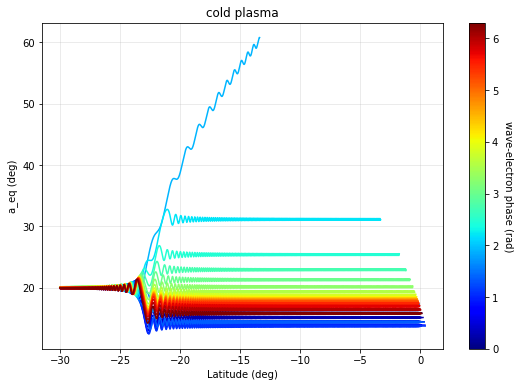

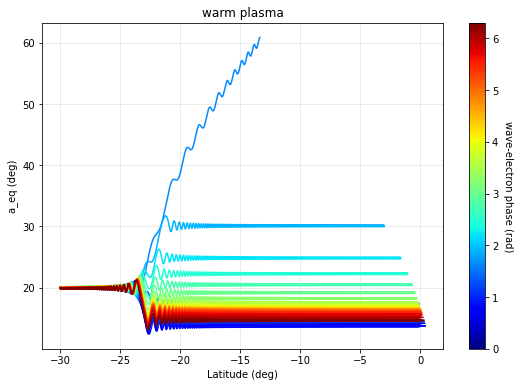

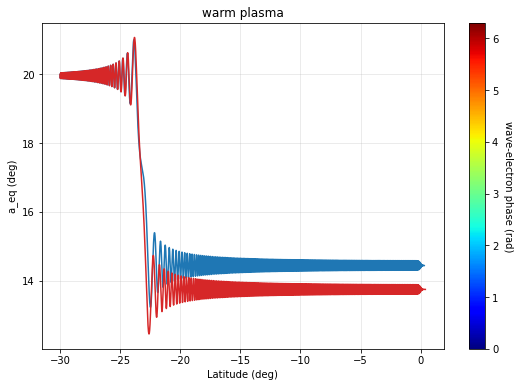

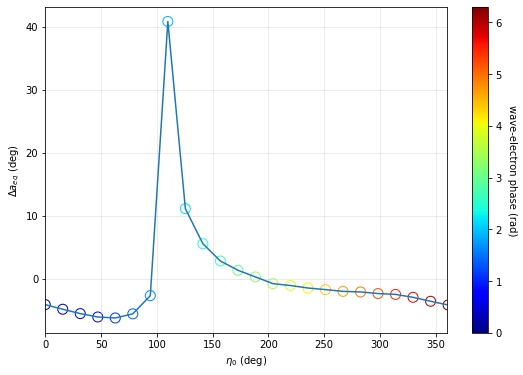

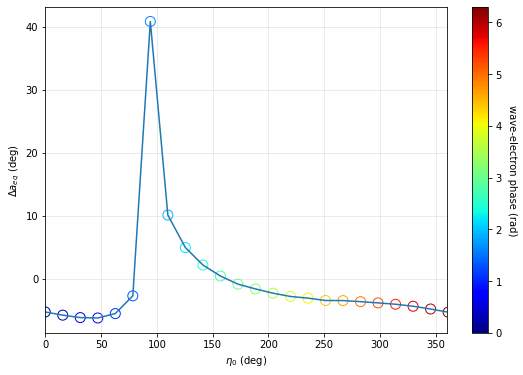

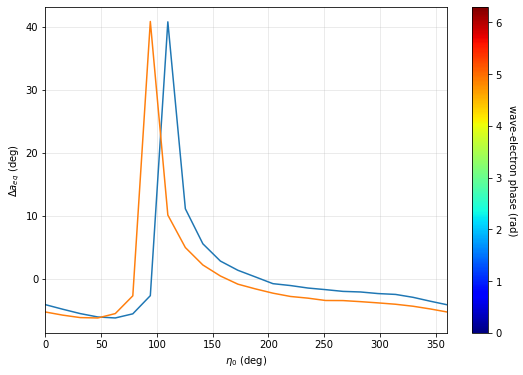

In [14]:
from matplotlib import cm
aeq=np.nan_to_num(aeq)
dalpha=[]
eta0=np.asarray(eta0)
for r in range(0,len(eta0)):
    ls=np.max(np.nonzero(aeq[r,:]))
    dalphaf=np.rad2deg(aeq[r,ls])-aeq0_deg
    dalpha.append(dalphaf)
#     print(np.rad2deg(aeq[r,ls]))

norm = cm.colors.Normalize(vmin=eta0.min(), vmax=eta0.max())
cmap = cm.ScalarMappable(norm=norm, cmap=cm.jet)
cmap.set_array([])

norm2 = cm.colors.Normalize(vmin=eta0.min(), vmax=eta0.max())
cmap2 = cm.ScalarMappable(norm=norm2, cmap=cm.winter)
cmap2.set_array([])

aeq_w=np.nan_to_num(aeq_w)
dalpha_w=[]

for r in range(0,len(eta0)):
    ls=np.max(np.nonzero(aeq_w[r,:]))
    dalphaf=np.rad2deg(aeq_w[r,ls])-aeq0_deg
    dalpha_w.append(dalphaf)
#     print(np.rad2deg(aeq[r,ls]))

norm3 = cm.colors.Normalize(vmin=eta0.min(), vmax=eta0.max())
cmap3 = cm.ScalarMappable(norm=norm, cmap=cm.jet)
cmap3.set_array([])

norm4 = cm.colors.Normalize(vmin=eta0.min(), vmax=eta0.max())
cmap4 = cm.ScalarMappable(norm=norm2, cmap=cm.winter)
cmap4.set_array([])
##################################################################
fig, ax = plt.subplots(figsize=(9,6))
s=5


for r in range(0,len(eta0)):
    ax.plot(np.rad2deg(lamda[r,:-1]),np.rad2deg(aeq[r,:-1]),c=cmap.to_rgba(eta0[r]))
ax.grid(alpha=.3)
# ax.set_xlim(-30,-5)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel('a_eq (deg)')
ax.set_title('cold plasma')
# ax.set_ylim(63,72)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# ax.axvline(x=-5,color="black", linestyle="--")
plt.show()
###################################################################
##################################################################
fig, ax = plt.subplots(figsize=(9,6))
s=5


for r in range(0,len(eta0)):
    ax.plot(np.rad2deg(lamda_w[r,:-1]),np.rad2deg(aeq_w[r,:-1]),c=cmap.to_rgba(eta0[r]))
ax.grid(alpha=.3)
# ax.set_xlim(-30,-5)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel('a_eq (deg)')
ax.set_title('warm plasma')
# ax.set_ylim(63,72)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# ax.axvline(x=-5,color="black", linestyle="--")
plt.show()
###################################################################
##################################################################
fig, ax = plt.subplots(figsize=(9,6))
s=5

rr=4

ax.plot(np.rad2deg(lamda_w[rr,:-1]),np.rad2deg(aeq_w[rr,:-1]),c='tab:blue')
ax.plot(np.rad2deg(lamda[rr,:-1]),np.rad2deg(aeq[rr,:-1]),c='tab:red')
ax.grid(alpha=.3)
# ax.set_xlim(-30,-5)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel('a_eq (deg)')
ax.set_title('warm plasma')
# ax.set_ylim(63,72)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# ax.axvline(x=-5,color="black", linestyle="--")
plt.show()
###################################################################

####################################################################
fig, ax = plt.subplots(figsize=(9,6))
s=5

colors=eta0[:]

ax.grid(alpha=.3)
ax.plot(np.rad2deg(eta0),dalpha)
ax.scatter(np.rad2deg(eta0),dalpha,marker='o',facecolors='none', edgecolors=cmap.to_rgba(eta0[:]),s=100)
ax.set_xlim(0,360)
ax.set_xlabel(r'$\eta_0$ (deg)')
ax.set_ylabel(r'$\Delta a_{eq}$ (deg)')

# ax.set_ylim(-10,10)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# ax.axvline(x=-5,color="black", linestyle="--")
plt.show()
################################################################
####################################################################
fig, ax = plt.subplots(figsize=(9,6))
s=5

colors=eta0[:]

ax.grid(alpha=.3)
ax.plot(np.rad2deg(eta0),dalpha_w)
ax.scatter(np.rad2deg(eta0),dalpha_w,marker='o',facecolors='none', edgecolors=cmap3.to_rgba(eta0[:]),s=100)
ax.set_xlim(0,360)
ax.set_xlabel(r'$\eta_0$ (deg)')
ax.set_ylabel(r'$\Delta a_{eq}$ (deg)')

# ax.set_ylim(-10,10)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# ax.axvline(x=-5,color="black", linestyle="--")
plt.show()
################################################################

####################################################################
fig, ax = plt.subplots(figsize=(9,6))
s=5

colors=eta0[:]

ax.grid(alpha=.3)
ax.plot(np.rad2deg(eta0),dalpha)
ax.plot(np.rad2deg(eta0),dalpha_w)
ax.set_xlim(0,360)
ax.set_xlabel(r'$\eta_0$ (deg)')
ax.set_ylabel(r'$\Delta a_{eq}$ (deg)')

# ax.set_ylim(-10,10)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# ax.axvline(x=-5,color="black", linestyle="--")
plt.show()


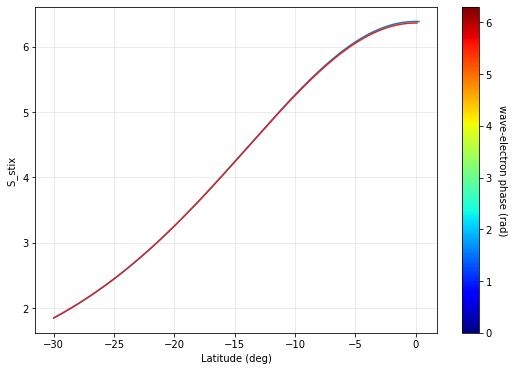

In [15]:
#########################################################################

fig, ax = plt.subplots(figsize=(9,6))

ax.plot(np.rad2deg(lamda_w[0,:-1]),S_stix_w[0,:-1],c='tab:blue')
ax.plot(np.rad2deg(lamda[0,:-1]),S_stix[0,:-1],c='tab:red')
# ax.legend()
ax.grid(alpha=.3)
# ax.set_xlim(-6,-4)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel('S_stix ')
# ax.axvline(x=-5,color="black", linestyle="--")
# ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# ax.axvline(x=-5,color="black", linestyle="--")
plt.show()

#########################################################################

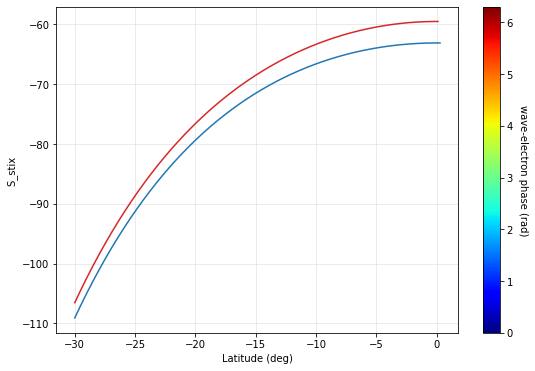

In [16]:
#########################################################################

fig, ax = plt.subplots(figsize=(9,6))

ax.plot(np.rad2deg(lamda_w[0,:-1]),P_stix_w[0,:-1],c='tab:blue')
ax.plot(np.rad2deg(lamda[0,:-1]),P_stix[0,:-1],c='tab:red')
# ax.legend()
ax.grid(alpha=.3)
# ax.set_xlim(-6,-4)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel('S_stix ')
# ax.axvline(x=-5,color="black", linestyle="--")
# ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# ax.axvline(x=-5,color="black", linestyle="--")
plt.show()

#########################################################################

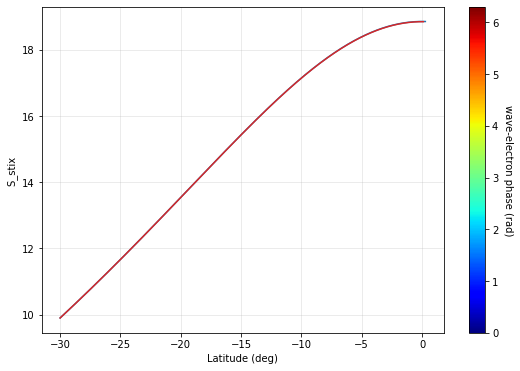

In [17]:
#########################################################################

fig, ax = plt.subplots(figsize=(9,6))

ax.plot(np.rad2deg(lamda_w[0,:-1]),D_stix_w[0,:-1],c='tab:blue')
ax.plot(np.rad2deg(lamda[0,:-1]),D_stix[0,:-1],c='tab:red')
# ax.legend()
ax.grid(alpha=.3)
# ax.set_xlim(-6,-4)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel('S_stix ')
# ax.axvline(x=-5,color="black", linestyle="--")
# ax.set_ylim(2.27*10**(-22),2.3*10**(-22))
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('wave-electron phase (rad)', rotation=270,labelpad=15)
# ax.axvline(x=-5,color="black", linestyle="--")
plt.show()

#########################################################################